In [10]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import math

In [11]:
data =  pd.read_csv('linear_regression_dataset.csv', header = 0)
data = data[["AGE", "FEMALE", "LOS", "RACE", "APRDRG", "TOTCHG"]]

In [12]:
print(data.to_string())

     AGE  FEMALE  LOS  RACE  APRDRG  TOTCHG
0     17       1    2   1.0     560    2660
1     17       0    2   1.0     753    1689
2     17       1    7   1.0     930   20060
3     17       1    1   1.0     758     736
4     17       1    1   1.0     754    1194
5     17       0    0   1.0     347    3305
6     17       1    4   1.0     754    2205
7     16       1    2   1.0     754    1167
8     16       1    1   1.0     753     532
9     17       1    2   1.0     758    1363
10    17       1    2   1.0     758    1245
11    15       0    2   1.0     753    1656
12    15       1    2   1.0     751    1379
13    15       1    4   1.0     758    2346
14    15       1    7   1.0     753    4006
15    15       1    4   1.0     758    2181
16    14       1    1   1.0     754     628
17    14       1    4   1.0     758    2463
18    15       1    3   1.0     753    1956
19    14       1    3   1.0     758    1802
20    13       1    1   1.0     812    3188
21    17       1    2   1.0     

In [13]:
data = data.dropna() #drop rows with atleast one null value
data = pd.concat([pd.Series(1, index=data.index, name='Bias'), data], axis=1)
print(data.head())
test = data.iloc[401:499]
data = data.iloc[0:400]

   Bias  AGE  FEMALE  LOS  RACE  APRDRG  TOTCHG
0     1   17       1    2   1.0     560    2660
1     1   17       0    2   1.0     753    1689
2     1   17       1    7   1.0     930   20060
3     1   17       1    1   1.0     758     736
4     1   17       1    1   1.0     754    1194


<AxesSubplot:>

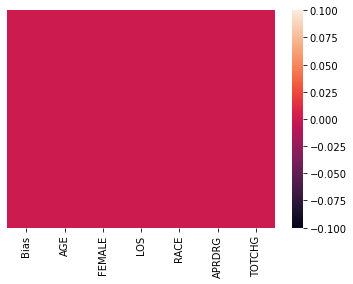

In [14]:
sns.heatmap(data.isnull(), yticklabels=False)

In [15]:
X = data.drop(columns='TOTCHG'); #dropping totchg column
Y = data.loc[:,['TOTCHG']];      #extracting totchg for all rows
t_X = test.drop(columns='TOTCHG');
t_Y = test.loc[:,['TOTCHG']];
print(Y)
print(X.columns)

     TOTCHG
0      2660
1      1689
2     20060
3       736
4      1194
..      ...
396    4677
397    3285
398   10585
399    1808
400    1051

[400 rows x 1 columns]
Index(['Bias', 'AGE', 'FEMALE', 'LOS', 'RACE', 'APRDRG'], dtype='object')


In [16]:
m=len(X)
for i in X.columns:     #normalization of training and testing dataset
    t_X[i] = t_X[i]/np.max(X[i])
    X[i] = X[i]/np.max(X[i])
print(t_X.head())

     Bias  AGE  FEMALE       LOS      RACE    APRDRG
402   1.0  0.0     1.0  0.097561  0.500000  0.657563
403   1.0  0.0     0.0  0.024390  0.166667  0.672269
404   1.0  0.0     1.0  0.048780  0.166667  0.672269
405   1.0  1.0     1.0  0.024390  0.166667  0.790966
406   1.0  0.0     0.0  0.048780  0.166667  0.672269


In [17]:
weights = np.random.rand(len(X.columns))
m = len(X)
print(m)

400


In [18]:
def hypothesis(weights, X):
    return weights*X;
h = hypothesis(weights, X)
print(h)

         Bias       AGE    FEMALE       LOS      RACE    APRDRG
0    0.536595  0.612833  0.679856  0.011759  0.004972  0.503125
1    0.536595  0.612833  0.000000  0.011759  0.004972  0.676524
2    0.536595  0.612833  0.679856  0.041156  0.004972  0.835547
3    0.536595  0.612833  0.679856  0.005879  0.004972  0.681016
4    0.536595  0.612833  0.679856  0.005879  0.004972  0.677422
..        ...       ...       ...       ...       ...       ...
396  0.536595  0.000000  0.000000  0.029397  0.004972  0.575000
397  0.536595  0.612833  0.000000  0.011759  0.004972  0.677422
398  0.536595  0.324441  0.000000  0.005879  0.004972  0.276719
399  0.536595  0.432588  0.000000  0.017638  0.004972  0.676524
400  0.536595  0.000000  0.000000  0.005879  0.004972  0.575000

[400 rows x 6 columns]


In [19]:
def computeCost(X,Y,weights, d = m):
    h = hypothesis(weights, X)
    h=np.sum(h, axis=1) #given m rows x 1 column vector by summing the features
    print(h)
    return sum(np.sqrt((h-Y['TOTCHG'])**2))/(2*d) #root mean square of the error
cost = computeCost(X, Y, weights)

0      2.349140
1      1.842683
2      2.710959
3      2.521151
4      2.517558
         ...   
396    1.145965
397    1.843581
398    1.148607
399    1.668317
400    1.122447
Length: 400, dtype: float64


In [20]:
def gradientDescent(X, Y, weights, n, epoch):
    Costs = [] #cost function in each iteration
    for k in range(epoch):   
        h = hypothesis(weights, X)
        h = np.sum(h, axis=1)
        for c in range(0, len(X.columns)):
            weights[c] = weights[c] - n*(sum((h-Y['TOTCHG'])*X.iloc[:,c])/len(X))  #update weights
            print (weights)
        cost = computeCost(X, Y, weights)  #determine cost function using new values of weights 
        Costs.append(cost)  
    return Costs, cost, weights

In [21]:
Costs, cost, weights = gradientDescent(X, Y, weights, 0.01, 15000)
h = hypothesis(weights, X)
h = np.sum(h, axis=1)
print(h)

[29.66211331  0.61283257  0.67985585  0.24105485  0.02983346  0.85531286]
[29.66211331 12.40128971  0.67985585  0.24105485  0.02983346  0.85531286]
[29.66211331 12.40128971 14.31482249  0.24105485  0.02983346  0.85531286]
[29.66211331 12.40128971 14.31482249  4.53016565  0.02983346  0.85531286]
[29.66211331 12.40128971 14.31482249  4.53016565  5.1116017   0.85531286]
[29.66211331 12.40128971 14.31482249  4.53016565  5.1116017  16.74117183]
0      67.298891
1      56.378025
2      74.357898
3      70.670281
4      70.599940
         ...    
396    42.321075
397    56.395610
398    42.606189
399    52.841078
400    41.879108
Length: 400, dtype: float64
[58.27219259 12.40128971 14.31482249  4.53016565  5.1116017  16.74117183]
[58.27219259 23.98629977 14.31482249  4.53016565  5.1116017  16.74117183]
[58.27219259 23.98629977 27.63689454  4.53016565  5.1116017  16.74117183]
[58.27219259 23.98629977 27.63689454  8.78352253  5.1116017  16.74117183]
[58.27219259 23.98629977 27.63689454  8.78352

Length: 400, dtype: float64
[536.09790355 210.19249149 228.7664486   83.63518858  89.75263784
 270.61786247]
[536.09790355 218.43289707 228.7664486   83.63518858  89.75263784
 270.61786247]
[536.09790355 218.43289707 236.96913904  83.63518858  89.75263784
 270.61786247]
[536.09790355 218.43289707 236.96913904  87.30031726  89.75263784
 270.61786247]
[536.09790355 218.43289707 236.96913904  87.30031726  93.24668055
 270.61786247]
[536.09790355 218.43289707 236.96913904  87.30031726  93.24668055
 280.54170835]
0      1176.324139
1       996.229527
2      1296.004587
3      1232.542824
4      1231.364077
          ...     
396     750.884865
397     996.524214
398     760.172732
399     934.113834
400     742.367761
Length: 400, dtype: float64
[555.89132936 218.43289707 236.96913904  87.30031726  93.24668055
 280.54170835]
[555.89132936 226.537498   236.96913904  87.30031726  93.24668055
 280.54170835]
[555.89132936 226.537498   244.96523997  87.30031726  93.24668055
 280.54170835]
[555.8

0      1855.525733
1      1584.939069
2      2041.443881
3      1941.312011
4      1939.503630
          ...     
396    1193.119528
397    1585.391164
398    1214.419387
399    1485.162203
400    1178.205203
Length: 400, dtype: float64
[874.62274222 351.91852213 357.84104708 152.87183443 149.30289151
 430.39467496]
[874.62274222 357.88180765 357.84104708 152.87183443 149.30289151
 430.39467496]
[874.62274222 357.88180765 362.60125441 152.87183443 149.30289151
 430.39467496]
[874.62274222 357.88180765 362.60125441 156.13569447 149.30289151
 430.39467496]
[874.62274222 357.88180765 362.60125441 156.13569447 151.77776068
 430.39467496]
[874.62274222 357.88180765 362.60125441 156.13569447 151.77776068
 436.50266977]
0      1884.784749
1      1610.676158
2      2073.474835
3      1971.761781
4      1969.927736
          ...     
396    1212.407147
397    1611.134669
398    1234.415515
399    1509.224991
400    1197.174396
Length: 400, dtype: float64
[888.75939743 357.88180765 362.60125441 

[1107.84783409  455.45169993  429.60034319  215.37047928  189.9492331
  522.6513214 ]
[1107.84783409  455.45169993  429.60034319  215.37047928  191.75796601
  522.6513214 ]
[1107.84783409  455.45169993  429.60034319  215.37047928  191.75796601
  526.27525805]
0      2344.939096
1      2022.031111
2      2575.743543
3      2449.142567
4      2446.931326
          ...     
396    1519.870680
397    2022.583921
398    1556.447446
399    1893.327667
400    1498.858926
Length: 400, dtype: float64
[1118.28960094  455.45169993  429.60034319  215.37047928  191.75796601
  526.27525805]
[1118.28960094  459.8625027   429.60034319  215.37047928  191.75796601
  526.27525805]
[1118.28960094  459.8625027   432.05505069  215.37047928  191.75796601
  526.27525805]
[1118.28960094  459.8625027   432.05505069  218.36000449  191.75796601
  526.27525805]
[1118.28960094  459.8625027   432.05505069  218.36000449  193.53788883
  526.27525805]
[1118.28960094  459.8625027   432.05505069  218.36000449  193.537888

0      2662.694691
1      2317.572276
2      2919.904887
3      2776.091130
4      2773.667035
          ...     
396    1739.350158
397    2318.178300
398    1792.104692
399    2168.424359
400    1712.965052
Length: 400, dtype: float64
[1289.51468123  529.53025629  462.08501206  270.44734276  221.22220897
  576.93467323]
[1289.51468123  532.92452911  462.08501206  270.44734276  221.22220897
  576.93467323]
[1289.51468123  532.92452911  463.06744153  270.44734276  221.22220897
  576.93467323]
[1289.51468123  532.92452911  463.06744153  273.25655187  221.22220897
  576.93467323]
[1289.51468123  532.92452911  463.06744153  273.25655187  222.54706809
  576.93467323]
[1289.51468123  532.92452911  463.06744153  273.25655187  222.54706809
  578.76447806]
0      2676.377111
1      2330.643224
2      2934.641056
3      2790.085601
4      2787.653818
          ...     
396    1749.015192
397    2331.251170
398    1802.654500
399    2180.565510
400    1722.356017
Length: 400, dtype: float64
[129

  601.17273259]
[1426.14543299  592.57365822  471.18354051  325.29616791  244.36392585
  601.17273259]
[1426.14543299  592.57365822  471.13138599  325.29616791  244.36392585
  601.17273259]
[1426.14543299  592.57365822  471.13138599  327.97334526  244.36392585
  601.17273259]
[1426.14543299  592.57365822  471.13138599  327.97334526  245.35737878
  601.17273259]
[1426.14543299  592.57365822  471.13138599  327.97334526  245.35737878
  601.78396963]
0      2900.732644
1      2551.601579
2      3174.616020
3      3017.894246
4      3015.365742
          ...     
396    1911.595731
397    2552.233705
398    1983.447959
399    2385.314559
400    1879.598331
Length: 400, dtype: float64
[1432.07160658  592.57365822  471.13138599  327.97334526  245.35737878
  601.78396963]
[1432.07160658  595.19734544  471.13138599  327.97334526  245.35737878
  601.78396963]
[1432.07160658  595.19734544  471.03811499  327.97334526  245.35737878
  601.78396963]
[1432.07160658  595.19734544  471.03811499  330.645

[1522.43780231  633.49317616  464.61635553  372.73251398  260.3680411
  605.33291555]
[1522.43780231  635.6807586   464.61635553  372.73251398  260.3680411
  605.33291555]
[1522.43780231  635.6807586   463.94465797  372.73251398  260.3680411
  605.33291555]
[1522.43780231  635.6807586   463.94465797  375.32592986  260.3680411
  605.33291555]
[1522.43780231  635.6807586   463.94465797  375.32592986  261.15283794
  605.33291555]
[1522.43780231  635.6807586   463.94465797  375.32592986  261.15283794
  605.18555785]
0      3039.888778
1      2698.634050
2      3320.868906
3      3156.602912
4      3154.060116
          ...     
396    2018.582164
397    2699.269749
398    2107.449766
399    2520.823412
400    1981.965000
Length: 400, dtype: float64
[1527.21123473  635.6807586   463.94465797  375.32592986  261.15283794
  605.18555785]
[1527.21123473  637.84672189  463.94465797  375.32592986  261.15283794
  605.18555785]
[1527.21123473  637.84672189  463.24519998  375.32592986  261.15283794


  596.45893165]
0      3142.271985
1      2816.640606
2      3425.788097
3      3255.985600
4      3253.479470
          ...     
396    2103.308617
397    2817.267138
398    2210.527584
399    2628.876520
400    2061.949345
Length: 400, dtype: float64
[1608.80419996  673.55327106  446.55215027  423.93253926  274.41321972
  596.45893165]
[1608.80419996  675.37560503  446.55215027  423.93253926  274.41321972
  596.45893165]
[1608.80419996  675.37560503  445.42913484  423.93253926  274.41321972
  596.45893165]
[1608.80419996  675.37560503  445.42913484  426.45970308  274.41321972
  596.45893165]
[1608.80419996  675.37560503  445.42913484  426.45970308  275.03472008
  596.45893165]
[1608.80419996  675.37560503  445.42913484  426.45970308  275.03472008
  595.72715056]
0      3146.678708
1      2822.021989
2      3430.218600
3      3260.178487
4      3257.675431
          ...     
396    2107.139442
397    2822.647753
398    2215.331822
399    2633.783561
400    2065.533617
Length: 400, dty

  577.79746924]
0      3215.945916
1      2911.887345
2      3498.315527
3      3324.556985
4      3322.129264
          ...     
396    2170.554744
397    2912.494275
398    2297.332807
399    2715.379975
400    2124.310369
Length: 400, dtype: float64
[1679.9738529   707.43277938  421.19608261  474.00484587  285.69698404
  577.79746924]
[1679.9738529   709.00074025  421.19608261  474.00484587  285.69698404
  577.79746924]
[1679.9738529   709.00074025  419.79256546  474.00484587  285.69698404
  577.79746924]
[1679.9738529   709.00074025  419.79256546  476.48521798  285.69698404
  577.79746924]
[1679.9738529   709.00074025  419.79256546  476.48521798  286.20494793
  577.79746924]
[1679.9738529   709.00074025  419.79256546  476.48521798  286.20494793
  576.66872342]
0      3218.928061
1      2916.044176
2      3501.161463
3      3327.243873
4      3324.820895
          ...     
396    2173.459084
397    2916.649920
398    2301.218894
399    2719.136137
400    2126.972721
Length: 400, dty

[1740.57907325  736.98887381  391.39802374  523.27551381  295.05330736
  552.48855637]
[1740.57907325  738.37781034  391.39802374  523.27551381  295.05330736
  552.48855637]
[1740.57907325  738.37781034  389.82897965  523.27551381  295.05330736
  552.48855637]
[1740.57907325  738.37781034  389.82897965  525.7223304   295.05330736
  552.48855637]
[1740.57907325  738.37781034  389.82897965  525.7223304   295.48159811
  552.48855637]
[1740.57907325  738.37781034  389.82897965  525.7223304   295.48159811
  551.09024496]
0      3267.848520
1      2989.742668
2      3546.145234
3      3369.643533
4      3367.328028
          ...     
396    2224.419323
397    2990.321544
398    2371.848305
399    2785.395220
400    2173.129339
Length: 400, dtype: float64
[1743.39349     738.37781034  389.82897965  525.7223304   295.48159811
  551.09024496]
[1743.39349     739.7593031   389.82897965  525.7223304   295.48159811
  551.09024496]
[1743.39349     739.7593031   388.25393835  525.7223304   295.48159

0      3299.670028
1      3046.557469
2      3572.559276
3      3394.425506
4      3392.229428
          ...     
396    2262.885494
397    3047.106488
398    2429.006782
399    2835.953763
400    2207.083894
Length: 400, dtype: float64
[1793.77264149  763.48396164  359.07333955  571.96640914  303.04999065
  522.66664733]
[1793.77264149  764.74510985  359.07333955  571.96640914  303.04999065
  522.66664733]
[1793.77264149  764.74510985  357.41587752  571.96640914  303.04999065
  522.66664733]
[1793.77264149  764.74510985  357.41587752  574.38868066  303.04999065
  522.66664733]
[1793.77264149  764.74510985  357.41587752  574.38868066  303.42167828
  522.66664733]
[1793.77264149  764.74510985  357.41587752  574.38868066  303.42167828
  521.08539664]
0      3301.043690
1      3049.268024
2      3573.613776
3      3395.411215
4      3393.221780
          ...     
396    2264.699832
397    3049.815383
398    2431.803911
399    2838.352472
400    2208.661912
Length: 400, dtype: float64
[179

  491.48364453]
[1839.40646081  787.77677035  325.50381698  620.22864107  310.07410332
  489.78351743]
0      3322.729072
1      3096.519603
2      3588.723751
3      3409.468285
4      3407.410371
          ...     
396    2295.989347
397    3097.034082
398    2481.730669
399    2879.948081
400    2235.479236
Length: 400, dtype: float64
[1841.70276625  787.77677035  325.50381698  620.22864107  310.07410332
  489.78351743]
[1841.70276625  788.94500051  325.50381698  620.22864107  310.07410332
  489.78351743]
[1841.70276625  788.94500051  323.80937963  620.22864107  310.07410332
  489.78351743]
[1841.70276625  788.94500051  323.80937963  622.6325087   310.07410332
  489.78351743]
[1841.70276625  788.94500051  323.80937963  622.6325087   310.40492862
  489.78351743]
[1841.70276625  788.94500051  323.80937963  622.6325087   310.40492862
  488.07827207]
0      3323.668485
1      3098.807746
2      3589.293565
3      3409.994403
4      3407.943654
          ...     
396    2297.487562
397  

[1883.7020739   809.34994778  293.23971067  665.77498203  316.08794634
  456.61306996]
[1883.7020739   810.45204366  293.23971067  665.77498203  316.08794634
  456.61306996]
[1883.7020739   810.45204366  291.54189013  665.77498203  316.08794634
  456.61306996]
[1883.7020739   810.45204366  291.54189013  668.16527182  316.08794634
  456.61306996]
[1883.7020739   810.45204366  291.54189013  668.16527182  316.38997889
  456.61306996]
[1883.7020739   810.45204366  291.54189013  668.16527182  316.38997889
  454.82743375]
0      3338.566648
1      3139.232420
2      3596.821384
3      3416.866396
4      3414.955356
          ...     
396    2323.683649
397    3139.710180
398    2528.943350
399    2917.160886
400    2258.496793
Length: 400, dtype: float64
[1885.83547676  810.45204366  291.54189013  668.16527182  316.38997889
  454.82743375]
[1885.83547676  811.55111839  291.54189013  668.16527182  316.38997889
  454.82743375]
[1885.83547676  811.55111839  289.84453282  668.16527182  316.38997

Length: 400, dtype: float64
[1923.14387083  829.80921153  261.10926638  711.08855587  321.61955526
  422.15602212]
[1923.14387083  830.86007849  261.10926638  711.08855587  321.61955526
  422.15602212]
[1923.14387083  830.86007849  259.42858617  711.08855587  321.61955526
  422.15602212]
[1923.14387083  830.86007849  259.42858617  713.46790345  321.61955526
  422.15602212]
[1923.14387083  830.86007849  259.42858617  713.46790345  321.89957482
  422.15602212]
[1923.14387083  830.86007849  259.42858617  713.46790345  321.89957482
  420.31515585]
0      3349.129986
1      3174.912351
2      3599.496048
3      3419.146818
4      3417.380788
          ...     
396    2346.366892
397    3175.353858
398    2570.046872
399    2947.943396
400    2276.760267
Length: 400, dtype: float64
[1925.16131243  830.86007849  259.42858617  713.46790345  321.89957482
  420.31515585]
[1925.16131243  831.90856953  259.42858617  713.46790345  321.89957482
  420.31515585]
[1925.16131243  831.90856953  257.74923

  392.4430007 ]
[1954.82496345  847.36864991  234.3963777   749.09843474  325.98514363
  392.4430007 ]
[1954.82496345  847.36864991  232.74082846  749.09843474  325.98514363
  392.4430007 ]
[1954.82496345  847.36864991  232.74082846  751.47002233  325.98514363
  392.4430007 ]
[1954.82496345  847.36864991  232.74082846  751.47002233  326.25037727
  392.4430007 ]
[1954.82496345  847.36864991  232.74082846  751.47002233  326.25037727
  390.56945406]
0      3355.713317
1      3202.153060
2      3599.152954
3      3418.616662
4      3416.975614
          ...     
396    2363.410412
397    3202.563322
398    2602.496201
399    2971.255524
400    2290.096264
Length: 400, dtype: float64
[1956.7654966   847.36864991  232.74082846  751.47002233  326.25037727
  390.56945406]
[1956.7654966   848.38259559  232.74082846  751.47002233  326.25037727
  390.56945406]
[1956.7654966   848.38259559  231.08709454  751.47002233  326.25037727
  390.56945406]
[1956.7654966   848.38259559  231.08709454  753.841

[1989.13585043  864.35140681  204.89282551  791.7209797   330.6391034
  358.48399895]
[1989.13585043  865.33446606  204.89282551  791.7209797   330.6391034
  358.48399895]
[1989.13585043  865.33446606  203.27331014  791.7209797   330.6391034
  358.48399895]
[1989.13585043  865.33446606  203.27331014  794.08498042  330.6391034
  358.48399895]
[1989.13585043  865.33446606  203.27331014  794.08498042  330.89066134
  358.48399895]
[1989.13585043  865.33446606  203.27331014  794.08498042  330.89066134
  356.5844976 ]
0      3361.383510
1      3230.400964
2      3596.811654
3      3416.179166
4      3414.680912
          ...     
396    2380.844596
397    3230.775528
398    2637.136040
399    2995.258754
400    2303.372891
Length: 400, dtype: float64
[1991.00619007  865.33446606  203.27331014  794.08498042  330.89066134
  356.5844976 ]
[1991.00619007  866.31585889  203.27331014  794.08498042  330.89066134
  356.5844976 ]
[1991.00619007  866.31585889  201.65597631  794.08498042  330.89066134


  320.29714859]
[2025.91919004  884.66390394  171.35987662  841.28571238  335.786259
  320.29714859]
[2025.91919004  884.66390394  171.35987662  841.28571238  335.786259
  318.37840374]
0      3366.227088
1      3259.412413
2      3592.562413
3      3411.925282
4      3410.587557
          ...     
396    2398.515287
397    3259.746845
398    2673.758986
399    3019.736311
400    2316.438632
Length: 400, dtype: float64
[2027.72616581  884.66390394  171.35987662  841.28571238  335.786259
  318.37840374]
[2027.72616581  885.61475142  171.35987662  841.28571238  335.786259
  318.37840374]
[2027.72616581  885.61475142  169.78899582  841.28571238  335.786259
  318.37840374]
[2027.72616581  885.61475142  169.78899582  843.641957    335.786259
  318.37840374]
[2027.72616581  885.61475142  169.78899582  843.641957    336.02470986
  318.37840374]
[2027.72616581  885.61475142  169.78899582  843.641957    336.02470986
  316.45890352]
0      3366.439594
1      3260.806657
2      3592.316241
3     

  279.86590713]
0      3370.087012
1      3286.410534
2      3587.193391
3      3406.627424
4      3405.451517
          ...     
396    2414.767613
397    3286.704511
398    2708.782916
399    3042.364432
400    2328.099641
Length: 400, dtype: float64
[2063.29983718  903.42452216  140.413999    888.34671689  340.4531319
  279.86590713]
[2063.29983718  904.34899266  140.413999    888.34671689  340.4531319
  279.86590713]
[2063.29983718  904.34899266  138.89322708  888.34671689  340.4531319
  279.86590713]
[2063.29983718  904.34899266  138.89322708  890.69634516  340.4531319
  279.86590713]
[2063.29983718  904.34899266  138.89322708  890.69634516  340.68111656
  279.86590713]
[2063.29983718  904.34899266  138.89322708  890.69634516  340.68111656
  277.93451466]
0      3370.261736
1      3287.714477
2      3586.904009
3      3406.343143
4      3405.175351
          ...     
396    2415.548261
397    3288.006425
398    2710.497311
399    3043.453780
400    2328.651057
Length: 400, dtype: 

[2097.90989029  921.68707381  110.48979532  935.28069316  344.92465737
  241.16416467]
[2097.90989029  922.58809197  110.48979532  935.28069316  344.92465737
  241.16416467]
[2097.90989029  922.58809197  109.0209202   935.28069316  344.92465737
  241.16416467]
[2097.90989029  922.58809197  109.0209202   937.62423124  344.92465737
  241.16416467]
[2097.90989029  922.58809197  109.0209202   937.62423124  345.14356607
  241.16416467]
[2097.90989029  922.58809197  109.0209202   937.62423124  345.14356607
  239.22569203]
0      3373.501593
1      3312.979159
2      3580.822383
3      3400.387632
4      3399.382483
          ...     
396    2430.602231
397    3313.230446
398    2744.128239
399    3064.498603
400    2339.126696
Length: 400, dtype: float64
[2099.6176067   922.58809197  109.0209202   937.62423124  345.14356607
  239.22569203]
[2099.6176067   923.48799781  109.0209202   937.62423124  345.14356607
  239.22569203]
[2099.6176067   923.48799781  107.55466251  937.62423124  345.14356

  204.2968392 ]
[2130.01579841  939.50148735   81.6103775   982.09664036  349.01351099
  204.2968392 ]
[2130.01579841  939.50148735   81.6103775   982.09664036  349.22473242
  204.2968392 ]
[2130.01579841  939.50148735   81.6103775   982.09664036  349.22473242
  202.35477622]
0      3376.271160
1      3335.684387
2      3574.685332
3      3394.403976
4      3393.553746
          ...     
396    2444.024628
397    3335.896945
398    2775.024359
399    3083.313997
400    2348.210321
Length: 400, dtype: float64
[2131.68639498  939.50148735   81.6103775   982.09664036  349.22473242
  202.35477622]
[2131.68639498  940.38113338   81.6103775   982.09664036  349.22473242
  202.35477622]
[2131.68639498  940.38113338   80.19394529  982.09664036  349.22473242
  202.35477622]
[2131.68639498  940.38113338   80.19394529  984.434464    349.22473242
  202.35477622]
[2131.68639498  940.38113338   80.19394529  984.434464    349.43556966
  202.35477622]
[2131.68639498  940.38113338   80.19394529  984.434

  161.55158994]
[2166.35724193  958.62215127   52.41406262 1031.13341353  353.5742782
  161.55158994]
[2166.35724193  958.62215127   51.05239255 1031.13341353  353.5742782
  161.55158994]
[2166.35724193  958.62215127   51.05239255 1033.46552933  353.5742782
  161.55158994]
[2166.35724193  958.62215127   51.05239255 1033.46552933  353.77743365
  161.55158994]
[2166.35724193  958.62215127   51.05239255 1033.46552933  353.77743365
  159.60805684]
0      3379.294736
1      3360.599859
2      3567.359661
3      3387.284053
4      3386.613431
          ...     
396    2458.652063
397    3360.767515
398    2809.670369
399    3103.858644
400    2357.826158
Length: 400, dtype: float64
[2167.98935053  958.62215127   51.05239255 1033.46552933  353.77743365
  159.60805684]
[2167.98935053  959.48001202   51.05239255 1033.46552933  353.77743365
  159.60805684]
[2167.98935053  959.48001202   49.69331133 1033.46552933  353.77743365
  159.60805684]
[2167.98935053  959.48001202   49.69331133 1035.797379

  120.73974891]
[2200.29260492  976.43980915   23.05170811 1082.37926678  357.76888757
  120.73974891]
[2200.29260492  976.43980915   23.05170811 1082.37926678  357.96496966
  120.73974891]
[2200.29260492  976.43980915   23.05170811 1082.37926678  357.96496966
  118.79672315]
0      3382.124364
1      3383.156446
2      3560.292831
3      3380.432592
4      3379.933446
          ...     
396    2471.814248
397    3383.281232
398    2841.725884
399    3122.367761
400    2366.216271
Length: 400, dtype: float64
[2201.89130971  976.43980915   23.05170811 1082.37926678  357.96496966
  118.79672315]
[2201.89130971  977.278108     23.05170811 1082.37926678  357.96496966
  118.79672315]
[2201.89130971  977.278108     21.74642882 1082.37926678  357.96496966
  118.79672315]
[2201.89130971  977.278108     21.74642882 1084.70563806  357.96496966
  118.79672315]
[2201.89130971  977.278108     21.74642882 1084.70563806  358.16072749
  118.79672315]
[2201.89130971  977.278108     21.74642882 1084.705

   81.89394285]
[2231.983006    993.03562145   -2.5763764  1128.8583547   361.63004724
   81.89394285]
[2231.983006    993.03562145   -2.5763764  1128.8583547   361.81982855
   81.89394285]
[2231.983006    993.03562145   -2.5763764  1128.8583547   361.81982855
   79.95264662]
0      3384.842786
1      3403.628049
2      3553.582471
3      3373.938462
4      3373.602526
          ...     
396    2483.701642
397    3403.712033
398    2871.411215
399    3139.091880
400    2373.569120
Length: 400, dtype: float64
[2233.55219227  993.03562145   -2.5763764  1128.8583547   361.81982855
   79.95264662]
[2233.55219227  993.85613484   -2.5763764  1128.8583547   361.81982855
   79.95264662]
[2233.55219227  993.85613484   -3.83161845 1128.8583547   361.81982855
   79.95264662]
[2233.55219227  993.85613484   -3.83161845 1131.17966057  361.81982855
   79.95264662]
[2233.55219227  993.85613484   -3.83161845 1131.17966057  362.00930429
   79.95264662]
[2233.55219227  993.85613484   -3.83161845 1131.179

   43.0917256 ]
[2263.10044234 1009.28213329  -26.00751056 1172.92068056  365.36853002
   43.0917256 ]
[2263.10044234 1009.28213329  -27.2164834  1172.92068056  365.36853002
   43.0917256 ]
[2263.10044234 1009.28213329  -27.2164834  1175.23728232  365.36853002
   43.0917256 ]
[2263.10044234 1009.28213329  -27.2164834  1175.23728232  365.55234979
   43.0917256 ]
[2263.10044234 1009.28213329  -27.2164834  1175.23728232  365.55234979
   41.15306188]
0      3387.627815
1      3423.187304
2      3546.943797
3      3367.522637
4      3367.349724
          ...     
396    2495.013378
397    3423.230532
398    2900.330219
399    3155.003942
400    2380.356082
Length: 400, dtype: float64
[2264.641875   1009.28213329  -27.2164834  1175.23728232  365.55234979
   41.15306188]
[2264.641875   1010.08551143  -27.2164834  1175.23728232  365.55234979
   41.15306188]
[2264.641875   1010.08551143  -28.42305728 1175.23728232  365.55234979
   41.15306188]
[2264.641875   1010.08551143  -28.42305728 1177.553

    4.34901472]
[2293.67693995 1025.19117172  -49.7354283  1219.20640821  368.99052617
    4.34901472]
[2293.67693995 1025.19117172  -50.89713487 1219.20640821  368.99052617
    4.34901472]
[2293.67693995 1025.19117172  -50.89713487 1221.51815056  368.99052617
    4.34901472]
[2293.67693995 1025.19117172  -50.89713487 1221.51815056  369.16866463
    4.34901472]
[2293.67693995 1025.19117172  -50.89713487 1221.51815056  369.16866463
    2.41367451]
0      3390.505147
1      3441.891609
2      3540.408863
3      3361.214025
4      3361.203884
          ...     
396    2505.793317
397    3441.894144
398    2928.527338
399    3170.157920
400    2386.620815
Length: 400, dtype: float64
[2295.19205939 1025.19117172  -50.89713487 1221.51815056  369.16866463
    2.41367451]
[2295.19205939 1025.97794862  -50.89713487 1221.51815056  369.16866463
    2.41367451]
[2295.19205939 1025.97794862  -52.05651798 1221.51815056  369.16866463
    2.41367451]
[2295.19205939 1025.97794862  -52.05651798 1223.829

  -38.18460419]
0      3393.641277
1      3460.662250
2      3533.679818
3      3354.723682
4      3354.884121
          ...     
396    2516.578943
397    3460.622140
398    2957.397311
399    3185.301842
400    2392.675586
Length: 400, dtype: float64
[2326.71780196 1041.54324128  -74.76217971 1270.00940801  372.84634332
  -38.18460419]
[2326.71780196 1042.31307489  -74.76217971 1270.00940801  372.84634332
  -38.18460419]
[2326.71780196 1042.31307489  -75.87366004 1270.00940801  372.84634332
  -38.18460419]
[2326.71780196 1042.31307489  -75.87366004 1272.31589588  372.84634332
  -38.18460419]
[2326.71780196 1042.31307489  -75.87366004 1272.31589588  373.01850635
  -38.18460419]
[2326.71780196 1042.31307489  -75.87366004 1272.31589588  373.01850635
  -40.1156656 ]
0      3393.793708
1      3461.534675
2      3533.363010
3      3354.418228
4      3354.586782
          ...     
396    2517.079513
397    3461.492537
398    2958.753855
399    3186.004101
400    2392.951133
Length: 400, dty

Length: 400, dtype: float64
[2356.23990566 1056.78986933  -96.57087058 1316.09435187  376.23973509
  -76.76520484]
[2356.23990566 1057.54397468  -96.57087058 1316.09435187  376.23973509
  -76.76520484]
[2356.23990566 1057.54397468  -97.63831449 1316.09435187  376.23973509
  -76.76520484]
[2356.23990566 1057.54397468  -97.63831449 1318.39613343  376.23973509
  -76.76520484]
[2356.23990566 1057.54397468  -97.63831449 1318.39613343  376.40668263
  -76.76520484]
[2356.23990566 1057.54397468  -97.63831449 1318.39613343  376.40668263
  -78.69192141]
0      3396.902654
1      3478.587669
2      3527.098625
3      3348.380054
4      3348.710692
          ...     
396    2526.852237
397    3478.505010
398    2985.547427
399    3199.701327
400    2398.228224
Length: 400, dtype: float64
[2357.7035124  1057.54397468  -97.63831449 1318.39613343  376.40668263
  -78.69192141]
[2357.7035124  1058.29730331  -97.63831449 1318.39613343  376.40668263
  -78.69192141]
[2357.7035124  1058.29730331  -98.70359

 -115.25540362]
[2385.29167294 1072.46414182 -117.51347208 1362.08573959  379.53059485
 -115.25540362]
[2385.29167294 1072.46414182 -118.53841739 1362.08573959  379.53059485
 -115.25540362]
[2385.29167294 1072.46414182 -118.53841739 1364.38287365  379.53059485
 -115.25540362]
[2385.29167294 1072.46414182 -118.53841739 1364.38287365  379.69251078
 -115.25540362]
[2385.29167294 1072.46414182 -118.53841739 1364.38287365  379.69251078
 -117.17741705]
0      3400.126852
1      3494.909764
2      3520.973364
3      3342.478288
4      3342.970630
          ...     
396    2536.187179
397    3494.786678
398    3011.716182
399    3212.756765
400    2403.076655
Length: 400, dtype: float64
[2386.73223471 1072.46414182 -118.53841739 1364.38287365  379.69251078
 -117.17741705]
[2386.73223471 1073.20211956 -118.53841739 1364.38287365  379.69251078
 -117.17741705]
[2386.73223471 1073.20211956 -119.56127775 1364.38287365  379.69251078
 -117.17741705]
[2386.73223471 1073.20211956 -119.56127775 1366.679

Length: 400, dtype: float64
[2415.30886637 1087.08048902 -138.6044898  1410.2772277   382.87948925
 -155.56556322]
[2415.30886637 1087.80344873 -138.6044898  1410.2772277   382.87948925
 -155.56556322]
[2415.30886637 1087.80344873 -139.58643989 1410.2772277   382.87948925
 -155.56556322]
[2415.30886637 1087.80344873 -139.58643989 1412.56953873  382.87948925
 -155.56556322]
[2415.30886637 1087.80344873 -139.58643989 1412.56953873  383.03630203
 -155.56556322]
[2415.30886637 1087.80344873 -139.58643989 1412.56953873  383.03630203
 -157.48230982]
0      3403.634437
1      3511.294316
2      3514.692655
3      3336.427848
4      3337.089538
          ...     
396    2545.542368
397    3511.128894
398    3038.546950
399    3225.805041
400    2407.730705
Length: 400, dtype: float64
[2416.72611953 1087.80344873 -139.58643989 1412.56953873  383.03630203
 -157.48230982]
[2416.72611953 1088.52566592 -139.58643989 1412.56953873  383.03630203
 -157.48230982]
[2416.72611953 1088.52566592 -140.56638

 -195.76212581]
[2444.84503703 1102.81527456 -158.80897399 1458.3679711   386.12294123
 -195.76212581]
[2444.84503703 1102.81527456 -159.74955782 1458.3679711   386.12294123
 -195.76212581]
[2444.84503703 1102.81527456 -159.74955782 1460.65551221  386.12294123
 -195.76212581]
[2444.84503703 1102.81527456 -159.74955782 1460.65551221  386.27482098
 -195.76212581]
[2444.84503703 1102.81527456 -159.74955782 1460.65551221  386.27482098
 -197.67331292]
0      3407.262960
1      3526.937991
2      3508.564868
3      3330.524489
4      3331.355049
          ...     
396    2554.463273
397    3526.730351
398    3064.740168
399    3238.206301
400    2411.960296
Length: 400, dtype: float64
[2446.23981546 1102.81527456 -159.74955782 1460.65551221  386.27482098
 -197.67331292]
[2446.23981546 1103.52207715 -159.74955782 1460.65551221  386.27482098
 -197.67331292]
[2446.23981546 1103.52207715 -160.68821168 1460.65551221  386.27482098
 -197.67331292]
[2446.23981546 1103.52207715 -160.68821168 1462.942

[2472.54296859 1116.12115284 -177.25801604 1504.07599964  389.11707387
 -233.93364647]
[2472.54296859 1116.81429423 -177.25801604 1504.07599964  389.11707387
 -233.93364647]
[2472.54296859 1116.81429423 -178.16067522 1504.07599964  389.11707387
 -233.93364647]
[2472.54296859 1116.81429423 -178.16067522 1506.35904369  389.11707387
 -233.93364647]
[2472.54296859 1116.81429423 -178.16067522 1506.35904369  389.26440304
 -233.93364647]
[2472.54296859 1116.81429423 -178.16067522 1506.35904369  389.26440304
 -235.83929761]
0      3410.825918
1      3541.174635
2      3502.868010
3      3325.034844
4      3326.025765
          ...     
396    2562.575265
397    3540.926905
398    3089.114511
399    3249.440307
400    2415.613407
Length: 400, dtype: float64
[2473.91706178 1116.81429423 -178.16067522 1506.35904369  389.26440304
 -235.83929761]
[2473.91706178 1117.50672393 -178.16067522 1506.35904369  389.26440304
 -235.83929761]
[2473.91706178 1117.50672393 -179.06147508 1506.35904369  389.26440

 -268.19171577]
[2497.12241875 1129.16984019 -194.09393912 1547.4156774   391.8783635
 -270.0922025 ]
0      3414.117306
1      3553.455158
2      3497.853725
3      3320.200821
4      3321.335662
          ...     
396    2569.570118
397    3553.171447
398    3110.590351
399    3259.088227
400    2418.602735
Length: 400, dtype: float64
[2498.47845886 1129.16984019 -194.09393912 1547.4156774   391.8783635
 -270.0922025 ]
[2498.47845886 1129.84958262 -194.09393912 1547.4156774   391.8783635
 -270.0922025 ]
[2498.47845886 1129.84958262 -194.96185955 1547.4156774   391.8783635
 -270.0922025 ]
[2498.47845886 1129.84958262 -194.96185955 1549.69448797  391.8783635
 -270.0922025 ]
[2498.47845886 1129.84958262 -194.96185955 1549.69448797  392.0214953
 -270.0922025 ]
[2498.47845886 1129.84958262 -194.96185955 1549.69448797  392.0214953
 -271.99239756]
0      3414.302423
1      3554.122967
2      3497.578225
3      3319.935149
4      3321.077974
          ...     
396    2569.950475
397    3553.

0      3418.242559
1      3567.804120
2      3491.865677
3      3314.424142
4      3315.734345
          ...     
396    2577.743478
397    3567.476569
398    3136.264809
399    3270.307496
400    2421.889973
Length: 400, dtype: float64
[2528.06413141 1143.96400045 -212.77884783 1597.49842181  394.97747683
 -311.82827438]
[2528.06413141 1144.62854721 -212.77884783 1597.49842181  394.97747683
 -311.82827438]
[2528.06413141 1144.62854721 -213.60806248 1597.49842181  394.97747683
 -311.82827438]
[2528.06413141 1144.62854721 -213.60806248 1599.77237495  394.97747683
 -311.82827438]
[2528.06413141 1144.62854721 -213.60806248 1599.77237495  395.11589353
 -311.82827438]
[2528.06413141 1144.62854721 -213.60806248 1599.77237495  395.11589353
 -313.72193316]
0      3418.432628
1      3568.439501
2      3491.597077
3      3314.164900
4      3315.483060
          ...     
396    2578.105471
397    3568.109961
398    3137.417165
399    3270.802884
400    2422.030117
Length: 400, dtype: float64
[252

0      3422.278440
1      3580.847272
2      3486.288791
3      3309.038931
4      3310.515953
          ...     
396    2585.176978
397    3580.478017
398    3160.202666
399    3280.451579
400    2424.669132
Length: 400, dtype: float64
[2555.87374528 1157.77702617 -229.83510266 1645.20542366  397.84037078
 -351.53103335]
[2555.87374528 1158.42737992 -229.83510266 1645.20542366  397.84037078
 -351.53103335]
[2555.87374528 1158.42737992 -230.62883738 1645.20542366  397.84037078
 -351.53103335]
[2555.87374528 1158.42737992 -230.62883738 1647.47478241  397.84037078
 -351.53103335]
[2555.87374528 1158.42737992 -230.62883738 1647.47478241  397.97442478
 -351.53103335]
[2555.87374528 1158.42737992 -230.62883738 1647.47478241  397.97442478
 -353.41825168]
0      3422.472893
1      3581.452862
2      3486.026518
3      3308.785525
4      3310.270475
          ...     
396    2585.522273
397    3581.081624
398    3161.329012
399    3280.921239
400    2424.793026
Length: 400, dtype: float64
[255

 -389.21578899]
[2581.97986819 1171.29499303 -246.16016016 1692.81633926  400.482925
 -389.21578899]
[2581.97986819 1171.29499303 -246.16016016 1692.81633926  400.61294361
 -389.21578899]
[2581.97986819 1171.29499303 -246.16016016 1692.81633926  400.61294361
 -391.09670471]
0      3426.403047
1      3593.275745
2      3480.842193
3      3303.773302
4      3305.416565
          ...     
396    2592.267555
397    3592.864929
398    3183.602958
399    3290.065421
400    2427.114741
Length: 400, dtype: float64
[2583.27566623 1171.29499303 -246.16016016 1692.81633926  400.61294361
 -391.09670471]
[2583.27566623 1171.93145221 -246.16016016 1692.81633926  400.61294361
 -391.09670471]
[2583.27566623 1171.93145221 -246.91979397 1692.81633926  400.61294361
 -391.09670471]
[2583.27566623 1171.93145221 -246.91979397 1695.08114289  400.61294361
 -391.09670471]
[2583.27566623 1171.93145221 -246.91979397 1695.08114289  400.74276344
 -391.09670471]
[2583.27566623 1171.93145221 -246.91979397 1695.08114

Length: 400, dtype: float64
[2607.72716966 1183.27647417 -260.32414451 1735.81076014  403.04584047
 -426.77301878]
[2607.72716966 1183.90061474 -260.32414451 1735.81076014  403.04584047
 -426.77301878]
[2607.72716966 1183.90061474 -261.05407031 1735.81076014  403.04584047
 -426.77301878]
[2607.72716966 1183.90061474 -261.05407031 1738.07147482  403.04584047
 -426.77301878]
[2607.72716966 1183.90061474 -261.05407031 1738.07147482  403.17193539
 -426.77301878]
[2607.72716966 1183.90061474 -261.05407031 1738.07147482  403.17193539
 -428.64747863]
0      3430.407435
1      3604.561334
2      3475.771187
3      3298.863977
4      3300.665017
          ...     
396    2598.716056
397    3604.111074
398    3205.405326
399    3298.747258
400    2429.148107
Length: 400, dtype: float64
[2609.00530572 1183.90061474 -261.05407031 1738.07147482  403.17193539
 -428.64747863]
[2609.00530572 1184.52411353 -261.05407031 1738.07147482  403.17193539
 -428.64747863]
[2609.00530572 1184.52411353 -261.78246

[2633.12613709 1195.63809142 -274.6344455  1780.98441365  405.53130747
 -464.19975516]
[2633.12613709 1196.24952016 -274.6344455  1780.98441365  405.53130747
 -464.19975516]
[2633.12613709 1196.24952016 -275.33423259 1780.98441365  405.53130747
 -464.19975516]
[2633.12613709 1196.24952016 -275.33423259 1783.24085603  405.53130747
 -464.19975516]
[2633.12613709 1196.24952016 -275.33423259 1783.24085603  405.65358588
 -464.19975516]
[2633.12613709 1196.24952016 -275.33423259 1783.24085603  405.65358588
 -466.06761598]
0      3434.480293
1      3615.328129
2      3470.808966
3      3294.052383
4      3296.010650
          ...     
396    2604.880698
397    3614.838562
398    3226.750735
399    3306.983714
400    2430.905980
Length: 400, dtype: float64
[2634.38712371 1196.24952016 -275.33423259 1783.24085603  405.65358588
 -466.06761598]
[2634.38712371 1196.86032011 -275.33423259 1783.24085603  405.65358588
 -466.06761598]
[2634.38712371 1196.86032011 -276.03254249 1783.24085603  405.65358

 -505.21513933]
0      3438.824405
1      3626.094387
2      3465.710893
3      3289.099925
4      3291.222678
          ...     
396    2611.061557
397    3625.563699
398    3248.686985
399    3315.170474
400    2432.468668
Length: 400, dtype: float64
[2660.67465468 1208.94526024 -289.69279903 1830.57711354  408.17837574
 -505.21513933]
[2660.67465468 1209.54300349 -289.69279903 1830.57711354  408.17837574
 -505.21513933]
[2660.67465468 1209.54300349 -290.36072584 1830.57711354  408.17837574
 -505.21513933]
[2660.67465468 1209.54300349 -290.36072584 1832.82889265  408.17837574
 -505.21513933]
[2660.67465468 1209.54300349 -290.36072584 1832.82889265  408.29657475
 -505.21513933]
[2660.67465468 1209.54300349 -290.36072584 1832.82889265  408.29657475
 -507.07558683]
0      3439.032892
1      3626.593630
2      3465.470914
3      3288.866548
4      3290.997118
          ...     
396    2611.348652
397    3626.060988
398    3249.719657
399    3315.548832
400    2432.536077
Length: 400, dty

 -540.5050963 ]
[2684.1469911  1220.78404344 -302.78516226 1875.57267347  410.50794912
 -542.35901961]
0      3443.020496
1      3635.852622
2      3460.958076
3      3284.473261
4      3286.752080
          ...     
396    2616.682252
397    3635.282917
398    3269.138998
399    3322.544167
400    2433.699552
Length: 400, dtype: float64
[2685.37433584 1220.78404344 -302.78516226 1875.57267347  410.50794912
 -542.35901961]
[2685.37433584 1221.36961158 -302.78516226 1875.57267347  410.50794912
 -542.35901961]
[2685.37433584 1221.36961158 -303.42525551 1875.57267347  410.50794912
 -542.35901961]
[2685.37433584 1221.36961158 -303.42525551 1877.82024489  410.50794912
 -542.35901961]
[2685.37433584 1221.36961158 -303.42525551 1877.82024489  410.62254328
 -542.35901961]
[2685.37433584 1221.36961158 -303.42525551 1877.82024489  410.62254328
 -544.21259656]
0      3443.231713
1      3636.328155
2      3460.722984
3      3284.244146
4      3286.530753
          ...     
396    2616.956688
397  

[2708.54388962 1231.80746959 -314.7161457  1918.24075613  412.65507572
 -577.51742504]
[2708.54388962 1232.3817027  -314.7161457  1918.24075613  412.65507572
 -577.51742504]
[2708.54388962 1232.3817027  -315.33075685 1918.24075613  412.65507572
 -577.51742504]
[2708.54388962 1232.3817027  -315.33075685 1920.48435714  412.65507572
 -577.51742504]
[2708.54388962 1232.3817027  -315.33075685 1920.48435714  412.76633325
 -577.51742504]
[2708.54388962 1232.3817027  -315.33075685 1920.48435714  412.76633325
 -579.36436667]
0      3447.268819
1      3645.144405
2      3456.301103
3      3279.929687
4      3282.363991
          ...     
396    2622.055038
397    3644.535829
398    3289.175320
399    3329.520281
400    2434.690711
Length: 400, dtype: float64
[2709.75552278 1232.3817027  -315.33075685 1920.48435714  412.76633325
 -579.36436667]
[2709.75552278 1232.9553454  -315.33075685 1920.48435714  412.76633325
 -579.36436667]
[2709.75552278 1232.9553454  -315.9440521  1920.48435714  412.76633

 -618.06840858]
0      3451.780471
1      3654.416210
2      3451.510171
3      3275.243557
4      3277.840483
          ...     
396    2627.441431
397    3653.766979
398    3309.779796
399    3336.433177
400    2435.485141
Length: 400, dtype: float64
[2735.02266855 1244.30515908 -327.93742308 1967.55197676  415.06305811
 -618.06840858]
[2735.02266855 1244.86654471 -327.93742308 1967.55197676  415.06305811
 -618.06840858]
[2735.02266855 1244.86654471 -328.52365314 1967.55197676  415.06305811
 -618.06840858]
[2735.02266855 1244.86654471 -328.52365314 1969.79101198  415.06305811
 -618.06840858]
[2735.02266855 1244.86654471 -328.52365314 1969.79101198  415.17055518
 -618.06840858]
[2735.02266855 1244.86654471 -328.52365314 1969.79101198  415.17055518
 -619.90754386]
0      3451.996523
1      3654.845642
2      3451.284486
3      3275.022489
4      3277.627143
          ...     
396    2627.691610
397    3654.194479
398    3310.750116
399    3336.752106
400    2435.516877
Length: 400, dty

 -652.95054565]
[2757.59746916 1255.42393231 -338.86227112 2010.05835602  417.07692185
 -652.95054565]
[2757.59746916 1255.42393231 -339.42492547 2010.05835602  417.07692185
 -652.95054565]
[2757.59746916 1255.42393231 -339.42492547 2012.29347433  417.07692185
 -652.95054565]
[2757.59746916 1255.42393231 -339.42492547 2012.29347433  417.18125695
 -652.95054565]
[2757.59746916 1255.42393231 -339.42492547 2012.29347433  417.18125695
 -654.78283935]
0      3456.120967
1      3662.801052
2      3447.037683
3      3270.856812
4      3273.608001
          ...     
396    2632.339178
397    3662.113255
398    3329.002700
399    3342.639047
400    2436.017863
Length: 400, dtype: float64
[2758.77823245 1255.42393231 -339.42492547 2012.29347433  417.18125695
 -654.78283935]
[2758.77823245 1255.97389268 -339.42492547 2012.29347433  417.18125695
 -654.78283935]
[2758.77823245 1255.97389268 -339.98636237 2012.29347433  417.18125695
 -654.78283935]
[2758.77823245 1255.97389268 -339.98636237 2014.528

 -689.52727139]
[2781.07490953 1266.31647072 -349.8866536  2054.72175155  419.13265066
 -689.52727139]
[2781.07490953 1266.31647072 -350.4253926  2054.72175155  419.13265066
 -689.52727139]
[2781.07490953 1266.31647072 -350.4253926  2056.95277216  419.13265066
 -689.52727139]
[2781.07490953 1266.31647072 -350.4253926  2056.95277216  419.23373998
 -689.52727139]
[2781.07490953 1266.31647072 -350.4253926  2056.95277216  419.23373998
 -691.35227012]
0      3460.499631
1      3670.766423
2      3442.649694
3      3266.540399
4      3269.445240
          ...     
396    2637.020463
397    3670.040213
398    3347.846824
399    3348.489982
400    2436.342144
Length: 400, dtype: float64
[2782.24123359 1266.31647072 -350.4253926  2056.95277216  419.23373998
 -691.35227012]
[2782.24123359 1266.85524417 -350.4253926  2056.95277216  419.23373998
 -691.35227012]
[2782.24123359 1266.85524417 -350.9629595  2056.95277216  419.23373998
 -691.35227012]
[2782.24123359 1266.85524417 -350.9629595  2059.183

 -729.59209389]
[2806.57109566 1278.04260678 -361.47154627 2103.75712657  421.31993935
 -729.59209389]
[2806.57109566 1278.04260678 -361.9850058  2103.75712657  421.31993935
 -729.59209389]
[2806.57109566 1278.04260678 -361.9850058  2105.98366872  421.31993935
 -729.59209389]
[2806.57109566 1278.04260678 -361.9850058  2105.98366872  421.41755256
 -729.59209389]
[2806.57109566 1278.04260678 -361.9850058  2105.98366872  421.41755256
 -731.40896497]
0      3465.355298
1      3679.060966
2      3437.916486
3      3261.869071
4      3264.942218
          ...     
396    2641.931125
397    3678.292679
398    3368.151289
399    3354.531537
400    2436.469304
Length: 400, dtype: float64
[2807.72198079 1278.04260678 -361.9850058  2105.98366872  421.41755256
 -731.40896497]
[2807.72198079 1278.56934548 -361.9850058  2105.98366872  421.41755256
 -731.40896497]
[2807.72198079 1278.56934548 -362.49734115 2105.98366872  421.41755256
 -731.40896497]
[2807.72198079 1278.56934548 -362.49734115 2108.210

 -767.66802081]
[2830.59578362 1288.9914056  -372.51122443 2152.69428501  423.4317574
 -767.66802081]
[2830.59578362 1288.9914056  -372.51122443 2152.69428501  423.4317574
 -769.47703993]
0      3470.023849
1      3686.538152
2      3433.486087
3      3257.480818
4      3260.713915
          ...     
396    2646.395947
397    3685.729878
398    3387.131242
399    3359.927772
400    2436.376993
Length: 400, dtype: float64
[2831.73234838 1288.9914056  -372.51122443 2152.69428501  423.4317574
 -769.47703993]
[2831.73234838 1289.50691693 -372.51122443 2152.69428501  423.4317574
 -769.47703993]
[2831.73234838 1289.50691693 -373.00043834 2152.69428501  423.4317574
 -769.47703993]
[2831.73234838 1289.50691693 -373.00043834 2154.916378    423.4317574
 -769.47703993]
[2831.73234838 1289.50691693 -373.00043834 2154.916378    423.52598943
 -769.47703993]
[2831.73234838 1289.50691693 -373.00043834 2154.916378    423.52598943
 -771.28568298]
0      3470.246903
1      3686.883753
2      3433.277190


0      3474.272405
1      3692.945753
2      3429.548436
3      3253.566703
4      3256.943917
          ...     
396    2650.256658
397    3692.101450
398    3403.975861
399    3364.509898
400    2436.122059
Length: 400, dtype: float64
[2853.20038806 1298.69631647 -381.62388367 2194.87964148  425.19644119
 -803.77673428]
[2853.20038806 1299.20188515 -381.62388367 2194.87964148  425.19644119
 -803.77673428]
[2853.20038806 1299.20188515 -382.09295782 2194.87964148  425.19644119
 -803.77673428]
[2853.20038806 1299.20188515 -382.09295782 2197.09791474  425.19644119
 -803.77673428]
[2853.20038806 1299.20188515 -382.09295782 2197.09791474  425.28782664
 -803.77673428]
[2853.20038806 1299.20188515 -382.09295782 2197.09791474  425.28782664
 -805.5781963 ]
0      3474.496601
1      3693.273811
2      3429.343005
3      3253.362121
4      3256.746903
          ...     
396    2650.455289
397    3692.427615
398    3404.853969
399    3364.743363
400    2436.104273
Length: 400, dtype: float64
[285

Length: 400, dtype: float64
[2874.43175804 1308.21413497 -390.36035095 2236.99260775  426.90763471
 -837.93940062]
[2874.43175804 1308.70996243 -390.36035095 2236.99260775  426.90763471
 -837.93940062]
[2874.43175804 1308.70996243 -390.80999901 2236.99260775  426.90763471
 -837.93940062]
[2874.43175804 1308.70996243 -390.80999901 2239.20708168  426.90763471
 -837.93940062]
[2874.43175804 1308.70996243 -390.80999901 2239.20708168  426.99623927
 -837.93940062]
[2874.43175804 1308.70996243 -390.80999901 2239.20708168  426.99623927
 -839.73361702]
0      3478.766424
1      3699.336309
2      3425.473401
3      3249.501138
4      3253.029430
          ...     
396    2654.145031
397    3698.454236
398    3421.380532
399    3369.036421
400    2435.685803
Length: 400, dtype: float64
[2875.54275247 1308.70996243 -390.80999901 2239.20708168  426.99623927
 -839.73361702]
[2875.54275247 1309.20528271 -390.80999901 2239.20708168  426.99623927
 -839.73361702]
[2875.54275247 1309.20528271 -391.25864

0      3483.279590
1      3705.375772
2      3421.467334
3      3245.488531
4      3249.167259
          ...     
396    2657.861164
397    3704.456090
398    3438.459909
399    3373.269575
400    2435.085090
Length: 400, dtype: float64
[2897.62957285 1318.52073148 -399.59481185 2283.45475575  428.73819915
 -875.53728655]
[2897.62957285 1319.00602284 -399.59481185 2283.45475575  428.73819915
 -875.53728655]
[2897.62957285 1319.00602284 -400.02378904 2283.45475575  428.73819915
 -875.53728655]
[2897.62957285 1319.00602284 -400.02378904 2285.66505337  428.73819915
 -875.53728655]
[2897.62957285 1319.00602284 -400.02378904 2285.66505337  428.82380386
 -875.53728655]
[2897.62957285 1319.00602284 -400.02378904 2285.66505337  428.82380386
 -877.32342477]
0      3483.505694
1      3705.668747
2      3421.268794
3      3245.289239
4      3248.975471
          ...     
396    2658.042587
397    3704.747189
398    3439.305510
399    3373.473727
400    2435.050875
Length: 400, dtype: float64
[289

 -912.96484306]
[2920.55275305 1329.08344923 -408.40332528 2329.82943587  430.50651844
 -912.96484306]
[2920.55275305 1329.08344923 -408.81244009 2329.82943587  430.50651844
 -912.96484306]
[2920.55275305 1329.08344923 -408.81244009 2332.03558051  430.50651844
 -912.96484306]
[2920.55275305 1329.08344923 -408.81244009 2332.03558051  430.58919798
 -912.96484306]
[2920.55275305 1329.08344923 -408.81244009 2332.03558051  430.58919798
 -914.7428353 ]
0      3488.262441
1      3711.628067
2      3417.137224
3      3241.132388
4      3244.975846
          ...     
396    2661.759036
397    3710.667202
398    3456.882739
399    3377.600087
400    2434.243369
Length: 400, dtype: float64
[2921.63760606 1329.08344923 -408.81244009 2332.03558051  430.58919798
 -914.7428353 ]
[2921.63760606 1329.55795783 -408.81244009 2332.03558051  430.58919798
 -914.7428353 ]
[2921.63760606 1329.55795783 -409.22062871 2332.03558051  430.58919798
 -914.7428353 ]
[2921.63760606 1329.55795783 -409.22062871 2334.241

[2942.13559107 1338.01685918 -416.41163214 2373.91491961  432.1341722
 -948.45052511]
[2942.13559107 1338.48226174 -416.41163214 2373.91491961  432.1341722
 -948.45052511]
[2942.13559107 1338.48226174 -416.80255331 2373.91491961  432.1341722
 -948.45052511]
[2942.13559107 1338.48226174 -416.80255331 2376.11712999  432.1341722
 -948.45052511]
[2942.13559107 1338.48226174 -416.80255331 2376.11712999  432.21413274
 -948.45052511]
[2942.13559107 1338.48226174 -416.80255331 2376.11712999  432.21413274
 -950.22070124]
0      3492.805787
1      3716.969060
2      3413.267703
3      3237.221775
4      3241.214299
          ...     
396    2665.137829
397    3715.970929
398    3473.309268
399    3381.251883
400    2433.321523
Length: 400, dtype: float64
[2943.20847279 1338.48226174 -416.80255331 2376.11712999  432.21413274
 -950.22070124]
[2943.20847279 1338.94719028 -416.80255331 2376.11712999  432.21413274
 -950.22070124]
[2943.20847279 1338.94719028 -417.19258284 2376.11712999  432.21413274


[2963.48179674 1347.23543506 -424.06255713 2417.92190736  433.70804762
 -983.77938295]
[2963.48179674 1347.69145528 -424.06255713 2417.92190736  433.70804762
 -983.77938295]
[2963.48179674 1347.69145528 -424.43596344 2417.92190736  433.70804762
 -983.77938295]
[2963.48179674 1347.69145528 -424.43596344 2420.12020328  433.70804762
 -983.77938295]
[2963.48179674 1347.69145528 -424.43596344 2420.12020328  433.7853521
 -983.77938295]
[2963.48179674 1347.69145528 -424.43596344 2420.12020328  433.7853521
 -985.54169091]
0      3497.359085
1      3721.995105
2      3409.459534
3      3233.355655
4      3237.496586
          ...     
396    2668.366930
397    3720.959872
398    3489.438666
399    3384.642587
400    2432.257642
Length: 400, dtype: float64
[2964.54299928 1347.69145528 -424.43596344 2420.12020328  433.7853521
 -985.54169091]
[2964.54299928 1348.14701177 -424.43596344 2420.12020328  433.7853521
 -985.54169091]
[2964.54299928 1348.14701177 -424.80851137 2420.12020328  433.7853521
 

   435.30409139 -1020.70480866]
[ 2985.64691315  1357.16154447  -431.72598082  2464.04519003
   435.30409139 -1020.70480866]
[ 2985.64691315  1357.16154447  -432.08169961  2464.04519003
   435.30409139 -1020.70480866]
[ 2985.64691315  1357.16154447  -432.08169961  2466.23939642
   435.30409139 -1020.70480866]
[ 2985.64691315  1357.16154447  -432.08169961  2466.23939642
   435.37867232 -1020.70480866]
[ 2985.64691315  1357.16154447  -432.08169961  2466.23939642
   435.37867232 -1022.4588037 ]
0      3502.147876
1      3726.945385
2      3405.524579
3      3229.341448
4      3233.637494
          ...     
396    2671.603664
397    3725.871374
398    3506.063999
399    3387.932405
400    2430.994943
Length: 400, dtype: float64
[ 2986.69615508  1357.16154447  -432.08169961  2466.23939642
   435.37867232 -1022.4588037 ]
[ 2986.69615508  1357.60748021  -432.08169961  2466.23939642
   435.37867232 -1022.4588037 ]
[ 2986.69615508  1357.60748021  -432.43659363  2466.23939642
   435.37867232 -10

   436.84358999 -1057.45517619]
[ 3007.56385786  1366.43181606  -439.02494185  2510.08279856
   436.84358999 -1057.45517619]
[ 3007.56385786  1366.43181606  -439.36366587  2510.08279856
   436.84358999 -1057.45517619]
[ 3007.56385786  1366.43181606  -439.36366587  2512.2729359
   436.84358999 -1057.45517619]
[ 3007.56385786  1366.43181606  -439.36366587  2512.2729359
   436.91551188 -1057.45517619]
[ 3007.56385786  1366.43181606  -439.36366587  2512.2729359
   436.91551188 -1059.20081043]
0      3506.941859
1      3731.572588
2      3401.652427
3      3225.370943
4      3229.821366
          ...     
396    2674.690086
397    3730.459982
398    3522.380523
399    3390.955827
400    2429.590288
Length: 400, dtype: float64
[ 3008.60143724  1366.43181606  -439.36366587  2512.2729359
   436.91551188 -1059.20081043]
[ 3008.60143724  1366.86835214  -439.36366587  2512.2729359
   436.91551188 -1059.20081043]
[ 3008.60143724  1366.86835214  -439.70159743  2512.2729359
   436.91551188 -1059.200

Length: 400, dtype: float64
[ 3028.21203524  1374.65086652  -445.65055975  2553.84887611
   438.25842728 -1092.29189413]
[ 3028.21203524  1375.07908513  -445.65055975  2553.84887611
   438.25842728 -1092.29189413]
[ 3028.21203524  1375.07908513  -445.97371776  2553.84887611
   438.25842728 -1092.29189413]
[ 3028.21203524  1375.07908513  -445.97371776  2556.03515663
   438.25842728 -1092.29189413]
[ 3028.21203524  1375.07908513  -445.97371776  2556.03515663
   438.3278746  -1092.29189413]
[ 3028.21203524  1375.07908513  -445.97371776  2556.03515663
   438.3278746  -1094.0295253 ]
0      3511.509911
1      3735.689828
2      3398.020964
3      3221.627835
4      3226.224598
          ...     
396    2677.496252
397    3734.540637
398    3537.641318
399    3393.597123
400    2428.126968
Length: 400, dtype: float64
[ 3029.23877398  1375.07908513  -445.97371776  2556.03515663
   438.3278746  -1094.0295253 ]
[ 3029.23877398  1375.50687085  -445.97371776  2556.03515663
   438.3278746  -1094.0

[ 3047.62912146  1382.71346013  -451.66151058  2595.35535116
   439.55714649 -1125.23821129]
[ 3047.62912146  1383.13353574  -451.66151058  2595.35535116
   439.55714649 -1125.23821129]
[ 3047.62912146  1383.13353574  -451.97042001  2595.35535116
   439.55714649 -1125.23821129]
[ 3047.62912146  1383.13353574  -451.97042001  2597.53798388
   439.55714649 -1125.23821129]
[ 3047.62912146  1383.13353574  -451.97042001  2597.53798388
   439.62429342 -1125.23821129]
[ 3047.62912146  1383.13353574  -451.97042001  2597.53798388
   439.62429342 -1126.96820652]
0      3515.849648
1      3739.348573
2      3394.620224
3      3218.104617
4      3222.839778
          ...     
396    2680.047077
397    3738.164783
398    3551.894227
399    3395.899177
400    2426.628737
Length: 400, dtype: float64
[ 3048.6457936   1383.13353574  -451.97042001  2597.53798388
   439.62429342 -1126.96820652]
[ 3048.6457936   1383.55318754  -451.97042001  2597.53798388
   439.62429342 -1126.96820652]
[ 3048.6457936   13

Length: 400, dtype: float64
[ 3069.87585129  1391.85795146  -458.28970102  2643.32908498
   441.00691915 -1163.20495735]
[ 3069.87585129  1392.26881221  -458.28970102  2643.32908498
   441.00691915 -1163.20495735]
[ 3069.87585129  1392.26881221  -458.58274378  2643.32908498
   441.00691915 -1163.20495735]
[ 3069.87585129  1392.26881221  -458.58274378  2645.50751304
   441.00691915 -1163.20495735]
[ 3069.87585129  1392.26881221  -458.58274378  2645.50751304
   441.07146176 -1163.20495735]
[ 3069.87585129  1392.26881221  -458.58274378  2645.50751304
   441.07146176 -1164.92607485]
0      3520.872345
1      3743.288353
2      3390.740330
3      3214.062726
4      3218.957374
          ...     
396    2682.867049
397    3742.064691
398    3568.107976
399    3398.322099
400    2424.768755
Length: 400, dtype: float64
[ 3070.8811393   1392.26881221  -458.58274378  2645.50751304
   441.07146176 -1164.92607485]
[ 3070.8811393   1392.67925948  -458.58274378  2645.50751304
   441.07146176 -1164.9

   442.27570293 -1197.55039571]
[ 3089.88523218  1400.39981264  -464.29721094  2689.03609335
   442.27570293 -1197.55039571]
[ 3089.88523218  1400.39981264  -464.29721094  2689.03609335
   442.33793127 -1197.55039571]
[ 3089.88523218  1400.39981264  -464.29721094  2689.03609335
   442.33793127 -1199.26341255]
0      3525.434249
1      3746.603478
2      3387.265204
3      3210.421368
4      3215.460290
          ...     
396    2685.311947
397    3745.343747
398    3582.585617
399    3400.307426
400    2422.966963
Length: 400, dtype: float64
[ 3090.88041484  1400.39981264  -464.29721094  2689.03609335
   442.33793127 -1199.26341255]
[ 3090.88041484  1400.80208738  -464.29721094  2689.03609335
   442.33793127 -1199.26341255]
[ 3090.88041484  1400.80208738  -464.57571654  2689.03609335
   442.33793127 -1199.26341255]
[ 3090.88041484  1400.80208738  -464.57571654  2691.21052645
   442.33793127 -1199.26341255]
[ 3090.88041484  1400.80208738  -464.57571654  2691.21052645
   442.4000452  -11

   443.49866951 -1231.73357618]
0      3529.762644
1      3749.526101
2      3384.008260
3      3206.989642
4      3212.164993
          ...     
396    2687.534711
397    3748.232264
398    3596.114601
399    3402.009098
400    2421.162232
Length: 400, dtype: float64
[ 3109.69464292  1407.97441996  -469.47415082  2730.31790582
   443.49866951 -1231.73357618]
[ 3109.69464292  1408.36909966  -469.47415082  2730.31790582
   443.49866951 -1231.73357618]
[ 3109.69464292  1408.36909966  -469.73999622  2730.31790582
   443.49866951 -1231.73357618]
[ 3109.69464292  1408.36909966  -469.73999622  2732.48873959
   443.49866951 -1231.73357618]
[ 3109.69464292  1408.36909966  -469.73999622  2732.48873959
   443.55863257 -1231.73357618]
[ 3109.69464292  1408.36909966  -469.73999622  2732.48873959
   443.55863257 -1233.43846716]
0      3529.990279
1      3749.673948
2      3383.838016
3      3206.809741
4      3211.992256
          ...     
396    2687.649085
397    3748.378319
398    3596.820697
39

   444.61892782 -1264.05687357]
[ 3128.33236368  1415.79342602  -474.41463031  2771.53145804
   444.61892782 -1264.05687357]
[ 3128.33236368  1415.79342602  -474.6682664   2771.53145804
   444.61892782 -1264.05687357]
[ 3128.33236368  1415.79342602  -474.6682664   2773.69870652
   444.61892782 -1264.05687357]
[ 3128.33236368  1415.79342602  -474.6682664   2773.69870652
   444.67678272 -1264.05687357]
[ 3128.33236368  1415.79342602  -474.6682664   2773.69870652
   444.67678272 -1265.75402447]
0      3534.311505
1      3752.372076
2      3380.625230
3      3203.404754
4      3208.723048
          ...     
396    2689.774025
397    3751.042502
398    3610.125390
399    3403.613433
400    2419.169273
Length: 400, dtype: float64
[ 3129.30847639  1415.79342602  -474.6682664   2773.69870652
   444.67678272 -1265.75402447]
[ 3129.30847639  1416.18028537  -474.6682664   2773.69870652
   444.67678272 -1265.75402447]
[ 3129.30847639  1416.18028537  -474.92127209  2773.69870652
   444.67678272 -12

   445.69950542 -1296.23294897]
[ 3146.79721064  1423.0781052   -479.36893526  2814.84068999
   445.69950542 -1296.23294897]
[ 3146.79721064  1423.0781052   -479.36893526  2814.84068999
   445.75529351 -1296.23294897]
[ 3146.79721064  1423.0781052   -479.36893526  2814.84068999
   445.75529351 -1297.92234239]
0      3538.624501
1      3754.864222
2      3377.453148
3      3200.023816
4      3205.477271
          ...     
396    2691.810179
397    3753.500858
398    3623.222650
399    3404.966489
400    2417.191575
Length: 400, dtype: float64
[ 3147.764323    1423.0781052   -479.36893526  2814.84068999
   445.75529351 -1297.92234239]
[ 3147.764323    1423.4576978   -479.36893526  2814.84068999
   445.75529351 -1297.92234239]
[ 3147.764323    1423.4576978   -479.61018921  2814.84068999
   445.75529351 -1297.92234239]
[ 3147.764323    1423.4576978   -479.61018921  2817.00417922
   445.75529351 -1297.92234239]
[ 3147.764323    1423.4576978   -479.61018921  2817.00417922
   445.81097395 -12

Length: 400, dtype: float64
[ 3165.09269301  1429.85326801  -483.61960907  2853.75482749
   446.74117609 -1328.26149398]
[ 3165.09269301  1430.22611975  -483.61960907  2853.75482749
   446.74117609 -1328.26149398]
[ 3165.09269301  1430.22611975  -483.85011663  2853.75482749
   446.74117609 -1328.26149398]
[ 3165.09269301  1430.22611975  -483.85011663  2855.91494601
   446.74117609 -1328.26149398]
[ 3165.09269301  1430.22611975  -483.85011663  2855.91494601
   446.79493742 -1328.26149398]
[ 3165.09269301  1430.22611975  -483.85011663  2855.91494601
   446.79493742 -1329.94311498]
0      3542.927964
1      3757.157260
2      3374.320618
3      3196.665686
4      3202.253682
          ...     
396    2693.761421
397    3755.760261
398    3636.117798
399    3406.158981
400    2415.135573
Length: 400, dtype: float64
[ 3166.05098636  1430.22611975  -483.85011663  2855.91494601
   446.79493742 -1329.94311498]
[ 3166.05098636  1430.59860105  -483.85011663  2855.91494601
   446.79493742 -1329.9

   447.6408313  -1356.79334368]
[ 3181.32154887  1436.50826373  -487.45926494  2890.45144574
   447.6408313  -1356.79334368]
[ 3181.32154887  1436.50826373  -487.67995725  2890.45144574
   447.6408313  -1356.79334368]
[ 3181.32154887  1436.50826373  -487.67995725  2892.60839151
   447.6408313  -1356.79334368]
[ 3181.32154887  1436.50826373  -487.67995725  2892.60839151
   447.69281211 -1356.79334368]
[ 3181.32154887  1436.50826373  -487.67995725  2892.60839151
   447.69281211 -1358.46799963]
0      3546.769349
1      3759.045605
2      3371.550462
3      3193.679412
4      3199.387261
          ...     
396    2695.438340
397    3757.618643
398    3647.488464
399    3407.094598
400    2413.232644
Length: 400, dtype: float64
[ 3182.2721002   1436.50826373  -487.67995725  2892.60839151
   447.69281211 -1358.46799963]
[ 3182.2721002   1436.87451164  -487.67995725  2892.60839151
   447.69281211 -1358.46799963]
[ 3182.2721002   1436.87451164  -487.90008208  2892.60839151
   447.69281211 -13

   448.61081912 -1388.54167167]
[ 3199.30533129  1443.40531656  -491.55642254  2931.40158934
   448.61081912 -1388.54167167]
[ 3199.30533129  1443.40531656  -491.76651623  2931.40158934
   448.61081912 -1388.54167167]
[ 3199.30533129  1443.40531656  -491.76651623  2933.55500109
   448.61081912 -1388.54167167]
[ 3199.30533129  1443.40531656  -491.76651623  2933.55500109
   448.6608456  -1388.54167167]
[ 3199.30533129  1443.40531656  -491.76651623  2933.55500109
   448.6608456  -1390.20853317]
0      3551.051458
1      3760.979479
2      3368.489928
3      3190.361326
4      3196.202538
          ...     
396    2697.238777
397    3759.519176
398    3660.014668
399    3407.998626
400    2411.038289
Length: 400, dtype: float64
[ 3200.24739048  1443.40531656  -491.76651623  2933.55500109
   448.6608456  -1390.20853317]
[ 3200.24739048  1443.7647397   -491.76651623  2933.55500109
   448.6608456  -1390.20853317]
[ 3200.24739048  1443.7647397   -491.97606271  2933.55500109
   448.6608456  -13

   449.64012239 -1421.80088393]
[ 3218.06298037  1450.52677246  -495.85485669  2976.58429391
   449.64012239 -1423.45953161]
0      3555.545014
1      3762.820365
2      3365.307777
3      3186.889738
4      3192.870661
          ...     
396    2699.053501
397    3761.325134
398    3672.997531
399    3408.794461
400    2408.655033
Length: 400, dtype: float64
[ 3218.99627768  1450.52677246  -495.85485669  2976.58429391
   449.64012239 -1423.45953161]
[ 3218.99627768  1450.87917048  -495.85485669  2976.58429391
   449.64012239 -1423.45953161]
[ 3218.99627768  1450.87917048  -496.05367625  2976.58429391
   449.64012239 -1423.45953161]
[ 3218.99627768  1450.87917048  -496.05367625  2978.73381405
   449.64012239 -1423.45953161]
[ 3218.99627768  1450.87917048  -496.05367625  2978.73381405
   449.68803124 -1423.45953161]
[ 3218.99627768  1450.87917048  -496.05367625  2978.73381405
   449.68803124 -1425.1177684 ]
0      3555.769296
1      3762.907290
2      3365.149712
3      3186.716707
4   

Length: 400, dtype: float64
[ 3237.57177975  1457.50924844  -499.73251745  3019.53959496
   450.57945675 -1456.54617639]
[ 3237.57177975  1457.85478102  -499.73251745  3019.53959496
   450.57945675 -1456.54617639]
[ 3237.57177975  1457.85478102  -499.92101363  3019.53959496
   450.57945675 -1456.54617639]
[ 3237.57177975  1457.85478102  -499.92101363  3021.6854225
   450.57945675 -1456.54617639]
[ 3237.57177975  1457.85478102  -499.92101363  3021.6854225
   450.62538889 -1456.54617639]
[ 3237.57177975  1457.85478102  -499.92101363  3021.6854225
   450.62538889 -1458.19619207]
0      3560.246602
1      3764.545908
2      3362.008909
3      3183.266657
4      3189.393531
          ...     
396    2700.874272
397    3763.014190
398    3686.411772
399    3409.464735
400    2406.075695
Length: 400, dtype: float64
[ 3238.49606579  1457.85478102  -499.92101363  3021.6854225
   450.62538889 -1458.19619207]
[ 3238.49606579  1458.19997447  -499.92101363  3021.6854225
   450.62538889 -1458.196192

0      3564.707298
1      3765.998899
2      3358.906431
3      3179.836003
4      3186.101171
          ...     
396    2702.531523
397    3764.432607
398    3698.985357
399    3409.951778
400    2403.549736
Length: 400, dtype: float64
[ 3256.89321739  1464.69473091  -503.58598889  3064.56331629
   451.52361111 -1491.11014145]
[ 3256.89321739  1465.03322311  -503.58598889  3064.56331629
   451.52361111 -1491.11014145]
[ 3256.89321739  1465.03322311  -503.7640636   3064.56331629
   451.52361111 -1491.11014145]
[ 3256.89321739  1465.03322311  -503.7640636   3066.70528061
   451.52361111 -1491.11014145]
[ 3256.89321739  1465.03322311  -503.7640636   3066.70528061
   451.56750835 -1491.11014145]
[ 3256.89321739  1465.03322311  -503.7640636   3066.70528061
   451.56750835 -1492.75152005]
0      3564.929878
1      3766.066796
2      3358.752295
3      3179.664961
4      3185.937026
          ...     
396    2702.612484
397    3764.498779
398    3699.608961
399    3409.972361
400    2403.421

   452.38344103 -1523.8595472 ]
[ 3275.12391328  1471.73405923  -507.2247584   3109.50605086
   452.38344103 -1523.8595472 ]
[ 3275.12391328  1471.73405923  -507.2247584   3109.50605086
   452.42543773 -1523.8595472 ]
[ 3275.12391328  1471.73405923  -507.2247584   3109.50605086
   452.42543773 -1525.49269756]
0      3569.372030
1      3767.331987
2      3355.689016
3      3176.253577
4      3182.663210
          ...     
396    2704.194899
397    3765.729579
398    3711.981334
399    3410.310640
400    2400.828455
Length: 400, dtype: float64
[ 3276.03113652  1471.73405923  -507.2247584   3109.50605086
   452.42543773 -1525.49269756]
[ 3276.03113652  1472.06567979  -507.2247584   3109.50605086
   452.42543773 -1525.49269756]
[ 3276.03113652  1472.06567979  -507.39282371  3109.50605086
   452.42543773 -1525.49269756]
[ 3276.03113652  1472.06567979  -507.39282371  3111.64416597
   452.42543773 -1525.49269756]
[ 3276.03113652  1472.06567979  -507.39282371  3111.64416597
   452.46734034 -15

[ 3293.1913547   1477.9799653   -510.33906747  3150.09898313
   453.20559789 -1556.44438229]
[ 3293.1913547   1478.30551105  -510.33906747  3150.09898313
   453.20559789 -1556.44438229]
[ 3293.1913547   1478.30551105  -510.49841847  3150.09898313
   453.20559789 -1556.44438229]
[ 3293.1913547   1478.30551105  -510.49841847  3152.23362742
   453.20559789 -1556.44438229]
[ 3293.1913547   1478.30551105  -510.49841847  3152.23362742
   453.2457294  -1556.44438229]
[ 3293.1913547   1478.30551105  -510.49841847  3152.23362742
   453.2457294  -1558.06930414]
0      3573.795541
1      3768.424867
2      3352.662130
3      3172.859565
4      3179.406074
          ...     
396    2705.709496
397    3766.788240
398    3724.167141
399    3410.512876
400    2398.174508
Length: 400, dtype: float64
[ 3294.09049723  1478.30551105  -510.49841847  3152.23362742
   453.2457294  -1558.06930414]
[ 3294.09049723  1478.63074076  -510.49841847  3152.23362742
   453.2457294  -1558.06930414]
[ 3294.09049723  14

   453.95238671 -1587.24755375]
[ 3310.2070254   1484.43124972  -513.29063941  3190.62606841
   453.95238671 -1587.24755375]
[ 3310.2070254   1484.43124972  -513.44158912  3190.62606841
   453.95238671 -1587.24755375]
[ 3310.2070254   1484.43124972  -513.44158912  3192.7572528
   453.95238671 -1587.24755375]
[ 3310.2070254   1484.43124972  -513.44158912  3192.7572528
   453.99077802 -1587.24755375]
[ 3310.2070254   1484.43124972  -513.44158912  3192.7572528
   453.99077802 -1588.86466005]
0      3577.979801
1      3769.309122
2      3349.819513
3      3169.650527
4      3176.326429
          ...     
396    2707.088486
397    3767.640147
398    3735.575202
399    3410.583824
400    2395.599974
Length: 400, dtype: float64
[ 3311.09863183  1484.43124972  -513.44158912  3192.7572528
   453.99077802 -1588.86466005]
[ 3311.09863183  1484.75054399  -513.44158912  3192.7572528
   453.99077802 -1588.86466005]
[ 3311.09863183  1484.75054399  -513.59210513  3192.7572528
   453.99077802 -1588.864

Length: 400, dtype: float64
[ 3326.19611966  1489.81750198  -515.94205331  3228.95959594
   454.62961239 -1616.29255059]
[ 3326.19611966  1490.13159561  -515.94205331  3228.95959594
   454.62961239 -1616.29255059]
[ 3326.19611966  1490.13159561  -516.08532275  3228.95959594
   454.62961239 -1616.29255059]
[ 3326.19611966  1490.13159561  -516.08532275  3231.08751241
   454.62961239 -1616.29255059]
[ 3326.19611966  1490.13159561  -516.08532275  3231.08751241
   454.66638274 -1616.29255059]
[ 3326.19611966  1490.13159561  -516.08532275  3231.08751241
   454.66638274 -1617.90225555]
0      3581.926939
1      3770.013170
2      3347.155452
3      3166.623449
4      3173.421357
          ...     
396    2708.343531
397    3768.313693
398    3746.235095
399    3410.546184
400    2393.115481
Length: 400, dtype: float64
[ 3327.08070884  1490.13159561  -516.08532275  3231.08751241
   454.66638274 -1617.90225555]
[ 3327.08070884  1490.44538652  -516.08532275  3231.08751241
   454.66638274 -1617.9

0      3585.639178
1      3770.562566
2      3344.664736
3      3163.775679
4      3170.688303
          ...     
396    2709.484949
397    3768.834410
398    3756.173784
399    3410.420281
400    2390.730375
Length: 400, dtype: float64
[ 3342.05988766  1495.42515683  -518.45746414  3267.23438128
   455.27788402 -1645.20435654]
[ 3342.05988766  1495.73385502  -518.45746414  3267.23438128
   455.27788402 -1645.20435654]
[ 3342.05988766  1495.73385502  -518.59331551  3267.23438128
   455.27788402 -1645.20435654]
[ 3342.05988766  1495.73385502  -518.59331551  3269.35903926
   455.27788402 -1645.20435654]
[ 3342.05988766  1495.73385502  -518.59331551  3269.35903926
   455.31305954 -1645.20435654]
[ 3342.05988766  1495.73385502  -518.59331551  3269.35903926
   455.31305954 -1646.80666429]
0      3585.857063
1      3770.591465
2      3344.518980
3      3163.608490
4      3170.527846
          ...     
396    2709.550802
397    3768.861626
398    3756.754570
399    3410.410207
400    2390.588

0      3589.552755
1      3771.025858
2      3342.053827
3      3160.771667
4      3167.805209
          ...     
396    2710.649015
397    3769.267473
398    3766.563559
399    3410.194649
400    2388.166031
Length: 400, dtype: float64
[ 3357.80037216  1500.93665011  -520.84151725  3305.45059239
   455.89766573 -1673.98305656]
[ 3357.80037216  1501.24006499  -520.84151725  3305.45059239
   455.89766573 -1673.98305656]
[ 3357.80037216  1501.24006499  -520.97020406  3305.45059239
   455.89766573 -1673.98305656]
[ 3357.80037216  1501.24006499  -520.97020406  3307.5720011
   455.89766573 -1673.98305656]
[ 3357.80037216  1501.24006499  -520.97020406  3307.5720011
   455.93127182 -1673.98305656]
[ 3357.80037216  1501.24006499  -520.97020406  3307.5720011
   455.93127182 -1675.57797248]
0      3589.769653
1      3771.048104
2      3341.909560
3      3160.605107
4      3167.645351
          ...     
396    2710.712384
397    3769.288043
398    3767.136802
399    3410.179396
400    2388.022432

   456.45726212 -1701.04081696]
[ 3372.55497051  1506.35398199  -523.09870462  3343.60839395
   456.48940866 -1701.04081696]
[ 3372.55497051  1506.35398199  -523.09870462  3343.60839395
   456.48940866 -1702.62875772]
0      3593.448336
1      3771.371253
2      3339.469491
3      3157.778746
4      3164.932649
          ...     
396    2711.769285
397    3769.582777
398    3776.819002
399    3409.877388
400    2385.563588
Length: 400, dtype: float64
[ 3373.41955337  1506.35398199  -523.09870462  3343.60839395
   456.48940866 -1702.62875772]
[ 3373.41955337  1506.65222356  -523.09870462  3343.60839395
   456.48940866 -1702.62875772]
[ 3373.41955337  1506.65222356  -523.22047204  3343.60839395
   456.48940866 -1702.62875772]
[ 3373.41955337  1506.65222356  -523.22047204  3345.72656245
   456.48940866 -1702.62875772]
[ 3373.41955337  1506.65222356  -523.22047204  3345.72656245
   456.52147001 -1702.62875772]
[ 3373.41955337  1506.65222356  -523.22047204  3345.72656245
   456.52147001 -17

   457.11454885 -1734.30148483]
[ 3390.63426301  1512.55780798  -525.4631758   3385.93764264
   457.11454885 -1734.30148483]
[ 3390.63426301  1512.55780798  -525.57753273  3385.93764264
   457.11454885 -1734.30148483]
[ 3390.63426301  1512.55780798  -525.57753273  3388.05222132
   457.11454885 -1734.30148483]
[ 3390.63426301  1512.55780798  -525.57753273  3388.05222132
   457.14492195 -1734.30148483]
[ 3390.63426301  1512.55780798  -525.57753273  3388.05222132
   457.14492195 -1735.88081875]
0      3597.969835
1      3771.630353
2      3336.487373
3      3154.300379
4      3161.593996
          ...     
396    2713.023482
397    3769.806948
398    3788.617902
399    3409.395829
400    2382.481802
Length: 400, dtype: float64
[ 3391.49117565  1512.55780798  -525.57753273  3388.05222132
   457.14492195 -1735.88081875]
[ 3391.49117565  1512.85015019  -525.57753273  3388.05222132
   457.14492195 -1735.88081875]
[ 3391.49117565  1512.85015019  -525.69152662  3388.05222132
   457.14492195 -17

   457.70619858 -1765.81037957]
[ 3407.7041339   1518.352331    -527.68213332  3428.19519753
   457.70619858 -1765.81037957]
[ 3407.7041339   1518.352331    -527.78936173  3428.19519753
   457.70619858 -1765.81037957]
[ 3407.7041339   1518.352331    -527.78936173  3430.30619715
   457.70619858 -1765.81037957]
[ 3407.7041339   1518.352331    -527.78936173  3430.30619715
   457.73491218 -1765.81037957]
[ 3407.7041339   1518.352331    -527.78936173  3430.30619715
   457.73491218 -1767.3815278 ]
0      3602.252072
1      3771.738246
2      3333.679611
3      3151.000413
4      3158.426386
          ...     
396    2714.167661
397    3769.881753
398    3799.692972
399    3408.830036
400    2379.503642
Length: 400, dtype: float64
[ 3408.55386999  1518.352331    -527.78936173  3430.30619715
   457.73491218 -1767.3815278 ]
[ 3408.55386999  1518.63918824  -527.78936173  3430.30619715
   457.73491218 -1767.3815278 ]
[ 3408.55386999  1518.63918824  -527.89624093  3430.30619715
   457.73491218 -17

   458.23776139 -1795.59229299]
[ 3423.78859997  1523.75660437  -529.76111834  3470.38127164
   458.23776139 -1795.59229299]
[ 3423.78859997  1523.75660437  -529.76111834  3470.38127164
   458.26492427 -1795.59229299]
[ 3423.78859997  1523.75660437  -529.76111834  3470.38127164
   458.26492427 -1797.15567632]
0      3606.298067
1      3771.719852
2      3331.040925
3      3147.876445
4      3155.427519
          ...     
396    2715.211432
397    3769.832083
398    3810.071487
399    3408.199590
400    2376.637650
Length: 400, dtype: float64
[ 3424.63163051  1523.75660437  -529.76111834  3470.38127164
   458.26492427 -1797.15567632]
[ 3424.63163051  1524.03836888  -529.76111834  3470.38127164
   458.26492427 -1797.15567632]
[ 3424.63163051  1524.03836888  -529.86148992  3470.38127164
   458.26492427 -1797.15567632]
[ 3424.63163051  1524.03836888  -529.86148992  3472.48870273
   458.26492427 -1797.15567632]
[ 3424.63163051  1524.03836888  -529.86148992  3472.48870273
   458.29200622 -17

[ 3441.41913556  1529.34191663  -531.70546951  3512.49607379
   458.79127524 -1828.33763731]
[ 3441.41913556  1529.61844189  -531.70546951  3512.49607379
   458.79127524 -1828.33763731]
[ 3441.41913556  1529.61844189  -531.799246    3512.49607379
   458.79127524 -1828.33763731]
[ 3441.41913556  1529.61844189  -531.799246    3514.5999467
   458.79127524 -1828.33763731]
[ 3441.41913556  1529.61844189  -531.799246    3514.5999467
   458.81675258 -1828.33763731]
[ 3441.41913556  1529.61844189  -531.799246    3514.5999467
   458.81675258 -1829.89245286]
0      3610.744365
1      3771.567515
2      3328.156417
3      3144.435539
4      3152.124163
          ...     
396    2716.318544
397    3769.645359
398    3821.384514
399    3407.401688
400    2373.430744
Length: 400, dtype: float64
[ 3442.2548777   1529.61844189  -531.799246    3514.5999467
   458.81675258 -1829.89245286]
[ 3442.2548777   1529.89470842  -531.799246    3514.5999467
   458.81675258 -1829.89245286]
[ 3442.2548777   1529.89

   459.33350407 -1862.44948702]
0      3615.163303
1      3771.281771
2      3325.304854
3      3141.006568
4      3148.831986
          ...     
396    2717.379289
397    3769.325416
398    3832.535724
399    3406.502029
400    2370.185116
Length: 400, dtype: float64
[ 3459.7264487   1535.36617055  -533.69488693  3558.74028145
   459.33350407 -1862.44948702]
[ 3459.7264487   1535.63707342  -533.69488693  3558.74028145
   459.33350407 -1862.44948702]
[ 3459.7264487   1535.63707342  -533.78169976  3558.74028145
   459.33350407 -1862.44948702]
[ 3459.7264487   1535.63707342  -533.78169976  3560.84025206
   459.33350407 -1862.44948702]
[ 3459.7264487   1535.63707342  -533.78169976  3560.84025206
   459.3572466  -1862.44948702]
[ 3459.7264487   1535.63707342  -533.78169976  3560.84025206
   459.3572466  -1863.99534471]
0      3615.373038
1      3771.264925
2      3325.169877
3      3140.843572
4      3148.675485
          ...     
396    2717.428687
397    3769.306947
398    3833.062768
39

0      3619.137432
1      3770.912619
2      3322.752778
3      3137.913998
4      3145.862533
          ...     
396    2718.301114
397    3768.925486
398    3842.488856
399    3405.604023
400    2367.217264
Length: 400, dtype: float64
[ 3475.40551367  1540.47050011  -535.29199053  3598.60946469
   459.77131492 -1891.75127562]
[ 3475.40551367  1540.7366633   -535.29199053  3598.60946469
   459.77131492 -1891.75127562]
[ 3475.40551367  1540.7366633   -535.37302545  3598.60946469
   459.77131492 -1891.75127562]
[ 3475.40551367  1540.7366633   -535.37302545  3600.70607482
   459.77131492 -1891.75127562]
[ 3475.40551367  1540.7366633   -535.37302545  3600.70607482
   459.79358395 -1891.75127562]
[ 3475.40551367  1540.7366633   -535.37302545  3600.70607482
   459.79358395 -1893.28941295]
0      3619.345960
1      3770.890354
2      3322.619185
3      3137.751482
4      3145.706480
          ...     
396    2718.348669
397    3768.901605
398    3843.009183
399    3405.554611
400    2367.060

   460.18133066 -1920.90651834]
[ 3490.9643697   1545.7472543   -536.78122362  3638.41487841
   460.18133066 -1920.90651834]
[ 3490.9643697   1545.7472543   -536.85669152  3638.41487841
   460.18133066 -1920.90651834]
[ 3490.9643697   1545.7472543   -536.85669152  3640.50813688
   460.18133066 -1920.90651834]
[ 3490.9643697   1545.7472543   -536.85669152  3640.50813688
   460.20214845 -1920.90651834]
[ 3490.9643697   1545.7472543   -536.85669152  3640.50813688
   460.20214845 -1922.43695114]
0      3623.295788
1      3770.414736
2      3320.094573
3      3134.668331
4      3142.745797
          ...     
396    2719.234546
397    3768.395370
398    3852.829495
399    3404.576072
400    2364.063020
Length: 400, dtype: float64
[ 3491.7799611   1545.7472543   -536.85669152  3640.50813688
   460.20214845 -1922.43695114]
[ 3491.7799611   1546.00854191  -536.85669152  3640.50813688
   460.20214845 -1922.43695114]
[ 3491.7799611   1546.00854191  -536.93187212  3640.50813688
   460.20214845 -19

   460.58335699 -1951.43826998]
[ 3507.21421175  1550.92758346  -538.30645905  3682.33634409
   460.60267055 -1951.43826998]
[ 3507.21421175  1550.92758346  -538.30645905  3682.33634409
   460.60267055 -1952.96061093]
0      3627.428252
1      3769.808873
2      3317.464851
3      3131.432186
4      3139.637903
          ...     
396    2720.132035
397    3767.757443
398    3863.033516
399    3403.466783
400    2360.879709
Length: 400, dtype: float64
[ 3508.02329597  1550.92758346  -538.30645905  3682.33634409
   460.60267055 -1952.96061093]
[ 3508.02329597  1551.18410941  -538.30645905  3682.33634409
   460.60267055 -1952.96061093]
[ 3508.02329597  1551.18410941  -538.37601049  3682.33634409
   460.60267055 -1952.96061093]
[ 3508.02329597  1551.18410941  -538.37601049  3684.42590818
   460.60267055 -1952.96061093]
[ 3508.02329597  1551.18410941  -538.37601049  3684.42590818
   460.62190951 -1952.96061093]
[ 3508.02329597  1551.18410941  -538.37601049  3684.42590818
   460.62190951 -19

[ 3524.13753512  1556.01374182  -539.64571772  3724.09427681
   460.97335379 -1983.32263833]
[ 3524.13753512  1556.26561749  -539.64571772  3724.09427681
   460.97335379 -1983.32263833]
[ 3524.13753512  1556.26561749  -539.70985693  3724.09427681
   460.97335379 -1983.32263833]
[ 3524.13753512  1556.26561749  -539.70985693  3726.18033211
   460.97335379 -1983.32263833]
[ 3524.13753512  1556.26561749  -539.70985693  3726.18033211
   460.99111297 -1983.32263833]
[ 3524.13753512  1556.26561749  -539.70985693  3726.18033211
   460.99111297 -1984.836504  ]
0      3631.739157
1      3769.060942
2      3314.733844
3      3128.044076
4      3136.383725
          ...     
396    2721.037755
397    3766.976029
398    3873.604175
399    3402.218207
400    2357.507966
Length: 400, dtype: float64
[ 3524.93989361  1556.26561749  -539.70985693  3726.18033211
   460.99111297 -1984.836504  ]
[ 3524.93989361  1556.51726354  -539.70985693  3726.18033211
   460.99111297 -1984.836504  ]
[ 3524.93989361  15

   461.33095924 -2013.52343713]
[ 3540.12463137  1561.25526746  -540.93766678  3767.86467817
   461.33095924 -2015.02925233]
0      3635.817677
1      3768.246262
2      3312.161244
3      3124.826320
4      3133.292830
          ...     
396    2721.867303
397    3766.129635
398    3883.537941
399    3400.952675
400    2354.270749
Length: 400, dtype: float64
[ 3540.92068286  1561.25526746  -540.93766678  3767.86467817
   461.33095924 -2015.02925233]
[ 3540.92068286  1561.50237748  -540.93766678  3767.86467817
   461.33095924 -2015.02925233]
[ 3540.92068286  1561.50237748  -540.99634801  3767.86467817
   461.33095924 -2015.02925233]
[ 3540.92068286  1561.50237748  -540.99634801  3769.94705925
   461.33095924 -2015.02925233]
[ 3540.92068286  1561.50237748  -540.99634801  3769.94705925
   461.34718897 -2015.02925233]
[ 3540.92068286  1561.50237748  -540.99634801  3769.94705925
   461.34718897 -2016.53466556]
0      3636.020905
1      3768.202977
2      3312.033334
3      3124.665658
4   

Length: 400, dtype: float64
[ 3555.98647604  1565.91231177  -542.009606    3807.40006506
   461.62702697 -2043.5634305 ]
[ 3555.98647604  1566.15521109  -542.009606    3807.40006506
   461.62702697 -2043.5634305 ]
[ 3555.98647604  1566.15521109  -542.06354027  3807.40006506
   461.62702697 -2043.5634305 ]
[ 3555.98647604  1566.15521109  -542.06354027  3809.47913051
   461.62702697 -2043.5634305 ]
[ 3555.98647604  1566.15521109  -542.06354027  3809.47913051
   461.64189377 -2043.5634305 ]
[ 3555.98647604  1566.15521109  -542.06354027  3809.47913051
   461.64189377 -2045.06121687]
0      3639.869526
1      3767.335572
2      3309.615940
3      3121.617039
4      3130.209733
          ...     
396    2722.666347
397    3765.187398
398    3893.344458
399    3399.615812
400    2351.009847
Length: 400, dtype: float64
[ 3556.77631353  1566.15521109  -542.06354027  3809.47913051
   461.64189377 -2045.06121687]
[ 3556.77631353  1566.39789142  -542.06354027  3809.47913051
   461.64189377 -2045.0

[ 3572.50861495  1570.96755162  -543.09142822  3851.02387038
   461.92434951 -2074.93284007]
[ 3572.50861495  1571.20590613  -543.09142822  3851.02387038
   461.92434951 -2074.93284007]
[ 3572.50861495  1571.20590613  -543.14031939  3851.02387038
   461.92434951 -2074.93284007]
[ 3572.50861495  1571.20590613  -543.14031939  3853.09928063
   461.92434951 -2074.93284007]
[ 3572.50861495  1571.20590613  -543.14031939  3853.09928063
   461.93773233 -2074.93284007]
[ 3572.50861495  1571.20590613  -543.14031939  3853.09928063
   461.93773233 -2076.42222045]
0      3644.095051
1      3766.280025
2      3306.972369
3      3118.256095
4      3126.980559
          ...     
396    2723.474295
397    3764.098909
398    3903.507500
399    3398.138672
400    2347.562170
Length: 400, dtype: float64
[ 3573.29202466  1571.20590613  -543.14031939  3853.09928063
   461.93773233 -2076.42222045]
[ 3573.29202466  1571.44404705  -543.14031939  3853.09928063
   461.93773233 -2076.42222045]
[ 3573.29202466  15

   462.19073818 -2106.1259804 ]
[ 3588.89673727  1576.16239646  -544.06941725  3894.57101448
   462.19073818 -2106.1259804 ]
[ 3588.89673727  1576.16239646  -544.11347111  3894.57101448
   462.19073818 -2106.1259804 ]
[ 3588.89673727  1576.16239646  -544.11347111  3896.6427793
   462.19073818 -2106.1259804 ]
[ 3588.89673727  1576.16239646  -544.11347111  3896.6427793
   462.20265988 -2106.1259804 ]
[ 3588.89673727  1576.16239646  -544.11347111  3896.6427793
   462.20265988 -2107.60698061]
0      3648.290763
1      3765.126768
2      3304.358137
3      3114.903865
4      3123.759356
          ...     
396    2724.252210
397    3762.912895
398    3913.536651
399    3396.589661
400    2344.091939
Length: 400, dtype: float64
[ 3589.67381533  1576.16239646  -544.11347111  3896.6427793
   462.20265988 -2107.60698061]
[ 3589.67381533  1576.39610978  -544.11347111  3896.6427793
   462.20265988 -2107.60698061]
[ 3589.67381533  1576.39610978  -544.15729962  3896.6427793
   462.20265988 -2107.606

   462.40549686 -2134.19691807]
[ 3603.61026646  1580.56760383  -544.90818471  3935.97339895
   462.40549686 -2134.19691807]
[ 3603.61026646  1580.56760383  -544.90818471  3935.97339895
   462.41611575 -2134.19691807]
[ 3603.61026646  1580.56760383  -544.90818471  3935.97339895
   462.41611575 -2135.67035925]
0      3652.061059
1      3764.002458
2      3302.017864
3      3111.878166
4      3120.851571
          ...     
396    2724.931596
397    3761.759107
398    3922.497880
399    3395.128985
400    2340.934191
Length: 400, dtype: float64
[ 3604.38169613  1580.56760383  -544.90818471  3935.97339895
   462.41611575 -2135.67035925]
[ 3604.38169613  1580.79740535  -544.90818471  3935.97339895
   462.41611575 -2135.67035925]
[ 3604.38169613  1580.79740535  -544.94781575  3935.97339895
   462.41611575 -2135.67035925]
[ 3604.38169613  1580.79740535  -544.94781575  3938.04170087
   462.41611575 -2135.67035925]
[ 3604.38169613  1580.79740535  -544.94781575  3938.04170087
   462.42666656 -21

Length: 400, dtype: float64
[ 3618.9830008   1584.89927664  -545.62456029  3975.24158712
   462.6049961  -2163.59034085]
[ 3618.9830008   1585.12525376  -545.62456029  3975.24158712
   462.6049961  -2163.59034085]
[ 3618.9830008   1585.12525376  -545.66015     3975.24158712
   462.6049961  -2163.59034085]
[ 3618.9830008   1585.12525376  -545.66015     3977.30660724
   462.6049961  -2163.59034085]
[ 3618.9830008   1585.12525376  -545.66015     3977.30660724
   462.61426274 -2163.59034085]
[ 3618.9830008   1585.12525376  -545.66015     3977.30660724
   462.61426274 -2165.05584954]
0      3656.003174
1      3762.739186
2      3299.579783
3      3108.700466
4      3117.797340
          ...     
396    2725.623038
397    3760.464968
398    3931.817569
399    3393.533354
400    2337.593125
Length: 400, dtype: float64
[ 3619.74856469  1585.12525376  -545.66015     3977.30660724
   462.61426274 -2165.05584954]
[ 3619.74856469  1585.35103198  -545.66015     3977.30660724
   462.61426274 -2165.0

   462.77763268 -2192.82535656]
[ 3634.23917863  1589.60334015  -546.29721457  4016.50923628
   462.77763268 -2192.82535656]
[ 3634.23917863  1589.60334015  -546.32871298  4016.50923628
   462.77763268 -2192.82535656]
[ 3634.23917863  1589.60334015  -546.32871298  4018.57081016
   462.77763268 -2192.82535656]
[ 3634.23917863  1589.60334015  -546.32871298  4018.57081016
   462.78556618 -2192.82535656]
[ 3634.23917863  1589.60334015  -546.32871298  4018.57081016
   462.78556618 -2194.28295843]
0      3659.917896
1      3761.397228
2      3297.167450
3      3105.529998
4      3114.749674
          ...     
396    2726.291510
397    3759.092309
398    3941.023663
399    3391.880756
400    2334.235821
Length: 400, dtype: float64
[ 3634.99895623  1589.60334015  -546.32871298  4018.57081016
   462.78556618 -2194.28295843]
[ 3634.99895623  1589.82518968  -546.32871298  4018.57081016
   462.78556618 -2194.28295843]
[ 3634.99895623  1589.82518968  -546.36001109  4018.57081016
   462.78556618 -21

Length: 400, dtype: float64
[ 3650.13443587  1594.00373446  -546.91714981  4059.76617619
   462.93040278 -2223.35220697]
[ 3650.13443587  1594.22174774  -546.91714981  4059.76617619
   462.93040278 -2223.35220697]
[ 3650.13443587  1594.22174774  -546.94452546  4059.76617619
   462.93040278 -2223.35220697]
[ 3650.13443587  1594.22174774  -546.94452546  4061.82414051
   462.93040278 -2223.35220697]
[ 3650.13443587  1594.22174774  -546.94452546  4061.82414051
   462.93695648 -2223.35220697]
[ 3650.13443587  1594.22174774  -546.94452546  4061.82414051
   462.93695648 -2224.80153509]
0      3663.998795
1      3759.906875
2      3294.661934
3      3102.208586
4      3111.556492
          ...     
396    2726.970105
397    3757.569899
398    3950.570494
399    3390.087007
400    2330.694579
Length: 400, dtype: float64
[ 3650.88822085  1594.22174774  -546.94452546  4061.82414051
   462.93695648 -2224.80153509]
[ 3650.88822085  1594.43957158  -546.94452546  4061.82414051
   462.93695648 -2224.8

Length: 400, dtype: float64
[ 3664.40808826  1598.11381239  -547.40482473  4098.83816522
   463.04381686 -2250.82226123]
[ 3664.40808826  1598.32826489  -547.40482473  4098.83816522
   463.04381686 -2250.82226123]
[ 3664.40808826  1598.32826489  -547.42861751  4098.83816522
   463.04381686 -2250.82226123]
[ 3664.40808826  1598.32826489  -547.42861751  4100.8928716
   463.04381686 -2250.82226123]
[ 3664.40808826  1598.32826489  -547.42861751  4100.8928716
   463.04913936 -2250.82226123]
[ 3664.40808826  1598.32826489  -547.42861751  4100.8928716
   463.04913936 -2252.26412923]
0      3667.664894
1      3758.489545
2      3292.419025
3      3099.210031
4      3108.673326
          ...     
396    2727.564686
397    3756.123721
398    3959.104821
399    3388.414773
400    2327.477576
Length: 400, dtype: float64
[ 3665.15652243  1598.32826489  -547.42861751  4100.8928716
   463.04913936 -2252.26412923]
[ 3665.15652243  1598.54253219  -547.42861751  4100.8928716
   463.04913936 -2252.264129

0      3671.306128
1      3757.009316
2      3290.198704
3      3096.217548
4      3105.795637
          ...     
396    2728.141905
397    3754.614794
398    3967.543079
399    3386.697797
400    2324.249244
Length: 400, dtype: float64
[ 3679.32381765  1602.36792686  -547.84599135  4139.89977563
   463.13808947 -2279.58522948]
[ 3679.32381765  1602.57871722  -547.84599135  4139.89977563
   463.13808947 -2279.58522948]
[ 3679.32381765  1602.57871722  -547.86615833  4139.89977563
   463.13808947 -2279.58522948]
[ 3679.32381765  1602.57871722  -547.86615833  4141.95106057
   463.13808947 -2279.58522948]
[ 3679.32381765  1602.57871722  -547.86615833  4141.95106057
   463.14213318 -2279.58522948]
[ 3679.32381765  1602.57871722  -547.86615833  4141.95106057
   463.14213318 -2281.01927165]
0      3671.497083
1      3756.929713
2      3290.082467
3      3096.060214
4      3105.644329
          ...     
396    2728.171822
397    3754.533684
398    3967.984573
399    3386.606228
400    2324.079

   463.20695021 -2308.19194774]
[ 3694.12898927  1606.75683571  -548.23270389  4182.94090522
   463.20973231 -2308.19194774]
[ 3694.12898927  1606.75683571  -548.23270389  4182.94090522
   463.20973231 -2309.61819224]
0      3675.301704
1      3755.302989
2      3287.770723
3      3092.916989
4      3102.621267
          ...     
396    2728.760857
397    3752.876919
398    3976.760117
399    3384.750398
400    2320.669061
Length: 400, dtype: float64
[ 3694.86637086  1606.75683571  -548.23270389  4182.94090522
   463.20973231 -2309.61819224]
[ 3694.86637086  1606.9638736   -548.23270389  4182.94090522
   463.20973231 -2309.61819224]
[ 3694.86637086  1606.9638736   -548.24921866  4182.94090522
   463.20973231 -2309.61819224]
[ 3694.86637086  1606.9638736   -548.24921866  4184.98860629
   463.20973231 -2309.61819224]
[ 3694.86637086  1606.9638736   -548.24921866  4184.98860629
   463.21245178 -2309.61819224]
[ 3694.86637086  1606.9638736   -548.24921866  4184.98860629
   463.21245178 -23

Length: 400, dtype: float64
[ 3708.82499559  1610.66060112  -548.51773714  4221.81809966
   463.25073871 -2336.64298445]
[ 3708.82499559  1610.8643239   -548.51773714  4221.81809966
   463.25073871 -2336.64298445]
[ 3708.82499559  1610.8643239   -548.5310793   4221.81809966
   463.25073871 -2336.64298445]
[ 3708.82499559  1610.8643239   -548.5310793   4223.86256576
   463.25073871 -2336.64298445]
[ 3708.82499559  1610.8643239   -548.5310793   4223.86256576
   463.25227597 -2336.64298445]
[ 3708.82499559  1610.8643239   -548.5310793   4223.86256576
   463.25227597 -2338.06145998]
0      3679.078759
1      3753.612084
2      3285.483592
3      3089.780232
4      3099.604020
          ...     
396    2729.332876
397    3751.156137
398    3985.433622
399    3382.849498
400    2317.248723
Length: 400, dtype: float64
[ 3709.55695475  1610.8643239   -548.5310793   4223.86256576
   463.25227597 -2338.06145998]
[ 3709.55695475  1611.06787427  -548.5310793   4223.86256576
   463.25227597 -2338.0

   463.26978609 -2364.93891835]
[ 3723.41318952  1614.90284541  -548.75387412  4262.675132
   463.26978609 -2364.93891835]
[ 3723.41318952  1614.90284541  -548.76400701  4262.675132
   463.26978609 -2364.93891835]
[ 3723.41318952  1614.90284541  -548.76400701  4264.71620055
   463.26978609 -2364.93891835]
[ 3723.41318952  1614.90284541  -548.76400701  4264.71620055
   463.27009483 -2364.93891835]
[ 3723.41318952  1614.90284541  -548.76400701  4264.71620055
   463.27009483 -2366.34965411]
0      3682.828262
1      3751.859619
2      3283.220885
3      3086.649836
4      3096.592482
          ...     
396    2729.888917
397    3749.373957
398    3994.007194
399    3380.905662
400    2313.819043
Length: 400, dtype: float64
[ 3724.13979289  1614.90284541  -548.76400701  4264.71620055
   463.27009483 -2366.34965411]
[ 3724.13979289  1615.10299041  -548.76400701  4264.71620055
   463.27009483 -2366.34965411]
[ 3724.13979289  1615.10299041  -548.77398287  4264.71620055
   463.27009483 -2366.3

Length: 400, dtype: float64
[ 3738.61619825  1618.8740248   -548.93411058  4305.50196615
   463.26351136 -2394.48336353]
[ 3738.61619825  1619.07084465  -548.93411058  4305.50196615
   463.26351136 -2394.48336353]
[ 3738.61619825  1619.07084465  -548.94101238  4305.50196615
   463.26351136 -2394.48336353]
[ 3738.61619825  1619.07084465  -548.94101238  4307.53947565
   463.26351136 -2394.48336353]
[ 3738.61619825  1619.07084465  -548.94101238  4307.53947565
   463.2625473  -2394.48336353]
[ 3738.61619825  1619.07084465  -548.94101238  4307.53947565
   463.2625473  -2395.88600446]
0      3686.735623
1      3749.956049
2      3280.871133
3      3083.369663
4      3093.436411
          ...     
396    2730.456648
397    3747.439362
398    4002.904125
399    3378.820680
400    2310.208894
Length: 400, dtype: float64
[ 3739.33724771  1619.07084465  -548.94101238  4307.53947565
   463.2625473  -2395.88600446]
[ 3739.33724771  1619.26750032  -548.94101238  4307.53947565
   463.2625473  -2395.8

0      3690.244754
1      3748.180064
2      3278.768036
3      3080.407759
4      3090.586176
          ...     
396    2730.956988
397    3745.635460
398    4010.862644
399    3376.897358
400    2306.935523
Length: 400, dtype: float64
[ 3752.98744732  1622.77944837  -549.04391827  4346.22001744
   463.23284012 -2422.4631862 ]
[ 3752.98744732  1622.97302139  -549.04391827  4346.22001744
   463.23284012 -2422.4631862 ]
[ 3752.98744732  1622.97302139  -549.04786997  4346.22001744
   463.23284012 -2422.4631862 ]
[ 3752.98744732  1622.97302139  -549.04786997  4348.25414526
   463.23284012 -2422.4631862 ]
[ 3752.98744732  1622.97302139  -549.04786997  4348.25414526
   463.23067979 -2422.4631862 ]
[ 3752.98744732  1622.97302139  -549.04786997  4348.25414526
   463.23067979 -2423.85814865]
0      3690.428759
1      3748.085219
2      3278.657946
3      3080.252022
4      3090.436300
          ...     
396    2730.982987
397    3745.539149
398    4011.279150
399    3376.795192
400    2306.763

   463.17504658 -2450.28972858]
[ 3767.25478147  1626.81106758  -549.0969876   4388.90126142
   463.17504658 -2451.67704308]
0      3694.094480
1      3746.160303
2      3276.468667
3      3077.140488
4      3087.441652
          ...     
396    2731.496236
397    3743.585012
398    4019.560281
399    3374.732832
400    2303.310747
Length: 400, dtype: float64
[ 3767.96544221  1626.81106758  -549.0969876   4388.90126142
   463.17504658 -2451.67704308]
[ 3767.96544221  1627.00131371  -549.0969876   4388.90126142
   463.17504658 -2451.67704308]
[ 3767.96544221  1627.00131371  -549.09797021  4388.90126142
   463.17504658 -2451.67704308]
[ 3767.96544221  1627.00131371  -549.09797021  4390.93184668
   463.17504658 -2451.67704308]
[ 3767.96544221  1627.00131371  -549.09797021  4390.93184668
   463.17164646 -2451.67704308]
[ 3767.96544221  1627.00131371  -549.09797021  4390.93184668
   463.17164646 -2453.06397599]
0      3694.277048
1      3746.062679
2      3276.359828
3      3076.985070
4   

   463.10045464 -2477.96360506]
[ 3781.41940833  1630.58649352  -549.09230329  4427.45358849
   463.10045464 -2477.96360506]
[ 3781.41940833  1630.58649352  -549.0907089   4427.45358849
   463.10045464 -2477.96360506]
[ 3781.41940833  1630.58649352  -549.0907089   4429.48097574
   463.10045464 -2477.96360506]
[ 3781.41940833  1630.58649352  -549.0907089   4429.48097574
   463.09594686 -2477.96360506]
[ 3781.41940833  1630.58649352  -549.0907089   4429.48097574
   463.09594686 -2479.34330253]
0      3697.732857
1      3744.183589
2      3274.303146
3      3074.034998
4      3084.452407
          ...     
396    2731.997259
397    3741.579237
398    4027.749380
399    3372.635448
400    2299.852774
Length: 400, dtype: float64
[ 3782.12496482  1630.58649352  -549.0907089   4429.48097574
   463.09594686 -2479.34330253]
[ 3782.12496482  1630.77364763  -549.0907089   4429.48097574
   463.09594686 -2479.34330253]
[ 3782.12496482  1630.77364763  -549.08898167  4429.48097574
   463.09594686 -24

[ 3795.48250308  1634.11648946  -549.03549133  4467.96941012
   462.99933243 -2505.48543746]
[ 3795.48250308  1634.30077361  -549.03549133  4467.96941012
   462.99933243 -2505.48543746]
[ 3795.48250308  1634.30077361  -549.03129241  4467.96941012
   462.99933243 -2505.48543746]
[ 3795.48250308  1634.30077361  -549.03129241  4469.99343832
   462.99933243 -2505.48543746]
[ 3795.48250308  1634.30077361  -549.03129241  4469.99343832
   462.99367277 -2505.48543746]
[ 3795.48250308  1634.30077361  -549.03129241  4469.99343832
   462.99367277 -2506.85754918]
0      3701.343969
1      3742.157292
2      3272.161241
3      3070.935501
4      3081.468516
          ...     
396    2732.486880
397    3739.524038
398    4035.848254
399    3370.504824
400    2296.389959
Length: 400, dtype: float64
[ 3796.18301325  1634.30077361  -549.03129241  4469.99343832
   462.99367277 -2506.85754918]
[ 3796.18301325  1634.4849085   -549.03129241  4469.99343832
   462.99367277 -2506.85754918]
[ 3796.18301325  16

   462.86850962 -2534.22041209]
[ 3810.14072993  1638.13653386  -548.91409605  4512.45930702
   462.86165565 -2534.22041209]
[ 3810.14072993  1638.13653386  -548.91409605  4512.45930702
   462.86165565 -2535.58459278]
0      3705.106395
1      3739.978656
2      3269.937508
3      3067.687431
4      3078.341148
          ...     
396    2732.989570
397    3737.315227
398    4044.256884
399    3368.233776
400    2292.749638
Length: 400, dtype: float64
[ 3810.83600213  1638.13653386  -548.91409605  4512.45930702
   462.86165565 -2535.58459278]
[ 3810.83600213  1638.31757502  -548.91409605  4512.45930702
   462.86165565 -2535.58459278]
[ 3810.83600213  1638.31757502  -548.9071555   4512.45930702
   462.86165565 -2535.58459278]
[ 3810.83600213  1638.31757502  -548.9071555   4514.47964882
   462.86165565 -2535.58459278]
[ 3810.83600213  1638.31757502  -548.9071555   4514.47964882
   462.85474519 -2535.58459278]
[ 3810.83600213  1638.31757502  -548.9071555   4514.47964882
   462.85474519 -25

0      3708.484778
1      3737.964437
2      3267.947743
3      3064.754320
4      3075.516641
          ...     
396    2733.435026
397    3735.273856
398    4051.782287
399    3366.150679
400    2289.452860
Length: 400, dtype: float64
[ 3823.99922735  1641.55161902  -548.76167334  4550.81720163
   462.72073615 -2561.43252675]
[ 3823.99922735  1641.72992694  -548.76167334  4550.81720163
   462.72073615 -2561.43252675]
[ 3823.99922735  1641.72992694  -548.75246518  4550.81720163
   462.72073615 -2561.43252675]
[ 3823.99922735  1641.72992694  -548.75246518  4552.83436686
   462.72073615 -2561.43252675]
[ 3823.99922735  1641.72992694  -548.75246518  4552.83436686
   462.71275886 -2561.43252675]
[ 3823.99922735  1641.72992694  -548.75246518  4552.83436686
   462.71275886 -2562.78918682]
0      3708.661912
1      3737.857326
2      3267.843600
3      3064.600093
4      3075.368115
          ...     
396    2733.458237
397    3735.165321
398    4052.176221
399    3366.040324
400    2289.279

   462.55062474 -2588.49453461]
[ 3837.75958916  1645.26645732  -548.54409118  4593.14262421
   462.55062474 -2588.49453461]
[ 3837.75958916  1645.26645732  -548.54409118  4593.14262421
   462.5415376  -2588.49453461]
[ 3837.75958916  1645.26645732  -548.54409118  4593.14262421
   462.5415376  -2589.84370628]
0      3712.190475
1      3735.692722
2      3265.772917
3      3061.518642
4      3072.400338
          ...     
396    2733.917791
397    3732.972298
398    4060.010522
399    3363.818692
400    2285.806315
Length: 400, dtype: float64
[ 3838.44505025  1645.26645732  -548.54409118  4593.14262421
   462.5415376  -2589.84370628]
[ 3838.44505025  1645.44181531  -548.54409118  4593.14262421
   462.5415376  -2589.84370628]
[ 3838.44505025  1645.44181531  -548.53248065  4593.14262421
   462.5415376  -2589.84370628]
[ 3838.44505025  1645.44181531  -548.53248065  4595.15628612
   462.5415376  -2589.84370628]
[ 3838.44505025  1645.44181531  -548.53248065  4595.15628612
   462.53239532 -25

Length: 400, dtype: float64
[ 3851.42287132  1648.57471001  -548.30461189  4631.37372467
   462.35844169 -2615.40708266]
[ 3851.42287132  1648.74746176  -548.30461189  4631.37372467
   462.35844169 -2615.40708266]
[ 3851.42287132  1648.74746176  -548.29091849  4631.37372467
   462.35844169 -2615.40708266]
[ 3851.42287132  1648.74746176  -548.29091849  4633.38422375
   462.35844169 -2615.40708266]
[ 3851.42287132  1648.74746176  -548.29091849  4633.38422375
   462.34825785 -2615.40708266]
[ 3851.42287132  1648.74746176  -548.29091849  4633.38422375
   462.34825785 -2616.74879842]
0      3715.692201
1      3733.486777
2      3263.725344
3      3058.443059
4      3069.437802
          ...     
396    2734.368915
397    3730.738091
398    4067.761389
399    3361.570424
400    2282.331430
Length: 400, dtype: float64
[ 3852.10350566  1648.74746176  -548.29091849  4633.38422375
   462.34825785 -2616.74879842]
[ 3852.10350566  1648.92007796  -548.29091849  4633.38422375
   462.34825785 -2616.7

0      3718.994099
1      3731.354539
2      3261.801456
3      3055.526678
4      3066.628236
          ...     
396    2734.790268
397    3728.579149
398    4075.048850
399    3359.411254
400    2279.029085
Length: 400, dtype: float64
[ 3864.9901031   1652.00417364  -548.01061718  4671.55213217
   462.14444738 -2642.17082297]
[ 3864.9901031   1652.17424481  -548.01061718  4671.55213217
   462.14444738 -2642.17082297]
[ 3864.9901031   1652.17424481  -547.99482099  4671.55213217
   462.14444738 -2642.17082297]
[ 3864.9901031   1652.17424481  -547.99482099  4673.55930892
   462.14444738 -2642.17082297]
[ 3864.9901031   1652.17424481  -547.99482099  4673.55930892
   462.13317971 -2642.17082297]
[ 3864.9901031   1652.17424481  -547.99482099  4673.55930892
   462.13317971 -2643.50511555]
0      3719.167217
1      3731.241358
2      3261.700772
3      3055.373330
4      3066.480495
          ...     
396    2734.812261
397    3728.464567
398    4075.430379
399    3359.297008
400    2278.855

Length: 400, dtype: float64
[ 3878.46228812  1655.38062607  -547.6754148   4711.66416052
   461.90889649 -2668.78641235]
[ 3878.46228812  1655.54807959  -547.6754148   4711.66416052
   461.90889649 -2668.78641235]
[ 3878.46228812  1655.54807959  -547.65760453  4711.66416052
   461.90889649 -2668.78641235]
[ 3878.46228812  1655.54807959  -547.65760453  4713.66802202
   461.90889649 -2668.78641235]
[ 3878.46228812  1655.54807959  -547.65760453  4713.66802202
   461.89655758 -2668.78641235]
[ 3878.46228812  1655.54807959  -547.65760453  4713.66802202
   461.89655758 -2670.11331469]
0      3722.615657
1      3728.958273
2      3259.699097
3      3052.309451
4      3063.528414
          ...     
396    2735.248450
397    3726.153532
398    4083.019001
399    3356.999880
400    2275.378399
Length: 400, dtype: float64
[ 3879.13342006  1655.54807959  -547.65760453  4713.66802202
   461.89655758 -2670.11331469]
[ 3879.13342006  1655.71540385  -547.65760453  4713.66802202
   461.89655758 -2670.1

Length: 400, dtype: float64
[ 3893.17308027  1659.03497948  -547.26117631  4755.71089231
   461.62518994 -2697.8932355 ]
[ 3893.17308027  1659.19962444  -547.26117631  4755.71089231
   461.62518994 -2697.8932355 ]
[ 3893.17308027  1659.19962444  -547.24124918  4755.71089231
   461.62518994 -2697.8932355 ]
[ 3893.17308027  1659.19962444  -547.24124918  4757.71111516
   461.62518994 -2697.8932355 ]
[ 3893.17308027  1659.19962444  -547.24124918  4757.71111516
   461.61168688 -2697.8932355 ]
[ 3893.17308027  1659.19962444  -547.24124918  4757.71111516
   461.61168688 -2699.21204691]
0      3726.378413
1      3726.405456
2      3257.523580
3      3048.945938
4      3060.287165
          ...     
396    2735.720700
397    3723.570149
398    4091.275411
399    3354.447301
400    2271.553762
Length: 400, dtype: float64
[ 3893.83906888  1659.19962444  -547.24124918  4757.71111516
   461.61168688 -2699.21204691]
[ 3893.83906888  1659.36414346  -547.24124918  4757.71111516
   461.61168688 -2699.2

   461.33062636 -2725.51135564]
[ 3907.11018746  1662.62830733  -546.82327227  4797.68090519
   461.33062636 -2725.51135564]
[ 3907.11018746  1662.62830733  -546.80141721  4797.68090519
   461.33062636 -2725.51135564]
[ 3907.11018746  1662.62830733  -546.80141721  4799.67766267
   461.33062636 -2725.51135564]
[ 3907.11018746  1662.62830733  -546.80141721  4799.67766267
   461.31602566 -2725.51135564]
[ 3907.11018746  1662.62830733  -546.80141721  4799.67766267
   461.31602566 -2726.82248154]
0      3729.940475
1      3723.930192
2      3255.472567
3      3045.741919
4      3057.199156
          ...     
396    2736.164765
397    3721.065882
398    4099.069213
399    3351.987175
400    2267.903530
Length: 400, dtype: float64
[ 3907.77131964  1662.62830733  -546.80141721  4799.67766267
   461.31602566 -2726.82248154]
[ 3907.77131964  1662.79021603  -546.80141721  4799.67766267
   461.31602566 -2726.82248154]
[ 3907.77131964  1662.79021603  -546.77947254  4799.67766267
   461.31602566 -27

   461.01314257 -2752.9684497 ]
0      3733.306145
1      3721.539602
2      3253.542386
3      3042.696483
4      3054.263577
          ...     
396    2736.582161
397    3718.647829
398    4106.414077
399    3349.624173
400    2264.428188
Length: 400, dtype: float64
[ 3920.94581764  1665.84333529  -546.34575825  4839.5782216
   461.01314257 -2752.9684497 ]
[ 3920.94581764  1666.00281762  -546.34575825  4839.5782216
   461.01314257 -2752.9684497 ]
[ 3920.94581764  1666.00281762  -546.32206232  4839.5782216
   461.01314257 -2752.9684497 ]
[ 3920.94581764  1666.00281762  -546.32206232  4841.57152133
   461.01314257 -2752.9684497 ]
[ 3920.94581764  1666.00281762  -546.32206232  4841.57152133
   460.9974572  -2752.9684497 ]
[ 3920.94581764  1666.00281762  -546.32206232  4841.57152133
   460.9974572  -2754.27192709]
0      3733.473746
1      3721.419252
2      3253.446468
3      3042.544365
4      3054.116936
          ...     
396    2736.602899
397    3718.526109
398    4106.779353
399  

   460.70637064 -2776.3755282 ]
[ 3932.72495799  1668.85314731  -545.88108951  4877.42280971
   460.70637064 -2777.67247929]
0      3736.479487
1      3719.240000
2      3251.729565
3      3039.808763
4      3051.479656
          ...     
396    2736.974170
397    3716.322277
398    4113.322631
399    3347.362371
400    2261.128042
Length: 400, dtype: float64
[ 3933.37720432  1668.85314731  -545.88108951  4877.42280971
   460.70637064 -2777.67247929]
[ 3933.37720432  1669.01037717  -545.88108951  4877.42280971
   460.70637064 -2777.67247929]
[ 3933.37720432  1669.01037717  -545.85580027  4877.42280971
   460.70637064 -2777.67247929]
[ 3933.37720432  1669.01037717  -545.85580027  4879.41298754
   460.70637064 -2777.67247929]
[ 3933.37720432  1669.01037717  -545.85580027  4879.41298754
   460.68971486 -2777.67247929]
[ 3933.37720432  1669.01037717  -545.85580027  4879.41298754
   460.68971486 -2778.96906861]
0      3736.645859
1      3719.118224
2      3251.634715
3      3039.656925
4   

[ 3945.72714105  1671.97564189  -545.38674728  4915.20813715
   460.38125296 -2802.24591025]
[ 3945.72714105  1671.97564189  -545.35993092  4915.20813715
   460.38125296 -2802.24591025]
[ 3945.72714105  1671.97564189  -545.35993092  4917.19519924
   460.38125296 -2802.24591025]
[ 3945.72714105  1671.97564189  -545.35993092  4917.19519924
   460.36363697 -2802.24591025]
[ 3945.72714105  1671.97564189  -545.35993092  4917.19519924
   460.36363697 -2803.53564204]
0      3739.794692
1      3716.790780
2      3249.843203
3      3036.774807
4      3048.554368
          ...     
396    2737.382522
397    3713.845889
398    4120.523342
399    3344.964828
400    2257.656161
Length: 400, dtype: float64
[ 3946.37489563  1671.97564189  -545.35993092  4917.19519924
   460.36363697 -2803.53564204]
[ 3946.37489563  1672.13055475  -545.35993092  4917.19519924
   460.36363697 -2803.53564204]
[ 3946.37489563  1672.13055475  -545.33303598  4917.19519924
   460.36363697 -2803.53564204]
[ 3946.37489563  16

Length: 400, dtype: float64
[ 3959.28320321  1675.0523125   -544.80733383  4956.9020621
   460.00079936 -2829.2547752 ]
[ 3959.28320321  1675.20496244  -544.80733383  4956.9020621
   460.00079936 -2829.2547752 ]
[ 3959.28320321  1675.20496244  -544.77890384  4956.9020621
   460.00079936 -2829.2547752 ]
[ 3959.28320321  1675.20496244  -544.77890384  4958.8856876
   460.00079936 -2829.2547752 ]
[ 3959.28320321  1675.20496244  -544.77890384  4958.8856876
   459.9821337  -2829.2547752 ]
[ 3959.28320321  1675.20496244  -544.77890384  4958.8856876
   459.9821337  -2830.53696327]
0      3743.248070
1      3714.189124
2      3247.886576
3      3033.595523
4      3045.488535
          ...     
396    2737.807057
397    3711.215870
398    4128.006580
399    3342.430213
400    2254.013331
Length: 400, dtype: float64
[ 3959.92628753  1675.20496244  -544.77890384  4958.8856876
   459.9821337  -2830.53696327]
[ 3959.92628753  1675.35750063  -544.77890384  4958.8856876
   459.9821337  -2830.53696327]

Length: 400, dtype: float64
[ 3971.46407462  1677.93367905  -544.25451216  4994.56301095
   459.63768225 -2853.5551639 ]
[ 3971.46407462  1678.0842281   -544.25451216  4994.56301095
   459.63768225 -2853.5551639 ]
[ 3971.46407462  1678.0842281   -544.224687    4994.56301095
   459.63768225 -2853.5551639 ]
[ 3971.46407462  1678.0842281   -544.224687    4996.54353355
   459.63768225 -2853.5551639 ]
[ 3971.46407462  1678.0842281   -544.224687    4996.54353355
   459.61807722 -2853.5551639 ]
[ 3971.46407462  1678.0842281   -544.224687    4996.54353355
   459.61807722 -2854.83055908]
0      3746.348366
1      3711.810135
2      3246.137453
3      3030.724675
4      3042.719761
          ...     
396    2738.187844
397    3708.811363
398    4134.709884
399    3340.122866
400    2250.720182
Length: 400, dtype: float64
[ 3972.1029732   1678.0842281   -544.224687    4996.54353355
   459.61807722 -2854.83055908]
[ 3972.1029732   1678.23466788  -544.224687    4996.54353355
   459.61807722 -2854.8

[ 3984.20050048  1680.92404365  -543.64455847  5034.14248506
   459.23626913 -2878.99539799]
[ 3984.20050048  1681.07243145  -543.64455847  5034.14248506
   459.23626913 -2878.99539799]
[ 3984.20050048  1681.07243145  -543.61332877  5034.14248506
   459.23626913 -2878.99539799]
[ 3984.20050048  1681.07243145  -543.61332877  5036.119748
   459.23626913 -2878.99539799]
[ 3984.20050048  1681.07243145  -543.61332877  5036.119748
   459.21568568 -2878.99539799]
[ 3984.20050048  1681.07243145  -543.61332877  5036.119748
   459.21568568 -2880.26367606]
0      3749.587178
1      3709.281505
2      3244.317913
3      3027.708552
4      3039.810501
          ...     
396    2738.585678
397    3706.256018
398    4141.698147
399    3337.680626
400    2247.256922
Length: 400, dtype: float64
[ 3984.83503292  1681.07243145  -543.61332877  5036.119748
   459.21568568 -2880.26367606]
[ 3984.83503292  1681.22071253  -543.61332877  5036.119748
   459.21568568 -2880.26367606]
[ 3984.83503292  1681.2207125

   458.77223619 -2906.81565226]
[ 3998.11018261  1684.31018075  -542.94191246  5077.60468648
   458.77223619 -2906.81565226]
[ 3998.11018261  1684.31018075  -542.90921084  5077.60468648
   458.77223619 -2906.81565226]
[ 3998.11018261  1684.31018075  -542.90921084  5079.57837147
   458.77223619 -2906.81565226]
[ 3998.11018261  1684.31018075  -542.90921084  5079.57837147
   458.75058854 -2906.81565226]
[ 3998.11018261  1684.31018075  -542.90921084  5079.57837147
   458.75058854 -2908.07614106]
0      3753.120871
1      3706.472628
2      3242.341971
3      3024.397753
4      3036.616560
          ...     
396    2739.020221
397    3703.417927
398    4149.306231
399    3334.979437
400    2243.451599
Length: 400, dtype: float64
[ 3998.73995849  1684.31018075  -542.90921084  5079.57837147
   458.75058854 -2908.07614106]
[ 3998.73995849  1684.45614518  -542.90921084  5079.57837147
   458.75058854 -2908.07614106]
[ 3998.73995849  1684.45614518  -542.87644409  5079.57837147
   458.75058854 -29

   458.28492138 -2934.46497869]
0      3756.465812
1      3703.766184
2      3240.480732
3      3021.244262
4      3033.573947
          ...     
396    2739.432458
397    3700.683763
398    4156.492626
399    3332.387813
400    2239.823847
Length: 400, dtype: float64
[ 4011.91571943  1687.35377919  -542.20766268  5120.98825728
   458.28492138 -2934.46497869]
[ 4011.91571943  1687.49758744  -542.20766268  5120.98825728
   458.28492138 -2934.46497869]
[ 4011.91571943  1687.49758744  -542.17356275  5120.98825728
   458.28492138 -2934.46497869]
[ 4011.91571943  1687.49758744  -542.17356275  5122.95837233
   458.28492138 -2934.46497869]
[ 4011.91571943  1687.49758744  -542.17356275  5122.95837233
   458.26222192 -2934.46497869]
[ 4011.91571943  1687.49758744  -542.17356275  5122.95837233
   458.26222192 -2935.71771977]
0      3756.624413
1      3703.636716
2      3240.392707
3      3021.094263
4      3033.429211
          ...     
396    2739.452033
397    3700.552978
398    4156.833009
39

0      3759.626123
1      3701.167024
2      3238.730651
3      3018.247168
4      3030.681845
          ...     
396    2739.823135
397    3698.058355
398    4163.269101
399    3329.908628
400    2236.373400
Length: 400, dtype: float64
[ 4024.37669994  1690.21082113  -541.51407573  5160.35978175
   457.82193188 -2959.45317373]
[ 4024.37669994  1690.35262465  -541.51407573  5160.35978175
   457.82193188 -2959.45317373]
[ 4024.37669994  1690.35262465  -541.478766    5160.35978175
   457.82193188 -2959.45317373]
[ 4024.37669994  1690.35262465  -541.478766    5162.32665831
   457.82193188 -2959.45317373]
[ 4024.37669994  1690.35262465  -541.478766    5162.32665831
   457.79828676 -2959.45317373]
[ 4024.37669994  1690.35262465  -541.478766    5162.32665831
   457.79828676 -2960.69890752]
0      3759.783493
1      3701.036535
2      3238.643722
3      3018.097474
4      3030.537385
          ...     
396    2739.842626
397    3697.926557
398    4163.606211
399    3329.784405
400    2236.201

Length: 400, dtype: float64
[ 4037.36983916  1693.16805654  -540.76036756  5201.63024325
   457.31554226 -2985.54031108]
[ 4037.36983916  1693.30780502  -540.76036756  5201.63024325
   457.31554226 -2985.54031108]
[ 4037.36983916  1693.30780502  -540.72384807  5201.63024325
   457.31554226 -2985.54031108]
[ 4037.36983916  1693.30780502  -540.72384807  5203.59372644
   457.31554226 -2985.54031108]
[ 4037.36983916  1693.30780502  -540.72384807  5203.59372644
   457.29091481 -2985.54031108]
[ 4037.36983916  1693.30780502  -540.72384807  5203.59372644
   457.29091481 -2986.77872428]
0      3763.074128
1      3698.285062
2      3236.830863
3      3014.957431
4      3027.506921
          ...     
396    2740.251122
397    3695.147689
398    4170.648221
399    3327.170275
400    2232.583442
Length: 400, dtype: float64
[ 4037.986252    1693.30780502  -540.72384807  5203.59372644
   457.29091481 -2986.77872428]
[ 4037.986252    1693.4474569   -540.72384807  5203.59372644
   457.29091481 -2986.7

   456.81418355 -3010.24261953]
[ 4049.65846681  1696.08263673  -539.98185507  5242.82951572
   456.78863044 -3010.24261953]
[ 4049.65846681  1696.08263673  -539.98185507  5242.82951572
   456.78863044 -3011.47409607]
0      3766.183117
1      3695.645539
2      3235.126714
3      3011.973228
4      3024.626480
          ...     
396    2740.638958
397    3692.482226
398    4177.289455
399    3324.671596
400    2229.143395
Length: 400, dtype: float64
[ 4050.2707145   1696.08263673  -539.98185507  5242.82951572
   456.78863044 -3011.47409607]
[ 4050.2707145   1696.22038001  -539.98185507  5242.82951572
   456.78863044 -3011.47409607]
[ 4050.2707145   1696.22038001  -539.94418548  5242.82951572
   456.78863044 -3011.47409607]
[ 4050.2707145   1696.22038001  -539.94418548  5244.78961271
   456.78863044 -3011.47409607]
[ 4050.2707145   1696.22038001  -539.94418548  5244.78961271
   456.76303131 -3011.47409607]
[ 4050.2707145   1696.22038001  -539.94418548  5244.78961271
   456.76303131 -30

   456.26793302 -3036.03109696]
[ 4062.47225197  1698.95559518  -539.17976835  5283.95774939
   456.2414182  -3036.03109696]
[ 4062.47225197  1698.95559518  -539.17976835  5283.95774939
   456.2414182  -3037.25532714]
0      3769.421571
1      3692.855249
2      3233.360789
3      3008.846491
4      3021.608068
          ...     
396    2741.045259
397    3689.664855
398    4184.195157
399    3322.039445
400    2225.537186
Length: 400, dtype: float64
[ 4063.08016485  1698.95559518  -539.17976835  5283.95774939
   456.2414182  -3037.25532714]
[ 4063.08016485  1699.09138178  -539.17976835  5283.95774939
   456.2414182  -3037.25532714]
[ 4063.08016485  1699.09138178  -539.14100605  5283.95774939
   456.2414182  -3037.25532714]
[ 4063.08016485  1699.09138178  -539.14100605  5285.91446731
   456.2414182  -3037.25532714]
[ 4063.08016485  1699.09138178  -539.14100605  5285.91446731
   456.21485783 -3037.25532714]
[ 4063.08016485  1699.09138178  -539.14100605  5285.91446731
   456.21485783 -30

   455.7015895  -3061.66778133]
[ 4075.1953948   1701.7879385   -538.39504209  5323.06158735
   455.7015895  -3061.66778133]
[ 4075.1953948   1701.7879385   -538.35529046  5323.06158735
   455.7015895  -3061.66778133]
[ 4075.1953948   1701.7879385   -538.35529046  5325.01509371
   455.7015895  -3061.66778133]
[ 4075.1953948   1701.7879385   -538.35529046  5325.01509371
   455.67412324 -3061.66778133]
[ 4075.1953948   1701.7879385   -538.35529046  5325.01509371
   455.67412324 -3062.88480321]
0      3772.633621
1      3690.046929
2      3231.618797
3      3005.726642
4      3018.595906
          ...     
396    2741.450946
397    3686.829613
398    4191.032736
399    3319.399482
400    2221.937278
Length: 400, dtype: float64
[ 4075.7990116   1701.7879385   -538.35529046  5325.01509371
   455.67412324 -3062.88480321]
[ 4075.7990116   1701.92181571  -538.35529046  5325.01509371
   455.67412324 -3062.88480321]
[ 4075.7990116   1701.92181571  -538.31549065  5325.01509371
   455.67412324 -30

Length: 400, dtype: float64
[ 4087.22914006  1704.31635616  -537.59099047  5362.10125505
   455.14372998 -3085.94327959]
[ 4087.22914006  1704.44854553  -537.59099047  5362.10125505
   455.14372998 -3085.94327959]
[ 4087.22914006  1704.44854553  -537.55029775  5362.10125505
   455.14372998 -3085.94327959]
[ 4087.22914006  1704.44854553  -537.55029775  5364.05155626
   455.14372998 -3085.94327959]
[ 4087.22914006  1704.44854553  -537.55029775  5364.05155626
   455.11536697 -3085.94327959]
[ 4087.22914006  1704.44854553  -537.55029775  5364.05155626
   455.11536697 -3087.1534718 ]
0      3775.668370
1      3687.356672
2      3229.981939
3      3002.761807
4      3015.733040
          ...     
396    2741.837038
397    3684.113864
398    4197.482393
399    3316.878802
400    2218.514935
Length: 400, dtype: float64
[ 4087.82870064  1704.44854553  -537.55029775  5364.05155626
   455.11536697 -3087.1534718 ]
[ 4087.82870064  1704.5806471   -537.55029775  5364.05155626
   455.11536697 -3087.1

Length: 400, dtype: float64
[ 4098.58634415  1706.81303746  -536.81010507  5399.12961811
   454.59722786 -3108.87877633]
[ 4098.58634415  1706.9435758   -536.81010507  5399.12961811
   454.59722786 -3108.87877633]
[ 4098.58634415  1706.9435758   -536.76856138  5399.12961811
   454.59722786 -3108.87877633]
[ 4098.58634415  1706.9435758   -536.76856138  5401.07688034
   454.59722786 -3108.87877633]
[ 4098.58634415  1706.9435758   -536.76856138  5401.07688034
   454.56802128 -3108.87877633]
[ 4098.58634415  1706.9435758   -536.76856138  5401.07688034
   454.56802128 -3110.08251232]
0      3778.529559
1      3684.787695
2      3228.446915
3      2999.951084
4      3013.018658
          ...     
396    2742.203820
397    3681.520802
398    4203.554108
399    3314.479049
400    2215.269490
Length: 400, dtype: float64
[ 4099.18208259  1706.9435758   -536.76856138  5401.07688034
   454.56802128 -3110.08251232]
[ 4099.18208259  1707.07402823  -536.76856138  5401.07688034
   454.56802128 -3110.0

   454.06476844 -3130.49423693]
[ 4109.27905269  1709.27867375  -536.01341799  5436.10029203
   454.03477006 -3130.49423693]
[ 4109.27905269  1709.27867375  -536.01341799  5436.10029203
   454.03477006 -3131.69188522]
0      3781.220697
1      3682.342798
2      3227.010600
3      2997.293606
4      3010.451976
          ...     
396    2742.551492
397    3679.053206
398    4209.257132
399    3312.201588
400    2212.200244
Length: 400, dtype: float64
[ 4109.87119777  1709.27867375  -536.01341799  5436.10029203
   454.03477006 -3131.69188522]
[ 4109.87119777  1709.40759697  -536.01341799  5436.10029203
   454.03477006 -3131.69188522]
[ 4109.87119777  1709.40759697  -535.97106382  5436.10029203
   454.03477006 -3131.69188522]
[ 4109.87119777  1709.40759697  -535.97106382  5438.04452099
   454.03477006 -3131.69188522]
[ 4109.87119777  1709.40759697  -535.97106382  5438.04452099
   454.0047279  -3131.69188522]
[ 4109.87119777  1709.40759697  -535.97106382  5438.04452099
   454.0047279  -31

   453.51811698 -3152.00035658]
[ 4119.90730582  1711.58651451  -535.2878178   5469.13050499
   453.51811698 -3152.00035658]
[ 4119.90730582  1711.58651451  -535.24477165  5469.13050499
   453.51811698 -3152.00035658]
[ 4119.90730582  1711.58651451  -535.24477165  5471.07202482
   453.51811698 -3152.00035658]
[ 4119.90730582  1711.58651451  -535.24477165  5471.07202482
   453.48733388 -3152.00035658]
[ 4119.90730582  1711.58651451  -535.24477165  5471.07202482
   453.48733388 -3153.19194512]
0      3783.893042
1      3679.887766
2      3225.591675
3      2994.641331
4      3007.890037
          ...     
396    2742.899529
397    3676.575589
398    4214.913011
399    3309.920749
400    2209.136405
Length: 400, dtype: float64
[ 4120.49588394  1711.58651451  -535.24477165  5471.07202482
   453.48733388 -3153.19194512]
[ 4120.49588394  1711.71394     -535.24477165  5471.07202482
   453.48733388 -3153.19194512]
[ 4120.49588394  1711.71394     -535.20168574  5471.07202482
   453.48733388 -31

Length: 400, dtype: float64
[ 4131.64145348  1713.99361726  -534.41946006  5507.93066811
   452.89423517 -3175.76841713]
[ 4131.64145348  1714.11949519  -534.41946006  5507.93066811
   452.89423517 -3175.76841713]
[ 4131.64145348  1714.11949519  -534.37563852  5507.93066811
   452.89423517 -3175.76841713]
[ 4131.64145348  1714.11949519  -534.37563852  5509.86900656
   452.89423517 -3175.76841713]
[ 4131.64145348  1714.11949519  -534.37563852  5509.86900656
   452.86258833 -3175.76841713]
[ 4131.64145348  1714.11949519  -534.37563852  5509.86900656
   452.86258833 -3176.95330536]
0      3786.840444
1      3677.148868
2      3224.035434
3      2991.700502
4      3005.049045
          ...     
396    2743.286868
397    3673.811733
398    4221.142793
399    3307.383125
400    2205.738673
Length: 400, dtype: float64
[ 4132.22609877  1714.11949519  -534.37563852  5509.86900656
   452.86258833 -3176.95330536]
[ 4132.22609877  1714.2452926   -534.37563852  5509.86900656
   452.86258833 -3176.9

   452.220657   -3200.58102089]
[ 4143.87798844  1716.74447412  -533.49142465  5548.60242647
   452.220657   -3200.58102089]
[ 4143.87798844  1716.74447412  -533.44683243  5548.60242647
   452.220657   -3200.58102089]
[ 4143.87798844  1716.74447412  -533.44683243  5550.53743122
   452.220657   -3200.58102089]
[ 4143.87798844  1716.74447412  -533.44683243  5550.53743122
   452.18811233 -3200.58102089]
[ 4143.87798844  1716.74447412  -533.44683243  5550.53743122
   452.18811233 -3201.75891085]
0      3789.910644
1      3674.261395
2      3222.424364
3      2988.619640
4      3002.072409
          ...     
396    2743.694517
397    3670.898203
398    4227.623180
399    3304.715511
400    2202.178670
Length: 400, dtype: float64
[ 4144.45853813  1716.74447412  -533.44683243  5550.53743122
   452.18811233 -3201.75891085]
[ 4144.45853813  1716.8686019   -533.44683243  5550.53743122
   452.18811233 -3201.75891085]
[ 4144.45853813  1716.8686019   -533.40220459  5550.53743122
   452.18811233 -32

   451.59505691 -3222.90418918]
[ 4154.87530345  1719.08956427  -532.59292271  5587.27240974
   451.59505691 -3222.90418918]
[ 4154.87530345  1719.08956427  -532.59292271  5587.27240974
   451.56170784 -3222.90418918]
[ 4154.87530345  1719.08956427  -532.59292271  5587.27240974
   451.56170784 -3224.07578004]
0      3792.666939
1      3671.639456
2      3220.986960
3      2985.838426
4      2999.384963
          ...     
396    2744.064370
397    3668.252822
398    4233.433424
399    3302.299815
400    2198.964622
Length: 400, dtype: float64
[ 4155.45217698  1719.08956427  -532.59292271  5587.27240974
   451.56170784 -3224.07578004]
[ 4155.45217698  1719.21221574  -532.59292271  5587.27240974
   451.56170784 -3224.07578004]
[ 4155.45217698  1719.21221574  -532.54763637  5587.27240974
   451.56170784 -3224.07578004]
[ 4155.45217698  1719.21221574  -532.54763637  5589.20424593
   451.56170784 -3224.07578004]
[ 4155.45217698  1719.21221574  -532.54763637  5589.20424593
   451.52831665 -32

   450.92009402 -3246.27327653]
[ 4166.37624397  1721.5280986   -531.72680742  5623.95024921
   450.92009402 -3246.27327653]
[ 4166.37624397  1721.5280986   -531.68089636  5623.95024921
   450.92009402 -3246.27327653]
[ 4166.37624397  1721.5280986   -531.68089636  5625.87908104
   450.92009402 -3246.27327653]
[ 4166.37624397  1721.5280986   -531.68089636  5625.87908104
   450.88590622 -3246.27327653]
[ 4166.37624397  1721.5280986   -531.68089636  5625.87908104
   450.88590622 -3247.43827026]
0      3795.546417
1      3668.870605
2      3219.494610
3      2982.917273
4      2996.561971
          ...     
396    2744.454931
397    3665.459431
398    4239.495893
399    3299.755375
400    2195.588680
Length: 400, dtype: float64
[ 4166.9492775   1721.5280986   -531.68089636  5625.87908104
   450.88590622 -3247.43827026]
[ 4166.9492775   1721.64923036  -531.68089636  5625.87908104
   450.88590622 -3247.43827026]
[ 4166.9492775   1721.64923036  -531.63495334  5625.87908104
   450.88590622 -32

   450.15835519 -3271.8272817 ]
[ 4178.93892628  1724.17578609  -530.70951759  5666.34808224
   450.15835519 -3271.8272817 ]
[ 4178.93892628  1724.17578609  -530.66292385  5666.34808224
   450.15835519 -3271.8272817 ]
[ 4178.93892628  1724.17578609  -530.66292385  5668.27344231
   450.15835519 -3271.8272817 ]
[ 4178.93892628  1724.17578609  -530.66292385  5668.27344231
   450.12325411 -3271.8272817 ]
[ 4178.93892628  1724.17578609  -530.66292385  5668.27344231
   450.12325411 -3272.9850582 ]
0      3798.688146
1      3665.815234
2      3217.877484
3      2979.711690
4      2993.463728
          ...     
396    2744.886238
397    3662.377224
398    4246.102055
399    3296.955280
400    2191.883951
Length: 400, dtype: float64
[ 4179.50777031  1724.17578609  -530.66292385  5668.27344231
   450.12325411 -3272.9850582 ]
[ 4179.50777031  1724.29528582  -530.66292385  5668.27344231
   450.12325411 -3272.9850582 ]
[ 4179.50777031  1724.29528582  -530.61630008  5668.27344231
   450.12325411 -32

   449.41258942 -3296.07201692]
0      3801.521111
1      3663.029688
2      3216.429542
3      2976.804562
4      2990.653605
          ...     
396    2745.280058
397    3659.567428
398    4252.051614
399    3294.409252
400    2188.524198
Length: 400, dtype: float64
[ 4190.84493535  1726.5519643   -529.72485849  5706.74756205
   449.41258942 -3296.07201692]
[ 4190.84493535  1726.67001544  -529.72485849  5706.74756205
   449.41258942 -3296.07201692]
[ 4190.84493535  1726.67001544  -529.67765224  5706.74756205
   449.41258942 -3296.07201692]
[ 4190.84493535  1726.67001544  -529.67765224  5708.66961514
   449.41258942 -3296.07201692]
[ 4190.84493535  1726.67001544  -529.67765224  5708.66961514
   449.37662555 -3296.07201692]
[ 4190.84493535  1726.67001544  -529.67765224  5708.66961514
   449.37662555 -3297.22294288]
0      3801.662184
1      3662.890227
2      3216.357698
3      2976.659383
4      2990.513261
          ...     
396    2745.299795
397    3659.426757
398    4252.347705
39

[ 4202.10684778  1728.8994815   -528.77546238  5745.15875318
   448.68556919 -3319.02883118]
[ 4202.10684778  1729.01611662  -528.77546238  5745.15875318
   448.68556919 -3319.02883118]
[ 4202.10684778  1729.01611662  -528.72770699  5745.15875318
   448.68556919 -3319.02883118]
[ 4202.10684778  1729.01611662  -528.72770699  5747.07766306
   448.68556919 -3319.02883118]
[ 4202.10684778  1729.01611662  -528.72770699  5747.07766306
   448.64879165 -3319.02883118]
[ 4202.10684778  1729.01611662  -528.72770699  5747.07766306
   448.64879165 -3320.17326785]
0      3804.472209
1      3660.097562
2      3214.931863
3      2973.759345
4      2987.709653
          ...     
396    2745.695520
397    3656.609985
398    4258.242042
399    3291.736036
400    2185.005017
Length: 400, dtype: float64
[ 4202.66797832  1729.01611662  -528.72770699  5747.07766306
   448.64879165 -3320.17326785]
[ 4202.66797832  1729.13268178  -528.72770699  5747.07766306
   448.64879165 -3320.17326785]
[ 4202.66797832  17

   447.86714183 -3344.13182482]
0      3807.399437
1      3657.158760
2      3213.457329
3      2970.721623
4      2984.772598
          ...     
396    2746.113157
397    3653.646016
398    4264.375301
399    3289.063530
400    2181.494764
Length: 400, dtype: float64
[ 4214.40871733  1731.44941426  -527.71882064  5787.33852734
   447.86714183 -3344.13182482]
[ 4214.40871733  1731.56452837  -527.71882064  5787.33852734
   447.86714183 -3344.13182482]
[ 4214.40871733  1731.56452837  -527.67049824  5787.33852734
   447.86714183 -3344.13182482]
[ 4214.40871733  1731.56452837  -527.67049824  5789.25398677
   447.86714183 -3344.13182482]
[ 4214.40871733  1731.56452837  -527.67049824  5789.25398677
   447.82947815 -3344.13182482]
[ 4214.40871733  1731.56452837  -527.67049824  5789.25398677
   447.82947815 -3345.26916266]
0      3807.538238
1      3657.018664
2      3213.387689
3      2970.577158
4      2984.632911
          ...     
396    2746.133102
397    3653.504726
398    4264.665949
39

Length: 400, dtype: float64
[ 4225.51445087  1733.738818    -526.74773313  5825.61796731
   447.10627849 -3366.81755634]
[ 4225.51445087  1733.85258181  -526.74773313  5825.61796731
   447.10627849 -3366.81755634]
[ 4225.51445087  1733.85258181  -526.69892765  5825.61796731
   447.10627849 -3366.81755634]
[ 4225.51445087  1733.85258181  -526.69892765  5827.53029637
   447.10627849 -3366.81755634]
[ 4225.51445087  1733.85258181  -526.69892765  5827.53029637
   447.06781721 -3366.81755634]
[ 4225.51445087  1733.85258181  -526.69892765  5827.53029637
   447.06781721 -3367.94847641]
0      3810.303016
1      3654.214070
2      3212.005871
3      2967.691452
4      2981.842496
          ...     
396    2746.533137
397    3650.676309
398    4270.452205
399    3286.392313
400    2177.993596
Length: 400, dtype: float64
[ 4226.06780339  1733.85258181  -526.69892765  5827.53029637
   447.06781721 -3367.94847641]
[ 4226.06780339  1733.96627891  -526.69892765  5827.53029637
   447.06781721 -3367.9

[ 4237.09636769  1736.22632479  -525.71800889  5865.74406244
   446.29028312 -3390.4997914 ]
[ 4237.09636769  1736.22632479  -525.66872809  5865.74406244
   446.29028312 -3390.4997914 ]
[ 4237.09636769  1736.22632479  -525.66872809  5867.65311116
   446.29028312 -3390.4997914 ]
[ 4237.09636769  1736.22632479  -525.66872809  5867.65311116
   446.25099242 -3390.4997914 ]
[ 4237.09636769  1736.22632479  -525.66872809  5867.65311116
   446.25099242 -3391.62400935]
0      3813.183164
1      3651.264252
2      3210.577420
3      2964.668882
4      2978.919403
          ...     
396    2746.955618
397    3647.701621
398    4276.473545
399    3283.722941
400    2174.501656
Length: 400, dtype: float64
[ 4237.64587683  1736.22632479  -525.66872809  5867.65311116
   446.25099242 -3391.62400935]
[ 4237.64587683  1736.33863799  -525.66872809  5867.65311116
   446.25099242 -3391.62400935]
[ 4237.64587683  1736.33863799  -525.61942545  5867.65311116
   446.25099242 -3391.62400935]
[ 4237.64587683  17

   445.45695154 -3414.04165522]
[ 4248.59787208  1738.57133008  -524.67861952  5905.80133712
   445.45695154 -3414.04165522]
[ 4248.59787208  1738.57133008  -524.62889484  5905.80133712
   445.45695154 -3414.04165522]
[ 4248.59787208  1738.57133008  -524.62889484  5907.70711216
   445.45695154 -3414.04165522]
[ 4248.59787208  1738.57133008  -524.62889484  5907.70711216
   445.41683957 -3414.04165522]
[ 4248.59787208  1738.57133008  -524.62889484  5907.70711216
   445.41683957 -3415.15920836]
0      3816.040101
1      3648.310038
2      3209.171907
3      2961.653966
4      2976.003374
          ...     
396    2747.380749
397    3644.722686
398    4282.440096
399    3281.055947
400    2171.019079
Length: 400, dtype: float64
[ 4249.14356762  1738.57133008  -524.62889484  5907.70711216
   445.41683957 -3415.15920836]
[ 4249.14356762  1738.68229164  -524.62889484  5907.70711216
   445.41683957 -3415.15920836]
[ 4249.14356762  1738.68229164  -524.57914979  5907.70711216
   445.41683957 -34

   444.60645352 -3437.44393055]
[ 4260.01958448  1740.88826644  -523.63021303  5945.78993132
   444.60645352 -3437.44393055]
[ 4260.01958448  1740.88826644  -523.5800747   5945.78993132
   444.60645352 -3437.44393055]
[ 4260.01958448  1740.88826644  -523.5800747   5947.69243935
   444.60645352 -3437.44393055]
[ 4260.01958448  1740.88826644  -523.5800747   5947.69243935
   444.56552828 -3437.44393055]
[ 4260.01958448  1740.88826644  -523.5800747   5947.69243935
   444.56552828 -3438.55485611]
0      3818.874042
1      3645.352135
2      3207.789262
3      2958.646754
4      2973.094463
          ...     
396    2747.808669
397    3641.740207
398    4288.352608
399    3278.391843
400    2167.545992
Length: 400, dtype: float64
[ 4260.56149571  1740.88826644  -523.5800747   5947.69243935
   444.56552828 -3438.55485611]
[ 4260.56149571  1740.99790777  -523.5800747   5947.69243935
   444.56552828 -3438.55485611]
[ 4260.56149571  1740.99790777  -523.5299174   5947.69243935
   444.56552828 -34

   443.78064881 -3458.4977887 ]
[ 4270.2852695   1742.96089938  -522.62391749  5983.81058182
   443.78064881 -3459.60274986]
0      3821.418451
1      3642.673323
2      3206.557943
3      2955.932624
4      2970.468770
          ...     
396    2748.198348
397    3639.039287
398    4293.656073
399    3275.984364
400    2164.411949
Length: 400, dtype: float64
[ 4270.8237817   1742.96089938  -522.62391749  5983.81058182
   443.78064881 -3459.60274986]
[ 4270.8237817   1743.06937257  -522.62391749  5983.81058182
   443.78064881 -3459.60274986]
[ 4270.8237817   1743.06937257  -522.57341222  5983.81058182
   443.78064881 -3459.60274986]
[ 4270.8237817   1743.06937257  -522.57341222  5985.70998457
   443.78064881 -3459.60274986]
[ 4270.8237817   1743.06937257  -522.57341222  5985.70998457
   443.7389564  -3459.60274986]
[ 4270.8237817   1743.06937257  -522.57341222  5985.70998457
   443.7389564  -3460.70739794]
0      3821.551854
1      3642.532274
2      3206.493653
3      2955.789952
4   

   442.93956805 -3481.63633863]
[ 4281.55667898  1745.22615795  -521.55967891  6023.66548724
   442.89711555 -3481.63633863]
[ 4281.55667898  1745.22615795  -521.55967891  6023.66548724
   442.89711555 -3482.7347428 ]
0      3824.209189
1      3639.710249
2      3205.218660
3      2952.940225
4      2967.573565
          ...     
396    2748.631936
397    3636.051914
398    4299.467673
399    3273.327108
400    2160.957254
Length: 400, dtype: float64
[ 4282.09146144  1745.22615795  -521.55967891  6023.66548724
   442.89711555 -3482.7347428 ]
[ 4282.09146144  1745.33336844  -521.55967891  6023.66548724
   442.89711555 -3482.7347428 ]
[ 4282.09146144  1745.33336844  -521.50881564  6023.66548724
   442.89711555 -3482.7347428 ]
[ 4282.09146144  1745.33336844  -521.50881564  6025.5616359
   442.89711555 -3482.7347428 ]
[ 4282.09146144  1745.33336844  -521.50881564  6025.5616359
   442.85462523 -3482.7347428 ]
[ 4282.09146144  1745.33336844  -521.50881564  6025.5616359
   442.85462523 -3483.

Length: 400, dtype: float64
[ 4293.28112572  1747.46519162  -520.48819287  6063.4521227
   441.99690334 -3505.72944505]
[ 4293.28112572  1747.57116845  -520.48819287  6063.4521227
   441.99690334 -3505.72944505]
[ 4293.28112572  1747.57116845  -520.43699847  6063.4521227
   441.99690334 -3505.72944505]
[ 4293.28112572  1747.57116845  -520.43699847  6065.34502386
   441.99690334 -3505.72944505]
[ 4293.28112572  1747.57116845  -520.43699847  6065.34502386
   441.95362281 -3505.72944505]
[ 4293.28112572  1747.57116845  -520.43699847  6065.34502386
   441.95362281 -3506.82101956]
0      3827.108828
1      3636.604170
2      3203.839906
3      2949.813750
4      2964.548292
          ...     
396    2749.089549
397    3632.920535
398    4305.500302
399    3270.547894
400    2157.348572
Length: 400, dtype: float64
[ 4293.81203089  1747.57116845  -520.43699847  6065.34502386
   441.95362281 -3506.82101956]
[ 4293.81203089  1747.67708725  -520.43699847  6065.34502386
   441.95362281 -3506.8210

   441.08017288 -3528.58763012]
0      3829.723762
1      3633.779350
2      3202.608006
3      2946.979018
4      2961.805017
          ...     
396    2749.508664
397    3630.072850
398    4310.935691
399    3268.025816
400    2154.077383
Length: 400, dtype: float64
[ 4304.39335858  1749.67860272  -519.41001314  6103.17062634
   441.08017288 -3528.58763012]
[ 4304.39335858  1749.78337418  -519.41001314  6103.17062634
   441.08017288 -3528.58763012]
[ 4304.39335858  1749.78337418  -519.35851343  6103.17062634
   441.08017288 -3528.58763012]
[ 4304.39335858  1749.78337418  -519.35851343  6105.06028657
   441.08017288 -3528.58763012]
[ 4304.39335858  1749.78337418  -519.35851343  6105.06028657
   441.03610974 -3528.58763012]
[ 4304.39335858  1749.78337418  -519.35851343  6105.06028657
   441.03610974 -3529.67272307]
0      3829.853984
1      3633.638090
2      3202.546948
3      2946.837470
4      2961.668028
          ...     
396    2749.529698
397    3629.930451
398    4311.206250
39

   440.19188426 -3550.23111488]
[ 4314.90497579  1751.86697763  -518.32567179  6142.82113585
   440.14708275 -3550.23111488]
[ 4314.90497579  1751.86697763  -518.32567179  6142.82113585
   440.14708275 -3551.31006898]
0      3832.448017
1      3630.812719
2      3201.336490
3      2944.010303
4      2958.931774
          ...     
396    2749.952011
397    3627.082352
398    4316.593459
399    3265.382632
400    2150.652388
Length: 400, dtype: float64
[ 4315.42873557  1751.86697763  -518.32567179  6142.82113585
   440.14708275 -3551.31006898]
[ 4315.42873557  1751.97057126  -518.32567179  6142.82113585
   440.14708275 -3551.31006898]
[ 4315.42873557  1751.97057126  -518.27389159  6142.82113585
   440.14708275 -3551.31006898]
[ 4315.42873557  1751.97057126  -518.27389159  6144.70756168
   440.14708275 -3551.31006898]
[ 4315.42873557  1751.97057126  -518.27389159  6144.70756168
   440.1022445  -3551.31006898]
[ 4315.42873557  1751.97057126  -518.27389159  6144.70756168
   440.1022445  -35

[ 4325.86768431  1754.03088723  -517.2877052   6180.52043692
   439.24335904 -3572.82498599]
[ 4325.86768431  1754.03088723  -517.23568003  6180.52043692
   439.24335904 -3572.82498599]
[ 4325.86768431  1754.03088723  -517.23568003  6182.40378845
   439.24335904 -3572.82498599]
[ 4325.86768431  1754.03088723  -517.23568003  6182.40378845
   439.19778946 -3572.82498599]
[ 4325.86768431  1754.03088723  -517.23568003  6182.40378845
   439.19778946 -3573.89752996]
0      3835.150531
1      3627.846061
2      3200.087416
3      2941.049574
4      2956.065950
          ...     
396    2750.398809
397    3624.091966
398    4322.201274
399    3262.744959
400    2147.237464
Length: 400, dtype: float64
[ 4326.38782406  1754.03088723  -517.23568003  6182.40378845
   439.19778946 -3573.89752996]
[ 4326.38782406  1754.13332982  -517.23568003  6182.40378845
   439.19778946 -3573.89752996]
[ 4326.38782406  1754.13332982  -517.18364316  6182.40378845
   439.19778946 -3573.89752996]
[ 4326.38782406  17

   438.27877784 -3595.28460846]
0      3837.704329
1      3625.021141
2      3198.918619
3      2938.237297
4      2953.343535
          ...     
396    2750.827619
397    3621.244582
398    4327.496189
399    3260.238365
400    2143.994586
Length: 400, dtype: float64
[ 4336.75463729  1756.06951661  -516.19278894  6220.03859111
   438.27877784 -3595.28460846]
[ 4336.75463729  1756.17088725  -516.19278894  6220.03859111
   438.27877784 -3595.28460846]
[ 4336.75463729  1756.17088725  -516.14052893  6220.03859111
   438.27877784 -3595.28460846]
[ 4336.75463729  1756.17088725  -516.14052893  6221.91872097
   438.27877784 -3595.28460846]
[ 4336.75463729  1756.17088725  -516.14052893  6221.91872097
   438.23244752 -3595.28460846]
[ 4336.75463729  1756.17088725  -516.14052893  6221.91872097
   438.23244752 -3596.35077868]
0      3837.831509
1      3624.879916
2      3198.860711
3      2938.096875
4      2953.207592
          ...     
396    2750.849145
397    3621.102236
398    4327.759770
39

0      3840.238770
1      3622.197140
2      3197.770046
3      2935.432340
4      2950.627931
          ...     
396    2751.259708
397    3618.398242
398    4332.746907
399    3257.737435
400    2140.760968
Length: 400, dtype: float64
[ 4347.05323882  1758.08692706  -515.14562622  6257.61208748
   437.34534145 -3616.55061154]
[ 4347.05323882  1758.18724881  -515.14562622  6257.61208748
   437.34534145 -3616.55061154]
[ 4347.05323882  1758.18724881  -515.09316306  6257.61208748
   437.34534145 -3616.55061154]
[ 4347.05323882  1758.18724881  -515.09316306  6259.48915512
   437.34534145 -3616.55061154]
[ 4347.05323882  1758.18724881  -515.09316306  6259.48915512
   437.29829333 -3616.55061154]
[ 4347.05323882  1758.18724881  -515.09316306  6259.48915512
   437.29829333 -3617.61074525]
0      3840.364987
1      3622.055972
2      3197.713147
3      2935.292285
4      2950.492330
          ...     
396    2751.281400
397    3618.255960
398    4333.008293
399    3257.612542
400    2140.599

   436.30205622 -3639.80415653]
0      3843.004508
1      3619.092316
2      3196.529895
3      2932.355386
4      2947.648680
          ...     
396    2751.738872
397    3615.268993
398    4338.472276
399    3254.993314
400    2137.214749
Length: 400, dtype: float64
[ 4358.30347752  1760.28211437  -513.98928155  6298.87226495
   436.30205622 -3639.80415653]
[ 4358.30347752  1760.3813083   -513.98928155  6298.87226495
   436.30205622 -3639.80415653]
[ 4358.30347752  1760.3813083   -513.93661711  6298.87226495
   436.30205622 -3639.80415653]
[ 4358.30347752  1760.3813083   -513.93661711  6300.74597092
   436.30205622 -3639.80415653]
[ 4358.30347752  1760.3813083   -513.93661711  6300.74597092
   436.25422598 -3639.80415653]
[ 4358.30347752  1760.3813083   -513.93661711  6300.74597092
   436.25422598 -3640.85768792]
0      3843.129675
1      3618.951236
2      3196.474103
3      2932.215736
4      2947.513458
          ...     
396    2751.760750
397    3615.126806
398    4338.731275
39

Length: 400, dtype: float64
[ 4368.46035928  1762.25643506  -512.93440844  6336.31740016
   435.33874996 -3660.81803595]
[ 4368.46035928  1762.35462667  -512.93440844  6336.31740016
   435.33874996 -3660.81803595]
[ 4368.46035928  1762.35462667  -512.8815804   6336.31740016
   435.33874996 -3660.81803595]
[ 4368.46035928  1762.35462667  -512.8815804   6338.18805619
   435.33874996 -3660.81803595]
[ 4368.46035928  1762.35462667  -512.8815804   6338.18805619
   435.29021542 -3660.81803595]
[ 4368.46035928  1762.35462667  -512.8815804   6338.18805619
   435.29021542 -3661.86559952]
0      3845.623092
1      3616.130659
2      3195.368788
3      2929.426639
4      2944.812629
          ...     
396    2752.200105
397    3612.284162
398    4343.888731
399    3252.381016
400    2133.840295
Length: 400, dtype: float64
[ 4368.96644682  1762.35462667  -512.8815804   6338.18805619
   435.29021542 -3661.86559952]
[ 4368.96644682  1762.45276873  -512.8815804   6338.18805619
   435.29021542 -3661.8

   434.41061557 -3680.67094366]
[ 4378.04754245  1764.21091277  -511.87643297  6373.7015922
   434.36141779 -3680.67094366]
[ 4378.04754245  1764.21091277  -511.87643297  6373.7015922
   434.36141779 -3681.71286791]
0      3847.974413
1      3613.453174
2      3194.337279
3      2926.783878
4      2942.253259
          ...     
396    2752.620706
397    3609.585829
398    4348.748863
399    3250.023748
400    2130.796161
Length: 400, dtype: float64
[ 4378.55046912  1764.21091277  -511.87643297  6373.7015922
   434.36141779 -3681.71286791]
[ 4378.55046912  1764.30812338  -511.87643297  6373.7015922
   434.36141779 -3681.71286791]
[ 4378.55046912  1764.30812338  -511.82345906  6373.7015922
   434.36141779 -3681.71286791]
[ 4378.55046912  1764.30812338  -511.82345906  6375.56920414
   434.36141779 -3681.71286791]
[ 4378.55046912  1764.30812338  -511.82345906  6375.56920414
   434.31218526 -3681.71286791]
[ 4378.55046912  1764.30812338  -511.82345906  6375.56920414
   434.31218526 -3682.75

Length: 400, dtype: float64
[ 4389.07371646  1766.24221896  -510.76260071  6412.8895312
   433.32026109 -3703.52502692]
[ 4389.07371646  1766.33842186  -510.76260071  6412.8895312
   433.32026109 -3703.52502692]
[ 4389.07371646  1766.33842186  -510.709492    6412.8895312
   433.32026109 -3703.52502692]
[ 4389.07371646  1766.33842186  -510.709492    6414.75395309
   433.32026109 -3703.52502692]
[ 4389.07371646  1766.33842186  -510.709492    6414.75395309
   433.2703024  -3703.52502692]
[ 4389.07371646  1766.33842186  -510.709492    6414.75395309
   433.2703024  -3704.56045796]
0      3850.675980
1      3610.355883
2      3193.165390
3      2923.732253
4      2939.297633
          ...     
396    2753.111689
397    3606.464538
398    4354.328922
399    3247.301996
400    2127.282035
Length: 400, dtype: float64
[ 4389.57300854  1766.33842186  -510.709492    6414.75395309
   433.2703024  -3704.56045796]
[ 4389.57300854  1766.43457733  -510.709492    6414.75395309
   433.2703024  -3704.5604

0      3853.112559
1      3607.543313
2      3192.120909
3      2920.965918
4      2936.618049
          ...     
396    2753.561785
397    3603.630280
398    4359.358015
399    3244.835133
400    2124.097342
Length: 400, dtype: float64
[ 4399.52436449  1768.25258725  -509.64611946  6452.01054321
   432.26392311 -3725.2074003 ]
[ 4399.52436449  1768.34780473  -509.64611946  6452.01054321
   432.26392311 -3725.2074003 ]
[ 4399.52436449  1768.34780473  -509.592894    6452.01054321
   432.26392311 -3725.2074003 ]
[ 4399.52436449  1768.34780473  -509.592894    6453.87178144
   432.26392311 -3725.2074003 ]
[ 4399.52436449  1768.34780473  -509.592894    6453.87178144
   432.21324506 -3725.2074003 ]
[ 4399.52436449  1768.34780473  -509.592894    6453.87178144
   432.21324506 -3726.23666968]
0      3853.233906
1      3607.402770
2      3192.069206
3      2920.827798
4      2936.484255
          ...     
396    2753.584384
397    3603.488656
398    4359.608386
399    3244.711981
400    2123.938

0      3855.771673
1      3604.453389
2      3190.994854
3      2917.931643
4      2933.678634
          ...     
396    2754.061068
397    3600.516642
398    4364.842536
399    3242.130086
400    2120.605182
Length: 400, dtype: float64
[ 4410.39535206  1770.33673364  -508.47403631  6492.92282323
   431.14115529 -3747.78387659]
[ 4410.39535206  1770.43094206  -508.47403631  6492.92282323
   431.14115529 -3747.78387659]
[ 4410.39535206  1770.43094206  -508.42070714  6492.92282323
   431.14115529 -3747.78387659]
[ 4410.39535206  1770.43094206  -508.42070714  6494.78073305
   431.14115529 -3747.78387659]
[ 4410.39535206  1770.43094206  -508.42070714  6494.78073305
   431.08973083 -3747.78387659]
[ 4410.39535206  1770.43094206  -508.42070714  6494.78073305
   431.08973083 -3748.8067289 ]
0      3855.892019
1      3604.313043
2      3190.944238
3      2917.793938
4      2933.545227
          ...     
396    2754.083867
397    3600.375220
398    4365.090660
399    3242.007346
400    2120.446

   430.10627016 -3768.18576859]
[ 4420.20990127  1772.30565802  -507.35327529  6531.90721211
   430.05417349 -3768.18576859]
[ 4420.20990127  1772.30565802  -507.35327529  6531.90721211
   430.05417349 -3769.20282078]
0      3858.289470
1      3601.508140
2      3189.942256
3      2915.043821
4      2930.880808
          ...     
396    2754.541784
397    3597.548893
398    4370.031901
399    3239.556580
400    2117.282544
Length: 400, dtype: float64
[ 4420.69893269  1772.30565802  -507.35327529  6531.90721211
   430.05417349 -3769.20282078]
[ 4420.69893269  1772.39892484  -507.35327529  6531.90721211
   430.05417349 -3769.20282078]
[ 4420.69893269  1772.39892484  -507.29986413  6531.90721211
   430.05417349 -3769.20282078]
[ 4420.69893269  1772.39892484  -507.29986413  6533.76195131
   430.05417349 -3769.20282078]
[ 4420.69893269  1772.39892484  -507.29986413  6533.76195131
   430.00204336 -3769.20282078]
[ 4420.69893269  1772.39892484  -507.29986413  6533.76195131
   430.00204336 -37

0      3860.668980
1      3598.707329
2      3188.959930
3      2912.301291
4      2928.223490
          ...     
396    2755.003398
397    3594.726780
398    4374.932992
399    3237.113655
400    2114.127949
Length: 400, dtype: float64
[ 4430.445794    1774.16262618  -506.28442737  6568.97335592
   429.00523456 -3789.48324483]
[ 4430.445794    1774.25501535  -506.28442737  6568.97335592
   429.00523456 -3789.48324483]
[ 4430.445794    1774.25501535  -506.23095294  6568.97335592
   429.00523456 -3789.48324483]
[ 4430.445794    1774.25501535  -506.23095294  6570.82508137
   429.00523456 -3789.48324483]
[ 4430.445794    1774.25501535  -506.23095294  6570.82508137
   428.95243848 -3789.48324483]
[ 4430.445794    1774.25501535  -506.23095294  6570.82508137
   428.95243848 -3790.49424116]
0      3860.787487
1      3598.567402
2      3188.911328
3      2912.164365
4      2928.090811
          ...     
396    2755.026576
397    3594.585790
398    4375.177000
399    3236.991718
400    2113.970

0      3863.030711
1      3595.910929
2      3187.997189
3      2909.566377
4      2925.573304
          ...     
396    2755.468741
397    3591.909197
398    4379.794368
399    3234.678782
400    2110.982957
Length: 400, dtype: float64
[ 4440.12862721  1776.00221468  -505.21444713  6605.97927931
   427.94303266 -3809.64863662]
[ 4440.12862721  1776.09374437  -505.21444713  6605.97927931
   427.94303266 -3809.64863662]
[ 4440.12862721  1776.09374437  -505.16092334  6605.97927931
   427.94303266 -3809.64863662]
[ 4440.12862721  1776.09374437  -505.16092334  6607.82799675
   427.94303266 -3809.64863662]
[ 4440.12862721  1776.09374437  -505.16092334  6607.82799675
   427.88957653 -3809.64863662]
[ 4440.12862721  1776.09374437  -505.16092334  6607.82799675
   427.88957653 -3810.65389798]
0      3863.148334
1      3595.771230
2      3187.949565
3      2909.429832
4      2925.440982
          ...     
396    2755.492106
397    3591.768442
398    4380.036403
399    3234.557253
400    2110.825

[ 4450.22715258  1777.91547027  -504.09004758  6644.77081195
   426.81357482 -3830.69918701]
[ 4450.22715258  1778.00611654  -504.09004758  6644.77081195
   426.81357482 -3830.69918701]
[ 4450.22715258  1778.00611654  -504.03648632  6644.77081195
   426.81357482 -3830.69918701]
[ 4450.22715258  1778.00611654  -504.03648632  6646.61637713
   426.81357482 -3830.69918701]
[ 4450.22715258  1778.00611654  -504.03648632  6646.61637713
   426.7594319  -3830.69918701]
[ 4450.22715258  1778.00611654  -504.03648632  6646.61637713
   426.7594319  -3831.69846062]
0      3865.608273
1      3592.840344
2      3186.960710
3      2906.566797
4      2922.666370
          ...     
396    2755.984959
397    3588.815451
398    4385.096526
399    3232.009964
400    2107.534581
Length: 400, dtype: float64
[ 4450.70629377  1778.00611654  -504.03648632  6646.61637713
   426.7594319  -3831.69846062]
[ 4450.70629377  1778.09672121  -504.03648632  6646.61637713
   426.7594319  -3831.69846062]
[ 4450.70629377  17

0      3867.933189
1      3590.054182
2      3186.038864
3      2903.847956
4      2920.031252
          ...     
396    2756.458225
397    3586.008358
398    4389.875891
399    3229.592648
400    2104.409814
Length: 400, dtype: float64
[ 4460.25603333  1779.81036499  -502.96500356  6683.49621007
   425.66975838 -3851.6243415 ]
[ 4460.25603333  1779.90014684  -502.96500356  6683.49621007
   425.66975838 -3851.6243415 ]
[ 4460.25603333  1779.90014684  -502.91141896  6683.49621007
   425.66975838 -3851.6243415 ]
[ 4460.25603333  1779.90014684  -502.91141896  6685.33862928
   425.66975838 -3851.6243415 ]
[ 4460.25603333  1779.90014684  -502.91141896  6685.33862928
   425.61493505 -3851.6243415 ]
[ 4460.25603333  1779.90014684  -502.91141896  6685.33862928
   425.61493505 -3852.61766201]
0      3868.048980
1      3589.915011
2      3185.993280
3      2903.712216
4      2919.899685
          ...     
396    2756.481988
397    3585.868144
398    4390.113847
399    3229.472008
400    2104.253

[ 4469.74303558  1781.59831698  -501.89320016  6720.31617667
   424.56718183 -3871.43714323]
[ 4469.74303558  1781.68729277  -501.89320016  6720.31617667
   424.56718183 -3871.43714323]
[ 4469.74303558  1781.68729277  -501.83960594  6720.31617667
   424.56718183 -3871.43714323]
[ 4469.74303558  1781.68729277  -501.83960594  6722.15560554
   424.56718183 -3871.43714323]
[ 4469.74303558  1781.68729277  -501.83960594  6722.15560554
   424.51171635 -3871.43714323]
[ 4469.74303558  1781.68729277  -501.83960594  6722.15560554
   424.51171635 -3872.42482621]
0      3870.355748
1      3587.134439
2      3185.091761
3      2901.001452
4      2917.272145
          ...     
396    2756.959255
397    3583.066765
398    4394.852891
399    3227.063779
400    2101.139196
Length: 400, dtype: float64
[ 4470.21574616  1781.68729277  -501.83960594  6722.15560554
   424.51171635 -3872.42482621]
[ 4470.21574616  1781.7762287   -501.83960594  6722.15560554
   424.51171635 -3872.42482621]
[ 4470.21574616  17

0      3872.759427
1      3584.220869
2      3184.165919
3      2898.163454
4      2914.521023
          ...     
396    2757.464510
397    3580.131476
398    4399.788008
399    3224.544649
400    2097.879229
Length: 400, dtype: float64
[ 4480.10676253  1783.54663714  -500.71413366  6760.74912989
   423.3395803  -3893.10136389]
[ 4480.10676253  1783.63474516  -500.71413366  6760.74912989
   423.3395803  -3893.10136389]
[ 4480.10676253  1783.63474516  -500.66054248  6760.74912989
   423.3395803  -3893.10136389]
[ 4480.10676253  1783.63474516  -500.66054248  6762.58527595
   423.3395803  -3893.10136389]
[ 4480.10676253  1783.63474516  -500.66054248  6762.58527595
   423.28341497 -3893.10136389]
[ 4480.10676253  1783.63474516  -500.66054248  6762.58527595
   423.28341497 -3894.08288153]
0      3872.873420
1      3584.082286
2      3184.122360
3      2898.028524
4      2914.390216
          ...     
396    2757.488675
397    3579.991863
398    4400.021977
399    3224.424936
400    2097.724

Length: 400, dtype: float64
[ 4489.46333739  1785.30143561  -499.64243071  6797.44374665
   422.21027614 -3912.67872857]
[ 4489.46333739  1785.38877144  -499.64243071  6797.44374665
   422.21027614 -3912.67872857]
[ 4489.46333739  1785.38877144  -499.58885417  6797.44374665
   422.21027614 -3912.67872857]
[ 4489.46333739  1785.38877144  -499.58885417  6799.27691428
   422.21027614 -3912.67872857]
[ 4489.46333739  1785.38877144  -499.58885417  6799.27691428
   422.15348046 -3912.67872857]
[ 4489.46333739  1785.38877144  -499.58885417  6799.27691428
   422.15348046 -3913.65467392]
0      3875.144404
1      3581.313771
2      3183.261250
3      2895.333986
4      2911.777913
          ...     
396    2757.974010
397    3577.202789
398    4404.681699
399    3222.035449
400    2094.629921
Length: 400, dtype: float64
[ 4489.92954877  1785.38877144  -499.58885417  6799.27691428
   422.15348046 -3913.65467392]
[ 4489.92954877  1785.47606908  -499.58885417  6799.27691428
   422.15348046 -3913.6

0      3877.398584
1      3578.551387
2      3182.419266
3      2892.647206
4      2909.172901
          ...     
396    2758.463212
397    3574.419963
398    4409.304251
399    3219.655135
400    2091.545257
Length: 400, dtype: float64
[ 4499.22157155  1787.12751744  -498.51757335  6835.9090432
   421.01099728 -3933.11534464]
[ 4499.22157155  1787.21405916  -498.51757335  6835.9090432
   421.01099728 -3933.11534464]
[ 4499.22157155  1787.21405916  -498.46402386  6835.9090432
   421.01099728 -3933.11534464]
[ 4499.22157155  1787.21405916  -498.46402386  6837.73908955
   421.01099728 -3933.11534464]
[ 4499.22157155  1787.21405916  -498.46402386  6837.73908955
   420.9535457  -3933.11534464]
[ 4499.22157155  1787.21405916  -498.46402386  6837.73908955
   420.9535457  -3934.08547228]
0      3877.510855
1      3578.413433
2      3182.377668
3      2892.513071
4      2909.042842
          ...     
396    2758.487774
397    3574.280990
398    4409.534410
399    3219.536363
400    2091.391277

   419.79800501 -3953.43012774]
[ 4508.91247181  1789.02285413  -497.33988846  6876.13578617
   419.73990357 -3953.43012774]
[ 4508.91247181  1789.02285413  -497.33988846  6876.13578617
   419.73990357 -3954.39447154]
0      3879.858951
1      3575.520128
2      3181.515085
3      2889.700732
4      2906.315835
          ...     
396    2759.005816
397    3571.366353
398    4414.346580
399    3217.047565
400    2088.163300
Length: 400, dtype: float64
[ 4509.37227144  1789.02285413  -497.33988846  6876.13578617
   419.73990357 -3954.39447154]
[ 4509.37227144  1789.10858175  -497.33988846  6876.13578617
   419.73990357 -3954.39447154]
[ 4509.37227144  1789.10858175  -497.28637958  6876.13578617
   419.73990357 -3954.39447154]
[ 4509.37227144  1789.10858175  -497.28637958  6877.96256926
   419.73990357 -3954.39447154]
[ 4509.37227144  1789.10858175  -497.28637958  6877.96256926
   419.68177133 -3954.39447154]
[ 4509.37227144  1789.10858175  -497.28637958  6877.96256926
   419.68177133 -39

   418.63014044 -3972.66492046]
[ 4518.07971357  1790.73049794  -496.27014493  6912.64331193
   418.63014044 -3972.66492046]
[ 4518.07971357  1790.73049794  -496.27014493  6912.64331193
   418.57142566 -3972.66492046]
[ 4518.07971357  1790.73049794  -496.27014493  6912.64331193
   418.57142566 -3973.62378715]
0      3882.078326
1      3572.771380
2      3180.713019
3      2887.030306
4      2903.726204
          ...     
396    2759.503177
397    3568.597406
398    4418.892301
399    3214.686996
400    2085.098952
Length: 400, dtype: float64
[ 4518.53649019  1790.73049794  -496.27014493  6912.64331193
   418.57142566 -3973.62378715]
[ 4518.53649019  1790.81550088  -496.27014493  6912.64331193
   418.57142566 -3973.62378715]
[ 4518.53649019  1790.81550088  -496.21668344  6912.64331193
   418.57142566 -3973.62378715]
[ 4518.53649019  1790.81550088  -496.21668344  6914.46713431
   418.57142566 -3973.62378715]
[ 4518.53649019  1790.81550088  -496.21668344  6914.46713431
   418.51268034 -39

0      3884.281356
1      3570.029468
2      3179.929843
3      2884.367693
4      2901.143928
          ...     
396    2760.004439
397    3565.835409
398    4423.402002
399    3212.336043
400    2082.044275
Length: 400, dtype: float64
[ 4527.64045092  1792.42378481  -495.20144044  6949.09167681
   417.39073732 -3992.74388024]
[ 4527.64045092  1792.50807738  -495.20144044  6949.09167681
   417.39073732 -3992.74388024]
[ 4527.64045092  1792.50807738  -495.14803588  6949.09167681
   417.39073732 -3992.74388024]
[ 4527.64045092  1792.50807738  -495.14803588  6950.91254409
   417.39073732 -3992.74388024]
[ 4527.64045092  1792.50807738  -495.14803588  6950.91254409
   417.33138431 -3992.74388024]
[ 4527.64045092  1792.50807738  -495.14803588  6950.91254409
   417.33138431 -3993.6970287 ]
0      3884.391081
1      3569.892556
2      3179.891178
3      2884.234768
4      2901.015008
          ...     
396    2760.029604
397    3565.697496
398    4423.626548
399    3212.218750
400    2081.891

[ 4537.13517569  1794.18659349  -494.08062375  6987.29891046
   416.13799017 -4012.70309113]
[ 4537.13517569  1794.27015517  -494.08062375  6987.29891046
   416.13799017 -4012.70309113]
[ 4537.13517569  1794.27015517  -494.02728882  6987.29891046
   416.13799017 -4012.70309113]
[ 4537.13517569  1794.27015517  -494.02728882  6989.11668089
   416.13799017 -4012.70309113]
[ 4537.13517569  1794.27015517  -494.02728882  6989.11668089
   416.0780048  -4012.70309113]
[ 4537.13517569  1794.27015517  -494.02728882  6989.11668089
   416.0780048  -4013.65055473]
0      3886.685983
1      3567.021510
2      3179.090074
3      2881.447863
4      2898.311941
          ...     
396    2760.560339
397    3562.805490
398    4428.321497
399    3209.761254
400    2078.695297
Length: 400, dtype: float64
[ 4537.58566636  1794.27015517  -494.02728882  6989.11668089
   416.0780048  -4013.65055473]
[ 4537.58566636  1794.35368243  -494.02728882  6989.11668089
   416.0780048  -4013.65055473]
[ 4537.58566636  17

Length: 400, dtype: float64
[ 4546.11679992  1795.85132437  -493.01462634  7023.62634499
   414.93260392 -4031.60117187]
[ 4546.11679992  1795.93420389  -493.01462634  7023.62634499
   414.93260392 -4031.60117187]
[ 4546.11679992  1795.93420389  -492.96136672  7023.62634499
   414.93260392 -4031.60117187]
[ 4546.11679992  1795.93420389  -492.96136672  7025.44117176
   414.93260392 -4031.60117187]
[ 4546.11679992  1795.93420389  -492.96136672  7025.44117176
   414.8720217  -4031.60117187]
[ 4546.11679992  1795.93420389  -492.96136672  7025.44117176
   414.8720217  -4032.54325217]
0      3888.855155
1      3564.294623
2      3178.346313
3      2878.801709
4      2895.745168
          ...     
396    2761.069809
397    3560.058759
398    4432.756710
399    3207.430905
400    2075.660914
Length: 400, dtype: float64
[ 4546.5643266   1795.93420389  -492.96136672  7025.44117176
   414.8720217  -4032.54325217]
[ 4546.5643266   1796.01704966  -492.96136672  7025.44117176
   414.8720217  -4032.5

   413.7764749  -4049.45487785]
[ 4554.59459394  1797.50253826  -491.95021567  7059.89495901
   413.7764749  -4049.45487785]
[ 4554.59459394  1797.50253826  -491.95021567  7059.89495901
   413.71533053 -4049.45487785]
[ 4554.59459394  1797.50253826  -491.95021567  7059.89495901
   413.71533053 -4050.39187179]
0      3890.901138
1      3561.710984
2      3177.657012
3      2876.295142
4      2893.313595
          ...     
396    2761.557430
397    3557.456371
398    4436.937800
399    3205.226327
400    2072.787190
Length: 400, dtype: float64
[ 4555.03932213  1797.50253826  -491.95021567  7059.89495901
   413.71533053 -4050.39187179]
[ 4555.03932213  1797.58474885  -491.95021567  7059.89495901
   413.71533053 -4050.39187179]
[ 4555.03932213  1797.58474885  -491.89703977  7059.89495901
   413.71533053 -4050.39187179]
[ 4555.03932213  1797.58474885  -491.89703977  7061.70684766
   413.71533053 -4050.39187179]
[ 4555.03932213  1797.58474885  -491.89703977  7061.70684766
   413.65415669 -40

Length: 400, dtype: float64
[ 4564.78627751  1799.30357332  -490.78139331  7099.72262924
   412.3627243  -4070.93833052]
[ 4564.78627751  1799.38506298  -490.78139331  7099.72262924
   412.3627243  -4070.93833052]
[ 4564.78627751  1799.38506298  -490.72831882  7099.72262924
   412.3627243  -4070.93833052]
[ 4564.78627751  1799.38506298  -490.72831882  7101.53129238
   412.3627243  -4070.93833052]
[ 4564.78627751  1799.38506298  -490.72831882  7101.53129238
   412.30090566 -4070.93833052]
[ 4564.78627751  1799.38506298  -490.72831882  7101.53129238
   412.30090566 -4071.8692033 ]
0      3893.358821
1      3558.592648
2      3176.845016
3      2873.270382
4      2890.379076
          ...     
396    2762.152436
397    3554.315475
398    4441.957349
399    3202.569828
400    2069.320114
Length: 400, dtype: float64
[ 4565.22764041  1799.38506298  -490.72831882  7101.53129238
   412.30090566 -4071.8692033 ]
[ 4565.22764041  1799.46652023  -490.72831882  7101.53129238
   412.30090566 -4071.8

   411.05842603 -4090.43105575]
[ 4574.02434833  1801.08890799  -489.66786951  7137.67381794
   411.05842603 -4090.43105575]
[ 4574.02434833  1801.08890799  -489.61490052  7137.67381794
   411.05842603 -4090.43105575]
[ 4574.02434833  1801.08890799  -489.61490052  7139.47940842
   411.05842603 -4090.43105575]
[ 4574.02434833  1801.08890799  -489.61490052  7139.47940842
   410.99599768 -4090.43105575]
[ 4574.02434833  1801.08890799  -489.61490052  7139.47940842
   410.99599768 -4091.35637391]
0      3895.584757
1      3555.754510
2      3176.124975
3      2870.517749
4      2887.708322
          ...     
396    2762.700222
397    3551.456867
398    4446.500862
399    3200.156123
400    2066.165645
Length: 400, dtype: float64
[ 4574.46265974  1801.08890799  -489.61490052  7139.47940842
   410.99599768 -4091.35637391]
[ 4574.46265974  1801.1696919   -489.61490052  7139.47940842
   410.99599768 -4091.35637391]
[ 4574.46265974  1801.1696919   -489.56193676  7139.47940842
   410.99599768 -40

[ 4582.76311449  1802.6985927   -488.55664301  7175.56054165
   409.80438385 -4108.88740132]
[ 4582.76311449  1802.6985927   -488.55664301  7175.56054165
   409.74138004 -4108.88740132]
[ 4582.76311449  1802.6985927   -488.55664301  7175.56054165
   409.74138004 -4109.80745962]
0      3897.688838
1      3553.059725
2      3175.458079
3      2867.904287
4      2885.172386
          ...     
396    2763.225932
397    3548.742700
398    4450.793270
399    3197.867928
400    2063.171245
Length: 400, dtype: float64
[ 4583.19853833  1802.6985927   -488.55664301  7175.56054165
   409.74138004 -4109.80745962]
[ 4583.19853833  1802.77874783  -488.55664301  7175.56054165
   409.74138004 -4109.80745962]
[ 4583.19853833  1802.77874783  -488.50378764  7175.56054165
   409.74138004 -4109.80745962]
[ 4583.19853833  1802.77874783  -488.50378764  7177.36306555
   409.74138004 -4109.80745962]
[ 4583.19853833  1802.77874783  -488.50378764  7177.36306555
   409.67834759 -4109.80745962]
[ 4583.19853833  18

Length: 400, dtype: float64
[ 4591.44430045  1804.21624662  -487.55336663  7209.78356433
   408.53888027 -4127.23882889]
[ 4591.44430045  1804.29581543  -487.55336663  7209.78356433
   408.53888027 -4127.23882889]
[ 4591.44430045  1804.29581543  -487.50062077  7209.78356433
   408.53888027 -4127.23882889]
[ 4591.44430045  1804.29581543  -487.50062077  7211.58331894
   408.53888027 -4127.23882889]
[ 4591.44430045  1804.29581543  -487.50062077  7211.58331894
   408.47530603 -4127.23882889]
[ 4591.44430045  1804.29581543  -487.50062077  7211.58331894
   408.47530603 -4128.15365669]
0      3899.777585
1      3550.373105
2      3174.809497
3      2865.298729
4      2882.643912
          ...     
396    2763.755549
397    3546.036809
398    4455.052102
399    3195.590141
400    2060.186445
Length: 400, dtype: float64
[ 4591.87685471  1804.29581543  -487.50062077  7211.58331894
   408.47530603 -4128.15365669]
[ 4591.87685471  1804.37535369  -487.50062077  7211.58331894
   408.47530603 -4128.1

0      3901.747812
1      3547.828517
2      3174.210235
3      2862.830777
4      2880.248785
          ...     
396    2764.262300
397    3543.474015
398    4459.067177
399    3193.435961
400    2057.359763
Length: 400, dtype: float64
[ 4600.06826464  1805.80184829  -486.49959585  7245.75100531
   407.26201558 -4145.48592442]
[ 4600.06826464  1805.88081125  -486.49959585  7245.75100531
   407.26201558 -4145.48592442]
[ 4600.06826464  1805.88081125  -486.44697184  7245.75100531
   407.26201558 -4145.48592442]
[ 4600.06826464  1805.88081125  -486.44697184  7247.54785023
   407.26201558 -4145.48592442]
[ 4600.06826464  1805.88081125  -486.44697184  7247.54785023
   407.1978759  -4145.48592442]
[ 4600.06826464  1805.88081125  -486.44697184  7247.54785023
   407.1978759  -4146.39555095]
0      3901.851130
1      3547.694802
2      3174.179149
3      2862.701083
4      2880.122913
          ...     
396    2764.289069
397    3543.339344
398    4459.277671
399    3193.322847
400    2057.211

[ 4609.06223087  1807.53214831  -485.39582846  7283.45424517
   405.909189   -4164.53372531]
[ 4609.06223087  1807.53214831  -485.34333935  7283.45424517
   405.909189   -4164.53372531]
[ 4609.06223087  1807.53214831  -485.34333935  7285.2480408
   405.909189   -4164.53372531]
[ 4609.06223087  1807.53214831  -485.34333935  7285.2480408
   405.84446094 -4164.53372531]
[ 4609.06223087  1807.53214831  -485.34333935  7285.2480408
   405.84446094 -4165.4379218 ]
0      3904.012135
1      3544.891694
2      3173.536818
3      2859.982078
4      2877.483918
          ...     
396    2764.853456
397    3540.516234
398    4463.679055
399    3190.953569
400    2054.097550
Length: 400, dtype: float64
[ 4609.4889581   1807.53214831  -485.34333935  7285.2480408
   405.84446094 -4165.4379218 ]
[ 4609.4889581   1807.6104579   -485.34333935  7285.2480408
   405.84446094 -4165.4379218 ]
[ 4609.4889581   1807.6104579   -485.29085685  7285.2480408
   405.84446094 -4165.4379218 ]
[ 4609.4889581   1807.610

   404.54406045 -4183.46781442]
0      3906.054927
1      3542.230889
2      3172.943591
3      2857.400675
4      2874.978271
          ...     
396    2765.394952
397    3537.836490
398    4467.837389
399    3188.708031
400    2051.141927
Length: 400, dtype: float64
[ 4617.99390961  1809.09278912  -484.29496296  7321.09351034
   404.54406045 -4183.46781442]
[ 4617.99390961  1809.17051631  -484.29496296  7321.09351034
   404.54406045 -4183.46781442]
[ 4617.99390961  1809.17051631  -484.24261559  7321.09351034
   404.54406045 -4183.46781442]
[ 4617.99390961  1809.17051631  -484.24261559  7322.88426271
   404.54406045 -4183.46781442]
[ 4617.99390961  1809.17051631  -484.24261559  7322.88426271
   404.47874941 -4183.46781442]
[ 4617.99390961  1809.17051631  -484.24261559  7322.88426271
   404.47874941 -4184.36661275]
0      3906.156677
1      3542.098078
2      3172.914403
3      2857.271813
4      2874.853186
          ...     
396    2765.422129
397    3537.702734
398    4468.044455
39

   403.23260426 -4201.395173  ]
[ 4626.44273116  1810.71903976  -483.24934582  7356.88106754
   403.23260426 -4201.395173  ]
[ 4626.44273116  1810.71903976  -483.19713949  7356.88106754
   403.23260426 -4201.395173  ]
[ 4626.44273116  1810.71903976  -483.19713949  7358.66892715
   403.23260426 -4201.395173  ]
[ 4626.44273116  1810.71903976  -483.19713949  7358.66892715
   403.16674298 -4201.395173  ]
[ 4626.44273116  1810.71903976  -483.19713949  7358.66892715
   403.16674298 -4202.28885972]
0      3908.183925
1      3539.446453
2      3172.340056
3      2854.698739
4      2872.355415
          ...     
396    2765.967697
397    3535.032284
398    4472.168838
399    3186.361760
400    2048.048777
Length: 400, dtype: float64
[ 4626.86370505  1810.71903976  -483.19713949  7358.66892715
   403.16674298 -4202.28885972]
[ 4626.86370505  1810.79616696  -483.19713949  7358.66892715
   403.16674298 -4202.28885972]
[ 4626.86370505  1810.79616696  -483.14494036  7358.66892715
   403.16674298 -42

0      3910.196501
1      3536.803701
2      3171.783603
3      2852.133602
4      2869.865153
          ...     
396    2766.517132
397    3532.370814
398    4476.261185
399    3184.138277
400    2045.112665
Length: 400, dtype: float64
[ 4635.25396271  1812.25624016  -482.15454397  7394.39579358
   401.8437825  -4220.10917526]
[ 4635.25396271  1812.33280668  -482.15454397  7394.39579358
   401.8437825  -4220.10917526]
[ 4635.25396271  1812.33280668  -482.10249181  7394.39579358
   401.8437825  -4220.10917526]
[ 4635.25396271  1812.33280668  -482.10249181  7396.18062165
   401.8437825  -4220.10917526]
[ 4635.25396271  1812.33280668  -482.10249181  7396.18062165
   401.77734865 -4220.10917526]
[ 4635.25396271  1812.33280668  -482.10249181  7396.18062165
   401.77734865 -4220.99752559]
0      3910.296747
1      3536.671799
2      3171.756249
3      2852.005553
4      2869.740837
          ...     
396    2766.544705
397    3532.237978
398    4476.464966
399    3184.027387
400    2044.966

   400.44298968 -4238.71142759]
0      3912.294051
1      3534.038492
2      3171.218496
3      2849.448753
4      2867.258465
          ...     
396    2767.098189
397    3529.586064
398    4480.523984
399    3181.815304
400    2042.039953
Length: 400, dtype: float64
[ 4644.00409005  1813.85834015  -481.06303962  7431.84691704
   400.44298968 -4238.71142759]
[ 4644.00409005  1813.93432892  -481.06303962  7431.84691704
   400.44298968 -4238.71142759]
[ 4644.00409005  1813.93432892  -481.01114757  7431.84691704
   400.44298968 -4238.71142759]
[ 4644.00409005  1813.93432892  -481.01114757  7433.62871955
   400.44298968 -4238.71142759]
[ 4644.00409005  1813.93432892  -481.01114757  7433.62871955
   400.37598854 -4238.71142759]
[ 4644.00409005  1813.93432892  -481.01114757  7433.62871955
   400.37598854 -4239.59447293]
0      3912.393536
1      3533.907065
2      3171.192075
3      2849.321122
4      2867.134544
          ...     
396    2767.125964
397    3529.453709
398    4480.726107
39

   399.09787254 -4255.44629301]
[ 4651.86854859  1815.37296862  -480.02668907  7467.45563679
   399.09787254 -4256.32456549]
0      3914.276936
1      3531.414296
2      3170.698467
3      2846.899897
4      2864.783614
          ...     
396    2767.655516
397    3526.943367
398    4484.551549
399    3179.614135
400    2039.123259
Length: 400, dtype: float64
[ 4652.28109631  1815.37296862  -480.02668907  7467.45563679
   399.09787254 -4256.32456549]
[ 4652.28109631  1815.44841733  -480.02668907  7467.45563679
   399.09787254 -4256.32456549]
[ 4652.28109631  1815.44841733  -479.97495479  7467.45563679
   399.09787254 -4256.32456549]
[ 4652.28109631  1815.44841733  -479.97495479  7469.23456335
   399.09787254 -4256.32456549]
[ 4652.28109631  1815.44841733  -479.97495479  7469.23456335
   399.03033598 -4256.32456549]
[ 4652.28109631  1815.44841733  -479.97495479  7469.23456335
   399.03033598 -4257.20258748]
0      3914.375704
1      3531.283328
2      3170.672929
3      2846.772663
4   

0      3916.441603
1      3528.538334
2      3170.146803
3      2844.105332
4      2862.069968
          ...     
396    2768.272999
397    3524.047175
398    4488.945872
399    3177.205518
400    2035.925794
Length: 400, dtype: float64
[ 4661.32260494  1817.0266987   -478.89040583  7506.55885763
   397.60593061 -4275.58330887]
[ 4661.32260494  1817.10156451  -478.89040583  7506.55885763
   397.60593061 -4275.58330887]
[ 4661.32260494  1817.10156451  -478.83885075  7506.55885763
   397.60593061 -4275.58330887]
[ 4661.32260494  1817.10156451  -478.83885075  7508.33462689
   397.60593061 -4275.58330887]
[ 4661.32260494  1817.10156451  -478.83885075  7508.33462689
   397.5378105  -4275.58330887]
[ 4661.32260494  1817.10156451  -478.83885075  7508.33462689
   397.5378105  -4276.4558377 ]
0      3916.539589
1      3528.407876
2      3170.122233
3      2843.978535
4      2861.946837
          ...     
396    2768.301177
397    3523.915800
398    4489.144724
399    3177.096352
400    2035.780

   396.10120999 -4293.85424217]
[ 4669.89177069  1818.66772542  -477.75812486  7545.59268624
   396.10120999 -4294.72155917]
0      3918.589132
1      3525.673664
2      3169.616370
3      2841.320382
4      2859.365431
          ...     
396    2768.895098
397    3521.162401
398    4493.302835
399    3174.810237
400    2032.739714
Length: 400, dtype: float64
[ 4670.29833786  1818.66772542  -477.75812486  7545.59268624
   396.10120999 -4294.72155917]
[ 4670.29833786  1818.74201975  -477.75812486  7545.59268624
   396.10120999 -4294.72155917]
[ 4670.29833786  1818.74201975  -477.70675463  7545.59268624
   396.10120999 -4294.72155917]
[ 4670.29833786  1818.74201975  -477.70675463  7547.36530471
   396.10120999 -4294.72155917]
[ 4670.29833786  1818.74201975  -477.70675463  7547.36530471
   396.03251197 -4294.72155917]
[ 4670.29833786  1818.74201975  -477.70675463  7547.36530471
   396.03251197 -4295.58862874]
0      3918.686342
1      3525.543722
2      3169.592762
3      2841.194022
4   

Length: 400, dtype: float64
[ 4678.40138879  1820.1487527   -476.73235373  7581.01788901
   394.7222971  -4312.01603427]
[ 4678.40138879  1820.22253711  -476.73235373  7581.01788901
   394.7222971  -4312.01603427]
[ 4678.40138879  1820.22253711  -476.68115621  7581.01788901
   394.7222971  -4312.01603427]
[ 4678.40138879  1820.22253711  -476.68115621  7582.78764877
   394.7222971  -4312.01603427]
[ 4678.40138879  1820.22253711  -476.68115621  7582.78764877
   394.65307856 -4312.01603427]
[ 4678.40138879  1820.22253711  -476.68115621  7582.78764877
   394.65307856 -4312.87817014]
0      3920.623204
1      3522.949858
2      3169.129747
3      2838.670990
4      2856.792327
          ...     
396    2769.493207
397    3518.419523
398    4497.427230
399    3172.536328
400    2029.709046
Length: 400, dtype: float64
[ 4678.80512989  1820.22253711  -476.68115621  7582.78764877
   394.65307856 -4312.87817014]
[ 4678.80512989  1820.29629626  -476.68115621  7582.78764877
   394.65307856 -4312.8

   393.33301729 -4328.35462413]
[ 4686.04957426  1821.61966702  -475.71007729  7616.38596841
   393.33301729 -4329.21209864]
0      3922.450338
1      3520.494517
2      3168.705966
3      2836.281469
4      2854.471436
          ...     
396    2770.037946
397    3515.947025
398    4501.130027
399    3170.489538
400    2026.975900
Length: 400, dtype: float64
[ 4686.45077401  1821.61966702  -475.71007729  7616.38596841
   393.33301729 -4329.21209864]
[ 4686.45077401  1821.69295045  -475.71007729  7616.38596841
   393.33301729 -4329.21209864]
[ 4686.45077401  1821.69295045  -475.65905671  7616.38596841
   393.33301729 -4329.21209864]
[ 4686.45077401  1821.69295045  -475.65905671  7618.15287481
   393.33301729 -4329.21209864]
[ 4686.45077401  1821.69295045  -475.65905671  7618.15287481
   393.2632828  -4329.21209864]
[ 4686.45077401  1821.69295045  -475.65905671  7618.15287481
   393.2632828  -4330.0693285 ]
0      3922.546157
1      3520.365528
2      3168.684094
3      2836.155904
4   

   391.93346178 -4346.31030505]
[ 4694.44682021  1823.15343618  -474.64053863  7653.46108984
   391.8632159  -4346.31030505]
[ 4694.44682021  1823.15343618  -474.64053863  7653.46108984
   391.8632159  -4347.16265648]
0      3924.455315
1      3517.790820
2      3168.255717
3      2833.648762
4      2851.914151
          ...     
396    2770.643980
397    3513.224472
398    4505.191040
399    3168.239003
400    2023.964849
Length: 400, dtype: float64
[ 4694.8452282   1823.15343618  -474.64053863  7653.46108984
   391.8632159  -4347.16265648]
[ 4694.8452282   1823.22620297  -474.64053863  7653.46108984
   391.8632159  -4347.16265648]
[ 4694.8452282   1823.22620297  -474.58970816  7653.46108984
   391.8632159  -4347.16265648]
[ 4694.8452282   1823.22620297  -474.58970816  7655.22500597
   391.8632159  -4347.16265648]
[ 4694.8452282   1823.22620297  -474.58970816  7655.22500597
   391.79294456 -4347.16265648]
[ 4694.8452282   1823.22620297  -474.58970816  7655.22500597
   391.79294456 -43

   390.38219031 -4365.00596236]
[ 4703.18125135  1824.74870927  -473.52439902  7692.23440607
   390.38219031 -4365.00596236]
[ 4703.18125135  1824.74870927  -473.52439902  7692.23440607
   390.31138709 -4365.00596236]
[ 4703.18125135  1824.74870927  -473.52439902  7692.23440607
   390.31138709 -4365.85297916]
0      3926.539595
1      3514.969850
2      3167.804354
3      2830.900078
4      2849.243998
          ...     
396    2771.283303
397    3510.383870
398    4509.410211
399    3165.894526
400    2020.821410
Length: 400, dtype: float64
[ 4703.57675372  1824.74870927  -473.52439902  7692.23440607
   390.31138709 -4365.85297916]
[ 4703.57675372  1824.82094485  -473.52439902  7692.23440607
   390.31138709 -4365.85297916]
[ 4703.57675372  1824.82094485  -473.47377226  7692.23440607
   390.31138709 -4365.85297916]
[ 4703.57675372  1824.82094485  -473.47377226  7693.99519584
   390.31138709 -4365.85297916]
[ 4703.57675372  1824.82094485  -473.47377226  7693.99519584
   390.24055866 -43

   388.89004442 -4382.74264924]
[ 4711.45921576  1826.26066327  -472.46321568  7729.1811984
   388.81871424 -4382.74264924]
[ 4711.45921576  1826.26066327  -472.46321568  7729.1811984
   388.81871424 -4383.58460468]
0      3928.513832
1      3512.288152
2      3167.392805
3      2828.285294
4      2846.703716
          ...     
396    2771.897774
397    3507.683547
398    4513.404281
399    3163.669278
400    2017.831316
Length: 400, dtype: float64
[ 4711.85196266  1826.26066327  -472.46321568  7729.1811984
   388.81871424 -4383.58460468]
[ 4711.85196266  1826.33240111  -472.46321568  7729.1811984
   388.81871424 -4383.58460468]
[ 4711.85196266  1826.33240111  -472.41278747  7729.1811984
   388.81871424 -4383.58460468]
[ 4711.85196266  1826.33240111  -472.41278747  7730.93900992
   388.81871424 -4383.58460468]
[ 4711.85196266  1826.33240111  -472.41278747  7730.93900992
   388.74735908 -4383.58460468]
[ 4711.85196266  1826.33240111  -472.41278747  7730.93900992
   388.74735908 -4384.42

[ 4719.28935187  1827.61968665  -471.50672104  7762.55540348
   387.45870879 -4399.5361837 ]
[ 4719.28935187  1827.6909818   -471.50672104  7762.55540348
   387.45870879 -4399.5361837 ]
[ 4719.28935187  1827.6909818   -471.45647575  7762.55540348
   387.45870879 -4399.5361837 ]
[ 4719.28935187  1827.6909818   -471.45647575  7764.31052543
   387.45870879 -4399.5361837 ]
[ 4719.28935187  1827.6909818   -471.45647575  7764.31052543
   387.38688128 -4399.5361837 ]
[ 4719.28935187  1827.6909818   -471.45647575  7764.31052543
   387.38688128 -4400.37334658]
0      3930.380283
1      3509.744263
2      3167.018284
3      2825.803156
4      2844.292119
          ...     
396    2772.486787
397    3505.122022
398    4517.178167
399    3161.561520
400    2014.993077
Length: 400, dtype: float64
[ 4719.67949081  1827.6909818   -471.45647575  7764.31052543
   387.38688128 -4400.37334658]
[ 4719.67949081  1827.76225385  -471.45647575  7764.31052543
   387.38688128 -4400.37334658]
[ 4719.67949081  18

   386.01746852 -4416.23412335]
0      3932.141066
1      3507.336767
2      3166.678160
3      2823.452469
4      2842.008074
          ...     
396    2773.049766
397    3502.697865
398    4520.736482
399    3159.569588
400    2012.305279
Length: 400, dtype: float64
[ 4727.06747875  1829.04122269  -470.50366932  7797.63098691
   386.01746852 -4416.23412335]
[ 4727.06747875  1829.11205952  -470.50366932  7797.63098691
   386.01746852 -4416.23412335]
[ 4727.06747875  1829.11205952  -470.45361977  7797.63098691
   386.01746852 -4416.23412335]
[ 4727.06747875  1829.11205952  -470.45361977  7799.38328289
   386.01746852 -4416.23412335]
[ 4727.06747875  1829.11205952  -470.45361977  7799.38328289
   385.94514808 -4416.23412335]
[ 4727.06747875  1829.11205952  -470.45361977  7799.38328289
   385.94514808 -4417.06652063]
0      3932.233407
1      3507.210306
2      3166.660680
3      2823.328947
4      2841.888050
          ...     
396    2773.079488
397    3502.570530
398    4520.923041
39

   384.49360223 -4433.66466462]
[ 4735.17888098  1830.59441542  -469.40487105  7836.14891092
   384.42076892 -4433.66466462]
[ 4735.17888098  1830.59441542  -469.40487105  7836.14891092
   384.42076892 -4434.49208688]
0      3934.164963
1      3504.560409
2      3166.303307
3      2820.739555
4      2839.371875
          ...     
396    2773.705774
397    3499.902329
398    4524.824196
399    3157.275870
400    2009.203441
Length: 400, dtype: float64
[ 4735.56372278  1830.59441542  -469.40487105  7836.14891092
   384.42076892 -4434.49208688]
[ 4735.56372278  1830.66475694  -469.40487105  7836.14891092
   384.42076892 -4434.49208688]
[ 4735.56372278  1830.66475694  -469.35504041  7836.14891092
   384.42076892 -4434.49208688]
[ 4735.56372278  1830.66475694  -469.35504041  7837.89810444
   384.42076892 -4434.49208688]
[ 4735.56372278  1830.66475694  -469.35504041  7837.89810444
   384.34791131 -4434.49208688]
[ 4735.56372278  1830.66475694  -469.35504041  7837.89810444
   384.34791131 -44

Length: 400, dtype: float64
[ 4743.23365082  1831.9970304   -468.41017366  7871.10603107
   382.95901336 -4450.99102496]
[ 4743.23365082  1832.06692948  -468.41017366  7871.10603107
   382.95901336 -4450.99102496]
[ 4743.23365082  1832.06692948  -468.36054514  7871.10603107
   382.95901336 -4450.99102496]
[ 4743.23365082  1832.06692948  -468.36054514  7872.8524097
   382.95901336 -4450.99102496]
[ 4743.23365082  1832.06692948  -468.36054514  7872.8524097
   382.88567195 -4450.99102496]
[ 4743.23365082  1832.06692948  -468.36054514  7872.8524097
   382.88567195 -4451.81350162]
0      3936.082070
1      3501.921601
2      3165.964389
3      2818.158892
4      2836.863991
          ...     
396    2774.336082
397    3497.245326
398    4528.693903
399    3155.099177
400    2006.252921
Length: 400, dtype: float64
[ 4743.6158048   1832.06692948  -468.36054514  7872.8524097
   382.88567195 -4451.81350162]
[ 4743.6158048   1832.13680664  -468.36054514  7872.8524097
   382.88567195 -4451.813501

[ 4750.85253681  1833.46033001  -467.37012181  7907.75047236
   381.48762268 -4467.39602648]
[ 4750.85253681  1833.46033001  -467.37012181  7907.75047236
   381.41380176 -4467.39602648]
[ 4750.85253681  1833.46033001  -467.37012181  7907.75047236
   381.41380176 -4468.21382022]
0      3937.894567
1      3499.418820
2      3165.658673
3      2815.709225
4      2834.483233
          ...     
396    2774.940094
397    3494.725318
398    4532.350346
399    3153.037744
400    2003.452243
Length: 400, dtype: float64
[ 4751.23214678  1833.46033001  -467.37012181  7907.75047236
   381.41380176 -4468.21382022]
[ 4751.23214678  1833.52977236  -467.37012181  7907.75047236
   381.41380176 -4468.21382022]
[ 4751.23214678  1833.52977236  -467.32070852  7907.75047236
   381.41380176 -4468.21382022]
[ 4751.23214678  1833.52977236  -467.32070852  7909.49390101
   381.41380176 -4468.21382022]
[ 4751.23214678  1833.52977236  -467.32070852  7909.49390101
   381.33995698 -4468.21382022]
[ 4751.23214678  18

Length: 400, dtype: float64
[ 4759.17472467  1834.91411689  -466.33461919  7944.33302194
   379.85806652 -4485.33366281]
[ 4759.17472467  1834.98311033  -466.33461919  7944.33302194
   379.85806652 -4485.33366281]
[ 4759.17472467  1834.98311033  -466.28542404  7944.33302194
   379.85806652 -4485.33366281]
[ 4759.17472467  1834.98311033  -466.28542404  7946.07350639
   379.85806652 -4485.33366281]
[ 4759.17472467  1834.98311033  -466.28542404  7946.07350639
   379.78372307 -4485.33366281]
[ 4759.17472467  1834.98311033  -466.28542404  7946.07350639
   379.78372307 -4486.14633581]
0      3939.873431
1      3496.677507
2      3165.341507
3      2813.023719
4      2831.873074
          ...     
396    2775.608670
397    3491.965169
398    4536.340044
399    3150.783263
400    2000.381986
Length: 400, dtype: float64
[ 4759.55155391  1834.98311033  -466.28542404  7946.07350639
   379.78372307 -4486.14633581]
[ 4759.55155391  1835.05208259  -466.28542404  7946.07350639
   379.78372307 -4486.1

   378.21706848 -4503.15897628]
[ 4767.43592975  1836.49563677  -465.25475107  7982.59134703
   378.21706848 -4503.15897628]
[ 4767.43592975  1836.49563677  -465.2057874   7982.59134703
   378.21706848 -4503.15897628]
[ 4767.43592975  1836.49563677  -465.2057874   7984.32875327
   378.21706848 -4503.15897628]
[ 4767.43592975  1836.49563677  -465.2057874   7984.32875327
   378.14220762 -4503.15897628]
[ 4767.43592975  1836.49563677  -465.2057874   7984.32875327
   378.14220762 -4503.96656026]
0      3941.836837
1      3493.948564
2      3165.044261
3      2810.347764
4      2829.271993
          ...     
396    2776.281580
397    3489.217507
398    4540.296101
399    3148.542514
400    1997.322678
Length: 400, dtype: float64
[ 4767.80999664  1836.49563677  -465.2057874   7984.32875327
   378.14220762 -4503.96656026]
[ 4767.80999664  1836.56414729  -465.2057874   7984.32875327
   378.14220762 -4503.96656026]
[ 4767.80999664  1836.56414729  -465.15683432  7984.32875327
   378.14220762 -45

   376.71541754 -4519.26692227]
[ 4774.89353643  1837.86191558  -464.27749641  8017.31293053
   376.71541754 -4519.26692227]
[ 4774.89353643  1837.86191558  -464.22874564  8017.31293053
   376.71541754 -4519.26692227]
[ 4774.89353643  1837.86191558  -464.22874564  8019.04754386
   376.71541754 -4519.26692227]
[ 4774.89353643  1837.86191558  -464.22874564  8019.04754386
   376.64009071 -4519.26692227]
[ 4774.89353643  1837.86191558  -464.22874564  8019.04754386
   376.64009071 -4520.06990725]
0      3943.608454
1      3491.478490
2      3164.791223
3      2807.923356
4      2826.915246
          ...     
396    2776.897054
397    3486.730517
398    4543.863572
399    3146.517393
400    1994.550952
Length: 400, dtype: float64
[ 4775.26510794  1837.86191558  -464.22874564  8019.04754386
   376.64009071 -4520.06990725]
[ 4775.26510794  1837.93001341  -464.22874564  8019.04754386
   376.64009071 -4520.06990725]
[ 4775.26510794  1837.93001341  -464.18000557  8019.04754386
   376.64009071 -45

Length: 400, dtype: float64
[ 4782.30137783  1839.15229116  -463.304521    8051.97870548
   375.20448676 -4535.2831348 ]
[ 4782.30137783  1839.22000299  -463.304521    8051.97870548
   375.20448676 -4535.2831348 ]
[ 4782.30137783  1839.22000299  -463.25598534  8051.97870548
   375.20448676 -4535.2831348 ]
[ 4782.30137783  1839.22000299  -463.25598534  8053.71053111
   375.20448676 -4535.2831348 ]
[ 4782.30137783  1839.22000299  -463.25598534  8053.71053111
   375.12869812 -4535.2831348 ]
[ 4782.30137783  1839.22000299  -463.25598534  8053.71053111
   375.12869812 -4536.08154671]
0      3945.367511
1      3489.018729
2      3164.554462
3      2805.506822
4      2824.565988
          ...     
396    2777.516062
397    3484.253937
398    4547.403705
399    3144.503633
400    1991.788206
Length: 400, dtype: float64
[ 4782.67046892  1839.22000299  -463.25598534  8053.71053111
   375.12869812 -4536.08154671]
[ 4782.67046892  1839.28769468  -463.25598534  8053.71053111
   375.12869812 -4536.0

   373.68435912 -4551.20813108]
[ 4789.65975245  1840.57002866  -462.33586795  8086.58877583
   373.68435912 -4551.20813108]
[ 4789.65975245  1840.57002866  -462.28754949  8086.58877583
   373.68435912 -4551.20813108]
[ 4789.65975245  1840.57002866  -462.28754949  8088.31781897
   373.68435912 -4551.20813108]
[ 4789.65975245  1840.57002866  -462.28754949  8088.31781897
   373.6081128  -4551.20813108]
[ 4789.65975245  1840.57002866  -462.28754949  8088.31781897
   373.6081128  -4552.00199571]
0      3947.114106
1      3486.569318
2      3164.333889
3      2803.098151
4      2822.224210
          ...     
396    2778.138584
397    3481.787804
398    4550.916715
399    3142.501237
400    1989.034407
Length: 400, dtype: float64
[ 4790.026378    1840.57002866  -462.28754949  8088.31781897
   373.6081128  -4552.00199571]
[ 4790.026378    1840.6373206   -462.28754949  8088.31781897
   373.6081128  -4552.00199571]
[ 4790.026378    1840.6373206   -462.23924195  8088.31781897
   373.6081128  -45

   372.07841708 -4567.83176852]
[ 4797.33313155  1841.97901755  -461.27539031  8124.5956382
   372.00169462 -4567.83176852]
[ 4797.33313155  1841.97901755  -461.27539031  8124.5956382
   372.00169462 -4568.6208861 ]
0      3948.934729
1      3484.008616
2      3164.119613
3      2800.577499
4      2819.773385
          ...     
396    2778.795988
397    3479.209645
398    4554.576418
399    3140.410951
400    1986.152511
Length: 400, dtype: float64
[ 4797.69718418  1841.97901755  -461.27539031  8124.5956382
   372.00169462 -4568.6208861 ]
[ 4797.69718418  1842.04589649  -461.27539031  8124.5956382
   372.00169462 -4568.6208861 ]
[ 4797.69718418  1842.04589649  -461.22731305  8124.5956382
   372.00169462 -4568.6208861 ]
[ 4797.69718418  1842.04589649  -461.22731305  8126.32162656
   372.00169462 -4568.6208861 ]
[ 4797.69718418  1842.04589649  -461.22731305  8126.32162656
   371.92494959 -4568.6208861 ]
[ 4797.69718418  1842.04589649  -461.22731305  8126.32162656
   371.92494959 -4569.40

Length: 400, dtype: float64
[ 4804.95264119  1843.31290886  -460.31594356  8159.08906623
   370.46252094 -4584.35599935]
[ 4804.95264119  1843.3794007   -460.31594356  8159.08906623
   370.46252094 -4584.35599935]
[ 4804.95264119  1843.3794007   -460.2680875   8159.08906623
   370.46252094 -4584.35599935]
[ 4804.95264119  1843.3794007   -460.2680875   8160.81228295
   370.46252094 -4584.35599935]
[ 4804.95264119  1843.3794007   -460.2680875   8160.81228295
   370.38532682 -4584.35599935]
[ 4804.95264119  1843.3794007   -460.2680875   8160.81228295
   370.38532682 -4585.14039799]
0      3950.741836
1      3481.459401
2      3163.922985
3      2798.065492
4      2817.330788
          ...     
396    2779.457213
397    3476.643077
398    4558.206697
399    3138.333191
400    1983.280405
Length: 400, dtype: float64
[ 4805.31413707  1843.3794007   -460.2680875   8160.81228295
   370.38532682 -4585.14039799]
[ 4805.31413707  1843.44587334  -460.2680875   8160.81228295
   370.38532682 -4585.1

   368.99202082 -4599.22132873]
[ 4811.80034748  1844.63911491  -459.36093742  8193.52711041
   368.99202082 -4599.22132873]
[ 4811.80034748  1844.63911491  -459.36093742  8193.52711041
   368.9144038  -4599.22132873]
[ 4811.80034748  1844.63911491  -459.36093742  8193.52711041
   368.9144038  -4600.00148196]
0      3952.365284
1      3479.162895
2      3163.760205
3      2795.800162
4      2815.127899
          ...     
396    2780.058734
397    3474.330961
398    4561.466082
399    3136.464104
400    1980.690235
Length: 400, dtype: float64
[ 4812.15954394  1844.63911491  -459.36093742  8193.52711041
   368.9144038  -4600.00148196]
[ 4812.15954394  1844.70522559  -459.36093742  8193.52711041
   368.9144038  -4600.00148196]
[ 4812.15954394  1844.70522559  -459.31330429  8193.52711041
   368.9144038  -4600.00148196]
[ 4812.15954394  1844.70522559  -459.31330429  8195.24756064
   368.9144038  -4600.00148196]
[ 4812.15954394  1844.70522559  -459.31330429  8195.24756064
   368.83676462 -46

0      3954.231464
1      3476.515595
2      3163.589565
3      2793.185960
4      2812.585576
          ...     
396    2780.759085
397    3471.665691
398    4565.210492
399    3134.312697
400    1977.701025
Length: 400, dtype: float64
[ 4820.03140324  1846.08920524  -458.31559949  8231.34511353
   367.20124133 -4617.10859301]
[ 4820.03140324  1846.15490335  -458.31559949  8231.34511353
   367.20124133 -4617.10859301]
[ 4820.03140324  1846.15490335  -458.26821345  8231.34511353
   367.20124133 -4617.10859301]
[ 4820.03140324  1846.15490335  -458.26821345  8233.06252657
   367.20124133 -4617.10859301]
[ 4820.03140324  1846.15490335  -458.26821345  8233.06252657
   367.12311722 -4617.10859301]
[ 4820.03140324  1846.15490335  -458.26821345  8233.06252657
   367.12311722 -4617.88363748]
0      3954.315946
1      3476.395565
2      3163.582262
3      2793.067358
4      2812.470230
          ...     
396    2780.791017
397    3471.544847
398    4565.379941
399    3134.215232
400    1977.565

Length: 400, dtype: float64
[ 4827.49132532  1847.46498032  -457.3228653   8267.38184382
   365.55604357 -4633.33812335]
[ 4827.49132532  1847.53029098  -457.3228653   8267.38184382
   365.55604357 -4633.33812335]
[ 4827.49132532  1847.53029098  -457.27571681  8267.38184382
   365.55604357 -4633.33812335]
[ 4827.49132532  1847.53029098  -457.27571681  8269.0963635
   365.55604357 -4633.33812335]
[ 4827.49132532  1847.53029098  -457.27571681  8269.0963635
   365.47746108 -4633.33812335]
[ 4827.49132532  1847.53029098  -457.27571681  8269.0963635
   365.47746108 -4634.10853228]
0      3956.083169
1      3473.881000
2      3163.437961
3      2790.581201
4      2810.052245
          ...     
396    2781.463541
397    3469.013239
398    4568.923377
399    3132.175015
400    1974.722432
Length: 400, dtype: float64
[ 4827.84524681  1847.53029098  -457.27571681  8269.0963635
   365.47746108 -4634.10853228]
[ 4827.84524681  1847.59558335  -457.27571681  8269.0963635
   365.47746108 -4634.108532

[ 4834.54717065  1848.76773274  -456.38205617  8301.64610076
   363.98027818 -4648.70456249]
[ 4834.54717065  1848.83268006  -456.38205617  8301.64610076
   363.98027818 -4648.70456249]
[ 4834.54717065  1848.83268006  -456.33513536  8301.64610076
   363.98027818 -4648.70456249]
[ 4834.54717065  1848.83268006  -456.33513536  8303.3578701
   363.98027818 -4648.70456249]
[ 4834.54717065  1848.83268006  -456.33513536  8303.3578701
   363.90126317 -4648.70456249]
[ 4834.54717065  1848.83268006  -456.33513536  8303.3578701
   363.90126317 -4649.47058215]
0      3957.754078
1      3471.496963
2      3163.316558
3      2788.221415
4      2807.757006
          ...     
396    2782.107490
397    3466.613065
398    4572.271594
399    3130.243569
400    1972.023796
Length: 400, dtype: float64
[ 4834.89871731  1848.83268006  -456.33513536  8303.3578701
   363.90126317 -4649.47058215]
[ 4834.89871731  1848.89760935  -456.33513536  8303.3578701
   363.90126317 -4649.47058215]
[ 4834.89871731  1848.89

   362.39589979 -4663.22157919]
[ 4841.20635026  1850.06326952  -455.44581312  8335.85539958
   362.39589979 -4663.98345201]
0      3959.330538
1      3469.241891
2      3163.215626
3      2785.986820
4      2805.583389
          ...     
396    2782.722338
397    3464.342749
398    4575.428651
399    3128.419182
400    1969.468153
Length: 400, dtype: float64
[ 4841.55565394  1850.06326952  -455.44581312  8335.85539958
   362.39589979 -4663.98345201]
[ 4841.55565394  1850.12785886  -455.44581312  8335.85539958
   362.39589979 -4663.98345201]
[ 4841.55565394  1850.12785886  -455.39912129  8335.85539958
   362.39589979 -4663.98345201]
[ 4841.55565394  1850.12785886  -455.39912129  8337.56442371
   362.39589979 -4663.98345201]
[ 4841.55565394  1850.12785886  -455.39912129  8337.56442371
   362.31645619 -4663.98345201]
[ 4841.55565394  1850.12785886  -455.39912129  8337.56442371
   362.31645619 -4664.74510719]
0      3959.413217
1      3469.123467
2      3163.210701
3      2785.869404
4   

Length: 400, dtype: float64
[ 4848.86389699  1851.4159336   -454.46769966  8371.71612627
   360.72311827 -4679.93260168]
[ 4848.86389699  1851.48015273  -454.46769966  8371.71612627
   360.72311827 -4679.93260168]
[ 4848.86389699  1851.48015273  -454.42124955  8371.71612627
   360.72311827 -4679.93260168]
[ 4848.86389699  1851.48015273  -454.42124955  8373.42227338
   360.72311827 -4679.93260168]
[ 4848.86389699  1851.48015273  -454.42124955  8373.42227338
   360.64322883 -4679.93260168]
[ 4848.86389699  1851.48015273  -454.42124955  8373.42227338
   360.64322883 -4680.68970068]
0      3961.142745
1      3466.642658
2      3163.116184
3      2783.408143
4      2803.074907
          ...     
396    2783.438008
397    3461.725968
398    4579.055503
399    3126.319484
400    1966.518762
Length: 400, dtype: float64
[ 4849.21061942  1851.48015273  -454.42124955  8373.42227338
   360.64322883 -4680.68970068]
[ 4849.21061942  1851.54435436  -454.42124955  8373.42227338
   360.64322883 -4680.6

   359.04101695 -4695.78634207]
[ 4856.1205595   1852.8247343   -453.4484678   8409.21976753
   358.96068594 -4695.78634207]
[ 4856.1205595   1852.8247343   -453.4484678   8409.21976753
   358.96068594 -4696.53891191]
0      3962.859501
1      3464.173505
2      3163.038605
3      2780.955420
4      2800.688776
          ...     
396    2784.124863
397    3459.240165
398    4582.489002
399    3124.327975
400    1963.713178
Length: 400, dtype: float64
[ 4856.46483377  1852.8247343   -453.4484678   8409.21976753
   358.96068594 -4696.53891191]
[ 4856.46483377  1852.88857162  -453.4484678   8409.21976753
   358.96068594 -4696.53891191]
[ 4856.46483377  1852.88857162  -453.40227225  8409.21976753
   358.96068594 -4696.53891191]
[ 4856.46483377  1852.88857162  -453.40227225  8410.92290664
   358.96068594 -4696.53891191]
[ 4856.46483377  1852.88857162  -453.40227225  8410.92290664
   358.88033401 -4696.53891191]
[ 4856.46483377  1852.88857162  -453.40227225  8410.92290664
   358.88033401 -46

0      3964.482726
1      3461.832776
2      3162.980374
3      2778.627414
4      2798.423822
          ...     
396    2784.782358
397    3456.883674
398    4585.733330
399    3122.442857
400    1961.050005
Length: 400, dtype: float64
[ 4863.32596399  1854.09822509  -452.52676382  8443.25661373
   357.34968501 -4711.54523901]
[ 4863.32596399  1854.16172057  -452.52676382  8443.25661373
   357.34968501 -4711.54523901]
[ 4863.32596399  1854.16172057  -452.48080076  8443.25661373
   357.34968501 -4711.54523901]
[ 4863.32596399  1854.16172057  -452.48080076  8444.95702362
   357.34968501 -4711.54523901]
[ 4863.32596399  1854.16172057  -452.48080076  8444.95702362
   357.26891666 -4711.54523901]
[ 4863.32596399  1854.16172057  -452.48080076  8444.95702362
   357.26891666 -4712.29330656]
0      3964.563587
1      3461.716018
2      3162.977862
3      2778.511216
4      2798.310768
          ...     
396    2784.815318
397    3456.766130
398    4585.894892
399    3122.348897
400    1960.917

   355.73039194 -4726.46605058]
[ 4870.14089227  1855.4280839   -451.60971865  8477.23892345
   355.73039194 -4726.46605058]
[ 4870.14089227  1855.4280839   -451.56398902  8477.23892345
   355.73039194 -4726.46605058]
[ 4870.14089227  1855.4280839   -451.56398902  8478.93660917
   355.73039194 -4726.46605058]
[ 4870.14089227  1855.4280839   -451.56398902  8478.93660917
   355.64921098 -4726.46605058]
[ 4870.14089227  1855.4280839   -451.56398902  8478.93660917
   355.64921098 -4727.20985505]
0      3966.174840
1      3459.386411
2      3162.935569
3      2776.191307
4      2796.053533
          ...     
396    2785.476215
397    3454.420854
398    4589.113125
399    3120.475601
400    1958.262888
Length: 400, dtype: float64
[ 4870.48043082  1855.4280839   -451.56398902  8478.93660917
   355.64921098 -4727.20985505]
[ 4870.48043082  1855.49122568  -451.56398902  8478.93660917
   355.64921098 -4727.20985505]
[ 4870.48043082  1855.49122568  -451.51827108  8478.93660917
   355.64921098 -47

Length: 400, dtype: float64
[ 4877.58427819  1856.7505676   -450.60637132  8514.55659503
   353.93968276 -4742.78074949]
[ 4877.58427819  1856.81336092  -450.60637132  8514.55659503
   353.93968276 -4742.78074949]
[ 4877.58427819  1856.81336092  -450.56089945  8514.55659503
   353.93968276 -4742.78074949]
[ 4877.58427819  1856.81336092  -450.56089945  8516.25128998
   353.93968276 -4742.78074949]
[ 4877.58427819  1856.81336092  -450.56089945  8516.25128998
   353.8580523  -4742.78074949]
[ 4877.58427819  1856.81336092  -450.56089945  8516.25128998
   353.8580523  -4743.51989241]
0      3967.934155
1      3456.836085
2      3162.906469
3      2773.648294
4      2793.579050
          ...     
396    2786.206915
397    3451.853396
398    4592.624704
399    3118.427954
400    1955.353130
Length: 400, dtype: float64
[ 4877.92129941  1856.81336092  -450.56089945  8516.25128998
   353.8580523  -4743.51989241]
[ 4877.92129941  1856.87613777  -450.56089945  8516.25128998
   353.8580523  -4743.5

Length: 400, dtype: float64
[ 4884.97245583  1858.12823489  -449.60870465  8551.80853374
   352.13913227 -4758.99319865]
[ 4884.97245583  1858.19066863  -449.60870465  8551.80853374
   352.13913227 -4758.99319865]
[ 4884.97245583  1858.19066863  -449.56349147  8551.80853374
   352.13913227 -4758.99319865]
[ 4884.97245583  1858.19066863  -449.56349147  8553.50024401
   352.13913227 -4758.99319865]
[ 4884.97245583  1858.19066863  -449.56349147  8553.50024401
   352.05705685 -4758.99319865]
[ 4884.97245583  1858.19066863  -449.56349147  8553.50024401
   352.05705685 -4759.72770898]
0      3969.679895
1      3454.298588
2      3162.895508
3      2771.114569
4      2791.113425
          ...     
396    2786.941471
397    3449.298874
398    4596.106684
399    3116.393878
400    1952.453642
Length: 400, dtype: float64
[ 4885.30697617  1858.19066863  -449.56349147  8553.50024401
   352.05705685 -4759.72770898]
[ 4885.30697617  1858.25308616  -449.56349147  8553.50024401
   352.05705685 -4759.7

   350.411336   -4773.64359454]
[ 4891.64137669  1859.43595353  -448.66170366  8587.30600638
   350.411336   -4774.37391842]
0      3971.255246
1      3452.002909
2      3162.901184
3      2768.819224
4      2788.879619
          ...     
396    2787.612567
397    3446.987811
398    4599.246638
399    3114.556470
400    1949.826616
Length: 400, dtype: float64
[ 4891.9736377   1859.43595353  -448.66170366  8587.30600638
   350.411336   -4774.37391842]
[ 4891.9736377   1859.49804914  -448.66170366  8587.30600638
   350.411336   -4774.37391842]
[ 4891.9736377   1859.49804914  -448.61673819  8587.30600638
   350.411336   -4774.37391842]
[ 4891.9736377   1859.49804914  -448.61673819  8588.99487331
   350.411336   -4774.37391842]
[ 4891.9736377   1859.49804914  -448.61673819  8588.99487331
   350.32884005 -4774.37391842]
[ 4891.9736377   1859.49804914  -448.61673819  8588.99487331
   350.32884005 -4775.1040336 ]
0      3971.333723
1      3451.888404
2      3162.901857
3      2768.704658
4   

[ 4898.26523853  1860.61304823  -447.80938134  8619.3713607
   348.84051501 -4788.21048649]
[ 4898.26523853  1860.6748421   -447.80938134  8619.3713607
   348.84051501 -4788.21048649]
[ 4898.26523853  1860.6748421   -447.76464059  8619.3713607
   348.84051501 -4788.21048649]
[ 4898.26523853  1860.6748421   -447.76464059  8621.05765983
   348.84051501 -4788.21048649]
[ 4898.26523853  1860.6748421   -447.76464059  8621.05765983
   348.75764209 -4788.21048649]
[ 4898.26523853  1860.6748421   -447.76464059  8621.05765983
   348.75764209 -4788.93664758]
0      3972.819554
1      3449.717837
2      3162.921663
3      2766.531519
4      2786.653102
          ...     
396    2788.286799
397    3444.687441
398    4602.362506
399    3112.730229
400    1947.208003
Length: 400, dtype: float64
[ 4898.59525363  1860.6748421   -447.76464059  8621.05765983
   348.75764209 -4788.93664758]
[ 4898.59525363  1860.7366202   -447.76464059  8621.05765983
   348.75764209 -4788.93664758]
[ 4898.59525363  1860.

Length: 400, dtype: float64
[ 4905.17209155  1861.90742151  -446.87231396  8654.75530433
   347.09604885 -4803.41636842]
[ 4905.17209155  1861.96888641  -446.87231396  8654.75530433
   347.09604885 -4803.41636842]
[ 4905.17209155  1861.96888641  -446.82782215  8654.75530433
   347.09604885 -4803.41636842]
[ 4905.17209155  1861.96888641  -446.82782215  8656.43877061
   347.09604885 -4803.41636842]
[ 4905.17209155  1861.96888641  -446.82782215  8656.43877061
   347.01276315 -4803.41636842]
[ 4905.17209155  1861.96888641  -446.82782215  8656.43877061
   347.01276315 -4804.13818393]
0      3974.450285
1      3447.329925
2      3162.959003
3      2764.137631
4      2784.323086
          ...     
396    2788.998088
397    3442.283561
398    4605.608438
399    3110.824670
400    1944.467476
Length: 400, dtype: float64
[ 4905.4997628   1861.96888641  -446.82782215  8656.43877061
   347.01276315 -4804.13818393]
[ 4905.4997628   1862.03033575  -446.82782215  8656.43877061
   347.01276315 -4804.1

Length: 400, dtype: float64
[ 4912.02986994  1863.19493283  -445.94047993  8690.07981307
   345.3429544  -4818.53125109]
[ 4912.02986994  1863.25607338  -445.94047993  8690.07981307
   345.3429544  -4818.53125109]
[ 4912.02986994  1863.25607338  -445.89623761  8690.07981307
   345.3429544  -4818.53125109]
[ 4912.02986994  1863.25607338  -445.89623761  8691.760452
   345.3429544  -4818.53125109]
[ 4912.02986994  1863.25607338  -445.89623761  8691.760452
   345.25925992 -4818.53125109]
[ 4912.02986994  1863.25607338  -445.89623761  8691.760452
   345.25925992 -4819.24874679]
0      3976.069026
1      3444.953701
2      3163.012464
3      2761.752126
4      2782.001070
          ...     
396    2789.712776
397    3439.891465
398    4608.828211
399    3108.931366
400    1941.736147
Length: 400, dtype: float64
[ 4912.35521195  1863.25607338  -445.89623761  8691.760452
   345.25925992 -4819.24874679]
[ 4912.35521195  1863.3171986   -445.89623761  8691.760452
   345.25925992 -4819.24874679]
[

Length: 400, dtype: float64
[ 4918.51574238  1864.41484258  -445.05789404  8723.66705082
   343.66539587 -4832.84226925]
[ 4918.51574238  1864.47567845  -445.05789404  8723.66705082
   343.66539587 -4832.84226925]
[ 4918.51574238  1864.47567845  -445.01388974  8723.66705082
   343.66539587 -4832.84226925]
[ 4918.51574238  1864.47567845  -445.01388974  8725.34500211
   343.66539587 -4832.84226925]
[ 4918.51574238  1864.47567845  -445.01388974  8725.34500211
   343.58131581 -4832.84226925]
[ 4918.51574238  1864.47567845  -445.01388974  8725.34500211
   343.58131581 -4833.5556747 ]
0      3977.599625
1      3442.701493
2      3163.078274
3      2759.487988
4      2779.797046
          ...     
396    2790.396566
397    3437.624228
398    4611.870523
399    3107.139586
400    1939.143395
Length: 400, dtype: float64
[ 4918.83887955  1864.47567845  -445.01388974  8725.34500211
   343.58131581 -4833.5556747 ]
[ 4918.83887955  1864.53649918  -445.01388974  8725.34500211
   343.58131581 -4833.5

[ 4924.63658791  1865.62869688  -444.18007225  8757.20058311
   342.0646028  -4846.36216125]
[ 4924.63658791  1865.62869688  -444.18007225  8757.20058311
   341.98015976 -4846.36216125]
[ 4924.63658791  1865.62869688  -444.18007225  8757.20058311
   341.98015976 -4847.07170239]
0      3979.043774
1      3440.571705
2      3163.154171
3      2757.344065
4      2777.709912
          ...     
396    2791.048974
397    3435.480243
398    4614.739063
399    3105.447640
400    1936.687941
Length: 400, dtype: float64
[ 4924.95764262  1865.62869688  -444.18007225  8757.20058311
   341.98015976 -4847.07170239]
[ 4924.95764262  1865.68923207  -444.18007225  8757.20058311
   341.98015976 -4847.07170239]
[ 4924.95764262  1865.68923207  -444.13630634  8757.20058311
   341.98015976 -4847.07170239]
[ 4924.95764262  1865.68923207  -444.13630634  8758.87585174
   341.98015976 -4847.07170239]
[ 4924.95764262  1865.68923207  -444.13630634  8758.87585174
   341.8956977  -4847.07170239]
[ 4924.95764262  18

   340.20247729 -4861.92530617]
[ 4931.67459822  1866.95703721  -443.26349395  8792.35309988
   340.20247729 -4861.92530617]
[ 4931.67459822  1866.95703721  -443.21997867  8792.35309988
   340.20247729 -4861.92530617]
[ 4931.67459822  1866.95703721  -443.21997867  8794.02555703
   340.20247729 -4861.92530617]
[ 4931.67459822  1866.95703721  -443.21997867  8794.02555703
   340.11761799 -4861.92530617]
[ 4931.67459822  1866.95703721  -443.21997867  8794.02555703
   340.11761799 -4862.63039879]
0      3980.703960
1      3438.117566
2      3163.258236
3      2754.870134
4      2775.301354
          ...     
396    2791.807783
397    3433.009761
398    4618.034363
399    3103.500983
400    1933.854070
Length: 400, dtype: float64
[ 4931.9932563   1866.95703721  -443.21997867  8794.02555703
   340.11761799 -4862.63039879]
[ 4931.9932563   1867.01724618  -443.21997867  8794.02555703
   340.11761799 -4862.63039879]
[ 4931.9932563   1867.01724618  -443.17647533  8794.02555703
   340.11761799 -48

   338.33123913 -4877.39087438]
0      3982.276776
1      3435.786913
2      3163.373669
3      2752.517148
4      2773.010387
          ...     
396    2792.535465
397    3430.663603
398    4621.153873
399    3101.655228
400    1931.158267
Length: 400, dtype: float64
[ 4938.66004715  1868.21834764  -442.30891721  8829.11628104
   338.33123913 -4877.39087438]
[ 4938.66004715  1868.27824954  -442.30891721  8829.11628104
   338.33123913 -4877.39087438]
[ 4938.66004715  1868.27824954  -442.26566478  8829.11628104
   338.33123913 -4877.39087438]
[ 4938.66004715  1868.27824954  -442.26566478  8830.78579866
   338.33123913 -4877.39087438]
[ 4938.66004715  1868.27824954  -442.26566478  8830.78579866
   338.24596785 -4877.39087438]
[ 4938.66004715  1868.27824954  -442.26566478  8830.78579866
   338.24596785 -4878.09154614]
0      3982.351383
1      3435.676220
2      3163.379556
3      2752.405307
4      2772.901490
          ...     
396    2792.570198
397    3430.552174
398    4621.301791
39

Length: 400, dtype: float64
[ 4944.96513261  1869.41363758  -441.44614013  8862.48128737
   336.62228503 -4891.36631866]
[ 4944.96513261  1869.47325086  -441.44614013  8862.48128737
   336.62228503 -4891.36631866]
[ 4944.96513261  1869.47325086  -441.40312684  8862.48128737
   336.62228503 -4891.36631866]
[ 4944.96513261  1869.47325086  -441.40312684  8864.14813785
   336.62228503 -4891.36631866]
[ 4944.96513261  1869.47325086  -441.40312684  8864.14813785
   336.53664293 -4891.36631866]
[ 4944.96513261  1869.47325086  -441.40312684  8864.14813785
   336.53664293 -4892.06299533]
0      3983.838052
1      3433.467904
2      3163.504723
3      2750.172434
4      2770.727320
          ...     
396    2793.266403
397    3428.329182
398    4624.248178
399    3099.821565
400    1928.471463
Length: 400, dtype: float64
[ 4945.27925864  1869.47325086  -441.40312684  8864.14813785
   336.53664293 -4892.06299533]
[ 4945.27925864  1869.5328498   -441.40312684  8864.14813785
   336.53664293 -4892.0

   334.99193889 -4904.56917379]
[ 4950.91522374  1870.60318985  -440.63093321  8894.12867646
   334.99193889 -4904.56917379]
[ 4950.91522374  1870.60318985  -440.58814722  8894.12867646
   334.99193889 -4904.56917379]
[ 4950.91522374  1870.60318985  -440.58814722  8895.79299771
   334.99193889 -4904.56917379]
[ 4950.91522374  1870.60318985  -440.58814722  8895.79299771
   334.90594775 -4904.56917379]
[ 4950.91522374  1870.60318985  -440.58814722  8895.79299771
   334.90594775 -4905.26207607]
0      3985.240766
1      3431.379774
2      3163.636671
3      2748.058135
4      2768.668480
          ...     
396    2793.930509
397    3426.227188
398    4627.026224
399    3098.172926
400    1926.048265
Length: 400, dtype: float64
[ 4951.22731807  1870.60318985  -440.58814722  8895.79299771
   334.90594775 -4905.26207607]
[ 4951.22731807  1870.66251816  -440.58814722  8895.79299771
   334.90594775 -4905.26207607]
[ 4951.22731807  1870.66251816  -440.5453732   8895.79299771
   334.90594775 -49

0      3986.634171
1      3429.301152
2      3163.781249
3      2745.950571
4      2766.616073
          ...     
396    2794.597235
397    3424.134776
398    4629.783930
399    3096.534128
400    1923.632372
Length: 400, dtype: float64
[ 4957.13688975  1871.72801576  -439.77748721  8927.38984645
   333.26865217 -4918.3896463 ]
[ 4957.13688975  1871.78707664  -439.77748721  8927.38984645
   333.26865217 -4918.3896463 ]
[ 4957.13688975  1871.78707664  -439.73494057  8927.38984645
   333.26865217 -4918.3896463 ]
[ 4957.13688975  1871.78707664  -439.73494057  8929.05151013
   333.26865217 -4918.3896463 ]
[ 4957.13688975  1871.78707664  -439.73494057  8929.05151013
   333.18229701 -4918.3896463 ]
[ 4957.13688975  1871.78707664  -439.73494057  8929.05151013
   333.18229701 -4919.07859744]
0      3986.707251
1      3429.192014
2      3163.789206
3      2745.839833
4      2766.508230
          ...     
396    2794.632398
397    3424.024915
398    4629.928511
399    3096.448147
400    1923.505

0      3988.163497
1      3427.014775
2      3163.955647
3      2743.628972
4      2764.355091
          ...     
396    2795.337166
397    3421.833245
398    4632.808418
399    3094.734240
400    1920.970637
Length: 400, dtype: float64
[ 4963.62400456  1872.96536851  -438.88652131  8962.25692246
   331.45140205 -4932.8163311 ]
[ 4963.62400456  1873.02413748  -438.88652131  8962.25692246
   331.45140205 -4932.8163311 ]
[ 4963.62400456  1873.02413748  -438.84422603  8962.25692246
   331.45140205 -4932.8163311 ]
[ 4963.62400456  1873.02413748  -438.84422603  8963.91580095
   331.45140205 -4932.8163311 ]
[ 4963.62400456  1873.02413748  -438.84422603  8963.91580095
   331.36466838 -4932.8163311 ]
[ 4963.62400456  1873.02413748  -438.84422603  8963.91580095
   331.36466838 -4933.50115761]
0      3988.236042
1      3426.906188
2      3163.964333
3      2743.518624
4      2764.247621
          ...     
396    2795.372479
397    3421.723939
398    4632.951828
399    3094.648829
400    1920.844

[ 4969.75900953  1874.19662893  -438.00083371  8997.06556323
   329.626241   -4947.15664392]
0      3989.681615
1      3424.739978
2      3164.145281
3      2741.315555
4      2762.101928
          ...     
396    2796.080241
397    3419.543385
398    4635.808406
399    3092.946299
400    1918.317747
Length: 400, dtype: float64
[ 4970.06465804  1874.19662893  -438.00083371  8997.06556323
   329.626241   -4947.15664392]
[ 4970.06465804  1874.25510975  -438.00083371  8997.06556323
   329.626241   -4947.15664392]
[ 4970.06465804  1874.25510975  -437.95878975  8997.06556323
   329.626241   -4947.15664392]
[ 4970.06465804  1874.25510975  -437.95878975  8998.7216619
   329.626241   -4947.15664392]
[ 4970.06465804  1874.25510975  -437.95878975  8998.7216619
   329.53913259 -4947.15664392]
[ 4970.06465804  1874.25510975  -437.95878975  8998.7216619
   329.53913259 -4947.83737031]
0      3989.753628
1      3424.631943
2      3164.154689
3      2741.205596
4      2761.994829
          ...     
3

Length: 400, dtype: float64
[ 4975.85212239  1875.30544197  -437.20404479  9028.50883704
   327.96815411 -4960.057216  ]
[ 4975.85212239  1875.36366525  -437.20404479  9028.50883704
   327.96815411 -4960.057216  ]
[ 4975.85212239  1875.36366525  -437.16222817  9028.50883704
   327.96815411 -4960.057216  ]
[ 4975.85212239  1875.36366525  -437.16222817  9030.16242526
   327.96815411 -4960.057216  ]
[ 4975.85212239  1875.36366525  -437.16222817  9030.16242526
   327.88070989 -4960.057216  ]
[ 4975.85212239  1875.36366525  -437.16222817  9030.16242526
   327.88070989 -4960.73425374]
0      3991.117100
1      3422.584253
2      3164.339956
3      2739.119885
4      2759.963306
          ...     
396    2796.790830
397    3417.373398
398    4638.642924
399    3091.254569
400    1915.799374
Length: 400, dtype: float64
[ 4976.15568282  1875.36366525  -437.16222817  9030.16242526
   327.88070989 -4960.73425374]
[ 4976.15568282  1875.42187506  -437.16222817  9030.16242526
   327.88070989 -4960.7

Length: 400, dtype: float64
[ 4981.30031135  1876.35140632  -436.45317588  9058.25323773
   326.39147384 -4972.21432094]
[ 4981.30031135  1876.40938833  -436.45317588  9058.25323773
   326.39147384 -4972.21432094]
[ 4981.30031135  1876.40938833  -436.41157456  9058.25323773
   326.39147384 -4972.21432094]
[ 4981.30031135  1876.40938833  -436.41157456  9059.90445167
   326.39147384 -4972.21432094]
[ 4981.30031135  1876.40938833  -436.41157456  9059.90445167
   326.30371429 -4972.21432094]
[ 4981.30031135  1876.40938833  -436.41157456  9059.90445167
   326.30371429 -4972.88788247]
0      3992.400470
1      3420.653052
2      3164.526828
3      2737.150089
4      2758.044576
          ...     
396    2797.432756
397    3415.429430
398    4641.175257
399    3089.741217
400    1913.539639
Length: 400, dtype: float64
[ 4981.60200309  1876.40938833  -436.41157456  9059.90445167
   326.30371429 -4972.88788247]
[ 4981.60200309  1876.46735701  -436.41157456  9059.90445167
   326.30371429 -4972.8

[ 4986.71494861  1877.39304987  -435.7061813   9087.95493463
   324.80914091 -4984.30900479]
[ 4986.71494861  1877.45079319  -435.7061813   9087.95493463
   324.80914091 -4984.30900479]
[ 4986.71494861  1877.45079319  -435.66479515  9087.95493463
   324.80914091 -4984.30900479]
[ 4986.71494861  1877.45079319  -435.66479515  9089.6037782
   324.80914091 -4984.30900479]
[ 4986.71494861  1877.45079319  -435.66479515  9089.6037782
   324.72106877 -4984.30900479]
[ 4986.71494861  1877.45079319  -435.66479515  9089.6037782
   324.72106877 -4984.97910782]
0      3993.675779
1      3418.730314
2      3164.724686
3      2735.186253
4      2756.131543
          ...     
396    2798.076933
397    3413.493992
398    4643.689959
399    3088.236558
400    1911.286321
Length: 400, dtype: float64
[ 4987.01478162  1877.45079319  -435.66479515  9089.6037782
   324.72106877 -4984.97910782]
[ 4987.01478162  1877.50852334  -435.66479515  9089.6037782
   324.72106877 -4984.97910782]
[ 4987.01478162  1877.50

   322.95600669 -4998.34100018]
[ 4992.9898584   1878.66036928  -434.83958126  9122.55303556
   322.95600669 -4998.34100018]
[ 4992.9898584   1878.66036928  -434.79844598  9122.55303556
   322.95600669 -4998.34100018]
[ 4992.9898584   1878.66036928  -434.79844598  9124.19911865
   322.95600669 -4998.34100018]
[ 4992.9898584   1878.66036928  -434.79844598  9124.19911865
   322.86757327 -4998.34100018]
[ 4992.9898584   1878.66036928  -434.79844598  9124.19911865
   322.86757327 -4999.00709056]
0      3995.153522
1      3416.497799
2      3164.969320
3      2732.902622
4      2753.906853
          ...     
396    2798.831295
397    3411.246741
398    4646.601640
399    3086.492073
400    1908.665527
Length: 400, dtype: float64
[ 4993.28753542  1878.66036928  -434.79844598  9124.19911865
   322.86757327 -4999.00709056]
[ 4993.28753542  1878.71782432  -434.79844598  9124.19911865
   322.86757327 -4999.00709056]
[ 4993.28753542  1878.71782432  -434.75732264  9124.19911865
   322.86757327 -49

   321.27285342 -5010.30152726]
[ 4998.33241274  1879.69257501  -434.0600521   9153.80617045
   321.27285342 -5010.96419722]
0      3996.411543
1      3414.593349
2      3165.190763
3      2730.951643
4      2752.006114
          ...     
396    2799.480287
397    3409.329732
398    4649.078518
399    3085.006157
400    1906.426027
Length: 400, dtype: float64
[ 4998.62825243  1879.69257501  -434.0600521   9153.80617045
   321.27285342 -5010.96419722]
[ 4998.62825243  1879.74979695  -434.0600521   9153.80617045
   321.27285342 -5010.96419722]
[ 4998.62825243  1879.74979695  -434.01914359  9153.80617045
   321.27285342 -5010.96419722]
[ 4998.62825243  1879.74979695  -434.01914359  9155.44976055
   321.27285342 -5010.96419722]
[ 4998.62825243  1879.74979695  -434.01914359  9155.44976055
   321.18409627 -5010.96419722]
[ 4998.62825243  1879.74979695  -434.01914359  9155.44976055
   321.18409627 -5011.62667766]
0      3996.481201
1      3414.487793
2      3165.203382
3      2730.843429
4   

   319.40540364 -5024.83657166]
[ 5004.81741989  1880.94849406  -433.20347748  9188.29404944
   319.40540364 -5024.83657166]
[ 5004.81741989  1880.94849406  -433.16281934  9188.29404944
   319.40540364 -5024.83657166]
[ 5004.81741989  1880.94849406  -433.16281934  9189.93488916
   319.40540364 -5024.83657166]
[ 5004.81741989  1880.94849406  -433.16281934  9189.93488916
   319.31629216 -5024.83657166]
[ 5004.81741989  1880.94849406  -433.16281934  9189.93488916
   319.31629216 -5025.49508474]
0      3997.938404
1      3412.277115
2      3165.476056
3      2728.575135
4      2749.690661
          ...     
396    2800.276478
397    3406.998234
398    4652.082348
399    3083.201723
400    1903.697465
Length: 400, dtype: float64
[ 5005.11102726  1880.94849406  -433.16281934  9189.93488916
   319.31629216 -5025.49508474]
[ 5005.11102726  1881.00543437  -433.16281934  9189.93488916
   319.31629216 -5025.49508474]
[ 5005.11102726  1881.00543437  -433.12217311  9189.93488916
   319.31629216 -50

   317.7988358  -5036.66103598]
[ 5010.08690518  1881.97148015  -432.47345325  9217.80915595
   317.7988358  -5036.66103598]
[ 5010.08690518  1881.97148015  -432.43300946  9217.80915595
   317.7988358  -5036.66103598]
[ 5010.08690518  1881.97148015  -432.43300946  9219.44764242
   317.7988358  -5036.66103598]
[ 5010.08690518  1881.97148015  -432.43300946  9219.44764242
   317.70942347 -5036.66103598]
[ 5010.08690518  1881.97148015  -432.43300946  9219.44764242
   317.70942347 -5037.31616726]
0      3999.178943
1      3410.391342
2      3165.721383
3      2726.637264
4      2747.802458
          ...     
396    2800.930322
397    3405.100044
398    4654.520958
399    3081.734896
400    1901.472016
Length: 400, dtype: float64
[ 5010.37869693  1881.97148015  -432.43300946  9219.44764242
   317.70942347 -5037.31616726]
[ 5010.37869693  1882.02819269  -432.43300946  9219.44764242
   317.70942347 -5037.31616726]
[ 5010.37869693  1882.02819269  -432.39257757  9219.44764242
   317.70942347 -50

0      4000.275105
1      3408.722133
2      3165.948390
3      2724.919641
4      2746.128771
          ...     
396    2801.513326
397    3403.419851
398    4656.674296
399    3080.438223
400    1899.499114
Length: 400, dtype: float64
[ 5015.03370563  1882.8773745   -431.78752685  9245.64566936
   316.27656922 -5047.77282109]
[ 5015.03370563  1882.93388653  -431.78752685  9245.64566936
   316.27656922 -5047.77282109]
[ 5015.03370563  1882.93388653  -431.74728527  9245.64566936
   316.27656922 -5047.77282109]
[ 5015.03370563  1882.93388653  -431.74728527  9247.28193687
   316.27656922 -5047.77282109]
[ 5015.03370563  1882.93388653  -431.74728527  9247.28193687
   316.18687518 -5047.77282109]
[ 5015.03370563  1882.93388653  -431.74728527  9247.28193687
   316.18687518 -5048.42477426]
0      4000.343411
1      3408.618027
2      3165.962857
3      2724.812444
4      2746.024313
          ...     
396    2801.549820
397    3403.315060
398    4656.808434
399    3080.357405
400    1899.375

   314.65955886 -5059.47949118]
[ 5020.23996359  1883.94897706  -431.06499643  9275.0785401
   314.65955886 -5059.47949118]
[ 5020.23996359  1883.94897706  -431.02496869  9275.0785401
   314.65955886 -5059.47949118]
[ 5020.23996359  1883.94897706  -431.02496869  9276.71246189
   314.65955886 -5059.47949118]
[ 5020.23996359  1883.94897706  -431.02496869  9276.71246189
   314.56956909 -5059.47949118]
[ 5020.23996359  1883.94897706  -431.02496869  9276.71246189
   314.56956909 -5060.12809596]
0      4001.568854
1      3406.748526
2      3166.228828
3      2722.885974
4      2744.147017
          ...     
396    2802.207836
397    3401.433265
398    4659.213991
399    3078.907165
400    1897.162717
Length: 400, dtype: float64
[ 5020.5282526   1883.94897706  -431.02496869  9276.71246189
   314.56956909 -5060.12809596]
[ 5020.5282526   1884.00525331  -431.02496869  9276.71246189
   314.56956909 -5060.12809596]
[ 5020.5282526   1884.00525331  -430.98495281  9276.71246189
   314.56956909 -5060

   313.30799883 -5068.54309492]
[ 5024.26696196  1884.73572425  -430.46582626  9299.57370082
   313.30799883 -5069.1891072 ]
0      4002.516656
1      3405.300237
2      3166.442974
3      2721.391647
4      2742.690761
          ...     
396    2802.721092
397    3399.975458
398    4661.073328
399    3077.785071
400    1895.445609
Length: 400, dtype: float64
[ 5024.55386004  1884.73572425  -430.46582626  9299.57370082
   313.30799883 -5069.1891072 ]
[ 5024.55386004  1884.79182838  -430.46582626  9299.57370082
   313.30799883 -5069.1891072 ]
[ 5024.55386004  1884.79182838  -430.42597648  9299.57370082
   313.30799883 -5069.1891072 ]
[ 5024.55386004  1884.79182838  -430.42597648  9301.20567078
   313.30799883 -5069.1891072 ]
[ 5024.55386004  1884.79182838  -430.42597648  9301.20567078
   313.2177646  -5069.1891072 ]
[ 5024.55386004  1884.79182838  -430.42597648  9301.20567078
   313.2177646  -5069.8349347 ]
0      4002.584179
1      3405.196980
2      3166.458513
3      2721.285045
4   

[ 5028.27452481  1885.46412488  -429.94870362  9320.77917173
   312.13368999 -5077.5704706 ]
[ 5028.27452481  1885.52007037  -429.94870362  9320.77917173
   312.13368999 -5077.5704706 ]
[ 5028.27452481  1885.52007037  -429.90900789  9320.77917173
   312.13368999 -5077.5704706 ]
[ 5028.27452481  1885.52007037  -429.90900789  9322.40945228
   312.13368999 -5077.5704706 ]
[ 5028.27452481  1885.52007037  -429.90900789  9322.40945228
   312.04324536 -5077.5704706 ]
[ 5028.27452481  1885.52007037  -429.90900789  9322.40945228
   312.04324536 -5078.21390067]
0      4003.459828
1      3403.856984
2      3166.663459
3      2719.900844
4      2741.237878
          ...     
396    2803.235622
397    3398.522726
398    4662.922524
399    3076.668098
400    1893.732261
Length: 400, dtype: float64
[ 5028.56003773  1885.52007037  -429.90900789  9322.40945228
   312.04324536 -5078.21390067]
[ 5028.56003773  1885.57600371  -429.90900789  9322.40945228
   312.04324536 -5078.21390067]
[ 5028.56003773  18

   310.5939431  -5088.48378633]
0      4004.532099
1      3402.213708
2      3166.923165
3      2718.201375
4      2739.581559
          ...     
396    2803.825206
397    3396.868662
398    4665.023536
399    3075.397810
400    1891.778739
Length: 400, dtype: float64
[ 5033.11483838  1886.41354965  -429.27548624  9348.47628664
   310.5939431  -5088.48378633]
[ 5033.11483838  1886.4692894   -429.27548624  9348.47628664
   310.5939431  -5088.48378633]
[ 5033.11483838  1886.4692894   -429.23599171  9348.47628664
   310.5939431  -5088.48378633]
[ 5033.11483838  1886.4692894   -429.23599171  9350.10436099
   310.5939431  -5088.48378633]
[ 5033.11483838  1886.4692894   -429.23599171  9350.10436099
   310.50322535 -5088.48378633]
[ 5033.11483838  1886.4692894   -429.23599171  9350.10436099
   310.50322535 -5089.12409463]
0      4004.598917
1      3402.111221
2      3166.939669
3      2718.095311
4      2739.478185
          ...     
396    2803.862110
397    3396.765503
398    4665.154413
39

   308.68552221 -5101.89186489]
[ 5039.05486208  1887.63705253  -428.44858278  9382.63863298
   308.68552221 -5101.89186489]
[ 5039.05486208  1887.63705253  -428.40933634  9382.63863298
   308.68552221 -5101.89186489]
[ 5039.05486208  1887.63705253  -428.40933634  9384.26398675
   308.68552221 -5101.89186489]
[ 5039.05486208  1887.63705253  -428.40933634  9384.26398675
   308.59447025 -5101.89186489]
[ 5039.05486208  1887.63705253  -428.40933634  9384.26398675
   308.59447025 -5102.52833762]
0      4005.996708
1      3399.964900
2      3167.293636
3      2715.872083
4      2737.311277
          ...     
396    2804.638560
397    3394.605101
398    4667.891033
399    3073.662019
400    1889.100610
Length: 400, dtype: float64
[ 5039.33664416  1887.63705253  -428.40933634  9384.26398675
   308.59447025 -5102.52833762]
[ 5039.33664416  1887.69252887  -428.40933634  9384.26398675
   308.59447025 -5102.52833762]
[ 5039.33664416  1887.69252887  -428.37010169  9384.26398675
   308.59447025 -51

Length: 400, dtype: float64
[ 5044.67199046  1888.68907424  -427.66589474  9415.12113164
   306.86148456 -5114.58678372]
[ 5044.67199046  1888.74432558  -427.66589474  9415.12113164
   306.86148456 -5114.58678372]
[ 5044.67199046  1888.74432558  -427.62688409  9415.12113164
   306.86148456 -5114.58678372]
[ 5044.67199046  1888.74432558  -427.62688409  9416.74389922
   306.86148456 -5114.58678372]
[ 5044.67199046  1888.74432558  -427.62688409  9416.74389922
   306.77011752 -5114.58678372]
[ 5044.67199046  1888.74432558  -427.62688409  9416.74389922
   306.77011752 -5115.21962472]
0      4007.318425
1      3397.931247
2      3167.643780
3      2713.762033
4      2735.254552
          ...     
396    2805.380637
397    3392.558117
398    4670.476494
399    3072.094890
400    1886.673915
Length: 400, dtype: float64
[ 5044.95182579  1888.74432558  -427.62688409  9416.74389922
   306.77011752 -5115.21962472]
[ 5044.95182579  1888.79956514  -427.62688409  9416.74389922
   306.77011752 -5115.2

[ 5049.69420371  1889.6818014   -426.96550389  9444.3111923
   305.21448653 -5125.95026367]
[ 5049.69420371  1889.73684169  -426.96550389  9444.3111923
   305.21448653 -5125.95026367]
[ 5049.69420371  1889.73684169  -426.92670504  9444.3111923
   305.21448653 -5125.95026367]
[ 5049.69420371  1889.73684169  -426.92670504  9445.93163634
   305.21448653 -5125.95026367]
[ 5049.69420371  1889.73684169  -426.92670504  9445.93163634
   305.1228386  -5125.95026367]
[ 5049.69420371  1889.73684169  -426.92670504  9445.93163634
   305.1228386  -5126.57985371]
0      4008.500092
1      3396.109663
2      3167.969712
3      2711.869067
4      2733.409318
          ...     
396    2806.050655
397    3390.724600
398    4672.786138
399    3070.693286
400    1884.496349
Length: 400, dtype: float64
[ 5049.97229682  1889.73684169  -426.92670504  9445.93163634
   305.1228386  -5126.57985371]
[ 5049.97229682  1889.79187031  -426.92670504  9445.93163634
   305.1228386  -5126.57985371]
[ 5049.97229682  1889.

0      4009.674341
1      3394.296301
2      3168.305812
3      2709.981841
4      2731.569579
          ...     
396    2806.722691
397    3388.899367
398    4675.079524
399    3069.299996
400    1882.324878
Length: 400, dtype: float64
[ 5054.96149621  1890.72557806  -426.23033429  9475.07758611
   303.47052752 -5137.88172286]
[ 5054.96149621  1890.78039775  -426.23033429  9475.07758611
   303.47052752 -5137.88172286]
[ 5054.96149621  1890.78039775  -426.19175854  9475.07758611
   303.47052752 -5137.88172286]
[ 5054.96149621  1890.78039775  -426.19175854  9476.69558167
   303.47052752 -5137.88172286]
[ 5054.96149621  1890.78039775  -426.19175854  9476.69558167
   303.37858582 -5137.88172286]
[ 5054.96149621  1890.78039775  -426.19175854  9476.69558167
   303.37858582 -5138.5078993 ]
0      4009.739361
1      3394.195799
2      3168.324781
3      2709.877163
4      2731.467532
          ...     
396    2806.760085
397    3388.798207
398    4675.206460
399    3069.222834
400    1882.204

   301.53653142 -5150.99387335]
[ 5060.7429273   1891.92895279  -425.38437497  9510.64376531
   301.44426827 -5150.99387335]
[ 5060.7429273   1891.92895279  -425.38437497  9510.64376531
   301.44426827 -5151.61629823]
0      4011.099530
1      3392.091105
2      3168.730322
3      2707.683001
4      2729.328448
          ...     
396    2807.546783
397    3386.679744
398    4677.860615
399    3067.608334
400    1879.679099
Length: 400, dtype: float64
[ 5061.01718199  1891.92895279  -425.38437497  9510.64376531
   301.44426827 -5151.61629823]
[ 5061.01718199  1891.98351979  -425.38437497  9510.64376531
   301.44426827 -5151.61629823]
[ 5061.01718199  1891.98351979  -425.34605693  9510.64376531
   301.44426827 -5151.61629823]
[ 5061.01718199  1891.98351979  -425.34605693  9512.25893108
   301.44426827 -5151.61629823]
[ 5061.01718199  1891.98351979  -425.34605693  9512.25893108
   301.3519899  -5151.61629823]
[ 5061.01718199  1891.98351979  -425.34605693  9512.25893108
   301.3519899  -51

   299.59581872 -5164.02746434]
0      4012.385672
1      3390.096978
2      3169.129250
3      2705.600538
4      2727.298133
          ...     
396    2808.298525
397    3384.672580
398    4680.368081
399    3066.081152
400    1877.281678
Length: 400, dtype: float64
[ 5066.48228426  1893.01813036  -424.62023529  9542.92268063
   299.59581872 -5164.02746434]
[ 5066.48228426  1893.07247014  -424.62023529  9542.92268063
   299.59581872 -5164.02746434]
[ 5066.48228426  1893.07247014  -424.58215094  9542.92268063
   299.59581872 -5164.02746434]
[ 5066.48228426  1893.07247014  -424.58215094  9544.53527879
   299.59581872 -5164.02746434]
[ 5066.48228426  1893.07247014  -424.58215094  9544.53527879
   299.5032375  -5164.02746434]
[ 5066.48228426  1893.07247014  -424.58215094  9544.53527879
   299.5032375  -5164.64615996]
0      4012.449744
1      3389.997536
2      3169.149520
3      2705.496600
4      2727.196794
          ...     
396    2808.336176
397    3384.572488
398    4680.492937
39

   297.83420732 -5175.75245768]
[ 5071.63899973  1894.10278565  -423.89862679  9573.54012478
   297.83420732 -5175.75245768]
[ 5071.63899973  1894.10278565  -423.86076391  9573.54012478
   297.83420732 -5175.75245768]
[ 5071.63899973  1894.10278565  -423.86076391  9575.15028803
   297.83420732 -5175.75245768]
[ 5071.63899973  1894.10278565  -423.86076391  9575.15028803
   297.74134122 -5175.75245768]
[ 5071.63899973  1894.10278565  -423.86076391  9575.15028803
   297.74134122 -5176.36779832]
0      4013.662846
1      3388.112911
2      3169.540481
3      2703.525091
4      2725.274535
          ...     
396    2809.052686
397    3382.675550
398    4682.855877
399    3064.564108
400    1874.891683
Length: 400, dtype: float64
[ 5071.90946133  1894.10278565  -423.86076391  9575.15028803
   297.74134122 -5176.36779832]
[ 5071.90946133  1894.15690053  -423.86076391  9575.15028803
   297.74134122 -5176.36779832]
[ 5071.90946133  1894.15690053  -423.82291267  9575.15028803
   297.74134122 -51

Length: 400, dtype: float64
[ 5076.76168031  1895.07514694  -423.18122115  9604.11134358
   296.06720777 -5187.413869  ]
[ 5076.76168031  1895.12906137  -423.18122115  9604.11134358
   296.06720777 -5187.413869  ]
[ 5076.76168031  1895.12906137  -423.14357918  9604.11134358
   296.06720777 -5187.413869  ]
[ 5076.76168031  1895.12906137  -423.14357918  9605.71907613
   296.06720777 -5187.413869  ]
[ 5076.76168031  1895.12906137  -423.14357918  9605.71907613
   295.97405951 -5187.413869  ]
[ 5076.76168031  1895.12906137  -423.14357918  9605.71907613
   295.97405951 -5188.02587271]
0      4014.867910
1      3386.237336
2      3169.942472
3      2701.559891
4      2723.358319
          ...     
396    2809.771360
397    3380.787729
398    4685.201183
399    3063.132267
400    1872.628035
Length: 400, dtype: float64
[ 5077.03035592  1895.12906137  -423.14357918  9605.71907613
   295.97405951 -5188.02587271]
[ 5077.03035592  1895.18296472  -423.14357918  9605.71907613
   295.97405951 -5188.0

   294.10800181 -5200.22923571]
[ 5082.38422366  1896.2587127   -422.35577761  9639.45195228
   294.01454487 -5200.22923571]
[ 5082.38422366  1896.2587127   -422.35577761  9639.45195228
   294.01454487 -5200.83757212]
0      4016.190532
1      3384.174827
2      3170.399523
3      2699.395142
4      2721.247401
          ...     
396    2810.568176
397    3378.711763
398    4687.772983
399    3061.560261
400    1870.133839
Length: 400, dtype: float64
[ 5082.65093697  1896.2587127   -422.35577761  9639.45195228
   294.01454487 -5200.83757212]
[ 5082.65093697  1896.31238458  -422.35577761  9639.45195228
   294.01454487 -5200.83757212]
[ 5082.65093697  1896.31238458  -422.31839072  9639.45195228
   294.01454487 -5200.83757212]
[ 5082.65093697  1896.31238458  -422.31839072  9641.05687558
   294.01454487 -5200.83757212]
[ 5082.65093697  1896.31238458  -422.31839072  9641.05687558
   293.9210733  -5200.83757212]
[ 5082.65093697  1896.31238458  -422.31839072  9641.05687558
   293.9210733  -52

Length: 400, dtype: float64
[ 5087.9656808   1897.33007383  -421.61023744  9671.52619519
   292.14234628 -5212.96780743]
[ 5087.9656808   1897.38352752  -421.61023744  9671.52619519
   292.14234628 -5212.96780743]
[ 5087.9656808   1897.38352752  -421.57308176  9671.52619519
   292.14234628 -5212.96780743]
[ 5087.9656808   1897.38352752  -421.57308176  9673.1285695
   292.14234628 -5212.96780743]
[ 5087.9656808   1897.38352752  -421.57308176  9673.1285695
   292.04858394 -5212.96780743]
[ 5087.9656808   1897.38352752  -421.57308176  9673.1285695
   292.04858394 -5213.57249835]
0      4017.503469
1      3382.123302
2      3170.869865
3      2697.238047
4      2719.143814
          ...     
396    2811.367582
397    3376.646861
398    4690.323528
399    3059.999289
400    1867.647722
Length: 400, dtype: float64
[ 5088.230444    1897.38352752  -421.57308176  9673.1285695
   292.04858394 -5213.57249835]
[ 5088.230444    1897.43697035  -421.57308176  9673.1285695
   292.04858394 -5213.572498

   290.45241761 -5223.82580684]
[ 5092.71727937  1898.34384307  -420.94319992  9700.34946106
   290.45241761 -5223.82580684]
[ 5092.71727937  1898.34384307  -420.90625175  9700.34946106
   290.45241761 -5223.82580684]
[ 5092.71727937  1898.34384307  -420.90625175  9701.94954524
   290.45241761 -5223.82580684]
[ 5092.71727937  1898.34384307  -420.90625175  9701.94954524
   290.35839611 -5223.82580684]
[ 5092.71727937  1898.34384307  -420.90625175  9701.94954524
   290.35839611 -5224.42739031]
0      4018.621186
1      3380.373565
2      3171.283522
3      2695.395178
4      2717.346554
          ...     
396    2812.054830
397    3374.885721
398    4692.492905
399    3058.670057
400    1865.523167
Length: 400, dtype: float64
[ 5092.98038072  1898.34384307  -420.90625175  9701.94954524
   290.35839611 -5224.42739031]
[ 5092.98038072  1898.39709145  -420.90625175  9701.94954524
   290.35839611 -5224.42739031]
[ 5092.98038072  1898.39709145  -420.8693151   9701.94954524
   290.35839611 -52

   288.663566   -5235.22649878]
[ 5097.70048824  1899.35372873  -420.24315175  9730.72933415
   288.663566   -5235.22649878]
[ 5097.70048824  1899.35372873  -420.20642202  9730.72933415
   288.663566   -5235.22649878]
[ 5097.70048824  1899.35372873  -420.20642202  9732.32700503
   288.663566   -5235.22649878]
[ 5097.70048824  1899.35372873  -420.20642202  9732.32700503
   288.56927351 -5235.22649878]
[ 5097.70048824  1899.35372873  -420.20642202  9732.32700503
   288.56927351 -5235.82481935]
0      4019.793380
1      3378.535317
2      3171.730612
3      2693.455985
4      2715.455249
          ...     
396    2812.782283
397    3373.035501
398    4694.766082
399    3057.275696
400    1863.286965
Length: 400, dtype: float64
[ 5097.96184501  1899.35372873  -420.20642202  9732.32700503
   288.56927351 -5235.82481935]
[ 5097.96184501  1899.4067737   -420.20642202  9732.32700503
   288.56927351 -5235.82481935]
[ 5097.96184501  1899.4067737   -420.16970378  9732.32700503
   288.56927351 -52

Length: 400, dtype: float64
[ 5102.65063876  1900.30691255  -419.54724825  9761.06339193
   286.86958972 -5246.5653538 ]
[ 5102.65063876  1900.35976655  -419.54724825  9761.06339193
   286.86958972 -5246.5653538 ]
[ 5102.65063876  1900.35976655  -419.51073633  9761.06339193
   286.86958972 -5246.5653538 ]
[ 5102.65063876  1900.35976655  -419.51073633  9762.65865366
   286.86958972 -5246.5653538 ]
[ 5102.65063876  1900.35976655  -419.51073633  9762.65865366
   286.77502891 -5246.5653538 ]
[ 5102.65063876  1900.35976655  -419.51073633  9762.65865366
   286.77502891 -5247.16042902]
0      4020.957800
1      3376.705971
2      3172.188367
3      2691.522993
4      2713.569885
          ...     
396    2813.511796
397    3371.194248
398    4697.022193
399    3055.890253
400    1861.057293
Length: 400, dtype: float64
[ 5102.91026078  1900.35976655  -419.51073633  9762.65865366
   286.77502891 -5247.16042902]
[ 5102.91026078  1900.41260999  -419.51073633  9762.65865366
   286.77502891 -5247.1

[ 5106.53542313  1901.0986159   -419.00077043  9784.97902152
   285.44970568 -5255.47362024]
[ 5106.53542313  1901.15131201  -419.00077043  9784.97902152
   285.44970568 -5255.47362024]
[ 5106.53542313  1901.15131201  -418.96443     9784.97902152
   285.44970568 -5255.47362024]
[ 5106.53542313  1901.15131201  -418.96443     9786.57238423
   285.44970568 -5255.47362024]
[ 5106.53542313  1901.15131201  -418.96443     9786.57238423
   285.35493489 -5255.47362024]
[ 5106.53542313  1901.15131201  -418.96443     9786.57238423
   285.35493489 -5256.0661457 ]
0      4021.871621
1      3375.268019
2      3172.557241
3      2690.001312
4      2712.085624
          ...     
396    2814.089170
397    3369.746941
398    4698.791349
399    3054.802756
400    1859.301621
Length: 400, dtype: float64
[ 5106.79368252  1901.15131201  -418.96443     9786.57238423
   285.35493489 -5256.0661457 ]
[ 5106.79368252  1901.20399763  -418.96443     9786.57238423
   285.35493489 -5256.0661457 ]
[ 5106.79368252  19

Length: 400, dtype: float64
[ 5110.39981042  1901.88795875  -418.45686215  9808.86618385
   284.02668336 -5264.34371607]
[ 5110.39981042  1901.94049809  -418.45686215  9808.86618385
   284.02668336 -5264.34371607]
[ 5110.39981042  1901.94049809  -418.42069281  9808.86618385
   284.02668336 -5264.34371607]
[ 5110.39981042  1901.94049809  -418.42069281  9810.45765011
   284.02668336 -5264.34371607]
[ 5110.39981042  1901.94049809  -418.42069281  9810.45765011
   283.93170422 -5264.34371607]
[ 5110.39981042  1901.94049809  -418.42069281  9810.45765011
   283.93170422 -5264.93370259]
0      4022.780651
1      3373.835583
2      3172.932684
3      2688.483472
4      2710.605043
          ...     
396    2814.667807
397    3368.305190
398    4700.549988
399    3053.720774
400    1857.549987
Length: 400, dtype: float64
[ 5110.65671324  1901.94049809  -418.42069281  9810.45765011
   283.93170422 -5264.93370259]
[ 5110.65671324  1901.99302702  -418.42069281  9810.45765011
   283.93170422 -5264.9

   282.79087769 -5271.41241894]
[ 5113.47669533  1902.57015945  -417.98754865  9829.54539425
   282.79087769 -5272.00038209]
0      4023.504443
1      3372.693595
2      3173.237746
3      2687.271959
4      2709.423221
          ...     
396    2815.131619
397    3367.155779
398    4701.949361
399    3052.859146
400    1856.151580
Length: 400, dtype: float64
[ 5113.73251723  1902.57015945  -417.98754865  9829.54539425
   282.79087769 -5272.00038209]
[ 5113.73251723  1902.62256381  -417.98754865  9829.54539425
   282.79087769 -5272.00038209]
[ 5113.73251723  1902.62256381  -417.95152725  9829.54539425
   282.79087769 -5272.00038209]
[ 5113.73251723  1902.62256381  -417.95152725  9831.13521902
   282.79087769 -5272.00038209]
[ 5113.73251723  1902.62256381  -417.95152725  9831.13521902
   282.6957193  -5272.00038209]
[ 5113.73251723  1902.62256381  -417.95152725  9831.13521902
   282.6957193  -5272.58817694]
0      4023.564622
1      3372.598588
2      3173.263356
3      2687.171110
4   

Length: 400, dtype: float64
[ 5118.83011122  1903.61628618  -417.26927799  9861.31792677
   280.88510759 -5283.72436491]
[ 5118.83011122  1903.6684845   -417.26927799  9861.31792677
   280.88510759 -5283.72436491]
[ 5118.83011122  1903.6684845   -417.23348355  9861.31792677
   280.88510759 -5283.72436491]
[ 5118.83011122  1903.6684845   -417.23348355  9862.90522993
   280.88510759 -5283.72436491]
[ 5118.83011122  1903.6684845   -417.23348355  9862.90522993
   280.78967578 -5283.72436491]
[ 5118.83011122  1903.6684845   -417.23348355  9862.90522993
   280.78967578 -5284.30880371]
0      4024.763776
1      3370.703563
2      3173.781617
3      2685.157693
4      2707.360671
          ...     
396    2815.945205
397    3365.152819
398    4704.382228
399    3051.359732
400    1853.710548
Length: 400, dtype: float64
[ 5119.08405077  1903.6684845   -417.23348355  9862.90522993
   280.78967578 -5284.30880371]
[ 5119.08405077  1903.72067257  -417.23348355  9862.90522993
   280.78967578 -5284.3

[ 5124.14411507  1904.71030434  -416.51997123  9894.62485663
   278.87819402 -5295.96250935]
[ 5124.14411507  1904.76228837  -416.51997123  9894.62485663
   278.87819402 -5295.96250935]
[ 5124.14411507  1904.76228837  -416.48441429  9894.62485663
   278.87819402 -5295.96250935]
[ 5124.14411507  1904.76228837  -416.48441429  9896.20951702
   278.87819402 -5295.96250935]
[ 5124.14411507  1904.76228837  -416.48441429  9896.20951702
   278.7824782  -5295.96250935]
[ 5124.14411507  1904.76228837  -416.48441429  9896.20951702
   278.7824782  -5296.54344476]
0      4026.013872
1      3368.724248
2      3174.338151
3      2683.050889
4      2705.305274
          ...     
396    2816.761205
397    3363.160652
398    4706.794805
399    3049.871009
400    1851.277350
Length: 400, dtype: float64
[ 5124.39618399  1904.76228837  -416.48441429  9896.20951702
   278.7824782  -5296.54344476]
[ 5124.39618399  1904.81426224  -416.48441429  9896.20951702
   278.7824782  -5296.54344476]
[ 5124.39618399  19

   276.96133089 -5307.5496729 ]
[ 5129.16865399  1905.79984292  -415.81097482  9926.29419031
   276.96133089 -5307.5496729 ]
[ 5129.16865399  1905.79984292  -415.77564326  9926.29419031
   276.96133089 -5307.5496729 ]
[ 5129.16865399  1905.79984292  -415.77564326  9927.87633843
   276.96133089 -5307.5496729 ]
[ 5129.16865399  1905.79984292  -415.77564326  9927.87633843
   276.86534749 -5307.5496729 ]
[ 5129.16865399  1905.79984292  -415.77564326  9927.87633843
   276.86534749 -5308.12729112]
0      4027.195911
1      3366.849109
2      3174.879872
3      2681.051321
4      2703.354377
          ...     
396    2817.540570
397    3361.273345
398    4709.073762
399    3048.463069
400    1848.967269
Length: 400, dtype: float64
[ 5129.41895218  1905.79984292  -415.77564326  9927.87633843
   276.86534749 -5308.12729112]
[ 5129.41895218  1905.85161471  -415.77564326  9927.87633843
   276.86534749 -5308.12729112]
[ 5129.41895218  1905.85161471  -415.74032295  9927.87633843
   276.86534749 -53

   275.2315997  -5317.9215382 ]
[ 5133.66053893  1906.73020024  -415.14159678  9954.75366525
   275.2315997  -5317.9215382 ]
[ 5133.66053893  1906.73020024  -415.14159678  9956.33355622
   275.2315997  -5317.9215382 ]
[ 5133.66053893  1906.73020024  -415.14159678  9956.33355622
   275.13537788 -5317.9215382 ]
[ 5133.66053893  1906.73020024  -415.14159678  9956.33355622
   275.13537788 -5318.49618701]
0      4028.252677
1      3365.169732
2      3175.377103
3      2679.257453
4      2701.604076
          ...     
396    2818.243833
397    3359.583076
398    4711.109296
399    3047.204136
400    1846.894218
Length: 400, dtype: float64
[ 5133.90925243  1906.73020024  -415.14159678  9956.33355622
   275.13537788 -5318.49618701]
[ 5133.90925243  1906.78179172  -415.14159678  9956.33355622
   275.13537788 -5318.49618701]
[ 5133.90925243  1906.78179172  -415.1064786   9956.33355622
   275.13537788 -5318.49618701]
[ 5133.90925243  1906.78179172  -415.1064786   9957.9133219
   275.13537788 -531

Length: 400, dtype: float64
[ 5137.62943498  1907.50302712  -414.6160003   9980.01689238
   273.69047306 -5327.0962027 ]
[ 5137.62943498  1907.55446946  -414.6160003   9980.01689238
   273.69047306 -5327.0962027 ]
[ 5137.62943498  1907.55446946  -414.58105007  9980.01689238
   273.69047306 -5327.0962027 ]
[ 5137.62943498  1907.55446946  -414.58105007  9981.59478008
   273.69047306 -5327.0962027 ]
[ 5137.62943498  1907.55446946  -414.58105007  9981.59478008
   273.59404122 -5327.0962027 ]
[ 5137.62943498  1907.55446946  -414.58105007  9981.59478008
   273.59404122 -5327.66822476]
0      4029.186439
1      3363.683489
2      3175.826738
3      2677.667457
4      2700.052618
          ...     
396    2818.870401
397    3358.087199
398    4712.906384
399    3046.091588
400    1845.056276
Length: 400, dtype: float64
[ 5137.87674699  1907.55446946  -414.58105007  9981.59478008
   273.59404122 -5327.66822476]
[ 5137.87674699  1907.60590188  -414.58105007  9981.59478008
   273.59404122 -5327.6

   272.24262656 -5335.65935823]
[ 5141.32995285  1908.32491803  -414.05813708 10005.24808884
   272.14599944 -5335.65935823]
[ 5141.32995285  1908.32491803  -414.05813708 10005.24808884
   272.14599944 -5336.22892852]
0      4030.057090
1      3362.295706
2      3176.254775
3      2676.180716
4      2698.601846
          ...     
396    2819.459033
397    3356.690424
398    4714.580717
399    3045.054113
400    1843.337268
Length: 400, dtype: float64
[ 5141.575957    1908.32491803  -414.05813708 10005.24808884
   272.14599944 -5336.22892852]
[ 5141.575957    1908.37620238  -414.05813708 10005.24808884
   272.14599944 -5336.22892852]
[ 5141.575957    1908.37620238  -414.02336549 10005.24808884
   272.14599944 -5336.22892852]
[ 5141.575957    1908.37620238  -414.02336549 10006.82397615
   272.14599944 -5336.22892852]
[ 5141.575957    1908.37620238  -414.02336549 10006.82397615
   272.04935936 -5336.22892852]
[ 5141.575957    1908.37620238  -414.02336549 10006.82397615
   272.04935936 -53

0      4030.980744
1      3360.821328
2      3176.718246
3      2674.598984
4      2697.058312
          ...     
396    2820.088204
397    3355.206496
398    4716.355596
399    3043.953358
400    1841.507979
Length: 400, dtype: float64
[ 5145.50021121  1909.14428955  -413.50312812 10030.44730089
   270.59820729 -5345.31990581]
[ 5145.50021121  1909.19541703  -413.50312812 10030.44730089
   270.59820729 -5345.31990581]
[ 5145.50021121  1909.19541703  -413.46853464 10030.44730089
   270.59820729 -5345.31990581]
[ 5145.50021121  1909.19541703  -413.46853464 10032.02119072
   270.59820729 -5345.31990581]
[ 5145.50021121  1909.19541703  -413.46853464 10032.02119072
   270.50136074 -5345.31990581]
[ 5145.50021121  1909.19541703  -413.46853464 10032.02119072
   270.50136074 -5345.88671003]
0      4031.038300
1      3360.729382
2      3176.747448
3      2674.500267
4      2696.961976
          ...     
396    2820.127571
397    3355.113955
398    4716.466147
399    3043.884762
400    1841.393

Length: 400, dtype: float64
[ 5150.13148691  1910.11404549  -412.84775049 10060.32988671
   268.75593295 -5356.06147835]
[ 5150.13148691  1910.16498811  -412.84775049 10060.32988671
   268.75593295 -5356.06147835]
[ 5150.13148691  1910.16498811  -412.81336783 10060.32988671
   268.75593295 -5356.06147835]
[ 5150.13148691  1910.16498811  -412.81336783 10061.90140827
   268.75593295 -5356.06147835]
[ 5150.13148691  1910.16498811  -412.81336783 10061.90140827
   268.65884351 -5356.06147835]
[ 5150.13148691  1910.16498811  -412.81336783 10061.90140827
   268.65884351 -5356.62520685]
0      4032.128036
1      3358.986924
2      3177.307538
3      2672.627791
4      2695.134619
          ...     
396    2820.876532
397    3353.360217
398    4718.558205
399    3042.585922
400    1839.227614
Length: 400, dtype: float64
[ 5150.3743759   1910.16498811  -412.81336783 10061.90140827
   268.65884351 -5356.62520685]
[ 5150.3743759   1910.21592105  -412.81336783 10061.90140827
   268.65884351 -5356.6

   266.90906596 -5366.74476128]
[ 5154.73168677  1911.1310623   -412.16219892 10091.73666921
   266.81173611 -5366.74476128]
[ 5154.73168677  1911.1310623   -412.16219892 10091.73666921
   266.81173611 -5367.30543062]
0      4033.210522
1      3357.253027
2      3177.877543
3      2670.761280
4      2693.312984
          ...     
396    2821.627345
397    3351.615101
398    4720.634328
399    3041.295575
400    1837.067670
Length: 400, dtype: float64
[ 5154.97294505  1911.1310623   -412.16219892 10091.73666921
   266.81173611 -5367.30543062]
[ 5154.97294505  1911.18181199  -412.16219892 10091.73666921
   266.81173611 -5367.30543062]
[ 5154.97294505  1911.18181199  -412.12803735 10091.73666921
   266.81173611 -5367.30543062]
[ 5154.97294505  1911.18181199  -412.12803735 10093.30570222
   266.81173611 -5367.30543062]
[ 5154.97294505  1911.18181199  -412.12803735 10093.30570222
   266.71439366 -5367.30543062]
[ 5154.97294505  1911.18181199  -412.12803735 10093.30570222
   266.71439366 -53

[ 5159.78017444  1912.14423628  -411.4810611  10123.09372362
   264.86250505 -5378.48516191]
[ 5159.78017444  1912.1947947   -411.4810611  10123.09372362
   264.86250505 -5378.48516191]
[ 5159.78017444  1912.1947947   -411.44711976 10123.09372362
   264.86250505 -5378.48516191]
[ 5159.78017444  1912.1947947   -411.44711976 10124.66027259
   264.86250505 -5378.48516191]
[ 5159.78017444  1912.1947947   -411.44711976 10124.66027259
   264.76491233 -5378.48516191]
[ 5159.78017444  1912.1947947   -411.44711976 10124.66027259
   264.76491233 -5379.04246921]
0      4034.398573
1      3355.346536
2      3178.519003
3      2668.705210
4      2691.306229
          ...     
396    2822.459323
397    3349.696282
398    4722.910568
399    3039.879236
400    1834.687589
Length: 400, dtype: float64
[ 5160.01964105  1912.1947947   -411.44711976 10124.66027259
   264.76491233 -5379.04246921]
[ 5160.01964105  1912.2453436   -411.44711976 10124.66027259
   264.76491233 -5379.04246921]
[ 5160.01964105  19

   262.90829404 -5389.60103603]
[ 5164.55337821  1913.20396912  -410.80431989 10154.40113957
   262.90829404 -5389.60103603]
[ 5164.55337821  1913.20396912  -410.77059793 10154.40113957
   262.90829404 -5389.60103603]
[ 5164.55337821  1913.20396912  -410.77059793 10155.96520896
   262.90829404 -5389.60103603]
[ 5164.55337821  1913.20396912  -410.77059793 10155.96520896
   262.81045373 -5389.60103603]
[ 5164.55337821  1913.20396912  -410.77059793 10155.96520896
   262.81045373 -5390.15515998]
0      4035.521923
1      3353.540477
2      3179.141020
3      2666.753772
4      2689.401483
          ...     
396    2823.253742
397    3347.878549
398    4725.060550
399    3038.539896
400    1832.427868
Length: 400, dtype: float64
[ 5164.79114885  1913.20396912  -410.77059793 10155.96520896
   262.81045373 -5390.15515998]
[ 5164.79114885  1913.25432846  -410.77059793 10155.96520896
   262.81045373 -5390.15515998]
[ 5164.79114885  1913.25432846  -410.73688692 10155.96520896
   262.81045373 -53

   261.1452908  -5399.55102389]
[ 5168.82033665  1914.10899671  -410.19899763 10182.53544693
   261.1452908  -5399.55102389]
[ 5168.82033665  1914.10899671  -410.16547237 10182.53544693
   261.1452908  -5399.55102389]
[ 5168.82033665  1914.10899671  -410.16547237 10184.09728852
   261.1452908  -5399.55102389]
[ 5168.82033665  1914.10899671  -410.16547237 10184.09728852
   261.04722996 -5399.55102389]
[ 5168.82033665  1914.10899671  -410.16547237 10184.09728852
   261.04722996 -5400.10229826]
0      4036.526203
1      3351.923037
2      3179.710032
3      2665.003066
4      2687.692571
          ...     
396    2823.970420
397    3346.250660
398    4726.980727
399    3037.342419
400    1830.399952
Length: 400, dtype: float64
[ 5169.05658953  1914.10899671  -410.16547237 10184.09728852
   261.04722996 -5400.10229826]
[ 5169.05658953  1914.15918681  -410.16547237 10184.09728852
   261.04722996 -5400.10229826]
[ 5169.05658953  1914.15918681  -410.13195801 10184.09728852
   261.04722996 -54

[ 5173.29478762  1915.01098889  -409.56388062 10212.18930199
   259.28005729 -5409.9982821 ]
[ 5173.29478762  1915.06101102  -409.56388062 10212.18930199
   259.28005729 -5409.9982821 ]
[ 5173.29478762  1915.06101102  -409.53056222 10212.18930199
   259.28005729 -5409.9982821 ]
[ 5173.29478762  1915.06101102  -409.53056222 10213.74879593
   259.28005729 -5409.9982821 ]
[ 5173.29478762  1915.06101102  -409.53056222 10213.74879593
   259.18176602 -5409.9982821 ]
[ 5173.29478762  1915.06101102  -409.53056222 10213.74879593
   259.18176602 -5410.54656433]
0      4037.579396
1      3350.223943
2      3180.320042
3      2663.160820
4      2685.894209
          ...     
396    2824.728642
397    3344.540596
398    4728.992455
399    3036.086529
400    1828.265345
Length: 400, dtype: float64
[ 5173.52944722  1915.06101102  -409.53056222 10213.74879593
   259.18176602 -5410.54656433]
[ 5173.52944722  1915.11102386  -409.53056222 10213.74879593
   259.18176602 -5410.54656433]
[ 5173.52944722  19

[ 5177.97212251  1916.00967002  -408.89957433 10243.3557381
   257.31194784 -5420.93414105]
[ 5177.97212251  1916.059507    -408.89957433 10243.3557381
   257.31194784 -5420.93414105]
[ 5177.97212251  1916.059507    -408.8664728  10243.3557381
   257.31194784 -5420.93414105]
[ 5177.97212251  1916.059507    -408.8664728  10244.91276517
   257.31194784 -5420.93414105]
[ 5177.97212251  1916.059507    -408.8664728  10244.91276517
   257.2134166  -5420.93414105]
[ 5177.97212251  1916.059507    -408.8664728  10244.91276517
   257.2134166  -5421.47929106]
0      4038.680436
1      3348.444490
2      3180.972502
3      2661.227940
4      2684.007265
          ...     
396    2825.528670
397    3342.749659
398    4731.093385
399    3034.773497
400    1826.024986
Length: 400, dtype: float64
[ 5178.20511468  1916.059507    -408.8664728  10244.91276517
   257.2134166  -5421.47929106]
[ 5178.20511468  1916.10933476  -408.8664728  10244.91276517
   257.2134166  -5421.47929106]
[ 5178.20511468  1916.

[ 5182.15328576  1916.9053284   -408.30540057 10271.3633805
   255.53656572 -5430.72298735]
[ 5182.15328576  1916.95500003  -408.30540057 10271.3633805
   255.53656572 -5430.72298735]
[ 5182.15328576  1916.95500003  -408.27249347 10271.3633805
   255.53656572 -5430.72298735]
[ 5182.15328576  1916.95500003  -408.27249347 10272.91819117
   255.53656572 -5430.72298735]
[ 5182.15328576  1916.95500003  -408.27249347 10272.91819117
   255.43782076 -5430.72298735]
[ 5182.15328576  1916.95500003  -408.27249347 10272.91819117
   255.43782076 -5431.26533354]
0      4039.664762
1      3346.850901
2      3181.568725
3      2659.493874
4      2682.314317
          ...     
396    2826.250345
397    3341.145791
398    4732.969687
399    3033.599587
400    1824.014424
Length: 400, dtype: float64
[ 5182.38478572  1916.95500003  -408.27249347 10272.91819117
   255.43782076 -5431.26533354]
[ 5182.38478572  1917.00466252  -408.27249347 10272.91819117
   255.43782076 -5431.26533354]
[ 5182.38478572  1917.

   253.65839811 -5441.00104319]
[ 5186.53767273  1917.89702691  -407.64930429 10302.43623109
   253.55942985 -5441.00104319]
[ 5186.53767273  1917.89702691  -407.64930429 10302.43623109
   253.55942985 -5441.54044531]
0      4040.697021
1      3345.176886
2      3182.207267
3      2657.669130
4      2680.532746
          ...     
396    2827.013789
397    3339.460982
398    4734.935380
399    3032.368458
400    1821.898060
Length: 400, dtype: float64
[ 5186.76760622  1917.89702691  -407.64930429 10302.43623109
   253.55942985 -5441.54044531]
[ 5186.76760622  1917.94651625  -407.64930429 10302.43623109
   253.55942985 -5441.54044531]
[ 5186.76760622  1917.94651625  -407.61661237 10302.43623109
   253.55942985 -5441.54044531]
[ 5186.76760622  1917.94651625  -407.61661237 10303.98858329
   253.55942985 -5441.54044531]
[ 5186.76760622  1917.94651625  -407.61661237 10303.98858329
   253.46044991 -5441.54044531]
[ 5186.76760622  1917.94651625  -407.61661237 10303.98858329
   253.46044991 -54

Length: 400, dtype: float64
[ 5191.57725904  1918.93440214  -406.96502535 10335.00985257
   251.47840682 -5452.832265  ]
[ 5191.57725904  1918.98370166  -406.96502535 10335.00985257
   251.47840682 -5452.832265  ]
[ 5191.57725904  1918.98370166  -406.93255839 10335.00985257
   251.47840682 -5452.832265  ]
[ 5191.57725904  1918.98370166  -406.93255839 10336.55962814
   251.47840682 -5452.832265  ]
[ 5191.57725904  1918.98370166  -406.93255839 10336.55962814
   251.37918295 -5452.832265  ]
[ 5191.57725904  1918.98370166  -406.93255839 10336.55962814
   251.37918295 -5453.36827797]
0      4041.883661
1      3343.248911
2      3182.958344
3      2655.563502
4      2678.476814
          ...     
396    2827.899907
397    3337.520583
398    4737.192517
399    3030.953150
400    1819.455065
Length: 400, dtype: float64
[ 5191.80538978  1918.98370166  -406.93255839 10336.55962814
   251.37918295 -5453.36827797]
[ 5191.80538978  1919.03299218  -406.93255839 10336.55962814
   251.37918295 -5453.3

Length: 400, dtype: float64
[ 5196.12438563  1919.91868681  -406.31771423 10365.9820872
   249.49174338 -5463.52339985]
[ 5196.12438563  1919.96780703  -406.31771423 10365.9820872
   249.49174338 -5463.52339985]
[ 5196.12438563  1919.96780703  -406.28546059 10365.9820872
   249.49174338 -5463.52339985]
[ 5196.12438563  1919.96780703  -406.28546059 10367.52941335
   249.49174338 -5463.52339985]
[ 5196.12438563  1919.96780703  -406.28546059 10367.52941335
   249.39228985 -5463.52339985]
[ 5196.12438563  1919.96780703  -406.28546059 10367.52941335
   249.39228985 -5464.05635012]
0      4042.954462
1      3341.505809
2      3183.651971
3      2653.656003
4      2676.614223
          ...     
396    2828.707429
397    3335.766254
398    4739.226946
399    3029.675966
400    1817.241145
Length: 400, dtype: float64
[ 5196.35088773  1919.96780703  -406.28546059 10367.52941335
   249.39228985 -5464.05635012]
[ 5196.35088773  1920.01691832  -406.28546059 10367.52941335
   249.39228985 -5464.0563

Length: 400, dtype: float64
[ 5200.63903146  1920.89939891  -405.67466072 10396.90537515
   247.50051113 -5474.15344554]
[ 5200.63903146  1920.94834124  -405.67466072 10396.90537515
   247.50051113 -5474.15344554]
[ 5200.63903146  1920.94834124  -405.64261948 10396.90537515
   247.50051113 -5474.15344554]
[ 5200.63903146  1920.94834124  -405.64261948 10398.45025627
   247.50051113 -5474.15344554]
[ 5200.63903146  1920.94834124  -405.64261948 10398.45025627
   247.4008305  -5474.15344554]
[ 5200.63903146  1920.94834124  -405.64261948 10398.45025627
   247.4008305  -5474.68335045]
0      4044.017730
1      3339.771813
2      3184.355832
3      2651.754867
4      2674.757738
          ...     
396    2829.516798
397    3334.021095
398    4741.244808
399    3028.407745
400    1815.033846
Length: 400, dtype: float64
[ 5200.8639146   1920.94834124  -405.64261948 10398.45025627
   247.4008305  -5474.68335045]
[ 5200.8639146   1920.99727472  -405.64261948 10398.45025627
   247.4008305  -5474.6

   245.50476129 -5484.72274815]
[ 5205.12138962  1921.92533241  -405.03584642 10427.77980419
   245.50476129 -5484.72274815]
[ 5205.12138962  1921.92533241  -405.00401666 10427.77980419
   245.50476129 -5484.72274815]
[ 5205.12138962  1921.92533241  -405.00401666 10429.32224466
   245.50476129 -5484.72274815]
[ 5205.12138962  1921.92533241  -405.00401666 10429.32224466
   245.40485613 -5484.72274815]
[ 5205.12138962  1921.92533241  -405.00401666 10429.32224466
   245.40485613 -5485.24962496]
0      4045.073515
1      3338.046883
2      3185.069853
3      2649.860069
4      2672.907336
          ...     
396    2830.327992
397    3332.285066
398    4743.246210
399    3027.148439
400    1812.833139
Length: 400, dtype: float64
[ 5205.34466343  1921.92533241  -405.00401666 10429.32224466
   245.40485613 -5485.24962496]
[ 5205.34466343  1921.97408947  -405.00401666 10429.32224466
   245.40485613 -5485.24962496]
[ 5205.34466343  1921.97408947  -404.97219744 10429.32224466
   245.40485613 -54

Length: 400, dtype: float64
[ 5209.57165209  1922.85021746  -404.40125283 10458.60546189
   243.50454475 -5495.23165183]
[ 5209.57165209  1922.89880817  -404.40125283 10458.60546189
   243.50454475 -5495.23165183]
[ 5209.57165209  1922.89880817  -404.36963361 10458.60546189
   243.50454475 -5495.23165183]
[ 5209.57165209  1922.89880817  -404.36963361 10460.14546609
   243.50454475 -5495.23165183]
[ 5209.57165209  1922.89880817  -404.36963361 10460.14546609
   243.40441758 -5495.23165183]
[ 5209.57165209  1922.89880817  -404.36963361 10460.14546609
   243.40441758 -5495.75551769]
0      4046.121865
1      3336.330978
2      3185.793960
3      2647.971583
4      2671.062993
          ...     
396    2831.140993
397    3330.558126
398    4745.231256
399    3025.898005
400    1810.638996
Length: 400, dtype: float64
[ 5209.79332613  1922.89880817  -404.36963361 10460.14546609
   243.40441758 -5495.75551769]
[ 5209.79332613  1922.94739017  -404.36963361 10460.14546609
   243.40441758 -5495.7

   241.49991206 -5505.68049878]
[ 5213.99000973  1923.86879569  -403.73945173 10490.9200079
   241.3995654  -5505.68049878]
[ 5213.99000973  1923.86879569  -403.73945173 10490.9200079
   241.3995654  -5506.20137075]
0      4047.162827
1      3334.624060
2      3186.528077
3      2646.089386
4      2669.224686
          ...     
396    2831.955779
397    3328.840235
398    4747.200052
399    3024.656394
400    1808.451388
Length: 400, dtype: float64
[ 5214.21009352  1923.86879569  -403.73945173 10490.9200079
   241.3995654  -5506.20137075]
[ 5214.21009352  1923.91720398  -403.73945173 10490.9200079
   241.3995654  -5506.20137075]
[ 5214.21009352  1923.91720398  -403.70805258 10490.9200079
   241.3995654  -5506.20137075]
[ 5214.21009352  1923.91720398  -403.70805258 10492.45745872
   241.3995654  -5506.20137075]
[ 5214.21009352  1923.91720398  -403.70805258 10492.45745872
   241.29920784 -5506.20137075]
[ 5214.21009352  1923.91720398  -403.70805258 10492.45745872
   241.29920784 -5506.72

   239.39034979 -5516.58752429]
[ 5218.59515533  1924.88355759  -403.11345231 10521.64595723
   239.39034979 -5516.58752429]
[ 5218.59515533  1924.88355759  -403.08226179 10521.64595723
   239.39034979 -5516.58752429]
[ 5218.59515533  1924.88355759  -403.08226179 10523.18098071
   239.39034979 -5516.58752429]
[ 5218.59515533  1924.88355759  -403.08226179 10523.18098071
   239.28977537 -5516.58752429]
[ 5218.59515533  1924.88355759  -403.08226179 10523.18098071
   239.28977537 -5517.10527093]
0      4048.247940
1      3332.841423
2      3187.309595
3      2644.119817
4      2667.300932
          ...     
396    2832.813205
397    3327.046145
398    4749.249913
399    3023.362151
400    1806.161402
Length: 400, dtype: float64
[ 5218.81357953  1924.88355759  -403.08226179 10523.18098071
   239.28977537 -5517.10527093]
[ 5218.81357953  1924.93178491  -403.08226179 10523.18098071
   239.28977537 -5517.10527093]
[ 5218.81357953  1924.93178491  -403.05108168 10523.18098071
   239.28977537 -55

[ 5222.73176856  1925.79841241  -402.49161656 10552.32340102
   237.37682063 -5526.91431655]
0      4049.222782
1      3331.237022
2      3188.026052
3      2642.343752
4      2665.566081
          ...     
396    2833.590630
397    3325.431439
398    4751.089312
399    3022.199465
400    1804.095664
Length: 400, dtype: float64
[ 5222.94870017  1925.79841241  -402.49161656 10552.32340102
   237.37682063 -5526.91431655]
[ 5222.94870017  1925.84647724  -402.49161656 10552.32340102
   237.37682063 -5526.91431655]
[ 5222.94870017  1925.84647724  -402.46063373 10552.32340102
   237.37682063 -5526.91431655]
[ 5222.94870017  1925.84647724  -402.46063373 10553.8560015
   237.37682063 -5526.91431655]
[ 5222.94870017  1925.84647724  -402.46063373 10553.8560015
   237.27603184 -5526.91431655]
[ 5222.94870017  1925.84647724  -402.46063373 10553.8560015
   237.27603184 -5527.42910397]
0      4049.273908
1      3331.152801
2      3188.064005
3      2642.250431
4      2665.474923
          ...     
3

   235.56099727 -5536.1579537 ]
[ 5226.84009857  1926.71019023  -401.93550874 10579.89169988
   235.56099727 -5536.1579537 ]
[ 5226.84009857  1926.71019023  -401.90471202 10579.89169988
   235.56099727 -5536.1579537 ]
[ 5226.84009857  1926.71019023  -401.90471202 10581.42212336
   235.56099727 -5536.1579537 ]
[ 5226.84009857  1926.71019023  -401.90471202 10581.42212336
   235.46001764 -5536.1579537 ]
[ 5226.84009857  1926.71019023  -401.90471202 10581.42212336
   235.46001764 -5536.67009216]
0      4050.191086
1      3329.640622
2      3188.751344
3      2640.573293
4      2663.836613
          ...     
396    2834.369613
397    3323.824792
398    4752.914325
399    3021.044620
400    1802.035747
Length: 400, dtype: float64
[ 5227.05554603  1926.71019023  -401.90471202 10581.42212336
   235.46001764 -5536.67009216]
[ 5227.05554603  1926.75809371  -401.90471202 10581.42212336
   235.46001764 -5536.67009216]
[ 5227.05554603  1926.75809371  -401.87392562 10581.42212336
   235.46001764 -55

0      4051.152891
1      3328.052189
2      3189.485411
3      2638.808420
4      2662.112507
          ...     
396    2835.150137
397    3322.226167
398    4754.725041
399    3019.897577
400    1799.981627
Length: 400, dtype: float64
[ 5231.13427701  1927.61891284  -401.32153193 10610.47722192
   233.53940861 -5546.37288452]
[ 5231.13427701  1927.66665613  -401.32153193 10610.47722192
   233.53940861 -5546.37288452]
[ 5231.13427701  1927.66665613  -401.2909411  10610.47722192
   233.53940861 -5546.37288452]
[ 5231.13427701  1927.66665613  -401.2909411  10612.00523062
   233.53940861 -5546.37288452]
[ 5231.13427701  1927.66665613  -401.2909411  10612.00523062
   233.43821929 -5546.37288452]
[ 5231.13427701  1927.66665613  -401.2909411  10612.00523062
   233.43821929 -5546.88209553]
0      4051.203333
1      3327.968807
2      3189.524288
3      2638.715686
4      2662.021913
          ...     
396    2835.191259
397    3322.142250
398    4754.819947
399    3019.837422
400    1799.873

Length: 400, dtype: float64
[ 5235.18505214  1928.52460171  -400.74206    10639.48877072
   231.6150355  -5556.02297886]
[ 5235.18505214  1928.57218591  -400.74206    10639.48877072
   231.6150355  -5556.02297886]
[ 5235.18505214  1928.57218591  -400.71166389 10639.48877072
   231.6150355  -5556.02297886]
[ 5235.18505214  1928.57218591  -400.71166389 10641.01448938
   231.6150355  -5556.02297886]
[ 5235.18505214  1928.57218591  -400.71166389 10641.01448938
   231.51364923 -5556.02297886]
[ 5235.18505214  1928.57218591  -400.71166389 10641.01448938
   231.51364923 -5556.52942417]
0      4052.158340
1      3326.388723
2      3190.267522
3      2636.956668
4      2660.303430
          ...     
396    2835.973388
397    3320.552033
398    4756.615707
399    3018.698549
400    1797.825633
Length: 400, dtype: float64
[ 5235.39747943  1928.57218591  -400.71166389 10641.01448938
   231.51364923 -5556.52942417]
[ 5235.39747943  1928.61976177  -400.71166389 10641.01448938
   231.51364923 -5556.5

Length: 400, dtype: float64
[ 5238.9969844   1929.37984346  -400.19649234 10666.9332909
   229.78851084 -5565.11681997]
[ 5238.9969844   1929.42727797  -400.19649234 10666.9332909
   229.78851084 -5565.11681997]
[ 5238.9969844   1929.42727797  -400.1662799  10666.9332909
   229.78851084 -5565.11681997]
[ 5238.9969844   1929.42727797  -400.1662799  10668.45684362
   229.78851084 -5565.11681997]
[ 5238.9969844   1929.42727797  -400.1662799  10668.45684362
   229.68694    -5565.11681997]
[ 5238.9969844   1929.42727797  -400.1662799  10668.45684362
   229.68694    -5565.62065887]
0      4053.057163
1      3324.899087
2      3190.979616
3      2635.295341
4      2658.680302
          ...     
396    2836.715743
397    3319.052846
398    4758.303928
399    3017.626740
400    1795.890685
Length: 400, dtype: float64
[ 5239.20802959  1929.42727797  -400.1662799  10668.45684362
   229.68694    -5565.62065887]
[ 5239.20802959  1929.47470419  -400.1662799  10668.45684362
   229.68694    -5565.6206

   227.95868056 -5574.16385881]
[ 5242.78410182  1930.27968487  -399.62419464 10695.8602441
   227.95868056 -5574.16385881]
[ 5242.78410182  1930.27968487  -399.62419464 10695.8602441
   227.8569271  -5574.16385881]
[ 5242.78410182  1930.27968487  -399.62419464 10695.8602441
   227.8569271  -5574.6651046 ]
0      4053.950259
1      3323.416507
2      3191.699417
3      2633.638969
4      2657.061932
          ...     
396    2837.459437
397    3317.560767
398    4759.979549
399    3016.561828
400    1793.960877
Length: 400, dtype: float64
[ 5242.99377232  1930.27968487  -399.62419464 10695.8602441
   227.8569271  -5574.6651046 ]
[ 5242.99377232  1930.32696243  -399.62419464 10695.8602441
   227.8569271  -5574.6651046 ]
[ 5242.99377232  1930.32696243  -399.59417524 10695.8602441
   227.8569271  -5574.6651046 ]
[ 5242.99377232  1930.32696243  -399.59417524 10697.38151433
   227.8569271  -5574.6651046 ]
[ 5242.99377232  1930.32696243  -399.59417524 10697.38151433
   227.75516355 -5574.665

Length: 400, dtype: float64
[ 5246.96306809  1931.17655391  -399.05555683 10724.74386476
   225.92170143 -5584.16152297]
[ 5246.96306809  1931.22367559  -399.05555683 10724.74386476
   225.92170143 -5584.16152297]
[ 5246.96306809  1931.22367559  -399.02572959 10724.74386476
   225.92170143 -5584.16152297]
[ 5246.96306809  1931.22367559  -399.02572959 10726.26285636
   225.92170143 -5584.16152297]
[ 5246.96306809  1931.22367559  -399.02572959 10726.26285636
   225.81974734 -5584.16152297]
[ 5246.96306809  1931.22367559  -399.02572959 10726.26285636
   225.81974734 -5584.65990302]
0      4054.935913
1      3321.777439
2      3192.508173
3      2631.804345
4      2655.269303
          ...     
396    2838.287317
397    3315.911200
398    4761.826661
399    3015.386643
400    1791.822648
Length: 400, dtype: float64
[ 5247.17121979  1931.22367559  -399.02572959 10726.26285636
   225.81974734 -5584.65990302]
[ 5247.17121979  1931.27078909  -399.02572959 10726.26285636
   225.81974734 -5584.6

Length: 400, dtype: float64
[ 5250.90502736  1932.07047077  -398.49056243 10753.58422626
   223.98287476 -5593.6063543 ]
[ 5250.90502736  1932.11743763  -398.49056243 10753.58422626
   223.98287476 -5593.6063543 ]
[ 5250.90502736  1932.11743763  -398.4609265  10753.58422626
   223.98287476 -5593.6063543 ]
[ 5250.90502736  1932.11743763  -398.4609265  10755.10094309
   223.98287476 -5593.6063543 ]
[ 5250.90502736  1932.11743763  -398.4609265  10755.10094309
   223.88073227 -5593.6063543 ]
[ 5250.90502736  1932.11743763  -398.4609265  10755.10094309
   223.88073227 -5594.10202695]
0      4055.865813
1      3320.228324
2      3193.285180
3      2630.067075
4      2653.571705
          ...     
396    2839.075300
397    3314.352167
398    4763.567182
399    3014.278025
400    1789.797159
Length: 400, dtype: float64
[ 5251.1117446   1932.11743763  -398.4609265  10755.10094309
   223.88073227 -5594.10202695]
[ 5251.1117446   1932.16439637  -398.4609265  10755.10094309
   223.88073227 -5594.1

0      4056.837888
1      3318.606060
2      3194.112162
3      2628.244264
4      2651.790422
          ...     
396    2839.906315
397    3312.719521
398    4765.384420
399    3013.119235
400    1787.671176
Length: 400, dtype: float64
[ 5255.23031186  1933.05507347  -397.87031396 10785.41017423
   221.83582055 -5603.98569464]
[ 5255.23031186  1933.10187041  -397.87031396 10785.41017423
   221.83582055 -5603.98569464]
[ 5255.23031186  1933.10187041  -397.84088846 10785.41017423
   221.83582055 -5603.98569464]
[ 5255.23031186  1933.10187041  -397.84088846 10786.92438132
   221.83582055 -5603.98569464]
[ 5255.23031186  1933.10187041  -397.84088846 10786.92438132
   221.73347232 -5603.98569464]
[ 5255.23031186  1933.10187041  -397.84088846 10786.92438132
   221.73347232 -5604.47839186]
0      4056.886311
1      3318.525172
2      3194.153754
3      2628.153281
4      2651.701510
          ...     
396    2839.947908
397    3312.638115
398    4765.474882
399    3013.061515
400    1787.565

   219.78701338 -5613.81284806]
[ 5259.31894937  1934.03612055  -397.25447386 10817.18346457
   219.78701338 -5613.81284806]
[ 5259.31894937  1934.03612055  -397.25447386 10817.18346457
   219.68447161 -5613.81284806]
[ 5259.31894937  1934.03612055  -397.25447386 10817.18346457
   219.68447161 -5614.30272799]
0      4057.851144
1      3316.911893
2      3194.990438
3      2626.336792
4      2649.926299
          ...     
396    2840.780581
397    3311.014516
398    4767.276188
399    3011.911483
400    1785.445609
Length: 400, dtype: float64
[ 5259.52259879  1934.03612055  -397.25447386 10817.18346457
   219.68447161 -5614.30272799]
[ 5259.52259879  1934.08274883  -397.25447386 10817.18346457
   219.68447161 -5614.30272799]
[ 5259.52259879  1934.08274883  -397.22525772 10817.18346457
   219.68447161 -5614.30272799]
[ 5259.52259879  1934.08274883  -397.22525772 10818.69516662
   219.68447161 -5614.30272799]
[ 5259.52259879  1934.08274883  -397.22525772 10818.69516662
   219.58192022 -56

   217.83708108 -5623.09658916]
[ 5263.17559511  1934.92069252  -396.70106516 10845.88543543
   217.83708108 -5623.09658916]
[ 5263.17559511  1934.92069252  -396.70106516 10845.88543543
   217.73435761 -5623.09658916]
[ 5263.17559511  1934.92069252  -396.70106516 10845.88543543
   217.73435761 -5623.58380744]
0      4058.761389
1      3315.387166
2      3195.793781
3      2624.616680
4      2648.245184
          ...     
396    2841.573067
397    3309.480040
398    4768.973463
399    3010.826636
400    1783.437903
Length: 400, dtype: float64
[ 5263.37783557  1934.92069252  -396.70106516 10845.88543543
   217.73435761 -5623.58380744]
[ 5263.37783557  1934.96716926  -396.70106516 10845.88543543
   217.73435761 -5623.58380744]
[ 5263.37783557  1934.96716926  -396.67203752 10845.88543543
   217.73435761 -5623.58380744]
[ 5263.37783557  1934.96716926  -396.67203752 10847.39487503
   217.73435761 -5623.58380744]
[ 5263.37783557  1934.96716926  -396.67203752 10847.39487503
   217.63162463 -56

   215.98660899 -5631.84517821]
[ 5266.80462944  1935.7560601   -396.2089398  10871.52973597
   215.98660899 -5631.84517821]
[ 5266.80462944  1935.7560601   -396.1800801  10871.52973597
   215.98660899 -5631.84517821]
[ 5266.80462944  1935.7560601   -396.1800801  10873.03715452
   215.98660899 -5631.84517821]
[ 5266.80462944  1935.7560601   -396.1800801  10873.03715452
   215.8837153  -5631.84517821]
[ 5266.80462944  1935.7560601   -396.1800801  10873.03715452
   215.8837153  -5632.32988816]
0      4059.618057
1      3313.949746
2      3196.562422
3      2622.992073
4      2646.657324
          ...     
396    2842.325129
397    3308.033433
398    4770.568933
399    3009.805756
400    1781.541016
Length: 400, dtype: float64
[ 5267.00554246  1935.7560601   -396.1800801  10873.03715452
   215.8837153  -5632.32988816]
[ 5267.00554246  1935.80239419  -396.1800801  10873.03715452
   215.8837153  -5632.32988816]
[ 5267.00554246  1935.80239419  -396.15123025 10873.03715452
   215.8837153  -56

   214.13308904 -5640.54872609]
0      4060.422095
1      3312.598461
2      3197.295084
3      2621.462147
4      2645.161931
          ...     
396    2843.036544
397    3306.673514
398    4772.064685
399    3008.847700
400    1779.754095
Length: 400, dtype: float64
[ 5270.40983048  1936.54266731  -395.69097111 10898.64510363
   214.13308904 -5640.54872609]
[ 5270.40983048  1936.58886749  -395.69097111 10898.64510363
   214.13308904 -5640.54872609]
[ 5270.40983048  1936.58886749  -395.66228844 10898.64510363
   214.13308904 -5640.54872609]
[ 5270.40983048  1936.58886749  -395.66228844 10900.15038558
   214.13308904 -5640.54872609]
[ 5270.40983048  1936.58886749  -395.66228844 10900.15038558
   214.03002702 -5640.54872609]
[ 5270.40983048  1936.58886749  -395.66228844 10900.15038558
   214.03002702 -5641.0309405 ]
0      4060.469239
1      3312.519163
2      3197.338384
3      2621.372284
4      2645.074095
          ...     
396    2843.078426
397    3306.593710
398    4772.152336
39

   212.37977407 -5648.24758651]
[ 5273.59454892  1937.32700414  -395.20469867 10924.21877421
   212.37977407 -5648.72759335]
0      4061.221267
1      3311.253250
2      3198.034235
3      2619.936504
4      2643.670653
          ...     
396    2843.749051
397    3305.319712
398    4773.549731
399    3007.895550
400    1777.971610
Length: 400, dtype: float64
[ 5273.79297397  1937.32700414  -395.20469867 10924.21877421
   212.37977407 -5648.72759335]
[ 5273.79297397  1937.37307118  -395.20469867 10924.21877421
   212.37977407 -5648.72759335]
[ 5273.79297397  1937.37307118  -395.17618249 10924.21877421
   212.37977407 -5648.72759335]
[ 5273.79297397  1937.37307118  -395.17618249 10925.72204138
   212.37977407 -5648.72759335]
[ 5273.79297397  1937.37307118  -395.17618249 10925.72204138
   212.27655477 -5648.72759335]
[ 5273.79297397  1937.37307118  -395.17618249 10925.72204138
   212.27655477 -5649.20746254]
0      4061.268126
1      3311.174308
2      3198.077916
3      2619.846893
4   

Length: 400, dtype: float64
[ 5277.35219836  1938.15501832  -394.69290047 10951.25947344
   210.52042352 -5657.34421781]
[ 5277.35219836  1938.20094522  -394.69290047 10951.25947344
   210.52042352 -5657.34421781]
[ 5277.35219836  1938.20094522  -394.6645598  10951.25947344
   210.52042352 -5657.34421781]
[ 5277.35219836  1938.20094522  -394.6645598  10952.76061064
   210.52042352 -5657.34421781]
[ 5277.35219836  1938.20094522  -394.6645598  10952.76061064
   210.41703948 -5657.34421781]
[ 5277.35219836  1938.20094522  -394.6645598  10952.76061064
   210.41703948 -5657.82161616]
0      4062.108733
1      3309.756936
2      3198.867972
3      2618.236424
4      2642.008784
          ...     
396    2844.546661
397    3303.813846
398    4775.196891
399    3006.838337
400    1775.984651
Length: 400, dtype: float64
[ 5277.54924407  1938.20094522  -394.6645598  10952.76061064
   210.41703948 -5657.82161616]
[ 5277.54924407  1938.24686435  -394.6645598  10952.76061064
   210.41703948 -5657.8

   208.7616612  -5665.4413979 ]
[ 5280.69214633  1938.98051712  -394.18425487 10978.26186206
   208.7616612  -5665.4413979 ]
[ 5280.69214633  1938.98051712  -394.18425487 10978.26186206
   208.65812325 -5665.4413979 ]
[ 5280.69214633  1938.98051712  -394.18425487 10978.26186206
   208.65812325 -5665.91647425]
0      4062.897688
1      3308.424506
2      3199.620724
3      2616.719802
4      2640.526174
          ...     
396    2845.261444
397    3302.472913
398    4776.659458
399    3005.898603
400    1774.211506
Length: 400, dtype: float64
[ 5280.88796452  1938.98051712  -394.18425487 10978.26186206
   208.65812325 -5665.91647425]
[ 5280.88796452  1939.02630471  -394.18425487 10978.26186206
   208.65812325 -5665.91647425]
[ 5280.88796452  1939.02630471  -394.15608893 10978.26186206
   208.65812325 -5665.91647425]
[ 5280.88796452  1939.02630471  -394.15608893 10979.76087269
   208.65812325 -5665.91647425]
[ 5280.88796452  1939.02630471  -394.15608893 10979.76087269
   208.5545763  -56

0      4063.727837
1      3307.020234
2      3200.424684
3      2615.118584
4      2638.960789
          ...     
396    2846.019425
397    3301.059683
398    4778.196586
399    3004.909934
400    1772.338839
Length: 400, dtype: float64
[ 5284.40039853  1939.80351565  -393.67874772 11005.22600125
   206.7929062  -5674.44458899]
[ 5284.40039853  1939.84916478  -393.67874772 11005.22600125
   206.7929062  -5674.44458899]
[ 5284.40039853  1939.84916478  -393.65075573 11005.22600125
   206.7929062  -5674.44458899]
[ 5284.40039853  1939.84916478  -393.65075573 11006.7228887
   206.7929062  -5674.44458899]
[ 5284.40039853  1939.84916478  -393.65075573 11006.7228887
   206.68919817 -5674.44458899]
[ 5284.40039853  1939.84916478  -393.65075573 11006.7228887
   206.68919817 -5674.91708339]
0      4063.773799
1      3306.942415
2      3200.469556
3      2615.029767
4      2638.873956
          ...     
396    2846.061569
397    3300.981368
398    4778.281638
399    3004.855199
400    1772.234946

   204.92480511 -5682.92878721]
[ 5287.88962583  1940.66954032  -393.17636488 11032.15195204
   204.92480511 -5682.92878721]
[ 5287.88962583  1940.66954032  -393.14854605 11032.15195204
   204.92480511 -5682.92878721]
[ 5287.88962583  1940.66954032  -393.14854605 11033.6467197
   204.92480511 -5682.92878721]
[ 5287.88962583  1940.66954032  -393.14854605 11033.6467197
   204.82093781 -5682.92878721]
[ 5287.88962583  1940.66954032  -393.14854605 11033.6467197
   204.82093781 -5683.39884838]
0      4064.598319
1      3305.545208
2      3201.280986
3      2613.433543
4      2637.313370
          ...     
396    2846.820787
397    3299.575251
398    4779.806383
399    3003.873384
400    1770.367448
Length: 400, dtype: float64
[ 5288.08279386  1940.66954032  -393.14854605 11033.6467197
   204.82093781 -5683.39884838]
[ 5288.08279386  1940.71504419  -393.14854605 11033.6467197
   204.82093781 -5683.39884838]
[ 5288.08279386  1940.71504419  -393.12073681 11033.6467197
   204.82093781 -5683.398

   202.94982778 -5691.83693329]
[ 5291.54766057  1941.53281312  -392.64944575 11060.5324266
   202.94982778 -5691.83693329]
[ 5291.54766057  1941.53281312  -392.62180884 11060.5324266
   202.94982778 -5691.83693329]
[ 5291.54766057  1941.53281312  -392.62180884 11062.02496037
   202.94982778 -5691.83693329]
[ 5291.54766057  1941.53281312  -392.62180884 11062.02496037
   202.84579431 -5691.83693329]
[ 5291.54766057  1941.53281312  -392.62180884 11062.02496037
   202.84579431 -5692.30443952]
0      4065.462895
1      3304.077606
2      3202.145116
3      2611.753753
4      2635.670999
          ...     
396    2847.623440
397    3298.098295
398    4781.403186
399    3002.844030
400    1768.401493
Length: 400, dtype: float64
[ 5291.73947908  1941.53281312  -392.62180884 11062.02496037
   202.84579431 -5692.30443952]
[ 5291.73947908  1941.57817263  -392.62180884 11062.02496037
   202.84579431 -5692.30443952]
[ 5291.73947908  1941.57817263  -392.59418149 11062.02496037
   202.84579431 -5692

[ 5295.18012348  1942.34812756  -392.12597533 11088.8704911
   200.97171137 -5700.69665938]
[ 5295.18012348  1942.39335112  -392.12597533 11088.8704911
   200.97171137 -5700.69665938]
[ 5295.18012348  1942.39335112  -392.09851948 11088.8704911
   200.97171137 -5700.69665938]
[ 5295.18012348  1942.39335112  -392.09851948 11090.36079474
   200.97171137 -5700.69665938]
[ 5295.18012348  1942.39335112  -392.09851948 11090.36079474
   200.86751375 -5700.69665938]
[ 5295.18012348  1942.39335112  -392.09851948 11090.36079474
   200.86751375 -5701.16162443]
0      4066.321599
1      3302.617394
2      3203.017016
3      2610.079194
4      2634.033654
          ...     
396    2848.427369
397    3296.628779
398    4782.987072
399    3001.821836
400    1766.440950
Length: 400, dtype: float64
[ 5295.37060013  1942.39335112  -392.09851948 11090.36079474
   200.86751375 -5701.16162443]
[ 5295.37060013  1942.43856716  -392.09851948 11090.36079474
   200.86751375 -5701.16162443]
[ 5295.37060013  1942.

   198.78176563 -5710.43296861]
[ 5299.16537459  1943.34131059  -391.5513951  11120.1422543
   198.78176563 -5710.43296861]
[ 5299.16537459  1943.34131059  -391.52413833 11120.1422543
   198.78176563 -5710.43296861]
[ 5299.16537459  1943.34131059  -391.52413833 11121.63009742
   198.78176563 -5710.43296861]
[ 5299.16537459  1943.34131059  -391.52413833 11121.63009742
   198.67738886 -5710.43296861]
[ 5299.16537459  1943.34131059  -391.52413833 11121.63009742
   198.67738886 -5710.89514089]
0      4067.263903
1      3301.012031
2      3203.989666
3      2608.234425
4      2632.229783
          ...     
396    2849.317389
397    3295.013192
398    4784.722750
399    3000.700328
400    1764.280306
Length: 400, dtype: float64
[ 5299.354377    1943.34131059  -391.52413833 11121.63009742
   198.67738886 -5710.89514089]
[ 5299.354377    1943.38636909  -391.52413833 11121.63009742
   198.67738886 -5710.89514089]
[ 5299.354377    1943.38636909  -391.49689102 11121.63009742
   198.67738886 -5710

   196.797164   -5719.1916083 ]
[ 5302.74447574  1944.19614592  -391.00805322 11149.87688828
   196.797164   -5719.1916083 ]
[ 5302.74447574  1944.19614592  -391.00805322 11149.87688828
   196.69262723 -5719.1916083 ]
[ 5302.74447574  1944.19614592  -391.00805322 11149.87688828
   196.69262723 -5719.65126811]
0      4068.110361
1      3299.567264
2      3204.877737
3      2606.570809
4      2630.602957
          ...     
396    2850.123955
397    3293.559227
398    4786.279699
399    2999.693085
400    1762.331087
Length: 400, dtype: float64
[ 5302.93215229  1944.19614592  -391.00805322 11149.87688828
   196.69262723 -5719.65126811]
[ 5302.93215229  1944.24106278  -391.00805322 11149.87688828
   196.69262723 -5719.65126811]
[ 5302.93215229  1944.24106278  -390.98098507 11149.87688828
   196.69262723 -5719.65126811]
[ 5302.93215229  1944.24106278  -390.98098507 11151.3623923
   196.69262723 -5719.65126811]
[ 5302.93215229  1944.24106278  -390.98098507 11151.3623923
   196.5880821  -5719

Length: 400, dtype: float64
[ 5306.29845338  1945.00351454  -390.52226357 11176.59809144
   194.80953997 -5727.90263293]
[ 5306.29845338  1945.04829802  -390.52226357 11176.59809144
   194.80953997 -5727.90263293]
[ 5306.29845338  1945.04829802  -390.49536435 11176.59809144
   194.80953997 -5727.90263293]
[ 5306.29845338  1945.04829802  -390.49536435 11178.0814938
   194.80953997 -5727.90263293]
[ 5306.29845338  1945.04829802  -390.49536435 11178.0814938
   194.70484516 -5727.90263293]
[ 5306.29845338  1945.04829802  -390.49536435 11178.0814938
   194.70484516 -5728.3597938 ]
0      4068.951054
1      3298.129780
2      3205.773401
3      2604.912358
4      2628.981097
          ...     
396    2850.931750
397    3292.112595
398    4787.823972
399    2998.692885
400    1760.387214
Length: 400, dtype: float64
[ 5306.4848116   1945.04829802  -390.49536435 11178.0814938
   194.70484516 -5728.3597938 ]
[ 5306.4848116   1945.09307411  -390.49536435 11178.0814938
   194.70484516 -5728.359793

   193.02860794 -5735.65655663]
[ 5309.45714906  1945.8084887   -390.03950795 11203.28149317
   193.02860794 -5735.65655663]
[ 5309.45714906  1945.8084887   -390.03950795 11203.28149317
   192.92377337 -5735.65655663]
[ 5309.45714906  1945.8084887   -390.03950795 11203.28149317
   192.92377337 -5736.11149301]
0      4069.698397
1      3296.849756
2      3206.581174
3      2603.432844
4      2627.534152
          ...     
396    2851.655545
397    3290.824429
398    4789.195008
399    2997.803910
400    1758.652472
Length: 400, dtype: float64
[ 5309.64233407  1945.8084887   -390.03950795 11203.28149317
   192.92377337 -5736.11149301]
[ 5309.64233407  1945.85313955  -390.03950795 11203.28149317
   192.92377337 -5736.11149301]
[ 5309.64233407  1945.85313955  -390.01277687 11203.28149317
   192.92377337 -5736.11149301]
[ 5309.64233407  1945.85313955  -390.01277687 11204.76279722
   192.92377337 -5736.11149301]
[ 5309.64233407  1945.85313955  -390.01277687 11204.76279722
   192.81893063 -57

[ 5312.96391512  1946.61108197  -389.55977225 11229.92715359
   191.03535878 -5744.27806516]
[ 5312.96391512  1946.65560094  -389.55977225 11229.92715359
   191.03535878 -5744.27806516]
[ 5312.96391512  1946.65560094  -389.53320853 11229.92715359
   191.03535878 -5744.27806516]
[ 5312.96391512  1946.65560094  -389.53320853 11231.40636265
   191.03535878 -5744.27806516]
[ 5312.96391512  1946.65560094  -389.53320853 11231.40636265
   190.93036985 -5744.27806516]
[ 5312.96391512  1946.65560094  -389.53320853 11231.40636265
   190.93036985 -5744.73052803]
0      4070.528265
1      3295.425978
2      3207.491069
3      2601.784125
4      2625.921648
          ...     
396    2852.465630
397    3289.391597
398    4790.715472
399    2996.816954
400    1756.718668
Length: 400, dtype: float64
[ 5313.14779596  1946.65560094  -389.53320853 11231.40636265
   190.93036985 -5744.73052803]
[ 5313.14779596  1946.70011261  -389.53320853 11231.40636265
   190.93036985 -5744.73052803]
[ 5313.14779596  19

   188.82890323 -5753.75257318]
[ 5316.81106894  1947.58881554  -389.00387866 11260.96613659
   188.82890323 -5753.75257318]
[ 5316.81106894  1947.58881554  -388.9775092  11260.96613659
   188.82890323 -5753.75257318]
[ 5316.81106894  1947.58881554  -388.9775092  11262.44290572
   188.82890323 -5753.75257318]
[ 5316.81106894  1947.58881554  -388.9775092  11262.44290572
   188.72374591 -5753.75257318]
[ 5316.81106894  1947.58881554  -388.9775092  11262.44290572
   188.72374591 -5754.20231766]
0      4071.438899
1      3293.860686
2      3208.505385
3      2599.967797
4      2624.145117
          ...     
396    2853.362368
397    3287.816356
398    4792.381497
399    2995.734176
400    1754.587450
Length: 400, dtype: float64
[ 5316.99351697  1947.58881554  -388.9775092  11262.44290572
   188.72374591 -5754.20231766]
[ 5316.99351697  1947.63317434  -388.9775092  11262.44290572
   188.72374591 -5754.20231766]
[ 5316.99351697  1947.63317434  -388.95114897 11262.44290572
   188.72374591 -57

0      4072.256881
1      3292.451994
2      3209.430857
3      2598.329804
4      2622.542926
          ...     
396    2854.174935
397    3286.398714
398    4793.875825
399    2994.761779
400    1752.664742
Length: 400, dtype: float64
[ 5320.44713183  1948.43039429  -388.47823943 11290.47947655
   186.72425054 -5762.72298634]
[ 5320.44713183  1948.47461563  -388.47823943 11290.47947655
   186.72425054 -5762.72298634]
[ 5320.44713183  1948.47461563  -388.452054   11290.47947655
   186.72425054 -5762.72298634]
[ 5320.44713183  1948.47461563  -388.452054   11291.95392612
   186.72425054 -5762.72298634]
[ 5320.44713183  1948.47461563  -388.452054   11291.95392612
   186.61893503 -5762.72298634]
[ 5320.44713183  1948.47461563  -388.452054   11291.95392612
   186.61893503 -5763.17015692]
0      4072.299778
1      3292.378050
2      3209.479769
3      2598.243735
4      2622.458735
          ...     
396    2854.217734
397    3286.324300
398    4793.954132
399    2994.710791
400    1752.563

   184.72191783 -5771.19732121]
[ 5323.8763366   1949.31345325  -387.95627155 11319.94646441
   184.72191783 -5771.19732121]
[ 5323.8763366   1949.31345325  -387.95627155 11319.94646441
   184.61645398 -5771.19732121]
[ 5323.8763366   1949.31345325  -387.95627155 11319.94646441
   184.61645398 -5771.64206009]
0      4073.111873
1      3290.976845
2      3210.412937
3      2596.611072
4      2620.861669
          ...     
396    2855.031519
397    3284.914195
398    4795.435515
399    2993.745614
400    1750.646498
Length: 400, dtype: float64
[ 5324.05614752  1949.31345325  -387.95627155 11319.94646441
   184.61645398 -5771.64206009]
[ 5324.05614752  1949.35753076  -387.95627155 11319.94646441
   184.61645398 -5771.64206009]
[ 5324.05614752  1949.35753076  -387.93026919 11319.94646441
   184.61645398 -5771.64206009]
[ 5324.05614752  1949.35753076  -387.93026919 11321.41859853
   184.61645398 -5771.64206009]
[ 5324.05614752  1949.35753076  -387.93026919 11321.41859853
   184.51098238 -57

   182.6111734  -5780.06789201]
[ 5327.45980749  1950.19364404  -387.46378514 11347.89724367
   182.6111734  -5780.06789201]
[ 5327.45980749  1950.19364404  -387.4379558  11347.89724367
   182.6111734  -5780.06789201]
[ 5327.45980749  1950.19364404  -387.4379558  11349.36718188
   182.6111734  -5780.06789201]
[ 5327.45980749  1950.19364404  -387.4379558  11349.36718188
   182.50555545 -5780.06789201]
[ 5327.45980749  1950.19364404  -387.4379558  11349.36718188
   182.50555545 -5780.51008535]
0      4073.960706
1      3289.509537
2      3211.403055
3      2594.897925
4      2619.185783
          ...     
396    2855.889368
397    3283.437572
398    4796.981665
399    2992.737005
400    1748.634034
Length: 400, dtype: float64
[ 5327.63827797  1950.19364404  -387.4379558  11349.36718188
   182.50555545 -5780.51008535]
[ 5327.63827797  1950.2375786   -387.4379558  11349.36718188
   182.50555545 -5780.51008535]
[ 5327.63827797  1950.2375786   -387.41213553 11349.36718188
   182.50555545 -57

   180.39159657 -5789.3273514 ]
[ 5331.19368425  1951.11477658  -386.92327292 11378.74171048
   180.39159657 -5789.3273514 ]
[ 5331.19368425  1951.11477658  -386.8976338  11378.74171048
   180.39159657 -5789.3273514 ]
[ 5331.19368425  1951.11477658  -386.8976338  11380.20922591
   180.39159657 -5789.3273514 ]
[ 5331.19368425  1951.11477658  -386.8976338  11380.20922591
   180.28581903 -5789.3273514 ]
[ 5331.19368425  1951.11477658  -386.8976338  11380.20922591
   180.28581903 -5789.76688744]
0      4074.845393
1      3287.977261
2      3212.451261
3      2593.105109
4      2617.431860
          ...     
396    2856.791454
397    3281.895573
398    4798.590641
399    2991.686052
400    1746.527139
Length: 400, dtype: float64
[ 5331.37075592  1951.11477658  -386.8976338  11380.20922591
   180.28581903 -5789.76688744]
[ 5331.37075592  1951.15856198  -386.8976338  11380.20922591
   180.28581903 -5789.76688744]
[ 5331.37075592  1951.15856198  -386.87200371 11380.20922591
   180.28581903 -57

   178.2746187  -5797.65700045]
[ 5334.54671277  1951.94549065  -386.41220375 11408.07013152
   178.2746187  -5798.0941459 ]
0      4075.640047
1      3286.598290
2      3213.407152
3      2591.488298
4      2615.850039
          ...     
396    2857.608797
397    3280.507855
398    4800.033681
399    2990.742288
400    1744.626345
Length: 400, dtype: float64
[ 5334.72252645  1951.94549065  -386.41220375 11408.07013152
   178.2746187  -5798.0941459 ]
[ 5334.72252645  1951.9891419   -386.41220375 11408.07013152
   178.2746187  -5798.0941459 ]
[ 5334.72252645  1951.9891419   -386.38674481 11408.07013152
   178.2746187  -5798.0941459 ]
[ 5334.72252645  1951.9891419   -386.38674481 11409.53534371
   178.2746187  -5798.0941459 ]
[ 5334.72252645  1951.9891419   -386.38674481 11409.53534371
   178.1686913  -5798.0941459 ]
[ 5334.72252645  1951.9891419   -386.38674481 11409.53534371
   178.1686913  -5798.53116588]
0      4075.681719
1      3286.525906
2      3213.457658
3      2591.403341
4   

0      4076.429246
1      3285.226291
2      3214.370125
3      2589.876466
4      2614.273005
          ...     
396    2858.427237
397    3279.127156
398    4801.464729
399    2989.805230
400    1742.730701
Length: 400, dtype: float64
[ 5338.05046659  1952.77366281  -385.93001779 11435.88949829
   176.26073082 -5806.37611191]
[ 5338.05046659  1952.81718068  -385.93001779 11435.88949829
   176.26073082 -5806.37611191]
[ 5338.05046659  1952.81718068  -385.90472913 11435.88949829
   176.26073082 -5806.37611191]
[ 5338.05046659  1952.81718068  -385.90472913 11437.35252615
   176.26073082 -5806.37611191]
[ 5338.05046659  1952.81718068  -385.90472913 11437.35252615
   176.15466294 -5806.37611191]
[ 5338.05046659  1952.81718068  -385.90472913 11437.35252615
   176.15466294 -5806.81075485]
0      4076.470632
1      3285.154273
2      3214.421003
3      2589.791771
4      2614.190135
          ...     
396    2858.470343
397    3279.054682
398    4801.539717
399    2989.756096
400    1742.631

   174.13798386 -5815.04530805]
[ 5341.52796593  1953.68607098  -385.40082993 11466.58897531
   174.13798386 -5815.04530805]
[ 5341.52796593  1953.68607098  -385.40082993 11466.58897531
   174.03177009 -5815.04530805]
[ 5341.52796593  1953.68607098  -385.40082993 11466.58897531
   174.03177009 -5815.47746266]
0      4077.295210
1      3283.717941
2      3215.442638
3      2588.100735
4      2612.535514
          ...     
396    2859.333089
397    3277.609246
398    4803.032551
399    2988.777292
400    1740.641482
Length: 400, dtype: float64
[ 5341.70115455  1953.68607098  -385.40082993 11466.58897531
   174.03177009 -5815.47746266]
[ 5341.70115455  1953.7294423   -385.40082993 11466.58897531
   174.03177009 -5815.47746266]
[ 5341.70115455  1953.7294423   -385.37572848 11466.58897531
   174.03177009 -5815.47746266]
[ 5341.70115455  1953.7294423   -385.37572848 11468.04959315
   174.03177009 -5815.47746266]
[ 5341.70115455  1953.7294423   -385.37572848 11468.04959315
   173.92554908 -58

   172.01233834 -5823.23506796]
[ 5344.80741552  1954.5089386   -384.92542005 11494.32111858
   172.01233834 -5823.66487172]
0      4078.073030
1      3282.360508
2      3216.420345
3      2586.499317
4      2610.968498
          ...     
396    2860.153795
397    3276.243213
398    4804.438590
399    2987.854234
400    1738.756613
Length: 400, dtype: float64
[ 5344.97936825  1954.5089386   -384.92542005 11494.32111858
   172.01233834 -5823.66487172]
[ 5344.97936825  1954.55217811  -384.92542005 11494.32111858
   172.01233834 -5823.66487172]
[ 5344.97936825  1954.55217811  -384.90048708 11494.32111858
   172.01233834 -5823.66487172]
[ 5344.97936825  1954.55217811  -384.90048708 11495.77955976
   172.01233834 -5823.66487172]
[ 5344.97936825  1954.55217811  -384.90048708 11495.77955976
   171.9059807  -5823.66487172]
[ 5344.97936825  1954.55217811  -384.90048708 11495.77955976
   171.9059807  -5824.0945521 ]
0      4078.113819
1      3282.289255
2      3216.471995
3      2586.415169
4   

[ 5348.40483007  1955.37241687  -384.42843809 11523.46820621
   169.88383455 -5832.2350842 ]
[ 5348.40483007  1955.41551842  -384.42843809 11523.46820621
   169.88383455 -5832.2350842 ]
[ 5348.40483007  1955.41551842  -384.40368153 11523.46820621
   169.88383455 -5832.2350842 ]
[ 5348.40483007  1955.41551842  -384.40368153 11524.92436009
   169.88383455 -5832.2350842 ]
[ 5348.40483007  1955.41551842  -384.40368153 11524.92436009
   169.77733505 -5832.2350842 ]
[ 5348.40483007  1955.41551842  -384.40368153 11524.92436009
   169.77733505 -5832.66230438]
0      4078.926496
1      3280.868176
2      3217.509012
3      2584.735048
4      2609.242033
          ...     
396    2861.062118
397    3274.741430
398    4805.978945
399    2986.841681
400    1736.679253
Length: 400, dtype: float64
[ 5348.57542502  1955.41551842  -384.40368153 11524.92436009
   169.77733505 -5832.66230438]
[ 5348.57542502  1955.4586131   -384.40368153 11524.92436009
   169.77733505 -5832.66230438]
[ 5348.57542502  19

0      4079.652863
1      3279.595678
2      3218.448825
3      2583.227577
4      2607.766784
          ...     
396    2861.841691
397    3273.460876
398    4807.287878
399    2985.980154
400    1734.903584
Length: 400, dtype: float64
[ 5351.63513318  1956.19017245  -383.95956524 11551.1156014
   167.85914493 -5840.33132927]
[ 5351.63513318  1956.23314369  -383.95956524 11551.1156014
   167.85914493 -5840.33132927]
[ 5351.63513318  1956.23314369  -383.93497539 11551.1156014
   167.85914493 -5840.33132927]
[ 5351.63513318  1956.23314369  -383.93497539 11552.56958608
   167.85914493 -5840.33132927]
[ 5351.63513318  1956.23314369  -383.93497539 11552.56958608
   167.75251251 -5840.33132927]
[ 5351.63513318  1956.23314369  -383.93497539 11552.56958608
   167.75251251 -5840.75622517]
0      4079.693077
1      3279.525163
2      3218.501217
3      2583.143957
4      2607.684949
          ...     
396    2861.885028
397    3273.389914
398    4807.360290
399    2985.932463
400    1734.805068

0      4080.214531
1      3278.610177
2      3219.184017
3      2582.058125
4      2606.622279
          ...     
396    2862.448664
397    3272.469138
398    4808.298722
399    2985.314125
400    1733.525639
Length: 400, dtype: float64
[ 5354.00054325  1956.79114823  -383.61610286 11571.46101022
   166.36566074 -5846.26878399]
[ 5354.00054325  1956.83402391  -383.61610286 11571.46101022
   166.36566074 -5846.26878399]
[ 5354.00054325  1956.83402391  -383.59163531 11571.46101022
   166.36566074 -5846.26878399]
[ 5354.00054325  1956.83402391  -383.59163531 11572.91339884
   166.36566074 -5846.26878399]
[ 5354.00054325  1956.83402391  -383.59163531 11572.91339884
   166.25893153 -5846.26878399]
[ 5354.00054325  1956.83402391  -383.59163531 11572.91339884
   166.25893153 -5846.69197528]
0      4080.254541
1      3278.539925
2      3219.236671
3      2581.974693
4      2606.540626
          ...     
396    2862.492040
397    3272.398442
398    4808.370684
399    2985.266687
400    1733.427

   164.12290958 -5855.13033205]
[ 5357.52521917  1957.73284287  -383.10411187 11601.93725953
   164.12290958 -5855.13033205]
[ 5357.52521917  1957.73284287  -383.07982689 11601.93725953
   164.12290958 -5855.13033205]
[ 5357.52521917  1957.73284287  -383.07982689 11603.38725774
   164.12290958 -5855.13033205]
[ 5357.52521917  1957.73284287  -383.07982689 11603.38725774
   164.01603698 -5855.13033205]
[ 5357.52521917  1957.73284287  -383.07982689 11603.38725774
   164.01603698 -5855.55097909]
0      4081.091380
1      3277.068960
2      3220.346734
3      2580.225743
4      2604.828899
          ...     
396    2863.403592
397    3270.918171
398    4809.874506
399    2984.274628
400    1731.365811
Length: 400, dtype: float64
[ 5357.69236183  1957.73284287  -383.07982689 11603.38725774
   164.01603698 -5855.55097909]
[ 5357.69236183  1957.77556916  -383.07982689 11603.38725774
   164.01603698 -5855.55097909]
[ 5357.69236183  1957.77556916  -383.05555058 11603.38725774
   164.01603698 -58

[ 5360.52410189  1958.45827068  -382.66830661 11628.01983656
   162.19817039 -5862.68352807]
[ 5360.52410189  1958.50088218  -382.66830661 11628.01983656
   162.19817039 -5862.68352807]
[ 5360.52410189  1958.50088218  -382.6441773  11628.01983656
   162.19817039 -5862.68352807]
[ 5360.52410189  1958.50088218  -382.6441773  11629.46778936
   162.19817039 -5862.68352807]
[ 5360.52410189  1958.50088218  -382.6441773  11629.46778936
   162.09117661 -5862.68352807]
[ 5360.52410189  1958.50088218  -382.6441773  11629.46778936
   162.09117661 -5863.10200639]
0      4081.803581
1      3275.814684
2      3221.304740
3      2578.731348
4      2603.366230
          ...     
396    2864.185896
397    3269.655963
398    4811.152319
399    2983.430568
400    1729.603673
Length: 400, dtype: float64
[ 5360.69010621  1958.50088218  -382.6441773  11629.46778936
   162.09117661 -5863.10200639]
[ 5360.69010621  1958.54348694  -382.6441773  11629.46778936
   162.09117661 -5863.10200639]
[ 5360.69010621  19

Length: 400, dtype: float64
[ 5363.0075539   1959.09673683  -382.30727159 11649.72721144
   160.59256388 -5868.94810158]
[ 5363.0075539   1959.1392475   -382.30727159 11649.72721144
   160.59256388 -5868.94810158]
[ 5363.0075539   1959.1392475   -382.28327142 11649.72721144
   160.59256388 -5868.94810158]
[ 5363.0075539   1959.1392475   -382.28327142 11651.17346219
   160.59256388 -5868.94810158]
[ 5363.0075539   1959.1392475   -382.28327142 11651.17346219
   160.48547032 -5868.94810158]
[ 5363.0075539   1959.1392475   -382.28327142 11651.17346219
   160.48547032 -5869.36478108]
0      4082.393515
1      3274.774053
2      3222.107646
3      2577.489323
4      2602.150519
          ...     
396    2864.838495
397    3268.608753
398    4812.209326
399    2982.731589
400    1728.138645
Length: 400, dtype: float64
[ 5363.1726143   1959.1392475   -382.28327142 11651.17346219
   160.48547032 -5869.36478108]
[ 5363.1726143   1959.18175147  -382.28327142 11651.17346219
   160.48547032 -5869.3

[ 5365.64099771  1959.81850746  -381.9004354  11674.29805986
   158.87827608 -5875.60063476]
[ 5365.64099771  1959.81850746  -381.9004354  11674.29805986
   158.77107729 -5875.60063476]
[ 5365.64099771  1959.81850746  -381.9004354  11674.29805986
   158.77107729 -5876.01540395]
0      4083.019221
1      3273.668634
2      3222.968623
3      2576.167796
4      2600.856937
          ...     
396    2865.535273
397    3267.496349
398    4813.328988
399    2981.990403
400    1726.579365
Length: 400, dtype: float64
[ 5365.80505596  1959.81850746  -381.9004354  11674.29805986
   158.77107729 -5876.01540395]
[ 5365.80505596  1959.86090438  -381.9004354  11674.29805986
   158.77107729 -5876.01540395]
[ 5365.80505596  1959.86090438  -381.87658095 11674.29805986
   158.77107729 -5876.01540395]
[ 5365.80505596  1959.86090438  -381.87658095 11675.74238432
   158.77107729 -5876.01540395]
[ 5365.80505596  1959.86090438  -381.87658095 11675.74238432
   158.66387197 -5876.01540395]
[ 5365.80505596  19

   156.73306401 -5883.87342705]
[ 5368.91031394  1960.66517989  -381.44866074 11701.72087339
   156.73306401 -5883.87342705]
[ 5368.91031394  1960.66517989  -381.42496835 11701.72087339
   156.73306401 -5883.87342705]
[ 5368.91031394  1960.66517989  -381.42496835 11703.16304834
   156.73306401 -5883.87342705]
[ 5368.91031394  1960.66517989  -381.42496835 11703.16304834
   156.62573542 -5883.87342705]
[ 5368.91031394  1960.66517989  -381.42496835 11703.16304834
   156.62573542 -5884.28582055]
0      4083.796217
1      3272.293492
2      3224.051397
3      2574.520660
4      2599.244550
          ...     
396    2866.407209
397    3266.112520
398    4814.717287
399    2981.070264
400    1724.635204
Length: 400, dtype: float64
[ 5369.07312628  1960.66517989  -381.42496835 11703.16304834
   156.62573542 -5884.28582055]
[ 5369.07312628  1960.70744368  -381.42496835 11703.16304834
   156.62573542 -5884.28582055]
[ 5369.07312628  1960.70744368  -381.40128447 11703.16304834
   156.62573542 -58

   155.3372914  -5889.22531449]
[ 5371.02203589  1961.21409205  -381.14132251 11720.46033394
   155.3372914  -5889.22531449]
[ 5371.02203589  1961.21409205  -381.11774052 11720.46033394
   155.3372914  -5889.22531449]
[ 5371.02203589  1961.21409205  -381.11774052 11721.90104022
   155.3372914  -5889.22531449]
[ 5371.02203589  1961.21409205  -381.11774052 11721.90104022
   155.22987947 -5889.22531449]
[ 5371.02203589  1961.21409205  -381.11774052 11721.90104022
   155.22987947 -5889.636171  ]
0      4084.298219
1      3271.403585
2      3224.759078
3      2573.452856
4      2598.199226
          ...     
396    2866.974535
397    3265.216992
398    4815.612995
399    2980.475936
400    1723.374433
Length: 400, dtype: float64
[ 5371.1840424   1961.21409205  -381.11774052 11721.90104022
   155.22987947 -5889.636171  ]
[ 5371.1840424   1961.25626971  -381.11774052 11721.90104022
   155.22987947 -5889.636171  ]
[ 5371.1840424   1961.25626971  -381.09416701 11721.90104022
   155.22987947 -58

Length: 400, dtype: float64
[ 5373.28450486  1961.76188637  -380.81194514 11740.61995119
   153.83294568 -5894.96658041]
[ 5373.28450486  1961.80397821  -380.81194514 11740.61995119
   153.83294568 -5894.96658041]
[ 5373.28450486  1961.80397821  -380.7884816  11740.61995119
   153.83294568 -5894.96658041]
[ 5373.28450486  1961.80397821  -380.7884816  11742.0590777
   153.83294568 -5894.96658041]
[ 5373.28450486  1961.80397821  -380.7884816  11742.0590777
   153.72544489 -5894.96658041]
[ 5373.28450486  1961.80397821  -380.7884816  11742.0590777
   153.72544489 -5895.37578805]
0      4084.836168
1      3270.448676
2      3225.524590
3      2572.305401
4      2597.075888
          ...     
396    2867.585996
397    3264.256054
398    4816.571742
399    2979.839191
400    1722.019256
Length: 400, dtype: float64
[ 5373.44564708  1961.80397821  -380.7884816  11742.0590777
   153.72544489 -5895.37578805]
[ 5373.44564708  1961.84606346  -380.7884816  11742.0590777
   153.72544489 -5895.375788

   152.21977333 -5900.68480471]
[ 5375.5348975   1962.39257299  -380.46087758 11762.19501292
   152.21977333 -5901.09237003]
0      4085.371360
1      3269.497334
2      3226.293603
3      2571.160519
4      2595.955025
          ...     
396    2868.197965
397    3263.298708
398    4817.524437
399    2979.205853
400    1720.666744
Length: 400, dtype: float64
[ 5375.69517908  1962.39257299  -380.46087758 11762.19501292
   152.21977333 -5901.09237003]
[ 5375.69517908  1962.43456619  -380.46087758 11762.19501292
   152.21977333 -5901.09237003]
[ 5375.69517908  1962.43456619  -380.43754045 11762.19501292
   152.21977333 -5901.09237003]
[ 5375.69517908  1962.43456619  -380.43754045 11763.63244897
   152.21977333 -5901.09237003]
[ 5375.69517908  1962.43456619  -380.43754045 11763.63244897
   152.11217837 -5901.09237003]
[ 5375.69517908  1962.43456619  -380.43754045 11763.63244897
   152.11217837 -5901.49981828]
0      4085.409482
1      3269.429518
2      3226.348666
3      2571.078840
4   

   150.92822301 -5905.56786993]
[ 5377.45423229  1962.89605877  -380.18138646 11779.43681488
   150.92822301 -5905.97403274]
0      4085.827910
1      3268.684729
2      3226.955528
3      2570.181234
4      2594.996251
          ...     
396    2868.722910
397    3262.480975
398    4818.336235
399    2978.665696
400    1719.509562
Length: 400, dtype: float64
[ 5377.61377905  1962.89605877  -380.18138646 11779.43681488
   150.92822301 -5905.97403274]
[ 5377.61377905  1962.93797336  -380.18138646 11779.43681488
   150.92822301 -5905.97403274]
[ 5377.61377905  1962.93797336  -380.15815008 11779.43681488
   150.92822301 -5905.97403274]
[ 5377.61377905  1962.93797336  -380.15815008 11780.87290015
   150.92822301 -5905.97403274]
[ 5377.61377905  1962.93797336  -380.15815008 11780.87290015
   150.82055348 -5905.97403274]
[ 5377.61377905  1962.93797336  -380.15815008 11780.87290015
   150.82055348 -5906.38007888]
0      4085.865865
1      3268.617130
2      3227.010803
3      2570.099712
4   

Length: 400, dtype: float64
[ 5379.68233231  1963.44043885  -379.87996654 11798.09715124
   149.52803813 -5911.24354511]
[ 5379.68233231  1963.48226857  -379.87996654 11798.09715124
   149.52803813 -5911.24354511]
[ 5379.68233231  1963.48226857  -379.85683893 11798.09715124
   149.52803813 -5911.24354511]
[ 5379.68233231  1963.48226857  -379.85683893 11799.53177477
   149.52803813 -5911.24354511]
[ 5379.68233231  1963.48226857  -379.85683893 11799.53177477
   149.42028858 -5911.24354511]
[ 5379.68233231  1963.48226857  -379.85683893 11799.53177477
   149.42028858 -5911.64807767]
0      4086.358014
1      3267.739980
2      3227.730987
3      2569.041111
4      2593.879968
          ...     
396    2869.335808
397    3261.530265
398    4819.277759
399    2978.038653
400    1718.161977
Length: 400, dtype: float64
[ 5379.84102515  1963.48226857  -379.85683893 11799.53177477
   149.42028858 -5911.64807767]
[ 5379.84102515  1963.52409177  -379.85683893 11799.53177477
   149.42028858 -5911.6

   148.12681773 -5916.49341452]
[ 5381.74059771  1964.02546256  -379.55693904 11818.17165837
   148.12681773 -5916.49341452]
[ 5381.74059771  1964.02546256  -379.55693904 11818.17165837
   148.01898895 -5916.49341452]
[ 5381.74059771  1964.02546256  -379.55693904 11818.17165837
   148.01898895 -5916.8964391 ]
0      4086.847814
1      3266.865874
2      3228.454140
3      2567.984709
4      2592.845619
          ...     
396    2869.905370
397    3260.650647
398    4820.146680
399    2977.459416
400    1716.913013
Length: 400, dtype: float64
[ 5381.89850085  1964.02546256  -379.55693904 11818.17165837
   148.01898895 -5916.8964391 ]
[ 5381.89850085  1964.06720122  -379.55693904 11818.17165837
   148.01898895 -5916.8964391 ]
[ 5381.89850085  1964.06720122  -379.53392812 11818.17165837
   148.01898895 -5916.8964391 ]
[ 5381.89850085  1964.06720122  -379.53392812 11819.60470958
   148.01898895 -5916.8964391 ]
[ 5381.89850085  1964.06720122  -379.53392812 11819.60470958
   147.9111541  -59

0      4087.335276
1      3265.994803
2      3229.180245
3      2566.930501
4      2591.813380
          ...     
396    2870.475353
397    3259.774083
398    4821.010469
399    2976.883073
400    1715.666322
Length: 400, dtype: float64
[ 5383.94573206  1964.56755928  -379.25844533 11836.79257251
   146.61666483 -5922.12523556]
[ 5383.94573206  1964.60921369  -379.25844533 11836.79257251
   146.61666483 -5922.12523556]
[ 5383.94573206  1964.60921369  -379.23554238 11836.79257251
   146.61666483 -5922.12523556]
[ 5383.94573206  1964.60921369  -379.23554238 11838.22416542
   146.61666483 -5922.12523556]
[ 5383.94573206  1964.60921369  -379.23554238 11838.22416542
   146.50875161 -5922.12523556]
[ 5383.94573206  1964.60921369  -379.23554238 11838.22416542
   146.50875161 -5922.52664236]
0      4087.372677
1      3265.927923
2      3229.236221
3      2566.849499
4      2591.734064
          ...     
396    2870.519215
397    3259.706782
398    4821.076702
399    2976.838858
400    1715.570

[ 5385.67003276  1965.02540235  -379.00696831 11852.5339302
   145.42929028 -5926.53437376]
[ 5385.67003276  1965.06698571  -379.00696831 11852.5339302
   145.42929028 -5926.53437376]
[ 5385.67003276  1965.06698571  -378.9841564  11852.5339302
   145.42929028 -5926.53437376]
[ 5385.67003276  1965.06698571  -378.9841564  11853.96429046
   145.42929028 -5926.53437376]
[ 5385.67003276  1965.06698571  -378.9841564  11853.96429046
   145.32131134 -5926.53437376]
[ 5385.67003276  1965.06698571  -378.9841564  11853.96429046
   145.32131134 -5926.93451396]
0      4087.783174
1      3265.193422
2      3229.853103
3      2565.959327
4      2590.862413
          ...     
396    2871.001862
397    3258.967650
398    4821.803275
399    2976.353624
400    1714.517541
Length: 400, dtype: float64
[ 5385.82642592  1965.06698571  -378.9841564  11853.96429046
   145.32131134 -5926.93451396]
[ 5385.82642592  1965.10856262  -378.9841564  11853.96429046
   145.32131134 -5926.93451396]
[ 5385.82642592  1965.

   143.91704575 -5932.12588805]
[ 5387.85406885  1965.64847645  -378.68835269 11872.54878535
   143.91704575 -5932.12588805]
[ 5387.85406885  1965.64847645  -378.66565626 11872.54878535
   143.91704575 -5932.12588805]
[ 5387.85406885  1965.64847645  -378.66565626 11873.97757849
   143.91704575 -5932.12588805]
[ 5387.85406885  1965.64847645  -378.66565626 11873.97757849
   143.80898399 -5932.12588805]
[ 5387.85406885  1965.64847645  -378.66565626 11873.97757849
   143.80898399 -5932.52442193]
0      4088.303223
1      3264.261723
2      3230.641248
3      2564.828641
4      2589.755214
          ...     
396    2871.616567
397    3258.030079
398    4822.722734
399    2975.739027
400    1713.179730
Length: 400, dtype: float64
[ 5388.00962139  1965.64847645  -378.66565626 11873.97757849
   143.80898399 -5932.52442193]
[ 5388.00962139  1965.68996327  -378.66565626 11873.97757849
   143.80898399 -5932.52442193]
[ 5388.00962139  1965.68996327  -378.64296806 11873.97757849
   143.80898399 -59

   142.51178542 -5937.29790733]
[ 5389.87158416  1966.18730462  -378.39394041 11891.11437361
   142.51178542 -5937.29790733]
[ 5389.87158416  1966.18730462  -378.3713508  11891.11437361
   142.51178542 -5937.29790733]
[ 5389.87158416  1966.18730462  -378.3713508  11892.54171329
   142.51178542 -5937.29790733]
[ 5389.87158416  1966.18730462  -378.3713508  11892.54171329
   142.40364756 -5937.29790733]
[ 5389.87158416  1966.18730462  -378.3713508  11892.54171329
   142.40364756 -5937.69495534]
0      4088.783727
1      3263.399693
2      3231.376115
3      2563.780976
4      2588.729274
          ...     
396    2872.187789
397    3257.162618
398    4823.571253
399    2975.171302
400    1711.939817
Length: 400, dtype: float64
[ 5390.0263593   1966.18730462  -378.3713508  11892.54171329
   142.40364756 -5937.69495534]
[ 5390.0263593   1966.22870809  -378.3713508  11892.54171329
   142.40364756 -5937.69495534]
[ 5390.0263593   1966.22870809  -378.34876939 11892.54171329
   142.40364756 -59

   141.10554043 -5942.45064317]
0      4089.225226
1      3262.606630
2      3232.057017
3      2562.815827
4      2587.784107
          ...     
396    2872.715432
397    3256.364560
398    4824.350020
399    2974.649779
400    1710.797278
Length: 400, dtype: float64
[ 5391.87901154  1966.68372418  -378.10091452 11909.6610767
   141.10554043 -5942.45064317]
[ 5391.87901154  1966.72505096  -378.10091452 11909.6610767
   141.10554043 -5942.45064317]
[ 5391.87901154  1966.72505096  -378.07843135 11909.6610767
   141.10554043 -5942.45064317]
[ 5391.87901154  1966.72505096  -378.07843135 11911.08696455
   141.10554043 -5942.45064317]
[ 5391.87901154  1966.72505096  -378.07843135 11911.08696455
   140.99732725 -5942.45064317]
[ 5391.87901154  1966.72505096  -378.07843135 11911.08696455
   140.99732725 -5942.84621079]
0      4089.261929
1      3262.540656
2      3232.113870
3      2562.735481
4      2587.705423
          ...     
396    2872.759417
397    3256.298171
398    4824.414723
399  

   139.69832083 -5947.18996075]
[ 5393.72310183  1967.22047525  -377.80927    11928.188916
   139.69832083 -5947.58416669]
0      4089.701313
1      3261.750347
2      3232.797425
3      2561.772329
4      2586.762178
          ...     
396    2873.287430
397    3255.502885
398    4825.188849
399    2974.087527
400    1709.561682
Length: 400, dtype: float64
[ 5393.87639052  1967.22047525  -377.80927    11928.188916
   139.69832083 -5947.58416669]
[ 5393.87639052  1967.26171924  -377.80927    11928.188916
   139.69832083 -5947.58416669]
[ 5393.87639052  1967.26171924  -377.78689288 11928.188916
   139.69832083 -5947.58416669]
[ 5393.87639052  1967.26171924  -377.78689288 11929.61335368
   139.69832083 -5947.58416669]
[ 5393.87639052  1967.26171924  -377.78689288 11929.61335368
   139.59003309 -5947.58416669]
[ 5393.87639052  1967.26171924  -377.78689288 11929.61335368
   139.59003309 -5947.97825937]
0      4089.737840
1      3261.684603
2      3232.854498
3      2561.692149
4      2586.

   138.6151873  -5951.52000197]
[ 5395.40602297  1967.67380977  -377.56356911 11943.85160048
   138.50684273 -5951.52000197]
[ 5395.40602297  1967.67380977  -377.56356911 11943.85160048
   138.50684273 -5951.91296379]
0      4090.102372
1      3261.028124
2      3233.426156
3      2560.891054
4      2585.899092
          ...     
396    2873.771739
397    3254.776114
398    4825.894714
399    2973.613986
400    1708.517924
Length: 400, dtype: float64
[ 5395.55866117  1967.67380977  -377.56356911 11943.85160048
   138.50684273 -5951.91296379]
[ 5395.55866117  1967.71498393  -377.56356911 11943.85160048
   138.50684273 -5951.91296379]
[ 5395.55866117  1967.71498393  -377.54128143 11943.85160048
   138.50684273 -5951.91296379]
[ 5395.55866117  1967.71498393  -377.54128143 11945.27481238
   138.50684273 -5951.91296379]
[ 5395.55866117  1967.71498393  -377.54128143 11945.27481238
   138.3984925  -5951.91296379]
[ 5395.55866117  1967.71498393  -377.54128143 11945.27481238
   138.3984925  -59

Length: 400, dtype: float64
[ 5397.08179953  1968.08526634  -377.34105725 11958.07870862
   137.42308658 -5955.83637725]
[ 5397.08179953  1968.12637719  -377.34105725 11958.07870862
   137.42308658 -5955.83637725]
[ 5397.08179953  1968.12637719  -377.31885064 11958.07870862
   137.42308658 -5955.83637725]
[ 5397.08179953  1968.12637719  -377.31885064 11959.50080718
   137.42308658 -5955.83637725]
[ 5397.08179953  1968.12637719  -377.31885064 11959.50080718
   137.31468002 -5955.83637725]
[ 5397.08179953  1968.12637719  -377.31885064 11959.50080718
   137.31468002 -5956.22809882]
0      4090.501802
1      3260.308023
2      3234.056925
3      2560.011320
4      2585.037489
          ...     
396    2874.256331
397    3254.051481
398    4826.597007
399    2973.142466
400    1707.475764
Length: 400, dtype: float64
[ 5397.23378939  1968.12637719  -377.31885064 11959.50080718
   137.31468002 -5956.22809882]
[ 5397.23378939  1968.16748173  -377.31885064 11959.50080718
   137.31468002 -5956.2

0      4090.971762
1      3259.459724
2      3234.804993
3      2558.973617
4      2584.021139
          ...     
396    2874.829390
397    3253.197843
398    4827.422398
399    2972.587809
400    1706.246174
Length: 400, dtype: float64
[ 5399.20431038  1968.66024369  -377.03090036 11977.97796551
   135.90488604 -5961.31024827]
[ 5399.20431038  1968.7012662   -377.03090036 11977.97796551
   135.90488604 -5961.31024827]
[ 5399.20431038  1968.7012662   -377.00880685 11977.97796551
   135.90488604 -5961.31024827]
[ 5399.20431038  1968.7012662   -377.00880685 11979.39850704
   135.90488604 -5961.31024827]
[ 5399.20431038  1968.7012662   -377.00880685 11979.39850704
   135.79640137 -5961.31024827]
[ 5399.20431038  1968.7012662   -377.00880685 11979.39850704
   135.79640137 -5961.70039695]
0      4091.007820
1      3259.394592
2      3234.862653
3      2558.893882
4      2583.943044
          ...     
396    2874.873488
397    3253.132302
398    4827.485684
399    2972.545259
400    1706.151

   134.38559774 -5966.76213942]
[ 5401.31533532  1969.2749209   -376.70034331 11999.27442261
   134.27703585 -5966.76213942]
[ 5401.31533532  1969.2749209   -376.70034331 11999.27442261
   134.27703585 -5967.15072146]
0      4091.511219
1      3258.484578
2      3235.671646
3      2557.778927
4      2582.850989
          ...     
396    2875.491094
397    3252.216562
398    4828.368619
399    2971.951301
400    1704.830174
Length: 400, dtype: float64
[ 5401.46568458  1969.2749209   -376.70034331 11999.27442261
   134.27703585 -5967.15072146]
[ 5401.46568458  1969.31584913  -376.70034331 11999.27442261
   134.27703585 -5967.15072146]
[ 5401.46568458  1969.31584913  -376.67837051 11999.27442261
   134.27703585 -5967.15072146]
[ 5401.46568458  1969.31584913  -376.67837051 12000.69329798
   134.27703585 -5967.15072146]
[ 5401.46568458  1969.31584913  -376.67837051 12000.69329798
   134.16846848 -5967.15072146]
[ 5401.46568458  1969.31584913  -376.67837051 12000.69329798
   134.16846848 -59

Length: 400, dtype: float64
[ 5403.86335108  1969.92902074  -376.34974059 12021.9631141
   132.53930301 -5973.35286921]
[ 5403.86335108  1969.9698488   -376.34974059 12021.9631141
   132.53930301 -5973.35286921]
[ 5403.86335108  1969.9698488   -376.32789598 12021.9631141
   132.53930301 -5973.35286921]
[ 5403.86335108  1969.9698488   -376.32789598 12023.38021464
   132.53930301 -5973.35286921]
[ 5403.86335108  1969.9698488   -376.32789598 12023.38021464
   132.43064852 -5973.35286921]
[ 5403.86335108  1969.9698488   -376.32789598 12023.38021464
   132.43064852 -5973.73955725]
0      4092.118985
1      3257.384135
2      3236.658356
3      2556.428380
4      2581.528126
          ...     
396    2876.241639
397    3251.109198
398    4829.433071
399    2971.234414
400    1703.228936
Length: 400, dtype: float64
[ 5404.01271102  1969.9698488   -376.32789598 12023.38021464
   132.43064852 -5973.73955725]
[ 5404.01271102  1970.01067062  -376.32789598 12023.38021464
   132.43064852 -5973.7395

   131.1263742  -5978.37115492]
0      4092.545693
1      3256.610361
2      3237.357720
3      2555.477243
4      2580.596450
          ...     
396    2876.771826
397    3250.330559
398    4830.179397
399    2970.731235
400    1702.100920
Length: 400, dtype: float64
[ 5405.80050845  1970.45929887  -376.06638333 12040.37677806
   131.1263742  -5978.37115492]
[ 5405.80050845  1970.50004586  -376.06638333 12040.37677806
   131.1263742  -5978.37115492]
[ 5405.80050845  1970.50004586  -376.04464244 12040.37677806
   131.1263742  -5978.37115492]
[ 5405.80050845  1970.50004586  -376.04464244 12041.79243838
   131.1263742  -5978.37115492]
[ 5405.80050845  1970.50004586  -376.04464244 12041.79243838
   131.01764977 -5978.37115492]
[ 5405.80050845  1970.50004586  -376.04464244 12041.79243838
   131.01764977 -5978.75640077]
0      4092.581166
1      3256.545992
2      3237.416107
3      2555.398064
4      2580.518889
          ...     
396    2876.816022
397    3250.265786
398    4830.241403
39

Length: 400, dtype: float64
[ 5407.43200692  1970.90717373  -375.82767114 12055.94295356
   129.93011197 -5982.60277509]
[ 5407.43200692  1970.94785235  -375.82767114 12055.94295356
   129.93011197 -5982.60277509]
[ 5407.43200692  1970.94785235  -375.80601773 12055.94295356
   129.93011197 -5982.60277509]
[ 5407.43200692  1970.94785235  -375.80601773 12057.35739649
   129.93011197 -5982.60277509]
[ 5407.43200692  1970.94785235  -375.80601773 12057.35739649
   129.82132894 -5982.60277509]
[ 5407.43200692  1970.94785235  -375.80601773 12057.35739649
   129.82132894 -5982.98680479]
0      4092.970502
1      3255.839069
2      3238.059439
3      2554.527914
4      2579.666514
          ...     
396    2877.302330
397    3249.554419
398    4830.921562
399    2970.230412
400    1700.974780
Length: 400, dtype: float64
[ 5407.5799788   1970.94785235  -375.80601773 12057.35739649
   129.82132894 -5982.98680479]
[ 5407.5799788   1970.98852476  -375.80601773 12057.35739649
   129.82132894 -5982.9

0      4093.393420
1      3255.070251
2      3238.763501
3      2553.580387
4      2578.738313
          ...     
396    2877.833151
397    3248.780769
398    4831.659580
399    2969.731937
400    1699.850508
Length: 400, dtype: float64
[ 5409.35115225  1971.43551207  -375.54679529 12074.32208658
   128.51552038 -5987.58656118]
[ 5409.35115225  1971.47611013  -375.54679529 12074.32208658
   128.51552038 -5987.58656118]
[ 5409.35115225  1971.47611013  -375.5252449  12074.32208658
   128.51552038 -5987.58656118]
[ 5409.35115225  1971.47611013  -375.5252449  12075.73509228
   128.51552038 -5987.58656118]
[ 5409.35115225  1971.47611013  -375.5252449  12075.73509228
   128.40666879 -5987.58656118]
[ 5409.35115225  1971.47611013  -375.5252449  12075.73509228
   128.40666879 -5987.9691585 ]
0      4093.428578
1      3255.006294
2      3238.822278
3      2553.501507
4      2578.661041
          ...     
396    2877.877400
397    3248.716411
398    4831.720895
399    2969.690504
400    1699.756

Length: 400, dtype: float64
[ 5411.55349734  1972.04383415  -375.22436894 12095.50557525
   126.88219785 -5993.31398887]
[ 5411.55349734  1972.08433959  -375.22436894 12095.50557525
   126.88219785 -5993.31398887]
[ 5411.55349734  1972.08433959  -375.20293696 12095.50557525
   126.88219785 -5993.31398887]
[ 5411.55349734  1972.08433959  -375.20293696 12096.91692463
   126.88219785 -5993.31398887]
[ 5411.55349734  1972.08433959  -375.20293696 12096.91692463
   126.77326806 -5993.31398887]
[ 5411.55349734  1972.08433959  -375.20293696 12096.91692463
   126.77326806 -5993.69493999]
0      4093.954381
1      3254.048995
2      3239.705875
3      2552.319813
4      2577.503405
          ...     
396    2878.541397
397    3247.753097
398    4832.637182
399    2969.070943
400    1698.354380
Length: 400, dtype: float64
[ 5411.69986251  1972.08433959  -375.20293696 12096.91692463
   126.77326806 -5993.69493999]
[ 5411.69986251  1972.12483887  -375.20293696 12096.91692463
   126.77326806 -5993.6

   125.02969018 -5999.77528765]
0      4094.512007
1      3253.032104
2      3240.652364
3      2551.062425
4      2576.271565
          ...     
396    2879.250192
397    3246.729819
398    4833.607477
399    2968.414089
400    1696.861556
Length: 400, dtype: float64
[ 5414.03394719  1972.73158979  -374.86109491 12119.48351448
   125.02969018 -5999.77528765]
[ 5414.03394719  1972.77199071  -374.86109491 12119.48351448
   125.02969018 -5999.77528765]
[ 5414.03394719  1972.77199071  -374.83979652 12119.48351448
   125.02969018 -5999.77528765]
[ 5414.03394719  1972.77199071  -374.83979652 12120.89298931
   125.02969018 -5999.77528765]
[ 5414.03394719  1972.77199071  -374.83979652 12120.89298931
   124.92067296 -5999.77528765]
[ 5414.03394719  1972.77199071  -374.83979652 12120.89298931
   124.92067296 -6000.15438157]
0      4094.546749
1      3252.968693
2      3240.711656
3      2550.983944
4      2576.194677
          ...     
396    2879.294510
397    3246.666010
398    4833.667879
39

Length: 400, dtype: float64
[ 5415.63018316  1973.17566274  -374.62724336 12134.98167922
   123.83022073 -6003.93933252]
[ 5415.63018316  1973.21599627  -374.62724336 12134.98167922
   123.83022073 -6003.93933252]
[ 5415.63018316  1973.21599627  -374.60603107 12134.98167922
   123.83022073 -6003.93933252]
[ 5415.63018316  1973.21599627  -374.60603107 12136.38994258
   123.83022073 -6003.93933252]
[ 5415.63018316  1973.21599627  -374.60603107 12136.38994258
   123.7211476  -6003.93933252]
[ 5415.63018316  1973.21599627  -374.60603107 12136.38994258
   123.7211476  -6004.31722948]
0      4094.928050
1      3252.272290
2      3241.364916
3      2550.121468
4      2575.349692
          ...     
396    2879.782144
397    3245.965234
398    4834.330427
399    2967.924154
400    1695.744101
Length: 400, dtype: float64
[ 5415.77495518  1973.21599627  -374.60603107 12136.38994258
   123.7211476  -6004.31722948]
[ 5415.77495518  1973.25632368  -374.60603107 12136.38994258
   123.7211476  -6004.3

   122.63013893 -6008.09022958]
[ 5417.21956255  1973.65926171  -374.37321111 12151.87357659
   122.63013893 -6008.09022958]
[ 5417.21956255  1973.65926171  -374.37321111 12151.87357659
   122.52101042 -6008.09022958]
[ 5417.21956255  1973.65926171  -374.37321111 12151.87357659
   122.52101042 -6008.46693333]
0      4095.307789
1      3251.577934
2      3242.020098
3      2549.260489
4      2574.506148
          ...     
396    2880.270032
397    3245.266520
398    4834.989551
399    2967.477077
400    1694.721390
Length: 400, dtype: float64
[ 5417.36371238  1973.65926171  -374.37321111 12151.87357659
   122.52101042 -6008.46693333]
[ 5417.36371238  1973.69952194  -374.37321111 12151.87357659
   122.52101042 -6008.46693333]
[ 5417.36371238  1973.69952194  -374.35209244 12151.87357659
   122.52101042 -6008.46693333]
[ 5417.36371238  1973.69952194  -374.35209244 12153.28051966
   122.52101042 -6008.46693333]
[ 5417.36371238  1973.69952194  -374.35209244 12153.28051966
   122.4118769  -60

Length: 400, dtype: float64
[ 5419.23252847  1974.18216951  -374.09927517 12170.15526224
   121.10188554 -6013.3542388 ]
[ 5419.23252847  1974.22235059  -374.09927517 12170.15526224
   121.10188554 -6013.3542388 ]
[ 5419.23252847  1974.22235059  -374.07825757 12170.15526224
   121.10188554 -6013.3542388 ]
[ 5419.23252847  1974.22235059  -374.07825757 12171.56077656
   121.10188554 -6013.3542388 ]
[ 5419.23252847  1974.22235059  -374.07825757 12171.56077656
   120.9926873  -6013.3542388 ]
[ 5419.23252847  1974.22235059  -374.07825757 12171.56077656
   120.9926873  -6013.72942928]
0      4095.788842
1      3250.697163
2      3242.856731
3      2548.166856
4      2573.434626
          ...     
396    2880.891343
397    3244.380220
398    4835.823506
399    2966.910866
400    1693.421999
Length: 400, dtype: float64
[ 5419.3758894   1974.22235059  -374.07825757 12171.56077656
   120.9926873  -6013.72942928]
[ 5419.3758894   1974.2625256   -374.07825757 12171.56077656
   120.9926873  -6013.7

Length: 400, dtype: float64
[ 5421.23447164  1974.74415216  -373.8057339  12189.82247086
   119.57266136 -6018.59710152]
[ 5421.23447164  1974.7842483   -373.8057339  12189.82247086
   119.57266136 -6018.59710152]
[ 5421.23447164  1974.7842483   -373.78482471 12189.82247086
   119.57266136 -6018.59710152]
[ 5421.23447164  1974.7842483   -373.78482471 12191.22644831
   119.57266136 -6018.59710152]
[ 5421.23447164  1974.7842483   -373.78482471 12191.22644831
   119.46339423 -6018.59710152]
[ 5421.23447164  1974.7842483   -373.78482471 12191.22644831
   119.46339423 -6018.97078476]
0      4096.267384
1      3249.819686
2      3243.696445
3      2547.075634
4      2572.365427
          ...     
396    2881.513056
397    3243.497238
398    4836.651960
399    2966.347776
400    1692.125110
Length: 400, dtype: float64
[ 5421.37704702  1974.7842483   -373.78482471 12191.22644831
   119.46339423 -6018.97078476]
[ 5421.37704702  1974.82433838  -373.78482471 12191.22644831
   119.46339423 -6018.9

[ 5423.22543872  1975.3049476   -373.5137077  12209.46817553
   118.04247813 -6023.81890173]
[ 5423.22543872  1975.3449591   -373.5137077  12209.46817553
   118.04247813 -6023.81890173]
[ 5423.22543872  1975.3449591   -373.4929065  12209.46817553
   118.04247813 -6023.81890173]
[ 5423.22543872  1975.3449591   -373.4929065  12210.87061798
   118.04247813 -6023.81890173]
[ 5423.22543872  1975.3449591   -373.4929065  12210.87061798
   117.93314294 -6023.81890173]
[ 5423.22543872  1975.3449591   -373.4929065  12210.87061798
   117.93314294 -6024.1910837 ]
0      4096.743426
1      3248.945494
2      3244.539220
3      2545.986815
4      2571.298543
          ...     
396    2882.135167
397    3242.617562
398    4837.474938
399    2965.787795
400    1690.830716
Length: 400, dtype: float64
[ 5423.36723188  1975.3449591   -373.4929065  12210.87061798
   117.93314294 -6024.1910837 ]
[ 5423.36723188  1975.38496457  -373.4929065  12210.87061798
   117.93314294 -6024.1910837 ]
[ 5423.36723188  19

Length: 400, dtype: float64
[ 5425.06440641  1975.8246269   -373.24389186 12227.69138359
   116.62074517 -6028.64892977]
[ 5425.06440641  1975.86456008  -373.24389186 12227.69138359
   116.62074517 -6028.64892977]
[ 5425.06440641  1975.86456008  -373.22319055 12227.69138359
   116.62074517 -6028.64892977]
[ 5425.06440641  1975.86456008  -373.22319055 12229.09240236
   116.62074517 -6028.64892977]
[ 5425.06440641  1975.86456008  -373.22319055 12229.09240236
   116.51134753 -6028.64892977]
[ 5425.06440641  1975.86456008  -373.22319055 12229.09240236
   116.51134753 -6029.01972306]
0      4097.183237
1      3248.136672
2      3245.324522
3      2544.977916
4      2570.309932
          ...     
396    2882.713193
397    3241.803668
398    4838.234250
399    2965.270583
400    1689.631008
Length: 400, dtype: float64
[ 5425.20547618  1975.86456008  -373.22319055 12229.09240236
   116.51134753 -6029.01972306]
[ 5425.20547618  1975.90448724  -373.22319055 12229.09240236
   116.51134753 -6029.0

[ 5426.7535826   1976.30342846  -372.9959818  12244.49638733
   115.30765931 -6033.09141964]
[ 5426.7535826   1976.34328957  -372.9959818  12244.49638733
   115.30765931 -6033.09141964]
[ 5426.7535826   1976.34328957  -372.97537237 12244.49638733
   115.30765931 -6033.09141964]
[ 5426.7535826   1976.34328957  -372.97537237 12245.89609335
   115.30765931 -6033.09141964]
[ 5426.7535826   1976.34328957  -372.97537237 12245.89609335
   115.19820466 -6033.09141964]
[ 5426.7535826   1976.34328957  -372.97537237 12245.89609335
   115.19820466 -6033.46093561]
0      4097.587318
1      3247.392563
2      3246.051732
3      2544.048453
4      2569.399129
          ...     
396    2883.247054
397    3241.054894
398    4838.930997
399    2964.795518
400    1688.525484
Length: 400, dtype: float64
[ 5426.89398716  1976.34328957  -372.97537237 12245.89609335
   115.19820466 -6033.46093561]
[ 5426.89398716  1976.38314468  -372.97537237 12245.89609335
   115.19820466 -6033.46093561]
[ 5426.89398716  19

   113.99389266 -6037.15025669]
[ 5428.2949926   1976.78136642  -372.74917255 12261.2856456
   113.99389266 -6037.5186056 ]
0      4097.956131
1      3246.712561
2      3246.720284
3      2543.197984
4      2568.565710
          ...     
396    2883.736675
397    3240.370630
398    4839.566191
399    2964.362024
400    1687.513685
Length: 400, dtype: float64
[ 5428.4347895   1976.78136642  -372.74917255 12261.2856456
   113.99389266 -6037.5186056 ]
[ 5428.4347895   1976.82115568  -372.74917255 12261.2856456
   113.99389266 -6037.5186056 ]
[ 5428.4347895   1976.82115568  -372.72865468 12261.2856456
   113.99389266 -6037.5186056 ]
[ 5428.4347895   1976.82115568  -372.72865468 12262.68404024
   113.99389266 -6037.5186056 ]
[ 5428.4347895   1976.82115568  -372.72865468 12262.68404024
   113.8843816  -6037.5186056 ]
[ 5428.4347895   1976.82115568  -372.72865468 12262.68404024
   113.8843816  -6037.88684859]
0      4097.989584
1      3246.650842
2      3246.781153
3      2543.120742
4      2

   112.56988562 -6042.29751411]
[ 5430.24713744  1977.33787271  -372.4626147  12280.85323488
   112.56988562 -6042.29751411]
[ 5430.24713744  1977.33787271  -372.4626147  12280.85323488
   112.46031414 -6042.29751411]
[ 5430.24713744  1977.33787271  -372.4626147  12280.85323488
   112.46031414 -6042.66438295]
0      4098.423332
1      3245.849995
2      3247.573842
3      2542.117692
4      2567.507038
          ...     
396    2884.360168
397    3239.502659
398    4840.369808
399    2963.813038
400    1686.228145
Length: 400, dtype: float64
[ 5430.38616388  1977.33787271  -372.4626147  12280.85323488
   112.46031414 -6042.66438295]
[ 5430.38616388  1977.37757843  -372.4626147  12280.85323488
   112.46031414 -6042.66438295]
[ 5430.38616388  1977.37757843  -372.44220326 12280.85323488
   112.46031414 -6042.66438295]
[ 5430.38616388  1977.37757843  -372.44220326 12282.2501013
   112.46031414 -6042.66438295]
[ 5430.38616388  1977.37757843  -372.44220326 12282.2501013
   112.35073804 -6042

   111.14509731 -6047.05858896]
0      4098.821839
1      3245.113223
2      3248.307834
3      2541.193615
4      2566.601424
          ...     
396    2884.894891
397    3238.761270
398    4841.054351
399    2963.344907
400    1685.128215
Length: 400, dtype: float64
[ 5432.05020317  1977.81394853  -372.21817762 12297.60843407
   111.14509731 -6047.05858896]
[ 5432.05020317  1977.85358287  -372.21817762 12297.60843407
   111.14509731 -6047.05858896]
[ 5432.05020317  1977.85358287  -372.19785707 12297.60843407
   111.14509731 -6047.05858896]
[ 5432.05020317  1977.85358287  -372.19785707 12299.00399205
   111.14509731 -6047.05858896]
[ 5432.05020317  1977.85358287  -372.19785707 12299.00399205
   111.03546611 -6047.05858896]
[ 5432.05020317  1977.85358287  -372.19785707 12299.00399205
   111.03546611 -6047.4240887 ]
0      4098.854967
1      3245.051932
2      3248.369098
3      2541.116687
4      2566.526031
          ...     
396    2884.939464
397    3238.699596
398    4841.111219
39

Length: 400, dtype: float64
[ 5433.7063645   1978.28916901  -371.97482945 12314.34793954
   109.82922259 -6051.43765546]
[ 5433.7063645   1978.32873219  -371.97482945 12314.34793954
   109.82922259 -6051.43765546]
[ 5433.7063645   1978.32873219  -371.95459947 12314.34793954
   109.82922259 -6051.43765546]
[ 5433.7063645   1978.32873219  -371.95459947 12315.74219044
   109.82922259 -6051.43765546]
[ 5433.7063645   1978.32873219  -371.95459947 12315.74219044
   109.71953689 -6051.43765546]
[ 5433.7063645   1978.32873219  -371.95459947 12315.74219044
   109.71953689 -6051.80189591]
0      4099.251530
1      3244.317720
2      3249.105447
3      2540.194491
4      2565.622230
          ...     
396    2885.474484
397    3237.960785
398    4841.791508
399    2962.840284
400    1683.938660
Length: 400, dtype: float64
[ 5433.84402324  1978.32873219  -371.95459947 12315.74219044
   109.71953689 -6051.80189591]
[ 5433.84402324  1978.36828945  -371.95459947 12315.74219044
   109.71953689 -6051.8

   108.62243228 -6055.43854415]
[ 5435.21761627  1978.76353673  -371.75271368 12329.67871363
   108.62243228 -6055.43854415]
[ 5435.21761627  1978.76353673  -371.73256646 12329.67871363
   108.62243228 -6055.43854415]
[ 5435.21761627  1978.76353673  -371.73256646 12331.07176757
   108.62243228 -6055.43854415]
[ 5435.21761627  1978.76353673  -371.73256646 12331.07176757
   108.51269714 -6055.43854415]
[ 5435.21761627  1978.76353673  -371.73256646 12331.07176757
   108.51269714 -6055.80163401]
0      4099.613477
1      3243.646762
2      3249.782334
3      2539.350667
4      2564.795212
          ...     
396    2885.965157
397    3237.285626
398    4842.411669
399    2962.415335
400    1682.933765
Length: 400, dtype: float64
[ 5435.3546765   1978.76353673  -371.73256646 12331.07176757
   108.51269714 -6055.80163401]
[ 5435.3546765   1978.80302896  -371.73256646 12331.07176757
   108.51269714 -6055.80163401]
[ 5435.3546765   1978.80302896  -371.71242674 12331.07176757
   108.51269714 -60

   106.31706141 -6063.04154226]
0      4100.267731
1      3242.431892
2      3251.017667
3      2537.820160
4      2563.295125
          ...     
396    2886.857865
397    3236.063150
398    4843.530853
399    2961.647468
400    1681.110546
Length: 400, dtype: float64
[ 5438.08449769  1979.55226153  -371.33119617 12358.91001975
   106.31706141 -6063.04154226]
[ 5438.08449769  1979.59163599  -371.33119617 12358.91001975
   106.31706141 -6063.04154226]
[ 5438.08449769  1979.59163599  -371.3112062  12358.91001975
   106.31706141 -6063.04154226]
[ 5438.08449769  1979.59163599  -371.3112062  12360.30079174
   106.31706141 -6063.04154226]
[ 5438.08449769  1979.59163599  -371.3112062  12360.30079174
   106.20723329 -6063.04154226]
[ 5438.08449769  1979.59163599  -371.3112062  12360.30079174
   106.20723329 -6063.4024455 ]
0      4100.300314
1      3242.371319
2      3251.079589
3      2537.743760
4      2563.220241
          ...     
396    2886.902520
397    3236.002199
398    4843.586529
39

   104.44939002 -6069.16280079]
[ 5440.38786308  1980.26010437  -370.99238047 12382.53838587
   104.44939002 -6069.16280079]
[ 5440.38786308  1980.26010437  -370.97251711 12382.53838587
   104.44939002 -6069.16280079]
[ 5440.38786308  1980.26010437  -370.97251711 12383.92731361
   104.44939002 -6069.16280079]
[ 5440.38786308  1980.26010437  -370.97251711 12383.92731361
   104.33948794 -6069.16280079]
[ 5440.38786308  1980.26010437  -370.97251711 12383.92731361
   104.33948794 -6069.52194346]
0      4100.852355
1      3241.344058
2      3252.134537
3      2536.446792
4      2561.948985
          ...     
396    2887.661930
397    3234.968509
398    4844.528918
399    2960.961623
400    1679.473899
Length: 400, dtype: float64
[ 5440.52287104  1980.26010437  -370.97251711 12383.92731361
   104.33948794 -6069.52194346]
[ 5440.52287104  1980.29937333  -370.97251711 12383.92731361
   104.33948794 -6069.52194346]
[ 5440.52287104  1980.29937333  -370.95266118 12383.92731361
   104.33948794 -60

   103.13028129 -6073.46570153]
0      4101.207674
1      3240.681847
2      3252.819416
3      2535.609411
4      2561.128174
          ...     
396    2888.153590
397    3234.302156
398    4845.134578
399    2960.544925
400    1678.475701
Length: 400, dtype: float64
[ 5442.00441877  1980.69174162  -370.75450999 12399.19836639
   103.13028129 -6073.46570153]
[ 5442.00441877  1980.73094635  -370.75450999 12399.19836639
   103.13028129 -6073.46570153]
[ 5442.00441877  1980.73094635  -370.73473564 12399.19836639
   103.13028129 -6073.46570153]
[ 5442.00441877  1980.73094635  -370.73473564 12400.58599393
   103.13028129 -6073.46570153]
[ 5442.00441877  1980.73094635  -370.73473564 12400.58599393
   103.02032772 -6073.46570153]
[ 5442.00441877  1980.73094635  -370.73473564 12400.58599393
   103.02032772 -6073.82360654]
0      4101.239902
1      3240.621743
2      3252.881766
3      2535.533356
4      2561.053624
          ...     
396    2888.198297
397    3234.241676
398    4845.189477
39

   102.03055415 -6077.04012259]
[ 5443.34566134  1981.12267314  -370.53739887 12414.45631509
   101.92055811 -6077.04012259]
[ 5443.34566134  1981.12267314  -370.53739887 12414.45631509
   101.92055811 -6077.39699945]
0      4101.561519
1      3240.021585
2      3253.506066
3      2534.773467
4      2560.308748
          ...     
396    2888.645467
397    3233.637764
398    4845.737013
399    2960.130063
400    1677.478997
Length: 400, dtype: float64
[ 5443.47949193  1981.12267314  -370.53739887 12414.45631509
   101.92055811 -6077.39699945]
[ 5443.47949193  1981.1618138   -370.53739887 12414.45631509
   101.92055811 -6077.39699945]
[ 5443.47949193  1981.1618138   -370.51770583 12414.45631509
   101.92055811 -6077.39699945]
[ 5443.47949193  1981.1618138   -370.51770583 12415.84275197
   101.92055811 -6077.39699945]
[ 5443.47949193  1981.1618138   -370.51770583 12415.84275197
   101.81055785 -6077.39699945]
[ 5443.47949193  1981.1618138   -370.51770583 12415.84275197
   101.81055785 -60

Length: 400, dtype: float64
[ 5445.08130379  1981.59197762  -370.30156893 12431.08641952
   100.60027733 -6081.67152306]
[ 5445.08130379  1981.6310486   -370.30156893 12431.08641952
   100.60027733 -6081.67152306]
[ 5445.08130379  1981.6310486   -370.2819643  12431.08641952
   100.60027733 -6081.67152306]
[ 5445.08130379  1981.6310486   -370.2819643  12432.47155879
   100.60027733 -6081.67152306]
[ 5445.08130379  1981.6310486   -370.2819643  12432.47155879
   100.4902267  -6081.67152306]
[ 5445.08130379  1981.6310486   -370.2819643  12432.47155879
   100.4902267  -6082.02706768]
0      4101.977805
1      3239.243778
2      3254.319833
3      2533.787381
4      2559.342116
          ...     
396    2889.227050
397    3232.855094
398    4846.444839
399    2959.642130
400    1676.302996
Length: 400, dtype: float64
[ 5445.21444234  1981.6310486   -370.2819643  12432.47155879
   100.4902267  -6082.02706768]
[ 5445.21444234  1981.67011378  -370.2819643  12432.47155879
   100.4902267  -6082.0

0      4102.328452
1      3238.587746
2      3255.010316
3      2532.954560
4      2558.525700
          ...     
396    2889.719391
397    3232.194961
398    4847.040278
399    2959.231253
400    1675.309541
Length: 400, dtype: float64
[ 5446.67546402  1982.06044698  -370.06679825 12447.70095997
    99.27939523 -6085.93131469]
[ 5446.67546402  1982.09944848  -370.06679825 12447.70095997
    99.27939523 -6085.93131469]
[ 5446.67546402  1982.09944848  -370.04728173 12447.70095997
    99.27939523 -6085.93131469]
[ 5446.67546402  1982.09944848  -370.04728173 12449.08480298
    99.27939523 -6085.93131469]
[ 5446.67546402  1982.09944848  -370.04728173 12449.08480298
    99.1692948  -6085.93131469]
[ 5446.67546402  1982.09944848  -370.04728173 12449.08480298
    99.1692948  -6086.28563391]
0      4102.360256
1      3238.528202
2      3255.073174
3      2532.878920
4      2558.451549
          ...     
396    2889.764159
397    3232.135045
398    4847.094250
399    2959.193991
400    1675.219

    97.5172957  -6091.58820714]
[ 5448.78915658  1982.72268716  -369.73601259 12471.21161455
    97.40712977 -6091.58820714]
[ 5448.78915658  1982.72268716  -369.73601259 12471.21161455
    97.40712977 -6091.94089899]
0      4102.867492
1      3237.577671
2      3256.080852
3      2531.670278
4      2557.266668
          ...     
396    2890.480690
397    3231.178574
398    4847.954232
399    2958.599833
400    1673.777118
Length: 400, dtype: float64
[ 5448.92081386  1982.72268716  -369.73601259 12471.21161455
    97.40712977 -6091.94089899]
[ 5448.92081386  1982.76159057  -369.73601259 12471.21161455
    97.40712977 -6091.94089899]
[ 5448.92081386  1982.76159057  -369.71662036 12471.21161455
    97.40712977 -6091.94089899]
[ 5448.92081386  1982.76159057  -369.71662036 12472.59362347
    97.40712977 -6091.94089899]
[ 5448.92081386  1982.76159057  -369.71662036 12472.59362347
    97.29695978 -6091.94089899]
[ 5448.92081386  1982.76159057  -369.71662036 12472.59362347
    97.29695978 -60

    95.42345265 -6098.27202961]
[ 5451.28165371  1983.46086895  -369.36880525 12497.4513586
    95.42345265 -6098.27202961]
[ 5451.28165371  1983.46086895  -369.36880525 12497.4513586
    95.31321027 -6098.27202961]
[ 5451.28165371  1983.46086895  -369.36880525 12497.4513586
    95.31321027 -6098.62279854]
0      4103.465850
1      3236.454193
2      3257.282222
3      2530.238919
4      2555.863385
          ...     
396    2891.332136
397    3230.048077
398    4848.966748
399    2957.899236
400    1672.068589
Length: 400, dtype: float64
[ 5451.41231299  1983.46086895  -369.36880525 12497.4513586
    95.31321027 -6098.62279854]
[ 5451.41231299  1983.49966322  -369.36880525 12497.4513586
    95.31321027 -6098.62279854]
[ 5451.41231299  1983.49966322  -369.34955122 12497.4513586
    95.31321027 -6098.62279854]
[ 5451.41231299  1983.49966322  -369.34955122 12498.83132085
    95.31321027 -6098.62279854]
[ 5451.41231299  1983.49966322  -369.34955122 12498.83132085
    95.2029639  -6098.622

    93.54879295 -6104.22139594]
[ 5453.4957504   1984.11959326  -369.04247169 12520.89608575
    93.43848337 -6104.22139594]
[ 5453.4957504   1984.11959326  -369.04247169 12520.89608575
    93.43848337 -6104.57045314]
0      4103.997575
1      3235.453810
2      3258.361472
3      2528.961810
4      2554.611265
          ...     
396    2892.094468
397    3229.041446
398    4849.864708
399    2957.276933
400    1670.543631
Length: 400, dtype: float64
[ 5453.62552161  1984.11959326  -369.04247169 12520.89608575
    93.43848337 -6104.57045314]
[ 5453.62552161  1984.15829031  -369.04247169 12520.89608575
    93.43848337 -6104.57045314]
[ 5453.62552161  1984.15829031  -369.02334067 12520.89608575
    93.43848337 -6104.57045314]
[ 5453.62552161  1984.15829031  -369.02334067 12522.27421959
    93.43848337 -6104.57045314]
[ 5453.62552161  1984.15829031  -369.02334067 12522.27421959
    93.32816988 -6104.57045314]
[ 5453.62552161  1984.15829031  -369.02334067 12522.27421959
    93.32816988 -61

    91.78337185 -6109.7942753 ]
0      4104.463898
1      3234.574893
2      3259.317128
3      2527.837745
4      2553.509149
          ...     
396    2892.767509
397    3228.157042
398    4850.650804
399    2956.731391
400    1669.200991
Length: 400, dtype: float64
[ 5455.56584704  1984.69945049  -368.75626321 12541.55681337
    91.78337185 -6109.7942753 ]
[ 5455.56584704  1984.73806209  -368.75626321 12541.55681337
    91.78337185 -6109.7942753 ]
[ 5455.56584704  1984.73806209  -368.73724022 12541.55681337
    91.78337185 -6109.7942753 ]
[ 5455.56584704  1984.73806209  -368.73724022 12542.93333614
    91.78337185 -6109.7942753 ]
[ 5455.56584704  1984.73806209  -368.73724022 12542.93333614
    91.67300008 -6109.7942753 ]
[ 5455.56584704  1984.73806209  -368.73724022 12542.93333614
    91.67300008 -6110.14172901]
0      4104.494892
1      3234.516424
2      3259.380951
3      2527.762900
4      2553.435765
          ...     
396    2892.812392
397    3228.098208
398    4850.703004
39

0      4104.896737
1      3233.757750
2      3260.211912
3      2526.790976
4      2552.482781
          ...     
396    2893.396010
397    3227.334799
398    4851.379258
399    2956.225204
400    1667.950316
Length: 400, dtype: float64
[ 5457.36628894  1985.239496    -368.49059454 12560.81836857
    90.23781764 -6114.64953967]
[ 5457.36628894  1985.27802813  -368.49059454 12560.81836857
    90.23781764 -6114.64953967]
[ 5457.36628894  1985.27802813  -368.47167197 12560.81836857
    90.23781764 -6114.64953967]
[ 5457.36628894  1985.27802813  -368.47167197 12562.19338956
    90.23781764 -6114.64953967]
[ 5457.36628894  1985.27802813  -368.47167197 12562.19338956
    90.12739226 -6114.64953967]
[ 5457.36628894  1985.27802813  -368.47167197 12562.19338956
    90.12739226 -6114.99559629]
0      4104.927565
1      3233.699500
2      3260.275929
3      2526.716294
4      2552.409553
          ...     
396    2893.440915
397    3227.276185
398    4851.431098
399    2956.189158
400    1667.861

0      4105.327272
1      3232.943665
2      3261.109417
3      2525.746477
4      2551.458600
          ...     
396    2894.024825
397    3226.515634
398    4852.102679
399    2955.721890
400    1666.702004
Length: 400, dtype: float64
[ 5459.15660963  1985.77843063  -368.22632895 12580.05891057
    88.69151796 -6119.48528088]
[ 5459.15660963  1985.81688355  -368.22632895 12580.05891057
    88.69151796 -6119.48528088]
[ 5459.15660963  1985.81688355  -368.20750638 12580.05891057
    88.69151796 -6119.48528088]
[ 5459.15660963  1985.81688355  -368.20750638 12581.4324316
    88.69151796 -6119.48528088]
[ 5459.15660963  1985.81688355  -368.20750638 12581.4324316
    88.58103973 -6119.48528088]
[ 5459.15660963  1985.81688355  -368.20750638 12581.4324316
    88.58103973 -6119.82994596]
0      4105.357937
1      3232.885632
2      3261.173629
3      2525.671956
4      2551.385528
          ...     
396    2894.069752
397    3226.457240
398    4852.154160
399    2955.686049
400    1666.612930

Length: 400, dtype: float64
[ 5460.81002528  1986.2778785   -367.98219083 12597.9063349
    87.25501008 -6123.95819859]
[ 5460.81002528  1986.31625812  -367.98219083 12597.9063349
    87.25501008 -6123.95819859]
[ 5460.81002528  1986.31625812  -367.96346075 12597.9063349
    87.25501008 -6123.95819859]
[ 5460.81002528  1986.31625812  -367.96346075 12599.27846471
    87.25501008 -6123.95819859]
[ 5460.81002528  1986.31625812  -367.96346075 12599.27846471
    87.14448348 -6123.95819859]
[ 5460.81002528  1986.31625812  -367.96346075 12599.27846471
    87.14448348 -6124.30157648]
0      4105.755514
1      3232.132625
2      3262.009628
3      2524.704240
4      2550.436600
          ...     
396    2894.653949
397    3225.699535
398    4852.821090
399    2955.221436
400    1665.456050
Length: 400, dtype: float64
[ 5460.93685215  1986.31625812  -367.96346075 12599.27846471
    87.14448348 -6124.30157648]
[ 5460.93685215  1986.3546321   -367.96346075 12599.27846471
    87.14448348 -6124.3015

0      4106.120760
1      3231.439865
2      3262.783376
3      2523.812691
4      2549.562331
          ...     
396    2895.193442
397    3225.002455
398    4853.432899
399    2954.794742
400    1664.389960
Length: 400, dtype: float64
[ 5462.45478541  1986.77637474  -367.73925304 12615.73568279
    85.81787714 -6128.41441127]
[ 5462.45478541  1986.81468127  -367.73925304 12615.73568279
    85.81787714 -6128.41441127]
[ 5462.45478541  1986.81468127  -367.72061511 12615.73568279
    85.81787714 -6128.41441127]
[ 5462.45478541  1986.81468127  -367.72061511 12617.10642294
    85.81787714 -6128.41441127]
[ 5462.45478541  1986.81468127  -367.72061511 12617.10642294
    85.70730281 -6128.41441127]
[ 5462.45478541  1986.81468127  -367.72061511 12617.10642294
    85.70730281 -6128.7565067 ]
0      4106.151122
1      3231.382235
2      3262.847944
3      2523.738470
4      2549.489547
          ...     
396    2895.238409
397    3224.944466
398    4853.483718
399    2954.759279
400    1664.301

Length: 400, dtype: float64
[ 5464.21642493  1987.31215599  -367.47896492 12634.91632652
    84.26950619 -6133.19479825]
[ 5464.21642493  1987.35038408  -367.47896492 12634.91632652
    84.26950619 -6133.19479825]
[ 5464.21642493  1987.35038408  -367.46042583 12634.91632652
    84.26950619 -6133.19479825]
[ 5464.21642493  1987.35038408  -367.46042583 12636.28557186
    84.26950619 -6133.19479825]
[ 5464.21642493  1987.35038408  -367.46042583 12636.28557186
    84.15888118 -6133.19479825]
[ 5464.21642493  1987.35038408  -367.46042583 12636.28557186
    84.15888118 -6133.53551788]
0      4106.574968
1      3230.577038
2      3263.753322
3      2522.700578
4      2548.471736
          ...     
396    2895.868119
397    3224.134249
398    4854.192528
399    2954.264306
400    1663.059770
Length: 400, dtype: float64
[ 5464.34187485  1987.35038408  -367.46042583 12636.28557186
    84.15888118 -6133.53551788]
[ 5464.34187485  1987.38860657  -367.46042583 12636.28557186
    84.15888118 -6133.5

[ 5465.84331734  1987.80868522  -367.23850568 12652.70819563
    82.83110206 -6137.61651249]
[ 5465.84331734  1987.8468407   -367.23850568 12652.70819563
    82.83110206 -6137.61651249]
[ 5465.84331734  1987.8468407   -367.22005801 12652.70819563
    82.83110206 -6137.61651249]
[ 5465.84331734  1987.8468407   -367.22005801 12654.07605453
    82.83110206 -6137.61651249]
[ 5465.84331734  1987.8468407   -367.22005801 12654.07605453
    82.72043067 -6137.61651249]
[ 5465.84331734  1987.8468407   -367.22005801 12654.07605453
    82.72043067 -6137.95595948]
0      4106.966512
1      3229.832053
2      3264.596408
3      2521.738830
4      2547.528561
          ...     
396    2896.453115
397    3223.384620
398    4854.846280
399    2953.807219
400    1661.909110
Length: 400, dtype: float64
[ 5465.96810831  1987.8468407   -367.22005801 12654.07605453
    82.72043067 -6137.95595948]
[ 5465.96810831  1987.8849906   -367.22005801 12654.07605453
    82.72043067 -6137.95595948]
[ 5465.96810831  19

0      4107.535272
1      3228.747883
2      3265.832701
3      2520.336666
4      2546.153418
          ...     
396    2897.308564
397    3222.293695
398    4855.794129
399    2953.143530
400    1660.230990
Length: 400, dtype: float64
[ 5468.32954395  1988.57073687  -366.87088352 12680.04513313
    80.61700567 -6144.38692067]
[ 5468.32954395  1988.60878108  -366.87088352 12680.04513313
    80.61700567 -6144.38692067]
[ 5468.32954395  1988.60878108  -366.85257583 12680.04513313
    80.61700567 -6144.38692067]
[ 5468.32954395  1988.60878108  -366.85257583 12681.41086209
    80.61700567 -6144.38692067]
[ 5468.32954395  1988.60878108  -366.85257583 12681.41086209
    80.50626418 -6144.38692067]
[ 5468.32954395  1988.60878108  -366.85257583 12681.41086209
    80.50626418 -6144.7244189 ]
0      4107.565092
1      3228.690974
2      3265.897903
3      2520.262982
4      2546.081151
          ...     
396    2897.353602
397    3222.236431
398    4855.843766
399    2953.108742
400    1660.142

    78.51232831 -6150.78280176]
[ 5470.67282545  1989.33056823  -366.52422861 12705.97579759
    78.51232831 -6150.78280176]
[ 5470.67282545  1989.33056823  -366.50605314 12705.97579759
    78.51232831 -6150.78280176]
[ 5470.67282545  1989.33056823  -366.50605314 12707.33950649
    78.51232831 -6150.78280176]
[ 5470.67282545  1989.33056823  -366.50605314 12707.33950649
    78.40152162 -6150.78280176]
[ 5470.67282545  1989.33056823  -366.50605314 12707.33950649
    78.40152162 -6151.11845892]
0      4108.129505
1      3227.612593
2      3267.139267
3      2518.865136
4      2544.710171
          ...     
396    2898.209609
397    3221.151334
398    4856.782126
399    2952.450477
400    1658.469169
Length: 400, dtype: float64
[ 5470.79565516  1989.33056823  -366.50605314 12707.33950649
    78.40152162 -6151.11845892]
[ 5470.79565516  1989.3685017   -366.50605314 12707.33950649
    78.40152162 -6151.11845892]
[ 5470.79565516  1989.3685017   -366.48788462 12707.33950649
    78.40152162 -61

Length: 400, dtype: float64
[ 5473.24177324  1990.08818981  -366.1439983  12734.5913888
    76.18468008 -6157.81134762]
[ 5473.24177324  1990.12601307  -366.1439983  12734.5913888
    76.18468008 -6157.81134762]
[ 5473.24177324  1990.12601307  -366.12596812 12734.5913888
    76.18468008 -6157.81134762]
[ 5473.24177324  1990.12601307  -366.12596812 12735.95286884
    76.18468008 -6157.81134762]
[ 5473.24177324  1990.12601307  -366.12596812 12735.95286884
    76.07380291 -6157.81134762]
[ 5473.24177324  1990.12601307  -366.12596812 12735.95286884
    76.07380291 -6158.14498144]
0      4108.748555
1      3226.427063
2      3268.516855
3      2517.324900
4      2543.199459
          ...     
396    2899.156325
397    3219.958424
398    4857.808838
399    2951.728880
400    1656.624338
Length: 400, dtype: float64
[ 5473.3635565   1990.12601307  -366.12596812 12735.95286884
    76.07380291 -6158.14498144]
[ 5473.3635565   1990.16383083  -366.12596812 12735.95286884
    76.07380291 -6158.1449

Length: 400, dtype: float64
[ 5474.82108629  1990.5794638   -365.91014335 12752.28236105
    74.74301933 -6162.14110331]
[ 5474.82108629  1990.6172157   -365.91014335 12752.28236105
    74.74301933 -6162.14110331]
[ 5474.82108629  1990.6172157   -365.89220267 12752.28236105
    74.74301933 -6162.14110331]
[ 5474.82108629  1990.6172157   -365.89220267 12753.64246333
    74.74301933 -6162.14110331]
[ 5474.82108629  1990.6172157   -365.89220267 12753.64246333
    74.63209936 -6162.14110331]
[ 5474.82108629  1990.6172157   -365.89220267 12753.64246333
    74.63209936 -6162.47349063]
0      4109.129277
1      3225.696497
2      3269.372546
3      2516.373912
4      2542.266657
          ...     
396    2899.742700
397    3219.223310
398    4858.438969
399    2951.285295
400    1655.484898
Length: 400, dtype: float64
[ 5474.94222511  1990.6172157   -365.89220267 12753.64246333
    74.63209936 -6162.47349063]
[ 5474.94222511  1990.65496212  -365.89220267 12753.64246333
    74.63209936 -6162.4

    73.52272054 -6165.46067352]
[ 5476.03025029  1990.9944335   -365.71317338 12767.23766211
    73.52272054 -6165.79210512]
0      4109.420846
1      3225.136250
2      3270.032268
3      2515.643674
4      2541.550364
          ...     
396    2900.193917
397    3218.659578
398    4858.920861
399    2950.945692
400    1654.609755
Length: 400, dtype: float64
[ 5476.15089512  1990.9944335   -365.71317338 12767.23766211
    73.52272054 -6165.79210512]
[ 5476.15089512  1991.03212519  -365.71317338 12767.23766211
    73.52272054 -6165.79210512]
[ 5476.15089512  1991.03212519  -365.69530816 12767.23766211
    73.52272054 -6165.79210512]
[ 5476.15089512  1991.03212519  -365.69530816 12768.5965998
    73.52272054 -6165.79210512]
[ 5476.15089512  1991.03212519  -365.69530816 12768.5965998
    73.41176483 -6165.79210512]
[ 5476.15089512  1991.03212519  -365.69530816 12768.5965998
    73.41176483 -6166.12344129]
0      4109.449941
1      3225.080308
2      3270.098312
3      2515.570712
4      

    72.41301877 -6169.10117735]
[ 5477.3546335   1991.40874165  -365.51703227 12782.18015813
    72.41301877 -6169.10117735]
[ 5477.3546335   1991.40874165  -365.51703227 12782.18015813
    72.30203097 -6169.10117735]
[ 5477.3546335   1991.40874165  -365.51703227 12782.18015813
    72.30203097 -6169.43156079]
0      4109.740276
1      3224.521708
2      3270.759460
3      2514.841708
4      2540.763689
          ...     
396    2900.690415
397    3218.041213
398    4859.448116
399    2950.573746
400    1653.648448
Length: 400, dtype: float64
[ 5477.47473668  1991.40874165  -365.51703227 12782.18015813
    72.30203097 -6169.43156079]
[ 5477.47473668  1991.44637329  -365.51703227 12782.18015813
    72.30203097 -6169.43156079]
[ 5477.47473668  1991.44637329  -365.49924226 12782.18015813
    72.30203097 -6169.43156079]
[ 5477.47473668  1991.44637329  -365.49924226 12783.53793231
    72.30203097 -6169.43156079]
[ 5477.47473668  1991.44637329  -365.49924226 12783.53793231
    72.19103999 -61

    71.19197823 -6172.73016783]
[ 5478.67306761  1991.82238997  -365.33943917 12795.75314375
    71.19197823 -6172.73016783]
[ 5478.67306761  1991.82238997  -365.32171733 12795.75314375
    71.19197823 -6172.73016783]
[ 5478.67306761  1991.82238997  -365.32171733 12797.10986117
    71.19197823 -6172.73016783]
[ 5478.67306761  1991.82238997  -365.32171733 12797.10986117
    71.08095556 -6172.73016783]
[ 5478.67306761  1991.82238997  -365.32171733 12797.10986117
    71.08095556 -6173.05950639]
0      4110.058353
1      3223.908973
2      3271.488212
3      2514.041094
4      2539.978319
          ...     
396    2901.187077
397    3217.424667
398    4859.972420
399    2950.203489
400    1652.688554
Length: 400, dtype: float64
[ 5478.79263095  1991.82238997  -365.32171733 12797.10986117
    71.08095556 -6173.05950639]
[ 5478.79263095  1991.8599617   -365.32171733 12797.10986117
    71.08095556 -6173.05950639]
[ 5478.79263095  1991.8599617   -365.30400231 12797.10986117
    71.08095556 -61

    69.85949919 -6176.34768091]
[ 5479.98557256  1992.23538015  -365.12722592 12812.02678331
    69.85949919 -6176.67597785]
0      4110.375082
1      3223.298040
2      3272.218516
3      2513.241831
4      2539.194251
          ...     
396    2901.683901
397    3216.809935
398    4860.493783
399    2949.834915
400    1651.730069
Length: 400, dtype: float64
[ 5480.10459787  1992.23538015  -365.12722592 12812.02678331
    69.85949919 -6176.67597785]
[ 5480.10459787  1992.27289214  -365.12722592 12812.02678331
    69.85949919 -6176.67597785]
[ 5480.10459787  1992.27289214  -365.10958563 12812.02678331
    69.85949919 -6176.67597785]
[ 5480.10459787  1992.27289214  -365.10958563 12813.3822338
    69.85949919 -6176.67597785]
[ 5480.10459787  1992.27289214  -365.10958563 12813.3822338
    69.74843899 -6176.67597785]
[ 5480.10459787  1992.27289214  -365.10958563 12813.3822338
    69.74843899 -6177.00418025]
0      4110.403809
1      3223.242589
2      3272.284984
3      2513.169237
4      

    68.19327178 -6181.58910317]
[ 5481.88412723  1992.83492176  -364.86333272 12832.34746525
    68.19327178 -6181.58910317]
[ 5481.88412723  1992.83492176  -364.84579395 12832.34746525
    68.19327178 -6181.58910317]
[ 5481.88412723  1992.83492176  -364.84579395 12833.7013339
    68.19327178 -6181.58910317]
[ 5481.88412723  1992.83492176  -364.84579395 12833.7013339
    68.08216539 -6181.58910317]
[ 5481.88412723  1992.83492176  -364.84579395 12833.7013339
    68.08216539 -6181.91589083]
0      4110.833382
1      3222.412614
2      3273.283533
3      2512.081669
4      2538.056105
          ...     
396    2902.406841
397    3215.919005
398    4861.246901
399    2949.301801
400    1650.338418
Length: 400, dtype: float64
[ 5482.00237318  1992.83492176  -364.84579395 12833.7013339
    68.08216539 -6181.91589083]
[ 5482.00237318  1992.87234712  -364.84579395 12833.7013339
    68.08216539 -6181.91589083]
[ 5482.00237318  1992.87234712  -364.82826193 12833.7013339
    68.08216539 -6181.915

    66.63750614 -6186.15557676]
[ 5483.53515469  1993.35838545  -364.60095921 12852.64443399
    66.63750614 -6186.15557676]
[ 5483.53515469  1993.35838545  -364.60095921 12852.64443399
    66.52635739 -6186.15557676]
[ 5483.53515469  1993.35838545  -364.60095921 12852.64443399
    66.52635739 -6186.48104941]
0      4111.232073
1      3221.640970
2      3274.218084
3      2511.068856
4      2537.062474
          ...     
396    2903.039687
397    3215.142566
398    4861.900819
399    2948.838225
400    1649.123157
Length: 400, dtype: float64
[ 5483.65272181  1993.35838545  -364.60095921 12852.64443399
    66.52635739 -6186.48104941]
[ 5483.65272181  1993.39573527  -364.60095921 12852.64443399
    66.52635739 -6186.48104941]
[ 5483.65272181  1993.39573527  -364.58352151 12852.64443399
    66.52635739 -6186.48104941]
[ 5483.65272181  1993.39573527  -364.58352151 12853.99672285
    66.52635739 -6186.48104941]
[ 5483.65272181  1993.39573527  -364.58352151 12853.99672285
    66.41520564 -61

Length: 400, dtype: float64
[ 5484.94277045  1993.76893742  -364.40951394 12867.51382432
    65.303524   -6190.05506837]
[ 5484.94277045  1993.80622806  -364.40951394 12867.51382432
    65.303524   -6190.05506837]
[ 5484.94277045  1993.80622806  -364.39215008 12867.51382432
    65.303524   -6190.05506837]
[ 5484.94277045  1993.80622806  -364.39215008 12868.86495596
    65.303524   -6190.05506837]
[ 5484.94277045  1993.80622806  -364.39215008 12868.86495596
    65.1923395  -6190.05506837]
[ 5484.94277045  1993.80622806  -364.39215008 12868.86495596
    65.1923395  -6190.37941803]
0      4111.572091
1      3220.981859
2      3275.021092
3      2510.202457
4      2536.212454
          ...     
396    2903.582327
397    3214.479359
398    4862.457577
399    2948.443017
400    1648.083307
Length: 400, dtype: float64
[ 5485.05975801  1993.80622806  -364.39215008 12868.86495596
    65.1923395  -6190.37941803]
[ 5485.05975801  1993.84351333  -364.39215008 12868.86495596
    65.1923395  -6190.3

    63.96911578 -6193.9411052 ]
0      4111.882387
1      3220.379530
2      3275.758767
3      2509.409653
4      2535.434615
          ...     
396    2904.079907
397    3213.873289
398    4862.964916
399    2948.082476
400    1647.131569
Length: 400, dtype: float64
[ 5486.3434433   1994.2160708   -364.20158945 12883.72046612
    63.96911578 -6193.9411052 ]
[ 5486.3434433   1994.25329706  -364.20158945 12883.72046612
    63.96911578 -6193.9411052 ]
[ 5486.3434433   1994.25329706  -364.18430587 12883.72046612
    63.96911578 -6193.9411052 ]
[ 5486.3434433   1994.25329706  -364.18430587 12885.07033656
    63.96911578 -6193.9411052 ]
[ 5486.3434433   1994.25329706  -364.18430587 12885.07033656
    63.85789605 -6193.9411052 ]
[ 5486.3434433   1994.25329706  -364.18430587 12885.07033656
    63.85789605 -6194.2643357 ]
0      4111.910530
1      3220.324860
2      3275.825903
3      2509.337645
4      2535.363966
          ...     
396    2904.125149
397    3213.818280
398    4863.010895
39

    62.6342877  -6197.81373307]
[ 5487.73719867  1994.69959458  -363.99462675 12899.91198081
    62.6342877  -6197.81373307]
[ 5487.73719867  1994.69959458  -363.97742316 12899.91198081
    62.6342877  -6197.81373307]
[ 5487.73719867  1994.69959458  -363.97742316 12901.26059137
    62.6342877  -6197.81373307]
[ 5487.73719867  1994.69959458  -363.97742316 12901.26059137
    62.52303327 -6197.81373307]
[ 5487.73719867  1994.69959458  -363.97742316 12901.26059137
    62.52303327 -6198.13584822]
0      4112.247397
1      3219.669969
2      3276.632507
3      2508.474418
4      2534.517006
          ...     
396    2904.668151
397    3213.159322
398    4863.560784
399    2947.658510
400    1646.008581
Length: 400, dtype: float64
[ 5487.8530335   1994.69959458  -363.97742316 12901.26059137
    62.52303327 -6198.13584822]
[ 5487.8530335   1994.73675129  -363.97742316 12901.26059137
    62.52303327 -6198.13584822]
[ 5487.8530335   1994.73675129  -363.96022623 12901.26059137
    62.52303327 -61

Length: 400, dtype: float64
[ 5489.2393235   1995.14512278  -363.77149857 12917.43573591
    61.18775734 -6201.99400126]
[ 5489.2393235   1995.18221547  -363.77149857 12917.43573591
    61.18775734 -6201.99400126]
[ 5489.2393235   1995.18221547  -363.75438133 12917.43573591
    61.18775734 -6201.99400126]
[ 5489.2393235   1995.18221547  -363.75438133 12918.78298304
    61.18775734 -6201.99400126]
[ 5489.2393235   1995.18221547  -363.75438133 12918.78298304
    61.07646589 -6201.99400126]
[ 5489.2393235   1995.18221547  -363.75438133 12918.78298304
    61.07646589 -6202.3149124 ]
0      4112.610568
1      3218.962871
2      3277.508338
3      2507.541039
4      2533.601185
          ...     
396    2905.256603
397    3212.447835
398    4864.152645
399    2947.236840
400    1644.887532
Length: 400, dtype: float64
[ 5489.35453745  1995.18221547  -363.75438133 12918.78298304
    61.07646589 -6202.3149124 ]
[ 5489.35453745  1995.21930284  -363.75438133 12918.78298304
    61.07646589 -6202.3

0      4112.999626
1      3218.204127
2      3278.453866
3      2506.537928
4      2532.616911
          ...     
396    2905.890551
397    3211.684382
398    4864.785570
399    2946.785294
400    1643.682410
Length: 400, dtype: float64
[ 5490.96253528  1995.70095441  -363.51543502 12937.6334414
    59.51809086 -6206.79797507]
[ 5490.96253528  1995.73796733  -363.51543502 12937.6334414
    59.51809086 -6206.79797507]
[ 5490.96253528  1995.73796733  -363.49841699 12937.6334414
    59.51809086 -6206.79797507]
[ 5490.96253528  1995.73796733  -363.49841699 12938.97911725
    59.51809086 -6206.79797507]
[ 5490.96253528  1995.73796733  -363.49841699 12938.97911725
    59.40675745 -6206.79797507]
[ 5490.96253528  1995.73796733  -363.49841699 12938.97911725
    59.40675745 -6207.1175025 ]
0      4113.027335
1      3218.150040
2      3278.521496
3      2506.466359
4      2532.546685
          ...     
396    2905.935842
397    3211.629959
398    4864.830603
399    2946.753141
400    1643.596416

Length: 400, dtype: float64
[ 5492.56123208  1996.21865271  -363.27778246 12956.4633805
    57.95917236 -6211.26299305]
[ 5492.56123208  1996.25559143  -363.27778246 12956.4633805
    57.95917236 -6211.26299305]
[ 5492.56123208  1996.25559143  -363.26085665 12956.4633805
    57.95917236 -6211.26299305]
[ 5492.56123208  1996.25559143  -363.26085665 12957.80759162
    57.95917236 -6211.26299305]
[ 5492.56123208  1996.25559143  -363.26085665 12957.80759162
    57.8478005  -6211.26299305]
[ 5492.56123208  1996.25559143  -363.26085665 12957.80759162
    57.8478005  -6211.58123431]
0      4113.414128
1      3217.394335
2      3279.469590
3      2505.465540
4      2531.564621
          ...     
396    2906.570040
397    3210.869565
398    4865.458592
399    2946.304425
400    1642.393689
Length: 400, dtype: float64
[ 5492.67506986  1996.25559143  -363.26085665 12957.80759162
    57.8478005  -6211.58123431]
[ 5492.67506986  1996.29252485  -363.26085665 12957.80759162
    57.8478005  -6211.5812

    56.39972009 -6215.71003801]
[ 5494.15066759  1996.77217847  -363.04141833 12975.27282489
    56.39972009 -6215.71003801]
[ 5494.15066759  1996.77217847  -363.02458434 12975.27282489
    56.39972009 -6215.71003801]
[ 5494.15066759  1996.77217847  -363.02458434 12976.61557304
    56.39972009 -6215.71003801]
[ 5494.15066759  1996.77217847  -363.02458434 12976.61557304
    56.28831047 -6215.71003801]
[ 5494.15066759  1996.77217847  -363.02458434 12976.61557304
    56.28831047 -6216.02699822]
0      4113.798815
1      3216.641455
2      3280.420063
3      2504.466852
4      2530.584612
          ...     
396    2907.204467
397    3210.112015
398    4866.081996
399    2945.858339
400    1641.193192
Length: 400, dtype: float64
[ 5494.26384535  1996.77217847  -363.02458434 12976.61557304
    56.28831047 -6216.02699822]
[ 5494.26384535  1996.80903795  -363.02458434 12976.61557304
    56.28831047 -6216.02699822]
[ 5494.26384535  1996.80903795  -363.0077569  12976.61557304
    56.28831047 -62

    54.05956199 -6222.34706216]
[ 5496.51754245  1997.54512182  -362.6892763  13003.44861755
    54.05956199 -6222.34706216]
[ 5496.51754245  1997.54512182  -362.67257934 13003.44861755
    54.05956199 -6222.34706216]
[ 5496.51754245  1997.54512182  -362.67257934 13004.78917453
    54.05956199 -6222.34706216]
[ 5496.51754245  1997.54512182  -362.67257934 13004.78917453
    53.94809703 -6222.34706216]
[ 5496.51754245  1997.54512182  -362.67257934 13004.78917453
    53.94809703 -6222.66211033]
0      4114.371918
1      3215.517409
2      3281.850198
3      2502.972801
4      2529.118440
          ...     
396    2908.156532
397    3208.981000
398    4867.008548
399    2945.194118
400    1639.396613
Length: 400, dtype: float64
[ 5496.6297355   1997.54512182  -362.67257934 13004.78917453
    53.94809703 -6222.66211033]
[ 5496.6297355   1997.58187082  -362.67257934 13004.78917453
    53.94809703 -6222.66211033]
[ 5496.6297355   1997.58187082  -362.65588888 13004.78917453
    53.94809703 -62

[ 5498.19553761  1998.05913074  -362.43950391 13023.54603079
    52.38731648 -6227.06326616]
[ 5498.19553761  1998.09580638  -362.43950391 13023.54603079
    52.38731648 -6227.06326616]
[ 5498.19553761  1998.09580638  -362.42290431 13023.54603079
    52.38731648 -6227.06326616]
[ 5498.19553761  1998.09580638  -362.42290431 13024.88502506
    52.38731648 -6227.06326616]
[ 5498.19553761  1998.09580638  -362.42290431 13024.88502506
    52.27581293 -6227.06326616]
[ 5498.19553761  1998.09580638  -362.42290431 13024.88502506
    52.27581293 -6227.37695556]
0      4114.778405
1      3214.718376
2      3282.874949
3      2501.908538
4      2528.073987
          ...     
396    2908.836883
397    3208.177014
398    4867.664119
399    2944.723262
400    1638.116393
Length: 400, dtype: float64
[ 5498.30703115  1998.09580638  -362.42290431 13024.88502506
    52.27581293 -6227.37695556]
[ 5498.30703115  1998.13247679  -362.42290431 13024.88502506
    52.27581293 -6227.37695556]
[ 5498.30703115  19

    50.82603645 -6231.13418619]
[ 5499.64132916  1998.57211416  -362.207698   13042.28247978
    50.82603645 -6231.44670267]
0      4115.128769
1      3214.028469
2      3283.765224
3      2500.988134
4      2527.170683
          ...     
396    2909.426722
397    3207.482832
398    4868.228090
399    2944.317592
400    1637.008919
Length: 400, dtype: float64
[ 5499.75221905  1998.57211416  -362.207698   13042.28247978
    50.82603645 -6231.44670267]
[ 5499.75221905  1998.60871668  -362.207698   13042.28247978
    50.82603645 -6231.44670267]
[ 5499.75221905  1998.60871668  -362.19118888 13042.28247978
    50.82603645 -6231.44670267]
[ 5499.75221905  1998.60871668  -362.19118888 13043.62001731
    50.82603645 -6231.44670267]
[ 5499.75221905  1998.60871668  -362.19118888 13043.62001731
    50.71449758 -6231.44670267]
[ 5499.75221905  1998.60871668  -362.19118888 13043.62001731
    50.71449758 -6231.75912911]
0      4115.155646
1      3213.975499
2      3283.833790
3      2500.917409
4   

    49.37583749 -6235.5012321 ]
[ 5501.18957636  1999.08407535  -361.9935818  13059.66235945
    49.37583749 -6235.5012321 ]
[ 5501.18957636  1999.08407535  -361.97715635 13059.66235945
    49.37583749 -6235.5012321 ]
[ 5501.18957636  1999.08407535  -361.97715635 13060.99854588
    49.37583749 -6235.5012321 ]
[ 5501.18957636  1999.08407535  -361.97715635 13060.99854588
    49.26426644 -6235.5012321 ]
[ 5501.18957636  1999.08407535  -361.97715635 13060.99854588
    49.26426644 -6235.81249028]
0      4115.504092
1      3213.288170
2      3284.726208
3      2499.998958
4      2526.199851
          ...     
396    2910.062138
397    3206.737947
398    4868.831109
399    2943.883206
400    1635.818377
Length: 400, dtype: float64
[ 5501.29981885  1999.08407535  -361.97715635 13060.99854588
    49.26426644 -6235.81249028]
[ 5501.29981885  1999.12060497  -361.97715635 13060.99854588
    49.26426644 -6235.81249028]
[ 5501.29981885  1999.12060497  -361.96073733 13060.99854588
    49.26426644 -62

    47.92522362 -6239.2304164 ]
[ 5502.50944439  1999.52208807  -361.7805515  13077.0246836
    47.92522362 -6239.5406    ]
0      4115.824161
1      3212.655831
2      3285.551733
3      2499.152761
4      2525.369318
          ...     
396    2910.606947
397    3206.101691
398    4869.344420
399    2943.512920
400    1634.799660
Length: 400, dtype: float64
[ 5502.61913417  1999.52208807  -361.7805515  13077.0246836
    47.92522362 -6239.5406    ]
[ 5502.61913417  1999.5585554   -361.7805515  13077.0246836
    47.92522362 -6239.5406    ]
[ 5502.61913417  1999.5585554   -361.76420942 13077.0246836
    47.92522362 -6239.5406    ]
[ 5502.61913417  1999.5585554   -361.76420942 13078.3595204
    47.92522362 -6239.5406    ]
[ 5502.61913417  1999.5585554   -361.76420942 13078.3595204
    47.81362097 -6239.5406    ]
[ 5502.61913417  1999.5585554   -361.76420942 13078.3595204
    47.81362097 -6239.85069422]
0      4115.850766
1      3212.603227
2      3285.620603
3      2499.082314
4      2525

Length: 400, dtype: float64
[ 5504.04092351  1999.99575939  -361.56860294 13094.36947168
    46.47420237 -6243.56486231]
[ 5504.04092351  2000.03215943  -361.56860294 13094.36947168
    46.47420237 -6243.56486231]
[ 5504.04092351  2000.03215943  -361.55234389 13094.36947168
    46.47420237 -6243.56486231]
[ 5504.04092351  2000.03215943  -361.55234389 13095.70296036
    46.47420237 -6243.56486231]
[ 5504.04092351  2000.03215943  -361.55234389 13095.70296036
    46.3625687  -6243.56486231]
[ 5504.04092351  2000.03215943  -361.55234389 13095.70296036
    46.3625687  -6243.87379687]
0      4116.195673
1      3211.920661
2      3286.516963
3      2498.167473
4      2524.402237
          ...     
396    2911.242748
397    3205.361970
398    4869.939146
399    2943.083298
400    1633.613191
Length: 400, dtype: float64
[ 5504.14997103  2000.03215943  -361.55234389 13095.70296036
    46.3625687  -6243.87379687]
[ 5504.14997103  2000.06855429  -361.55234389 13095.70296036
    46.3625687  -6243.8

    45.02278125 -6247.57407475]
[ 5505.45497524  2000.50488999  -361.35773195 13111.69674315
    45.02278125 -6247.57407475]
[ 5505.45497524  2000.50488999  -361.34155562 13111.69674315
    45.02278125 -6247.57407475]
[ 5505.45497524  2000.50488999  -361.34155562 13113.0288852
    45.02278125 -6247.57407475]
[ 5505.45497524  2000.50488999  -361.34155562 13113.0288852
    44.91111712 -6247.57407475]
[ 5505.45497524  2000.50488999  -361.34155562 13113.0288852
    44.91111712 -6247.88185394]
0      4116.538821
1      3211.240463
2      3287.415276
3      2497.254429
4      2523.506034
          ...     
396    2911.833317
397    3204.677562
398    4870.487417
399    2942.686645
400    1632.513426
Length: 400, dtype: float64
[ 5505.56342884  2000.50488999  -361.34155562 13113.0288852
    44.91111712 -6247.88185394]
[ 5505.56342884  2000.54121778  -361.34155562 13113.0288852
    44.91111712 -6247.88185394]
[ 5505.56342884  2000.54121778  -361.32538564 13113.0288852
    44.91111712 -6247.881

[ 5507.0769988   2001.01301056  -361.11575283 13131.66800785
    43.34757743 -6252.18146064]
[ 5507.0769988   2001.04926632  -361.11575283 13131.66800785
    43.34757743 -6252.18146064]
[ 5507.0769988   2001.04926632  -361.09967155 13131.66800785
    43.34757743 -6252.18146064]
[ 5507.0769988   2001.04926632  -361.09967155 13132.99859796
    43.34757743 -6252.18146064]
[ 5507.0769988   2001.04926632  -361.09967155 13132.99859796
    43.23587888 -6252.18146064]
[ 5507.0769988   2001.04926632  -361.09967155 13132.99859796
    43.23587888 -6252.48791199]
0      4116.932585
1      3210.458552
2      3288.454201
3      2496.203145
4      2522.474102
          ...     
396    2912.514955
397    3203.890813
398    4871.115305
399    2942.231689
400    1631.246799
Length: 400, dtype: float64
[ 5507.18477004  2001.04926632  -361.09967155 13132.99859796
    43.23587888 -6252.48791199]
[ 5507.18477004  2001.08551694  -361.09967155 13132.99859796
    43.23587888 -6252.48791199]
[ 5507.18477004  20

    41.0014361  -6258.59842496]
0      4117.453994
1      3209.420870
2      3289.843421
3      2494.805131
4      2521.101763
          ...     
396    2913.424154
397    3202.846712
398    4871.944639
399    2941.629593
400    1629.561842
Length: 400, dtype: float64
[ 5509.33068362  2001.77330455  -360.77937088 13159.58869939
    41.0014361  -6258.59842496]
[ 5509.33068362  2001.8094527   -360.77937088 13159.58869939
    41.0014361  -6258.59842496]
[ 5509.33068362  2001.8094527   -360.76342195 13159.58869939
    41.0014361  -6258.59842496]
[ 5509.33068362  2001.8094527   -360.76342195 13160.91712011
    41.0014361  -6258.59842496]
[ 5509.33068362  2001.8094527   -360.76342195 13160.91712011
    40.88969063 -6258.59842496]
[ 5509.33068362  2001.8094527   -360.76342195 13160.91712011
    40.88969063 -6258.90302683]
0      4117.479957
1      3209.369131
2      3289.913001
3      2494.735341
4      2521.033252
          ...     
396    2913.469624
397    3202.794653
398    4871.985871
39

    39.54857457 -6262.55140843]
[ 5510.71584614  2002.27891391  -360.57252429 13176.85012101
    39.54857457 -6262.55140843]
[ 5510.71584614  2002.27891391  -360.55665689 13176.85012101
    39.54857457 -6262.55140843]
[ 5510.71584614  2002.27891391  -360.55665689 13178.17720072
    39.54857457 -6262.55140843]
[ 5510.71584614  2002.27891391  -360.55665689 13178.17720072
    39.4368008  -6262.55140843]
[ 5510.71584614  2002.27891391  -360.55665689 13178.17720072
    39.4368008  -6262.85487091]
0      4117.816539
1      3208.697786
2      3290.818565
3      2493.829027
4      2520.143544
          ...     
396    2914.060825
397    3202.119157
398    4872.519863
399    2941.211179
400    1628.385000
Length: 400, dtype: float64
[ 5510.82208226  2002.27891391  -360.55665689 13178.17720072
    39.4368008  -6262.85487091]
[ 5510.82208226  2002.3149906   -360.55665689 13178.17720072
    39.4368008  -6262.85487091]
[ 5510.82208226  2002.3149906   -360.54079574 13178.17720072
    39.4368008  -62

    37.87174333 -6267.09417249]
[ 5512.30467882  2002.81952975  -360.33516943 13196.74549576
    37.87174333 -6267.09417249]
[ 5512.30467882  2002.81952975  -360.3193957  13196.74549576
    37.87174333 -6267.09417249]
[ 5512.30467882  2002.81952975  -360.3193957  13198.07102998
    37.87174333 -6267.09417249]
[ 5512.30467882  2002.81952975  -360.3193957  13198.07102998
    37.7599376  -6267.09417249]
[ 5512.30467882  2002.81952975  -360.3193957  13198.07102998
    37.7599376  -6267.39632551]
0      4118.202758
1      3207.926050
2      3291.865800
3      2492.785485
4      2519.119083
          ...     
396    2914.743178
397    3201.342650
398    4873.131348
399    2940.765654
400    1627.126492
Length: 400, dtype: float64
[ 5512.41024275  2002.81952975  -360.3193957  13198.07102998
    37.7599376  -6267.39632551]
[ 5512.41024275  2002.85553012  -360.3193957  13198.07102998
    37.7599376  -6267.39632551]
[ 5512.41024275  2002.85553012  -360.3036282  13198.07102998
    37.7599376  -62

    36.30627283 -6271.31639781]
[ 5513.77851101  2003.32307327  -360.09921674 13216.61770216
    36.19443795 -6271.31639781]
[ 5513.77851101  2003.32307327  -360.09921674 13216.61770216
    36.19443795 -6271.6173337 ]
0      4118.561166
1      3207.208549
2      3292.845479
3      2491.813636
4      2518.164970
          ...     
396    2915.380230
397    3200.620716
398    4873.697583
399    2940.352410
400    1625.954113
Length: 400, dtype: float64
[ 5513.88345036  2003.32307327  -360.09921674 13216.61770216
    36.19443795 -6271.6173337 ]
[ 5513.88345036  2003.35900265  -360.09921674 13216.61770216
    36.19443795 -6271.6173337 ]
[ 5513.88345036  2003.35900265  -360.08353626 13216.61770216
    36.19443795 -6271.6173337 ]
[ 5513.88345036  2003.35900265  -360.08353626 13217.94169289
    36.19443795 -6271.6173337 ]
[ 5513.88345036  2003.35900265  -360.08353626 13217.94169289
    36.082601   -6271.6173337 ]
[ 5513.88345036  2003.35900265  -360.08353626 13217.94169289
    36.082601   -62

[ 5515.03484852  2003.75389192  -359.91145994 13232.49880597
    34.85225975 -6275.22180469]
0      4118.866793
1      3206.595681
2      3293.686929
3      2490.982250
4      2517.348729
          ...     
396    2915.926418
397    3200.004062
398    4874.179497
399    2940.000175
400    1624.950924
Length: 400, dtype: float64
[ 5515.13925464  2003.75389192  -359.91145994 13232.49880597
    34.85225975 -6275.22180469]
[ 5515.13925464  2003.78976062  -359.91145994 13232.49880597
    34.85225975 -6275.22180469]
[ 5515.13925464  2003.78976062  -359.89585376 13232.49880597
    34.85225975 -6275.22180469]
[ 5515.13925464  2003.78976062  -359.89585376 13233.8215633
    34.85225975 -6275.22180469]
[ 5515.13925464  2003.78976062  -359.89585376 13233.8215633
    34.74039837 -6275.22180469]
[ 5515.13925464  2003.78976062  -359.89585376 13233.8215633
    34.74039837 -6275.52161471]
0      4118.892197
1      3206.544698
2      3293.757121
3      2490.913036
4      2517.280774
          ...     
3

    33.28601826 -6279.41128858]
0      4119.221524
1      3205.883149
2      3294.670620
3      2490.014193
4      2516.398275
          ...     
396    2916.563799
397    3199.287128
398    4874.737743
399    2939.591528
400    1623.782525
Length: 400, dtype: float64
[ 5516.59629013  2004.25559466  -359.69353522 13251.00806389
    33.28601826 -6279.41128858]
[ 5516.59629013  2004.29139277  -359.69353522 13251.00806389
    33.28601826 -6279.41128858]
[ 5516.59629013  2004.29139277  -359.67801539 13251.00806389
    33.28601826 -6279.41128858]
[ 5516.59629013  2004.29139277  -359.67801539 13252.32938387
    33.28601826 -6279.41128858]
[ 5516.59629013  2004.29139277  -359.67801539 13252.32938387
    33.17412897 -6279.41128858]
[ 5516.59629013  2004.29139277  -359.67801539 13252.32938387
    33.17412897 -6279.70989078]
0      4119.246786
1      3205.832355
2      3294.740966
3      2489.945124
4      2516.330460
          ...     
396    2916.609333
397    3199.236021
398    4874.777454
39

[ 5518.25087808  2004.82776107  -359.44595557 13272.13687614
    31.49555515 -6284.17860675]
[ 5518.25087808  2004.86347878  -359.44595557 13272.13687614
    31.49555515 -6284.17860675]
[ 5518.25087808  2004.86347878  -359.430534   13272.13687614
    31.49555515 -6284.17860675]
[ 5518.25087808  2004.86347878  -359.430534   13273.45655553
    31.49555515 -6284.17860675]
[ 5518.25087808  2004.86347878  -359.430534   13273.45655553
    31.38363475 -6284.17860675]
[ 5518.25087808  2004.86347878  -359.430534   13273.45655553
    31.38363475 -6284.47583446]
0      4119.649623
1      3205.021506
2      3295.867977
3      2488.841428
4      2515.246789
          ...     
396    2917.337994
397    3198.420166
398    4875.409869
399    2939.098620
400    1622.366623
Length: 400, dtype: float64
[ 5518.35391576  2004.86347878  -359.430534   13273.45655553
    31.38363475 -6284.47583446]
[ 5518.35391576  2004.89919147  -359.430534   13273.45655553
    31.38363475 -6284.47583446]
[ 5518.35391576  20

    29.81654929 -6288.62803505]
[ 5519.79183711  2005.39864318  -359.19994438 13293.23945557
    29.81654929 -6288.62803505]
[ 5519.79183711  2005.39864318  -359.19994438 13293.23945557
    29.70460047 -6288.62803505]
[ 5519.79183711  2005.39864318  -359.19994438 13293.23945557
    29.70460047 -6288.92397983]
0      4120.024961
1      3204.264477
2      3296.927068
3      2487.809117
4      2514.233167
          ...     
396    2918.021313
397    3197.658464
398    4875.997715
399    2938.666699
400    1621.119903
Length: 400, dtype: float64
[ 5519.89421731  2005.39864318  -359.19994438 13293.23945557
    29.70460047 -6288.92397983]
[ 5519.89421731  2005.43428077  -359.19994438 13293.23945557
    29.70460047 -6288.92397983]
[ 5519.89421731  2005.43428077  -359.18462059 13293.23945557
    29.70460047 -6288.92397983]
[ 5519.89421731  2005.43428077  -359.18462059 13294.55749658
    29.70460047 -6288.92397983]
[ 5519.89421731  2005.43428077  -359.18462059 13294.55749658
    29.59264979 -62

[ 5521.22118577  2005.86154236  -359.00121003 13310.36601001
    28.24909701 -6292.76350546]
[ 5521.22118577  2005.89711507  -359.00121003 13310.36601001
    28.24909701 -6292.76350546]
[ 5521.22118577  2005.89711507  -358.98596534 13310.36601001
    28.24909701 -6292.76350546]
[ 5521.22118577  2005.89711507  -358.98596534 13311.68272149
    28.24909701 -6292.76350546]
[ 5521.22118577  2005.89711507  -358.98596534 13311.68272149
    28.13712233 -6292.76350546]
[ 5521.22118577  2005.89711507  -358.98596534 13311.68272149
    28.13712233 -6293.05825778]
0      4120.373257
1      3203.560647
2      3297.917733
3      2486.847717
4      2513.289138
          ...     
396    2918.659248
397    3196.950292
398    4876.541990
399    2938.266096
400    1619.958494
Length: 400, dtype: float64
[ 5521.32295504  2005.89711507  -358.98596534 13311.68272149
    28.13712233 -6293.05825778]
[ 5521.32295504  2005.93268279  -358.98596534 13311.68272149
    28.13712233 -6293.05825778]
[ 5521.32295504  20

0      4120.744279
1      3202.809460
2      3298.981481
3      2485.819880
4      2512.279835
          ...     
396    2919.342927
397    3196.194471
398    4877.120468
399    2937.839570
400    1618.716475
Length: 400, dtype: float64
[ 5522.84427712  2006.43010824  -358.75802265 13331.42113332
    26.45728515 -6297.46935669]
[ 5522.84427712  2006.46560134  -358.75802265 13331.42113332
    26.45728515 -6297.46935669]
[ 5522.84427712  2006.46560134  -358.74287489 13331.42113332
    26.45728515 -6297.46935669]
[ 5522.84427712  2006.46560134  -358.74287489 13332.73621047
    26.45728515 -6297.46935669]
[ 5522.84427712  2006.46560134  -358.74287489 13332.73621047
    26.34528169 -6297.46935669]
[ 5522.84427712  2006.46560134  -358.74287489 13332.73621047
    26.34528169 -6297.76275199]
0      4120.768935
1      3202.759488
2      3299.052482
3      2485.751440
4      2512.212628
          ...     
396    2919.388512
397    3196.144191
398    4877.158862
399    2937.811234
400    1618.633

0      4121.088566
1      3202.111062
2      3299.976463
3      2484.862644
4      2511.339825
          ...     
396    2919.981191
397    3195.491766
398    4877.656039
399    2937.443981
400    1617.559442
Length: 400, dtype: float64
[ 5524.25537947  2006.92656012  -358.54650338 13349.82292806
    24.88907657 -6301.56920023]
[ 5524.25537947  2006.9619838   -358.54650338 13349.82292806
    24.88907657 -6301.56920023]
[ 5524.25537947  2006.9619838   -358.53144006 13349.82292806
    24.88907657 -6301.56920023]
[ 5524.25537947  2006.9619838   -358.53144006 13351.136577
    24.88907657 -6301.56920023]
[ 5524.25537947  2006.9619838   -358.53144006 13351.136577
    24.77704859 -6301.56920023]
[ 5524.25537947  2006.9619838   -358.53144006 13351.136577
    24.77704859 -6301.86141319]
0      4121.113084
1      3202.061276
2      3300.047612
3      2484.794347
4      2511.272756
          ...     
396    2920.026787
397    3195.441673
398    4877.694135
399    2937.415817
400    1617.476877
Le

0      4121.430930
1      3201.415270
2      3300.973505
3      2483.907409
4      2510.401747
          ...     
396    2920.619608
397    3194.791685
398    4878.187438
399    2937.050796
400    1616.404512
Length: 400, dtype: float64
[ 5525.6580243   2007.42204144  -358.33616397 13368.20473878
    23.32052884 -6305.65252162]
[ 5525.6580243   2007.4573959   -358.33616397 13368.20473878
    23.32052884 -6305.65252162]
[ 5525.6580243   2007.4573959   -358.32118474 13368.20473878
    23.32052884 -6305.65252162]
[ 5525.6580243   2007.4573959   -358.32118474 13369.5169612
    23.32052884 -6305.65252162]
[ 5525.6580243   2007.4573959   -358.32118474 13369.5169612
    23.20847697 -6305.65252162]
[ 5525.6580243   2007.4573959   -358.32118474 13369.5169612
    23.20847697 -6305.94355694]
0      4121.455311
1      3201.365670
2      3301.044801
3      2483.839254
4      2510.334815
          ...     
396    2920.665215
397    3194.741779
398    4878.225236
399    2937.022803
400    1616.322097

Length: 400, dtype: float64
[ 5527.15151409  2007.95184063  -358.11210399 13387.87738682
    21.63957555 -6310.00924889]
[ 5527.15151409  2007.98712118  -358.11210399 13387.87738682
    21.63957555 -6310.00924889]
[ 5527.15151409  2007.98712118  -358.09721446 13387.87738682
    21.63957555 -6310.00924889]
[ 5527.15151409  2007.98712118  -358.09721446 13389.18808269
    21.63957555 -6310.00924889]
[ 5527.15151409  2007.98712118  -358.09721446 13389.18808269
    21.52749877 -6310.00924889]
[ 5527.15151409  2007.98712118  -358.09721446 13389.18808269
    21.52749877 -6310.29902765]
0      4121.819859
1      3200.623258
2      3302.115489
3      2482.818153
4      2509.332015
          ...     
396    2921.349412
397    3193.994792
398    4878.789666
399    2936.604373
400    1615.087160
Length: 400, dtype: float64
[ 5527.25073745  2007.98712118  -358.09721446 13389.18808269
    21.52749877 -6310.29902765]
[ 5527.25073745  2008.0223968   -358.09721446 13389.18808269
    21.52749877 -6310.2

0      4122.134030
1      3199.982235
2      3303.045304
3      2481.935046
4      2508.464704
          ...     
396    2921.942518
397    3193.349820
398    4879.275001
399    2936.243947
400    1614.018823
Length: 400, dtype: float64
[ 5528.53675524  2008.44532096  -357.90419289 13406.21787756
    20.07035299 -6314.05855439]
[ 5528.53675524  2008.48053273  -357.90419289 13406.21787756
    20.07035299 -6314.05855439]
[ 5528.53675524  2008.48053273  -357.88938673 13406.21787756
    20.07035299 -6314.05855439]
[ 5528.53675524  2008.48053273  -357.88938673 13407.52715043
    20.07035299 -6314.05855439]
[ 5528.53675524  2008.48053273  -357.88938673 13407.52715043
    19.9582536  -6314.05855439]
[ 5528.53675524  2008.48053273  -357.88938673 13407.52715043
    19.9582536  -6314.34716519]
0      4122.158130
1      3199.933018
2      3303.116900
3      2481.867185
4      2508.398056
          ...     
396    2921.988147
397    3193.300300
398    4879.312187
399    2936.216306
400    1613.936

    18.16444914 -6318.95363227]
0      4122.542402
1      3199.147324
2      3304.263839
3      2480.782791
4      2507.333017
          ...     
396    2922.718304
397    3192.509768
398    4879.904318
399    2935.775706
400    1612.624479
Length: 400, dtype: float64
[ 5530.20761649  2009.04325479  -357.65329484 13428.46170738
    18.16444914 -6318.95363227]
[ 5530.20761649  2009.07838333  -357.65329484 13428.46170738
    18.16444914 -6318.95363227]
[ 5530.20761649  2009.07838333  -357.63858943 13428.46170738
    18.16444914 -6318.95363227]
[ 5530.20761649  2009.07838333  -357.63858943 13429.76925457
    18.16444914 -6318.95363227]
[ 5530.20761649  2009.07838333  -357.63858943 13429.76925457
    18.05232313 -6318.95363227]
[ 5530.20761649  2009.07838333  -357.63858943 13429.76925457
    18.05232313 -6319.24083106]
0      4122.566337
1      3199.098330
2      3304.335610
3      2480.715103
4      2507.266535
          ...     
396    2922.763945
397    3192.460472
398    4879.941148
39

    16.37025012 -6323.53888451]
0      4122.924209
1      3198.364980
2      3305.413391
3      2479.700978
4      2506.270469
          ...     
396    2923.448643
397    3191.722607
398    4880.491103
399    2935.338188
400    1611.314956
Length: 400, dtype: float64
[ 5531.76900729  2009.60472572  -357.41871653 13449.37029535
    16.37025012 -6323.53888451]
[ 5531.76900729  2009.63977621  -357.41871653 13449.37029535
    16.37025012 -6323.53888451]
[ 5531.76900729  2009.63977621  -357.40410547 13449.37029535
    16.37025012 -6323.53888451]
[ 5531.76900729  2009.63977621  -357.40410547 13450.67622065
    16.37025012 -6323.53888451]
[ 5531.76900729  2009.63977621  -357.40410547 13450.67622065
    16.25809987 -6323.53888451]
[ 5531.76900729  2009.63977621  -357.40410547 13450.67622065
    16.25809987 -6323.82476058]
0      4122.947991
1      3198.316194
2      3305.485324
3      2479.633450
4      2506.204142
          ...     
396    2923.494296
397    3191.673521
398    4880.527600
39

    14.46349559 -6328.10301824]
[ 5533.31960695  2010.19992259  -357.1711274  13471.55725518
    14.46349559 -6328.38757759]
0      4123.327191
1      3197.537392
2      3306.637628
3      2478.554367
4      2505.144231
          ...     
396    2924.224822
397    3190.889926
398    4881.108735
399    2934.876687
400    1609.926553
Length: 400, dtype: float64
[ 5533.41616234  2010.19992259  -357.1711274  13471.55725518
    14.46349559 -6328.38757759]
[ 5533.41616234  2010.23489046  -357.1711274  13471.55725518
    14.46349559 -6328.38757759]
[ 5533.41616234  2010.23489046  -357.15661611 13471.55725518
    14.46349559 -6328.38757759]
[ 5533.41616234  2010.23489046  -357.15661611 13472.86145963
    14.46349559 -6328.38757759]
[ 5533.41616234  2010.23489046  -357.15661611 13472.86145963
    14.35132046 -6328.38757759]
[ 5533.41616234  2010.23489046  -357.15661611 13472.86145963
    14.35132046 -6328.67205484]
0      4123.350810
1      3197.488827
2      3306.709733
3      2478.487010
4   

  1.30051078e+01 -6.33179589e+03]
[ 5.53457156e+03  2.01065413e+03 -3.56982937e+02  1.34885040e+04
  1.30051078e+01 -6.33207939e+03]
0      4123.633494
1      3196.907059
2      3307.575768
3      2477.679500
4      2504.284875
          ...     
396    2924.818501
397    3190.255715
398    4881.577011
399    2934.526101
400    1608.866889
Length: 400, dtype: float64
[ 5.53466757e+03  2.01065413e+03 -3.56982937e+02  1.34885040e+04
  1.30051078e+01 -6.33207939e+03]
[ 5.53466757e+03  2.01068903e+03 -3.56982937e+02  1.34885040e+04
  1.30051078e+01 -6.33207939e+03]
[ 5.53466757e+03  2.01068903e+03 -3.56968501e+02  1.34885040e+04
  1.30051078e+01 -6.33207939e+03]
[ 5.53466757e+03  2.01068903e+03 -3.56968501e+02  1.34898069e+04
  1.30051078e+01 -6.33207939e+03]
[ 5.53466757e+03  2.01068903e+03 -3.56968501e+02  1.34898069e+04
  1.28929142e+01 -6.33207939e+03]
[ 5.53466757e+03  2.01068903e+03 -3.56968501e+02  1.34898069e+04
  1.28929142e+01 -6.33236280e+03]
0      4123.656989
1      3196.85866

  1.16586937e+01 -6.33547494e+03]
[ 5.53581645e+03  2.01110751e+03 -3.56795731e+02  1.35041320e+04
  1.16586937e+01 -6.33547494e+03]
[ 5.53581645e+03  2.01110751e+03 -3.56795731e+02  1.35054337e+04
  1.16586937e+01 -6.33547494e+03]
[ 5.53581645e+03  2.01110751e+03 -3.56795731e+02  1.35054337e+04
  1.15464836e+01 -6.33547494e+03]
[ 5.53581645e+03  2.01110751e+03 -3.56795731e+02  1.35054337e+04
  1.15464836e+01 -6.33575737e+03]
0      4123.938191
1      3196.278909
2      3308.515593
3      2476.806319
4      2503.427148
          ...     
396    2925.412291
397    3189.623702
398    4882.041810
399    2934.177522
400    1607.809001
Length: 400, dtype: float64
[ 5.53591192e+03  2.01110751e+03 -3.56795731e+02  1.35054337e+04
  1.15464836e+01 -6.33575737e+03]
[ 5.53591192e+03  2.01114236e+03 -3.56795731e+02  1.35054337e+04
  1.15464836e+01 -6.33575737e+03]
[ 5.53591192e+03  2.01114236e+03 -3.56781371e+02  1.35054337e+04
  1.15464836e+01 -6.33575737e+03]
[ 5.53591192e+03  2.01114236e+03 -3.

0      4124.241291
1      3195.652934
2      3309.457092
3      2475.934820
4      2502.571045
          ...     
396    2926.006188
397    3188.993878
398    4882.503147
399    2933.830941
400    1606.752885
Length: 400, dtype: float64
[ 5.53714924e+03  2.01156008e+03 -3.56609507e+02  1.35223464e+04
  1.00876296e+01 -6.33942159e+03]
[ 5.53714924e+03  2.01159486e+03 -3.56609507e+02  1.35223464e+04
  1.00876296e+01 -6.33942159e+03]
[ 5.53714924e+03  2.01159486e+03 -3.56595223e+02  1.35223464e+04
  1.00876296e+01 -6.33942159e+03]
[ 5.53714924e+03  2.01159486e+03 -3.56595223e+02  1.35236466e+04
  1.00876296e+01 -6.33942159e+03]
[ 5.53714924e+03  2.01159486e+03 -3.56595223e+02  1.35236466e+04
  9.97540078e+00 -6.33942159e+03]
[ 5.53714924e+03  2.01159486e+03 -3.56595223e+02  1.35236466e+04
  9.97540078e+00 -6.33970288e+03]
0      4124.264540
1      3195.604872
2      3309.529584
3      2475.867851
4      2502.505258
          ...     
396    2926.051877
397    3188.945521
398    4882.53849

0      4124.519661
1      3195.077036
2      3310.327644
3      2475.131848
4      2501.782233
          ...     
396    2926.554494
397    3188.414439
398    4882.925935
399    2933.512788
400    1605.779578
Length: 400, dtype: float64
[ 5.53828517e+03  2.01197712e+03 -3.56438477e+02  1.35379429e+04
  8.74079716e+00 -6.34279176e+03]
[ 5.53828517e+03  2.01201184e+03 -3.56438477e+02  1.35379429e+04
  8.74079716e+00 -6.34279176e+03]
[ 5.53828517e+03  2.01201184e+03 -3.56424262e+02  1.35379429e+04
  8.74079716e+00 -6.34279176e+03]
[ 5.53828517e+03  2.01201184e+03 -3.56424262e+02  1.35392420e+04
  8.74079716e+00 -6.34279176e+03]
[ 5.53828517e+03  2.01201184e+03 -3.56424262e+02  1.35392420e+04
  8.62855270e+00 -6.34279176e+03]
[ 5.53828517e+03  2.01201184e+03 -3.56424262e+02  1.35392420e+04
  8.62855270e+00 -6.34307208e+03]
0      4124.542798
1      3195.029127
2      3310.400254
3      2475.064998
4      2501.716561
          ...     
396    2926.600191
397    3188.366236
398    4882.96103

  7.28152030e+00 -6.34642963e+03]
[ 5.53950905e+03  2.01246279e+03 -3.56239990e+02  1.35561205e+04
  7.28152030e+00 -6.34642963e+03]
[ 5.53950905e+03  2.01246279e+03 -3.56239990e+02  1.35561205e+04
  7.16925944e+00 -6.34642963e+03]
[ 5.53950905e+03  2.01246279e+03 -3.56239990e+02  1.35561205e+04
  7.16925944e+00 -6.34670890e+03]
0      4124.842719
1      3194.407480
2      3311.345067
3      2474.196849
4      2500.863693
          ...     
396    2927.194295
397    3187.740769
398    4883.415490
399    2933.143745
400    1604.645951
Length: 400, dtype: float64
[ 5.53960291e+03  2.01246279e+03 -3.56239990e+02  1.35561205e+04
  7.16925944e+00 -6.34670890e+03]
[ 5.53960291e+03  2.01249744e+03 -3.56239990e+02  1.35561205e+04
  7.16925944e+00 -6.34670890e+03]
[ 5.53960291e+03  2.01249744e+03 -3.56225855e+02  1.35561205e+04
  7.16925944e+00 -6.34670890e+03]
[ 5.53960291e+03  2.01249744e+03 -3.56225855e+02  1.35574182e+04
  7.16925944e+00 -6.34670890e+03]
[ 5.53960291e+03  2.01249744e+03 -3.

  5.59747852e+00 -6.35061025e+03]
[ 5.54091259e+03  2.01298211e+03 -3.56028574e+02  1.35755747e+04
  5.48519937e+00 -6.35061025e+03]
[ 5.54091259e+03  2.01298211e+03 -3.56028574e+02  1.35755747e+04
  5.48519937e+00 -6.35088831e+03]
0      4125.186820
1      3193.692868
2      3312.437275
3      2473.197211
4      2499.881615
          ...     
396    2927.879925
397    3187.021767
398    4883.935613
399    2932.750884
400    1603.433615
Length: 400, dtype: float64
[ 5.54100583e+03  2.01298211e+03 -3.56028574e+02  1.35755747e+04
  5.48519937e+00 -6.35088831e+03]
[ 5.54100583e+03  2.01301669e+03 -3.56028574e+02  1.35755747e+04
  5.48519937e+00 -6.35088831e+03]
[ 5.54100583e+03  2.01301669e+03 -3.56014525e+02  1.35755747e+04
  5.48519937e+00 -6.35088831e+03]
[ 5.54100583e+03  2.01301669e+03 -3.56014525e+02  1.35768708e+04
  5.48519937e+00 -6.35088831e+03]
[ 5.54100583e+03  2.01301669e+03 -3.56014525e+02  1.35768708e+04
  5.37291902e+00 -6.35088831e+03]
[ 5.54100583e+03  2.01301669e+03 -3.

[ 5.54286208e+03  2.01367286e+03 -3.55748685e+02  1.36014784e+04
  3.23936916e+00 -6.35643279e+03]
[ 5.54286208e+03  2.01370735e+03 -3.55748685e+02  1.36014784e+04
  3.23936916e+00 -6.35643279e+03]
[ 5.54286208e+03  2.01370735e+03 -3.55734750e+02  1.36014784e+04
  3.23936916e+00 -6.35643279e+03]
[ 5.54286208e+03  2.01370735e+03 -3.55734750e+02  1.36027725e+04
  3.23936916e+00 -6.35643279e+03]
[ 5.54286208e+03  2.01370735e+03 -3.55734750e+02  1.36027725e+04
  3.12706552e+00 -6.35643279e+03]
[ 5.54286208e+03  2.01370735e+03 -3.55734750e+02  1.36027725e+04
  3.12706552e+00 -6.35670917e+03]
0      4125.665047
1      3192.697202
2      3313.970003
3      2471.801435
4      2498.510297
          ...     
396    2928.840022
397    3186.019986
398    4884.656179
399    2932.205273
400    1601.740264
Length: 400, dtype: float64
[ 5.54295446e+03  2.01370735e+03 -3.55734750e+02  1.36027725e+04
  3.12706552e+00 -6.35670917e+03]
[ 5.54295446e+03  2.01374184e+03 -3.55734750e+02  1.36027725e+04
  3.1

  1.77933435e+00 -6.36001957e+03]
[ 5.54405991e+03  2.01415526e+03 -3.55554115e+02  1.36195871e+04
  1.66701621e+00 -6.36001957e+03]
[ 5.54405991e+03  2.01415526e+03 -3.55554115e+02  1.36195871e+04
  1.66701621e+00 -6.36029492e+03]
0      4125.959048
1      3192.083626
2      3314.920944
3      2470.939549
4      2497.663477
          ...     
396    2929.434490
397    3185.402644
398    4885.097820
399    2931.870071
400    1600.694284
Length: 400, dtype: float64
[ 5.54415177e+03  2.01415526e+03 -3.55554115e+02  1.36195871e+04
  1.66701621e+00 -6.36029492e+03]
[ 5.54415177e+03  2.01418969e+03 -3.55554115e+02  1.36195871e+04
  1.66701621e+00 -6.36029492e+03]
[ 5.54415177e+03  2.01418969e+03 -3.55540260e+02  1.36195871e+04
  1.66701621e+00 -6.36029492e+03]
[ 5.54415177e+03  2.01418969e+03 -3.55540260e+02  1.36208798e+04
  1.66701621e+00 -6.36029492e+03]
[ 5.54415177e+03  2.01418969e+03 -3.55540260e+02  1.36208798e+04
  1.55469698e+00 -6.36029492e+03]
[ 5.54415177e+03  2.01418969e+03 -3.

  4.31445142e-01 -6.36304405e+03]
[ 5.54506812e+03  2.01453364e+03 -3.55402017e+02  1.36338016e+04
  4.31445142e-01 -6.36331852e+03]
0      4126.206603
1      3191.566105
2      3315.726836
3      2470.211550
4      2496.948183
          ...     
396    2929.937572
397    3184.881947
398    4885.468887
399    2931.587958
400    1599.810584
Length: 400, dtype: float64
[ 5.54515953e+03  2.01453364e+03 -3.55402017e+02  1.36338016e+04
  4.31445142e-01 -6.36331852e+03]
[ 5.54515953e+03  2.01456801e+03 -3.55402017e+02  1.36338016e+04
  4.31445142e-01 -6.36331852e+03]
[ 5.54515953e+03  2.01456801e+03 -3.55388224e+02  1.36338016e+04
  4.31445142e-01 -6.36331852e+03]
[ 5.54515953e+03  2.01456801e+03 -3.55388224e+02  1.36350932e+04
  4.31445142e-01 -6.36331852e+03]
[ 5.54515953e+03  2.01456801e+03 -3.55388224e+02  1.36350932e+04
  3.19114068e-01 -6.36331852e+03]
[ 5.54515953e+03  2.01456801e+03 -3.55388224e+02  1.36350932e+04
  3.19114068e-01 -6.36359292e+03]
0      4126.229053
1      3191.51913

 -1.02894058e+00 -6.36687951e+03]
[ 5.54634423e+03  2.01501438e+03 -3.55223145e+02  1.36505850e+04
 -1.02894058e+00 -6.36687951e+03]
[ 5.54634423e+03  2.01501438e+03 -3.55209424e+02  1.36505850e+04
 -1.02894058e+00 -6.36687951e+03]
[ 5.54634423e+03  2.01501438e+03 -3.55209424e+02  1.36518753e+04
 -1.02894058e+00 -6.36687951e+03]
[ 5.54634423e+03  2.01501438e+03 -3.55209424e+02  1.36518753e+04
 -1.14128519e+00 -6.36687951e+03]
[ 5.54634423e+03  2.01501438e+03 -3.55209424e+02  1.36518753e+04
 -1.14128519e+00 -6.36715288e+03]
0      4126.520068
1      3190.909633
2      3316.754163
3      2469.286712
4      2496.039455
          ...     
396    2930.577949
397    3184.221447
398    4885.937682
399    2931.230912
400    1598.687676
Length: 400, dtype: float64
[ 5.54643508e+03  2.01501438e+03 -3.55209424e+02  1.36518753e+04
 -1.14128519e+00 -6.36715288e+03]
[ 5.54643508e+03  2.01504869e+03 -3.55209424e+02  1.36518753e+04
 -1.14128519e+00 -6.36715288e+03]
[ 5.54643508e+03  2.01504869e+03 -3.

 -3.16365990e+00 -6.37206005e+03]
[ 5.54806351e+03  2.01566535e+03 -3.54949808e+02  1.36763725e+04
 -3.27602341e+00 -6.37206005e+03]
[ 5.54806351e+03  2.01566535e+03 -3.54949808e+02  1.36763725e+04
 -3.27602341e+00 -6.37233192e+03]
0      4126.942622
1      3190.022617
2      3318.151319
3      2468.034619
4      2494.809123
          ...     
396    2931.447189
397    3183.328991
398    4886.567714
399    2930.749929
400    1597.166944
Length: 400, dtype: float64
[ 5.54815360e+03  2.01566535e+03 -3.54949808e+02  1.36763725e+04
 -3.27602341e+00 -6.37233192e+03]
[ 5.54815360e+03  2.01569956e+03 -3.54949808e+02  1.36763725e+04
 -3.27602341e+00 -6.37233192e+03]
[ 5.54815360e+03  2.01569956e+03 -3.54936199e+02  1.36763725e+04
 -3.27602341e+00 -6.37233192e+03]
[ 5.54815360e+03  2.01569956e+03 -3.54936199e+02  1.36776608e+04
 -3.27602341e+00 -6.37233192e+03]
[ 5.54815360e+03  2.01569956e+03 -3.54936199e+02  1.36776608e+04
 -3.38838788e+00 -6.37233192e+03]
[ 5.54815360e+03  2.01569956e+03 -3.

Length: 400, dtype: float64
[ 5.54994698e+03  2.01634874e+03 -3.54678703e+02  1.37021201e+04
 -5.52349233e+00 -6.37775294e+03]
[ 5.54994698e+03  2.01638286e+03 -3.54678703e+02  1.37021201e+04
 -5.52349233e+00 -6.37775294e+03]
[ 5.54994698e+03  2.01638286e+03 -3.54665206e+02  1.37021201e+04
 -5.52349233e+00 -6.37775294e+03]
[ 5.54994698e+03  2.01638286e+03 -3.54665206e+02  1.37034065e+04
 -5.52349233e+00 -6.37775294e+03]
[ 5.54994698e+03  2.01638286e+03 -3.54665206e+02  1.37034065e+04
 -5.63587549e+00 -6.37775294e+03]
[ 5.54994698e+03  2.01638286e+03 -3.54665206e+02  1.37034065e+04
 -5.63587549e+00 -6.37802317e+03]
0      4127.405842
1      3189.047443
2      3319.699429
3      2466.654790
4      2493.453207
          ...     
396    2932.408130
397    3182.347839
398    4887.255820
399    2930.223086
400    1595.490427
Length: 400, dtype: float64
[ 5.55003623e+03  2.01638286e+03 -3.54665206e+02  1.37034065e+04
 -5.63587549e+00 -6.37802317e+03]
[ 5.55003623e+03  2.01641698e+03 -3.546652

Length: 400, dtype: float64
[ 5.55172449e+03  2.01703027e+03 -3.54409818e+02  1.37278279e+04
 -7.77132410e+00 -6.38314274e+03]
[ 5.55172449e+03  2.01706430e+03 -3.54409818e+02  1.37278279e+04
 -7.77132410e+00 -6.38314274e+03]
[ 5.55172449e+03  2.01706430e+03 -3.54396432e+02  1.37278279e+04
 -7.77132410e+00 -6.38314274e+03]
[ 5.55172449e+03  2.01706430e+03 -3.54396432e+02  1.37291122e+04
 -7.77132410e+00 -6.38314274e+03]
[ 5.55172449e+03  2.01706430e+03 -3.54396432e+02  1.37291122e+04
 -7.88372480e+00 -6.38314274e+03]
[ 5.55172449e+03  2.01706430e+03 -3.54396432e+02  1.37291122e+04
 -7.88372480e+00 -6.38341141e+03]
0      4127.843304
1      3188.123767
2      3321.177570
3      2465.344618
4      2492.165674
          ...     
396    2933.323501
397    3181.418503
398    4887.903163
399    2929.725958
400    1593.897917
Length: 400, dtype: float64
[ 5.55181295e+03  2.01706430e+03 -3.54396432e+02  1.37291122e+04
 -7.88372480e+00 -6.38341141e+03]
[ 5.55181295e+03  2.01709832e+03 -3.543964

[ 5.55348622e+03  2.01770993e+03 -3.54143140e+02  1.37534959e+04
 -1.00194957e+01 -6.38850150e+03]
[ 5.55348622e+03  2.01774387e+03 -3.54143140e+02  1.37534959e+04
 -1.00194957e+01 -6.38850150e+03]
[ 5.55348622e+03  2.01774387e+03 -3.54129863e+02  1.37534959e+04
 -1.00194957e+01 -6.38850150e+03]
[ 5.55348622e+03  2.01774387e+03 -3.54129863e+02  1.37547782e+04
 -1.00194957e+01 -6.38850150e+03]
[ 5.55348622e+03  2.01774387e+03 -3.54129863e+02  1.37547782e+04
 -1.01319127e+01 -6.38850150e+03]
[ 5.55348622e+03  2.01774387e+03 -3.54129863e+02  1.37547782e+04
 -1.01319127e+01 -6.38876863e+03]
0      4128.277179
1      3187.204999
2      3322.659333
3      2464.038283
4      2490.881849
          ...     
396    2934.239046
397    3180.494108
398    4888.542756
399    2929.233315
400    1592.309464
Length: 400, dtype: float64
[ 5.55357390e+03  2.01774387e+03 -3.54129863e+02  1.37547782e+04
 -1.01319127e+01 -6.38876863e+03]
[ 5.55357390e+03  2.01777780e+03 -3.54129863e+02  1.37547782e+04
 -1.0

 -1.24928495e+01 -6.39436049e+03]
0      4128.728911
1      3186.245547
2      3324.219040
3      2462.670744
4      2489.537805
          ...     
396    2935.200545
397    3179.528782
398    4889.206041
399    2928.720838
400    1590.645936
Length: 400, dtype: float64
[ 5.55540602e+03  2.01845543e+03 -3.53852325e+02  1.37816847e+04
 -1.24928495e+01 -6.39436049e+03]
[ 5.55540602e+03  2.01848926e+03 -3.53852325e+02  1.37816847e+04
 -1.24928495e+01 -6.39436049e+03]
[ 5.55540602e+03  2.01848926e+03 -3.53839169e+02  1.37816847e+04
 -1.24928495e+01 -6.39436049e+03]
[ 5.55540602e+03  2.01848926e+03 -3.53839169e+02  1.37829649e+04
 -1.24928495e+01 -6.39436049e+03]
[ 5.55540602e+03  2.01848926e+03 -3.53839169e+02  1.37829649e+04
 -1.26052833e+01 -6.39436049e+03]
[ 5.55540602e+03  2.01848926e+03 -3.53839169e+02  1.37829649e+04
 -1.26052833e+01 -6.39462593e+03]
0      4128.750324
1      3186.199993
2      3324.293409
3      2462.605728
4      2489.473904
          ...     
396    2935.246336
39

[ 5557.1349355   2019.13121521  -353.59023504 13807.26937343
   -14.74166016 -6399.65463999]
[ 5557.1349355   2019.16495626  -353.59023504 13807.26937343
   -14.74166016 -6399.65463999]
[ 5557.1349355   2019.16495626  -353.5771875  13807.26937343
   -14.74166016 -6399.65463999]
[ 5557.1349355   2019.16495626  -353.5771875  13808.54756511
   -14.74166016 -6399.65463999]
[ 5557.1349355   2019.16495626  -353.5771875  13808.54756511
   -14.85410795 -6399.65463999]
[ 5557.1349355   2019.16495626  -353.5771875  13808.54756511
   -14.85410795 -6399.91854533]
0      4129.176738
1      3185.291447
2      3325.782653
3      2461.307399
4      2488.197813
          ...     
396    2936.162217
397    3178.568844
398    4889.860894
399    2928.213244
400    1588.986845
Length: 400, dtype: float64
[ 5557.22097406  2019.16495626  -353.5771875  13808.54756511
   -14.85410795 -6399.91854533]
[ 5557.22097406  2019.19869272  -353.5771875  13808.54756511
   -14.85410795 -6399.91854533]
[ 5557.22097406  20

   -16.99074013 -6404.65582848]
[ 5558.76306461  2019.8051654   -353.3303103  13832.81441583
   -16.99074013 -6404.9182893 ]
0      4129.578571
1      3184.432799
2      3327.200680
3      2460.077495
4      2486.988916
          ...     
396    2937.032440
397    3177.704944
398    4890.446162
399    2927.758174
400    1587.489571
Length: 400, dtype: float64
[ 5558.8483702   2019.8051654   -353.3303103  13832.81441583
   -16.99074013 -6404.9182893 ]
[ 5558.8483702   2019.83881485  -353.3303103  13832.81441583
   -16.99074013 -6404.9182893 ]
[ 5558.8483702   2019.83881485  -353.31737065 13832.81441583
   -16.99074013 -6404.9182893 ]
[ 5558.8483702   2019.83881485  -353.31737065 13834.09063008
   -16.99074013 -6404.9182893 ]
[ 5558.8483702   2019.83881485  -353.31737065 13834.09063008
   -17.1032008  -6404.9182893 ]
[ 5558.8483702   2019.83881485  -353.31737065 13834.09063008
   -17.1032008  -6405.18067431]
0      4129.599632
1      3184.387728
2      3327.275400
3      2460.012858
4   

Length: 400, dtype: float64
[ 5560.63092236  2020.5108457   -353.05970498 13859.59418136
   -19.3525394  -6410.41248738]
[ 5560.63092236  2020.5443994   -353.05970498 13859.59418136
   -19.3525394  -6410.41248738]
[ 5560.63092236  2020.5443994   -353.04687793 13859.59418136
   -19.3525394  -6410.41248738]
[ 5560.63092236  2020.5443994   -353.04687793 13860.86832289
   -19.3525394  -6410.41248738]
[ 5560.63092236  2020.5443994   -353.04687793 13860.86832289
   -19.46501238 -6410.41248738]
[ 5560.63092236  2020.5443994   -353.04687793 13860.86832289
   -19.46501238 -6410.67328533]
0      4130.039908
1      3183.443987
2      3328.846515
3      2458.657648
4      2485.593250
          ...     
396    2938.040223
397    3176.710087
398    4891.115332
399    2927.236182
400    1585.760386
Length: 400, dtype: float64
[ 5560.71538464  2020.5443994   -353.04687793 13860.86832289
   -19.46501238 -6410.67328533]
[ 5560.71538464  2020.57794856  -353.04687793 13860.86832289
   -19.46501238 -6410.6

0      4130.476352
1      3182.505508
2      3330.421408
3      2457.306578
4      2484.265118
          ...     
396    2939.002342
397    3175.765873
398    4891.745622
399    2926.742822
400    1584.114291
Length: 400, dtype: float64
[ 5562.4802874   2021.24797774  -352.77874181 13887.60252884
   -21.82706915 -6416.13267212]
[ 5562.4802874   2021.28143158  -352.77874181 13887.60252884
   -21.82706915 -6416.13267212]
[ 5562.4802874   2021.28143158  -352.76603194 13887.60252884
   -21.82706915 -6416.13267212]
[ 5562.4802874   2021.28143158  -352.76603194 13888.87450287
   -21.82706915 -6416.13267212]
[ 5562.4802874   2021.28143158  -352.76603194 13888.87450287
   -21.93955373 -6416.13267212]
[ 5562.4802874   2021.28143158  -352.76603194 13888.87450287
   -21.93955373 -6416.39181757]
0      4130.497040
1      3182.460949
2      3330.496496
3      2457.242344
4      2484.201973
          ...     
396    2939.048161
397    3175.721042
398    4891.775431
399    2926.719447
400    1584.036

[ 5564.14558674  2021.91619522  -352.5255513  13913.02331768
   -24.07685161 -6421.30138046]
[ 5564.14558674  2021.94955867  -352.5255513  13913.02331768
   -24.07685161 -6421.30138046]
[ 5564.14558674  2021.94955867  -352.51294729 13913.02331768
   -24.07685161 -6421.30138046]
[ 5564.14558674  2021.94955867  -352.51294729 13914.29332474
   -24.07685161 -6421.30138046]
[ 5564.14558674  2021.94955867  -352.51294729 13914.29332474
   -24.18934557 -6421.30138046]
[ 5564.14558674  2021.94955867  -352.51294729 13914.29332474
   -24.18934557 -6421.55903259]
0      4130.908990
1      3181.572260
2      3332.000036
3      2455.959629
4      2482.940969
          ...     
396    2939.964593
397    3174.826924
398    4892.367705
399    2926.254221
400    1582.472561
Length: 400, dtype: float64
[ 5564.22845493  2021.94955867  -352.51294729 13914.29332474
   -24.18934557 -6421.55903259]
[ 5564.22845493  2021.98291761  -352.51294729 13914.29332474
   -24.18934557 -6421.55903259]
[ 5564.22845493  20

Length: 400, dtype: float64
[ 5565.79580062  2022.58260856  -352.27447182 13938.40479852
   -26.32681137 -6426.44030293]
[ 5565.79580062  2022.615882    -352.27447182 13938.40479852
   -26.32681137 -6426.44030293]
[ 5565.79580062  2022.615882    -352.26197303 13938.40479852
   -26.32681137 -6426.44030293]
[ 5565.79580062  2022.615882    -352.26197303 13939.67284192
   -26.32681137 -6426.44030293]
[ 5565.79580062  2022.615882    -352.26197303 13939.67284192
   -26.43931363 -6426.44030293]
[ 5565.79580062  2022.615882    -352.26197303 13939.67284192
   -26.43931363 -6426.69647021]
0      4131.317510
1      3180.688287
2      3333.506926
3      2454.680635
4      2481.683562
          ...     
396    2940.881136
397    3173.937555
398    4892.952584
399    2925.793283
400    1580.913054
Length: 400, dtype: float64
[ 5565.877917    2022.615882    -352.26197303 13939.67284192
   -26.43931363 -6426.69647021]
[ 5565.877917    2022.64915095  -352.26197303 13939.67284192
   -26.43931363 -6426.6

[ 5567.43102239  2023.24722528  -352.02549059 13963.74703744
   -28.57692669 -6431.54960853]
[ 5567.43102239  2023.28040909  -352.02549059 13963.74703744
   -28.57692669 -6431.54960853]
[ 5567.43102239  2023.28040909  -352.01309638 13963.74703744
   -28.57692669 -6431.54960853]
[ 5567.43102239  2023.28040909  -352.01309638 13965.01312047
   -28.57692669 -6431.54960853]
[ 5567.43102239  2023.28040909  -352.01309638 13965.01312047
   -28.68943615 -6431.54960853]
[ 5567.43102239  2023.28040909  -352.01309638 13965.01312047
   -28.68943615 -6431.80429939]
0      4131.722621
1      3179.809005
2      3335.017129
3      2453.405348
4      2480.429736
          ...     
396    2941.797780
397    3173.052908
398    4893.530116
399    2925.336608
400    1579.357476
Length: 400, dtype: float64
[ 5567.5123916   2023.28040909  -352.01309638 13965.01312047
   -28.68943615 -6431.80429939]
[ 5567.5123916   2023.31358842  -352.01309638 13965.01312047
   -28.68943615 -6431.80429939]
[ 5567.5123916   20

   -30.93969155 -6436.88268813]
[ 5569.13197152  2023.97623749  -351.76630458 13990.3142263
   -30.93969155 -6436.88268813]
[ 5569.13197152  2023.97623749  -351.75401949 13990.3142263
   -30.93969155 -6436.88268813]
[ 5569.13197152  2023.97623749  -351.75401949 13991.57825449
   -30.93969155 -6436.88268813]
[ 5569.13197152  2023.97623749  -351.75401949 13991.57825449
   -31.05220742 -6436.88268813]
[ 5569.13197152  2023.97623749  -351.75401949 13991.57825449
   -31.05220742 -6437.13583775]
0      4132.144341
1      3178.890780
2      3336.606368
3      2452.070268
4      2479.117057
          ...     
396    2942.760357
397    3172.129083
398    4894.128670
399    2924.861658
400    1577.728332
Length: 400, dtype: float64
[ 5569.21256118  2023.97623749  -351.75401949 13991.57825449
   -31.05220742 -6437.13583775]
[ 5569.21256118  2024.00932313  -351.75401949 13991.57825449
   -31.05220742 -6437.13583775]
[ 5569.21256118  2024.00932313  -351.74173958 13991.57825449
   -31.05220742 -6437

[ 5570.73674898  2024.60410436  -351.521585   14015.5762252
   -33.19005838 -6441.93180347]
[ 5570.73674898  2024.63710558  -351.521585   14015.5762252
   -33.19005838 -6441.93180347]
[ 5570.73674898  2024.63710558  -351.50940319 14015.5762252
   -33.19005838 -6441.93180347]
[ 5570.73674898  2024.63710558  -351.50940319 14016.83829976
   -33.19005838 -6441.93180347]
[ 5570.73674898  2024.63710558  -351.50940319 14016.83829976
   -33.30257927 -6441.93180347]
[ 5570.73674898  2024.63710558  -351.50940319 14016.83829976
   -33.30257927 -6442.18349379]
0      4132.542529
1      3178.021035
2      3338.123250
3      2450.802529
4      2477.870527
          ...     
396    2943.677184
397    3171.254035
398    4894.691291
399    2924.413638
400    1576.180764
Length: 400, dtype: float64
[ 5570.81660093  2024.63710558  -351.50940319 14016.83829976
   -33.30257927 -6442.18349379]
[ 5570.81660093  2024.67010236  -351.50940319 14016.83829976
   -33.30257927 -6442.18349379]
[ 5570.81660093  2024.

0      4132.917708
1      3177.199050
2      3339.567256
3      2449.601567
4      2476.689600
          ...     
396    2944.548240
397    3170.427042
398    4895.219108
399    2923.991894
400    1574.714173
Length: 400, dtype: float64
[ 5572.32681569  2025.26328734  -351.27892503 14040.79918279
   -35.44051537 -6446.95181153]
[ 5572.32681569  2025.29620005  -351.27892503 14040.79918279
   -35.44051537 -6446.95181153]
[ 5572.32681569  2025.29620005  -351.26684588 14040.79918279
   -35.44051537 -6446.95181153]
[ 5572.32681569  2025.29620005  -351.26684588 14042.05930701
   -35.44051537 -6446.95181153]
[ 5572.32681569  2025.29620005  -351.26684588 14042.05930701
   -35.5530402  -6446.95181153]
[ 5572.32681569  2025.29620005  -351.26684588 14042.05930701
   -35.5530402  -6447.20205083]
0      4132.937371
1      3177.155902
2      3339.643335
3      2449.538450
4      2476.627534
          ...     
396    2944.594086
397    3170.383631
398    4895.246709
399    2923.969801
400    1574.637

   -38.02862493 -6452.68905127]
[ 5574.13732458  2026.05197559  -351.00239602 14069.75740424
   -38.02862493 -6452.68905127]
[ 5574.13732458  2026.05197559  -350.99043414 14069.75740424
   -38.02862493 -6452.68905127]
[ 5574.13732458  2026.05197559  -350.99043414 14071.01528961
   -38.02862493 -6452.68905127]
[ 5574.13732458  2026.05197559  -350.99043414 14071.01528961
   -38.14115301 -6452.68905127]
[ 5574.13732458  2026.05197559  -350.99043414 14071.01528961
   -38.14115301 -6452.93763207]
0      4133.387331
1      3176.166670
2      3341.395348
3      2448.089261
4      2475.202445
          ...     
396    2945.648608
397    3169.388374
398    4895.876596
399    2923.464525
400    1572.866628
Length: 400, dtype: float64
[ 5574.2156059   2026.05197559  -350.99043414 14071.01528961
   -38.14115301 -6452.93763207]
[ 5574.2156059   2026.08478258  -350.99043414 14071.01528961
   -38.14115301 -6452.93763207]
[ 5574.2156059   2026.08478258  -350.97847734 14071.01528961
   -38.14115301 -64

0      4133.794350
1      3175.268723
2      3342.998624
3      2446.770278
4      2473.905325
          ...     
396    2946.611499
397    3168.484961
398    4896.443506
399    2923.007953
400    1571.254579
Length: 400, dtype: float64
[ 5575.85115105  2026.74000086  -350.74040583 14097.40843168
   -40.504264   -6458.14126015]
[ 5575.85115105  2026.77271576  -350.74040583 14097.40843168
   -40.504264   -6458.14126015]
[ 5575.85115105  2026.77271576  -350.72855536 14097.40843168
   -40.504264   -6458.14126015]
[ 5575.85115105  2026.77271576  -350.72855536 14098.66417957
   -40.504264   -6458.14126015]
[ 5575.85115105  2026.77271576  -350.72855536 14098.66417957
   -40.61679389 -6458.14126015]
[ 5575.85115105  2026.77271576  -350.72855536 14098.66417957
   -40.61679389 -6458.38826469]
0      4133.813641
1      3175.226089
2      3343.075056
3      2446.707569
4      2473.843654
          ...     
396    2946.657352
397    3168.442067
398    4896.470307
399    2922.986324
400    1571.177

   -42.86739927 -6463.31338549]
[ 5577.47080217  2027.45871963  -350.49260365 14123.75876485
   -42.86739927 -6463.31338549]
[ 5577.47080217  2027.45871963  -350.48085883 14123.75876485
   -42.86739927 -6463.31338549]
[ 5577.47080217  2027.45871963  -350.48085883 14125.01247611
   -42.86739927 -6463.31338549]
[ 5577.47080217  2027.45871963  -350.48085883 14125.01247611
   -42.97992972 -6463.31338549]
[ 5577.47080217  2027.45871963  -350.48085883 14125.01247611
   -42.97992972 -6463.55889459]
0      4134.216873
1      3174.333376
2      3344.681900
3      2445.392755
4      2472.550565
          ...     
396    2947.620301
397    3167.543923
398    4897.029072
399    2922.534487
400    1569.570303
Length: 400, dtype: float64
[ 5577.54753373  2027.45871963  -350.48085883 14125.01247611
   -42.97992972 -6463.55889459]
[ 5577.54753373  2027.4913385   -350.48085883 14125.01247611
   -42.97992972 -6463.55889459]
[ 5577.54753373  2027.4913385   -350.46911903 14125.01247611
   -42.97992972 -64

   -45.00547503 -6467.96593887]
[ 5578.92259169  2028.07773428  -350.2586582  14148.81458951
   -45.11800501 -6467.96593887]
[ 5578.92259169  2028.07773428  -350.2586582  14148.81458951
   -45.11800501 -6468.21010263]
0      4134.578606
1      3173.529964
2      3346.138613
3      2444.206575
4      2471.383928
          ...     
396    2948.491578
397    3166.735625
398    4897.527966
399    2922.129551
400    1568.119423
Length: 400, dtype: float64
[ 5578.99864505  2028.07773428  -350.2586582  14148.81458951
   -45.11800501 -6468.21010263]
[ 5578.99864505  2028.11027056  -350.2586582  14148.81458951
   -45.11800501 -6468.21010263]
[ 5578.99864505  2028.11027056  -350.24701337 14148.81458951
   -45.11800501 -6468.21010263]
[ 5578.99864505  2028.11027056  -350.24701337 14150.06636444
   -45.11800501 -6468.21010263]
[ 5578.99864505  2028.11027056  -350.24701337 14150.06636444
   -45.23053494 -6468.21010263]
[ 5578.99864505  2028.11027056  -350.24701337 14150.06636444
   -45.23053494 -64

0      4134.956220
1      3172.688635
2      3347.674937
3      2442.961454
4      2470.159264
          ...     
396    2949.408745
397    3165.889183
398    4898.046332
399    2921.707249
400    1566.595894
Length: 400, dtype: float64
[ 5580.51225447  2028.72763654  -350.02670676 14173.83171845
   -47.36859062 -6473.07857729]
[ 5580.51225447  2028.76008622  -350.02670676 14173.83171845
   -47.36859062 -6473.07857729]
[ 5580.51225447  2028.76008622  -350.01516132 14173.83171845
   -47.36859062 -6473.07857729]
[ 5580.51225447  2028.76008622  -350.01516132 14175.0815603
   -47.36859062 -6473.07857729]
[ 5580.51225447  2028.76008622  -350.01516132 14175.0815603
   -47.48111901 -6473.07857729]
[ 5580.51225447  2028.76008622  -350.01516132 14175.0815603
   -47.48111901 -6473.32126254]
0      4134.975016
1      3172.646686
2      3347.751832
3      2442.899292
4      2470.098121
          ...     
396    2949.454604
397    3165.846979
398    4898.072068
399    2921.686240
400    1566.519818

   -49.9567128  -6478.64261639]
[ 5582.23542393  2029.50523823  -349.76241194 14202.55366323
   -49.9567128  -6478.64261639]
[ 5582.23542393  2029.50523823  -349.75098003 14202.55366323
   -49.9567128  -6478.64261639]
[ 5582.23542393  2029.50523823  -349.75098003 14203.80128603
   -49.9567128  -6478.64261639]
[ 5582.23542393  2029.50523823  -349.75098003 14203.80128603
   -50.06923816 -6478.64261639]
[ 5582.23542393  2029.50523823  -349.75098003 14203.80128603
   -50.06923816 -6478.88369242]
0      4135.405110
1      3171.684921
2      3349.522463
3      2441.472013
4      2468.694214
          ...     
396    2950.509377
397    3164.879371
398    4898.659248
399    2921.205794
400    1564.772666
Length: 400, dtype: float64
[ 5582.30992205  2029.50523823  -349.75098003 14203.80128603
   -50.06923816 -6478.88369242]
[ 5582.30992205  2029.53758447  -349.75098003 14203.80128603
   -50.06923816 -6478.88369242]
[ 5582.30992205  2029.53758447  -349.73955304 14203.80128603
   -50.06923816 -64

Length: 400, dtype: float64
[ 5583.79252836  2030.15134707  -349.52337273 14228.73351221
   -52.31970811 -6483.69059653]
[ 5583.79252836  2030.18360748  -349.52337273 14228.73351221
   -52.31970811 -6483.69059653]
[ 5583.79252836  2030.18360748  -349.51204379 14228.73351221
   -52.31970811 -6483.69059653]
[ 5583.79252836  2030.18360748  -349.51204379 14229.97911265
   -52.31970811 -6483.69059653]
[ 5583.79252836  2030.18360748  -349.51204379 14229.97911265
   -52.43222955 -6483.69059653]
[ 5583.79252836  2030.18360748  -349.51204379 14229.97911265
   -52.43222955 -6483.93021244]
0      4135.794114
1      3170.811903
2      3351.142527
3      2440.172942
4      2467.416347
          ...     
396    2951.472449
397    3164.001052
398    4899.187443
399    2920.771738
400    1563.181804
Length: 400, dtype: float64
[ 5583.86629171  2030.18360748  -349.51204379 14229.97911265
   -52.43222955 -6483.93021244]
[ 5583.86629171  2030.21586362  -349.51204379 14229.97911265
   -52.43222955 -6483.9

0      4136.143054
1      3170.026211
2      3352.611063
3      2439.000947
4      2466.263425
          ...     
396    2952.343807
397    3163.210591
398    4899.658860
399    2920.382790
400    1561.746027
Length: 400, dtype: float64
[ 5585.26118236  2030.79574285  -349.29772076 14253.62724948
   -54.57009336 -6488.46976786]
[ 5585.26118236  2030.8279178   -349.29772076 14253.62724948
   -54.57009336 -6488.46976786]
[ 5585.26118236  2030.8279178   -349.28648927 14253.62724948
   -54.57009336 -6488.46976786]
[ 5585.26118236  2030.8279178   -349.28648927 14254.87092716
   -54.57009336 -6488.46976786]
[ 5585.26118236  2030.8279178   -349.28648927 14254.87092716
   -54.68261005 -6488.46976786]
[ 5585.26118236  2030.8279178   -349.28648927 14254.87092716
   -54.68261005 -6488.70800127]
0      4136.161340
1      3169.984968
2      3352.688427
3      2438.939351
4      2466.202830
          ...     
396    2952.389668
397    3163.169098
398    4899.683502
399    2920.362418
400    1561.670

Length: 400, dtype: float64
[ 5586.93299855  2031.5346893   -349.04062276 14282.20754893
   -57.15790593 -6493.93173451]
[ 5586.93299855  2031.56676638  -349.04062276 14282.20754893
   -57.15790593 -6493.93173451]
[ 5586.93299855  2031.56676638  -349.02950261 14282.20754893
   -57.15790593 -6493.93173451]
[ 5586.93299855  2031.56676638  -349.02950261 14283.44901942
   -57.15790593 -6493.93173451]
[ 5586.93299855  2031.56676638  -349.02950261 14283.44901942
   -57.27041591 -6493.93173451]
[ 5586.93299855  2031.56676638  -349.02950261 14283.44901942
   -57.27041591 -6494.16838775]
0      4136.579752
1      3169.039403
2      3354.469763
3      2437.525068
4      2464.811490
          ...     
396    2953.444468
397    3162.217798
398    4900.245603
399    2919.896571
400    1559.937247
Length: 400, dtype: float64
[ 5587.00527227  2031.56676638  -349.02950261 14283.44901942
   -57.27041591 -6494.16838775]
[ 5587.00527227  2031.59883923  -349.02950261 14283.44901942
   -57.27041591 -6494.1

   -59.52054511 -6498.88709975]
[ 5588.443536    2032.23940607  -348.80811041 14308.25830737
   -59.52054511 -6498.88709975]
[ 5588.443536    2032.23940607  -348.79709122 14308.25830737
   -59.52054511 -6498.88709975]
[ 5588.443536    2032.23940607  -348.79709122 14309.4977663
   -59.52054511 -6498.88709975]
[ 5588.443536    2032.23940607  -348.79709122 14309.4977663
   -59.63304785 -6498.88709975]
[ 5588.443536    2032.23940607  -348.79709122 14309.4977663
   -59.63304785 -6499.12231921]
0      4136.958162
1      3168.181085
2      3356.099476
3      2436.237808
4      2463.545044
          ...     
396    2954.407536
397    3161.354276
398    4900.751065
399    2919.475754
400    1558.358974
Length: 400, dtype: float64
[ 5588.51508947  2032.23940607  -348.79709122 14309.4977663
   -59.63304785 -6499.12231921]
[ 5588.51508947  2032.27138998  -348.79709122 14309.4977663
   -59.63304785 -6499.12231921]
[ 5588.51508947  2032.27138998  -348.78607683 14309.4977663
   -59.63304785 -6499.122

Length: 400, dtype: float64
[ 5589.9389953   2032.87828236  -348.5777119  14334.26685826
   -61.88302138 -6503.81244143]
[ 5589.9389953   2032.91018192  -348.5777119  14334.26685826
   -61.88302138 -6503.81244143]
[ 5589.9389953   2032.91018192  -348.56679304 14334.26685826
   -61.88302138 -6503.81244143]
[ 5589.9389953   2032.91018192  -348.56679304 14335.50430915
   -61.88302138 -6503.81244143]
[ 5589.9389953   2032.91018192  -348.56679304 14335.50430915
   -61.99551581 -6503.81244143]
[ 5589.9389953   2032.91018192  -348.56679304 14335.50430915
   -61.99551581 -6504.04623567]
0      4137.333141
1      3167.327535
2      3357.732278
3      2434.954389
4      2462.282314
          ...     
396    2955.370585
397    3160.495554
398    4901.249170
399    2919.059223
400    1556.784798
Length: 400, dtype: float64
[ 5590.00983323  2032.91018192  -348.56679304 14335.50430915
   -61.99551581 -6504.04623567]
[ 5590.00983323  2032.94207728  -348.56679304 14335.50430915
   -61.99551581 -6504.0

   -64.13282676 -6508.2429816 ]
[ 5591.27911969  2033.51547494  -348.36023757 14358.99773385
   -64.13282676 -6508.47549368]
0      4137.669470
1      3166.559361
2      3359.212204
3      2433.796497
4      2461.143032
          ...     
396    2956.241890
397    3159.722727
398    4901.693540
399    2918.686031
400    1555.364062
Length: 400, dtype: float64
[ 5591.34931426  2033.51547494  -348.36023757 14358.99773385
   -64.13282676 -6508.47549368]
[ 5591.34931426  2033.54729049  -348.36023757 14358.99773385
   -64.13282676 -6508.47549368]
[ 5591.34931426  2033.54729049  -348.34941366 14358.99773385
   -64.13282676 -6508.47549368]
[ 5591.34931426  2033.54729049  -348.34941366 14360.23327559
   -64.13282676 -6508.47549368]
[ 5591.34931426  2033.54729049  -348.34941366 14360.23327559
   -64.24531227 -6508.47549368]
[ 5591.34931426  2033.54729049  -348.34941366 14360.23327559
   -64.24531227 -6508.70793846]
0      4137.687095
1      3166.519038
2      3359.290163
3      2433.735641
4   

Length: 400, dtype: float64
[ 5592.67660957  2034.11925453  -348.15539084 14382.45672581
   -66.26996858 -6512.88045971]
[ 5592.67660957  2034.15099059  -348.15539084 14382.45672581
   -66.26996858 -6512.88045971]
[ 5592.67660957  2034.15099059  -348.14465658 14382.45672581
   -66.26996858 -6512.88045971]
[ 5592.67660957  2034.15099059  -348.14465658 14383.69045682
   -66.26996858 -6512.88045971]
[ 5592.67660957  2034.15099059  -348.14465658 14383.69045682
   -66.38244474 -6512.88045971]
[ 5592.67660957  2034.15099059  -348.14465658 14383.69045682
   -66.38244474 -6513.1116296 ]
0      4138.020505
1      3165.754925
2      3360.772686
3      2432.581031
4      2459.947047
          ...     
396    2957.159021
397    3158.913422
398    4902.154879
399    2918.296941
400    1553.872147
Length: 400, dtype: float64
[ 5592.74613103  2034.15099059  -348.14465658 14383.69045682
   -66.38244474 -6513.1116296 ]
[ 5592.74613103  2034.18272247  -348.14465658 14383.69045682
   -66.38244474 -6513.1

[ 5594.19834904  2034.81648463  -347.92032153 14409.57682382
   -68.74432099 -6517.95077079]
[ 5594.19834904  2034.84812902  -347.92032153 14409.57682382
   -68.74432099 -6517.95077079]
[ 5594.19834904  2034.84812902  -347.90969042 14409.57682382
   -68.74432099 -6517.95077079]
[ 5594.19834904  2034.84812902  -347.90969042 14410.80846177
   -68.74432099 -6517.95077079]
[ 5594.19834904  2034.84812902  -347.90969042 14410.80846177
   -68.85678523 -6517.95077079]
[ 5594.19834904  2034.84812902  -347.90969042 14410.80846177
   -68.85678523 -6518.18047308]
0      4138.403115
1      3164.874958
2      3362.492337
3      2431.247993
4      2458.635306
          ...     
396    2958.167818
397    3158.028130
398    4902.654796
399    2917.873347
400    1552.235285
Length: 400, dtype: float64
[ 5594.26713493  2034.84812902  -347.90969042 14410.80846177
   -68.85678523 -6518.18047308]
[ 5594.26713493  2034.87976926  -347.90969042 14410.80846177
   -68.85678523 -6518.18047308]
[ 5594.26713493  20

0      4138.730597
1      3164.119104
2      3363.980089
3      2430.100069
4      2457.505666
          ...     
396    2959.039005
397    3157.267704
398    4903.080216
399    2917.511207
400    1550.825197
Length: 400, dtype: float64
[ 5595.56774902  2035.44858366  -347.70858564 14434.19153275
   -70.99349514 -6522.53220493]
[ 5595.56774902  2035.48014508  -347.70858564 14434.19153275
   -70.99349514 -6522.53220493]
[ 5595.56774902  2035.48014508  -347.69804771 14434.19153275
   -70.99349514 -6522.53220493]
[ 5595.56774902  2035.48014508  -347.69804771 14435.42127125
   -70.99349514 -6522.53220493]
[ 5595.56774902  2035.48014508  -347.69804771 14435.42127125
   -71.10594756 -6522.53220493]
[ 5595.56774902  2035.48014508  -347.69804771 14435.42127125
   -71.10594756 -6522.76058099]
0      4138.747758
1      3164.079427
2      3364.058457
3      2430.039737
4      2457.446294
          ...     
396    2959.084856
397    3157.227788
398    4903.102445
399    2917.492242
400    1550.751

[ 5596.9239021   2036.07902626  -347.49870787 14458.76828276
   -73.242424   -6527.08718603]
[ 5596.9239021   2036.11050503  -347.49870787 14458.76828276
   -73.242424   -6527.08718603]
[ 5596.9239021   2036.11050503  -347.48826256 14458.76828276
   -73.242424   -6527.08718603]
[ 5596.9239021   2036.11050503  -347.48826256 14459.99612498
   -73.242424   -6527.08718603]
[ 5596.9239021   2036.11050503  -347.48826256 14459.99612498
   -73.35486367 -6527.08718603]
[ 5596.9239021   2036.11050503  -347.48826256 14459.99612498
   -73.35486367 -6527.31424339]
0      4139.089385
1      3163.288100
2      3365.627212
3      2428.834893
4      2456.260583
          ...     
396    2960.001837
397    3156.431678
398    4903.543642
399    2917.114902
400    1549.270508
Length: 400, dtype: float64
[ 5596.9913635   2036.11050503  -347.48826256 14459.99612498
   -73.35486367 -6527.31424339]
[ 5596.9913635   2036.14197968  -347.48826256 14459.99612498
   -73.35486367 -6527.31424339]
[ 5596.9913635   20

0      4139.478553
1      3162.383241
2      3367.434496
3      2427.453520
4      2454.901077
          ...     
396    2961.056287
397    3155.521352
398    4904.043096
399    2916.685585
400    1547.572349
Length: 400, dtype: float64
[ 5598.53391632  2036.83338023  -347.24929122 14488.21036604
   -75.94078852 -6532.51845668]
[ 5598.53391632  2036.86476026  -347.24929122 14488.21036604
   -75.94078852 -6532.51845668]
[ 5598.53391632  2036.86476026  -347.23895628 14488.21036604
   -75.94078852 -6532.51845668]
[ 5598.53391632  2036.86476026  -347.23895628 14489.43593688
   -75.94078852 -6532.51845668]
[ 5598.53391632  2036.86476026  -347.23895628 14489.43593688
   -76.05321165 -6532.51845668]
[ 5598.53391632  2036.86476026  -347.23895628 14489.43593688
   -76.05321165 -6532.74394148]
0      4139.495384
1      3162.344025
2      3367.513151
3      2427.393562
4      2454.842066
          ...     
396    2961.102131
397    3155.481899
398    4904.064620
399    2916.667030
400    1547.498

0      4139.847120
1      3161.522866
2      3369.166378
3      2426.136391
4      2453.604728
          ...     
396    2962.064802
397    3154.655782
398    4904.512961
399    2916.279531
400    1545.952500
Length: 400, dtype: float64
[ 5599.9932313   2037.5227941   -347.02297865 14515.15109746
   -78.413928   -6537.46406852]
[ 5599.9932313   2037.55408403  -347.02297865 14515.15109746
   -78.413928   -6537.46406852]
[ 5599.9932313   2037.55408403  -347.01274418 14515.15109746
   -78.413928   -6537.46406852]
[ 5599.9932313   2037.55408403  -347.01274418 14516.3745902
   -78.413928   -6537.46406852]
[ 5599.9932313   2037.55408403  -347.01274418 14516.3745902
   -78.52633481 -6537.46406852]
[ 5599.9932313   2037.55408403  -347.01274418 14516.3745902
   -78.52633481 -6537.6881212 ]
0      4139.863788
1      3161.483877
2      3369.245173
3      2426.076619
4      2453.545896
          ...     
396    2962.110642
397    3154.616557
398    4904.534137
399    2916.261181
400    1545.878974

   -80.77430646 -6542.15557385]
0      4140.195598
1      3160.706260
2      3370.822397
3      2424.882931
4      2452.370980
          ...     
396    2963.027386
397    3153.834247
398    4904.954339
399    2915.896100
400    1544.410348
Length: 400, dtype: float64
[ 5601.37156588  2038.17902571  -346.80900836 14540.82463787
   -80.77430646 -6542.15557385]
[ 5601.37156588  2038.21023001  -346.80900836 14540.82463787
   -80.77430646 -6542.15557385]
[ 5601.37156588  2038.21023001  -346.79886914 14540.82463787
   -80.77430646 -6542.15557385]
[ 5601.37156588  2038.21023001  -346.79886914 14542.04615051
   -80.77430646 -6542.15557385]
[ 5601.37156588  2038.21023001  -346.79886914 14542.04615051
   -80.88669665 -6542.15557385]
[ 5601.37156588  2038.21023001  -346.79886914 14542.04615051
   -80.88669665 -6542.37826785]
0      4140.212111
1      3160.667487
2      3370.901324
3      2424.823335
4      2452.312319
          ...     
396    2963.073221
397    3153.795241
398    4904.975184
39

[ 5602.60638193  2038.77121243  -346.61713504 14564.01727667
   -82.90957819 -6546.37574877]
[ 5602.60638193  2038.80233956  -346.61713504 14564.01727667
   -82.90957819 -6546.37574877]
[ 5602.60638193  2038.80233956  -346.60708149 14564.01727667
   -82.90957819 -6546.37574877]
[ 5602.60638193  2038.80233956  -346.60708149 14565.23700077
   -82.90957819 -6546.37574877]
[ 5602.60638193  2038.80233956  -346.60708149 14565.23700077
   -83.02195248 -6546.37574877]
[ 5602.60638193  2038.80233956  -346.60708149 14565.23700077
   -83.02195248 -6546.59722048]
0      4140.524472
1      3159.932748
2      3372.402119
3      2423.692594
4      2451.199305
          ...     
396    2963.944043
397    3153.056070
398    4905.368269
399    2915.534684
400    1542.945311
Length: 400, dtype: float64
[ 5602.6710513   2038.80233956  -346.60708149 14565.23700077
   -83.02195248 -6546.59722048]
[ 5602.6710513   2038.83346264  -346.60708149 14565.23700077
   -83.02195248 -6546.59722048]
[ 5602.6710513   20

Length: 400, dtype: float64
[ 5604.0217258   2039.45507422  -346.39699297 14590.82949215
   -85.38161051 -6551.233336  ]
[ 5604.0217258   2039.48611237  -346.39699297 14590.82949215
   -85.38161051 -6551.233336  ]
[ 5604.0217258   2039.48611237  -346.38703798 14590.82949215
   -85.38161051 -6551.233336  ]
[ 5604.0217258   2039.48611237  -346.38703798 14592.04714884
   -85.38161051 -6551.233336  ]
[ 5604.0217258   2039.48611237  -346.38703798 14592.04714884
   -85.49396537 -6551.233336  ]
[ 5604.0217258   2039.48611237  -346.38703798 14592.04714884
   -85.49396537 -6551.45340064]
0      4140.882866
1      3159.086599
2      3374.142661
3      2422.387078
4      2449.914193
          ...     
396    2964.952256
397    3152.204820
398    4905.816397
399    2915.141331
400    1541.337900
Length: 400, dtype: float64
[ 5604.08569294  2039.48611237  -346.38703798 14592.04714884
   -85.49396537 -6551.45340064]
[ 5604.08569294  2039.51714647  -346.38703798 14592.04714884
   -85.49396537 -6551.4

[ 5605.35837023  2040.13698235  -346.17901219 14617.59626433
   -87.85320407 -6556.06006024]
0      4141.221698
1      3158.283492
2      3375.806836
3      2421.144653
4      2448.691124
          ...     
396    2965.914526
397    3151.396875
398    4906.237173
399    2914.769942
400    1539.807573
Length: 400, dtype: float64
[ 5605.42167158  2040.13698235  -346.17901219 14617.59626433
   -87.85320407 -6556.06006024]
[ 5605.42167158  2040.16793189  -346.17901219 14617.59626433
   -87.85320407 -6556.06006024]
[ 5605.42167158  2040.16793189  -346.16915508 14617.59626433
   -87.85320407 -6556.06006024]
[ 5605.42167158  2040.16793189  -346.16915508 14618.81185739
   -87.85320407 -6556.06006024]
[ 5605.42167158  2040.16793189  -346.16915508 14618.81185739
   -87.96553842 -6556.06006024]
[ 5605.42167158  2040.16793189  -346.16915508 14618.81185739
   -87.96553842 -6556.27872661]
0      4141.237754
1      3158.245360
2      3375.886149
3      2421.085581
4      2448.632971
          ...    

   -89.98739082 -6560.20390581]
0      4141.525526
1      3157.560705
2      3377.314800
3      2420.023698
4      2447.587580
          ...     
396    2966.785047
397    3150.669735
398    4906.612037
399    2914.437336
400    1538.426362
Length: 400, dtype: float64
[ 5606.61840552  2040.72433733  -345.9924841  14640.67651535
   -89.98739082 -6560.20390581]
[ 5606.61840552  2040.75521067  -345.9924841  14640.67651535
   -89.98739082 -6560.20390581]
[ 5606.61840552  2040.75521067  -345.98271101 14640.67651535
   -89.98739082 -6560.20390581]
[ 5606.61840552  2040.75521067  -345.98271101 14641.89032923
   -89.98739082 -6560.20390581]
[ 5606.61840552  2040.75521067  -345.98271101 14641.89032923
   -90.09970659 -6560.20390581]
[ 5606.61840552  2040.75521067  -345.98271101 14641.89032923
   -90.09970659 -6560.4213716 ]
0      4141.541445
1      3157.522764
2      3377.394226
3      2419.964783
4      2447.529578
          ...     
396    2966.830861
397    3150.631566
398    4906.631614
39

   -92.12121744 -6564.3249988 ]
[ 5607.80380154  2041.34104436  -345.80754774 14663.72298704
   -92.12121744 -6564.3249988 ]
[ 5607.80380154  2041.34104436  -345.79785816 14663.72298704
   -92.12121744 -6564.3249988 ]
[ 5607.80380154  2041.34104436  -345.79785816 14664.93502452
   -92.12121744 -6564.3249988 ]
[ 5607.80380154  2041.34104436  -345.79785816 14664.93502452
   -92.23351384 -6564.3249988 ]
[ 5607.80380154  2041.34104436  -345.79785816 14664.93502452
   -92.23351384 -6564.5412705 ]
0      4141.842555
1      3156.803790
2      3378.904443
3      2418.846957
4      2446.429063
          ...     
396    2967.701271
397    3149.908263
398    4907.000680
399    2914.090707
400    1536.975903
Length: 400, dtype: float64
[ 5607.86587802  2041.34104436  -345.79785816 14664.93502452
   -92.23351384 -6564.5412705 ]
[ 5607.86587802  2041.37183779  -345.79785816 14664.93502452
   -92.23351384 -6564.5412705 ]
[ 5607.86587802  2041.37183779  -345.78817296 14664.93502452
   -92.23351384 -65

[ 5609.1008665   2041.9561562   -345.60498502 14689.1561672
   -94.47922026 -6568.85356771]
[ 5609.1008665   2041.98687003  -345.60498502 14689.1561672
   -94.47922026 -6568.85356771]
[ 5609.1008665   2041.98687003  -345.59538718 14689.1561672
   -94.47922026 -6568.85356771]
[ 5609.1008665   2041.98687003  -345.59538718 14690.36624458
   -94.47922026 -6568.85356771]
[ 5609.1008665   2041.98687003  -345.59538718 14690.36624458
   -94.59149433 -6568.85356771]
[ 5609.1008665   2041.98687003  -345.59538718 14690.36624458
   -94.59149433 -6569.0685271 ]
0      4142.172375
1      3156.013323
2      3380.576089
3      2417.614910
4      2445.216038
          ...     
396    2968.663174
397    3149.113041
398    4907.402229
399    2913.730565
400    1535.456711
Length: 400, dtype: float64
[ 5609.16228962  2041.98687003  -345.59538718 14690.36624458
   -94.59149433 -6569.0685271 ]
[ 5609.16228962  2042.01757989  -345.59538718 14690.36624458
   -94.59149433 -6569.0685271 ]
[ 5609.16228962  2042.

   -96.94899535 -6573.56831154]
[ 5610.44502823  2042.66157094  -345.39483613 14715.75633987
   -96.94899535 -6573.56831154]
[ 5610.44502823  2042.66157094  -345.38533376 14715.75633987
   -96.94899535 -6573.56831154]
[ 5610.44502823  2042.66157094  -345.38533376 14716.96436746
   -96.94899535 -6573.56831154]
[ 5610.44502823  2042.66157094  -345.38533376 14716.96436746
   -97.061245   -6573.56831154]
[ 5610.44502823  2042.66157094  -345.38533376 14716.96436746
   -97.061245   -6573.78190453]
0      4142.514560
1      3155.189907
2      3382.330068
3      2416.328057
4      2443.948990
          ...     
396    2969.670727
397    3148.284674
398    4907.815779
399    2913.357442
400    1533.869325
Length: 400, dtype: float64
[ 5610.50577151  2042.66157094  -345.38533376 14716.96436746
   -97.061245   -6573.78190453]
[ 5610.50577151  2042.69219362  -345.38533376 14716.96436746
   -97.061245   -6573.78190453]
[ 5610.50577151  2042.69219362  -345.37583571 14716.96436746
   -97.061245   -65

   -99.30599686 -6578.04078756]
0      4142.822691
1      3154.445489
2      3383.926987
3      2415.161607
4      2442.800434
          ...     
396    2970.586539
397    3147.535782
398    4908.185454
399    2913.021916
400    1532.429917
Length: 400, dtype: float64
[ 5611.71418393  2043.27327439  -345.19619257 14741.10538203
   -99.30599686 -6578.04078756]
[ 5611.71418393  2043.30381815  -345.19619257 14741.10538203
   -99.30599686 -6578.04078756]
[ 5611.71418393  2043.30381815  -345.18678072 14741.10538203
   -99.30599686 -6578.04078756]
[ 5611.71418393  2043.30381815  -345.18678072 14742.31145649
   -99.30599686 -6578.04078756]
[ 5611.71418393  2043.30381815  -345.18678072 14742.31145649
   -99.41822223 -6578.04078756]
[ 5611.71418393  2043.30381815  -345.18678072 14742.31145649
   -99.41822223 -6578.25308422]
0      4142.838024
1      3154.408371
2      3384.006892
3      2415.103369
4      2442.743088
          ...     
396    2970.632326
397    3147.498441
398    4908.203782
39

Length: 400, dtype: float64
[ 5612.85083829  2043.85293328  -345.01810075 14764.00491476
  -101.43807506 -6582.06391825]
[ 5612.85083829  2043.88340236  -345.01810075 14764.00491476
  -101.43807506 -6582.06391825]
[ 5612.85083829  2043.88340236  -345.00877029 14764.00491476
  -101.43807506 -6582.06391825]
[ 5612.85083829  2043.88340236  -345.00877029 14765.20922504
  -101.43807506 -6582.06391825]
[ 5612.85083829  2043.88340236  -345.00877029 14765.20922504
  -101.55027765 -6582.06391825]
[ 5612.85083829  2043.88340236  -345.00877029 14765.20922504
  -101.55027765 -6582.2750487 ]
0      4143.128033
1      3153.704992
2      3385.526153
3      2413.998395
4      2441.655013
          ...     
396    2971.502207
397    3146.790838
398    4908.549191
399    2912.689869
400    1530.993990
Length: 400, dtype: float64
[ 5612.91035748  2043.88340236  -345.00877029 14765.20922504
  -101.55027765 -6582.2750487 ]
[ 5612.91035748  2043.91386751  -345.00877029 14765.20922504
  -101.55027765 -6582.2

  -103.79407033 -6586.48482777]
[ 5614.09436903  2044.52234789  -344.81381525 14790.47832172
  -103.90624685 -6586.48482777]
[ 5614.09436903  2044.52234789  -344.81381525 14790.47832172
  -103.90624685 -6586.69467656]
0      4143.445661
1      3152.931669
2      3387.207666
3      2412.780495
4      2440.455683
          ...     
396    2972.463495
397    3146.012872
398    4908.924765
399    2912.344940
400    1529.490000
Length: 400, dtype: float64
[ 5614.15325173  2044.52234789  -344.81381525 14790.47832172
  -103.90624685 -6586.69467656]
[ 5614.15325173  2044.55273083  -344.81381525 14790.47832172
  -103.90624685 -6586.69467656]
[ 5614.15325173  2044.55273083  -344.80457845 14790.47832172
  -103.90624685 -6586.69467656]
[ 5614.15325173  2044.55273083  -344.80457845 14791.68059273
  -103.90624685 -6586.69467656]
[ 5614.15325173  2044.55273083  -344.80457845 14791.68059273
  -104.0184221  -6586.69467656]
[ 5614.15325173  2044.55273083  -344.80457845 14791.68059273
  -104.0184221  -65

  -106.14950883 -6590.87889905]
[ 5615.32457546  2045.15957038  -344.62073136 14815.70657587
  -106.26165835 -6590.87889905]
[ 5615.32457546  2045.15957038  -344.62073136 14815.70657587
  -106.26165835 -6591.08747383]
0      4143.760253
1      3152.162621
2      3388.891590
3      2411.566136
4      2439.259781
          ...     
396    2973.424608
397    3145.239210
398    4909.293880
399    2912.003797
400    1527.989820
Length: 400, dtype: float64
[ 5615.38282586  2045.15957038  -344.62073136 14815.70657587
  -106.26165835 -6591.08747383]
[ 5615.38282586  2045.18987145  -344.62073136 14815.70657587
  -106.26165835 -6591.08747383]
[ 5615.38282586  2045.18987145  -344.61158336 14815.70657587
  -106.26165835 -6591.08747383]
[ 5615.38282586  2045.18987145  -344.61158336 14816.90690377
  -106.26165835 -6591.08747383]
[ 5615.38282586  2045.18987145  -344.61158336 14816.90690377
  -106.37380656 -6591.08747383]
[ 5615.38282586  2045.18987145  -344.61158336 14816.90690377
  -106.37380656 -65

  -108.3922482  -6595.03892359]
[ 5616.48389342  2045.76485351  -344.43857043 14839.69557806
  -108.3922482  -6595.03892359]
[ 5616.48389342  2045.76485351  -344.43857043 14839.69557806
  -108.50437115 -6595.03892359]
[ 5616.48389342  2045.76485351  -344.43857043 14839.69557806
  -108.50437115 -6595.24629208]
0      4144.057061
1      3151.434146
2      3390.497538
3      2410.412883
4      2438.124001
          ...     
396    2974.339785
397    3144.506366
398    4909.639454
399    2911.682396
400    1526.564606
Length: 400, dtype: float64
[ 5616.54154553  2045.76485351  -344.43857043 14839.69557806
  -108.50437115 -6595.24629208]
[ 5616.54154553  2045.79507692  -344.43857043 14839.69557806
  -108.50437115 -6595.24629208]
[ 5616.54154553  2045.79507692  -344.42950646 14839.69557806
  -108.50437115 -6595.24629208]
[ 5616.54154553  2045.79507692  -344.42950646 14840.89405852
  -108.50437115 -6595.24629208]
[ 5616.54154553  2045.79507692  -344.42950646 14840.89405852
  -108.61649275 -65

[ 5617.63128117  2046.33843639  -344.26706982 14862.45093231
  -110.6344483  -6599.17488758]
[ 5617.63128117  2046.3685863   -344.26706982 14862.45093231
  -110.6344483  -6599.17488758]
[ 5617.63128117  2046.3685863   -344.2580852  14862.45093231
  -110.6344483  -6599.17488758]
[ 5617.63128117  2046.3685863   -344.2580852  14863.64766053
  -110.6344483  -6599.17488758]
[ 5617.63128117  2046.3685863   -344.2580852  14863.64766053
  -110.74654386 -6599.17488758]
[ 5617.63128117  2046.3685863   -344.2580852  14863.64766053
  -110.74654386 -6599.38105665]
0      4144.351152
1      3150.709506
2      3392.105615
3      2409.262814
4      2436.991306
          ...     
396    2975.254789
397    3143.777383
398    4909.979249
399    2911.364384
400    1525.142822
Length: 400, dtype: float64
[ 5617.68833874  2046.3685863   -344.2580852  14863.64766053
  -110.74654386 -6599.38105665]
[ 5617.68833874  2046.39873235  -344.2580852  14863.64766053
  -110.74654386 -6599.38105665]
[ 5617.68833874  20

Length: 400, dtype: float64
[ 5618.87971791  2047.00084379  -344.07036782 14888.75767913
  -113.10022586 -6603.6968211 ]
[ 5618.87971791  2047.03090894  -344.07036782 14888.75767913
  -113.10022586 -6603.6968211 ]
[ 5618.87971791  2047.03090894  -344.06147449 14888.75767913
  -113.10022586 -6603.6968211 ]
[ 5618.87971791  2047.03090894  -344.06147449 14889.95238189
  -113.10022586 -6603.6968211 ]
[ 5618.87971791  2047.03090894  -344.06147449 14889.95238189
  -113.21229033 -6603.6968211 ]
[ 5618.87971791  2047.03090894  -344.06147449 14889.95238189
  -113.21229033 -6603.90167865]
0      4144.671532
1      3149.916804
2      3393.876924
3      2408.001402
4      2435.748888
          ...     
396    2976.261087
397    3142.979933
398    4910.346394
399    2911.018460
400    1523.582806
Length: 400, dtype: float64
[ 5618.93612581  2047.03090894  -344.06147449 14889.95238189
  -113.21229033 -6603.90167865]
[ 5618.93612581  2047.06097025  -344.06147449 14889.95238189
  -113.21229033 -6603.9

  -115.45327525 -6607.98637415]
[ 5620.05811733  2047.66139024  -343.87566773 14915.01990449
  -115.56530912 -6607.98637415]
[ 5620.05811733  2047.66139024  -343.87566773 14915.01990449
  -115.56530912 -6608.18998744]
0      4144.974321
1      3149.164413
2      3395.570053
3      2406.800892
4      2434.566396
          ...     
396    2977.221435
397    3142.223037
398    4910.690416
399    2910.692036
400    1522.097542
Length: 400, dtype: float64
[ 5620.1139093   2047.66139024  -343.87566773 14915.01990449
  -115.56530912 -6608.18998744]
[ 5620.1139093   2047.69137099  -343.87566773 14915.01990449
  -115.56530912 -6608.18998744]
[ 5620.1139093   2047.69137099  -343.86686507 14915.01990449
  -115.56530912 -6608.18998744]
[ 5620.1139093   2047.69137099  -343.86686507 14916.21258547
  -115.56530912 -6608.18998744]
[ 5620.1139093   2047.69137099  -343.86686507 14916.21258547
  -115.67734151 -6608.18998744]
[ 5620.1139093   2047.69137099  -343.86686507 14916.21258547
  -115.67734151 -66

Length: 400, dtype: float64
[ 5621.22362288  2048.26027883  -343.70039335 14938.85608863
  -117.8056732  -6612.24987206]
[ 5621.22362288  2048.29018317  -343.70039335 14938.85608863
  -117.8056732  -6612.24987206]
[ 5621.22362288  2048.29018317  -343.69167258 14938.85608863
  -117.8056732  -6612.24987206]
[ 5621.22362288  2048.29018317  -343.69167258 14940.04693483
  -117.8056732  -6612.24987206]
[ 5621.22362288  2048.29018317  -343.69167258 14940.04693483
  -117.91767559 -6612.24987206]
[ 5621.22362288  2048.29018317  -343.69167258 14940.04693483
  -117.91767559 -6612.45224852]
0      4145.274172
1      3148.416176
2      3397.265430
3      2405.603849
4      2433.387262
          ...     
396    2978.181571
397    3141.470323
398    4911.028200
399    2910.369276
400    1520.616016
Length: 400, dtype: float64
[ 5621.27880298  2048.29018317  -343.69167258 14940.04693483
  -117.91767559 -6612.45224852]
[ 5621.27880298  2048.32008369  -343.69167258 14940.04693483
  -117.91767559 -6612.4

  -120.04542948 -6616.28626481]
[ 5622.32171875  2048.88747018  -343.52675194 14962.65560583
  -120.04542948 -6616.28626481]
[ 5622.32171875  2048.88747018  -343.51811255 14962.65560583
  -120.04542948 -6616.28626481]
[ 5622.32171875  2048.88747018  -343.51811255 14963.84462027
  -120.04542948 -6616.28626481]
[ 5622.32171875  2048.88747018  -343.51811255 14963.84462027
  -120.15740105 -6616.28626481]
[ 5622.32171875  2048.88747018  -343.51811255 14963.84462027
  -120.15740105 -6616.48747018]
0      4145.557030
1      3147.707409
2      3398.882134
3      2404.467018
4      2432.267385
          ...     
396    2979.095782
397    3140.757318
398    4911.344137
399    2910.065268
400    1519.208502
Length: 400, dtype: float64
[ 5622.3763199   2048.88747018  -343.51811255 14963.84462027
  -120.15740105 -6616.48747018]
[ 5622.3763199   2048.9172946   -343.51811255 14963.84462027
  -120.15740105 -6616.48747018]
[ 5622.3763199   2048.9172946   -343.50947722 14963.84462027
  -120.15740105 -66

Length: 400, dtype: float64
[ 5623.46229605  2049.48323794  -343.34617485 14987.60570237
  -122.39650191 -6620.49934005]
[ 5623.46229605  2049.51298655  -343.34617485 14987.60570237
  -122.39650191 -6620.49934005]
[ 5623.46229605  2049.51298655  -343.33762037 14987.60570237
  -122.39650191 -6620.49934005]
[ 5623.46229605  2049.51298655  -343.33762037 14988.79279672
  -122.39650191 -6620.49934005]
[ 5623.46229605  2049.51298655  -343.33762037 14988.79279672
  -122.50844027 -6620.49934005]
[ 5623.46229605  2049.51298655  -343.33762037 14988.79279672
  -122.50844027 -6620.69932294]
0      4145.851200
1      3146.967214
2      3400.581805
3      2403.276701
4      2431.094765
          ...     
396    2980.055482
397    3140.012697
398    4911.669864
399    2909.749588
400    1517.734234
Length: 400, dtype: float64
[ 5623.51629322  2049.51298655  -343.33762037 14988.79279672
  -122.50844027 -6620.69932294]
[ 5623.51629322  2049.54273139  -343.33762037 14988.79279672
  -122.50844027 -6620.6

  -124.8587725  -6624.88558382]
0      4146.142488
1      3146.231101
2      3402.283627
3      2402.089807
4      2429.925461
          ...     
396    2981.014949
397    3139.272188
398    4911.989480
399    2909.437501
400    1516.263662
Length: 400, dtype: float64
[ 5624.64362716  2050.13683476  -343.15890513 15013.70068799
  -124.8587725  -6624.88558382]
[ 5624.64362716  2050.16650032  -343.15890513 15013.70068799
  -124.8587725  -6624.88558382]
[ 5624.64362716  2050.16650032  -343.15043901 15013.70068799
  -124.8587725  -6624.88558382]
[ 5624.64362716  2050.16650032  -343.15043901 15014.88577439
  -124.8587725  -6624.88558382]
[ 5624.64362716  2050.16650032  -343.15043901 15014.88577439
  -124.97067514 -6624.88558382]
[ 5624.64362716  2050.16650032  -343.15043901 15014.88577439
  -124.97067514 -6625.08429383]
0      4146.156287
1      3146.196150
2      3402.364720
3      2402.033374
4      2429.869862
          ...     
396    2981.060632
397    3139.237027
398    4912.004548
39

0      4146.417243
1      3145.533816
2      3403.906382
3      2400.962602
4      2428.814908
          ...     
396    2981.928502
397    3138.570740
398    4912.288233
399    2909.143591
400    1514.866541
Length: 400, dtype: float64
[ 5625.70560432  2050.72943119  -342.99034156 15037.38509974
  -127.09651016 -6628.84884569]
[ 5625.70560432  2050.75902156  -342.99034156 15037.38509974
  -127.09651016 -6628.84884569]
[ 5625.70560432  2050.75902156  -342.98195523 15037.38509974
  -127.09651016 -6628.84884569]
[ 5625.70560432  2050.75902156  -342.98195523 15038.5683639
  -127.09651016 -6628.84884569]
[ 5625.70560432  2050.75902156  -342.98195523 15038.5683639
  -127.2083795  -6628.84884569]
[ 5625.70560432  2050.75902156  -342.98195523 15038.5683639
  -127.2083795  -6629.04640544]
0      4146.430913
1      3145.499048
2      3403.987570
3      2400.906323
4      2428.759459
          ...     
396    2981.974174
397    3138.535764
398    4912.303027
399    2909.128981
400    1514.796773

  -129.3335744  -6632.59269138]
[ 5626.70399976  2051.32052649  -342.82336922 15061.03309519
  -129.3335744  -6632.78916444]
0      4146.689418
1      3144.840194
2      3405.531032
3      2399.838476
4      2427.707338
          ...     
396    2982.841831
397    3137.872978
398    4912.581518
399    2908.852898
400    1513.472749
Length: 400, dtype: float64
[ 5626.75626515  2051.32052649  -342.82336922 15061.03309519
  -129.3335744  -6632.78916444]
[ 5626.75626515  2051.35004196  -342.82336922 15061.03309519
  -129.3335744  -6632.78916444]
[ 5626.75626515  2051.35004196  -342.8150622  15061.03309519
  -129.3335744  -6632.78916444]
[ 5626.75626515  2051.35004196  -342.8150622  15062.21454011
  -129.3335744  -6632.78916444]
[ 5626.75626515  2051.35004196  -342.8150622  15062.21454011
  -129.44540966 -6632.78916444]
[ 5626.75626515  2051.35004196  -342.8150622  15062.21454011
  -129.44540966 -6632.98558046]
0      4146.702959
1      3144.805608
2      3405.612314
3      2399.782351
4   

  -131.68175012 -6636.90194917]
[ 5627.84735811  2051.96900442  -342.64152572 15087.00390105
  -131.79354876 -6636.90194917]
[ 5627.84735811  2051.96900442  -342.64152572 15087.00390105
  -131.79354876 -6637.09717127]
0      4146.985849
1      3144.081414
2      3407.320304
3      2398.605480
4      2426.492443
          ...     
396    2983.846226
397    3137.109673
398    4912.897860
399    2908.536824
400    1511.943407
Length: 400, dtype: float64
[ 5627.89900709  2051.96900442  -342.64152572 15087.00390105
  -131.79354876 -6637.09717127]
[ 5627.89900709  2051.99843782  -342.64152572 15087.00390105
  -131.79354876 -6637.09717127]
[ 5627.89900709  2051.99843782  -342.63330535 15087.00390105
  -131.79354876 -6637.09717127]
[ 5627.89900709  2051.99843782  -342.63330535 15088.18334828
  -131.79354876 -6637.09717127]
[ 5627.89900709  2051.99843782  -342.63330535 15088.18334828
  -131.90534564 -6637.09717127]
[ 5627.89900709  2051.99843782  -342.63330535 15088.18334828
  -131.90534564 -66

  -134.02914849 -6640.98973277]
[ 5628.92613603  2052.58632523  -342.46972071 15111.75325197
  -134.14090967 -6640.98973277]
[ 5628.92613603  2052.58632523  -342.46972071 15111.75325197
  -134.14090967 -6641.18376806]
0      4147.265930
1      3143.361211
2      3409.030322
3      2397.431976
4      2425.336109
          ...     
396    2984.804699
397    3136.385177
398    4913.193736
399    2908.238698
400    1510.487309
Length: 400, dtype: float64
[ 5628.97720063  2052.58632523  -342.46972071 15111.75325197
  -134.14090967 -6641.18376806]
[ 5628.97720063  2052.61568063  -342.46972071 15111.75325197
  -134.14090967 -6641.18376806]
[ 5628.97720063  2052.61568063  -342.46158252 15111.75325197
  -134.14090967 -6641.18376806]
[ 5628.97720063  2052.61568063  -342.46158252 15112.93079568
  -134.14090967 -6641.18376806]
[ 5628.97720063  2052.61568063  -342.46158252 15112.93079568
  -134.25266905 -6641.18376806]
[ 5628.97720063  2052.61568063  -342.46158252 15112.93079568
  -134.25266905 -66

Length: 400, dtype: float64
[ 5629.99268074  2053.17272963  -342.30769629 15135.2869282
  -136.37575183 -6645.0526643 ]
[ 5629.99268074  2053.20201102  -342.30769629 15135.2869282
  -136.37575183 -6645.0526643 ]
[ 5629.99268074  2053.20201102  -342.29963585 15135.2869282
  -136.37575183 -6645.0526643 ]
[ 5629.99268074  2053.20201102  -342.29963585 15136.46266211
  -136.37575183 -6645.0526643 ]
[ 5629.99268074  2053.20201102  -342.29963585 15136.46266211
  -136.48747472 -6645.0526643 ]
[ 5629.99268074  2053.20201102  -342.29963585 15136.46266211
  -136.48747472 -6645.24551987]
0      4147.543223
1      3142.644975
2      3410.742335
3      2396.261823
4      2424.183023
          ...     
396    2985.762903
397    3135.664675
398    4913.483710
399    2907.944047
400    1509.034838
Length: 400, dtype: float64
[ 5630.04316483  2053.20201102  -342.29963585 15136.46266211
  -136.48747472 -6645.24551987]
[ 5630.04316483  2053.23128872  -342.29963585 15136.46266211
  -136.48747472 -6645.2455

  -138.72154264 -6648.89915342]
[ 5630.99713873  2053.78686436  -342.13923918 15159.95836377
  -138.72154264 -6649.09089198]
0      4147.804734
1      3141.966513
2      3412.374651
3      2395.150496
4      2423.087853
          ...     
396    2986.675222
397    3134.982174
398    4913.754427
399    2907.666635
400    1507.654893
Length: 400, dtype: float64
[ 5631.04707356  2053.78686436  -342.13923918 15159.95836377
  -138.72154264 -6649.09089198]
[ 5631.04707356  2053.81606836  -342.13923918 15159.95836377
  -138.72154264 -6649.09089198]
[ 5631.04707356  2053.81606836  -342.13125986 15159.95836377
  -138.72154264 -6649.09089198]
[ 5631.04707356  2053.81606836  -342.13125986 15161.13220059
  -138.72154264 -6649.09089198]
[ 5631.04707356  2053.81606836  -342.13125986 15161.13220059
  -138.8332264  -6649.09089198]
[ 5631.04707356  2053.81606836  -342.13125986 15161.13220059
  -138.8332264  -6649.28257485]
0      4147.817744
1      3141.932684
2      3412.456313
3      2395.095009
4   

[ 5631.89178475  2054.31197416  -342.00411347 15179.90132012
  -140.6199091  -6652.34194076]
[ 5631.89178475  2054.31197416  -341.99619943 15179.90132012
  -140.6199091  -6652.34194076]
[ 5631.89178475  2054.31197416  -341.99619943 15181.07362362
  -140.6199091  -6652.34194076]
[ 5631.89178475  2054.31197416  -341.99619943 15181.07362362
  -140.73156058 -6652.34194076]
[ 5631.89178475  2054.31197416  -341.99619943 15181.07362362
  -140.73156058 -6652.53267943]
0      4148.037959
1      3141.358941
2      3413.845238
3      2394.152880
4      2422.104698
          ...     
396    2987.496090
397    3134.370986
398    4913.993556
399    2907.419625
400    1506.415736
Length: 400, dtype: float64
[ 5631.9412282   2054.31197416  -341.99619943 15181.07362362
  -140.73156058 -6652.53267943]
[ 5631.9412282   2054.34111207  -341.99619943 15181.07362362
  -140.73156058 -6652.53267943]
[ 5631.9412282   2054.34111207  -341.98828922 15181.07362362
  -140.73156058 -6652.53267943]
[ 5631.9412282   20

  -142.85257268 -6656.14620641]
[ 5632.87549278  2054.89403666  -341.83872116 15204.50077623
  -142.9641855  -6656.14620641]
[ 5632.87549278  2054.89403666  -341.83872116 15204.50077623
  -142.9641855  -6656.3358401 ]
0      4148.294738
1      3140.687223
2      3415.480867
3      2393.047272
4      2421.015070
          ...     
396    2988.407917
397    3133.695273
398    4914.254270
399    2907.148106
400    1505.041987
Length: 400, dtype: float64
[ 5632.92439357  2054.89403666  -341.83872116 15204.50077623
  -142.9641855  -6656.3358401 ]
[ 5632.92439357  2054.9231014   -341.83872116 15204.50077623
  -142.9641855  -6656.3358401 ]
[ 5632.92439357  2054.9231014   -341.83088728 15204.50077623
  -142.9641855  -6656.3358401 ]
[ 5632.92439357  2054.9231014   -341.83088728 15205.67118857
  -142.9641855  -6656.3358401 ]
[ 5632.92439357  2054.9231014   -341.83088728 15205.67118857
  -143.07579637 -6656.3358401 ]
[ 5632.92439357  2054.9231014   -341.83088728 15205.67118857
  -143.07579637 -66

Length: 400, dtype: float64
[ 5633.94507635  2055.50363027  -341.67500695 15229.06055079
  -145.30760088 -6660.30544726]
[ 5633.94507635  2055.53261848  -341.67500695 15229.06055079
  -145.30760088 -6660.30544726]
[ 5633.94507635  2055.53261848  -341.6672527  15229.06055079
  -145.30760088 -6660.30544726]
[ 5633.94507635  2055.53261848  -341.6672527  15230.22907524
  -145.30760088 -6660.30544726]
[ 5633.94507635  2055.53261848  -341.6672527  15230.22907524
  -145.41917032 -6660.30544726]
[ 5633.94507635  2055.53261848  -341.6672527  15230.22907524
  -145.41917032 -6660.49387272]
0      4148.574345
1      3139.952399
2      3417.282030
3      2391.834559
4      2419.819827
          ...     
396    2989.410618
397    3132.956082
398    4914.535036
399    2906.852984
400    1503.534610
Length: 400, dtype: float64
[ 5633.99338417  2055.53261848  -341.6672527  15230.22907524
  -145.41917032 -6660.49387272]
[ 5633.99338417  2055.56160305  -341.6672527  15230.22907524
  -145.41917032 -6660.4

[ 5634.9061402   2056.08270425  -341.52063872 15252.41398285
  -147.538609   -6664.06357351]
[ 5634.9061402   2056.11161986  -341.52063872 15252.41398285
  -147.538609   -6664.06357351]
[ 5634.9061402   2056.11161986  -341.51295984 15252.41398285
  -147.538609   -6664.06357351]
[ 5634.9061402   2056.11161986  -341.51295984 15253.58071235
  -147.538609   -6664.06357351]
[ 5634.9061402   2056.11161986  -341.51295984 15253.58071235
  -147.65013824 -6664.06357351]
[ 5634.9061402   2056.11161986  -341.51295984 15253.58071235
  -147.65013824 -6664.25090713]
0      4148.825959
1      3139.288053
2      3418.921213
3      2390.735221
4      2418.736275
          ...     
396    2990.321877
397    3132.287789
398    4914.784843
399    2906.587895
400    1502.167661
Length: 400, dtype: float64
[ 5634.95391256  2056.11161986  -341.51295984 15253.58071235
  -147.65013824 -6664.25090713]
[ 5634.95391256  2056.14053185  -341.51295984 15253.58071235
  -147.65013824 -6664.25090713]
[ 5634.95391256  20

[ 5635.85652708  2056.66032889  -341.36777314 15275.73154387
  -149.76880617 -6667.79992189]
[ 5635.85652708  2056.68917217  -341.36777314 15275.73154387
  -149.76880617 -6667.79992189]
[ 5635.85652708  2056.68917217  -341.36016914 15275.73154387
  -149.76880617 -6667.79992189]
[ 5635.85652708  2056.68917217  -341.36016914 15276.89648137
  -149.76880617 -6667.79992189]
[ 5635.85652708  2056.68917217  -341.36016914 15276.89648137
  -149.88029448 -6667.79992189]
[ 5635.85652708  2056.68917217  -341.36016914 15276.89648137
  -149.88029448 -6667.98616986]
0      4149.075138
1      3138.627186
2      3420.562047
3      2389.638850
4      2417.655599
          ...     
396    2991.232856
397    3131.622999
398    4915.029510
399    2906.325838
400    1500.803931
Length: 400, dtype: float64
[ 5635.90376737  2056.68917217  -341.36016914 15276.89648137
  -149.88029448 -6667.98616986]
[ 5635.90376737  2056.71801185  -341.36016914 15276.89648137
  -149.88029448 -6667.98616986]
[ 5635.90376737  20

Length: 400, dtype: float64
[ 5636.79630483  2057.23650968  -341.2164008  15299.01329283
  -151.99817793 -6671.5146161 ]
[ 5636.79630483  2057.26528091  -341.2164008  15299.01329283
  -151.99817793 -6671.5146161 ]
[ 5636.79630483  2057.26528091  -341.20887121 15299.01329283
  -151.99817793 -6671.5146161 ]
[ 5636.79630483  2057.26528091  -341.20887121 15300.17644127
  -151.99817793 -6671.5146161 ]
[ 5636.79630483  2057.26528091  -341.20887121 15300.17644127
  -152.1096246  -6671.5146161 ]
[ 5636.79630483  2057.26528091  -341.20887121 15300.17644127
  -152.1096246  -6671.6997846 ]
0      4149.321896
1      3137.969781
2      3422.204508
3      2388.545435
4      2416.577787
          ...     
396    2992.143551
397    3130.961693
398    4915.269072
399    2906.066793
400    1499.443410
Length: 400, dtype: float64
[ 5636.84301644  2057.26528091  -341.20887121 15300.17644127
  -152.1096246  -6671.6997846 ]
[ 5636.84301644  2057.29404855  -341.20887121 15300.17644127
  -152.1096246  -6671.6

[ 5637.77172718  2057.83995157  -341.05905671 15323.42065091
  -154.33811426 -6675.39187433]
[ 5637.77172718  2057.86864745  -341.05905671 15323.42065091
  -154.33811426 -6675.39187433]
[ 5637.77172718  2057.86864745  -341.05160476 15323.42065091
  -154.33811426 -6675.39187433]
[ 5637.77172718  2057.86864745  -341.05160476 15324.581924
  -154.33811426 -6675.39187433]
[ 5637.77172718  2057.86864745  -341.05160476 15324.581924
  -154.44951642 -6675.39187433]
[ 5637.77172718  2057.86864745  -341.05160476 15324.581924
  -154.44951642 -6675.57591598]
0      4149.578403
1      3137.283210
2      3423.930814
3      2387.400516
4      2415.449155
          ...     
396    2993.099467
397    3130.271050
398    4915.515155
399    2905.798016
400    1498.018304
Length: 400, dtype: float64
[ 5637.81788729  2057.86864745  -341.05160476 15324.581924
  -154.44951642 -6675.57591598]
[ 5637.81788729  2057.89733975  -341.05160476 15324.581924
  -154.44951642 -6675.57591598]
[ 5637.81788729  2057.8973397

  -156.56574924 -6679.06256135]
[ 5638.68996661  2058.44181397  -340.90333784 15347.78865909
  -156.56574924 -6679.06256135]
[ 5638.68996661  2058.44181397  -340.90333784 15347.78865909
  -156.6771083  -6679.06256135]
[ 5638.68996661  2058.44181397  -340.90333784 15347.78865909
  -156.6771083  -6679.24553607]
0      4149.820246
1      3136.632840
2      3425.576529
3      2386.313122
4      2414.377179
          ...     
396    2994.009559
397    3129.616826
398    4915.744358
399    2905.545086
400    1496.664324
Length: 400, dtype: float64
[ 5638.73560491  2058.44181397  -340.90333784 15347.78865909
  -156.6771083  -6679.24553607]
[ 5638.73560491  2058.4704348   -340.90333784 15347.78865909
  -156.6771083  -6679.24553607]
[ 5638.73560491  2058.4704348   -340.89596301 15347.78865909
  -156.6771083  -6679.24553607]
[ 5638.73560491  2058.4704348   -340.89596301 15348.94806007
  -156.6771083  -6679.24553607]
[ 5638.73560491  2058.4704348   -340.89596301 15348.94806007
  -156.78846519 -66

Length: 400, dtype: float64
[ 5639.68801515  2059.04210317  -340.74923349 15372.11738524
  -159.01514373 -6683.07574205]
[ 5639.68801515  2059.07064923  -340.74923349 15372.11738524
  -159.01514373 -6683.07574205]
[ 5639.68801515  2059.07064923  -340.74193528 15372.11738524
  -159.01514373 -6683.07574205]
[ 5639.68801515  2059.07064923  -340.74193528 15373.27491734
  -159.01514373 -6683.07574205]
[ 5639.68801515  2059.07064923  -340.74193528 15373.27491734
  -159.12645456 -6683.07574205]
[ 5639.68801515  2059.07064923  -340.74193528 15373.27491734
  -159.12645456 -6683.25755013]
0      4150.083532
1      3135.921363
2      3427.388604
3      2385.120361
4      2413.201275
          ...     
396    2995.010311
397    3128.901135
398    4915.990706
399    2905.270274
400    1495.178612
Length: 400, dtype: float64
[ 5639.73308329  2059.07064923  -340.74193528 15373.27491734
  -159.12645456 -6683.25755013]
[ 5639.73308329  2059.09919175  -340.74193528 15373.27491734
  -159.12645456 -6683.2

  -161.35220434 -6686.88263218]
[ 5640.62903458  2059.669297    -340.58951094 15397.56256351
  -161.46346835 -6686.88263218]
[ 5640.62903458  2059.669297    -340.58951094 15397.56256351
  -161.46346835 -6687.06333346]
0      4150.332189
1      3135.246045
2      3429.120030
3      2383.985097
4      2412.082001
          ...     
396    2995.965227
397    3128.221819
398    4916.220253
399    2905.011264
400    1493.764001
Length: 400, dtype: float64
[ 5640.6735622   2059.669297    -340.58951094 15397.56256351
  -161.46346835 -6687.06333346]
[ 5640.6735622   2059.69776507  -340.58951094 15397.56256351
  -161.46346835 -6687.06333346]
[ 5640.6735622   2059.69776507  -340.58229245 15397.56256351
  -161.46346835 -6687.06333346]
[ 5640.6735622   2059.69776507  -340.58229245 15398.71814119
  -161.46346835 -6687.06333346]
[ 5640.6735622   2059.69776507  -340.58229245 15398.71814119
  -161.57473011 -6687.06333346]
[ 5640.6735622   2059.69776507  -340.58229245 15398.71814119
  -161.57473011 -66

Length: 400, dtype: float64
[ 5641.55873937  2060.23798687  -340.44582591 15420.65726218
  -163.68827406 -6690.66634556]
[ 5641.55873937  2060.2663843   -340.44582591 15420.65726218
  -163.68827406 -6690.66634556]
[ 5641.55873937  2060.2663843   -340.43867942 15420.65726218
  -163.68827406 -6690.66634556]
[ 5641.55873937  2060.2663843   -340.43867942 15421.81106617
  -163.68827406 -6690.66634556]
[ 5641.55873937  2060.2663843   -340.43867942 15421.81106617
  -163.79949049 -6690.66634556]
[ 5641.55873937  2060.2663843   -340.43867942 15421.81106617
  -163.79949049 -6690.84594664]
0      4150.578262
1      3134.574434
2      3430.853105
3      2382.853023
4      2410.965822
          ...     
396    2996.919796
397    3127.546234
398    4916.444367
399    2904.755466
400    1492.352862
Length: 400, dtype: float64
[ 5641.60273009  2060.2663843   -340.43867942 15421.81106617
  -163.79949049 -6690.84594664]
[ 5641.60273009  2060.29477821  -340.43867942 15421.81106617
  -163.79949049 -6690.8

Length: 400, dtype: float64
[ 5642.43372253  2060.80526668  -340.30357654 15443.71651476
  -165.91216655 -6694.24846106]
[ 5642.43372253  2060.83359375  -340.30357654 15443.71651476
  -165.91216655 -6694.24846106]
[ 5642.43372253  2060.83359375  -340.2965016  15443.71651476
  -165.91216655 -6694.24846106]
[ 5642.43372253  2060.83359375  -340.2965016  15444.86854797
  -165.91216655 -6694.24846106]
[ 5642.43372253  2060.83359375  -340.2965016  15444.86854797
  -166.02333696 -6694.24846106]
[ 5642.43372253  2060.83359375  -340.2965016  15444.86854797
  -166.02333696 -6694.42702043]
0      4150.810233
1      3133.938232
2      3432.505160
3      2381.777813
4      2409.905658
          ...     
396    2997.828581
397    3126.906270
398    4916.652791
399    2904.514815
400    1491.012138
Length: 400, dtype: float64
[ 5642.47720526  2060.83359375  -340.2965016  15444.86854797
  -166.02333696 -6694.42702043]
[ 5642.47720526  2060.86191731  -340.2965016  15444.86854797
  -166.02333696 -6694.4

  -168.24625588 -6697.98732228]
[ 5643.34155469  2061.42765219  -340.15574996 15467.89064474
  -168.24625588 -6697.98732228]
[ 5643.34155469  2061.42765219  -340.14874965 15467.89064474
  -168.24625588 -6697.98732228]
[ 5643.34155469  2061.42765219  -340.14874965 15469.04082177
  -168.24625588 -6697.98732228]
[ 5643.34155469  2061.42765219  -340.14874965 15469.04082177
  -168.35737723 -6697.98732228]
[ 5643.34155469  2061.42765219  -340.14874965 15469.04082177
  -168.35737723 -6698.16479423]
0      4151.051314
1      3133.273797
2      3434.241373
3      2380.651932
4      2408.795482
          ...     
396    2998.782456
397    3126.237910
398    4916.866406
399    2904.265225
400    1489.607742
Length: 400, dtype: float64
[ 5643.38450752  2061.42765219  -340.14874965 15469.04082177
  -168.35737723 -6698.16479423]
[ 5643.38450752  2061.45590216  -340.14874965 15469.04082177
  -168.35737723 -6698.16479423]
[ 5643.38450752  2061.45590216  -340.14175289 15469.04082177
  -168.35737723 -66

0      4151.289862
1      3132.613008
2      3435.979151
3      2379.529203
4      2407.688362
          ...     
396    2999.735966
397    3125.573218
398    4917.074700
399    2904.018784
400    1488.206780
Length: 400, dtype: float64
[ 5644.28072096  2062.02016828  -340.0025597  15493.17415071
  -170.6903792  -6701.87980357]
[ 5644.28072096  2062.04834497  -340.0025597  15493.17415071
  -170.6903792  -6701.87980357]
[ 5644.28072096  2062.04834497  -339.99563706 15493.17415071
  -170.6903792  -6701.87980357]
[ 5644.28072096  2062.04834497  -339.99563706 15494.32238658
  -170.6903792  -6701.87980357]
[ 5644.28072096  2062.04834497  -339.99563706 15494.32238658
  -170.80144837 -6701.87980357]
[ 5644.28072096  2062.04834497  -339.99563706 15494.32238658
  -170.80144837 -6702.05614327]
0      4151.301158
1      3132.581632
2      3436.061941
3      2379.475818
4      2407.635718
          ...     
396    2999.781362
397    3125.541657
398    4917.084487
399    2904.007127
400    1488.140

  -173.02232731 -6705.39686773]
[ 5645.12401626  2062.61114811  -339.85792143 15517.26860181
  -173.02232731 -6705.57218426]
0      4151.525894
1      3131.955841
2      3437.718467
3      2378.409613
4      2406.584286
          ...     
396    3000.689104
397    3124.912173
398    4917.277711
399    2903.775469
400    1486.809241
Length: 400, dtype: float64
[ 5645.16591992  2062.61114811  -339.85792143 15517.26860181
  -173.02232731 -6705.57218426]
[ 5645.16591992  2062.63925179  -339.85792143 15517.26860181
  -173.02232731 -6705.57218426]
[ 5645.16591992  2062.63925179  -339.85107242 15517.26860181
  -173.02232731 -6705.57218426]
[ 5645.16591992  2062.63925179  -339.85107242 15518.41498803
  -173.02232731 -6705.57218426]
[ 5645.16591992  2062.63925179  -339.85107242 15518.41498803
  -173.13334591 -6705.57218426]
[ 5645.16591992  2062.63925179  -339.85107242 15518.41498803
  -173.13334591 -6705.74744978]
0      4151.537071
1      3131.924638
2      3437.801330
3      2378.356377
4   

  -175.13126418 -6708.89352369]
[ 5645.95738495  2063.1725633   -339.72838671 15539.03489891
  -175.13126418 -6708.89352369]
[ 5645.95738495  2063.1725633   -339.72160391 15539.03489891
  -175.13126418 -6708.89352369]
[ 5645.95738495  2063.1725633   -339.72160391 15540.17961436
  -175.13126418 -6708.89352369]
[ 5645.95738495  2063.1725633   -339.72160391 15540.17961436
  -175.24223639 -6708.89352369]
[ 5645.95738495  2063.1725633   -339.72160391 15540.17961436
  -175.24223639 -6709.06782285]
0      4151.748363
1      3131.333318
2      3439.376363
3      2377.346242
4      2405.535603
          ...     
396    3001.596505
397    3124.285978
398    4917.466178
399    2903.546629
400    1485.481421
Length: 400, dtype: float64
[ 5645.99879395  2063.1725633   -339.72160391 15540.17961436
  -175.24223639 -6709.06782285]
[ 5645.99879395  2063.20059772  -339.72160391 15540.17961436
  -175.24223639 -6709.06782285]
[ 5645.99879395  2063.20059772  -339.71482457 15540.17961436
  -175.24223639 -67

  -177.4611624  -6712.54317499]
[ 5646.82180801  2063.76056114  -339.58667569 15563.05548188
  -177.4611624  -6712.54317499]
[ 5646.82180801  2063.76056114  -339.57996559 15563.05548188
  -177.4611624  -6712.54317499]
[ 5646.82180801  2063.76056114  -339.57996559 15564.19835373
  -177.4611624  -6712.54317499]
[ 5646.82180801  2063.76056114  -339.57996559 15564.19835373
  -177.57208266 -6712.54317499]
[ 5646.82180801  2063.76056114  -339.57996559 15564.19835373
  -177.57208266 -6712.71641215]
0      4151.979531
1      3130.683166
2      3441.118602
3      2376.232742
4      2404.437433
          ...     
396    3002.548902
397    3123.631993
398    4917.658983
399    2903.309359
400    1484.090526
Length: 400, dtype: float64
[ 5646.86270102  2063.76056114  -339.57996559 15564.19835373
  -177.57208266 -6712.71641215]
[ 5646.86270102  2063.78852312  -339.57996559 15564.19835373
  -177.57208266 -6712.71641215]
[ 5646.86270102  2063.78852312  -339.57325894 15564.19835373
  -177.57208266 -67

  -179.90082991 -6716.34276906]
[ 5647.7158105   2064.37493027  -339.4332144  15589.31935615
  -180.01169497 -6716.34276906]
[ 5647.7158105   2064.37493027  -339.4332144  15589.31935615
  -180.01169497 -6716.51490044]
0      4152.219062
1      3130.005873
2      3442.945366
3      2375.069544
4      2403.290195
          ...     
396    3003.546233
397    3122.950711
398    4917.855423
399    2903.064078
400    1482.637028
Length: 400, dtype: float64
[ 5647.75616667  2064.37493027  -339.4332144  15589.31935615
  -180.01169497 -6716.51490044]
[ 5647.75616667  2064.40281666  -339.4332144  15589.31935615
  -180.01169497 -6716.51490044]
[ 5647.75616667  2064.40281666  -339.42658338 15589.31935615
  -180.01169497 -6716.51490044]
[ 5647.75616667  2064.40281666  -339.42658338 15590.46021246
  -180.01169497 -6716.51490044]
[ 5647.75616667  2064.40281666  -339.42658338 15590.46021246
  -180.1225575  -6716.51490044]
[ 5647.75616667  2064.40281666  -339.42658338 15590.46021246
  -180.1225575  -67

  -182.2284631  -6719.94702624]
0      4152.434483
1      3129.393525
2      3444.607422
3      2374.015031
4      2402.250103
          ...     
396    3004.452522
397    3122.334757
398    4918.029114
399    2902.843993
400    1481.318878
Length: 400, dtype: float64
[ 5648.55819495  2064.93200721  -339.3012436  15612.11985653
  -182.2284631  -6719.94702624]
[ 5648.55819495  2064.95982514  -339.3012436  15612.11985653
  -182.2284631  -6719.94702624]
[ 5648.55819495  2064.95982514  -339.29468088 15612.11985653
  -182.2284631  -6719.94702624]
[ 5648.55819495  2064.95982514  -339.29468088 15613.25896326
  -182.2284631  -6719.94702624]
[ 5648.55819495  2064.95982514  -339.29468088 15613.25896326
  -182.33927474 -6719.94702624]
[ 5648.55819495  2064.95982514  -339.29468088 15613.25896326
  -182.33927474 -6720.11810854]
0      4152.445196
1      3129.362992
2      3444.690558
3      2373.962379
4      2402.198169
          ...     
396    3004.497827
397    3122.304044
398    4918.037676
39

Length: 400, dtype: float64
[ 5649.35056074  2065.48771755  -339.17063468 15634.88539272
  -184.44420722 -6723.35922654]
[ 5649.35056074  2065.51546729  -339.17063468 15634.88539272
  -184.44420722 -6723.35922654]
[ 5649.35056074  2065.51546729  -339.16413983 15634.88539272
  -184.44420722 -6723.35922654]
[ 5649.35056074  2065.51546729  -339.16413983 15636.02275275
  -184.44420722 -6723.35922654]
[ 5649.35056074  2065.51546729  -339.16413983 15636.02275275
  -184.55496732 -6723.35922654]
[ 5649.35056074  2065.51546729  -339.16413983 15636.02275275
  -184.55496732 -6723.52931555]
0      4152.658300
1      3128.753996
2      3446.353949
3      2372.910794
4      2401.160917
          ...     
396    3005.403735
397    3121.691466
398    4918.206512
399    2902.615856
400    1479.938100
Length: 400, dtype: float64
[ 5649.38992651  2065.51546729  -339.16413983 15636.02275275
  -184.55496732 -6723.52931555]
[ 5649.38992651  2065.54321362  -339.16413983 15636.02275275
  -184.55496732 -6723.5

  -186.76962246 -6726.92071594]
[ 5650.17221334  2066.09742659  -339.03495165 15658.75163809
  -186.76962246 -6726.92071594]
[ 5650.17221334  2066.09742659  -339.0285276  15658.75163809
  -186.76962246 -6726.92071594]
[ 5650.17221334  2066.09742659  -339.0285276  15659.88716714
  -186.76962246 -6726.92071594]
[ 5650.17221334  2066.09742659  -339.0285276  15659.88716714
  -186.88032776 -6726.92071594]
[ 5650.17221334  2066.09742659  -339.0285276  15659.88716714
  -186.88032776 -6727.08976805]
0      4152.879698
1      3128.117968
2      3448.101852
3      2371.809619
4      2400.074702
          ...     
396    3006.354540
397    3121.051697
398    4918.378849
399    2902.390722
400    1478.560670
Length: 400, dtype: float64
[ 5650.21107686  2066.09742659  -339.0285276  15659.88716714
  -186.88032776 -6727.08976805]
[ 5650.21107686  2066.12510161  -339.0285276  15659.88716714
  -186.88032776 -6727.08976805]
[ 5650.21107686  2066.12510161  -339.02210691 15659.88716714
  -186.88032776 -67

  -189.09387995 -6730.46049264]
[ 5650.9833526   2066.67789097  -338.894397   15683.71316577
  -189.20452975 -6730.46049264]
[ 5650.9833526   2066.67789097  -338.894397   15683.71316577
  -189.20452975 -6730.62851406]
0      4153.098694
1      3127.485419
2      3449.851105
3      2370.711493
4      2398.991445
          ...     
396    3007.304933
397    3120.415431
398    4918.546159
399    2902.168570
400    1477.186575
Length: 400, dtype: float64
[ 5651.02171725  2066.67789097  -338.894397   15683.71316577
  -189.20452975 -6730.62851406]
[ 5651.02171725  2066.70549494  -338.894397   15683.71316577
  -189.20452975 -6730.62851406]
[ 5651.02171725  2066.70549494  -338.88804662 15683.71316577
  -189.20452975 -6730.62851406]
[ 5651.02171725  2066.70549494  -338.88804662 15684.84678004
  -189.20452975 -6730.62851406]
[ 5651.02171725  2066.70549494  -338.88804662 15684.84678004
  -189.31517689 -6730.62851406]
[ 5651.02171725  2066.70549494  -338.88804662 15684.84678004
  -189.31517689 -67

Length: 400, dtype: float64
[ 5651.78404936  2067.22932967  -338.76802207 15706.368938
  -191.41696512 -6733.97868623]
[ 5651.78404936  2067.25686624  -338.76802207 15706.368938
  -191.41696512 -6733.97868623]
[ 5651.78404936  2067.25686624  -338.76173821 15706.368938
  -191.41696512 -6733.97868623]
[ 5651.78404936  2067.25686624  -338.76173821 15707.50081454
  -191.41696512 -6733.97868623]
[ 5651.78404936  2067.25686624  -338.76173821 15707.50081454
  -191.52755874 -6733.97868623]
[ 5651.78404936  2067.25686624  -338.76173821 15707.50081454
  -191.52755874 -6734.1456831 ]
0      4153.315303
1      3126.856330
2      3451.601680
3      2369.616404
4      2397.911134
          ...     
396    3008.254908
397    3119.782648
398    4918.708480
399    2901.949381
400    1475.815804
Length: 400, dtype: float64
[ 5651.82191851  2067.25686624  -338.76173821 15707.50081454
  -191.52755874 -6734.1456831 ]
[ 5651.82191851  2067.28439945  -338.76173821 15707.50081454
  -191.52755874 -6734.1456831

Length: 400, dtype: float64
[ 5652.53697368  2067.77942272  -338.64297366 15728.9899826
  -193.62832408 -6737.30939868]
[ 5652.53697368  2067.80689213  -338.64297366 15728.9899826
  -193.62832408 -6737.30939868]
[ 5652.53697368  2067.80689213  -338.63675591 15728.9899826
  -193.62832408 -6737.30939868]
[ 5652.53697368  2067.80689213  -338.63675591 15730.12012424
  -193.62832408 -6737.30939868]
[ 5652.53697368  2067.80689213  -338.63675591 15730.12012424
  -193.73886355 -6737.30939868]
[ 5652.53697368  2067.80689213  -338.63675591 15730.12012424
  -193.73886355 -6737.47542548]
0      4153.519394
1      3126.260396
2      3453.270100
3      2368.576274
4      2396.884994
          ...     
396    3009.159251
397    3119.183216
398    4918.858464
399    2901.743365
400    1474.513386
Length: 400, dtype: float64
[ 5652.57437403  2067.80689213  -338.63675591 15730.12012424
  -193.73886355 -6737.47542548]
[ 5652.57437403  2067.8343582   -338.63675591 15730.12012424
  -193.73886355 -6737.4754

0      4153.731390
1      3125.638005
2      3455.023183
3      2367.487077
4      2395.810400
          ...     
396    3010.108393
397    3118.557174
398    4919.011146
399    2901.529902
400    1473.149067
Length: 400, dtype: float64
[ 5653.35439658  2068.38297676  -338.50694252 15753.83308893
  -196.05956092 -6740.95083842]
[ 5653.35439658  2068.4103726   -338.50694252 15753.83308893
  -196.05956092 -6740.95083842]
[ 5653.35439658  2068.4103726   -338.500797   15753.83308893
  -196.05956092 -6740.95083842]
[ 5653.35439658  2068.4103726   -338.500797   15754.96132547
  -196.05956092 -6740.95083842]
[ 5653.35439658  2068.4103726   -338.500797   15754.96132547
  -196.17004012 -6740.95083842]
[ 5653.35439658  2068.4103726   -338.500797   15754.96132547
  -196.17004012 -6741.1158045 ]
0      4153.741426
1      3125.608452
2      3455.106695
3      2367.435286
4      2395.759302
          ...     
396    3010.153579
397    3118.527448
398    4919.018294
399    2901.519810
400    1473.084

  -198.37904303 -6744.40505233]
[ 5654.12418655  2068.98491517  -338.37249521 15778.63431878
  -198.48946401 -6744.40505233]
[ 5654.12418655  2068.98491517  -338.37249521 15778.63431878
  -198.48946401 -6744.56901209]
0      4153.950972
1      3124.989623
2      3456.861082
3      2366.349232
4      2394.687757
          ...     
396    3011.102265
397    3117.904992
398    4919.165859
399    2901.309387
400    1471.723307
Length: 400, dtype: float64
[ 5654.16058916  2068.98491517  -338.37249521 15778.63431878
  -198.48946401 -6744.56901209]
[ 5654.16058916  2069.01223772  -338.37249521 15778.63431878
  -198.48946401 -6744.56901209]
[ 5654.16058916  2069.01223772  -338.36642142 15778.63431878
  -198.48946401 -6744.56901209]
[ 5654.16058916  2069.01223772  -338.36642142 15779.76065363
  -198.48946401 -6744.56901209]
[ 5654.16058916  2069.01223772  -338.36642142 15779.76065363
  -198.59988219 -6744.56901209]
[ 5654.16058916  2069.01223772  -338.36642142 15779.76065363
  -198.59988219 -67

0      4154.148378
1      3124.403405
2      3458.533062
3      2365.317672
4      2393.669933
          ...     
396    3012.005365
397    3117.315340
398    4919.301889
399    2901.111666
400    1470.430281
Length: 400, dtype: float64
[ 5654.88381307  2069.53073541  -338.25163549 15801.14461552
  -200.69729582 -6747.83819372]
[ 5654.88381307  2069.5579916   -338.25163549 15801.14461552
  -200.69729582 -6747.83819372]
[ 5654.88381307  2069.5579916   -338.24562647 15801.14461552
  -200.69729582 -6747.83819372]
[ 5654.88381307  2069.5579916   -338.24562647 15802.26922452
  -200.69729582 -6747.83819372]
[ 5654.88381307  2069.5579916   -338.24562647 15802.26922452
  -200.8076579  -6747.83819372]
[ 5654.88381307  2069.5579916   -338.24562647 15802.26922452
  -200.8076579  -6748.00115317]
0      4154.158193
1      3124.374174
2      3458.616689
3      2365.266165
4      2393.619111
          ...     
396    3012.050510
397    3117.285938
398    4919.308576
399    2901.101848
400    1470.365

  -202.90399993 -6751.08837602]
[ 5655.59788074  2070.1024208   -338.1261227  15824.74330805
  -202.90399993 -6751.08837602]
[ 5655.59788074  2070.1024208   -338.1261227  15824.74330805
  -203.01430532 -6751.08837602]
[ 5655.59788074  2070.1024208   -338.1261227  15824.74330805
  -203.01430532 -6751.25038834]
0      4154.353401
1      3123.791158
2      3460.289806
3      2364.237438
4      2392.604036
          ...     
396    3012.953185
397    3116.699508
398    4919.440021
399    2900.906853
400    1469.075789
Length: 400, dtype: float64
[ 5655.63334483  2070.1024208   -338.1261227  15824.74330805
  -203.01430532 -6751.25038834]
[ 5655.63334483  2070.12960757  -338.1261227  15824.74330805
  -203.01430532 -6751.25038834]
[ 5655.63334483  2070.12960757  -338.12018126 15824.74330805
  -203.01430532 -6751.25038834]
[ 5655.63334483  2070.12960757  -338.12018126 15825.86610794
  -203.01430532 -6751.25038834]
[ 5655.63334483  2070.12960757  -338.12018126 15825.86610794
  -203.12460785 -67

Length: 400, dtype: float64
[ 5656.33786194  2070.64553018  -338.00790191 15847.18296043
  -205.21981248 -6754.48073758]
[ 5656.33786194  2070.6726511   -338.00790191 15847.18296043
  -205.21981248 -6754.48073758]
[ 5656.33786194  2070.6726511   -338.0020244  15847.18296043
  -205.21981248 -6754.48073758]
[ 5656.33786194  2070.6726511   -338.0020244  15848.30404024
  -205.21981248 -6754.48073758]
[ 5656.33786194  2070.6726511   -338.0020244  15848.30404024
  -205.33005769 -6754.48073758]
[ 5656.33786194  2070.6726511   -338.0020244  15848.30404024
  -205.33005769 -6754.64176122]
0      4154.556131
1      3123.182252
2      3462.047721
3      2363.160167
4      2391.541015
          ...     
396    3013.900553
397    3116.087040
398    4919.573373
399    2900.704885
400    1467.724549
Length: 400, dtype: float64
[ 5656.37285012  2070.6726511   -338.0020244  15848.30404024
  -205.33005769 -6754.64176122]
[ 5656.37285012  2070.69976872  -338.0020244  15848.30404024
  -205.33005769 -6754.6

Length: 400, dtype: float64
[ 5657.1023968   2071.24143191  -337.87933116 15871.82687709
  -207.64453923 -6758.01243661]
[ 5657.1023968   2071.26848065  -337.87933116 15871.82687709
  -207.64453923 -6758.01243661]
[ 5657.1023968   2071.26848065  -337.87352351 15871.82687709
  -207.64453923 -6758.01243661]
[ 5657.1023968   2071.26848065  -337.87352351 15872.94606805
  -207.64453923 -6758.01243661]
[ 5657.1023968   2071.26848065  -337.87352351 15872.94606805
  -207.7547207  -6758.01243661]
[ 5657.1023968   2071.26848065  -337.87352351 15872.94606805
  -207.7547207  -6758.17243081]
0      4154.766072
1      3122.547915
2      3463.890572
3      2362.034763
4      2390.430445
          ...     
396    3014.892543
397    3115.448995
398    4919.707986
399    2900.496330
400    1466.312439
Length: 400, dtype: float64
[ 5657.13688987  2071.26848065  -337.87352351 15872.94606805
  -207.7547207  -6758.17243081]
[ 5657.13688987  2071.29552612  -337.87352351 15872.94606805
  -207.7547207  -6758.1

Length: 400, dtype: float64
[ 5657.82205231  2071.80876882  -337.7580336  15895.31188342
  -209.95773631 -6761.36253806]
[ 5657.82205231  2071.83574894  -337.7580336  15895.31188342
  -209.95773631 -6761.36253806]
[ 5657.82205231  2071.83574894  -337.75229219 15895.31188342
  -209.95773631 -6761.36253806]
[ 5657.82205231  2071.83574894  -337.75229219 15896.42927454
  -209.95773631 -6761.36253806]
[ 5657.82205231  2071.83574894  -337.75229219 15896.42927454
  -210.06785629 -6761.36253806]
[ 5657.82205231  2071.83574894  -337.75229219 15896.42927454
  -210.06785629 -6761.52155561]
0      4154.964153
1      3121.945794
2      3465.650804
3      2360.963521
4      2389.373276
          ...     
396    3015.838969
397    3114.843355
398    4919.831659
399    2900.300125
400    1464.967820
Length: 400, dtype: float64
[ 5657.85607605  2071.83574894  -337.75229219 15896.42927454
  -210.06785629 -6761.52155561]
[ 5657.85607605  2071.8627258   -337.75229219 15896.42927454
  -210.06785629 -6761.5

  -212.15957466 -6764.53409553]
[ 5658.49830398  2072.37466738  -337.63812242 15918.75912394
  -212.15957466 -6764.53409553]
[ 5658.49830398  2072.37466738  -337.63812242 15918.75912394
  -212.26963547 -6764.53409553]
[ 5658.49830398  2072.37466738  -337.63812242 15918.75912394
  -212.26963547 -6764.69218837]
0      4155.150713
1      3121.375398
2      3467.328232
3      2359.946012
4      2388.369089
          ...     
396    3016.739892
397    3114.269629
398    4919.945094
399    2900.115854
400    1463.690222
Length: 400, dtype: float64
[ 5658.53188369  2072.37466738  -337.63812242 15918.75912394
  -212.26963547 -6764.69218837]
[ 5658.53188369  2072.40157914  -337.63812242 15918.75912394
  -212.26963547 -6764.69218837]
[ 5658.53188369  2072.40157914  -337.63244679 15918.75912394
  -212.26963547 -6764.69218837]
[ 5658.53188369  2072.40157914  -337.63244679 15919.8747183
  -212.26963547 -6764.69218837]
[ 5658.53188369  2072.40157914  -337.63244679 15919.8747183
  -212.3796933  -6764

Length: 400, dtype: float64
[ 5659.23195756  2072.9391331   -337.51958836 15942.16866323
  -214.58022331 -6768.00150961]
[ 5659.23195756  2072.96597678  -337.51958836 15942.16866323
  -214.58022331 -6768.00150961]
[ 5659.23195756  2072.96597678  -337.51397807 15942.16866323
  -214.58022331 -6768.00150961]
[ 5659.23195756  2072.96597678  -337.51397807 15943.2824639
  -214.58022331 -6768.00150961]
[ 5659.23195756  2072.96597678  -337.51397807 15943.2824639
  -214.69021836 -6768.00150961]
[ 5659.23195756  2072.96597678  -337.51397807 15943.2824639
  -214.69021836 -6768.15859133]
0      4155.353589
1      3120.751382
2      3469.174523
3      2358.829805
4      2387.267446
          ...     
396    3017.730412
397    3113.641972
398    4920.065011
399    2899.916055
400    1462.288220
Length: 400, dtype: float64
[ 5659.26505215  2072.96597678  -337.51397807 15943.2824639
  -214.69021836 -6768.15859133]
[ 5659.26505215  2072.99281721  -337.51397807 15943.2824639
  -214.69021836 -6768.158591

  -216.88948658 -6771.29062312]
[ 5659.92234013  2073.52894733  -337.39687683 15966.65257577
  -216.99941823 -6771.29062312]
[ 5659.92234013  2073.52894733  -337.39687683 15966.65257577
  -216.99941823 -6771.44674558]
0      4155.544974
1      3120.159055
2      3470.937963
3      2357.767306
4      2386.218763
          ...     
396    3018.675417
397    3113.046191
398    4920.174758
399    2899.728150
400    1460.953215
Length: 400, dtype: float64
[ 5659.95497488  2073.52894733  -337.39687683 15966.65257577
  -216.99941823 -6771.44674558]
[ 5659.95497488  2073.55571995  -337.39687683 15966.65257577
  -216.99941823 -6771.44674558]
[ 5659.95497488  2073.55571995  -337.39133453 15966.65257577
  -216.99941823 -6771.44674558]
[ 5659.95497488  2073.55571995  -337.39133453 15967.76450062
  -216.99941823 -6771.44674558]
[ 5659.95497488  2073.55571995  -337.39133453 15967.76450062
  -217.10934685 -6771.44674558]
[ 5659.95497488  2073.55571995  -337.39133453 15967.76450062
  -217.10934685 -67

  -219.19741214 -6774.55964953]
[ 5660.60309723  2074.09049628  -337.28661482 15988.87489573
  -219.19741214 -6774.55964953]
[ 5660.60309723  2074.09049628  -337.28113392 15988.87489573
  -219.19741214 -6774.55964953]
[ 5660.60309723  2074.09049628  -337.28113392 15989.98511821
  -219.19741214 -6774.55964953]
[ 5660.60309723  2074.09049628  -337.28113392 15989.98511821
  -219.30727976 -6774.55964953]
[ 5660.60309723  2074.09049628  -337.28113392 15989.98511821
  -219.30727976 -6774.71481846]
0      4155.734157
1      3119.569954
2      3472.702423
3      2356.707698
4      2385.172886
          ...     
396    3019.619939
397    3112.453657
398    4920.279931
399    2899.542975
400    1459.621391
Length: 400, dtype: float64
[ 5660.63527526  2074.09049628  -337.28113392 15989.98511821
  -219.30727976 -6774.71481846]
[ 5660.63527526  2074.11720134  -337.28113392 15989.98511821
  -219.30727976 -6774.71481846]
[ 5660.63527526  2074.11720134  -337.27565608 15989.98511821
  -219.30727976 -67

[ 5661.2425483   2074.59734393  -337.17757701 16011.06319454
  -221.39418087 -6777.65444265]
[ 5661.2425483   2074.62398808  -337.17757701 16011.06319454
  -221.39418087 -6777.65444265]
[ 5661.2425483   2074.62398808  -337.17215712 16011.06319454
  -221.39418087 -6777.65444265]
[ 5661.2425483   2074.62398808  -337.17215712 16012.17171742
  -221.39418087 -6777.65444265]
[ 5661.2425483   2074.62398808  -337.17215712 16012.17171742
  -221.50398695 -6777.65444265]
[ 5661.2425483   2074.62398808  -337.17215712 16012.17171742
  -221.50398695 -6777.80870874]
0      4155.912296
1      3119.011889
2      3474.383788
3      2355.701224
4      2384.179412
          ...     
396    3020.519029
397    3111.892342
398    4920.375873
399    2899.369137
400    1458.355934
Length: 400, dtype: float64
[ 5661.27429425  2074.62398808  -337.17215712 16012.17171742
  -221.50398695 -6777.80870874]
[ 5661.27429425  2074.65062904  -337.17215712 16012.17171742
  -221.50398695 -6777.80870874]
[ 5661.27429425  20

Length: 400, dtype: float64
[ 5661.90470093  2075.15620005  -337.06439631 16034.32435358
  -223.69945724 -6780.88459632]
[ 5661.90470093  2075.18277713  -337.06439631 16034.32435358
  -223.69945724 -6780.88459632]
[ 5661.90470093  2075.18277713  -337.05904005 16034.32435358
  -223.69945724 -6780.88459632]
[ 5661.90470093  2075.18277713  -337.05904005 16035.43109485
  -223.69945724 -6780.88459632]
[ 5661.90470093  2075.18277713  -337.05904005 16035.43109485
  -223.80919808 -6780.88459632]
[ 5661.90470093  2075.18277713  -337.05904005 16035.43109485
  -223.80919808 -6781.03791997]
0      4156.097221
1      3118.429035
2      3476.150171
3      2354.647225
4      2383.138981
          ...     
396    3021.462591
397    3111.306096
398    4920.472210
399    2899.189235
400    1457.030289
Length: 400, dtype: float64
[ 5661.9359962   2075.18277713  -337.05904005 16035.43109485
  -223.80919808 -6781.03791997]
[ 5661.9359962   2075.20935103  -337.05904005 16035.43109485
  -223.80919808 -6781.0

[ 5662.55742004  2075.71365026  -336.9525477  16057.54812923
  -226.00335773 -6784.09501487]
[ 5662.55742004  2075.74016053  -336.9525477  16057.54812923
  -226.00335773 -6784.09501487]
[ 5662.55742004  2075.74016053  -336.94725465 16057.54812923
  -226.00335773 -6784.09501487]
[ 5662.55742004  2075.74016053  -336.94725465 16058.65309193
  -226.00335773 -6784.09501487]
[ 5662.55742004  2075.74016053  -336.94725465 16058.65309193
  -226.11303274 -6784.09501487]
[ 5662.55742004  2075.74016053  -336.94725465 16058.65309193
  -226.11303274 -6784.24740169]
0      4156.279986
1      3117.849354
2      3477.917505
3      2353.596082
4      2382.101323
          ...     
396    3022.405653
397    3110.723043
398    4920.564071
399    2899.012007
400    1455.707791
Length: 400, dtype: float64
[ 5662.58826769  2075.74016053  -336.94725465 16058.65309193
  -226.11303274 -6784.24740169]
[ 5662.58826769  2075.76666763  -336.94725465 16058.65309193
  -226.11303274 -6784.24740169]
[ 5662.58826769  20

0      4156.452054
1      3117.300208
2      3479.601542
3      2352.597638
4      2381.115645
          ...     
396    3023.303340
397    3110.170706
398    4920.647424
399    2898.845688
400    1454.451185
Length: 400, dtype: float64
[ 5663.20076985  2076.26969992  -336.84202225 16080.73458527
  -228.30586965 -6787.2858161 ]
[ 5663.20076985  2076.29614363  -336.84202225 16080.73458527
  -228.30586965 -6787.2858161 ]
[ 5663.20076985  2076.29614363  -336.83679198 16080.73458527
  -228.30586965 -6787.2858161 ]
[ 5663.20076985  2076.29614363  -336.83679198 16081.83777244
  -228.30586965 -6787.2858161 ]
[ 5663.20076985  2076.29614363  -336.83679198 16081.83777244
  -228.41547823 -6787.2858161 ]
[ 5663.20076985  2076.29614363  -336.83679198 16081.83777244
  -228.41547823 -6787.4372717 ]
0      4156.460607
1      3117.272826
2      3479.685765
3      2352.547783
4      2381.066427
          ...     
396    3023.348212
397    3110.143165
398    4920.651487
399    2898.837435
400    1454.388

Length: 400, dtype: float64
[ 5663.80483169  2076.79797379  -336.73798194 16102.78228638
  -230.49743565 -6790.30654327]
[ 5663.80483169  2076.82435435  -336.73798194 16102.78228638
  -230.49743565 -6790.30654327]
[ 5663.80483169  2076.82435435  -336.73281108 16102.78228638
  -230.49743565 -6790.30654327]
[ 5663.80483169  2076.82435435  -336.73281108 16103.88378537
  -230.49743565 -6790.30654327]
[ 5663.80483169  2076.82435435  -336.73281108 16103.88378537
  -230.6069804  -6790.30654327]
[ 5663.80483169  2076.82435435  -336.73281108 16103.88378537
  -230.6069804  -6790.45711715]
0      4156.630645
1      3116.726667
2      3481.370663
3      2351.552037
4      2380.083369
          ...     
396    3024.245413
397    3109.593834
398    4920.730638
399    2898.673628
400    1453.134800
Length: 400, dtype: float64
[ 5663.83481421  2076.82435435  -336.73281108 16103.88378537
  -230.6069804  -6790.45711715]
[ 5663.83481421  2076.85073175  -336.73281108 16103.88378537
  -230.6069804  -6790.4

0      4156.798764
1      3116.183337
2      3483.056359
3      2350.558850
4      2379.102797
          ...     
396    3025.142149
397    3109.047350
398    4920.805815
399    2898.512197
400    1451.883996
Length: 400, dtype: float64
[ 5664.43007271  2077.35130436  -336.63001427 16125.8960637
  -232.79720034 -6793.45938096]
[ 5664.43007271  2077.37761885  -336.63001427 16125.8960637
  -232.79720034 -6793.45938096]
[ 5664.43007271  2077.37761885  -336.62490538 16125.8960637
  -232.79720034 -6793.45938096]
[ 5664.43007271  2077.37761885  -336.62490538 16126.99579306
  -232.79720034 -6793.45938096]
[ 5664.43007271  2077.37761885  -336.62490538 16126.99579306
  -232.90667749 -6793.45938096]
[ 5664.43007271  2077.37761885  -336.62490538 16126.99579306
  -232.90667749 -6793.60903443]
0      4156.807120
1      3116.156244
2      3483.140665
3      2350.509258
4      2379.053834
          ...     
396    3025.186973
397    3109.020100
398    4920.809470
399    2898.504187
400    1451.821530

  -235.20494855 -6796.74168367]
[ 5665.07523998  2077.95574423  -336.51829637 16150.07067174
  -235.20494855 -6796.74168367]
[ 5665.07523998  2077.95574423  -336.51325195 16150.07067174
  -235.20494855 -6796.74168367]
[ 5665.07523998  2077.95574423  -336.51325195 16151.16855044
  -235.20494855 -6796.74168367]
[ 5665.07523998  2077.95574423  -336.51325195 16151.16855044
  -235.31435425 -6796.74168367]
[ 5665.07523998  2077.95574423  -336.51325195 16151.16855044
  -235.31435425 -6796.8903788 ]
0      4156.989743
1      3115.561983
2      3484.995872
3      2349.419837
4      2377.978200
          ...     
396    3026.172812
397    3108.422392
398    4920.887393
399    2898.329469
400    1450.449051
Length: 400, dtype: float64
[ 5665.1043275   2077.95574423  -336.51325195 16151.16855044
  -235.31435425 -6796.8903788 ]
[ 5665.1043275   2077.98198664  -336.51325195 16151.16855044
  -235.31435425 -6796.8903788 ]
[ 5665.1043275   2077.98198664  -336.50821045 16151.16855044
  -235.31435425 -67

[ 5665.68174712  2078.4799991   -336.41297535 16173.10848468
  -237.5017813  -6799.85517993]
[ 5665.68174712  2078.50617909  -336.41297535 16173.10848468
  -237.5017813  -6799.85517993]
[ 5665.68174712  2078.50617909  -336.40799205 16173.10848468
  -237.5017813  -6799.85517993]
[ 5665.68174712  2078.50617909  -336.40799205 16174.20459992
  -237.5017813  -6799.85517993]
[ 5665.68174712  2078.50617909  -336.40799205 16174.20459992
  -237.6111182  -6799.85517993]
[ 5665.68174712  2078.50617909  -336.40799205 16174.20459992
  -237.6111182  -6800.00296587]
0      4157.161927
1      3114.997889
2      3486.767607
3      2348.382800
4      2376.954242
          ...     
396    3027.113304
397    3107.855029
398    4920.957354
399    2898.165337
400    1449.142124
Length: 400, dtype: float64
[ 5665.71040209  2078.50617909  -336.40799205 16174.20459992
  -237.6111182  -6800.00296587]
[ 5665.71040209  2078.53235596  -336.40799205 16174.20459992
  -237.6111182  -6800.00296587]
[ 5665.71040209  20

  -239.68789274 -6802.80271248]
[ 5666.25095452  2079.02912532  -336.30893366 16196.10929501
  -239.79716359 -6802.80271248]
[ 5666.25095452  2079.02912532  -336.30893366 16196.10929501
  -239.79716359 -6802.94963757]
0      4157.323983
1      3114.463505
2      3488.455728
3      2347.397738
4      2375.981560
          ...     
396    3028.008519
397    3107.317550
398    4921.020000
399    2898.011407
400    1447.900296
Length: 400, dtype: float64
[ 5666.27920028  2079.02912532  -336.30893366 16196.10929501
  -239.79716359 -6802.94963757]
[ 5666.27920028  2079.05524     -336.30893366 16196.10929501
  -239.79716359 -6802.94963757]
[ 5666.27920028  2079.05524     -336.30401105 16196.10929501
  -239.79716359 -6802.94963757]
[ 5666.27920028  2079.05524     -336.30401105 16197.2036498
  -239.79716359 -6802.94963757]
[ 5666.27920028  2079.05524     -336.30401105 16197.2036498
  -239.90643112 -6802.94963757]
[ 5666.27920028  2079.05524     -336.30401105 16197.2036498
  -239.90643112 -6803.

  -242.09108335 -6806.02517026]
[ 5666.86766137  2079.60293214  -336.20616268 16219.07316576
  -242.09108335 -6806.02517026]
[ 5666.86766137  2079.60293214  -336.20130037 16219.07316576
  -242.09108335 -6806.02517026]
[ 5666.86766137  2079.60293214  -336.20130037 16220.16576309
  -242.09108335 -6806.02517026]
[ 5666.86766137  2079.60293214  -336.20130037 16220.16576309
  -242.20028094 -6806.02517026]
[ 5666.86766137  2079.60293214  -336.20130037 16220.16576309
  -242.20028094 -6806.17115407]
0      4157.500087
1      3113.878874
2      3490.313487
3      2346.317077
4      2374.914435
          ...     
396    3028.992697
397    3106.729535
398    4921.084455
399    2897.844752
400    1446.537501
Length: 400, dtype: float64
[ 5666.89546008  2079.60293214  -336.20130037 16220.16576309
  -242.20028094 -6806.17115407]
[ 5666.89546008  2079.62897866  -336.20130037 16220.16576309
  -242.20028094 -6806.17115407]
[ 5666.89546008  2079.62897866  -336.19644092 16220.16576309
  -242.20028094 -68

0      4157.666091
1      3113.323918
2      3492.087588
3      2345.288369
4      2373.898566
          ...     
396    3029.931588
397    3106.171369
398    4921.141658
399    2897.688263
400    1445.239783
Length: 400, dtype: float64
[ 5667.47456689  2080.14926067  -336.09985144 16243.09100268
  -244.49265573 -6809.22698183]
[ 5667.47456689  2080.17524239  -336.09985144 16243.09100268
  -244.49265573 -6809.22698183]
[ 5667.47456689  2080.17524239  -336.09505186 16243.09100268
  -244.49265573 -6809.22698183]
[ 5667.47456689  2080.17524239  -336.09505186 16244.18176207
  -244.49265573 -6809.22698183]
[ 5667.47456689  2080.17524239  -336.09505186 16244.18176207
  -244.60177944 -6809.22698183]
[ 5667.47456689  2080.17524239  -336.09505186 16244.18176207
  -244.60177944 -6809.37203026]
0      4157.673946
1      3113.297567
2      3492.172088
3      2345.239451
4      2373.850258
          ...     
396    3029.976284
397    3106.144865
398    4921.144277
399    2897.680874
400    1445.178

Length: 400, dtype: float64
[ 5668.01785306  2080.6683105   -336.00439869 16264.89033993
  -246.67448763 -6812.11991218]
[ 5668.01785306  2080.69423073  -336.00439869 16264.89033993
  -246.67448763 -6812.11991218]
[ 5668.01785306  2080.69423073  -335.99965576 16264.89033993
  -246.67448763 -6812.11991218]
[ 5668.01785306  2080.69423073  -335.99965576 16265.97943131
  -246.67448763 -6812.11991218]
[ 5668.01785306  2080.69423073  -335.99965576 16265.97943131
  -246.78354364 -6812.11991218]
[ 5668.01785306  2080.69423073  -335.99965576 16265.97943131
  -246.78354364 -6812.26411533]
0      4157.830063
1      3112.771973
2      3493.862433
3      2344.262413
4      2372.885372
          ...     
396    3030.869936
397    3105.616233
398    4921.194671
399    2897.534287
400    1443.945113
Length: 400, dtype: float64
[ 5668.0448072   2080.69423073  -335.99965576 16265.97943131
  -246.78354364 -6812.26411533]
[ 5668.0448072   2080.72014789  -335.99965576 16265.97943131
  -246.78354364 -6812.2

Length: 400, dtype: float64
[ 5668.55314955  2081.18613258  -335.91007538 16286.65634266
  -248.85496074 -6814.99598274]
[ 5668.55314955  2081.21199153  -335.91007538 16286.65634266
  -248.85496074 -6814.99598274]
[ 5668.55314955  2081.21199153  -335.90538873 16286.65634266
  -248.85496074 -6814.99598274]
[ 5668.55314955  2081.21199153  -335.90538873 16287.74376874
  -248.85496074 -6814.99598274]
[ 5668.55314955  2081.21199153  -335.90538873 16287.74376874
  -248.96394855 -6814.99598274]
[ 5668.55314955  2081.21199153  -335.90538873 16287.74376874
  -248.96394855 -6815.13934542]
0      4157.984350
1      3112.249094
2      3495.553433
3      2343.287863
4      2371.922902
          ...     
396    3031.763091
397    3105.090334
398    4921.241291
399    2897.389963
400    1442.714919
Length: 400, dtype: float64
[ 5668.57970559  2081.21199153  -335.90538873 16287.74376874
  -248.96394855 -6815.13934542]
[ 5668.57970559  2081.23784743  -335.90538873 16287.74376874
  -248.96394855 -6815.1

  -251.03406502 -6817.85528941]
[ 5669.08050856  2081.72852918  -335.81687424 16308.38906487
  -251.03406502 -6817.85528941]
[ 5669.08050856  2081.72852918  -335.81224351 16308.38906487
  -251.03406502 -6817.85528941]
[ 5669.08050856  2081.72852918  -335.81224351 16309.47482833
  -251.03406502 -6817.85528941]
[ 5669.08050856  2081.72852918  -335.81224351 16309.47482833
  -251.14298412 -6817.85528941]
[ 5669.08050856  2081.72852918  -335.81224351 16309.47482833
  -251.14298412 -6817.99781641]
0      4158.136817
1      3111.728915
2      3497.245070
3      2342.315791
4      2370.962840
          ...     
396    3032.655746
397    3104.567153
398    4921.284165
399    2897.247887
400    1441.487470
Length: 400, dtype: float64
[ 5669.10666908  2081.72852918  -335.81224351 16309.47482833
  -251.14298412 -6817.99781641]
[ 5669.10666908  2081.75432403  -335.81224351 16309.47482833
  -251.14298412 -6817.99781641]
[ 5669.10666908  2081.75432403  -335.80761557 16309.47482833
  -251.14298412 -68

  -253.32064039 -6820.83962362]
[ 5669.62574956  2082.26958207  -335.7156405  16332.25668461
  -253.42948682 -6820.83962362]
[ 5669.62574956  2082.26958207  -335.7156405  16332.25668461
  -253.42948682 -6820.98127826]
0      4158.294963
1      3111.185617
2      3499.021952
3      2341.297771
4      2369.957357
          ...     
396    3033.592489
397    3104.020721
398    4921.325179
399    2897.101111
400    1440.201593
Length: 400, dtype: float64
[ 5669.65149758  2082.26958207  -335.7156405  16332.25668461
  -253.42948682 -6820.98127826]
[ 5669.65149758  2082.29531307  -335.7156405  16332.25668461
  -253.42948682 -6820.98127826]
[ 5669.65149758  2082.29531307  -335.71107087 16332.25668461
  -253.42948682 -6820.98127826]
[ 5669.65149758  2082.29531307  -335.71107087 16333.34062231
  -253.42948682 -6820.98127826]
[ 5669.65149758  2082.29531307  -335.71107087 16333.34062231
  -253.53832978 -6820.98127826]
[ 5669.65149758  2082.29531307  -335.71107087 16333.34062231
  -253.53832978 -68

Length: 400, dtype: float64
[ 5670.16235638  2082.78362589  -335.62477251 16353.91969301
  -255.60568419 -6823.80569054]
[ 5670.16235638  2082.80929629  -335.62477251 16353.91969301
  -255.60568419 -6823.80569054]
[ 5670.16235638  2082.80929629  -335.62025804 16353.91969301
  -255.60568419 -6823.80569054]
[ 5670.16235638  2082.80929629  -335.62025804 16355.00197375
  -255.60568419 -6823.80569054]
[ 5670.16235638  2082.80929629  -335.62025804 16355.00197375
  -255.7144574  -6823.80569054]
[ 5670.16235638  2082.80929629  -335.62025804 16355.00197375
  -255.7144574  -6823.94647803]
0      4158.451129
1      3110.645263
2      3500.799493
3      2340.282463
4      2368.954507
          ...     
396    3034.528672
397    3103.477252
398    4921.362122
399    2896.956781
400    1438.918723
Length: 400, dtype: float64
[ 5670.18769473  2082.80929629  -335.62025804 16355.00197375
  -255.7144574  -6823.94647803]
[ 5670.18769473  2082.83496366  -335.62025804 16355.00197375
  -255.7144574  -6823.9

0      4158.590728
1      3110.158893
2      3502.408294
3      2339.366177
4      2368.049427
          ...     
396    3035.375207
397    3102.988080
398    4921.392064
399    2896.828289
400    1437.760613
Length: 400, dtype: float64
[ 5670.66543753  2083.29645982  -335.53500446 16375.54958762
  -257.78048209 -6826.6136328 ]
[ 5670.66543753  2083.32206984  -335.53500446 16375.54958762
  -257.78048209 -6826.6136328 ]
[ 5670.66543753  2083.32206984  -335.5305448  16375.54958762
  -257.78048209 -6826.6136328 ]
[ 5670.66543753  2083.32206984  -335.5305448  16376.63021408
  -257.78048209 -6826.6136328 ]
[ 5670.66543753  2083.32206984  -335.5305448  16376.63021408
  -257.88918507 -6826.6136328 ]
[ 5670.66543753  2083.32206984  -335.5305448  16376.63021408
  -257.88918507 -6826.75359926]
0      4158.598031
1      3110.133361
2      3502.492982
3      2339.318012
4      2368.001851
          ...     
396    3035.419748
397    3102.962401
398    4921.393549
399    2896.821581
400    1437.699

0      4158.757577
1      3109.573316
2      3504.356465
3      2338.259934
4      2366.956667
          ...     
396    3036.399335
397    3102.399133
398    4921.423916
399    2896.675387
400    1436.361960
Length: 400, dtype: float64
[ 5671.23443187  2083.8847287   -335.43312182 16400.38309903
  -260.27975698 -6829.82252695]
[ 5671.23443187  2083.91026954  -335.43312182 16400.38309903
  -260.27975698 -6829.82252695]
[ 5671.23443187  2083.91026954  -335.42872476 16400.38309903
  -260.27975698 -6829.82252695]
[ 5671.23443187  2083.91026954  -335.42872476 16401.46182637
  -260.27975698 -6829.82252695]
[ 5671.23443187  2083.91026954  -335.42872476 16401.46182637
  -260.3883786  -6829.82252695]
[ 5671.23443187  2083.91026954  -335.42872476 16401.46182637
  -260.3883786  -6829.96155499]
0      4158.764778
1      3109.547935
2      3504.441185
3      2338.211910
4      2366.909227
          ...     
396    3036.443847
397    3102.373606
398    4921.425192
399    2896.668805
400    1436.301

  -262.5600636  -6832.73359231]
[ 5671.7450894   2084.44593476  -335.3413517  16423.01905905
  -262.5600636  -6832.73359231]
[ 5671.7450894   2084.44593476  -335.33701139 16423.01905905
  -262.5600636  -6832.73359231]
[ 5671.7450894   2084.44593476  -335.33701139 16424.0960555
  -262.5600636  -6832.73359231]
[ 5671.7450894   2084.44593476  -335.33701139 16424.0960555
  -262.66861038 -6832.73359231]
[ 5671.7450894   2084.44593476  -335.33701139 16424.0960555
  -262.66861038 -6832.87176889]
0      4158.914994
1      3109.016447
2      3506.220602
3      2337.204795
4      2365.914341
          ...     
396    3037.378291
397    3101.839061
398    4921.449913
399    2896.531822
400    1435.027457
Length: 400, dtype: float64
[ 5671.76919654  2084.44593476  -335.33701139 16424.0960555
  -262.66861038 -6832.87176889]
[ 5671.76919654  2084.47140969  -335.33701139 16424.0960555
  -262.66861038 -6832.87176889]
[ 5671.76919654  2084.47140969  -335.33267377 16424.0960555
  -262.66861038 -6832.871

  -264.73031835 -6835.48945759]
[ 5672.22362301  2084.95486615  -335.25505606 16444.54334902
  -264.73031835 -6835.48945759]
[ 5672.22362301  2084.95486615  -335.25076944 16444.54334902
  -264.73031835 -6835.48945759]
[ 5672.22362301  2084.95486615  -335.25076944 16445.61869972
  -264.73031835 -6835.48945759]
[ 5672.22362301  2084.95486615  -335.25076944 16445.61869972
  -264.83879337 -6835.48945759]
[ 5672.22362301  2084.95486615  -335.25076944 16445.61869972
  -264.83879337 -6835.62682799]
0      4159.056266
1      3108.512941
2      3507.915818
3      2336.248119
4      2364.969240
          ...     
396    3038.267700
397    3101.332660
398    4921.469784
399    2896.403572
400    1433.817095
Length: 400, dtype: float64
[ 5672.24735068  2084.95486615  -335.25076944 16445.61869972
  -264.83879337 -6835.62682799]
[ 5672.24735068  2084.9802814   -335.25076944 16445.61869972
  -264.83879337 -6835.62682799]
[ 5672.24735068  2084.9802814   -335.24648549 16445.61869972
  -264.83879337 -68

0      4159.188866
1      3108.037012
2      3509.526737
3      2335.341508
4      2364.073564
          ...     
396    3039.112148
397    3100.853998
398    4921.485365
399    2896.283720
400    1432.669733
Length: 400, dtype: float64
[ 5672.69459096  2085.43724706  -335.16983088 16466.03474949
  -266.89913339 -6838.22924286]
[ 5672.69459096  2085.4626058   -335.16983088 16466.03474949
  -266.89913339 -6838.22924286]
[ 5672.69459096  2085.4626058   -335.1655976  16466.03474949
  -266.89913339 -6838.22924286]
[ 5672.69459096  2085.4626058   -335.1655976  16467.10845712
  -266.89913339 -6838.22924286]
[ 5672.69459096  2085.4626058   -335.1655976  16467.10845712
  -267.00753618 -6838.22924286]
[ 5672.69459096  2085.4626058   -335.1655976  16467.10845712
  -267.00753618 -6838.36581167]
0      4159.195802
1      3108.012028
2      3509.611535
3      2335.293852
4      2364.026481
          ...     
396    3039.156579
397    3100.828871
398    4921.486096
399    2896.277465
400    1432.609

  -269.17482947 -6841.08881138]
[ 5673.18101915  2085.99445444  -335.08148895 16488.56538083
  -269.17482947 -6841.08881138]
[ 5673.18101915  2085.99445444  -335.07731131 16488.56538083
  -269.17482947 -6841.08881138]
[ 5673.18101915  2085.99445444  -335.07731131 16489.63736608
  -269.17482947 -6841.08881138]
[ 5673.18101915  2085.99445444  -335.07731131 16489.63736608
  -269.28315591 -6841.08881138]
[ 5673.18101915  2085.99445444  -335.07731131 16489.63736608
  -269.28315591 -6841.22454342]
0      4159.340459
1      3107.488845
2      3511.392559
3      2334.294456
4      2363.039097
          ...     
396    3040.089329
397    3100.302685
398    4921.499423
399    2896.147342
400    1431.344220
Length: 400, dtype: float64
[ 5673.20397669  2085.99445444  -335.07731131 16489.63736608
  -269.28315591 -6841.22454342]
[ 5673.20397669  2086.01974799  -335.07731131 16489.63736608
  -269.28315591 -6841.22454342]
[ 5673.20397669  2086.01974799  -335.0731363  16489.63736608
  -269.28315591 -68

Length: 400, dtype: float64
[ 5673.6817853   2086.52499868  -334.99018924 16512.13013729
  -271.55716679 -6844.06575812]
[ 5673.6817853   2086.55023023  -334.99018924 16512.13013729
  -271.55716679 -6844.06575812]
[ 5673.6817853   2086.55023023  -334.98606947 16512.13013729
  -271.55716679 -6844.06575812]
[ 5673.6817853   2086.55023023  -334.98606947 16513.20032128
  -271.55716679 -6844.06575812]
[ 5673.6817853   2086.55023023  -334.98606947 16513.20032128
  -271.66541271 -6844.06575812]
[ 5673.6817853   2086.55023023  -334.98606947 16513.20032128
  -271.66541271 -6844.20061891]
0      4159.489980
1      3106.943781
2      3513.258943
3      2333.250297
4      2362.007442
          ...     
396    3041.065861
397    3099.754495
398    4921.509239
399    2896.013521
400    1430.021927
Length: 400, dtype: float64
[ 5673.70433387  2086.55023023  -334.98606947 16513.20032128
  -271.66541271 -6844.20061891]
[ 5673.70433387  2086.57545885  -334.98606947 16513.20032128
  -271.66541271 -6844.2

Length: 400, dtype: float64
[ 5674.12924498  2087.02907063  -334.90829099 16533.51828276
  -273.72138593 -6846.75548695]
[ 5674.12924498  2087.05424336  -334.90829099 16533.51828276
  -273.72138593 -6846.75548695]
[ 5674.12924498  2087.05424336  -334.90422348 16533.51828276
  -273.72138593 -6846.75548695]
[ 5674.12924498  2087.05424336  -334.90422348 16534.58683202
  -273.72138593 -6846.75548695]
[ 5674.12924498  2087.05424336  -334.90422348 16534.58683202
  -273.82955816 -6846.75548695]
[ 5674.12924498  2087.05424336  -334.90422348 16534.58683202
  -273.82955816 -6846.88956043]
0      4159.624122
1      3106.450945
2      3514.956124
3      2332.303562
4      2361.072005
          ...     
396    3041.953049
397    3099.258834
398    4921.514509
399    2895.894068
400    1428.822626
Length: 400, dtype: float64
[ 5674.15142433  2087.05424336  -334.90422348 16534.58683202
  -273.82955816 -6846.88956043]
[ 5674.15142433  2087.07941315  -334.90422348 16534.58683202
  -273.82955816 -6846.8

  -275.88412702 -6849.4295121 ]
0      4159.749992
1      3105.985099
2      3516.568843
3      2331.406361
4      2360.185477
          ...     
396    3042.795373
397    3098.790320
398    4921.516316
399    2895.782517
400    1427.685738
Length: 400, dtype: float64
[ 5674.5693434   2087.53196799  -334.82743475 16554.87375862
  -275.88412702 -6849.4295121 ]
[ 5674.5693434   2087.5570821   -334.82743475 16554.87375862
  -275.88412702 -6849.4295121 ]
[ 5674.5693434   2087.5570821   -334.82341917 16554.87375862
  -275.88412702 -6849.4295121 ]
[ 5674.5693434   2087.5570821   -334.82341917 16555.94067578
  -275.88412702 -6849.4295121 ]
[ 5674.5693434   2087.5570821   -334.82341917 16555.94067578
  -275.99222512 -6849.4295121 ]
[ 5674.5693434   2087.5570821   -334.82341917 16555.94067578
  -275.99222512 -6849.56280274]
0      4159.756575
1      3105.960644
2      3516.653733
3      2331.359199
4      2360.138875
          ...     
396    3042.839692
397    3098.765725
398    4921.516325
39

0      4159.893843
1      3105.448541
2      3518.436665
3      2330.370162
4      2359.161561
          ...     
396    3043.770078
397    3098.250691
398    4921.514540
399    2895.655687
400    1426.372311
Length: 400, dtype: float64
[ 5675.04500729  2088.08380338  -334.73968838 16578.32711158
  -278.2614243  -6852.35290864]
[ 5675.04500729  2088.10885324  -334.73968838 16578.32711158
  -278.2614243  -6852.35290864]
[ 5675.04500729  2088.10885324  -334.73572953 16578.32711158
  -278.2614243  -6852.35290864]
[ 5675.04500729  2088.10885324  -334.73572953 16579.39223647
  -278.2614243  -6852.35290864]
[ 5675.04500729  2088.10885324  -334.73572953 16579.39223647
  -278.36944032 -6852.35290864]
[ 5675.04500729  2088.10885324  -334.73572953 16579.39223647
  -278.36944032 -6852.48534331]
0      4159.900334
1      3105.424224
2      3518.521578
3      2330.323130
4      2359.115085
          ...     
396    3043.814367
397    3098.226235
398    4921.514362
399    2895.649981
400    1426.312

Length: 400, dtype: float64
[ 5675.46980462  2088.58424754  -334.66099847 16599.61415273
  -280.42103217 -6854.99424634]
[ 5675.46980462  2088.60923922  -334.66099847 16599.61415273
  -280.42103217 -6854.99424634]
[ 5675.46980462  2088.60923922  -334.65709083 16599.61415273
  -280.42103217 -6854.99424634]
[ 5675.46980462  2088.60923922  -334.65709083 16600.67765106
  -280.42103217 -6854.99424634]
[ 5675.46980462  2088.60923922  -334.65709083 16600.67765106
  -280.52897311 -6854.99424634]
[ 5675.46980462  2088.60923922  -334.65709083 16600.67765106
  -280.52897311 -6855.1259075 ]
0      4160.029273
1      3104.939200
2      3520.220030
3      2329.383720
4      2358.186770
          ...     
396    3044.699855
397    3097.738438
398    4921.509003
399    2895.536942
400    1425.121548
Length: 400, dtype: float64
[ 5675.49085478  2088.60923922  -334.65709083 16600.67765106
  -280.52897311 -6855.1259075 ]
[ 5675.49085478  2088.63422799  -334.65709083 16600.67765106
  -280.52897311 -6855.1

  -282.57913424 -6857.62015574]
[ 5675.88739015  2089.10846356  -334.57947303 16621.93056176
  -282.68699966 -6857.62015574]
[ 5675.88739015  2089.10846356  -334.57947303 16621.93056176
  -282.68699966 -6857.75104779]
0      4160.156557
1      3104.456669
2      3521.918857
3      2328.446655
4      2357.260735
          ...     
396    3045.584788
397    3097.253149
398    4921.500267
399    2895.425943
400    1423.933026
Length: 400, dtype: float64
[ 5675.90808098  2089.10846356  -334.57947303 16621.93056176
  -282.68699966 -6857.75104779]
[ 5675.90808098  2089.13339435  -334.57947303 16621.93056176
  -282.68699966 -6857.75104779]
[ 5675.90808098  2089.13339435  -334.57561882 16621.93056176
  -282.68699966 -6857.75104779]
[ 5675.90808098  2089.13339435  -334.57561882 16622.99235501
  -282.68699966 -6857.75104779]
[ 5675.90808098  2089.13339435  -334.57561882 16622.99235501
  -282.79486129 -6857.75104779]
[ 5675.90808098  2089.13339435  -334.57561882 16622.99235501
  -282.79486129 -68

  -284.73572172 -6860.23072466]
[ 5676.29781153  2089.60653034  -334.50667568 16642.09076795
  -284.73572172 -6860.23072466]
[ 5676.29781153  2089.60653034  -334.50286949 16642.09076795
  -284.73572172 -6860.23072466]
[ 5676.29781153  2089.60653034  -334.50286949 16643.15102099
  -284.73572172 -6860.23072466]
[ 5676.29781153  2089.60653034  -334.50286949 16643.15102099
  -284.84351118 -6860.23072466]
[ 5676.29781153  2089.60653034  -334.50286949 16643.15102099
  -284.84351118 -6860.36085199]
0      4160.282196
1      3103.976615
2      3523.618042
3      2327.511926
4      2356.336972
          ...     
396    3046.469161
397    3096.770354
398    4921.488176
399    2895.316972
400    1422.747110
Length: 400, dtype: float64
[ 5676.31814539  2089.60653034  -334.50286949 16643.15102099
  -284.84351118 -6860.36085199]
[ 5676.31814539  2089.63140336  -334.50286949 16643.15102099
  -284.84351118 -6860.36085199]
[ 5676.31814539  2089.63140336  -334.49906582 16643.15102099
  -284.84351118 -68

[ 5676.72109536  2090.1034436   -334.42727363 16664.33908105
  -286.99849894 -6862.95540736]
[ 5676.72109536  2090.12825906  -334.42727363 16664.33908105
  -286.99849894 -6862.95540736]
[ 5676.72109536  2090.12825906  -334.42352017 16664.33908105
  -286.99849894 -6862.95540736]
[ 5676.72109536  2090.12825906  -334.42352017 16665.39763451
  -286.99849894 -6862.95540736]
[ 5676.72109536  2090.12825906  -334.42352017 16665.39763451
  -287.10620817 -6862.95540736]
[ 5676.72109536  2090.12825906  -334.42352017 16665.39763451
  -287.10620817 -6863.0847364 ]
0      4160.412357
1      3103.475211
2      3525.402552
3      2326.532965
4      2355.369455
          ...     
396    3047.397148
397    3096.266089
398    4921.471896
399    2895.204719
400    1421.504695
Length: 400, dtype: float64
[ 5676.74105695  2090.12825906  -334.42352017 16665.39763451
  -287.10620817 -6863.0847364 ]
[ 5676.74105695  2090.15307164  -334.42352017 16665.39763451
  -287.10620817 -6863.0847364 ]
[ 5676.74105695  20

Length: 400, dtype: float64
[ 5677.17575367  2090.67347307  -334.34157562 16688.6653644
  -289.47483993 -6865.92040732]
[ 5677.17575367  2090.69822257  -334.34157562 16688.6653644
  -289.47483993 -6865.92040732]
[ 5677.17575367  2090.69822257  -334.3378795  16688.6653644
  -289.47483993 -6865.92040732]
[ 5677.17575367  2090.69822257  -334.3378795  16689.72205971
  -289.47483993 -6865.92040732]
[ 5677.17575367  2090.69822257  -334.3378795  16689.72205971
  -289.58246075 -6865.92040732]
[ 5677.17575367  2090.69822257  -334.3378795  16689.72205971
  -289.58246075 -6866.04886753]
0      4160.552862
1      3102.929154
2      3527.357424
3      2325.463701
4      2354.312646
          ...     
396    3048.412797
397    3095.716917
398    4921.449886
399    2895.084303
400    1420.147230
Length: 400, dtype: float64
[ 5677.1953105   2090.69822257  -334.3378795  16689.72205971
  -289.58246075 -6866.04886753]
[ 5677.1953105   2090.72296921  -334.3378795  16689.72205971
  -289.58246075 -6866.0488

  -291.73406598 -6868.61018032]
0      4160.673307
1      3102.456939
2      3529.057641
3      2324.536388
4      2353.396095
          ...     
396    3049.295358
397    3095.242012
398    4921.427222
399    2894.981728
400    1418.969600
Length: 400, dtype: float64
[ 5677.58277399  2091.19261228  -334.26447752 16710.83902521
  -291.73406598 -6868.61018032]
[ 5677.58277399  2091.21730179  -334.26447752 16710.83902521
  -291.73406598 -6868.61018032]
[ 5677.58277399  2091.21730179  -334.26083338 16710.83902521
  -291.73406598 -6868.61018032]
[ 5677.58277399  2091.21730179  -334.26083338 16711.89402695
  -291.73406598 -6868.61018032]
[ 5677.58277399  2091.21730179  -334.26083338 16711.89402695
  -291.84160559 -6868.61018032]
[ 5677.58277399  2091.21730179  -334.26083338 16711.89402695
  -291.84160559 -6868.73785221]
0      4160.679287
1      3102.433392
2      3529.142659
3      2324.490083
4      2353.350326
          ...     
396    3049.339471
397    3095.218331
398    4921.426003
39

  -293.77665434 -6871.02955758]
[ 5677.94441243  2091.68586131  -334.1956598  16730.87028632
  -293.77665434 -6871.02955758]
[ 5677.94441243  2091.68586131  -334.19206238 16730.87028632
  -293.77665434 -6871.02955758]
[ 5677.94441243  2091.68586131  -334.19206238 16731.92375826
  -293.77665434 -6871.02955758]
[ 5677.94441243  2091.68586131  -334.19206238 16731.92375826
  -293.88412008 -6871.02955758]
[ 5677.94441243  2091.68586131  -334.19206238 16731.92375826
  -293.88412008 -6871.15652029]
0      4160.792151
1      3101.987146
2      3530.758145
3      2323.611375
4      2352.481780
          ...     
396    3050.177345
397    3094.769544
398    4921.401303
399    2894.881123
400    1417.794540
Length: 400, dtype: float64
[ 5677.96327267  2091.68586131  -334.19206238 16731.92375826
  -293.88412008 -6871.15652029]
[ 5677.96327267  2091.71049389  -334.19206238 16731.92375826
  -293.88412008 -6871.15652029]
[ 5677.96327267  2091.71049389  -334.18846741 16731.92375826
  -293.88412008 -68

0      4160.915226
1      3101.496454
2      3532.543966
3      2322.642576
4      2351.524148
          ...     
396    3051.102811
397    3094.276061
398    4921.370611
399    2894.777595
400    1416.563484
Length: 400, dtype: float64
[ 5678.35535096  2092.20254949  -334.11708155 16754.02809454
  -296.13999831 -6873.81415604]
[ 5678.35535096  2092.22712251  -334.11708155 16754.02809454
  -296.13999831 -6873.81415604]
[ 5678.35535096  2092.22712251  -334.11353787 16754.02809454
  -296.13999831 -6873.81415604]
[ 5678.35535096  2092.22712251  -334.11353787 16755.07979804
  -296.13999831 -6873.81415604]
[ 5678.35535096  2092.22712251  -334.11353787 16755.07979804
  -296.24737803 -6873.81415604]
[ 5678.35535096  2092.22712251  -334.11353787 16755.07979804
  -296.24737803 -6873.94030239]
0      4160.921043
1      3101.473154
2      3532.629012
3      2322.596505
4      2351.478608
          ...     
396    3051.146865
397    3094.252628
398    4921.369061
399    2894.772718
400    1416.504

0      4161.036559
1      3101.008402
2      3534.330067
3      2321.676293
4      2350.568963
          ...     
396    3052.027636
397    3093.785235
398    4921.336384
399    2894.676209
400    1415.335245
Length: 400, dtype: float64
[ 5678.73985462  2092.71798903  -334.04317424 16776.09701169
  -298.39414755 -6876.45547632]
[ 5678.73985462  2092.7425027   -334.04317424 16776.09701169
  -298.39414755 -6876.45547632]
[ 5678.73985462  2092.7425027   -334.03968149 16776.09701169
  -298.39414755 -6876.45547632]
[ 5678.73985462  2092.7425027   -334.03968149 16777.14703006
  -298.39414755 -6876.45547632]
[ 5678.73985462  2092.7425027   -334.03968149 16777.14703006
  -298.5014447  -6876.45547632]
[ 5678.73985462  2092.7425027   -334.03968149 16777.14703006
  -298.5014447  -6876.58084818]
0      4161.042293
1      3100.985227
2      3534.415126
3      2321.630342
4      2350.523539
          ...     
396    3052.071660
397    3093.761928
398    4921.334667
399    2894.671435
400    1415.276

  -300.64655825 -6879.08057865]
[ 5679.1168365   2093.25663901  -333.97033309 16798.13056954
  -300.64655825 -6879.08057865]
[ 5679.1168365   2093.25663901  -333.96689093 16798.13056954
  -300.64655825 -6879.08057865]
[ 5679.1168365   2093.25663901  -333.96689093 16799.17890562
  -300.64655825 -6879.08057865]
[ 5679.1168365   2093.25663901  -333.96689093 16799.17890562
  -300.75377238 -6879.08057865]
[ 5679.1168365   2093.25663901  -333.96689093 16799.17890562
  -300.75377238 -6879.20518064]
0      4161.161815
1      3100.499924
2      3536.201500
3      2320.666683
4      2349.570907
          ...     
396    3052.995810
397    3093.273869
398    4921.296764
399    2894.572278
400    1414.051527
Length: 400, dtype: float64
[ 5679.13460129  2093.25663901  -333.96689093 16799.17890562
  -300.75377238 -6879.20518064]
[ 5679.13460129  2093.28109075  -333.96689093 16799.17890562
  -300.75377238 -6879.20518064]
[ 5679.13460129  2093.28109075  -333.96345117 16799.17890562
  -300.75377238 -68

Length: 400, dtype: float64
[ 5679.46892183  2093.72074192  -333.90194509 16819.08209127
  -302.79008633 -6881.56568688]
[ 5679.46892183  2093.74514035  -333.90194509 16819.08209127
  -302.79008633 -6881.56568688]
[ 5679.46892183  2093.74514035  -333.89855079 16819.08209127
  -302.79008633 -6881.56568688]
[ 5679.46892183  2093.74514035  -333.89855079 16820.12882782
  -302.79008633 -6881.56568688]
[ 5679.46892183  2093.74514035  -333.89855079 16820.12882782
  -302.89722097 -6881.56568688]
[ 5679.46892183  2093.74514035  -333.89855079 16820.12882782
  -302.89722097 -6881.68955995]
0      4161.274048
1      3100.040157
2      3537.903034
3      2319.751234
4      2348.665896
          ...     
396    3053.875352
397    3092.811491
398    4921.257431
399    2894.479807
400    1412.887174
Length: 400, dtype: float64
[ 5679.48634907  2093.74514035  -333.89855079 16820.12882782
  -302.89722097 -6881.68955995]
[ 5679.48634907  2093.76953598  -333.89855079 16820.12882782
  -302.89722097 -6881.6

0      4161.384734
1      3099.582742
2      3539.604772
3      2318.838039
4      2347.763079
          ...     
396    3054.754303
397    3092.351482
398    4921.214962
399    2894.389239
400    1411.725348
Length: 400, dtype: float64
[ 5679.83136929  2094.23252145  -333.83116447 16841.0467863
  -305.03907559 -6884.15940442]
[ 5679.83136929  2094.25686117  -333.83116447 16841.0467863
  -305.03907559 -6884.15940442]
[ 5679.83136929  2094.25686117  -333.82782008 16841.0467863
  -305.03907559 -6884.15940442]
[ 5679.83136929  2094.25686117  -333.82782008 16842.0918461
  -305.03907559 -6884.15940442]
[ 5679.83136929  2094.25686117  -333.82782008 16842.0918461
  -305.14612634 -6884.15940442]
[ 5679.83136929  2094.25686117  -333.82782008 16842.0918461
  -305.14612634 -6884.28251659]
0      4161.390228
1      3099.559932
2      3539.689864
3      2318.792438
4      2347.717995
          ...     
396    3054.798235
397    3092.328543
398    4921.212757
399    2894.384760
400    1411.667323
Le

[ 5680.20317468  2094.76735142  -333.75813375 16864.01968387
  -307.39326509 -6886.85954434]
[ 5680.20317468  2094.79162986  -333.75813375 16864.01968387
  -307.39326509 -6886.85954434]
[ 5680.20317468  2094.79162986  -333.75484128 16864.01968387
  -307.39326509 -6886.85954434]
[ 5680.20317468  2094.79162986  -333.75484128 16865.06299011
  -307.39326509 -6886.85954434]
[ 5680.20317468  2094.79162986  -333.75484128 16865.06299011
  -307.50022747 -6886.85954434]
[ 5680.20317468  2094.79162986  -333.75484128 16865.06299011
  -307.50022747 -6886.98186426]
0      4161.510122
1      3099.059607
2      3541.562002
3      2317.790642
4      2346.727541
          ...     
396    3055.764361
397    3091.825382
398    4921.162279
399    2894.287421
400    1410.392362
Length: 400, dtype: float64
[ 5680.21988375  2094.79162986  -333.75484128 16865.06299011
  -307.50022747 -6886.98186426]
[ 5680.21988375  2094.81590552  -333.75484128 16865.06299011
  -307.50022747 -6886.98186426]
[ 5680.21988375  20

Length: 400, dtype: float64
[ 5680.5505911   2095.27661555  -333.68948462 16885.91240048
  -309.63862803 -6889.42073843]
[ 5680.5505911   2095.30083572  -333.68948462 16885.91240048
  -309.63862803 -6889.42073843]
[ 5680.5505911   2095.30083572  -333.68624136 16885.91240048
  -309.63862803 -6889.42073843]
[ 5680.5505911   2095.30083572  -333.68624136 16886.95403577
  -309.63862803 -6889.42073843]
[ 5680.5505911   2095.30083572  -333.68624136 16886.95403577
  -309.74550563 -6889.42073843]
[ 5680.5505911   2095.30083572  -333.68624136 16886.95403577
  -309.74550563 -6889.54230673]
0      4161.622845
1      3098.584648
2      3543.349234
3      2316.836908
4      2345.784565
          ...     
396    3056.685899
397    3091.347734
398    4921.110611
399    2894.196624
400    1409.178188
Length: 400, dtype: float64
[ 5680.56695318  2095.30083572  -333.68624136 16886.95403577
  -309.74550563 -6889.54230673]
[ 5680.56695318  2095.32505311  -333.68624136 16886.95403577
  -309.74550563 -6889.5

  -311.66860912 -6891.72444473]
[ 5680.85866089  2095.76049315  -333.62506226 16906.73000867
  -311.77540963 -6891.72444473]
[ 5680.85866089  2095.76049315  -333.62506226 16906.73000867
  -311.77540963 -6891.84533686]
0      4161.723392
1      3098.157120
2      3544.966400
3      2315.976123
4      2344.933456
          ...     
396    3057.519099
397    3090.917787
398    4921.060954
399    2894.116243
400    1408.082025
Length: 400, dtype: float64
[ 5680.87471113  2095.76049315  -333.62506226 16906.73000867
  -311.77540963 -6891.84533686]
[ 5680.87471113  2095.78465801  -333.62506226 16906.73000867
  -311.77540963 -6891.84533686]
[ 5680.87471113  2095.78465801  -333.62186556 16906.73000867
  -311.77540963 -6891.84533686]
[ 5680.87471113  2095.78465801  -333.62186556 16907.77005519
  -311.77540963 -6891.84533686]
[ 5680.87471113  2095.78465801  -333.62186556 16907.77005519
  -311.88220607 -6891.84533686]
[ 5680.87471113  2095.78465801  -333.62186556 16907.77005519
  -311.88220607 -68

Length: 400, dtype: float64
[ 5681.20799566  2096.26737622  -333.55841763 16928.55432605
  -314.01727938 -6894.37588987]
[ 5681.20799566  2096.29148321  -333.55841763 16928.55432605
  -314.01727938 -6894.37588987]
[ 5681.20799566  2096.29148321  -333.55526948 16928.55432605
  -314.01727938 -6894.37588987]
[ 5681.20799566  2096.29148321  -333.55526948 16929.5927071
  -314.01727938 -6894.37588987]
[ 5681.20799566  2096.29148321  -333.55526948 16929.5927071
  -314.12399019 -6894.37588987]
[ 5681.20799566  2096.29148321  -333.55526948 16929.5927071
  -314.12399019 -6894.49600364]
0      4161.838117
1      3097.664680
2      3546.839063
3      2314.981927
4      2343.950398
          ...     
396    3058.483177
397    3090.422562
398    4921.000030
399    2894.025257
400    1406.815596
Length: 400, dtype: float64
[ 5681.22368727  2096.29148321  -333.55526948 16929.5927071
  -314.12399019 -6894.49600364]
[ 5681.22368727  2096.31558746  -333.55526948 16929.5927071
  -314.12399019 -6894.496003

Length: 400, dtype: float64
[ 5681.5494685   2096.79709555  -333.48968934 16951.38041524
  -316.36397147 -6897.01026238]
[ 5681.5494685   2096.82114215  -333.48968934 16951.38041524
  -316.36397147 -6897.01026238]
[ 5681.5494685   2096.82114215  -333.4865917  16951.38041524
  -316.36397147 -6897.01026238]
[ 5681.5494685   2096.82114215  -333.4865917  16952.41705454
  -316.36397147 -6897.01026238]
[ 5681.5494685   2096.82114215  -333.4865917  16952.41705454
  -316.47059213 -6897.01026238]
[ 5681.5494685   2096.82114215  -333.4865917  16952.41705454
  -316.47059213 -6897.12960266]
0      4161.951033
1      3097.175006
2      3548.711873
3      2313.990407
4      2342.969944
          ...     
396    3059.446520
397    3089.930122
398    4920.935454
399    2893.936492
400    1405.552173
Length: 400, dtype: float64
[ 5681.56480413  2096.82114215  -333.4865917  16952.41705454
  -316.47059213 -6897.12960266]
[ 5681.56480413  2096.84518601  -333.4865917  16952.41705454
  -316.47059213 -6897.1

0      4162.052125
1      3096.732234
2      3550.414539
3      2313.091339
4      2342.080873
          ...     
396    3060.321645
397    3089.484850
398    4920.873607
399    2893.857711
400    1404.406207
Length: 400, dtype: float64
[ 5681.86813897  2097.30149939  -333.42511815 16973.13323849
  -318.60214107 -6899.50906268]
[ 5681.86813897  2097.32548855  -333.42511815 16973.13323849
  -318.60214107 -6899.50906268]
[ 5681.86813897  2097.32548855  -333.42206838 16973.13323849
  -318.60214107 -6899.50906268]
[ 5681.86813897  2097.32548855  -333.42206838 16974.16821807
  -318.60214107 -6899.50906268]
[ 5681.86813897  2097.32548855  -333.42206838 16974.16821807
  -318.70867523 -6899.50906268]
[ 5681.86813897  2097.32548855  -333.42206838 16974.16821807
  -318.70867523 -6899.62766916]
0      4162.057141
1      3096.710155
2      3550.499675
3      2313.046443
4      2342.036475
          ...     
396    3060.365385
397    3089.462647
398    4920.870436
399    2893.853820
400    1404.348

  -320.73203881 -6901.75663893]
[ 5682.15037437  2097.78076445  -333.36455342 16993.81783413
  -320.73203881 -6901.87458528]
0      4162.151743
1      3096.291721
2      3552.117295
3      2312.194465
4      2341.193938
          ...     
396    3061.196156
397    3089.041853
398    4920.808788
399    2893.780741
400    1403.262709
Length: 400, dtype: float64
[ 5682.16506946  2097.78076445  -333.36455342 16993.81783413
  -320.73203881 -6901.87458528]
[ 5682.16506946  2097.8046991   -333.36455342 16993.81783413
  -320.73203881 -6901.87458528]
[ 5682.16506946  2097.8046991   -333.36154894 16993.81783413
  -320.73203881 -6901.87458528]
[ 5682.16506946  2097.8046991   -333.36154894 16994.85123562
  -320.73203881 -6901.87458528]
[ 5682.16506946  2097.8046991   -333.36154894 16994.85123562
  -320.83849022 -6901.87458528]
[ 5682.16506946  2097.8046991   -333.36154894 16994.85123562
  -320.83849022 -6901.99249697]
0      4162.156685
1      3096.269755
2      3552.202435
3      2312.149679
4   

  -322.75390542 -6904.1089945 ]
[ 5682.44126046  2098.25894105  -333.30785329 17013.43898746
  -322.75390542 -6904.1089945 ]
[ 5682.44126046  2098.25894105  -333.30489155 17013.43898746
  -322.75390542 -6904.1089945 ]
[ 5682.44126046  2098.25894105  -333.30489155 17014.47089213
  -322.75390542 -6904.1089945 ]
[ 5682.44126046  2098.25894105  -333.30489155 17014.47089213
  -322.86027786 -6904.1089945 ]
[ 5682.44126046  2098.25894105  -333.30489155 17014.47089213
  -322.86027786 -6904.22624982]
0      4162.249895
1      3095.853456
2      3553.820125
3      2311.299777
4      2340.309131
          ...     
396    3062.070050
397    3088.601118
398    4920.741021
399    2893.705569
400    1402.121671
Length: 400, dtype: float64
[ 5682.45563849  2098.25894105  -333.30489155 17014.47089213
  -322.86027786 -6904.22624982]
[ 5682.45563849  2098.28282138  -333.30489155 17014.47089213
  -322.86027786 -6904.22624982]
[ 5682.45563849  2098.28282138  -333.30193205 17014.47089213
  -322.86027786 -69

  -325.09313559 -6906.68066923]
[ 5682.75393613  2098.7836826   -333.24029921 17037.15289032
  -325.19941618 -6906.68066923]
[ 5682.75393613  2098.7836826   -333.24029921 17037.15289032
  -325.19941618 -6906.79716896]
0      4162.356182
1      3095.373945
2      3555.693308
3      2310.318137
4      2339.338293
          ...     
396    3063.030618
397    3088.118906
398    4920.663096
399    2893.624941
400    1400.869360
Length: 400, dtype: float64
[ 5682.76796784  2098.7836826   -333.24029921 17037.15289032
  -325.19941618 -6906.79716896]
[ 5682.76796784  2098.80750338  -333.24029921 17037.15289032
  -325.19941618 -6906.79716896]
[ 5682.76796784  2098.80750338  -333.23738885 17037.15289032
  -325.19941618 -6906.79716896]
[ 5682.76796784  2098.80750338  -333.23738885 17038.18298607
  -325.19941618 -6906.79716896]
[ 5682.76796784  2098.80750338  -333.23738885 17038.18298607
  -325.30569259 -6906.79716896]
[ 5682.76796784  2098.80750338  -333.23738885 17038.18298607
  -325.30569259 -69

  -327.32414791 -6909.11998798]
[ 5683.04531636  2099.2833524   -333.17964805 17058.7684093
  -327.43034042 -6909.11998798]
[ 5683.04531636  2099.2833524   -333.17964805 17058.7684093
  -327.43034042 -6909.23577089]
0      4162.456006
1      3094.918738
2      3557.481395
3      2309.383565
4      2338.413967
          ...     
396    3063.946820
397    3087.661138
398    4920.585435
399    2893.549980
400    1399.676731
Length: 400, dtype: float64
[ 5683.05901989  2099.2833524   -333.17964805 17058.7684093
  -327.43034042 -6909.23577089]
[ 5683.05901989  2099.30711656  -333.17964805 17058.7684093
  -327.43034042 -6909.23577089]
[ 5683.05901989  2099.30711656  -333.17678427 17058.7684093
  -327.43034042 -6909.23577089]
[ 5683.05901989  2099.30711656  -333.17678427 17059.79685635
  -327.43034042 -6909.23577089]
[ 5683.05901989  2099.30711656  -333.17678427 17059.79685635
  -327.53652872 -6909.23577089]
[ 5683.05901989  2099.30711656  -333.17678427 17059.79685635
  -327.53652872 -6909.35

[ 5683.31643482  2099.75812464  -333.12279152 17079.32245389
  -329.5533064  -6911.42919215]
[ 5683.31643482  2099.75812464  -333.12279152 17079.32245389
  -329.5533064  -6911.54429637]
0      4162.549606
1      3094.487471
2      3559.184364
3      2308.495712
4      2337.535814
          ...     
396    3064.818752
397    3087.227446
398    4920.508518
399    2893.480393
400    1398.543390
Length: 400, dtype: float64
[ 5683.32982795  2099.75812464  -333.12279152 17079.32245389
  -329.5533064  -6911.54429637]
[ 5683.32982795  2099.78183505  -333.12279152 17079.32245389
  -329.5533064  -6911.54429637]
[ 5683.32982795  2099.78183505  -333.1199718  17079.32245389
  -329.5533064  -6911.54429637]
[ 5683.32982795  2099.78183505  -333.1199718  17080.34933334
  -329.5533064  -6911.54429637]
[ 5683.32982795  2099.78183505  -333.1199718  17080.34933334
  -329.65941043 -6911.54429637]
[ 5683.32982795  2099.78183505  -333.1199718  17080.34933334
  -329.65941043 -6911.65936675]
0      4162.554248


  -331.56855972 -6913.72485905]
[ 5683.5813651   2100.23182377  -333.06681342 17099.84517014
  -331.56855972 -6913.72485905]
[ 5683.5813651   2100.23182377  -333.06681342 17099.84517014
  -331.67458334 -6913.72485905]
[ 5683.5813651   2100.23182377  -333.06681342 17099.84517014
  -331.67458334 -6913.83928842]
0      4162.641780
1      3094.058401
2      3560.887348
3      2307.610012
4      2336.659757
          ...     
396    3065.690054
397    3086.795965
398    4920.428740
399    2893.412553
400    1397.412477
Length: 400, dtype: float64
[ 5683.59444992  2100.23182377  -333.06681342 17099.84517014
  -331.67458334 -6913.83928842]
[ 5683.59444992  2100.25548062  -333.06681342 17099.84517014
  -331.67458334 -6913.83928842]
[ 5683.59444992  2100.25548062  -333.06403747 17099.84517014
  -331.67458334 -6913.83928842]
[ 5683.59444992  2100.25548062  -333.06403747 17100.87048448
  -331.67458334 -6913.83928842]
[ 5683.59444992  2100.25548062  -333.06403747 17100.87048448
  -331.78060272 -69

  -333.68822543 -6916.00706576]
[ 5683.84014884  2100.70445343  -333.01170797 17120.33660821
  -333.79416408 -6916.00706576]
[ 5683.84014884  2100.70445343  -333.01170797 17120.33660821
  -333.79416408 -6916.12082415]
0      4162.732538
1      3093.631515
2      3562.590330
3      2306.726458
4      2335.785789
          ...     
396    3066.560725
397    3086.366683
398    4920.346124
399    2893.346450
400    1396.283983
Length: 400, dtype: float64
[ 5683.85292743  2100.70445343  -333.01170797 17120.33660821
  -333.79416408 -6916.12082415]
[ 5683.85292743  2100.7280569   -333.01170797 17120.33660821
  -333.79416408 -6916.12082415]
[ 5683.85292743  2100.7280569   -333.0089755  17120.33660821
  -333.79416408 -6916.12082415]
[ 5683.85292743  2100.7280569   -333.0089755  17121.36035996
  -333.79416408 -6916.12082415]
[ 5683.85292743  2100.7280569   -333.0089755  17121.36035996
  -333.90009846 -6916.12082415]
[ 5683.85292743  2100.7280569   -333.0089755  17121.36035996
  -333.90009846 -69

0      4162.826319
1      3093.185623
2      3564.378445
3      2305.801026
4      2334.870363
          ...     
396    3067.474246
397    3085.918289
398    4920.256343
399    2893.278897
400    1395.101660
Length: 400, dtype: float64
[ 5684.11776109  2101.19956753  -332.95478011 17141.81900987
  -336.01789058 -6918.50203814]
[ 5684.11776109  2101.22311516  -332.95478011 17141.81900987
  -336.01789058 -6918.50203814]
[ 5684.11776109  2101.22311516  -332.95209299 17141.81900987
  -336.01789058 -6918.50203814]
[ 5684.11776109  2101.22311516  -332.95209299 17142.84112359
  -336.01789058 -6918.50203814]
[ 5684.11776109  2101.22311516  -332.95209299 17142.84112359
  -336.12373534 -6918.50203814]
[ 5684.11776109  2101.22311516  -332.95209299 17142.84112359
  -336.12373534 -6918.61506285]
0      4162.830747
1      3093.164450
2      3564.463593
3      2305.757017
4      2334.826828
          ...     
396    3067.517729
397    3085.896997
398    4920.251991
399    2893.275727
400    1395.045

  -338.23973112 -6920.86858926]
0      4162.918561
1      3092.742112
2      3566.166527
3      2304.877942
4      2333.957222
          ...     
396    3068.387064
397    3085.472292
398    4920.163479
399    2893.213232
400    1393.921986
Length: 400, dtype: float64
[ 5684.3759137   2101.69351075  -332.89880136 17163.26704046
  -338.23973112 -6920.86858926]
[ 5684.3759137   2101.71700272  -332.89880136 17163.26704046
  -338.23973112 -6920.86858926]
[ 5684.3759137   2101.71700272  -332.89615927 17163.26704046
  -338.23973112 -6920.86858926]
[ 5684.3759137   2101.71700272  -332.89615927 17164.28751891
  -338.23973112 -6920.86858926]
[ 5684.3759137   2101.71700272  -332.89615927 17164.28751891
  -338.34548587 -6920.86858926]
[ 5684.3759137   2101.71700272  -332.89615927 17164.28751891
  -338.34548587 -6920.98091792]
0      4162.922915
1      3092.721052
2      3566.251673
3      2304.834044
4      2333.913796
          ...     
396    3068.430513
397    3085.451114
398    4920.158980
39

[ 5684.60376291  2102.1394063   -332.84896624 17182.64283287
  -340.248336   -6922.99719304]
[ 5684.60376291  2102.16284809  -332.84896624 17182.64283287
  -340.248336   -6922.99719304]
[ 5684.60376291  2102.16284809  -332.84636462 17182.64283287
  -340.248336   -6922.99719304]
[ 5684.60376291  2102.16284809  -332.84636462 17183.66183414
  -340.248336   -6922.99719304]
[ 5684.60376291  2102.16284809  -332.84636462 17183.66183414
  -340.35400899 -6922.99719304]
[ 5684.60376291  2102.16284809  -332.84636462 17183.66183414
  -340.35400899 -6923.10889554]
0      4163.004987
1      3092.321923
2      3567.869416
3      2304.000989
4      2333.089681
          ...     
396    3069.255757
397    3085.049749
398    4920.072193
399    2893.152435
400    1392.800944
Length: 400, dtype: float64
[ 5684.61560521  2102.16284809  -332.84636462 17183.66183414
  -340.35400899 -6923.10889554]
[ 5684.61560521  2102.18628724  -332.84636462 17183.66183414
  -340.35400899 -6923.10889554]
[ 5684.61560521  21

0      4163.098465
1      3091.862180
2      3569.742526
3      2303.038780
4      2332.137764
          ...     
396    3070.210576
397    3084.587434
398    4919.968597
399    2893.087509
400    1391.570555
Length: 400, dtype: float64
[ 5684.87236471  2102.67790114  -332.78966485 17206.06021936
  -342.67772224 -6925.55805309]
[ 5684.87236471  2102.7012824   -332.78966485 17206.06021936
  -342.67772224 -6925.55805309]
[ 5684.87236471  2102.7012824   -332.78711188 17206.06021936
  -342.67772224 -6925.55805309]
[ 5684.87236471  2102.7012824   -332.78711188 17207.07743549
  -342.67772224 -6925.55805309]
[ 5684.87236471  2102.7012824   -332.78711188 17207.07743549
  -342.78329584 -6925.55805309]
[ 5684.87236471  2102.7012824   -332.78711188 17207.07743549
  -342.78329584 -6925.66900213]
0      4163.102674
1      3091.841344
2      3569.827665
3      2302.995104
4      2332.094554
          ...     
396    3070.253959
397    3084.566481
398    4919.963809
399    2893.084606
400    1391.514

0      4163.186149
1      3091.425731
2      3571.530410
3      2302.122685
4      2331.231430
          ...     
396    3071.121265
397    3084.148545
398    4919.866626
399    2893.027424
400    1390.398779
Length: 400, dtype: float64
[ 5685.11075687  2103.16835659  -332.73649403 17227.40548286
  -344.893857   -6927.88113963]
[ 5685.11075687  2103.19168279  -332.73649403 17227.40548286
  -344.893857   -6927.88113963]
[ 5685.11075687  2103.19168279  -332.73398516 17227.40548286
  -344.893857   -6927.88113963]
[ 5685.11075687  2103.19168279  -332.73398516 17228.42107195
  -344.893857   -6927.88113963]
[ 5685.11075687  2103.19168279  -332.73398516 17228.42107195
  -344.99933946 -6927.88113963]
[ 5685.11075687  2103.19168279  -332.73398516 17228.42107195
  -344.99933946 -6927.99140505]
0      4163.190287
1      3091.405006
2      3571.615545
3      2302.079119
4      2331.188327
          ...     
396    3071.164613
397    3084.127704
398    4919.861695
399    2893.024609
400    1390.343

  -347.00267882 -6930.08029281]
[ 5685.33175925  2103.65765769  -332.68671336 17247.70256362
  -347.00267882 -6930.08029281]
[ 5685.33175925  2103.65765769  -332.6842462  17247.70256362
  -347.00267882 -6930.08029281]
[ 5685.33175925  2103.65765769  -332.6842462  17248.71660567
  -347.00267882 -6930.08029281]
[ 5685.33175925  2103.65765769  -332.6842462  17248.71660567
  -347.10807414 -6930.08029281]
[ 5685.33175925  2103.65765769  -332.6842462  17248.71660567
  -347.10807414 -6930.18991096]
0      4163.272335
1      3090.991609
2      3573.318197
3      2301.208902
4      2330.327347
          ...     
396    3072.031238
397    3083.711998
398    4919.761666
399    2892.969174
400    1389.229618
Length: 400, dtype: float64
[ 5685.34265548  2103.65765769  -332.6842462  17248.71660567
  -347.10807414 -6930.18991096]
[ 5685.34265548  2103.68092902  -332.6842462  17248.71660567
  -347.10807414 -6930.18991096]
[ 5685.34265548  2103.68092902  -332.68178112 17248.71660567
  -347.10807414 -69

Length: 400, dtype: float64
[ 5685.54691167  2104.09936741  -332.63776431 17267.96872728
  -349.10975463 -6932.26653565]
[ 5685.54691167  2104.12258926  -332.63776431 17267.96872728
  -349.10975463 -6932.26653565]
[ 5685.54691167  2104.12258926  -332.63533859 17267.96872728
  -349.10975463 -6932.26653565]
[ 5685.54691167  2104.12258926  -332.63533859 17268.98122477
  -349.10975463 -6932.26653565]
[ 5685.54691167  2104.12258926  -332.63533859 17268.98122477
  -349.21506247 -6932.26653565]
[ 5685.54691167  2104.12258926  -332.63533859 17268.98122477
  -349.21506247 -6932.37551021]
0      4163.353033
1      3090.580311
2      3575.020745
3      2300.340773
4      2329.468401
          ...     
396    3072.897210
397    3083.298404
398    4919.658947
399    2892.915390
400    1388.118554
Length: 400, dtype: float64
[ 5685.55751644  2104.12258926  -332.63533859 17268.98122477
  -349.21506247 -6932.37551021]
[ 5685.55751644  2104.14580851  -332.63533859 17268.98122477
  -349.21506247 -6932.3

[ 5685.76656906  2104.58648101  -332.58725679 17289.21497866
  -351.32029786 -6934.54827635]
[ 5685.76656906  2104.60964837  -332.58725679 17289.21497866
  -351.32029786 -6934.54827635]
[ 5685.76656906  2104.60964837  -332.58487428 17289.21497866
  -351.32029786 -6934.54827635]
[ 5685.76656906  2104.60964837  -332.58487428 17290.22585703
  -351.32029786 -6934.54827635]
[ 5685.76656906  2104.60964837  -332.58487428 17290.22585703
  -351.4255135  -6934.54827635]
[ 5685.76656906  2104.60964837  -332.58487428 17290.22585703
  -351.4255135  -6934.65657911]
0      4163.436323
1      3090.150694
2      3576.808294
3      2299.431478
4      2328.568691
          ...     
396    3073.805776
397    3082.866391
398    4919.548220
399    2892.860682
400    1386.954473
Length: 400, dtype: float64
[ 5685.77686993  2104.60964837  -332.58487428 17290.22585703
  -351.4255135  -6934.65657911]
[ 5685.77686993  2104.63281313  -332.58487428 17290.22585703
  -351.4255135  -6934.65657911]
[ 5685.77686993  21

  -353.52890127 -6936.81594917]
[ 5685.97986618  2105.09556513  -332.5376537  17310.42725552
  -353.52890127 -6936.81594917]
[ 5685.97986618  2105.09556513  -332.5353141  17310.42725552
  -353.52890127 -6936.81594917]
[ 5685.97986618  2105.09556513  -332.5353141  17311.43651748
  -353.52890127 -6936.81594917]
[ 5685.97986618  2105.09556513  -332.5353141  17311.43651748
  -353.63402435 -6936.81594917]
[ 5685.97986618  2105.09556513  -332.5353141  17311.43651748
  -353.63402435 -6936.92358412]
0      4163.518146
1      3089.723364
2      3578.595699
3      2298.524469
4      2327.671207
          ...     
396    3074.713617
397    3082.436680
398    4919.434572
399    2892.807769
400    1385.792981
Length: 400, dtype: float64
[ 5685.98986532  2105.09556513  -332.5353141  17311.43651748
  -353.63402435 -6936.92358412]
[ 5685.98986532  2105.11867559  -332.5353141  17311.43651748
  -353.63402435 -6936.92358412]
[ 5685.98986532  2105.11867559  -332.53297654 17311.43651748
  -353.63402435 -69

[ 5686.17713461  2105.55728462  -332.48894872 17331.60561486
  -355.73555735 -6939.06963825]
0      4163.594718
1      3089.318498
2      3580.297841
3      2297.662768
4      2326.818523
          ...     
396    3075.577551
397    3082.029559
398    4919.323643
399    2892.759032
400    1384.689198
Length: 400, dtype: float64
[ 5686.18684837  2105.55728462  -332.48894872 17331.60561486
  -355.73555735 -6939.06963825]
[ 5686.18684837  2105.58034355  -332.48894872 17331.60561486
  -355.73555735 -6939.06963825]
[ 5686.18684837  2105.58034355  -332.48665173 17331.60561486
  -355.73555735 -6939.06963825]
[ 5686.18684837  2105.58034355  -332.48665173 17332.61326311
  -355.73555735 -6939.06963825]
[ 5686.18684837  2105.58034355  -332.48665173 17332.61326311
  -355.84058751 -6939.06963825]
[ 5686.18684837  2105.58034355  -332.48665173 17332.61326311
  -355.84058751 -6939.17660941]
0      4163.598512
1      3089.298309
2      3580.382944
3      2297.619737
4      2326.775941
          ...    

Length: 400, dtype: float64
[ 5686.37814446  2106.01797508  -332.44339226 17351.74399963
  -357.83531735 -6941.20308461]
[ 5686.37814446  2106.04098265  -332.44339226 17351.74399963
  -357.83531735 -6941.20308461]
[ 5686.37814446  2106.04098265  -332.44113557 17351.74399963
  -357.83531735 -6941.20308461]
[ 5686.37814446  2106.04098265  -332.44113557 17352.75011354
  -357.83531735 -6941.20308461]
[ 5686.37814446  2106.04098265  -332.44113557 17352.75011354
  -357.94025869 -6941.20308461]
[ 5686.37814446  2106.04098265  -332.44113557 17352.75011354
  -357.94025869 -6941.30942726]
0      4163.673705
1      3088.895597
2      3582.084919
3      2296.760197
4      2325.925362
          ...     
396    3076.483967
397    3081.604306
398    4919.204360
399    2892.709586
400    1383.532737
Length: 400, dtype: float64
[ 5686.38756068  2106.04098265  -332.44113557 17352.75011354
  -357.94025869 -6941.30942726]
[ 5686.38756068  2106.06398766  -332.44113557 17352.75011354
  -357.94025869 -6941.3

  -360.03815021 -6943.42971278]
[ 5686.57292708  2106.52355016  -332.39420801 17373.86080835
  -360.14299795 -6943.42971278]
[ 5686.57292708  2106.52355016  -332.39420801 17373.86080835
  -360.14299795 -6943.53539937]
0      4163.751254
1      3088.474945
2      3583.871807
3      2295.859886
4      2325.034405
          ...     
396    3077.389650
397    3081.181315
398    4919.082223
399    2892.661897
400    1382.378839
Length: 400, dtype: float64
[ 5686.58204787  2106.52355016  -332.39420801 17373.86080835
  -360.14299795 -6943.53539937]
[ 5686.58204787  2106.54650143  -332.39420801 17373.86080835
  -360.14299795 -6943.53539937]
[ 5686.58204787  2106.54650143  -332.39199535 17373.86080835
  -360.14299795 -6943.53539937]
[ 5686.58204787  2106.54650143  -332.39199535 17374.86523731
  -360.14299795 -6943.53539937]
[ 5686.58204787  2106.54650143  -332.39199535 17374.86523731
  -360.24784123 -6943.53539937]
[ 5686.58204787  2106.54650143  -332.39199535 17374.86523731
  -360.24784123 -69

Length: 400, dtype: float64
[ 5686.77035445  2107.00499111  -332.34815985 17394.93775593
  -362.34376786 -6945.74763723]
[ 5686.77035445  2107.02788883  -332.34815985 17394.93775593
  -362.34376786 -6945.74763723]
[ 5686.77035445  2107.02788883  -332.34598891 17394.93775593
  -362.34376786 -6945.74763723]
[ 5686.77035445  2107.02788883  -332.34598891 17395.94057929
  -362.34376786 -6945.74763723]
[ 5686.77035445  2107.02788883  -332.34598891 17395.94057929
  -362.44851718 -6945.74763723]
[ 5686.77035445  2107.02788883  -332.34598891 17395.94057929
  -362.44851718 -6945.85264071]
0      4163.830964
1      3088.036660
2      3585.743564
3      2294.919119
4      2324.103373
          ...     
396    3078.337670
397    3080.740596
398    4918.951236
399    2892.613808
400    1381.172735
Length: 400, dtype: float64
[ 5686.77916802  2107.02788883  -332.34598891 17395.94057929
  -362.44851718 -6945.85264071]
[ 5686.77916802  2107.05078401  -332.34598891 17395.94057929
  -362.44851718 -6945.8

  -364.43790171 -6947.84183683]
[ 5686.94398836  2107.48530945  -332.3051164  17414.97971611
  -364.43790171 -6947.84183683]
[ 5686.94398836  2107.48530945  -332.30298493 17414.97971611
  -364.43790171 -6947.84183683]
[ 5686.94398836  2107.48530945  -332.30298493 17415.98101283
  -364.43790171 -6947.84183683]
[ 5686.94398836  2107.48530945  -332.30298493 17415.98101283
  -364.54256123 -6947.84183683]
[ 5686.94398836  2107.48530945  -332.30298493 17415.98101283
  -364.54256123 -6947.94622303]
0      4163.902079
1      3087.640336
2      3587.444952
3      2294.066012
4      2323.259063
          ...     
396    3079.198801
397    3080.342073
398    4918.829482
399    2892.571740
400    1380.078702
Length: 400, dtype: float64
[ 5686.95252463  2107.48530945  -332.30298493 17415.98101283
  -364.54256123 -6947.94622303]
[ 5686.95252463  2107.50815381  -332.30298493 17415.98101283
  -364.54256123 -6947.94622303]
[ 5686.95252463  2107.50815381  -332.30085542 17415.98101283
  -364.54256123 -69

  -366.53023661 -6949.92372419]
[ 5687.11209434  2107.94171538  -332.26076744 17435.99093912
  -366.53023661 -6949.92372419]
[ 5687.11209434  2107.94171538  -332.26076744 17435.99093912
  -366.63480603 -6949.92372419]
[ 5687.11209434  2107.94171538  -332.26076744 17435.99093912
  -366.63480603 -6950.02749662]
0      4163.971916
1      3087.246017
2      3589.146126
3      2293.214932
4      2322.416728
          ...     
396    3080.059259
397    3079.945568
398    4918.705201
399    2892.531231
400    1378.986972
Length: 400, dtype: float64
[ 5687.12035521  2107.94171538  -332.26076744 17435.99093912
  -366.63480603 -6950.02749662]
[ 5687.12035521  2107.9645091   -332.26076744 17435.99093912
  -366.63480603 -6950.02749662]
[ 5687.12035521  2107.9645091   -332.25867711 17435.99093912
  -366.63480603 -6950.02749662]
[ 5687.12035521  2107.9645091   -332.25867711 17436.9906355
  -366.63480603 -6950.02749662]
[ 5687.12035521  2107.9645091   -332.25867711 17436.9906355
  -366.73937093 -6950

Length: 400, dtype: float64
[ 5687.28269749  2108.39711002  -332.21933118 17455.97040683
  -368.7252455  -6952.09653164]
[ 5687.28269749  2108.41985327  -332.21933118 17455.97040683
  -368.7252455  -6952.09653164]
[ 5687.28269749  2108.41985327  -332.21727979 17455.97040683
  -368.7252455  -6952.09653164]
[ 5687.28269749  2108.41985327  -332.21727979 17456.96858155
  -368.7252455  -6952.09653164]
[ 5687.28269749  2108.41985327  -332.21727979 17456.96858155
  -368.82971997 -6952.09653164]
[ 5687.28269749  2108.41985327  -332.21727979 17456.96858155
  -368.82971997 -6952.19966338]
0      4164.043880
1      3086.834127
2      3590.932114
3      2292.323472
4      2321.534395
          ...     
396    3080.962012
397    3079.531397
398    4918.572007
399    2892.490363
400    1377.843126
Length: 400, dtype: float64
[ 5687.29067121  2108.41985327  -332.21727979 17456.96858155
  -368.82971997 -6952.19966338]
[ 5687.29067121  2108.44259399  -332.21727979 17456.96858155
  -368.82971997 -6952.1

[ 5687.44729115  2108.87418966  -332.17665821 17476.91612002
  -370.91825736 -6954.25592298]
[ 5687.44729115  2108.89688009  -332.17665821 17476.91612002
  -370.91825736 -6954.25592298]
[ 5687.44729115  2108.89688009  -332.1746474  17476.91612002
  -370.91825736 -6954.25592298]
[ 5687.44729115  2108.89688009  -332.1746474  17477.91269962
  -370.91825736 -6954.25592298]
[ 5687.44729115  2108.89688009  -332.1746474  17477.91269962
  -371.02263657 -6954.25592298]
[ 5687.44729115  2108.89688009  -332.1746474  17477.91269962
  -371.02263657 -6954.35841787]
0      4164.114456
1      3086.424424
2      3592.717839
3      2291.434231
4      2320.654224
          ...     
396    3081.864017
397    3079.119426
398    4918.436069
399    2892.451189
400    1376.701802
Length: 400, dtype: float64
[ 5687.45497978  2108.89688009  -332.1746474  17477.91269962
  -371.02263657 -6954.35841787]
[ 5687.45497978  2108.919568    -332.1746474  17477.91269962
  -371.02263657 -6954.35841787]
[ 5687.45497978  21

[ 5687.61332407  2109.37279972  -332.13286428 17498.82334943
  -373.2135489  -6956.50384034]
[ 5687.61332407  2109.395435    -332.13286428 17498.82334943
  -373.2135489  -6956.50384034]
[ 5687.61332407  2109.395435    -332.13089569 17498.82334943
  -373.2135489  -6956.50384034]
[ 5687.61332407  2109.395435    -332.13089569 17499.81826081
  -373.2135489  -6956.50384034]
[ 5687.61332407  2109.395435    -332.13089569 17499.81826081
  -373.31782795 -6956.50384034]
[ 5687.61332407  2109.395435    -332.13089569 17499.81826081
  -373.31782795 -6956.60567213]
0      4164.186913
1      3085.997541
2      3594.588298
3      2290.505015
4      2319.734451
          ...     
396    3082.808169
397    3078.690182
398    4918.290740
399    2892.411955
400    1375.508826
Length: 400, dtype: float64
[ 5687.62071624  2109.395435    -332.13089569 17499.81826081
  -373.31782795 -6956.60567213]
[ 5687.62071624  2109.41806779  -332.13089569 17499.81826081
  -373.31782795 -6956.60567213]
[ 5687.62071624  21

  -375.29826246 -6958.534778  ]
[ 5687.75862236  2109.84761601  -332.09385491 17518.70718965
  -375.29826246 -6958.534778  ]
[ 5687.75862236  2109.84761601  -332.09192443 17518.70718965
  -375.29826246 -6958.534778  ]
[ 5687.75862236  2109.84761601  -332.09192443 17519.700587
  -375.29826246 -6958.534778  ]
[ 5687.75862236  2109.84761601  -332.09192443 17519.700587
  -375.40245015 -6958.534778  ]
[ 5687.75862236  2109.84761601  -332.09192443 17519.700587
  -375.40245015 -6958.63601058]
0      4164.251479
1      3085.611524
2      3596.288437
3      2289.662371
4      2318.900337
          ...     
396    3083.665770
397    3078.302032
398    4918.156052
399    2892.377877
400    1374.426689
Length: 400, dtype: float64
[ 5687.76574695  2109.84761601  -332.09192443 17519.700587
  -375.40245015 -6958.63601058]
[ 5687.76574695  2109.87019885  -332.09192443 17519.700587
  -375.40245015 -6958.63601058]
[ 5687.76574695  2109.87019885  -332.08999585 17519.700587
  -375.40245015 -6958.63601058]

Length: 400, dtype: float64
[ 5687.90544543  2110.29879973  -332.05371267 17539.55265801
  -377.48524211 -6960.65440082]
[ 5687.90544543  2110.3213328   -332.05371267 17539.55265801
  -377.48524211 -6960.65440082]
[ 5687.90544543  2110.3213328   -332.05182193 17539.55265801
  -377.48524211 -6960.65440082]
[ 5687.90544543  2110.3213328   -332.05182193 17540.54446823
  -377.48524211 -6960.65440082]
[ 5687.90544543  2110.3213328   -332.05182193 17540.54446823
  -377.58933356 -6960.65440082]
[ 5687.90544543  2110.3213328   -332.05182193 17540.54446823
  -377.58933356 -6960.75500791]
0      4164.317947
1      3085.208302
2      3598.073281
3      2288.779735
4      2318.026605
          ...     
396    3084.565514
397    3077.896584
398    4918.012015
399    2892.343715
400    1373.292883
Length: 400, dtype: float64
[ 5687.91229104  2110.3213328   -332.05182193 17540.54446823
  -377.58933356 -6960.75500791]
[ 5687.91229104  2110.34386338  -332.05182193 17540.54446823
  -377.58933356 -6960.7

[ 5688.03984827  2110.74898948  -332.01625531 17559.37452203
  -379.56619803 -6962.66091095]
[ 5688.03984827  2110.77147293  -332.01625531 17559.37452203
  -379.56619803 -6962.66091095]
[ 5688.03984827  2110.77147293  -332.01440215 17559.37452203
  -379.56619803 -6962.66091095]
[ 5688.03984827  2110.77147293  -332.01440215 17560.36482316
  -379.56619803 -6962.66091095]
[ 5688.03984827  2110.77147293  -332.01440215 17560.36482316
  -379.67019753 -6962.66091095]
[ 5688.03984827  2110.77147293  -332.01440215 17560.36482316
  -379.67019753 -6962.76092583]
0      4164.379994
1      3084.826267
2      3599.772833
3      2287.941161
4      2317.196459
          ...     
396    3085.421706
397    3077.512443
398    4917.872367
399    2892.312709
400    1372.215382
Length: 400, dtype: float64
[ 5688.04643005  2110.77147293  -332.01440215 17560.36482316
  -379.67019753 -6962.76092583]
[ 5688.04643005  2110.79395391  -332.01440215 17560.36482316
  -379.67019753 -6962.76092583]
[ 5688.04643005  21

  -381.74921947 -6964.65560872]
[ 5688.16899184  2111.22062252  -331.97773145 17580.15502162
  -381.74921947 -6964.75503474]
0      4164.440824
1      3084.446159
2      3601.472081
3      2287.104563
4      2316.368240
          ...     
396    3086.277207
397    3077.130240
398    4917.730327
399    2892.283186
400    1371.140132
Length: 400, dtype: float64
[ 5688.17531161  2111.22062252  -331.97773145 17580.15502162
  -381.74921947 -6964.75503474]
[ 5688.17531161  2111.24305406  -331.97773145 17580.15502162
  -381.74921947 -6964.75503474]
[ 5688.17531161  2111.24305406  -331.97591749 17580.15502162
  -381.74921947 -6964.75503474]
[ 5688.17531161  2111.24305406  -331.97591749 17581.14374079
  -381.74921947 -6964.75503474]
[ 5688.17531161  2111.24305406  -331.97591749 17581.14374079
  -381.85312211 -6964.75503474]
[ 5688.17531161  2111.24305406  -331.97591749 17581.14374079
  -381.85312211 -6964.85443141]
0      4164.443834
1      3084.427204
2      3601.557036
3      2287.062785
4   

  -383.61875959 -6966.53969174]
[ 5688.28683976  2111.64640013  -331.94536411 17597.94045612
  -383.61875959 -6966.53969174]
[ 5688.28683976  2111.64640013  -331.94358353 17597.94045612
  -383.61875959 -6966.53969174]
[ 5688.28683976  2111.64640013  -331.94358353 17598.92782144
  -383.61875959 -6966.53969174]
[ 5688.28683976  2111.64640013  -331.94358353 17598.92782144
  -383.72257897 -6966.53969174]
[ 5688.28683976  2111.64640013  -331.94358353 17598.92782144
  -383.72257897 -6966.63856147]
0      4164.497494
1      3084.086831
2      3603.086074
3      2286.311618
4      2315.583208
          ...     
396    3087.089291
397    3076.768934
398    4917.593190
399    2892.256503
400    1370.120723
Length: 400, dtype: float64
[ 5688.29291229  2111.64640013  -331.94358353 17598.92782144
  -383.72257897 -6966.63856147]
[ 5688.29291229  2111.66878484  -331.94358353 17598.92782144
  -383.72257897 -6966.63856147]
[ 5688.29291229  2111.66878484  -331.94180479 17598.92782144
  -383.72257897 -69

Length: 400, dtype: float64
[ 5688.41164558  2112.09362755  -331.90835906 17618.65935278
  -385.79799271 -6968.60983616]
[ 5688.41164558  2112.11596315  -331.90835906 17618.65935278
  -385.79799271 -6968.60983616]
[ 5688.41164558  2112.11596315  -331.90661715 17618.65935278
  -385.79799271 -6968.60983616]
[ 5688.41164558  2112.11596315  -331.90661715 17619.64514105
  -385.79799271 -6968.60983616]
[ 5688.41164558  2112.11596315  -331.90661715 17619.64514105
  -385.90171465 -6968.60983616]
[ 5688.41164558  2112.11596315  -331.90661715 17619.64514105
  -385.90171465 -6968.70809454]
0      4164.558868
1      3083.691681
2      3604.869615
3      2285.437263
4      2314.717550
          ...     
396    3087.986128
397    3076.371609
398    4917.439144
399    2892.228546
400    1368.996358
Length: 400, dtype: float64
[ 5688.41744673  2112.11596315  -331.90661715 17619.64514105
  -385.90171465 -6968.70809454]
[ 5688.41744673  2112.13829629  -331.90661715 17619.64514105
  -385.90171465 -6968.7

Length: 400, dtype: float64
[ 5688.53077195  2112.56216067  -331.87216357 17639.3451578
  -387.97517675 -6970.66717893]
[ 5688.53077195  2112.58444486  -331.87216357 17639.3451578
  -387.97517675 -6970.66717893]
[ 5688.53077195  2112.58444486  -331.87046007 17639.3451578
  -387.97517675 -6970.66717893]
[ 5688.53077195  2112.58444486  -331.87046007 17640.32937166
  -387.97517675 -6970.66717893]
[ 5688.53077195  2112.58444486  -331.87046007 17640.32937166
  -388.07880097 -6970.66717893]
[ 5688.53077195  2112.58444486  -331.87046007 17640.32937166
  -388.07880097 -6970.76482963]
0      4164.618929
1      3083.298620
2      3606.652781
3      2284.565064
4      2313.853992
          ...     
396    3088.882194
397    3075.976388
398    4917.282522
399    2892.202189
400    1367.874451
Length: 400, dtype: float64
[ 5688.53630367  2112.58444486  -331.87046007 17640.32937166
  -388.07880097 -6970.76482963]
[ 5688.53630367  2112.6067266   -331.87046007 17640.32937166
  -388.07880097 -6970.7648

  -390.04677452 -6972.61472137]
0      4164.672144
1      3082.944783
2      3608.265787
3      2283.777781
4      2313.074481
          ...     
396    3089.692256
397    3075.620608
398    4917.138613
399    2892.179712
400    1366.861504
Length: 400, dtype: float64
[ 5688.63898303  2113.00738063  -331.83843909 17659.0152096
  -390.04677452 -6972.61472137]
[ 5688.63898303  2113.02961603  -331.83843909 17659.0152096
  -390.04677452 -6972.61472137]
[ 5688.63898303  2113.02961603  -331.83677192 17659.0152096
  -390.04677452 -6972.61472137]
[ 5688.63898303  2113.02961603  -331.83677192 17659.99792646
  -390.04677452 -6972.61472137]
[ 5688.63898303  2113.02961603  -331.83677192 17659.99792646
  -390.15030537 -6972.61472137]
[ 5688.63898303  2113.02961603  -331.83677192 17659.99792646
  -390.15030537 -6972.7117967 ]
0      4164.674915
1      3082.926207
2      3608.350673
3      2283.736393
4      2313.033502
          ...     
396    3089.734874
397    3075.601930
398    4917.130981
399  

  -392.0130606  -6974.4542559 ]
[ 5688.73707874  2113.45162624  -331.80707169 17677.67404718
  -392.0130606  -6974.4542559 ]
[ 5688.73707874  2113.45162624  -331.8054388  17677.67404718
  -392.0130606  -6974.4542559 ]
[ 5688.73707874  2113.45162624  -331.8054388  17678.65534411
  -392.0130606  -6974.4542559 ]
[ 5688.73707874  2113.45162624  -331.8054388  17678.65534411
  -392.11650251 -6974.4542559 ]
[ 5688.73707874  2113.45162624  -331.8054388  17678.65534411
  -392.11650251 -6974.55078767]
0      4164.727013
1      3082.574152
2      3609.963332
3      2282.950953
4      2312.255788
          ...     
396    3090.544268
397    3075.247943
398    4916.984885
399    2892.157448
400    1365.797405
Length: 400, dtype: float64
[ 5688.74211527  2113.45162624  -331.8054388  17678.65534411
  -392.11650251 -6974.55078767]
[ 5688.74211527  2113.473813    -331.8054388  17678.65534411
  -392.11650251 -6974.55078767]
[ 5688.74211527  2113.473813    -331.8038077  17678.65534411
  -392.11650251 -69

Length: 400, dtype: float64
[ 5688.84020377  2113.89490069  -331.77315779 17698.2656089
  -394.18435536 -6976.47544328]
[ 5688.84020377  2113.91703898  -331.77315779 17698.2656089
  -394.18435536 -6976.47544328]
[ 5688.84020377  2113.91703898  -331.77156254 17698.2656089
  -394.18435536 -6976.47544328]
[ 5688.84020377  2113.91703898  -331.77156254 17699.24533892
  -394.18435536 -6976.47544328]
[ 5688.84020377  2113.91703898  -331.77156254 17699.24533892
  -394.28769869 -6976.47544328]
[ 5688.84020377  2113.91703898  -331.77156254 17699.24533892
  -394.28769869 -6976.5713777 ]
0      4164.783369
1      3082.186995
2      3611.745349
3      2282.084865
4      2311.398190
          ...     
396    3091.438122
397    3074.858663
398    4916.821014
399    2892.135600
400    1364.682479
Length: 400, dtype: float64
[ 5688.84497643  2113.91703898  -331.77156254 17699.24533892
  -394.28769869 -6976.5713777 ]
[ 5688.84497643  2113.93917485  -331.77156254 17699.24533892
  -394.28769869 -6976.5713

  -396.3535769  -6978.48412212]
[ 5688.93780653  2114.38138469  -331.74003156 17718.82429163
  -396.3535769  -6978.48412212]
[ 5688.93780653  2114.38138469  -331.73847367 17718.82429163
  -396.3535769  -6978.48412212]
[ 5688.93780653  2114.38138469  -331.73847367 17719.80245734
  -396.3535769  -6978.48412212]
[ 5688.93780653  2114.38138469  -331.73847367 17719.80245734
  -396.45682135 -6978.48412212]
[ 5688.93780653  2114.38138469  -331.73847367 17719.80245734
  -396.45682135 -6978.57946276]
0      4164.838446
1      3081.801881
2      3613.526938
3      2281.220900
4      2310.542663
          ...     
396    3092.331197
397    3074.471440
398    4916.654645
399    2892.115307
400    1363.569982
Length: 400, dtype: float64
[ 5688.94231723  2114.38138469  -331.73847367 17719.80245734
  -396.45682135 -6978.57946276]
[ 5688.94231723  2114.40346983  -331.73847367 17719.80245734
  -396.45682135 -6978.57946276]
[ 5688.94231723  2114.40346983  -331.73691755 17719.80245734
  -396.45682135 -69

  -398.41756912 -6980.38558885]
[ 5689.02566419  2114.82263002  -331.70768739 17739.35015022
  -398.41756912 -6980.38558885]
[ 5689.02566419  2114.82263002  -331.70768739 17739.35015022
  -398.52071913 -6980.38558885]
[ 5689.02566419  2114.82263002  -331.70768739 17739.35015022
  -398.52071913 -6980.4803673 ]
0      4164.889719
1      3081.436995
2      3615.223279
3      2280.400044
4      2309.729794
          ...     
396    3093.181018
397    3074.104558
398    4916.493895
399    2892.097416
400    1362.512710
Length: 400, dtype: float64
[ 5689.02992717  2114.82263002  -331.70768739 17739.35015022
  -398.52071913 -6980.4803673 ]
[ 5689.02992717  2114.84466703  -331.70768739 17739.35015022
  -398.52071913 -6980.4803673 ]
[ 5689.02992717  2114.84466703  -331.7061666  17739.35015022
  -398.52071913 -6980.4803673 ]
[ 5689.02992717  2114.84466703  -331.7061666  17740.32675424
  -398.52071913 -6980.4803673 ]
[ 5689.02992717  2114.84466703  -331.7061666  17740.32675424
  -398.62386441 -69

  -400.47967014 -6982.18159488]
[ 5689.10455463  2115.24092259  -331.67909287 17757.89292699
  -400.47967014 -6982.27584221]
0      4164.937368
1      3081.092052
2      3616.834422
3      2279.622003
4      2308.959296
          ...     
396    3093.987689
397    3073.757729
398    4916.339116
399    2892.081709
400    1361.510330
Length: 400, dtype: float64
[ 5689.10858386  2115.24092259  -331.67909287 17757.89292699
  -400.47967014 -6982.27584221]
[ 5689.10858386  2115.262914    -331.67909287 17757.89292699
  -400.47967014 -6982.27584221]
[ 5689.10858386  2115.262914    -331.67760542 17757.89292699
  -400.47967014 -6982.27584221]
[ 5689.10858386  2115.262914    -331.67760542 17758.86812031
  -400.47967014 -6982.27584221]
[ 5689.10858386  2115.262914    -331.67760542 17758.86812031
  -400.58272545 -6982.27584221]
[ 5689.10858386  2115.262914    -331.67760542 17758.86812031
  -400.58272545 -6982.37006168]
0      4164.939848
1      3081.073943
2      3616.919209
3      2279.581101
4   

  -402.53987479 -6984.15494618]
[ 5689.18659981  2115.70223976  -331.64822299 17778.35641485
  -402.64283515 -6984.15494618]
[ 5689.18659981  2115.70223976  -331.64822299 17778.35641485
  -402.64283515 -6984.24860985]
0      4164.988840
1      3080.712713
2      3618.614715
3      2278.764063
4      2308.109645
          ...     
396    3094.878523
397    3073.376317
398    4916.165722
399    2892.065797
400    1360.404727
Length: 400, dtype: float64
[ 5689.19037249  2115.70223976  -331.64822299 17778.35641485
  -402.64283515 -6984.24860985]
[ 5689.19037249  2115.72418095  -331.64822299 17778.35641485
  -402.64283515 -6984.24860985]
[ 5689.19037249  2115.72418095  -331.64677215 17778.35641485
  -402.64283515 -6984.24860985]
[ 5689.19037249  2115.72418095  -331.64677215 17779.33005144
  -402.64283515 -6984.24860985]
[ 5689.19037249  2115.72418095  -331.64677215 17779.33005144
  -402.74579075 -6984.24860985]
[ 5689.19037249  2115.72418095  -331.64677215 17779.33005144
  -402.74579075 -69

  -404.70104313 -6986.11607537]
[ 5689.26327618  2116.16250392  -331.61953536 17797.81508096
  -404.70104313 -6986.11607537]
[ 5689.26327618  2116.16250392  -331.61811913 17797.81508096
  -404.70104313 -6986.11607537]
[ 5689.26327618  2116.16250392  -331.61811913 17798.78723736
  -404.70104313 -6986.11607537]
[ 5689.26327618  2116.16250392  -331.61811913 17798.78723736
  -404.80390352 -6986.11607537]
[ 5689.26327618  2116.16250392  -331.61811913 17798.78723736
  -404.80390352 -6986.20915886]
0      4165.039068
1      3080.335373
2      3620.394528
3      2277.908217
4      2307.262036
          ...     
396    3095.768569
397    3072.996918
398    4915.989907
399    2892.051398
400    1359.301522
Length: 400, dtype: float64
[ 5689.26679418  2116.16250392  -331.61811913 17798.78723736
  -404.80390352 -6986.20915886]
[ 5689.26679418  2116.18439506  -331.61811913 17798.78723736
  -404.80390352 -6986.20915886]
[ 5689.26679418  2116.18439506  -331.61670463 17798.78723736
  -404.80390352 -69

0      4165.083447
1      3079.995682
2      3622.004412
3      2277.135677
4      2306.496906
          ...     
396    3096.573167
397    3072.655375
398    4915.828767
399    2892.039663
400    1358.305444
Length: 400, dtype: float64
[ 5689.33134573  2116.57802905  -331.5915378  17817.2441657
  -406.75734435 -6987.97252148]
[ 5689.33134573  2116.59987505  -331.5915378  17817.2441657
  -406.75734435 -6987.97252148]
[ 5689.33134573  2116.59987505  -331.59015596 17817.2441657
  -406.75734435 -6987.97252148]
[ 5689.33134573  2116.59987505  -331.59015596 17818.21484426
  -406.75734435 -6987.97252148]
[ 5689.33134573  2116.59987505  -331.59015596 17818.21484426
  -406.86010927 -6987.97252148]
[ 5689.33134573  2116.59987505  -331.59015596 17818.21484426
  -406.86010927 -6988.06505565]
0      4165.085755
1      3079.977848
2      3622.089131
3      2277.095064
4      2306.456682
          ...     
396    3096.615496
397    3072.637444
398    4915.820232
399    2892.039079
400    1358.253073

  -408.70905983 -6989.63395333]
[ 5689.38850297  2116.99269778  -331.56557503 17835.67443922
  -408.70905983 -6989.7259958 ]
0      4165.126822
1      3079.657610
2      3623.613883
3      2276.364839
4      2305.733436
          ...     
396    3097.377116
397    3072.315461
398    4915.665676
399    2892.029148
400    1357.311317
Length: 400, dtype: float64
[ 5689.39156485  2116.99269778  -331.56557503 17835.67443922
  -408.70905983 -6989.7259958 ]
[ 5689.39156485  2117.01449878  -331.56557503 17835.67443922
  -408.70905983 -6989.7259958 ]
[ 5689.39156485  2117.01449878  -331.56422563 17835.67443922
  -408.70905983 -6989.7259958 ]
[ 5689.39156485  2117.01449878  -331.56422563 17836.64371602
  -408.70905983 -6989.7259958 ]
[ 5689.39156485  2117.01449878  -331.56422563 17836.64371602
  -408.81173382 -6989.7259958 ]
[ 5689.39156485  2117.01449878  -331.56422563 17836.64371602
  -408.81173382 -6989.81801102]
0      4165.129077
1      3079.639861
2      3623.698580
3      2276.324316
4   

  -410.8642066  -6991.65260651]
0      4165.173600
1      3079.285824
2      3625.392281
3      2275.514834
4      2304.891525
          ...     
396    3098.264933
397    3071.941651
398    4915.483166
399    2892.018936
400    1356.214808
Length: 400, dtype: float64
[ 5689.45311685  2117.45002268  -331.53759418 17856.0137788
  -410.8642066  -6991.65260651]
[ 5689.45311685  2117.4717741   -331.53759418 17856.0137788
  -410.8642066  -6991.65260651]
[ 5689.45311685  2117.4717741   -331.5362804  17856.0137788
  -410.8642066  -6991.65260651]
[ 5689.45311685  2117.4717741   -331.5362804  17856.98150873
  -410.8642066  -6991.65260651]
[ 5689.45311685  2117.4717741   -331.5362804  17856.98150873
  -410.96677984 -6991.65260651]
[ 5689.45311685  2117.4717741   -331.5362804  17856.98150873
  -410.96677984 -6991.74405143]
0      4165.175797
1      3079.268168
2      3625.476953
3      2275.474409
4      2304.851485
          ...     
396    3098.307190
397    3071.923899
398    4915.474416
399  

  -412.91475781 -6993.47637009]
[ 5689.50688511  2117.90630817  -331.51163882 17875.35440083
  -412.91475781 -6993.47637009]
[ 5689.50688511  2117.90630817  -331.51035872 17875.35440083
  -412.91475781 -6993.47637009]
[ 5689.50688511  2117.90630817  -331.51035872 17876.32065995
  -412.91475781 -6993.47637009]
[ 5689.50688511  2117.90630817  -331.51035872 17876.32065995
  -413.01723484 -6993.47637009]
[ 5689.50688511  2117.90630817  -331.51035872 17876.32065995
  -413.01723484 -6993.56727504]
0      4165.219168
1      3078.915993
2      3627.170151
3      2274.666892
4      2304.051629
          ...     
396    3099.151952
397    3071.569809
398    4915.298310
399    2892.010194
400    1355.120668
Length: 400, dtype: float64
[ 5689.50944986  2117.90630817  -331.51035872 17876.32065995
  -413.01723484 -6993.56727504]
[ 5689.50944986  2117.92801018  -331.51035872 17876.32065995
  -413.01723484 -6993.56727504]
[ 5689.50944986  2117.92801018  -331.5090803  17876.32065995
  -413.01723484 -69

  -414.96338261 -6995.28936357]
[ 5689.55595264  2118.33990266  -331.48635495 17894.66562882
  -414.96338261 -6995.28936357]
[ 5689.55595264  2118.33990266  -331.4851083  17894.66562882
  -414.96338261 -6995.28936357]
[ 5689.55595264  2118.33990266  -331.4851083  17895.63041946
  -414.96338261 -6995.28936357]
[ 5689.55595264  2118.33990266  -331.4851083  17895.63041946
  -415.0657632  -6995.28936357]
[ 5689.55595264  2118.33990266  -331.4851083  17895.63041946
  -415.0657632  -6995.37973163]
0      4165.261447
1      3078.565581
2      3628.862858
3      2273.861242
4      2303.253594
          ...     
396    3099.995989
397    3071.217493
398    4915.120093
399    2892.003224
400    1354.080826
Length: 400, dtype: float64
[ 5689.55828321  2118.33990266  -331.4851083  17895.63041946
  -415.0657632  -6995.37973163]
[ 5689.55828321  2118.36155777  -331.4851083  17895.63041946
  -415.0657632  -6995.37973163]
[ 5689.55828321  2118.36155777  -331.48386331 17895.63041946
  -415.0657632  -69

Length: 400, dtype: float64
[ 5689.60035229  2118.75094991  -331.46173797 17913.94750939
  -417.01007623 -6997.09164838]
[ 5689.60035229  2118.77256061  -331.46173797 17913.94750939
  -417.01007623 -6997.09164838]
[ 5689.60035229  2118.77256061  -331.46052455 17913.94750939
  -417.01007623 -6997.09164838]
[ 5689.60035229  2118.77256061  -331.46052455 17914.91083389
  -417.01007623 -6997.09164838]
[ 5689.60035229  2118.77256061  -331.46052455 17914.91083389
  -417.11236013 -6997.09164838]
[ 5689.60035229  2118.77256061  -331.46052455 17914.91083389
  -417.11236013 -6997.18148262]
0      4165.302644
1      3078.216922
2      3630.555064
3      2273.057450
4      2302.457372
          ...     
396    3100.839298
397    3070.866942
398    4914.939782
399    2891.997567
400    1353.043119
Length: 400, dtype: float64
[ 5689.60245032  2118.77256061  -331.46052455 17914.91083389
  -417.11236013 -6997.18148262]
[ 5689.60245032  2118.79416897  -331.46052455 17914.91083389
  -417.11236013 -6997.1

  -419.15702091 -6998.9725891 ]
[ 5689.64198385  2119.22584681  -331.43660292 17934.16194975
  -419.15702091 -6998.9725891 ]
[ 5689.64198385  2119.22584681  -331.43542414 17934.16194975
  -419.15702091 -6998.9725891 ]
[ 5689.64198385  2119.22584681  -331.43542414 17935.12373729
  -419.15702091 -6998.9725891 ]
[ 5689.64198385  2119.22584681  -331.43542414 17935.12373729
  -419.25920304 -6998.9725891 ]
[ 5689.64198385  2119.22584681  -331.43542414 17935.12373729
  -419.25920304 -6999.0618661 ]
0      4165.344742
1      3077.852708
2      3632.331330
3      2272.215463
4      2301.623286
          ...     
396    3101.723987
397    3070.500752
398    4914.748219
399    2891.993031
400    1351.955818
Length: 400, dtype: float64
[ 5689.64383947  2119.22584681  -331.43542414 17935.12373729
  -419.25920304 -6999.0618661 ]
[ 5689.64383947  2119.24740625  -331.43542414 17935.12373729
  -419.25920304 -6999.0618661 ]
[ 5689.64383947  2119.24740625  -331.434247   17935.12373729
  -419.25920304 -69

Length: 400, dtype: float64
[ 5689.68015766  2119.67810728  -331.41104848 17955.3043928
  -421.40390594 -7000.9305843 ]
[ 5689.68015766  2119.69961797  -331.41104848 17955.3043928
  -421.40390594 -7000.9305843 ]
[ 5689.68015766  2119.69961797  -331.40990572 17955.3043928
  -421.40390594 -7000.9305843 ]
[ 5689.68015766  2119.69961797  -331.40990572 17956.26457294
  -421.40390594 -7000.9305843 ]
[ 5689.68015766  2119.69961797  -331.40990572 17956.26457294
  -421.50598118 -7000.9305843 ]
[ 5689.68015766  2119.69961797  -331.40990572 17956.26457294
  -421.50598118 -7001.0192811 ]
0      4165.387582
1      3077.473201
2      3634.191560
3      2271.335563
4      2300.751611
          ...     
396    3102.649939
397    3070.119189
398    4914.545099
399    2891.989809
400    1350.819249
Length: 400, dtype: float64
[ 5689.68176125  2119.69961797  -331.40990572 17956.26457294
  -421.50598118 -7001.0192811 ]
[ 5689.68176125  2119.72112634  -331.40990572 17956.26457294
  -421.50598118 -7001.0192

Length: 400, dtype: float64
[ 5689.71006607  2120.10788109  -331.3885026  17974.49413278
  -423.44448565 -7002.6995346 ]
[ 5689.71006607  2120.12934549  -331.3885026  17974.49413278
  -423.44448565 -7002.6995346 ]
[ 5689.71006607  2120.12934549  -331.38739236 17974.49413278
  -423.44448565 -7002.6995346 ]
[ 5689.71006607  2120.12934549  -331.38739236 17975.45285408
  -423.44448565 -7002.6995346 ]
[ 5689.71006607  2120.12934549  -331.38739236 17975.45285408
  -423.54646347 -7002.6995346 ]
[ 5689.71006607  2120.12934549  -331.38739236 17975.45285408
  -423.54646347 -7002.78770711]
0      4165.425414
1      3077.130005
2      3635.882118
3      2270.537586
4      2299.961063
          ...     
396    3103.490944
397    3069.774135
398    4914.358299
399    2891.988229
400    1349.788226
Length: 400, dtype: float64
[ 5689.71144222  2120.12934549  -331.38739236 17975.45285408
  -423.54646347 -7002.78770711]
[ 5689.71144222  2120.15080758  -331.38739236 17975.45285408
  -423.54646347 -7002.7

  -425.38122982 -7004.37035035]
[ 5689.73427933  2120.53673065  -331.36660491 17993.65471791
  -425.48311489 -7004.37035035]
[ 5689.73427933  2120.53673065  -331.36660491 17993.65471791
  -425.48311489 -7004.45802755]
0      4165.460379
1      3076.805556
2      3637.487643
3      2269.781204
4      2299.211700
          ...     
396    3104.289217
397    3069.447932
398    4914.178961
399    2891.987910
400    1348.810708
Length: 400, dtype: float64
[ 5689.73544089  2120.53673065  -331.36660491 17993.65471791
  -425.48311489 -7004.45802755]
[ 5689.73544089  2120.55814892  -331.36660491 17993.65471791
  -425.48311489 -7004.45802755]
[ 5689.73544089  2120.55814892  -331.36552696 17993.65471791
  -425.48311489 -7004.45802755]
[ 5689.73544089  2120.55814892  -331.36552696 17994.61198269
  -425.48311489 -7004.45802755]
[ 5689.73544089  2120.55814892  -331.36552696 17994.61198269
  -425.58499507 -7004.45802755]
[ 5689.73544089  2120.55814892  -331.36552696 17994.61198269
  -425.58499507 -70

Length: 400, dtype: float64
[ 5689.75631397  2120.96465892  -331.34535096 18012.78619439
  -427.51978913 -7006.20612285]
[ 5689.75631397  2120.98603121  -331.34535096 18012.78619439
  -427.51978913 -7006.20612285]
[ 5689.75631397  2120.98603121  -331.34430508 18012.78619439
  -427.51978913 -7006.20612285]
[ 5689.75631397  2120.98603121  -331.34430508 18013.74200494
  -427.51978913 -7006.20612285]
[ 5689.75631397  2120.98603121  -331.34430508 18013.74200494
  -427.62157145 -7006.20612285]
[ 5689.75631397  2120.98603121  -331.34430508 18013.74200494
  -427.62157145 -7006.29325574]
0      4165.497926
1      3076.448746
2      3639.261588
3      2268.947121
4      2298.385328
          ...     
396    3105.170744
397    3069.089194
398    4913.978635
399    2891.988886
400    1347.732500
Length: 400, dtype: float64
[ 5689.75724003  2120.98603121  -331.34430508 18013.74200494
  -427.62157145 -7006.29325574]
[ 5689.75724003  2121.0074012   -331.34430508 18013.74200494
  -427.62157145 -7006.2

  -429.75786746 -7008.11708919]
0      4165.534329
1      3076.093805
2      3641.034910
3      2268.115044
4      2297.560914
          ...     
396    3106.051457
397    3068.732337
398    4913.776110
399    2891.991248
400    1346.656603
Length: 400, dtype: float64
[ 5689.77411267  2121.43431947  -331.32270986 18033.79725304
  -429.75786746 -7008.11708919]
[ 5689.77411267  2121.45564134  -331.32270986 18033.79725304
  -429.75786746 -7008.11708919]
[ 5689.77411267  2121.45564134  -331.321699   18033.79725304
  -429.75786746 -7008.11708919]
[ 5689.77411267  2121.45564134  -331.321699   18034.7514666
  -429.75786746 -7008.11708919]
[ 5689.77411267  2121.45564134  -331.321699   18034.7514666
  -429.85954186 -7008.11708919]
[ 5689.77411267  2121.45564134  -331.321699   18034.7514666
  -429.85954186 -7008.20365534]
0      4165.536034
1      3076.076950
2      3641.119338
3      2268.075471
4      2297.521705
          ...     
396    3106.093375
397    3068.715391
398    4913.766411
399  

  -431.79042174 -7009.75746259]
[ 5689.78516375  2121.86032265  -331.30279341 18052.8677513
  -431.79042174 -7009.84354215]
0      4165.567940
1      3075.757494
2      3642.723196
3      2267.324448
4      2296.777572
          ...     
396    3106.889471
397    3068.394213
398    4913.581201
399    2891.994777
400    1345.634081
Length: 400, dtype: float64
[ 5689.78563501  2121.86032265  -331.30279341 18052.8677513
  -431.79042174 -7009.84354215]
[ 5689.78563501  2121.88159884  -331.30279341 18052.8677513
  -431.79042174 -7009.84354215]
[ 5689.78563501  2121.88159884  -331.30181416 18052.8677513
  -431.79042174 -7009.84354215]
[ 5689.78563501  2121.88159884  -331.30181416 18053.82051548
  -431.79042174 -7009.84354215]
[ 5689.78563501  2121.88159884  -331.30181416 18053.82051548
  -431.89199781 -7009.84354215]
[ 5689.78563501  2121.88159884  -331.30181416 18053.82051548
  -431.89199781 -7009.92959618]
0      4165.569594
1      3075.740723
2      3642.807595
3      2267.284966
4      2

  -433.82100734 -7011.47421011]
[ 5689.79250141  2122.28541365  -331.28350709 18071.90928356
  -433.82100734 -7011.55978032]
0      4165.600528
1      3075.422861
2      3644.410897
3      2266.535659
4      2295.995995
          ...     
396    3107.726742
397    3068.057777
398    4913.384330
399    2891.999544
400    1344.613642
Length: 400, dtype: float64
[ 5689.79275321  2122.28541365  -331.28350709 18071.90928356
  -433.82100734 -7011.55978032]
[ 5689.79275321  2122.3066443   -331.28350709 18071.90928356
  -433.82100734 -7011.55978032]
[ 5689.79275321  2122.3066443   -331.28255924 18071.90928356
  -433.82100734 -7011.55978032]
[ 5689.79275321  2122.3066443   -331.28255924 18072.86060064
  -433.82100734 -7011.55978032]
[ 5689.79275321  2122.3066443   -331.28255924 18072.86060064
  -433.92248486 -7011.55978032]
[ 5689.79275321  2122.3066443   -331.28255924 18072.86060064
  -433.92248486 -7011.64532513]
0      4165.602130
1      3075.406173
2      3644.495266
3      2266.496267
4   

  -435.64684759 -7013.09570921]
[ 5689.79541975  2122.68840784  -331.26668458 18089.02193455
  -435.64684759 -7013.09570921]
[ 5689.79541975  2122.68840784  -331.2657648  18089.02193455
  -435.64684759 -7013.09570921]
[ 5689.79541975  2122.68840784  -331.2657648  18089.9719512
  -435.64684759 -7013.09570921]
[ 5689.79541975  2122.68840784  -331.2657648  18089.9719512
  -435.74823624 -7013.09570921]
[ 5689.79541975  2122.68840784  -331.2657648  18089.9719512
  -435.74823624 -7013.18079822]
0      4165.630543
1      3075.106503
2      3646.013659
3      2265.787978
4      2295.255124
          ...     
396    3108.521460
397    3067.739717
398    4913.195499
399    2892.005212
400    1343.646148
Length: 400, dtype: float64
[ 5689.79546448  2122.68840784  -331.2657648  18089.9719512
  -435.74823624 -7013.18079822]
[ 5689.79546448  2122.70959538  -331.2657648  18089.9719512
  -435.74823624 -7013.18079822]
[ 5689.79546448  2122.70959538  -331.26484657 18089.9719512
  -435.74823624 -7013.180

Length: 400, dtype: float64
[ 5689.79408387  2123.11172845  -331.24769479 18108.95713153
  -437.77497056 -7014.87728493]
[ 5689.79408387  2123.13287073  -331.24769479 18108.95713153
  -437.77497056 -7014.87728493]
[ 5689.79408387  2123.13287073  -331.24680753 18108.95713153
  -437.77497056 -7014.87728493]
[ 5689.79408387  2123.13287073  -331.24680753 18109.90563336
  -437.77497056 -7014.87728493]
[ 5689.79408387  2123.13287073  -331.24680753 18109.90563336
  -437.8762553  -7014.87728493]
[ 5689.79408387  2123.13287073  -331.24680753 18109.90563336
  -437.8762553  -7014.96184514]
0      4165.662658
1      3074.758587
2      3647.784497
3      2264.963477
4      2294.438107
          ...     
396    3109.399049
397    3067.389930
398    4912.984764
399    2892.012758
400    1342.578987
Length: 400, dtype: float64
[ 5689.79390137  2123.13287073  -331.24680753 18109.90563336
  -437.8762553  -7014.96184514]
[ 5689.79390137  2123.15401076  -331.24680753 18109.90563336
  -437.8762553  -7014.9

  -439.79972361 -7016.47964341]
[ 5689.78877696  2123.53414543  -331.23024219 18127.91348087
  -439.79972361 -7016.5637279 ]
0      4165.690761
1      3074.445373
2      3649.386098
3      2264.219199
4      2293.700560
          ...     
396    3110.192347
397    3067.075033
398    4912.792278
399    2892.020738
400    1341.615422
Length: 400, dtype: float64
[ 5689.78839032  2123.53414543  -331.23024219 18127.91348087
  -439.79972361 -7016.5637279 ]
[ 5689.78839032  2123.55524261  -331.23024219 18127.91348087
  -439.79972361 -7016.5637279 ]
[ 5689.78839032  2123.55524261  -331.22938569 18127.91348087
  -439.79972361 -7016.5637279 ]
[ 5689.78839032  2123.55524261  -331.22938569 18128.86054234
  -439.79972361 -7016.5637279 ]
[ 5689.78839032  2123.55524261  -331.22938569 18128.86054234
  -439.90090918 -7016.5637279 ]
[ 5689.78839032  2123.55524261  -331.22938569 18128.86054234
  -439.90090918 -7016.64778743]
0      4165.692215
1      3074.428929
2      3649.470377
3      2264.180071
4   

0      4165.719371
1      3074.117274
2      3651.071384
3      2263.437487
4      2292.925891
          ...     
396    3111.026666
397    3066.745173
398    4912.587808
399    2892.030311
400    1340.603150
Length: 400, dtype: float64
[ 5689.7784144   2123.95566164  -331.21340275 18146.8410448
  -441.82249122 -7018.24018446]
[ 5689.7784144   2123.97671386  -331.21340275 18146.8410448
  -441.82249122 -7018.24018446]
[ 5689.7784144   2123.97671386  -331.2125768  18146.8410448
  -441.82249122 -7018.24018446]
[ 5689.7784144   2123.97671386  -331.2125768  18147.7866682
  -441.82249122 -7018.24018446]
[ 5689.7784144   2123.97671386  -331.2125768  18147.7866682
  -441.92357741 -7018.24018446]
[ 5689.7784144   2123.97671386  -331.2125768  18147.7866682
  -441.92357741 -7018.32374617]
0      4165.720775
1      3074.100912
2      3651.155631
3      2263.398448
4      2292.887203
          ...     
396    3111.068363
397    3066.728723
398    4912.577535
399    2892.030821
400    1340.552590
Le

[ 5689.76336399  2124.39728735  -331.19637661 18166.68405646
  -443.94425588 -7019.98977836]
[ 5689.76336399  2124.41829251  -331.19637661 18166.68405646
  -443.94425588 -7019.98977836]
[ 5689.76336399  2124.41829251  -331.1955825  18166.68405646
  -443.94425588 -7019.98977836]
[ 5689.76336399  2124.41829251  -331.1955825  18167.62817232
  -443.94425588 -7019.98977836]
[ 5689.76336399  2124.41829251  -331.1955825  18167.62817232
  -444.0452375  -7019.98977836]
[ 5689.76336399  2124.41829251  -331.1955825  18167.62817232
  -444.0452375  -7020.07282042]
0      4165.749699
1      3073.758249
2      3652.924463
3      2262.579654
4      2292.075758
          ...     
396    3111.943550
397    3066.384223
398    4912.360714
399    2892.042222
400    1339.492021
Length: 400, dtype: float64
[ 5689.76253097  2124.41829251  -331.1955825  18167.62817232
  -444.0452375  -7020.07282042]
[ 5689.76253097  2124.43929544  -331.1955825  18167.62817232
  -444.0452375  -7020.07282042]
[ 5689.76253097  21

  -446.16469917 -7021.81101623]
0      4165.777539
1      3073.417375
2      3654.692583
3      2261.762812
4      2291.266219
          ...     
396    3112.817906
397    3066.041523
398    4912.141832
399    2892.054930
400    1338.433706
Length: 400, dtype: float64
[ 5689.74260697  2124.85888468  -331.17925443 18187.43804583
  -446.16469917 -7021.81101623]
[ 5689.74260697  2124.87984071  -331.17925443 18187.43804583
  -446.16469917 -7021.81101623]
[ 5689.74260697  2124.87984071  -331.17849344 18187.43804583
  -446.16469917 -7021.81101623]
[ 5689.74260697  2124.87984071  -331.17849344 18188.38058506
  -446.16469917 -7021.81101623]
[ 5689.74260697  2124.87984071  -331.17849344 18188.38058506
  -446.265571   -7021.81101623]
[ 5689.74260697  2124.87984071  -331.17849344 18188.38058506
  -446.265571   -7021.89351723]
0      4165.778838
1      3073.401188
2      3654.776761
3      2261.723963
4      2291.227717
          ...     
396    3112.859521
397    3066.025249
398    4912.131358
39

  -448.18118593 -7023.45638675]
0      4165.803054
1      3073.094387
2      3656.375833
3      2260.986674
4      2290.496994
          ...     
396    3113.649852
397    3065.716807
398    4911.931473
399    2892.068239
400    1337.427878
Length: 400, dtype: float64
[ 5689.71933923  2125.27758212  -331.16431885 18206.27523291
  -448.18118593 -7023.45638675]
[ 5689.71933923  2125.29849364  -331.16431885 18206.27523291
  -448.18118593 -7023.45638675]
[ 5689.71933923  2125.29849364  -331.16358774 18206.27523291
  -448.18118593 -7023.45638675]
[ 5689.71933923  2125.29849364  -331.16358774 18207.21634122
  -448.18118593 -7023.45638675]
[ 5689.71933923  2125.29849364  -331.16358774 18207.21634122
  -448.28195775 -7023.45638675]
[ 5689.71933923  2125.29849364  -331.16358774 18207.21634122
  -448.28195775 -7023.53839883]
0      4165.804304
1      3073.078280
2      3656.459979
3      2260.947913
4      2290.458578
          ...     
396    3113.691430
397    3065.700613
398    4911.920906
39

0      4165.826396
1      3072.789034
2      3657.974305
3      2260.250970
4      2289.767821
          ...     
396    3114.439500
397    3065.409821
398    4911.729929
399    2892.081964
400    1336.474225
Length: 400, dtype: float64
[ 5689.69338353  2125.67452123  -331.15068191 18224.14407194
  -450.09499385 -7025.01045518]
[ 5689.69338353  2125.69539059  -331.15068191 18224.14407194
  -450.09499385 -7025.01045518]
[ 5689.69338353  2125.69539059  -331.14997901 18224.14407194
  -450.09499385 -7025.01045518]
[ 5689.69338353  2125.69539059  -331.14997901 18225.08382296
  -450.09499385 -7025.01045518]
[ 5689.69338353  2125.69539059  -331.14997901 18225.08382296
  -450.19567047 -7025.01045518]
[ 5689.69338353  2125.69539059  -331.14997901 18225.08382296
  -450.19567047 -7025.09200537]
0      4165.827601
1      3072.773003
2      3658.058418
3      2260.212293
4      2289.729486
          ...     
396    3114.481042
397    3065.393705
398    4911.719275
399    2892.082716
400    1336.424

  -452.30872002 -7026.79897035]
[ 5689.65867538  2126.15395647  -331.13555881 18244.80211441
  -452.30872002 -7026.79897035]
[ 5689.65867538  2126.15395647  -331.13488832 18244.80211441
  -452.30872002 -7026.79897035]
[ 5689.65867538  2126.15395647  -331.13488832 18245.74029638
  -452.30872002 -7026.79897035]
[ 5689.65867538  2126.15395647  -331.13488832 18245.74029638
  -452.40928618 -7026.79897035]
[ 5689.65867538  2126.15395647  -331.13488832 18245.74029638
  -452.40928618 -7026.87998884]
0      4165.853491
1      3072.421323
2      3659.908481
3      2259.362496
4      2288.887202
          ...     
396    3115.394474
397    3065.040146
398    4911.483752
399    2892.099980
400    1335.322250
Length: 400, dtype: float64
[ 5689.65697966  2126.15395647  -331.13488832 18245.74029638
  -452.40928618 -7026.87998884]
[ 5689.65697966  2126.17477496  -331.13488832 18245.74029638
  -452.40928618 -7026.87998884]
[ 5689.65697966  2126.17477496  -331.1342193  18245.74029638
  -452.40928618 -70

  -454.41955329 -7028.49530934]
[ 5689.62091989  2126.59068159  -331.12178611 18264.48897965
  -454.41955329 -7028.49530934]
[ 5689.62091989  2126.59068159  -331.12114634 18264.48897965
  -454.41955329 -7028.49530934]
[ 5689.62091989  2126.59068159  -331.12114634 18265.42566644
  -454.41955329 -7028.49530934]
[ 5689.62091989  2126.59068159  -331.12114634 18265.42566644
  -454.5200138  -7028.49530934]
[ 5689.62091989  2126.59068159  -331.12114634 18265.42566644
  -454.5200138  -7028.57582342]
0      4165.877127
1      3072.087418
2      3661.673677
3      2258.553296
4      2288.085127
          ...     
396    3116.265529
397    3064.704460
398    4911.256895
399    2892.117758
400    1334.272781
Length: 400, dtype: float64
[ 5689.61900992  2126.59068159  -331.12114634 18265.42566644
  -454.5200138  -7028.57582342]
[ 5689.61900992  2126.6114538   -331.12114634 18265.42566644
  -454.5200138  -7028.57582342]
[ 5689.61900992  2126.6114538   -331.12050802 18265.42566644
  -454.5200138  -70

[ 5689.58079391  2126.98497758  -331.1092669  18283.2092057
  -456.42780613 -7030.10104952]
[ 5689.58079391  2127.00570804  -331.1092669  18283.2092057
  -456.42780613 -7030.10104952]
[ 5689.58079391  2127.00570804  -331.10865617 18283.2092057
  -456.42780613 -7030.10104952]
[ 5689.58079391  2127.00570804  -331.10865617 18284.14447081
  -456.42780613 -7030.10104952]
[ 5689.58079391  2127.00570804  -331.10865617 18284.14447081
  -456.52816583 -7030.10104952]
[ 5689.58079391  2127.00570804  -331.10865617 18284.14447081
  -456.52816583 -7030.18108603]
0      4165.898666
1      3071.771030
2      3663.354102
3      2257.784411
4      2287.322987
          ...     
396    3117.094324
397    3064.386386
398    4911.039004
399    2892.135859
400    1333.275351
Length: 400, dtype: float64
[ 5689.5786814   2127.00570804  -331.10865617 18284.14447081
  -456.52816583 -7030.18108603]
[ 5689.5786814   2127.02643631  -331.10865617 18284.14447081
  -456.52816583 -7030.18108603]
[ 5689.5786814   2127.

  -458.43404093 -7031.69726412]
[ 5689.5366308   2127.41985707  -331.09732664 18301.90101945
  -458.43404093 -7031.69726412]
[ 5689.5366308   2127.41985707  -331.09674475 18301.90101945
  -458.43404093 -7031.69726412]
[ 5689.5366308   2127.41985707  -331.09674475 18302.83486512
  -458.43404093 -7031.69726412]
[ 5689.5366308   2127.41985707  -331.09674475 18302.83486512
  -458.53429963 -7031.69726412]
[ 5689.5366308   2127.41985707  -331.09674475 18302.83486512
  -458.53429963 -7031.77682578]
0      4165.919263
1      3071.456211
2      3665.033824
3      2257.017258
4      2286.562539
          ...     
396    3117.922355
397    3064.069890
398    4910.819335
399    2892.155094
400    1332.279929
Length: 400, dtype: float64
[ 5689.53431719  2127.41985707  -331.09674475 18302.83486512
  -458.53429963 -7031.77682578]
[ 5689.53431719  2127.44054154  -331.09674475 18302.83486512
  -458.53429963 -7031.77682578]
[ 5689.53431719  2127.44054154  -331.0961643  18302.83486512
  -458.53429963 -70

  -460.53841145 -7033.36309704]
[ 5689.48594621  2127.85377224  -331.08540805 18321.49689422
  -460.53841145 -7033.36309704]
[ 5689.48594621  2127.85377224  -331.08485623 18321.49689422
  -460.53841145 -7033.36309704]
[ 5689.48594621  2127.85377224  -331.08485623 18322.42925189
  -460.53841145 -7033.36309704]
[ 5689.48594621  2127.85377224  -331.08485623 18322.42925189
  -460.6385639  -7033.36309704]
[ 5689.48594621  2127.85377224  -331.08485623 18322.42925189
  -460.6385639  -7033.44216303]
0      4165.939885
1      3071.127328
2      3666.796763
3      2256.213606
4      2285.765884
          ...     
396    3118.790965
397    3063.739259
398    4910.586785
399    2892.176502
400    1331.236891
Length: 400, dtype: float64
[ 5689.48342299  2127.85377224  -331.08485623 18322.42925189
  -460.6385639  -7033.44216303]
[ 5689.48342299  2127.87441086  -331.08485623 18322.42925189
  -460.6385639  -7033.44216303]
[ 5689.48342299  2127.87441086  -331.08430583 18322.42925189
  -460.6385639  -70

  -462.64054868 -7035.01855059]
[ 5689.43087582  2128.28672626  -331.07411866 18341.06154571
  -462.64054868 -7035.01855059]
[ 5689.43087582  2128.28672626  -331.07359669 18341.06154571
  -462.64054868 -7035.01855059]
[ 5689.43087582  2128.28672626  -331.07359669 18341.99241785
  -462.64054868 -7035.01855059]
[ 5689.43087582  2128.28672626  -331.07359669 18341.99241785
  -462.74059468 -7035.01855059]
[ 5689.43087582  2128.28672626  -331.07359669 18341.99241785
  -462.74059468 -7035.09712388]
0      4165.959485
1      3070.800156
2      3668.558904
3      2255.411851
4      2284.971083
          ...     
396    3119.658729
397    3063.410348
398    4910.352309
399    2892.199140
400    1330.196054
Length: 400, dtype: float64
[ 5689.42814459  2128.28672626  -331.07359669 18341.99241785
  -462.74059468 -7035.09712388]
[ 5689.42814459  2128.3073192   -331.07359669 18341.99241785
  -462.74059468 -7035.09712388]
[ 5689.42814459  2128.3073192   -331.07307613 18341.99241785
  -462.74059468 -70

  -464.64050397 -7036.58558022]
[ 5689.3743806   2128.69817273  -331.06394762 18359.665566
  -464.64050397 -7036.58558022]
[ 5689.3743806   2128.69817273  -331.06345387 18359.665566
  -464.64050397 -7036.58558022]
[ 5689.3743806   2128.69817273  -331.06345387 18360.59502563
  -464.64050397 -7036.58558022]
[ 5689.3743806   2128.69817273  -331.06345387 18360.59502563
  -464.7404484  -7036.58558022]
[ 5689.3743806   2128.69817273  -331.06345387 18360.59502563
  -464.7404484  -7036.66368701]
0      4165.977206
1      3070.490144
2      3670.236383
3      2254.650032
4      2284.215846
          ...     
396    3120.484384
397    3063.098690
398    4910.127223
399    2892.221837
400    1329.206820
Length: 400, dtype: float64
[ 5689.37145271  2128.69817273  -331.06345387 18360.59502563
  -464.7404484  -7036.66368701]
[ 5689.37145271  2128.71872229  -331.06345387 18360.59502563
  -464.7404484  -7036.66368701]
[ 5689.37145271  2128.71872229  -331.06296152 18360.59502563
  -464.7404484  -7036.6

0      4165.993195
1      3070.197053
2      3671.829301
3      2253.927886
4      2283.499917
          ...     
396    3121.268043
397    3062.804045
398    4909.911799
399    2892.244417
400    1328.268886
Length: 400, dtype: float64
[ 5689.31396572  2129.08824451  -331.05433914 18378.24135737
  -466.63842616 -7038.14330535]
[ 5689.31396572  2129.10875299  -331.05433914 18378.24135737
  -466.63842616 -7038.14330535]
[ 5689.31396572  2129.10875299  -331.05387342 18378.24135737
  -466.63842616 -7038.14330535]
[ 5689.31396572  2129.10875299  -331.05387342 18379.16940673
  -466.63842616 -7038.14330535]
[ 5689.31396572  2129.10875299  -331.05387342 18379.16940673
  -466.73826884 -7038.14330535]
[ 5689.31396572  2129.10875299  -331.05387342 18379.16940673
  -466.73826884 -7038.22094832]
0      4165.994013
1      3070.181665
2      3671.913120
3      2253.889921
4      2283.462278
          ...     
396    3121.309269
397    3062.788576
398    4909.900418
399    2892.245633
400    1328.219

0      4166.009912
1      3069.874712
2      3673.589107
3      2253.131513
4      2282.710374
          ...     
396    3122.133383
397    3062.479996
398    4909.671908
399    2892.270521
400    1327.234299
Length: 400, dtype: float64
[ 5689.24634242  2129.51846975  -331.0448514  18397.71560564
  -468.73405246 -7039.76896094]
[ 5689.24634242  2129.53893297  -331.0448514  18397.71560564
  -468.73405246 -7039.76896094]
[ 5689.24634242  2129.53893297  -331.04441489 18397.71560564
  -468.73405246 -7039.76896094]
[ 5689.24634242  2129.53893297  -331.04441489 18398.6421766
  -468.73405246 -7039.76896094]
[ 5689.24634242  2129.53893297  -331.04441489 18398.6421766
  -468.83378811 -7039.76896094]
[ 5689.24634242  2129.53893297  -331.04441489 18398.6421766
  -468.83378811 -7039.84611975]
0      4166.010683
1      3069.859404
2      3673.672887
3      2253.093637
4      2282.672822
          ...     
396    3122.174568
397    3062.464607
398    4909.660438
399    2892.271794
400    1327.185088

  -470.82742928 -7041.38447811]
[ 5689.17446125  2129.96816405  -331.0355675  18418.08392707
  -470.82742928 -7041.38447811]
[ 5689.17446125  2129.96816405  -331.0355675  18418.08392707
  -470.92705771 -7041.38447811]
[ 5689.17446125  2129.96816405  -331.0355675  18418.08392707
  -470.92705771 -7041.46115565]
0      4166.026359
1      3069.538814
2      3675.431815
3      2252.299224
4      2281.885195
          ...     
396    3123.039016
397    3062.142322
398    4909.418596
399    2892.299149
400    1326.152779
Length: 400, dtype: float64
[ 5689.17093269  2129.96816405  -331.0355675  18418.08392707
  -470.92705771 -7041.46115565]
[ 5689.17093269  2129.98858001  -331.0355675  18418.08392707
  -470.92705771 -7041.46115565]
[ 5689.17093269  2129.98858001  -331.03516136 18418.08392707
  -470.92705771 -7041.46115565]
[ 5689.17093269  2129.98858001  -331.03516136 18419.00895186
  -470.92705771 -7041.46115565]
[ 5689.17093269  2129.98858001  -331.03516136 18419.00895186
  -471.02668104 -70

  -472.81902647 -7042.91369577]
[ 5689.10207397  2130.37607621  -331.02770548 18436.57108796
  -472.91855262 -7042.91369577]
[ 5689.10207397  2130.37607621  -331.02770548 18436.57108796
  -472.91855262 -7042.98991765]
0      4166.040371
1      3069.235037
2      3677.106198
3      2251.544373
4      2281.136767
          ...     
396    3123.861505
397    3061.836938
398    4909.186554
399    2892.326303
400    1325.171643
Length: 400, dtype: float64
[ 5689.09835449  2130.37607621  -331.02770548 18436.57108796
  -472.91855262 -7042.98991765]
[ 5689.09835449  2130.39644934  -331.02770548 18436.57108796
  -472.91855262 -7042.98991765]
[ 5689.09835449  2130.39644934  -331.02732676 18436.57108796
  -472.91855262 -7042.98991765]
[ 5689.09835449  2130.39644934  -331.02732676 18437.49470947
  -472.91855262 -7042.98991765]
[ 5689.09835449  2130.39644934  -331.02732676 18437.49470947
  -473.01807364 -7042.98991765]
[ 5689.09835449  2130.39644934  -331.02732676 18437.49470947
  -473.01807364 -70

  -474.80857627 -7044.43382497]
[ 5689.02588164  2130.78313316  -331.02038985 18455.03020418
  -474.80857627 -7044.43382497]
[ 5689.02588164  2130.78313316  -331.02038985 18455.03020418
  -474.90799995 -7044.43382497]
[ 5689.02588164  2130.78313316  -331.02038985 18455.03020418
  -474.90799995 -7044.50959379]
0      4166.053495
1      3068.932759
2      3678.779802
3      2250.791206
4      2280.389986
          ...     
396    3124.683219
397    3061.533064
398    4908.952850
399    2892.354525
400    1324.192467
Length: 400, dtype: float64
[ 5689.02197264  2130.78313316  -331.02038985 18455.03020418
  -474.90799995 -7044.50959379]
[ 5689.02197264  2130.80346361  -331.02038985 18455.03020418
  -474.90799995 -7044.50959379]
[ 5689.02197264  2130.80346361  -331.02003834 18455.03020418
  -474.90799995 -7044.50959379]
[ 5689.02197264  2130.80346361  -331.02003834 18455.95242461
  -474.90799995 -7044.50959379]
[ 5689.02197264  2130.80346361  -331.02003834 18455.95242461
  -475.00741851 -70

  -476.89539634 -7046.02023597]
[ 5688.94181464  2131.20962546  -331.01361676 18473.46131992
  -476.89539634 -7046.02023597]
[ 5688.94181464  2131.20962546  -331.01329228 18473.46131992
  -476.89539634 -7046.02023597]
[ 5688.94181464  2131.20962546  -331.01329228 18474.38214148
  -476.89539634 -7046.02023597]
[ 5688.94181464  2131.20962546  -331.01329228 18474.38214148
  -476.99471227 -7046.02023597]
[ 5688.94181464  2131.20962546  -331.01329228 18474.38214148
  -476.99471227 -7046.09553187]
0      4166.066324
1      3068.616972
2      3680.536241
3      2250.002189
4      2279.607632
          ...     
396    3125.545182
397    3061.215611
398    4908.705688
399    2892.385298
400    1323.166437
Length: 400, dtype: float64
[ 5688.93770811  2131.20962546  -331.01329228 18474.38214148
  -476.99471227 -7046.09553187]
[ 5688.93770811  2131.22991123  -331.01329228 18474.38214148
  -476.99471227 -7046.09553187]
[ 5688.93770811  2131.22991123  -331.01296915 18474.38214148
  -476.99471227 -70

[ 5688.84931206  2131.6351809   -331.00678845 18493.70325931
  -479.07915955 -7047.67156976]
[ 5688.84931206  2131.65542213  -331.00678845 18493.70325931
  -479.07915955 -7047.67156976]
[ 5688.84931206  2131.65542213  -331.00649348 18493.70325931
  -479.07915955 -7047.67156976]
[ 5688.84931206  2131.65542213  -331.00649348 18494.62254467
  -479.07915955 -7047.67156976]
[ 5688.84931206  2131.65542213  -331.00649348 18494.62254467
  -479.17836239 -7047.67156976]
[ 5688.84931206  2131.65542213  -331.00649348 18494.62254467
  -479.17836239 -7047.74637325]
0      4166.078729
1      3068.287901
2      3682.375379
3      2249.177578
4      2278.789958
          ...     
396    3126.447270
397    3060.884806
398    4908.444827
399    2892.418779
400    1322.093851
Length: 400, dtype: float64
[ 5688.8450002   2131.65542213  -331.00649348 18494.62254467
  -479.17836239 -7047.74637325]
[ 5688.8450002   2131.67566124  -331.00649348 18494.62254467
  -479.17836239 -7047.74637325]
[ 5688.8450002   21

Length: 400, dtype: float64
[ 5688.75230963  2132.07999935  -331.00060694 18513.9114301
  -481.26043271 -7049.31210321]
[ 5688.75230963  2132.10019407  -331.00060694 18513.9114301
  -481.26043271 -7049.31210321]
[ 5688.75230963  2132.10019407  -331.00034125 18513.9114301
  -481.26043271 -7049.31210321]
[ 5688.75230963  2132.10019407  -331.00034125 18514.82918192
  -481.26043271 -7049.31210321]
[ 5688.75230963  2132.10019407  -331.00034125 18514.82918192
  -481.35952225 -7049.31210321]
[ 5688.75230963  2132.10019407  -331.00034125 18514.82918192
  -481.35952225 -7049.3864174 ]
0      4166.090082
1      3067.960614
2      3684.213544
3      2248.354985
4      2277.974255
          ...     
396    3127.348415
397    3060.555796
398    4908.182008
399    2892.453521
400    1321.023616
Length: 400, dtype: float64
[ 5688.7477941   2132.10019407  -331.00034125 18514.82918192
  -481.35952225 -7049.3864174 ]
[ 5688.7477941   2132.12038669  -331.00034125 18514.82918192
  -481.35952225 -7049.3864

[ 5688.66494118  2132.46333864  -330.99578503 18531.33681082
  -483.14225233 -7050.72028812]
[ 5688.66494118  2132.48349333  -330.99578503 18531.33681082
  -483.14225233 -7050.72028812]
[ 5688.66494118  2132.48349333  -330.99554445 18531.33681082
  -483.14225233 -7050.72028812]
[ 5688.66494118  2132.48349333  -330.99554445 18532.25324035
  -483.14225233 -7050.72028812]
[ 5688.66494118  2132.48349333  -330.99554445 18532.25324035
  -483.24124388 -7050.72028812]
[ 5688.66494118  2132.48349333  -330.99554445 18532.25324035
  -483.24124388 -7050.79418219]
0      4166.099046
1      3067.679384
2      3685.800258
3      2247.646181
4      2277.271366
          ...     
396    3128.125915
397    3060.273087
398    4907.953466
399    2892.484533
400    1320.101208
Length: 400, dtype: float64
[ 5688.66025105  2132.48349333  -330.99554445 18532.25324035
  -483.24124388 -7050.79418219]
[ 5688.66025105  2132.50364592  -330.99554445 18532.25324035
  -483.24124388 -7050.79418219]
[ 5688.66025105  21

Length: 400, dtype: float64
[ 5688.56453015  2132.8861458   -330.99100862 18550.56723486
  -485.21999039 -7052.26744207]
[ 5688.56453015  2132.90625638  -330.99100862 18550.56723486
  -485.21999039 -7052.26744207]
[ 5688.56453015  2132.90625638  -330.99079559 18550.56723486
  -485.21999039 -7052.26744207]
[ 5688.56453015  2132.90625638  -330.99079559 18551.4822052
  -485.21999039 -7052.26744207]
[ 5688.56453015  2132.90625638  -330.99079559 18551.4822052
  -485.31887346 -7052.26744207]
[ 5688.56453015  2132.90625638  -330.99079559 18551.4822052
  -485.31887346 -7052.34087447]
0      4166.108055
1      3067.370081
2      3687.553132
3      2246.864504
4      2276.496188
          ...     
396    3128.984434
397    3059.962160
398    4907.699197
399    2892.519887
400    1319.083732
Length: 400, dtype: float64
[ 5688.55964845  2132.90625638  -330.99079559 18551.4822052
  -485.31887346 -7052.34087447]
[ 5688.55964845  2132.92636486  -330.99079559 18551.4822052
  -485.31887346 -7052.340874

Length: 400, dtype: float64
[ 5688.46011083  2133.30802805  -330.98680875 18569.76704032
  -487.29544867 -7053.80492852]
[ 5688.46011083  2133.32809466  -330.98680875 18569.76704032
  -487.29544867 -7053.80492852]
[ 5688.46011083  2133.32809466  -330.98662306 18569.76704032
  -487.29544867 -7053.80492852]
[ 5688.46011083  2133.32809466  -330.98662306 18570.6805539
  -487.29544867 -7053.80492852]
[ 5688.46011083  2133.32809466  -330.98662306 18570.6805539
  -487.39422309 -7053.80492852]
[ 5688.46011083  2133.32809466  -330.98662306 18570.6805539
  -487.39422309 -7053.87790201]
0      4166.116126
1      3067.062376
2      3689.305090
3      2246.084647
4      2275.722789
          ...     
396    3129.842090
397    3059.652840
398    4907.443191
399    2892.556364
400    1318.068377
Length: 400, dtype: float64
[ 5688.45503903  2133.32809466  -330.98662306 18570.6805539
  -487.39422309 -7053.87790201]
[ 5688.45503903  2133.34815918  -330.98662306 18570.6805539
  -487.39422309 -7053.877902

0      4166.122626
1      3066.785345
2      3690.889399
3      2245.380623
4      2275.024574
          ...     
396    3130.617317
397    3059.374358
398    4907.210082
399    2892.590328
400    1317.151547
Length: 400, dtype: float64
[ 5688.35696542  2133.7089635   -330.98334096 18588.02414937
  -489.2699528  -7055.26026649]
[ 5688.35696542  2133.72898837  -330.98334096 18588.02414937
  -489.2699528  -7055.26026649]
[ 5688.35696542  2133.72898837  -330.98318113 18588.02414937
  -489.2699528  -7055.26026649]
[ 5688.35696542  2133.72898837  -330.98318113 18588.9362778
  -489.2699528  -7055.26026649]
[ 5688.35696542  2133.72898837  -330.98318113 18588.9362778
  -489.36862358 -7055.26026649]
[ 5688.35696542  2133.72898837  -330.98318113 18588.9362778
  -489.36862358 -7055.33280549]
0      4166.122947
1      3066.770801
2      3690.972763
3      2245.343611
4      2274.987866
          ...     
396    3130.658099
397    3059.359737
398    4907.197775
399    2892.592141
400    1317.103340

Length: 400, dtype: float64
[ 5688.25565956  2134.08907999  -330.98052399 18605.34276145
  -491.14381057 -7056.63480967]
[ 5688.25565956  2134.10906532  -330.98052399 18605.34276145
  -491.14381057 -7056.63480967]
[ 5688.25565956  2134.10906532  -330.98038855 18605.34276145
  -491.14381057 -7056.63480967]
[ 5688.25565956  2134.10906532  -330.98038855 18606.253576
  -491.14381057 -7056.63480967]
[ 5688.25565956  2134.10906532  -330.98038855 18606.253576
  -491.24238276 -7056.63480967]
[ 5688.25565956  2134.10906532  -330.98038855 18606.253576
  -491.24238276 -7056.70693819]
0      4166.128650
1      3066.495132
2      3692.556268
3      2244.641144
4      2274.291174
          ...     
396    3131.432579
397    3059.082625
398    4906.963194
399    2892.627058
400    1316.188328
Length: 400, dtype: float64
[ 5688.25023857  2134.10906532  -330.98038855 18606.253576
  -491.24238276 -7056.70693819]
[ 5688.25023857  2134.12904858  -330.98038855 18606.253576
  -491.24238276 -7056.70693819]
[

  -493.11426726 -7058.07329431]
[ 5688.14555462  2134.50833606  -330.97794787 18624.45536374
  -493.11426726 -7058.07329431]
[ 5688.14555462  2134.50833606  -330.97794787 18624.45536374
  -493.21273552 -7058.07329431]
[ 5688.14555462  2134.50833606  -330.97794787 18624.45536374
  -493.21273552 -7058.14499317]
0      4166.133842
1      3066.206345
2      3694.222282
3      2243.903299
4      2273.559370
          ...     
396    3132.247052
397    3058.792327
398    4906.714768
399    2892.664784
400    1315.227017
Length: 400, dtype: float64
[ 5688.13995648  2134.50833606  -330.97794787 18624.45536374
  -493.21273552 -7058.14499317]
[ 5688.13995648  2134.52827783  -330.97794787 18624.45536374
  -493.21273552 -7058.14499317]
[ 5688.13995648  2134.52827783  -330.9778392  18624.45536374
  -493.21273552 -7058.14499317]
[ 5688.13995648  2134.52827783  -330.9778392  18625.36472839
  -493.21273552 -7058.14499317]
[ 5688.13995648  2134.52827783  -330.9778392  18625.36472839
  -493.31119858 -70

  -495.08264392 -7059.50320902]
[ 5688.03191917  2134.90677827  -330.97601527 18642.62955608
  -495.08264392 -7059.50320902]
[ 5688.03191917  2134.90677827  -330.97601527 18642.62955608
  -495.1810081  -7059.50320902]
[ 5688.03191917  2134.90677827  -330.97601527 18642.62955608
  -495.1810081  -7059.57448067]
0      4166.138207
1      3065.918976
2      3695.887434
3      2243.167081
4      2272.829159
          ...     
396    3133.060736
397    3058.503456
398    4906.464819
399    2892.703499
400    1314.267609
Length: 400, dtype: float64
[ 5688.02614519  2134.90677827  -330.97601527 18642.62955608
  -495.1810081  -7059.57448067]
[ 5688.02614519  2134.92667868  -330.97601527 18642.62955608
  -495.1810081  -7059.57448067]
[ 5688.02614519  2134.92667868  -330.97593191 18642.62955608
  -495.1810081  -7059.57448067]
[ 5688.02614519  2134.92667868  -330.97593191 18643.53754209
  -495.1810081  -7059.57448067]
[ 5688.02614519  2134.92667868  -330.97593191 18643.53754209
  -495.27936707 -70

  -497.04893758 -7060.92460279]
[ 5687.91477912  2135.30439448  -330.97464663 18659.86951807
  -497.04893758 -7060.92460279]
[ 5687.91477912  2135.30439448  -330.97458715 18659.86951807
  -497.04893758 -7060.92460279]
[ 5687.91477912  2135.30439448  -330.97458715 18660.7761964
  -497.04893758 -7060.92460279]
[ 5687.91477912  2135.30439448  -330.97458715 18660.7761964
  -497.14719754 -7060.92460279]
[ 5687.91477912  2135.30439448  -330.97458715 18660.7761964
  -497.14719754 -7060.99544968]
0      4166.141751
1      3065.633017
2      3697.551715
3      2242.432487
4      2272.100535
          ...     
396    3133.873630
397    3058.216005
398    4906.213359
399    2892.743195
400    1313.310098
Length: 400, dtype: float64
[ 5687.90883059  2135.30439448  -330.97458715 18660.7761964
  -497.14719754 -7060.99544968]
[ 5687.90883059  2135.32425366  -330.97458715 18660.7761964
  -497.14719754 -7060.99544968]
[ 5687.90883059  2135.32425366  -330.97452892 18660.7761964
  -497.14719754 -7060.995

  -499.11130092 -7062.4079489 ]
[ 5687.7880384   2135.7210053   -330.97365991 18678.89532801
  -499.11130092 -7062.4079489 ]
[ 5687.7880384   2135.7210053   -330.97362663 18678.89532801
  -499.11130092 -7062.4079489 ]
[ 5687.7880384   2135.7210053   -330.97362663 18679.80056327
  -499.11130092 -7062.4079489 ]
[ 5687.7880384   2135.7210053   -330.97362663 18679.80056327
  -499.20945128 -7062.4079489 ]
[ 5687.7880384   2135.7210053   -330.97362663 18679.80056327
  -499.20945128 -7062.4783524 ]
0      4166.144595
1      3065.334270
2      3699.298265
3      2241.662903
4      2271.337181
          ...     
396    3134.726315
397    3057.915700
398    4905.947714
399    2892.785924
400    1312.306748
Length: 400, dtype: float64
[ 5687.78190797  2135.7210053   -330.97362663 18679.80056327
  -499.20945128 -7062.4783524 ]
[ 5687.78190797  2135.74082131  -330.97362663 18679.80056327
  -499.20945128 -7062.4783524 ]
[ 5687.78190797  2135.74082131  -330.9735946  18679.80056327
  -499.20945128 -70

[ 5687.66379422  2136.09715903  -330.97322999 18696.98699417
  -501.07331539 -7063.81202675]
[ 5687.66379422  2136.11693612  -330.97322999 18696.98699417
  -501.07331539 -7063.81202675]
[ 5687.66379422  2136.11693612  -330.97322149 18696.98699417
  -501.07331539 -7063.81202675]
[ 5687.66379422  2136.11693612  -330.97322149 18697.89085729
  -501.07331539 -7063.81202675]
[ 5687.66379422  2136.11693612  -330.97322149 18697.89085729
  -501.17136122 -7063.81202675]
[ 5687.66379422  2136.11693612  -330.97322149 18697.89085729
  -501.17136122 -7063.88201045]
0      4166.146474
1      3065.051178
2      3700.960738
3      2240.931618
4      2270.611794
          ...     
396    3135.537584
397    3057.631134
398    4905.693198
399    2892.827610
400    1311.353110
Length: 400, dtype: float64
[ 5687.65749185  2136.11693612  -330.97322149 18697.89085729
  -501.17136122 -7063.88201045]
[ 5687.65749185  2136.13671116  -330.97322149 18697.89085729
  -501.17136122 -7063.88201045]
[ 5687.65749185  21

Length: 400, dtype: float64
[ 5687.53612345  2136.49231238  -330.97329384 18715.05123804
  -503.0332381  -7065.20773139]
[ 5687.53612345  2136.51204861  -330.97329384 18715.05123804
  -503.0332381  -7065.20773139]
[ 5687.53612345  2136.51204861  -330.97330993 18715.05123804
  -503.0332381  -7065.20773139]
[ 5687.53612345  2136.51204861  -330.97330993 18715.95373117
  -503.0332381  -7065.20773139]
[ 5687.53612345  2136.51204861  -330.97330993 18715.95373117
  -503.13117927 -7065.20773139]
[ 5687.53612345  2136.51204861  -330.97330993 18715.95373117
  -503.13117927 -7065.27729769]
0      4166.147549
1      3064.769474
2      3702.622317
3      2240.201939
4      2269.887978
          ...     
396    3136.348058
397    3057.347964
398    4905.437209
399    2892.870254
400    1310.401353
Length: 400, dtype: float64
[ 5687.52965041  2136.51204861  -330.97330993 18715.95373117
  -503.13117927 -7065.27729769]
[ 5687.52965041  2136.5317828   -330.97330993 18715.95373117
  -503.13117927 -7065.2

  -504.99106626 -7066.59511069]
[ 5687.40505137  2136.90634528  -330.97384792 18733.0881027
  -504.99106626 -7066.59511069]
[ 5687.40505137  2136.90634528  -330.97388843 18733.0881027
  -504.99106626 -7066.59511069]
[ 5687.40505137  2136.90634528  -330.97388843 18733.98922801
  -504.99106626 -7066.59511069]
[ 5687.40505137  2136.90634528  -330.97388843 18733.98922801
  -505.08890263 -7066.59511069]
[ 5687.40505137  2136.90634528  -330.97388843 18733.98922801
  -505.08890263 -7066.66426197]
0      4166.147827
1      3064.489150
2      3704.282995
3      2239.473861
4      2269.165728
          ...     
396    3137.157737
397    3057.066183
398    4905.179762
399    2892.913850
400    1309.451471
Length: 400, dtype: float64
[ 5687.39840893  2136.90634528  -330.97388843 18733.98922801
  -505.08890263 -7066.66426197]
[ 5687.39840893  2136.92603874  -330.97388843 18733.98922801
  -505.08890263 -7066.66426197]
[ 5687.39840893  2136.92603874  -330.97393016 18733.98922801
  -505.08890263 -7066

[ 5687.2706031   2137.28017371  -330.97488875 18751.09763117
  -506.94679712 -7067.97421226]
[ 5687.2706031   2137.2998286   -330.97488875 18751.09763117
  -506.94679712 -7067.97421226]
[ 5687.2706031   2137.2998286   -330.9749535  18751.09763117
  -506.94679712 -7067.97421226]
[ 5687.2706031   2137.2998286   -330.9749535  18751.99739079
  -506.94679712 -7067.97421226]
[ 5687.2706031   2137.2998286   -330.9749535  18751.99739079
  -507.04452856 -7067.97421226]
[ 5687.2706031   2137.2998286   -330.9749535  18751.99739079
  -507.04452856 -7068.04295089]
0      4166.147313
1      3064.210197
2      3705.942763
3      2238.747380
4      2268.445039
          ...     
396    3137.966619
397    3056.785783
398    4904.920867
399    2892.958391
400    1308.503458
Length: 400, dtype: float64
[ 5687.26379251  2137.2998286   -330.9749535  18751.99739079
  -507.04452856 -7068.04295089]
[ 5687.26379251  2137.31948146  -330.9749535  18751.99739079
  -507.04452856 -7068.04295089]
[ 5687.26379251  21

  -509.19329129 -7069.55000715]
[ 5687.11184618  2137.75133213  -330.97677532 18772.67304201
  -509.29090189 -7069.55000715]
[ 5687.11184618  2137.75133213  -330.97677532 18772.67304201
  -509.29090189 -7069.61827417]
0      4166.145750
1      3063.891089
2      3707.850363
3      2237.913891
4      2267.618170
          ...     
396    3138.895846
397    3056.465019
398    4904.621367
399    2893.010771
400    1307.415549
Length: 400, dtype: float64
[ 5687.10484376  2137.75133213  -330.97677532 18772.67304201
  -509.29090189 -7069.61827417]
[ 5687.10484376  2137.77093844  -330.97677532 18772.67304201
  -509.29090189 -7069.61827417]
[ 5687.10484376  2137.77093844  -330.97686894 18772.67304201
  -509.29090189 -7069.61827417]
[ 5687.10484376  2137.77093844  -330.97686894 18773.57116564
  -509.29090189 -7069.61827417]
[ 5687.10484376  2137.77093844  -330.97686894 18773.57116564
  -509.38850723 -7069.61827417]
[ 5687.10484376  2137.77093844  -330.97686894 18773.57116564
  -509.38850723 -70

0      4166.143421
1      3063.601296
2      3709.591016
3      2237.154711
4      2266.864993
          ...     
396    3139.743348
397    3056.173725
398    4904.346270
399    2893.059671
400    1306.424388
Length: 400, dtype: float64
[ 5686.9558794   2138.16264109  -330.9789922  18791.51934454
  -511.33950928 -7071.04717009]
[ 5686.9558794   2138.18220505  -330.9789922  18791.51934454
  -511.33950928 -7071.04717009]
[ 5686.9558794   2138.18220505  -330.97911088 18791.51934454
  -511.33950928 -7071.04717009]
[ 5686.9558794   2138.18220505  -330.97911088 18792.41603921
  -511.33950928 -7071.04717009]
[ 5686.9558794   2138.18220505  -330.97911088 18792.41603921
  -511.43700413 -7071.04717009]
[ 5686.9558794   2138.18220505  -330.97911088 18792.41603921
  -511.43700413 -7071.11498889]
0      4166.143289
1      3063.587534
2      3709.673878
3      2237.118603
4      2266.829170
          ...     
396    3139.783683
397    3056.159892
398    4904.333131
399    2893.062025
400    1306.377

[ 5686.80328167  2138.57306201  -330.98173331 18810.33566246
  -513.38579483 -7072.46710835]
[ 5686.80328167  2138.59258376  -330.98173331 18810.33566246
  -513.38579483 -7072.46710835]
[ 5686.80328167  2138.59258376  -330.98187685 18810.33566246
  -513.38579483 -7072.46710835]
[ 5686.80328167  2138.59258376  -330.98187685 18811.23093053
  -513.38579483 -7072.46710835]
[ 5686.80328167  2138.59258376  -330.98187685 18811.23093053
  -513.48317903 -7072.46710835]
[ 5686.80328167  2138.59258376  -330.98187685 18811.23093053
  -513.48317903 -7072.53450194]
0      4166.140067
1      3063.299298
2      3711.413454
3      2236.361246
4      2266.077778
          ...     
396    3140.630261
397    3055.870165
398    4904.056409
399    2893.111990
400    1305.388219
Length: 400, dtype: float64
[ 5686.79592496  2138.59258376  -330.98187685 18811.23093053
  -513.48317903 -7072.53450194]
[ 5686.79592496  2138.6121035   -330.98187685 18811.23093053
  -513.48317903 -7072.53450194]
[ 5686.79592496  21

Length: 400, dtype: float64
[ 5686.63955123  2139.00207738  -330.98516289 18830.015889
  -515.52702894 -7073.94511368]
[ 5686.63955123  2139.02155505  -330.98516289 18830.015889
  -515.52702894 -7073.94511368]
[ 5686.63955123  2139.02155505  -330.98533228 18830.015889
  -515.52702894 -7073.94511368]
[ 5686.63955123  2139.02155505  -330.98533228 18830.90966505
  -515.52702894 -7073.94511368]
[ 5686.63955123  2139.02155505  -330.98533228 18830.90966505
  -515.62429709 -7073.94511368]
[ 5686.63955123  2139.02155505  -330.98533228 18830.90966505
  -515.62429709 -7074.01206455]
0      4166.135783
1      3062.998922
2      3713.234753
3      2235.569685
4      2265.292425
          ...     
396    3141.516204
397    3055.568237
398    4903.764862
399    2893.165414
400    1304.354285
Length: 400, dtype: float64
[ 5686.63201545  2139.02155505  -330.98533228 18830.90966505
  -515.62429709 -7074.01206455]
[ 5686.63201545  2139.04103072  -330.98533228 18830.90966505
  -515.62429709 -7074.0120645

Length: 400, dtype: float64
[ 5686.48729925  2139.39125101  -330.98877239 18847.87854204
  -517.47138841 -7075.28032673]
[ 5686.48729925  2139.41068873  -330.98877239 18847.87854204
  -517.47138841 -7075.28032673]
[ 5686.48729925  2139.41068873  -330.98896509 18847.87854204
  -517.47138841 -7075.28032673]
[ 5686.48729925  2139.41068873  -330.98896509 18848.77096395
  -517.47138841 -7075.28032673]
[ 5686.48729925  2139.41068873  -330.98896509 18848.77096395
  -517.56855091 -7075.28032673]
[ 5686.48729925  2139.41068873  -330.98896509 18848.77096395
  -517.56855091 -7075.34687754]
0      4166.131088
1      3062.727252
2      3714.889483
3      2234.851730
4      2264.580078
          ...     
396    3142.320763
397    3055.295165
398    4903.498370
399    2893.214935
400    1303.416279
Length: 400, dtype: float64
[ 5686.47960196  2139.41068873  -330.98896509 18848.77096395
  -517.56855091 -7075.34687754]
[ 5686.47960196  2139.43012445  -330.98896509 18848.77096395
  -517.56855091 -7075.3

  -519.51069059 -7076.67371346]
0      4166.125637
1      3062.456907
2      3716.543257
3      2234.135338
4      2263.869261
          ...     
396    3143.124519
397    3055.023426
398    4903.230510
399    2893.265355
400    1302.480109
Length: 400, dtype: float64
[ 5686.32397072  2139.79902469  -330.99306252 18866.60520226
  -519.51069059 -7076.67371346]
[ 5686.32397072  2139.81842059  -330.99306252 18866.60520226
  -519.51069059 -7076.67371346]
[ 5686.32397072  2139.81842059  -330.99327953 18866.60520226
  -519.51069059 -7076.67371346]
[ 5686.32397072  2139.81842059  -330.99327953 18867.4962046
  -519.51069059 -7076.67371346]
[ 5686.32397072  2139.81842059  -330.99327953 18867.4962046
  -519.60774203 -7076.67371346]
[ 5686.32397072  2139.81842059  -330.99327953 18867.4962046
  -519.60774203 -7076.73984668]
0      4166.125345
1      3062.443424
2      3716.625920
3      2234.099559
4      2263.833760
          ...     
396    3143.164686
397    3055.009874
398    4903.217081
399  

Length: 400, dtype: float64
[ 5686.1731625   2140.16720716  -330.99738238 18883.52270246
  -521.3537628  -7077.92686038]
[ 5686.1731625   2140.18656534  -330.99738238 18883.52270246
  -521.3537628  -7077.92686038]
[ 5686.1731625   2140.18656534  -330.99762122 18883.52270246
  -521.3537628  -7077.92686038]
[ 5686.1731625   2140.18656534  -330.99762122 18884.41242244
  -521.3537628  -7077.92686038]
[ 5686.1731625   2140.18656534  -330.99762122 18884.41242244
  -521.45071364 -7077.92686038]
[ 5686.1731625   2140.18656534  -330.99762122 18884.41242244
  -521.45071364 -7077.99261793]
0      4166.119435
1      3062.187880
2      3718.196067
3      2233.420503
4      2263.159968
          ...     
396    3143.927470
397    3054.753014
398    4902.961293
399    2893.316668
400    1301.545770
Length: 400, dtype: float64
[ 5686.16514577  2140.18656534  -330.99762122 18884.41242244
  -521.45071364 -7077.99261793]
[ 5686.16514577  2140.20592154  -330.99762122 18884.41242244
  -521.45071364 -7077.9

  -523.19492267 -7079.17288809]
[ 5686.01949243  2140.55399448  -331.00237619 18901.30429467
  -523.2917728  -7079.17288809]
[ 5686.01949243  2140.55399448  -331.00237619 18901.30429467
  -523.2917728  -7079.23827202]
0      4166.112852
1      3061.933520
2      3719.765338
3      2232.742848
4      2262.487547
          ...     
396    3144.689527
397    3054.497345
398    4902.704293
399    2893.366237
400    1300.659839
Length: 400, dtype: float64
[ 5686.01132564  2140.55399448  -331.00237619 18901.30429467
  -523.2917728  -7079.23827202]
[ 5686.01132564  2140.57331307  -331.00237619 18901.30429467
  -523.2917728  -7079.23827202]
[ 5686.01132564  2140.57331307  -331.00263785 18901.30429467
  -523.2917728  -7079.23827202]
[ 5686.01132564  2140.57331307  -331.00263785 18902.19266687
  -523.2917728  -7079.23827202]
[ 5686.01132564  2140.57331307  -331.00263785 18902.19266687
  -523.38861764 -7079.23827202]
[ 5686.01132564  2140.57331307  -331.00263785 18902.19266687
  -523.38861764 -70

Length: 400, dtype: float64
[ 5685.84634148  2140.93999115  -331.00782478 18919.05895131
  -525.22766147 -7080.54184046]
[ 5685.84634148  2140.95927027  -331.00782478 18919.05895131
  -525.22766147 -7080.54184046]
[ 5685.84634148  2140.95927027  -331.00810909 18919.05895131
  -525.22766147 -7080.54184046]
[ 5685.84634148  2140.95927027  -331.00810909 18919.94597784
  -525.22766147 -7080.54184046]
[ 5685.84634148  2140.95927027  -331.00810909 18919.94597784
  -525.32440018 -7080.54184046]
[ 5685.84634148  2140.95927027  -331.00810909 18919.94597784
  -525.32440018 -7080.6068138 ]
0      4166.104798
1      3061.653753
2      3721.498770
3      2231.995486
4      2261.745935
          ...     
396    3145.530952
397    3054.216141
398    4902.418840
399    2893.421947
400    1299.682564
Length: 400, dtype: float64
[ 5685.83801008  2140.95927027  -331.00810909 18919.94597784
  -525.32440018 -7080.6068138 ]
[ 5685.83801008  2140.97854742  -331.00810909 18919.94597784
  -525.32440018 -7080.6

Length: 400, dtype: float64
[ 5685.67823363  2141.32519953  -331.01372487 18936.78671461
  -527.16142644 -7081.83761058]
[ 5685.67823363  2141.34443929  -331.01372487 18936.78671461
  -527.16142644 -7081.83761058]
[ 5685.67823363  2141.34443929  -331.01403167 18936.78671461
  -527.16142644 -7081.83761058]
[ 5685.67823363  2141.34443929  -331.01403167 18937.67239758
  -527.16142644 -7081.83761058]
[ 5685.67823363  2141.34443929  -331.01403167 18937.67239758
  -527.2580589  -7081.83761058]
[ 5685.67823363  2141.34443929  -331.01403167 18937.67239758
  -527.2580589  -7081.90219518]
0      4166.096375
1      3061.388638
2      3723.148648
3      2231.285293
4      2261.041185
          ...     
396    3146.331482
397    3053.949665
398    4902.145626
399    2893.475899
400    1298.753687
Length: 400, dtype: float64
[ 5685.66974667  2141.34443929  -331.01403167 18937.67239758
  -527.2580589  -7081.90219518]
[ 5685.66974667  2141.3636771   -331.01403167 18937.67239758
  -527.2580589  -7081.9

  -529.09306537 -7083.125627  ]
[ 5685.50702555  2141.72882252  -331.02007317 18954.48762674
  -529.09306537 -7083.125627  ]
[ 5685.50702555  2141.72882252  -331.02040229 18954.48762674
  -529.09306537 -7083.125627  ]
[ 5685.50702555  2141.72882252  -331.02040229 18955.37196825
  -529.09306537 -7083.125627  ]
[ 5685.50702555  2141.72882252  -331.02040229 18955.37196825
  -529.18959147 -7083.125627  ]
[ 5685.50702555  2141.72882252  -331.02040229 18955.37196825
  -529.18959147 -7083.18982509]
0      4166.087222
1      3061.124813
2      3724.797534
3      2230.576638
4      2260.337939
          ...     
396    3147.131202
397    3053.684487
398    4901.871104
399    2893.530716
400    1297.826620
Length: 400, dtype: float64
[ 5685.49838418  2141.72882252  -331.02040229 18955.37196825
  -529.18959147 -7083.18982509]
[ 5685.49838418  2141.74802109  -331.02040229 18955.37196825
  -529.18959147 -7083.18982509]
[ 5685.49838418  2141.74802109  -331.02073253 18955.37196825
  -529.18959147 -70

Length: 400, dtype: float64
[ 5685.3151437   2142.13158175  -331.02757011 18973.92766718
  -531.2154099  -7084.53354249]
[ 5685.3151437   2142.15073927  -331.02757011 18973.92766718
  -531.2154099  -7084.53354249]
[ 5685.3151437   2142.15073927  -331.0279236  18973.92766718
  -531.2154099  -7084.53354249]
[ 5685.3151437   2142.15073927  -331.0279236  18974.81053553
  -531.2154099  -7084.53354249]
[ 5685.3151437   2142.15073927  -331.0279236  18974.81053553
  -531.31181887 -7084.53354249]
[ 5685.3151437   2142.15073927  -331.0279236  18974.81053553
  -531.31181887 -7084.59731796]
0      4166.076316
1      3060.836086
2      3726.610156
3      2229.798886
4      2259.566102
          ...     
396    3148.009959
397    3053.394282
398    4901.567631
399    2893.592008
400    1296.808931
Length: 400, dtype: float64
[ 5685.30633384  2142.15073927  -331.0279236  18974.81053553
  -531.31181887 -7084.59731796]
[ 5685.30633384  2142.16989483  -331.0279236  18974.81053553
  -531.31181887 -7084.5

  -533.23887912 -7085.80542027]
[ 5685.13750084  2142.53347994  -331.03522457 18992.45386002
  -533.23887912 -7085.86881385]
0      4166.065648
1      3060.574947
2      3728.256939
3      2229.093443
4      2258.866001
          ...     
396    3148.807977
397    3053.131807
398    4901.290398
399    2893.648623
400    1295.885650
Length: 400, dtype: float64
[ 5685.12853901  2142.53347994  -331.03522457 18992.45386002
  -533.23887912 -7085.86881385]
[ 5685.12853901  2142.55259652  -331.03522457 18992.45386002
  -533.23887912 -7085.86881385]
[ 5685.12853901  2142.55259652  -331.03560114 18992.45386002
  -533.23887912 -7085.86881385]
[ 5685.12853901  2142.55259652  -331.03560114 18993.33532452
  -533.23887912 -7085.86881385]
[ 5685.12853901  2142.55259652  -331.03560114 18993.33532452
  -533.33517616 -7085.86881385]
[ 5685.12853901  2142.55259652  -331.03560114 18993.33532452
  -533.33517616 -7085.93218839]
0      4166.065096
1      3060.561923
2      3728.339251
3      2229.058211
4   

Length: 400, dtype: float64
[ 5684.9659347   2142.87728083  -331.04217004 19008.31000623
  -534.97140958 -7087.00664826]
[ 5684.9659347   2142.89636242  -331.04217004 19008.31000623
  -534.97140958 -7087.00664826]
[ 5684.9659347   2142.89636242  -331.04256626 19008.31000623
  -534.97140958 -7087.00664826]
[ 5684.9659347   2142.89636242  -331.04256626 19009.19026928
  -534.97140958 -7087.00664826]
[ 5684.9659347   2142.89636242  -331.04256626 19009.19026928
  -535.06761058 -7087.00664826]
[ 5684.9659347   2142.89636242  -331.04256626 19009.19026928
  -535.06761058 -7087.06968107]
0      4166.054852
1      3060.328039
2      3729.820444
3      2228.424681
4      2258.202285
          ...     
396    3149.565343
397    3052.883638
398    4901.025846
399    2893.703190
400    1295.010194
Length: 400, dtype: float64
[ 5684.95682956  2142.89636242  -331.04256626 19009.19026928
  -535.06761058 -7087.06968107]
[ 5684.95682956  2142.91544207  -331.04256626 19009.19026928
  -535.06761058 -7087.0

  -536.9905092  -7088.32636851]
[ 5684.77315275  2143.29662798  -331.05071842 19026.78153074
  -536.9905092  -7088.32636851]
[ 5684.77315275  2143.29662798  -331.05113739 19026.78153074
  -536.9905092  -7088.32636851]
[ 5684.77315275  2143.29662798  -331.05113739 19027.66039424
  -536.9905092  -7088.32636851]
[ 5684.77315275  2143.29662798  -331.05113739 19027.66039424
  -537.08659805 -7088.32636851]
[ 5684.77315275  2143.29662798  -331.05113739 19027.66039424
  -537.08659805 -7088.38900486]
0      4166.042175
1      3060.056466
2      3731.547460
3      2227.687117
4      2257.470264
          ...     
396    3150.401577
397    3052.610679
398    4900.732123
399    2893.764383
400    1294.044465
Length: 400, dtype: float64
[ 5684.76389043  2143.29662798  -331.05113739 19027.66039424
  -537.08659805 -7088.38900486]
[ 5684.76389043  2143.31566694  -331.05113739 19027.66039424
  -537.08659805 -7088.38900486]
[ 5684.76389043  2143.31566694  -331.05155744 19027.66039424
  -537.08659805 -70

0      4166.028723
1      3059.786276
2      3733.273344
3      2226.951219
4      2256.739875
          ...     
396    3151.236913
397    3052.339112
398    4900.437020
399    2893.826493
400    1293.080703
Length: 400, dtype: float64
[ 5684.56766402  2143.69604029  -331.06018443 19046.10115384
  -539.10322896 -7089.70002916]
[ 5684.56766402  2143.71503869  -331.06018443 19046.10115384
  -539.10322896 -7089.70002916]
[ 5684.56766402  2143.71503869  -331.06062705 19046.10115384
  -539.10322896 -7089.70002916]
[ 5684.56766402  2143.71503869  -331.06062705 19046.97855361
  -539.10322896 -7089.70002916]
[ 5684.56766402  2143.71503869  -331.06062705 19046.97855361
  -539.19920019 -7089.70002916]
[ 5684.56766402  2143.71503869  -331.06062705 19046.97855361
  -539.19920019 -7089.76225272]
0      4166.028063
1      3059.773444
2      3733.355501
3      2226.916218
4      2256.705135
          ...     
396    3151.276669
397    3052.326215
398    4900.422934
399    2893.829473
400    1293.034

Length: 400, dtype: float64
[ 5684.37774947  2144.07564214  -331.06923976 19063.63652509
  -541.02163671 -7090.94095331]
[ 5684.37774947  2144.09460202  -331.06923976 19063.63652509
  -541.02163671 -7090.94095331]
[ 5684.37774947  2144.09460202  -331.06970371 19063.63652509
  -541.02163671 -7090.94095331]
[ 5684.37774947  2144.09460202  -331.06970371 19064.51259637
  -541.02163671 -7090.94095331]
[ 5684.37774947  2144.09460202  -331.06970371 19064.51259637
  -541.11750089 -7090.94095331]
[ 5684.37774947  2144.09460202  -331.06970371 19064.51259637
  -541.11750089 -7091.00280387]
0      4166.014502
1      3059.517461
2      3734.998090
3      2226.216983
4      2256.011113
          ...     
396    3152.071351
397    3052.068928
398    4900.140552
399    2893.889513
400    1292.118903
Length: 400, dtype: float64
[ 5684.3681765   2144.09460202  -331.06970371 19064.51259637
  -541.11750089 -7091.00280387]
[ 5684.3681765   2144.11355998  -331.06970371 19064.51259637
  -541.11750089 -7091.0

  -542.9379027  -7092.11293948]
[ 5684.19461133  2144.45447478  -331.0787203  19081.1453465
  -542.9379027  -7092.17443766]
0      4166.000977
1      3059.275426
2      3736.557588
3      2225.554101
4      2255.353153
          ...     
396    3152.825544
397    3051.825663
398    4899.871154
399    2893.947310
400    1291.250388
Length: 400, dtype: float64
[ 5684.18489946  2144.45447478  -331.0787203  19081.1453465
  -542.9379027  -7092.17443766]
[ 5684.18489946  2144.47339626  -331.0787203  19081.1453465
  -542.9379027  -7092.17443766]
[ 5684.18489946  2144.47339626  -331.07920543 19081.1453465
  -542.9379027  -7092.17443766]
[ 5684.18489946  2144.47339626  -331.07920543 19082.02009139
  -542.9379027  -7092.17443766]
[ 5684.18489946  2144.47339626  -331.07920543 19082.02009139
  -543.03365974 -7092.17443766]
[ 5684.18489946  2144.47339626  -331.07920543 19082.02009139
  -543.03365974 -7092.23591735]
0      4166.000248
1      3059.262718
2      3736.639640
3      2225.519250
4      2

0      4165.986070
1      3059.021855
2      3738.198144
3      2224.857791
4      2254.661994
          ...     
396    3153.618635
397    3051.570804
398    4899.586390
399    2894.008942
400    1290.337888
Length: 400, dtype: float64
[ 5683.9891363   2144.83254049  -331.08862293 19098.62765965
  -544.85202489 -7093.40052481]
[ 5683.9891363   2144.85142368  -331.08862293 19098.62765965
  -544.85202489 -7093.40052481]
[ 5683.9891363   2144.85142368  -331.08912909 19098.62765965
  -544.85202489 -7093.40052481]
[ 5683.9891363   2144.85142368  -331.08912909 19099.50108021
  -544.85202489 -7093.40052481]
[ 5683.9891363   2144.85142368  -331.08912909 19099.50108021
  -544.94767469 -7093.40052481]
[ 5683.9891363   2144.85142368  -331.08912909 19099.50108021
  -544.94767469 -7093.46163575]
0      4165.985306
1      3059.009209
2      3738.280145
3      2224.823014
4      2254.627475
          ...     
396    3153.658268
397    3051.558094
398    4899.572120
399    2894.012045
400    1290.292

Length: 400, dtype: float64
[ 5683.78047401  2145.22868655  -331.09947159 19116.95560433
  -546.85954374 -7094.68000141]
[ 5683.78047401  2145.24752967  -331.09947159 19116.95560433
  -546.85954374 -7094.68000141]
[ 5683.78047401  2145.24752967  -331.09999965 19116.95560433
  -546.85954374 -7094.68000141]
[ 5683.78047401  2145.24752967  -331.09999965 19117.82763658
  -546.85954374 -7094.68000141]
[ 5683.78047401  2145.24752967  -331.09999965 19117.82763658
  -546.95508083 -7094.68000141]
[ 5683.78047401  2145.24752967  -331.09999965 19117.82763658
  -546.95508083 -7094.74072744]
0      4165.968883
1      3058.744345
2      3740.001541
3      2224.093572
4      2253.903407
          ...     
396    3154.490090
397    3051.291886
398    4899.271759
399    2894.077668
400    1289.336175
Length: 400, dtype: float64
[ 5683.77045864  2145.24752967  -331.09999965 19117.82763658
  -546.95508083 -7094.74072744]
[ 5683.77045864  2145.26637088  -331.09999965 19117.82763658
  -546.95508083 -7094.7

[ 5683.57880815  2145.60518714  -331.11022984 19134.38370513
  -548.76926493 -7095.89105643]
[ 5683.57880815  2145.6239922   -331.11022984 19134.38370513
  -548.76926493 -7095.89105643]
[ 5683.57880815  2145.6239922   -331.11077861 19134.38370513
  -548.76926493 -7095.89105643]
[ 5683.57880815  2145.6239922   -331.11077861 19135.2544173
  -548.76926493 -7095.89105643]
[ 5683.57880815  2145.6239922   -331.11077861 19135.2544173
  -548.86469457 -7095.89105643]
[ 5683.57880815  2145.6239922   -331.11077861 19135.2544173
  -548.86469457 -7095.95141803]
0      4165.952548
1      3058.493344
2      3741.639882
3      2223.400390
4      2253.215312
          ...     
396    3155.281463
397    3051.039613
398    4898.984477
399    2894.140986
400    1288.427374
Length: 400, dtype: float64
[ 5683.56864997  2145.6239922   -331.11077861 19135.2544173
  -548.86469457 -7095.95141803]
[ 5683.56864997  2145.64279536  -331.11077861 19135.2544173
  -548.86469457 -7095.95141803]
[ 5683.56864997  2145.64

  -550.7721584  -7097.15484192]
[ 5683.36399651  2146.01846003  -331.12197012 19152.65481812
  -550.7721584  -7097.15484192]
[ 5683.36399651  2146.01846003  -331.12254047 19152.65481812
  -550.7721584  -7097.15484192]
[ 5683.36399651  2146.01846003  -331.12254047 19153.52414643
  -550.7721584  -7097.15484192]
[ 5683.36399651  2146.01846003  -331.12254047 19153.52414643
  -550.86747512 -7097.15484192]
[ 5683.36399651  2146.01846003  -331.12254047 19153.52414643
  -550.86747512 -7097.21482311]
0      4165.934672
1      3058.231098
2      3743.358993
3      2222.674145
4      2252.494375
          ...     
396    3156.111522
397    3050.776041
398    4898.681559
399    2894.208324
400    1287.475020
Length: 400, dtype: float64
[ 5683.35368955  2146.01846003  -331.12254047 19153.52414643
  -550.86747512 -7097.21482311]
[ 5683.35368955  2146.03722335  -331.12254047 19153.52414643
  -550.86747512 -7097.21482311]
[ 5683.35368955  2146.03722335  -331.12311184 19153.52414643
  -550.86747512 -70

  -552.7726795  -7098.41066174]
[ 5683.14607251  2146.41209263  -331.13475364 19171.76483947
  -552.86788319 -7098.41066174]
[ 5683.14607251  2146.41209263  -331.13475364 19171.76483947
  -552.86788319 -7098.47026481]
0      4165.916061
1      3057.970183
2      3745.076922
3      2221.949528
4      2251.775033
          ...     
396    3156.940677
397    3050.513807
398    4898.377350
399    2894.276530
400    1286.524595
Length: 400, dtype: float64
[ 5683.13561797  2146.41209263  -331.13475364 19171.76483947
  -552.86788319 -7098.47026481]
[ 5683.13561797  2146.43081625  -331.13475364 19171.76483947
  -552.86788319 -7098.47026481]
[ 5683.13561797  2146.43081625  -331.13534642 19171.76483947
  -552.86788319 -7098.47026481]
[ 5683.13561797  2146.43081625  -331.13534642 19172.63272045
  -552.86788319 -7098.47026481]
[ 5683.13561797  2146.43081625  -331.13534642 19172.63272045
  -552.96308151 -7098.47026481]
[ 5683.13561797  2146.43081625  -331.13534642 19172.63272045
  -552.96308151 -70

Length: 400, dtype: float64
[ 5682.9250612   2146.78620667  -331.14680162 19189.10997669
  -554.77082606 -7099.65856379]
[ 5682.9250612   2146.80489259  -331.14680162 19189.10997669
  -554.77082606 -7099.65856379]
[ 5682.9250612   2146.80489259  -331.14741462 19189.10997669
  -554.77082606 -7099.65856379]
[ 5682.9250612   2146.80489259  -331.14741462 19189.97654409
  -554.77082606 -7099.65856379]
[ 5682.9250612   2146.80489259  -331.14741462 19189.97654409
  -554.86591663 -7099.65856379]
[ 5682.9250612   2146.80489259  -331.14741462 19189.97654409
  -554.86591663 -7099.71779102]
0      4165.896720
1      3057.710591
2      3746.793663
3      2221.226534
4      2251.057281
          ...     
396    3157.768927
397    3050.252904
398    4898.071863
399    2894.345596
400    1285.576093
Length: 400, dtype: float64
[ 5682.91446027  2146.80489259  -331.14741462 19189.97654409
  -554.86591663 -7099.71779102]
[ 5682.91446027  2146.82357662  -331.14741462 19189.97654409
  -554.86591663 -7099.7

Length: 400, dtype: float64
[ 5682.71172673  2147.1595677   -331.15925277 19206.42886168
  -556.67161323 -7100.83972431]
[ 5682.71172673  2147.17821603  -331.15925277 19206.42886168
  -556.67161323 -7100.83972431]
[ 5682.71172673  2147.17821603  -331.15988586 19206.42886168
  -556.67161323 -7100.83972431]
[ 5682.71172673  2147.17821603  -331.15988586 19207.29411755
  -556.67161323 -7100.83972431]
[ 5682.71172673  2147.17821603  -331.15988586 19207.29411755
  -556.76659597 -7100.83972431]
[ 5682.71172673  2147.17821603  -331.15988586 19207.29411755
  -556.76659597 -7100.89859568]
0      4165.877627
1      3057.464583
2      3748.427542
3      2220.539473
4      2250.375182
          ...     
396    3158.556894
397    3050.005656
398    4897.779745
399    2894.412167
400    1284.674541
Length: 400, dtype: float64
[ 5682.70098747  2147.17821603  -331.15988586 19207.29411755
  -556.76659597 -7100.89859568]
[ 5682.70098747  2147.19686247  -331.15988586 19207.29411755
  -556.76659597 -7100.8

  -558.47536267 -7101.95525202]
[ 5682.50650561  2147.53217793  -331.17145209 19222.85752366
  -558.47536267 -7101.95525202]
[ 5682.50650561  2147.53217793  -331.17210411 19222.85752366
  -558.47536267 -7101.95525202]
[ 5682.50650561  2147.53217793  -331.17210411 19223.72153547
  -558.47536267 -7101.95525202]
[ 5682.50650561  2147.53217793  -331.17210411 19223.72153547
  -558.57024289 -7101.95525202]
[ 5682.50650561  2147.53217793  -331.17210411 19223.72153547
  -558.57024289 -7102.01378723]
0      4165.858884
1      3057.231974
2      3749.978718
3      2219.888121
4      2249.728515
          ...     
396    3159.304700
397    3049.771876
398    4897.501179
399    2894.476120
400    1283.819672
Length: 400, dtype: float64
[ 5682.49563594  2147.53217793  -331.17210411 19223.72153547
  -558.57024289 -7102.01378723]
[ 5682.49563594  2147.55078877  -331.17210411 19223.72153547
  -558.57024289 -7102.01378723]
[ 5682.49563594  2147.55078877  -331.17275713 19223.72153547
  -558.57024289 -71

[ 5682.287816    2147.90403956  -331.18535268 19240.98803902
  -560.46671328 -7103.18079322]
0      4165.838523
1      3056.988274
2      3751.610465
3      2219.203908
4      2249.049206
          ...     
396    3160.091061
397    3049.526950
398    4897.206853
399    2894.544183
400    1282.921496
Length: 400, dtype: float64
[ 5682.27681007  2147.90403956  -331.18535268 19240.98803902
  -560.46671328 -7103.18079322]
[ 5682.27681007  2147.92261303  -331.18535268 19240.98803902
  -560.46671328 -7103.18079322]
[ 5682.27681007  2147.92261303  -331.18602549 19240.98803902
  -560.46671328 -7103.18079322]
[ 5682.27681007  2147.92261303  -331.18602549 19241.85067797
  -560.46671328 -7103.18079322]
[ 5682.27681007  2147.92261303  -331.18602549 19241.85067797
  -560.56148008 -7103.18079322]
[ 5682.27681007  2147.92261303  -331.18602549 19241.85067797
  -560.56148008 -7103.238959  ]
0      4165.837488
1      3056.976120
2      3751.692024
3      2219.169736
4      2249.015278
          ...    

  -562.36102265 -7104.3407827 ]
[ 5682.05527024  2148.29369099  -331.19968797 19259.08974678
  -562.45568137 -7104.3407827 ]
[ 5682.05527024  2148.29369099  -331.19968797 19259.08974678
  -562.45568137 -7104.39859871]
0      4165.816453
1      3056.733652
2      3753.322613
3      2218.487050
4      2248.337464
          ...     
396    3160.915853
397    3049.271048
398    4896.896607
399    2894.616463
400    1281.980268
Length: 400, dtype: float64
[ 5682.04412239  2148.29369099  -331.19968797 19259.08974678
  -562.45568137 -7104.39859871]
[ 5682.04412239  2148.31222534  -331.19968797 19259.08974678
  -562.45568137 -7104.39859871]
[ 5682.04412239  2148.31222534  -331.20038138 19259.08974678
  -562.45568137 -7104.39859871]
[ 5682.04412239  2148.31222534  -331.20038138 19259.95101511
  -562.45568137 -7104.39859871]
[ 5682.04412239  2148.31222534  -331.20038138 19259.95101511
  -562.55033467 -7104.39859871]
[ 5682.04412239  2148.31222534  -331.20038138 19259.95101511
  -562.55033467 -71

Length: 400, dtype: float64
[ 5681.83103744  2148.64552578  -331.21302971 19275.44269893
  -564.25316931 -7105.49379586]
[ 5681.83103744  2148.66402484  -331.21302971 19275.44269893
  -564.25316931 -7105.49379586]
[ 5681.83103744  2148.66402484  -331.21374164 19275.44269893
  -564.25316931 -7105.49379586]
[ 5681.83103744  2148.66402484  -331.21374164 19276.30272912
  -564.25316931 -7105.49379586]
[ 5681.83103744  2148.66402484  -331.21374164 19276.30272912
  -564.34771984 -7105.49379586]
[ 5681.83103744  2148.66402484  -331.21374164 19276.30272912
  -564.34771984 -7105.55126411]
0      4165.794780
1      3056.492351
2      3754.952095
3      2217.805813
4      2247.661070
          ...     
396    3161.700524
397    3049.028537
398    4896.600002
399    2894.686069
400    1281.085623
Length: 400, dtype: float64
[ 5681.81975549  2148.66402484  -331.21374164 19276.30272912
  -564.34771984 -7105.55126411]
[ 5681.81975549  2148.68252203  -331.21374164 19276.30272912
  -564.34771984 -7105.5

  -566.0487039  -7106.58273295]
[ 5681.61554092  2149.01515473  -331.22745233 19292.63093686
  -566.0487039  -7106.58273295]
[ 5681.61554092  2149.01515473  -331.22745233 19292.63093686
  -566.14315158 -7106.58273295]
[ 5681.61554092  2149.01515473  -331.22745233 19292.63093686
  -566.14315158 -7106.63987266]
0      4165.773604
1      3056.264191
2      3756.499070
3      2217.159976
4      2247.019807
          ...     
396    3162.445196
397    3048.799233
398    4896.317211
399    2894.752884
400    1280.237299
Length: 400, dtype: float64
[ 5681.60413253  2149.01515473  -331.22745233 19292.63093686
  -566.14315158 -7106.63987266]
[ 5681.60413253  2149.03361674  -331.22745233 19292.63093686
  -566.14315158 -7106.63987266]
[ 5681.60413253  2149.03361674  -331.2281836  19292.63093686
  -566.14315158 -7106.63987266]
[ 5681.60413253  2149.03361674  -331.2281836  19293.48966573
  -566.14315158 -7106.63987266]
[ 5681.60413253  2149.03361674  -331.2281836  19293.48966573
  -566.23759385 -71

  -568.03096782 -7107.77905285]
[ 5681.37457625  2149.40246886  -331.24301095 19310.65059729
  -568.03096782 -7107.77905285]
[ 5681.37457625  2149.40246886  -331.24301095 19310.65059729
  -568.12530174 -7107.77905285]
[ 5681.37457625  2149.40246886  -331.24301095 19310.65059729
  -568.12530174 -7107.83583154]
0      4165.749539
1      3056.013227
2      3758.207709
3      2216.447667
4      2246.312524
          ...     
396    3163.267386
397    3048.547013
398    4896.003513
399    2894.827508
400    1279.301474
Length: 400, dtype: float64
[ 5681.36302921  2149.40246886  -331.24301095 19310.65059729
  -568.12530174 -7107.83583154]
[ 5681.36302921  2149.42089209  -331.24301095 19310.65059729
  -568.12530174 -7107.83583154]
[ 5681.36302921  2149.42089209  -331.24376238 19310.65059729
  -568.12530174 -7107.83583154]
[ 5681.36302921  2149.42089209  -331.24376238 19311.50796196
  -568.12530174 -7107.83583154]
[ 5681.36302921  2149.42089209  -331.24376238 19311.50796196
  -568.21963025 -71

0      4165.725981
1      3055.775391
2      3759.833830
3      2215.770750
4      2245.640363
          ...     
396    3164.049577
397    3048.307987
398    4895.703650
399    2894.899329
400    1278.411961
Length: 400, dtype: float64
[ 5681.13071117  2149.77058336  -331.2582208  19327.78556441
  -570.01084191 -7108.9678128 ]
[ 5681.13071117  2149.78896976  -331.2582208  19327.78556441
  -570.01084191 -7108.9678128 ]
[ 5681.13071117  2149.78896976  -331.25899129 19327.78556441
  -570.01084191 -7108.9678128 ]
[ 5681.13071117  2149.78896976  -331.25899129 19328.64163192
  -570.01084191 -7108.9678128 ]
[ 5681.13071117  2149.78896976  -331.25899129 19328.64163192
  -570.10506199 -7108.9678128 ]
[ 5681.13071117  2149.78896976  -331.25899129 19328.64163192
  -570.10506199 -7109.02423263]
0      4165.724786
1      3055.763529
2      3759.915106
3      2215.736942
4      2245.606791
          ...     
396    3164.088665
397    3048.296066
398    4895.688629
399    2894.902939
400    1278.367

  -571.89421277 -7110.09297822]
[ 5680.89578388  2150.15631206  -331.27381031 19344.89460761
  -571.89421277 -7110.09297822]
[ 5680.89578388  2150.15631206  -331.2745997  19344.89460761
  -571.89421277 -7110.09297822]
[ 5680.89578388  2150.15631206  -331.2745997  19345.74938
  -571.89421277 -7110.09297822]
[ 5680.89578388  2150.15631206  -331.2745997  19345.74938
  -571.98832434 -7110.09297822]
[ 5680.89578388  2150.15631206  -331.2745997  19345.74938
  -571.98832434 -7110.14905828]
0      4165.700578
1      3055.526892
2      3761.540039
3      2215.061526
4      2244.936102
          ...     
396    3164.869986
397    3048.058248
398    4895.387648
399    2894.975522
400    1277.479802
Length: 400, dtype: float64
[ 5680.88396938  2150.15631206  -331.2745997  19345.74938
  -571.98832434 -7110.14905828]
[ 5680.88396938  2150.17465991  -331.2745997  19345.74938
  -571.98832434 -7110.14905828]
[ 5680.88396938  2150.17465991  -331.27539003 19345.74938
  -571.98832434 -7110.14905828]
[ 568

[ 5680.67020467  2150.48629315  -331.28896939 19361.1242235
  -573.68140436 -7111.15560776]
[ 5680.67020467  2150.50460805  -331.28896939 19361.1242235
  -573.68140436 -7111.15560776]
[ 5680.67020467  2150.50460805  -331.28977661 19361.1242235
  -573.68140436 -7111.15560776]
[ 5680.67020467  2150.50460805  -331.28977661 19361.97776738
  -573.68140436 -7111.15560776]
[ 5680.67020467  2150.50460805  -331.28977661 19361.97776738
  -573.77541278 -7111.15560776]
[ 5680.67020467  2150.50460805  -331.28977661 19361.97776738
  -573.77541278 -7111.21136684]
0      4165.677011
1      3055.303139
2      3763.082672
3      2214.421203
4      2244.300242
          ...     
396    3165.611473
397    3047.833379
398    4895.100738
399    2895.045144
400    1276.638032
Length: 400, dtype: float64
[ 5680.65826769  2150.50460805  -331.28977661 19361.97776738
  -573.77541278 -7111.21136684]
[ 5680.65826769  2150.52292112  -331.28977661 19361.97776738
  -573.77541278 -7111.21136684]
[ 5680.65826769  2150.

Length: 400, dtype: float64
[ 5680.40611153  2150.88879907  -331.30694368 19379.88727229
  -575.74833475 -7112.37842385]
[ 5680.40611153  2150.90707382  -331.30694368 19379.88727229
  -575.74833475 -7112.37842385]
[ 5680.40611153  2150.90707382  -331.30777138 19379.88727229
  -575.74833475 -7112.37842385]
[ 5680.40611153  2150.90707382  -331.30777138 19380.73939597
  -575.74833475 -7112.37842385]
[ 5680.40611153  2150.90707382  -331.30777138 19380.73939597
  -575.84222365 -7112.37842385]
[ 5680.40611153  2150.90707382  -331.30777138 19380.73939597
  -575.84222365 -7112.43381346]
0      4165.649036
1      3055.045330
2      3764.867589
3      2213.681378
4      2243.565554
          ...     
396    3166.469102
397    3047.574286
398    4894.767350
399    2895.126563
400    1275.665259
Length: 400, dtype: float64
[ 5680.39403385  2150.90707382  -331.30777138 19380.73939597
  -575.84222365 -7112.43381346]
[ 5680.39403385  2150.92534674  -331.30777138 19380.73939597
  -575.84222365 -7112.4

Length: 400, dtype: float64
[ 5680.1511467   2151.27218638  -331.3245198  19397.76833193
  -577.71885997 -7113.53809695]
[ 5680.1511467   2151.29042292  -331.3245198  19397.76833193
  -577.71885997 -7113.53809695]
[ 5680.1511467   2151.29042292  -331.3253669  19397.76833193
  -577.71885997 -7113.53809695]
[ 5680.1511467   2151.29042292  -331.3253669  19398.61910223
  -577.71885997 -7113.53809695]
[ 5680.1511467   2151.29042292  -331.3253669  19398.61910223
  -577.81263469 -7113.53809695]
[ 5680.1511467   2151.29042292  -331.3253669  19398.61910223
  -577.81263469 -7113.59313606]
0      4165.621649
1      3054.800508
2      3766.570077
3      2212.976781
4      2242.865828
          ...     
396    3167.286811
397    3047.328246
398    4894.447949
399    2895.205082
400    1274.738606
Length: 400, dtype: float64
[ 5680.13893585  2151.29042292  -331.3253669  19398.61910223
  -577.81263469 -7113.59313606]
[ 5680.13893585  2151.30865763  -331.3253669  19398.61910223
  -577.81263469 -7113.5

  -579.49964948 -7114.58099952]
[ 5679.91806336  2151.63657217  -331.34163631 19414.77150945
  -579.59332084 -7114.58099952]
[ 5679.91806336  2151.63657217  -331.34163631 19414.77150945
  -579.59332084 -7114.63572332]
0      4165.596300
1      3054.580064
2      3768.109327
3      2212.340631
4      2242.234058
          ...     
396    3168.025853
397    3047.106707
398    4894.157993
399    2895.276790
400    1273.901804
Length: 400, dtype: float64
[ 5679.90573298  2151.63657217  -331.34163631 19414.77150945
  -579.59332084 -7114.63572332]
[ 5679.90573298  2151.65477242  -331.34163631 19414.77150945
  -579.59332084 -7114.63572332]
[ 5679.90573298  2151.65477242  -331.34250174 19414.77150945
  -579.59332084 -7114.63572332]
[ 5679.90573298  2151.65477242  -331.34250174 19415.62099289
  -579.59332084 -7114.63572332]
[ 5679.90573298  2151.65477242  -331.34250174 19415.62099289
  -579.68698675 -7114.63572332]
[ 5679.90573298  2151.65477242  -331.34250174 19415.62099289
  -579.68698675 -71

  -581.37204234 -7115.61792675]
[ 5679.68271683  2151.98206741  -331.35823541 19430.90070594
  -581.37204234 -7115.67233697]
0      4165.570413
1      3054.360622
2      3769.647530
3      2211.705751
4      2241.603534
          ...     
396    3168.764145
397    3046.886177
398    4893.867122
399    2895.349128
400    1273.066515
Length: 400, dtype: float64
[ 5679.6702678   2151.98206741  -331.35823541 19430.90070594
  -581.37204234 -7115.67233697]
[ 5679.6702678   2152.00023328  -331.35823541 19430.90070594
  -581.37204234 -7115.67233697]
[ 5679.6702678   2152.00023328  -331.35911814 19430.90070594
  -581.37204234 -7115.67233697]
[ 5679.6702678   2152.00023328  -331.35911814 19431.74896872
  -581.37204234 -7115.67233697]
[ 5679.6702678   2152.00023328  -331.35911814 19431.74896872
  -581.46560482 -7115.67233697]
[ 5679.6702678   2152.00023328  -331.35911814 19431.74896872
  -581.46560482 -7115.72673072]
0      4165.569036
1      3054.349101
2      3769.728459
3      2211.672371
4   

Length: 400, dtype: float64
[ 5679.41998427  2152.34504201  -331.37606174 19447.85377002
  -583.242257   -7116.7570915 ]
[ 5679.41998427  2152.3631718   -331.37606174 19447.85377002
  -583.242257   -7116.7570915 ]
[ 5679.41998427  2152.3631718   -331.37696253 19447.85377002
  -583.242257   -7116.7570915 ]
[ 5679.41998427  2152.3631718   -331.37696253 19448.70074984
  -583.242257   -7116.7570915 ]
[ 5679.41998427  2152.3631718   -331.37696253 19448.70074984
  -583.33571053 -7116.7570915 ]
[ 5679.41998427  2152.3631718   -331.37696253 19448.70074984
  -583.33571053 -7116.8111571 ]
0      4165.541181
1      3054.119243
2      3771.346426
3      2211.005515
4      2240.908083
          ...     
396    3169.579278
397    3046.643601
398    4893.544579
399    2895.429806
400    1272.145059
Length: 400, dtype: float64
[ 5679.40740514  2152.3631718   -331.37696253 19448.70074984
  -583.33571053 -7116.8111571 ]
[ 5679.40740514  2152.3812998   -331.37696253 19448.70074984
  -583.33571053 -7116.8

Length: 400, dtype: float64
[ 5679.15453037  2152.72538982  -331.39516675 19465.62689286
  -585.2036366  -7117.88904017]
[ 5679.15453037  2152.74348184  -331.39516675 19465.62689286
  -585.2036366  -7117.88904017]
[ 5679.15453037  2152.74348184  -331.39608635 19465.62689286
  -585.2036366  -7117.88904017]
[ 5679.15453037  2152.74348184  -331.39608635 19466.47252773
  -585.2036366  -7117.88904017]
[ 5679.15453037  2152.74348184  -331.39608635 19466.47252773
  -585.29697567 -7117.88904017]
[ 5679.15453037  2152.74348184  -331.39608635 19466.47252773
  -585.29697567 -7117.94276324]
0      4165.511301
1      3053.879075
2      3773.044031
3      2210.306822
4      2240.214145
          ...     
396    3170.393493
397    3046.402244
398    4893.220938
399    2895.511240
400    1271.225442
Length: 400, dtype: float64
[ 5679.14182222  2152.74348184  -331.39608635 19466.47252773
  -585.29697567 -7117.94276324]
[ 5679.14182222  2152.76157207  -331.39608635 19466.47252773
  -585.29697567 -7117.9

  -587.0693817  -7118.90700253]
[ 5678.91203172  2153.0868894   -331.41372806 19482.52743776
  -587.0693817  -7118.96041746]
0      4165.483713
1      3053.662819
2      3774.578842
3      2209.675997
4      2239.587595
          ...     
396    3171.129372
397    3046.184919
398    4892.927184
399    2895.585565
400    1270.394988
Length: 400, dtype: float64
[ 5678.89920775  2153.0868894   -331.41372806 19482.52743776
  -587.0693817  -7118.96041746]
[ 5678.89920775  2153.10494556  -331.41372806 19482.52743776
  -587.0693817  -7118.96041746]
[ 5678.89920775  2153.10494556  -331.41466545 19482.52743776
  -587.0693817  -7118.96041746]
[ 5678.89920775  2153.10494556  -331.41466545 19483.37179377
  -587.0693817  -7118.96041746]
[ 5678.89920775  2153.10494556  -331.41466545 19483.37179377
  -587.16261168 -7118.96041746]
[ 5678.89920775  2153.10494556  -331.41466545 19483.37179377
  -587.16261168 -7119.01381622]
0      4165.482247
1      3053.651464
2      3774.659592
3      2209.642830
4   

  -588.83981823 -7119.9191254 ]
[ 5678.66734049  2153.42965044  -331.43168961 19498.55928149
  -588.83981823 -7119.97223387]
0      4165.455604
1      3053.447544
2      3776.112588
3      2209.046426
4      2238.962276
          ...     
396    3171.864498
397    3045.968582
398    4892.632550
399    2895.660499
400    1269.566032
Length: 400, dtype: float64
[ 5678.65440158  2153.42965044  -331.43168961 19498.55928149
  -588.83981823 -7119.97223387]
[ 5678.65440158  2153.44767262  -331.43168961 19498.55928149
  -588.83981823 -7119.97223387]
[ 5678.65440158  2153.44767262  -331.43264377 19498.55928149
  -588.83981823 -7119.97223387]
[ 5678.65440158  2153.44767262  -331.43264377 19499.40242443
  -588.83981823 -7119.97223387]
[ 5678.65440158  2153.44767262  -331.43264377 19499.40242443
  -588.93294452 -7119.97223387]
[ 5678.65440158  2153.44767262  -331.43264377 19499.40242443
  -588.93294452 -7120.02532626]
0      4165.454110
1      3053.436241
2      3776.193281
3      2209.013325
4   

  -590.79432378 -7121.08380366]
0      4165.423933
1      3053.210745
2      3777.806534
3      2208.352040
4      2238.272560
          ...     
396    3172.676130
397    3045.730615
398    4892.305888
399    2895.744024
400    1268.651555
Length: 400, dtype: float64
[ 5678.38129632  2153.80774152  -331.45191117 19516.25189271
  -590.79432378 -7121.08380366]
[ 5678.38129632  2153.82572625  -331.45191117 19516.25189271
  -590.79432378 -7121.08380366]
[ 5678.38129632  2153.82572625  -331.45288372 19516.25189271
  -590.79432378 -7121.08380366]
[ 5678.38129632  2153.82572625  -331.45288372 19517.09369698
  -590.79432378 -7121.08380366]
[ 5678.38129632  2153.82572625  -331.45288372 19517.09369698
  -590.88733541 -7121.08380366]
[ 5678.38129632  2153.82572625  -331.45288372 19517.09369698
  -590.88733541 -7121.13655936]
0      4165.422409
1      3053.199499
2      3777.887166
3      2208.319012
4      2238.239754
          ...     
396    3172.714756
397    3045.719313
398    4892.290306
39

  -592.65351824 -7122.13588653]
[ 5678.11874593  2154.18504732  -331.47152759 19533.07588237
  -592.65351824 -7122.13588653]
[ 5678.11874593  2154.18504732  -331.47251753 19533.07588237
  -592.65351824 -7122.13588653]
[ 5678.11874593  2154.18504732  -331.47251753 19533.91641375
  -592.65351824 -7122.13588653]
[ 5678.11874593  2154.18504732  -331.47251753 19533.91641375
  -592.74642059 -7122.13588653]
[ 5678.11874593  2154.18504732  -331.47251753 19533.91641375
  -592.74642059 -7122.18832347]
0      4165.391634
1      3052.975132
2      3779.499168
3      2207.659177
4      2237.584338
          ...     
396    3173.486841
397    3045.493842
398    4891.978170
399    2895.828280
400    1267.738898
Length: 400, dtype: float64
[ 5678.10555601  2154.18504732  -331.47251753 19533.91641375
  -592.74642059 -7122.18832347]
[ 5678.10555601  2154.20299472  -331.47251753 19533.91641375
  -592.74642059 -7122.18832347]
[ 5678.10555601  2154.20299472  -331.47350833 19533.91641375
  -592.74642059 -71

Length: 400, dtype: float64
[ 5677.8538245   2154.52574456  -331.49149038 19549.87443311
  -594.51052668 -7123.18161155]
[ 5677.8538245   2154.54365827  -331.49149038 19549.87443311
  -594.51052668 -7123.18161155]
[ 5677.8538245   2154.54365827  -331.49249756 19549.87443311
  -594.51052668 -7123.18161155]
[ 5677.8538245   2154.54365827  -331.49249756 19550.71369358
  -594.51052668 -7123.18161155]
[ 5677.8538245   2154.54365827  -331.49249756 19550.71369358
  -594.6033197  -7123.18161155]
[ 5677.8538245   2154.54365827  -331.49249756 19550.71369358
  -594.6033197  -7123.23373156]
0      4165.360294
1      3052.751835
2      3781.109973
3      2207.000720
4      2236.930274
          ...     
396    3174.258089
397    3045.269447
398    4891.665088
399    2895.909199
400    1266.871388
Length: 400, dtype: float64
[ 5677.84051652  2154.54365827  -331.49249756 19550.71369358
  -594.6033197  -7123.23373156]
[ 5677.84051652  2154.56157021  -331.49249756 19550.71369358
  -594.6033197  -7123.2

  -596.2726588  -7124.16919456]
[ 5677.59997018  2154.88368277  -331.51179689 19566.64758455
  -596.2726588  -7124.16919456]
[ 5677.59997018  2154.88368277  -331.51179689 19566.64758455
  -596.3653479  -7124.16919456]
[ 5677.59997018  2154.88368277  -331.51179689 19566.64758455
  -596.3653479  -7124.22101517]
0      4165.330001
1      3052.540689
2      3782.639124
3      2206.376458
4      2236.310160
          ...     
396    3174.990001
397    3045.057263
398    4891.366791
399    2895.986677
400    1266.048773
Length: 400, dtype: float64
[ 5677.58655093  2154.88368277  -331.51179689 19566.64758455
  -596.3653479  -7124.22101517]
[ 5677.58655093  2154.90156112  -331.51179689 19566.64758455
  -596.3653479  -7124.22101517]
[ 5677.58655093  2154.90156112  -331.51282119 19566.64758455
  -596.3653479  -7124.22101517]
[ 5677.58655093  2154.90156112  -331.51282119 19567.4855761
  -596.3653479  -7124.22101517]
[ 5677.58655093  2154.90156112  -331.51282119 19567.4855761
  -596.45803153 -7124

  -598.21798075 -7125.25413365]
0      4165.297571
1      3052.319461
2      3784.247581
3      2205.720674
4      2235.658717
          ...     
396    3175.759619
397    3044.834951
398    4891.051890
399    2896.068864
400    1265.184460
Length: 400, dtype: float64
[ 5677.31694404  2155.2409148   -331.53244449 19583.39537626
  -598.21798075 -7125.25413365]
[ 5677.31694404  2155.2587579   -331.53244449 19583.39537626
  -598.21798075 -7125.25413365]
[ 5677.31694404  2155.2587579   -331.53348577 19583.39537626
  -598.21798075 -7125.25413365]
[ 5677.31694404  2155.2587579   -331.53348577 19584.23210086
  -598.21798075 -7125.25413365]
[ 5677.31694404  2155.2587579   -331.53348577 19584.23210086
  -598.31055492 -7125.25413365]
[ 5677.31694404  2155.2587579   -331.53348577 19584.23210086
  -598.31055492 -7125.30562524]
0      4165.295935
1      3052.308428
2      3784.327972
3      2205.687921
4      2235.626180
          ...     
396    3175.798077
397    3044.823863
398    4891.036121
39

0      4165.262926
1      3052.088306
2      3785.935157
3      2205.033570
4      2234.976142
          ...     
396    3176.566815
397    3044.602663
398    4890.720254
399    2896.155852
400    1264.278688
Length: 400, dtype: float64
[ 5677.03136601  2155.61525061  -331.55448871 19600.95330735
  -600.16088875 -7126.33218312]
[ 5677.03136601  2155.6330568   -331.55448871 19600.95330735
  -600.16088875 -7126.33218312]
[ 5677.03136601  2155.6330568   -331.55554769 19600.95330735
  -600.16088875 -7126.33218312]
[ 5677.03136601  2155.6330568   -331.55554769 19601.78870378
  -600.16088875 -7126.33218312]
[ 5677.03136601  2155.6330568   -331.55554769 19601.78870378
  -600.25334795 -7126.33218312]
[ 5677.03136601  2155.6330568   -331.55554769 19601.78870378
  -600.25334795 -7126.38334766]
0      4165.261261
1      3052.077327
2      3786.015484
3      2205.000888
4      2234.943675
          ...     
396    3176.605230
397    3044.591630
398    4890.704437
399    2896.160012
400    1264.235

  -602.0090319  -7127.35252953]
[ 5676.75703408  2155.98881241  -331.5758274  19617.64923501
  -602.0090319  -7127.35252953]
[ 5676.75703408  2155.98881241  -331.5769031  19617.64923501
  -602.0090319  -7127.35252953]
[ 5676.75703408  2155.98881241  -331.5769031  19618.48336853
  -602.0090319  -7127.35252953]
[ 5676.75703408  2155.98881241  -331.5769031  19618.48336853
  -602.10138154 -7127.35252953]
[ 5676.75703408  2155.98881241  -331.5769031  19618.48336853
  -602.10138154 -7127.40338444]
0      4165.227676
1      3051.858304
2      3787.621391
3      2204.347966
4      2234.295039
          ...     
396    3177.373089
397    3044.371536
398    4890.387616
399    2896.243542
400    1263.374711
Length: 400, dtype: float64
[ 5676.74325757  2155.98881241  -331.5769031  19618.48336853
  -602.10138154 -7127.40338444]
[ 5676.74325757  2156.0065818   -331.5769031  19618.48336853
  -602.10138154 -7127.40338444]
[ 5676.74325757  2156.0065818   -331.57797963 19618.48336853
  -602.10138154 -71

  -603.76273781 -7128.31613772]
[ 5676.49430969  2156.32613186  -331.59749926 19634.31992317
  -603.76273781 -7128.31613772]
[ 5676.49430969  2156.32613186  -331.59749926 19634.31992317
  -603.85498331 -7128.31613772]
[ 5676.49430969  2156.32613186  -331.59749926 19634.31992317
  -603.85498331 -7128.36670012]
0      4165.195266
1      3051.651197
2      3789.145871
3      2203.728945
4      2233.680066
          ...     
396    3178.101777
397    3044.163417
398    4890.085802
399    2896.323481
400    1262.558370
Length: 400, dtype: float64
[ 5676.48042547  2156.32613186  -331.59749926 19634.31992317
  -603.85498331 -7128.36670012]
[ 5676.48042547  2156.34386805  -331.59749926 19634.31992317
  -603.85498331 -7128.36670012]
[ 5676.48042547  2156.34386805  -331.59859156 19634.31992317
  -603.85498331 -7128.36670012]
[ 5676.48042547  2156.34386805  -331.59859156 19635.15279575
  -603.85498331 -7128.36670012]
[ 5676.48042547  2156.34386805  -331.59859156 19635.15279575
  -603.94722333 -71

  -605.69874191 -7129.37473031]
[ 5676.2015585   2156.69822571  -331.6206105  19651.79702473
  -605.79087226 -7129.37473031]
[ 5676.2015585   2156.69822571  -331.6206105  19651.79702473
  -605.79087226 -7129.42497127]
0      4165.158879
1      3051.423376
2      3790.829534
3      2203.046184
4      2233.001751
          ...     
396    3178.906289
397    3043.934484
398    4889.751282
399    2896.412491
400    1261.657799
Length: 400, dtype: float64
[ 5676.1875562   2156.69822571  -331.6206105  19651.79702473
  -605.79087226 -7129.42497127]
[ 5676.1875562   2156.71592531  -331.6206105  19651.79702473
  -605.79087226 -7129.42497127]
[ 5676.1875562   2156.71592531  -331.62172008 19651.79702473
  -605.79087226 -7129.42497127]
[ 5676.1875562   2156.71592531  -331.62172008 19652.62857543
  -605.79087226 -7129.42497127]
[ 5676.1875562   2156.71592531  -331.62172008 19652.62857543
  -605.88299712 -7129.42497127]
[ 5676.1875562   2156.71592531  -331.62172008 19652.62857543
  -605.88299712 -71

  -607.63232731 -7130.42659195]
[ 5675.90633758  2157.06955223  -331.64295738 19668.41609469
  -607.63232731 -7130.42659195]
[ 5675.90633758  2157.06955223  -331.64408329 19668.41609469
  -607.63232731 -7130.42659195]
[ 5675.90633758  2157.06955223  -331.64408329 19669.24638846
  -607.63232731 -7130.42659195]
[ 5675.90633758  2157.06955223  -331.64408329 19669.24638846
  -607.72434246 -7130.42659195]
[ 5675.90633758  2157.06955223  -331.64408329 19669.24638846
  -607.72434246 -7130.4765134 ]
0      4165.121901
1      3051.196691
2      3792.511840
3      2202.364909
4      2232.324894
          ...     
396    3179.709875
397    3043.706694
398    4889.415790
399    2896.502186
400    1260.759008
Length: 400, dtype: float64
[ 5675.8922182   2157.06955223  -331.64408329 19669.24638846
  -607.72434246 -7130.4765134 ]
[ 5675.8922182   2157.08721534  -331.64408329 19669.24638846
  -607.72434246 -7130.4765134 ]
[ 5675.8922182   2157.08721534  -331.64521001 19669.24638846
  -607.72434246 -71

0      4165.087940
1      3050.992567
2      3794.032751
3      2201.749793
4      2231.713752
          ...     
396    3180.436131
397    3043.501578
398    4889.111421
399    2896.583924
400    1259.947346
Length: 400, dtype: float64
[ 5675.62289787  2157.40485502  -331.66562966 19685.01004478
  -609.4715875  -7131.42214423]
[ 5675.62289787  2157.42248522  -331.66562966 19685.01004478
  -609.4715875  -7131.42214423]
[ 5675.62289787  2157.42248522  -331.66677177 19685.01004478
  -609.4715875  -7131.42214423]
[ 5675.62289787  2157.42248522  -331.66677177 19685.83908358
  -609.4715875  -7131.42214423]
[ 5675.62289787  2157.42248522  -331.66677177 19685.83908358
  -609.56349288 -7131.42214423]
[ 5675.62289787  2157.42248522  -331.66677177 19685.83908358
  -609.56349288 -7131.47176318]
0      4165.086139
1      3050.981850
2      3794.112768
3      2201.717452
4      2231.681619
          ...     
396    3180.474334
397    3043.490808
398    4889.095380
399    2896.588241
400    1259.904

  -611.2168508  -7132.36232976]
[ 5675.35158924  2157.7571306   -331.68862483 19701.57891407
  -611.2168508  -7132.36232976]
[ 5675.35158924  2157.7571306   -331.68862483 19701.57891407
  -611.30865185 -7132.36232976]
[ 5675.35158924  2157.7571306   -331.68862483 19701.57891407
  -611.30865185 -7132.41166294]
0      4165.051677
1      3050.778694
2      3795.632501
3      2201.103609
4      2231.071725
          ...     
396    3181.199792
397    3043.286665
398    4888.790189
399    2896.670559
400    1259.094532
Length: 400, dtype: float64
[ 5675.33725505  2157.7571306   -331.68862483 19701.57891407
  -611.30865185 -7132.41166294]
[ 5675.33725505  2157.77472625  -331.68862483 19701.57891407
  -611.30865185 -7132.41166294]
[ 5675.33725505  2157.77472625  -331.68978302 19701.57891407
  -611.30865185 -7132.41166294]
[ 5675.33725505  2157.77472625  -331.68978302 19702.40669986
  -611.30865185 -7132.41166294]
[ 5675.33725505  2157.77472625  -331.68978302 19702.40669986
  -611.40044741 -71

[ 5675.04942703  2158.10871606  -331.71194039 19718.12274159
  -613.14351941 -7133.39518269]
[ 5675.04942703  2158.12627726  -331.71194039 19718.12274159
  -613.14351941 -7133.39518269]
[ 5675.04942703  2158.12627726  -331.71311454 19718.12274159
  -613.14351941 -7133.39518269]
[ 5675.04942703  2158.12627726  -331.71311454 19718.94927632
  -613.14351941 -7133.39518269]
[ 5675.04942703  2158.12627726  -331.71311454 19718.94927632
  -613.23520511 -7133.39518269]
[ 5675.04942703  2158.12627726  -331.71311454 19718.94927632
  -613.23520511 -7133.44420182]
0      4165.013039
1      3050.555217
2      3797.310897
3      2200.426552
4      2230.399007
          ...     
396    3182.000731
397    3043.062104
398    4888.451976
399    2896.762177
400    1258.200801
Length: 400, dtype: float64
[ 5675.03497859  2158.12627726  -331.71311454 19718.94927632
  -613.23520511 -7133.44420182]
[ 5675.03497859  2158.14383673  -331.71311454 19718.94927632
  -613.23520511 -7133.44420182]
[ 5675.03497859  21

0      4164.975708
1      3050.343416
2      3798.908089
3      2199.783101
4      2229.759661
          ...     
396    3182.762667
397    3042.849275
398    4888.129001
399    2896.850048
400    1257.351267
Length: 400, dtype: float64
[ 5674.74487525  2158.4771402   -331.73676383 19735.46685189
  -615.06776507 -7134.42145972]
[ 5674.74487525  2158.49466532  -331.73676383 19735.46685189
  -615.06776507 -7134.42145972]
[ 5674.74487525  2158.49466532  -331.73795459 19735.46685189
  -615.06776507 -7134.42145972]
[ 5674.74487525  2158.49466532  -331.73795459 19736.29207509
  -615.06776507 -7134.42145972]
[ 5674.74487525  2158.49466532  -331.73795459 19736.29207509
  -615.15933536 -7134.42145972]
[ 5674.74487525  2158.49466532  -331.73795459 19736.29207509
  -615.15933536 -7134.47016671]
0      4164.973828
1      3050.332852
2      3798.987915
3      2199.750963
4      2229.727728
          ...     
396    3182.800742
397    3042.838660
398    4888.112830
399    2896.854457
400    1257.308

  -616.98958674 -7135.39278903]
[ 5674.45262304  2158.84480788  -331.76193488 19752.78344158
  -616.98958674 -7135.44120048]
0      4164.935957
1      3050.122102
2      3800.583789
3      2199.108905
4      2229.089750
          ...     
396    3183.561794
397    3042.626891
398    4887.788976
399    2896.942953
400    1256.460970
Length: 400, dtype: float64
[ 5674.43795434  2158.84480788  -331.76193488 19752.78344158
  -616.98958674 -7135.44120048]
[ 5674.43795434  2158.86229704  -331.76193488 19752.78344158
  -616.98958674 -7135.44120048]
[ 5674.43795434  2158.86229704  -331.76314213 19752.78344158
  -616.98958674 -7135.44120048]
[ 5674.43795434  2158.86229704  -331.76314213 19753.6073554
  -616.98958674 -7135.44120048]
[ 5674.43795434  2158.86229704  -331.76314213 19753.6073554
  -617.08104158 -7135.44120048]
[ 5674.43795434  2158.86229704  -331.76314213 19753.6073554
  -617.08104158 -7135.4895972 ]
0      4164.934050
1      3050.111591
2      3800.663549
3      2199.076836
4      

  -618.72628825 -7136.35822378]
0      4164.899506
1      3049.922813
2      3802.098702
3      2198.500174
4      2228.484873
          ...     
396    3184.284013
397    3042.426638
398    4887.480548
399    2897.027570
400    1255.656974
Length: 400, dtype: float64
[ 5674.15823954  2159.17680963  -331.78500586 19768.42715583
  -618.72628825 -7136.35822378]
[ 5674.15823954  2159.19426634  -331.78500586 19768.42715583
  -618.72628825 -7136.35822378]
[ 5674.15823954  2159.19426634  -331.78622791 19768.42715583
  -618.72628825 -7136.35822378]
[ 5674.15823954  2159.19426634  -331.78622791 19769.24988681
  -618.72628825 -7136.35822378]
[ 5674.15823954  2159.19426634  -331.78622791 19769.24988681
  -618.81763859 -7136.35822378]
[ 5674.15823954  2159.19426634  -331.78622791 19769.24988681
  -618.81763859 -7136.40634139]
0      4164.897575
1      3049.912349
2      3802.178402
3      2198.468169
4      2228.453069
          ...     
396    3184.322004
397    3042.416124
398    4887.464294
39

[ 5673.8617422   2159.52561997  -331.80959372 19784.86996176
  -620.55224977 -7137.3177978 ]
[ 5673.8617422   2159.54304261  -331.80959372 19784.86996176
  -620.55224977 -7137.3177978 ]
[ 5673.8617422   2159.54304261  -331.81083122 19784.86996176
  -620.55224977 -7137.3177978 ]
[ 5673.8617422   2159.54304261  -331.81083122 19785.69144953
  -620.55224977 -7137.3177978 ]
[ 5673.8617422   2159.54304261  -331.81083122 19785.69144953
  -620.64349007 -7137.3177978 ]
[ 5673.8617422   2159.54304261  -331.81083122 19785.69144953
  -620.64349007 -7137.36562327]
0      4164.858686
1      3049.703587
2      3803.771752
3      2197.828752
4      2227.817683
          ...     
396    3185.081371
397    3042.206354
398    4887.138792
399    2897.121709
400    1254.770010
Length: 400, dtype: float64
[ 5673.84686215  2159.54304261  -331.81083122 19785.69144953
  -620.64349007 -7137.36562327]
[ 5673.84686215  2159.56046355  -331.81083122 19785.69144953
  -620.64349007 -7137.36562327]
[ 5673.84686215  21

  -622.37601015 -7138.27154474]
[ 5673.56314836  2159.89113862  -331.83574239 19802.10816842
  -622.37601015 -7138.27154474]
[ 5673.56314836  2159.89113862  -331.83574239 19802.10816842
  -622.46714038 -7138.27154474]
[ 5673.56314836  2159.89113862  -331.83574239 19802.10816842
  -622.46714038 -7138.31907973]
0      4164.819294
1      3049.495811
2      3805.363833
3      2197.190649
4      2227.183586
          ...     
396    3185.839895
397    3041.997577
398    4886.812479
399    2897.211959
400    1253.926903
Length: 400, dtype: float64
[ 5673.54816395  2159.89113862  -331.83574239 19802.10816842
  -622.46714038 -7138.31907973]
[ 5673.54816395  2159.90852559  -331.83574239 19802.10816842
  -622.46714038 -7138.31907973]
[ 5673.54816395  2159.90852559  -331.83699599 19802.10816842
  -622.46714038 -7138.31907973]
[ 5673.54816395  2159.90852559  -331.83699599 19802.9283529
  -622.46714038 -7138.31907973]
[ 5673.54816395  2159.90852559  -331.83699599 19802.9283529
  -622.5582651  -7138

0      4164.777395
1      3049.278702
2      3807.034148
3      2196.522052
4      2226.519169
          ...     
396    3186.635438
397    3041.779422
398    4886.468987
399    2897.307341
400    1253.043338
Length: 400, dtype: float64
[ 5673.23229427  2160.25590937  -331.86222782 19819.31902731
  -624.37960333 -7139.31397602]
[ 5673.23229427  2160.27326078  -331.86222782 19819.31902731
  -624.37960333 -7139.31397602]
[ 5673.23229427  2160.27326078  -331.86349738 19819.31902731
  -624.37960333 -7139.31397602]
[ 5673.23229427  2160.27326078  -331.86349738 19820.13791064
  -624.37960333 -7139.31397602]
[ 5673.23229427  2160.27326078  -331.86349738 19820.13791064
  -624.47061243 -7139.31397602]
[ 5673.23229427  2160.27326078  -331.86349738 19820.13791064
  -624.47061243 -7139.36119341]
0      4164.775386
1      3049.268390
2      3807.113651
3      2196.490250
4      2226.487566
          ...     
396    3186.673298
397    3041.769061
398    4886.452609
399    2897.311899
400    1253.001

  -626.10783437 -7140.20865002]
[ 5672.9445495   2160.60261677  -331.88776259 19835.68493697
  -626.19873881 -7140.20865002]
[ 5672.9445495   2160.60261677  -331.88776259 19835.68493697
  -626.19873881 -7140.25559474]
0      4164.736985
1      3049.072930
2      3808.623614
3      2195.886632
4      2225.887705
          ...     
396    3187.392233
397    3041.572662
398    4886.141038
399    2897.398766
400    1252.203458
Length: 400, dtype: float64
[ 5672.9293538   2160.60261677  -331.88776259 19835.68493697
  -626.19873881 -7140.25559474]
[ 5672.9293538   2160.61993442  -331.88776259 19835.68493697
  -626.19873881 -7140.25559474]
[ 5672.9293538   2160.61993442  -331.88904724 19835.68493697
  -626.19873881 -7140.25559474]
[ 5672.9293538   2160.61993442  -331.88904724 19836.50258307
  -626.19873881 -7140.25559474]
[ 5672.9293538   2160.61993442  -331.88904724 19836.50258307
  -626.28963775 -7140.25559474]
[ 5672.9293538   2160.61993442  -331.88904724 19836.50258307
  -626.28963775 -71

  -627.92487656 -7141.09815664]
[ 5672.65495981  2160.93136403  -331.91229905 19851.20964783
  -627.92487656 -7141.14483017]
0      4164.698139
1      3048.878346
2      3810.132420
3      2195.284189
4      2225.288999
          ...     
396    3188.110405
397    3041.377143
398    4885.828759
399    2897.486143
400    1251.407025
Length: 400, dtype: float64
[ 5672.63966742  2160.93136403  -331.91229905 19851.20964783
  -627.92487656 -7141.14483017]
[ 5672.63966742  2160.94864969  -331.91229905 19851.20964783
  -627.92487656 -7141.14483017]
[ 5672.63966742  2160.94864969  -331.91359792 19851.20964783
  -627.92487656 -7141.14483017]
[ 5672.63966742  2160.94864969  -331.91359792 19852.02612034
  -627.92487656 -7141.14483017]
[ 5672.63966742  2160.94864969  -331.91359792 19852.02612034
  -628.01567081 -7141.14483017]
[ 5672.63966742  2160.94864969  -331.91359792 19852.02612034
  -628.01567081 -7141.19148947]
0      4164.696083
1      3048.868129
2      3810.211799
3      2195.252514
4   

  -629.64902505 -7141.98252405]
[ 5672.36353973  2161.25950419  -331.93710473 19866.71207615
  -629.64902505 -7142.02892788]
0      4164.658854
1      3048.684632
2      3811.640066
3      2194.682918
4      2224.691443
          ...     
396    3188.827816
397    3041.182501
398    4885.515779
399    2897.574025
400    1250.612003
Length: 400, dtype: float64
[ 5672.3481514   2161.25950419  -331.93710473 19866.71207615
  -629.64902505 -7142.02892788]
[ 5672.3481514   2161.27675794  -331.93710473 19866.71207615
  -629.64902505 -7142.02892788]
[ 5672.3481514   2161.27675794  -331.93841772 19866.71207615
  -629.64902505 -7142.02892788]
[ 5672.3481514   2161.27675794  -331.93841772 19867.52737681
  -629.64902505 -7142.02892788]
[ 5672.3481514   2161.27675794  -331.93841772 19867.52737681
  -629.7397146  -7142.02892788]
[ 5672.3481514   2161.27675794  -331.93841772 19867.52737681
  -629.7397146  -7142.07531755]
0      4164.656774
1      3048.674461
2      3811.719383
3      2194.651305
4   

[ 5672.03933166  2161.60426077  -331.96350461 19883.00638535
  -631.46176851 -7142.95403741]
[ 5672.03933166  2161.62148102  -331.96350461 19883.00638535
  -631.46176851 -7142.95403741]
[ 5672.03933166  2161.62148102  -331.96483233 19883.00638535
  -631.46176851 -7142.95403741]
[ 5672.03933166  2161.62148102  -331.96483233 19883.82045435
  -631.46176851 -7142.95403741]
[ 5672.03933166  2161.62148102  -331.96483233 19883.82045435
  -631.5523478  -7142.95403741]
[ 5672.03933166  2161.62148102  -331.96483233 19883.82045435
  -631.5523478  -7143.00014485]
0      4164.614926
1      3048.471536
2      3813.305056
3      2194.019716
4      2224.032321
          ...     
396    3189.619856
397    3040.968384
398    4885.169045
399    2897.671742
400    1249.734934
Length: 400, dtype: float64
[ 5672.02383818  2161.62148102  -331.96483233 19883.82045435
  -631.5523478  -7143.00014485]
[ 5672.02383818  2161.6386996   -331.96483233 19883.82045435
  -631.5523478  -7143.00014485]
[ 5672.02383818  21

  -633.45323899 -7143.96515742]
0      4164.570468
1      3048.259491
2      3814.968620
3      2193.357936
4      2223.374596
          ...     
396    3190.410964
397    3040.755326
398    4884.821473
399    2897.770067
400    1248.859579
Length: 400, dtype: float64
[ 5671.69732684  2161.98272033  -331.99288365 19900.90169653
  -633.45323899 -7143.96515742]
[ 5671.69732684  2161.99990385  -331.99288365 19900.90169653
  -633.45323899 -7143.96515742]
[ 5671.69732684  2161.99990385  -331.99422745 19900.90169653
  -633.45323899 -7143.96515742]
[ 5671.69732684  2161.99990385  -331.99422745 19901.71441291
  -633.45323899 -7143.96515742]
[ 5671.69732684  2161.99990385  -331.99422745 19901.71441291
  -633.54369695 -7143.96515742]
[ 5671.69732684  2161.99990385  -331.99422745 19901.71441291
  -633.54369695 -7144.01095628]
0      4164.568338
1      3048.249420
2      3815.047801
3      2193.326458
4      2223.343311
          ...     
396    3190.448613
397    3040.745207
398    4884.804901
39

0      4164.529793
1      3048.068544
2      3816.472515
3      2192.760406
4      2222.780712
          ...     
396    3191.125925
397    3040.563467
398    4884.506288
399    2897.859546
400    1248.069066
Length: 400, dtype: float64
[ 5671.40003379  2162.30892219  -332.0185401  19916.33280815
  -635.17099709 -7144.83294906]
[ 5671.40003379  2162.32607407  -332.0185401  19916.33280815
  -635.17099709 -7144.83294906]
[ 5671.40003379  2162.32607407  -332.01989768 19916.33280815
  -635.17099709 -7144.83294906]
[ 5671.40003379  2162.32607407  -332.01989768 19917.14435821
  -635.17099709 -7144.83294906]
[ 5671.40003379  2162.32607407  -332.01989768 19917.14435821
  -635.26135025 -7144.83294906]
[ 5671.40003379  2162.32607407  -332.01989768 19917.14435821
  -635.26135025 -7144.87848299]
0      4164.527640
1      3048.058518
2      3816.551635
3      2192.728989
4      2222.749487
          ...     
396    3191.163533
397    3040.553393
398    4884.489681
399    2897.864269
400    1248.027

  -636.88676362 -7145.69571999]
[ 5671.10097128  2162.65164399  -332.04445736 19931.74177531
  -636.88676362 -7145.69571999]
[ 5671.10097128  2162.65164399  -332.04582861 19931.74177531
  -636.88676362 -7145.69571999]
[ 5671.10097128  2162.65164399  -332.04582861 19932.55216078
  -636.88676362 -7145.69571999]
[ 5671.10097128  2162.65164399  -332.04582861 19932.55216078
  -636.97701194 -7145.69571999]
[ 5671.10097128  2162.65164399  -332.04582861 19932.55216078
  -636.97701194 -7145.74099043]
0      4164.486516
1      3047.868467
2      3818.054292
3      2192.132677
4      2222.156799
          ...     
396    3191.877691
397    3040.362437
398    4884.173789
399    2897.954263
400    1247.238455
Length: 400, dtype: float64
[ 5671.0851824   2162.65164399  -332.04582861 19932.55216078
  -636.97701194 -7145.74099043]
[ 5671.0851824   2162.66876265  -332.04582861 19932.55216078
  -636.97701194 -7145.74099043]
[ 5671.0851824   2162.66876265  -332.04720058 19932.55216078
  -636.97701194 -71

  -638.78081947 -7146.64350064]
[ 5670.76838679  2163.01078792  -332.07479006 19949.55611499
  -638.8709519  -7146.64350064]
[ 5670.76838679  2163.01078792  -332.07479006 19949.55611499
  -638.8709519  -7146.68848153]
0      4164.440571
1      3047.659397
2      3819.713753
3      2191.474939
4      2221.503042
          ...     
396    3192.666134
397    3040.152372
398    4883.823872
399    2898.054293
400    1246.367976
Length: 400, dtype: float64
[ 5670.75249627  2163.01078792  -332.07479006 19949.55611499
  -638.8709519  -7146.68848153]
[ 5670.75249627  2163.0278718   -332.07479006 19949.55611499
  -638.8709519  -7146.68848153]
[ 5670.75249627  2163.0278718   -332.07617701 19949.55611499
  -638.8709519  -7146.68848153]
[ 5670.75249627  2163.0278718   -332.07617701 19950.36515413
  -638.8709519  -7146.68848153]
[ 5670.75249627  2163.0278718   -332.07617701 19950.36515413
  -638.9610788  -7146.68848153]
[ 5670.75249627  2163.0278718   -332.07617701 19950.36515413
  -638.9610788  -71

Length: 400, dtype: float64
[ 5670.41768552  2163.36920258  -332.10406493 19966.53310339
  -640.76245763 -7147.62991131]
[ 5670.41768552  2163.38625179  -332.10406493 19966.53310339
  -640.76245763 -7147.62991131]
[ 5670.41768552  2163.38625179  -332.10546675 19966.53310339
  -640.76245763 -7147.62991131]
[ 5670.41768552  2163.38625179  -332.10546675 19967.34085954
  -640.76245763 -7147.62991131]
[ 5670.41768552  2163.38625179  -332.10546675 19967.34085954
  -640.85246861 -7147.62991131]
[ 5670.41768552  2163.38625179  -332.10546675 19967.34085954
  -640.85246861 -7147.67459073]
0      4164.391888
1      3047.441477
2      3821.450685
3      2190.787388
4      2220.819635
          ...     
396    3193.491120
397    3039.933415
398    4883.456432
399    2898.159716
400    1245.457866
Length: 400, dtype: float64
[ 5670.40168947  2163.38625179  -332.10546675 19967.34085954
  -640.85246861 -7147.67459073]
[ 5670.40168947  2163.40329935  -332.10546675 19967.34085954
  -640.85246861 -7147.6

[ 5670.11294643  2163.69285588  -332.13081961 19981.87003656
  -642.47172194 -7148.47648871]
[ 5670.11294643  2163.7098738   -332.13081961 19981.87003656
  -642.47172194 -7148.47648871]
[ 5670.11294643  2163.7098738   -332.13223477 19981.87003656
  -642.47172194 -7148.47648871]
[ 5670.11294643  2163.7098738   -332.13223477 19982.67663371
  -642.47172194 -7148.47648871]
[ 5670.11294643  2163.7098738   -332.13223477 19982.67663371
  -642.561628   -7148.47648871]
[ 5670.11294643  2163.7098738   -332.13223477 19982.67663371
  -642.561628   -7148.52090931]
0      4164.349395
1      3047.254177
2      3822.949482
3      2190.194832
4      2220.230634
          ...     
396    3194.202784
397    3039.745226
398    4883.138397
399    2898.251276
400    1244.673356
Length: 400, dtype: float64
[ 5670.09686004  2163.7098738   -332.13223477 19982.67663371
  -642.561628   -7148.52090931]
[ 5670.09686004  2163.72689008  -332.13223477 19982.67663371
  -642.561628   -7148.52090931]
[ 5670.09686004  21

Length: 400, dtype: float64
[ 5669.77414059  2164.04988729  -332.16068426 19998.79578298
  -644.35858938 -7149.40647406]
[ 5669.77414059  2164.06687074  -332.16068426 19998.79578298
  -644.35858938 -7149.40647406]
[ 5669.77414059  2164.06687074  -332.16211403 19998.79578298
  -644.35858938 -7149.40647406]
[ 5669.77414059  2164.06687074  -332.16211403 19999.60110112
  -644.35858938 -7149.40647406]
[ 5669.77414059  2164.06687074  -332.16211403 19999.60110112
  -644.44837946 -7149.40647406]
[ 5669.77414059  2164.06687074  -332.16211403 19999.60110112
  -644.44837946 -7149.45061024]
0      4164.301949
1      3047.048131
2      3824.604662
3      2189.541232
4      2219.580941
          ...     
396    3194.988470
397    3039.538204
398    4882.786137
399    2898.353023
400    1243.807875
Length: 400, dtype: float64
[ 5669.75795519  2164.06687074  -332.16211403 19999.60110112
  -644.44837946 -7149.45061024]
[ 5669.75795519  2164.08385254  -332.16211403 19999.60110112
  -644.44837946 -7149.4

  -646.06365619 -7150.24275648]
[ 5669.46581741  2164.38924487  -332.18796827 20014.08642628
  -646.06365619 -7150.24275648]
[ 5669.46581741  2164.38924487  -332.18941117 20014.08642628
  -646.06365619 -7150.24275648]
[ 5669.46581741  2164.38924487  -332.18941117 20014.89058901
  -646.06365619 -7150.24275648]
[ 5669.46581741  2164.38924487  -332.18941117 20014.89058901
  -646.1533413  -7150.24275648]
[ 5669.46581741  2164.38924487  -332.18941117 20014.89058901
  -646.1533413  -7150.2866368 ]
0      4164.258591
1      3046.862581
2      3826.100949
3      2188.951080
4      2218.994301
          ...     
396    3195.698524
397    3039.351776
398    4882.466757
399    2898.445572
400    1243.026271
Length: 400, dtype: float64
[ 5669.44954319  2164.38924487  -332.18941117 20014.89058901
  -646.1533413  -7150.2866368 ]
[ 5669.44954319  2164.40619556  -332.18941117 20014.89058901
  -646.1533413  -7150.2866368 ]
[ 5669.44954319  2164.40619556  -332.19085476 20014.89058901
  -646.1533413  -71

  -647.94588329 -7151.16142856]
[ 5669.12308373  2164.74486636  -332.21987056 20031.76397727
  -648.03545237 -7151.16142856]
[ 5669.12308373  2164.74486636  -332.21987056 20031.76397727
  -648.03545237 -7151.20502772]
0      4164.210196
1      3046.658459
2      3827.753347
3      2188.300130
4      2218.347210
          ...     
396    3196.482429
397    3039.146689
398    4882.113028
399    2898.548402
400    1242.163992
Length: 400, dtype: float64
[ 5669.10671216  2164.74486636  -332.21987056 20031.76397727
  -648.03545237 -7151.20502772]
[ 5669.10671216  2164.76178277  -332.21987056 20031.76397727
  -648.03545237 -7151.20502772]
[ 5669.10671216  2164.76178277  -332.22132853 20031.76397727
  -648.03545237 -7151.20502772]
[ 5669.10671216  2164.76178277  -332.22132853 20032.56680429
  -648.03545237 -7151.20502772]
[ 5669.10671216  2164.76178277  -332.22132853 20032.56680429
  -648.12501592 -7151.20502772]
[ 5669.10671216  2164.76178277  -332.22132853 20032.56680429
  -648.12501592 -71

Length: 400, dtype: float64
[ 5668.79477803  2165.06599947  -332.24768836 20047.00732237
  -649.73621491 -7152.03088021]
[ 5668.79477803  2165.08288494  -332.24768836 20047.00732237
  -649.73621491 -7152.03088021]
[ 5668.79477803  2165.08288494  -332.24915924 20047.00732237
  -649.73621491 -7152.03088021]
[ 5668.79477803  2165.08288494  -332.24915924 20047.80899765
  -649.73621491 -7152.03088021]
[ 5668.79477803  2165.08288494  -332.24915924 20047.80899765
  -649.82567346 -7152.03088021]
[ 5668.79477803  2165.08288494  -332.24915924 20047.80899765
  -649.82567346 -7152.07421317]
0      4164.163649
1      3046.464990
2      3829.325696
3      2187.681464
4      2217.732196
          ...     
396    3197.228137
397    3038.952307
398    4881.775438
399    2898.646857
400    1241.344332
Length: 400, dtype: float64
[ 5668.77831456  2165.08288494  -332.24915924 20047.80899765
  -649.82567346 -7152.07421317]
[ 5668.77831456  2165.09976878  -332.24915924 20047.80899765
  -649.82567346 -7152.0

  -651.52433574 -7152.89502244]
[ 5668.4646418   2165.42025308  -332.27723423 20063.029325
  -651.52433574 -7152.89502244]
[ 5668.4646418   2165.42025308  -332.27871859 20063.029325
  -651.52433574 -7152.89502244]
[ 5668.4646418   2165.42025308  -332.27871859 20063.82978977
  -651.52433574 -7152.89502244]
[ 5668.4646418   2165.42025308  -332.27871859 20063.82978977
  -651.61368374 -7152.89502244]
[ 5668.4646418   2165.42025308  -332.27871859 20063.82978977
  -651.61368374 -7152.93809073]
0      4164.116658
1      3046.272424
2      3830.896710
3      2187.064051
4      2217.118413
          ...     
396    3197.972996
397    3038.758833
398    4881.437168
399    2898.745816
400    1240.526187
Length: 400, dtype: float64
[ 5668.44808722  2165.42025308  -332.27871859 20063.82978977
  -651.61368374 -7152.93809073]
[ 5668.44808722  2165.43710444  -332.27871859 20063.82978977
  -651.61368374 -7152.93809073]
[ 5668.44808722  2165.43710444  -332.28020362 20063.82978977
  -651.61368374 -7152.9

  -653.39948282 -7153.79669091]
[ 5668.11604574  2165.77379155  -332.31004483 20080.62558692
  -653.48871472 -7153.79669091]
[ 5668.11604574  2165.77379155  -332.31004483 20080.62558692
  -653.48871472 -7153.83948293]
0      4164.066846
1      3046.071197
2      3832.544834
3      2186.417110
4      2216.475259
          ...     
396    3198.754185
397    3038.556660
398    4881.081261
399    2898.850261
400    1239.668762
Length: 400, dtype: float64
[ 5668.09939633  2165.77379155  -332.31004483 20080.62558692
  -653.48871472 -7153.83948293]
[ 5668.09939633  2165.79060891  -332.31004483 20080.62558692
  -653.48871472 -7153.83948293]
[ 5668.09939633  2165.79060891  -332.3115439  20080.62558692
  -653.48871472 -7153.83948293]
[ 5668.09939633  2165.79060891  -332.3115439  20081.42472227
  -653.48871472 -7153.83948293]
[ 5668.09939633  2165.79060891  -332.3115439  20081.42472227
  -653.57794109 -7153.83948293]
[ 5668.09939633  2165.79060891  -332.3115439  20081.42472227
  -653.57794109 -71

  -655.27219163 -7154.69257451]
0      4164.018959
1      3045.880470
2      3834.113101
3      2185.802252
4      2215.863986
          ...     
396    3199.497304
397    3038.365036
398    4880.741621
399    2898.950241
400    1238.853711
Length: 400, dtype: float64
[ 5667.76546671  2166.10983187  -332.34015225 20096.59682844
  -655.27219163 -7154.69257451]
[ 5667.76546671  2166.12661694  -332.34015225 20096.59682844
  -655.27219163 -7154.69257451]
[ 5667.76546671  2166.12661694  -332.34166457 20096.59682844
  -655.27219163 -7154.69257451]
[ 5667.76546671  2166.12661694  -332.34166457 20097.39475721
  -655.27219163 -7154.69257451]
[ 5667.76546671  2166.12661694  -332.34166457 20097.39475721
  -655.36130742 -7154.69257451]
[ 5667.76546671  2166.12661694  -332.34166457 20097.39475721
  -655.36130742 -7154.73509194]
0      4164.016553
1      3045.870957
2      3834.191479
3      2185.771542
4      2215.833454
          ...     
396    3199.534438
397    3038.355478
398    4880.724621
39

[ 5667.44658236  2166.42847269  -332.36899891 20111.74717181
  -656.9644459  -7155.4981803 ]
[ 5667.44658236  2166.44522717  -332.36899891 20111.74717181
  -656.9644459  -7155.4981803 ]
[ 5667.44658236  2166.44522717  -332.37052372 20111.74717181
  -656.9644459  -7155.4981803 ]
[ 5667.44658236  2166.44522717  -332.37052372 20112.54395606
  -656.9644459  -7155.4981803 ]
[ 5667.44658236  2166.44522717  -332.37052372 20112.54395606
  -657.05345661 -7155.4981803 ]
[ 5667.44658236  2166.44522717  -332.37052372 20112.54395606
  -657.05345661 -7155.54045071]
0      4163.970640
1      3045.690631
2      3835.680022
3      2185.188635
4      2215.253931
          ...     
396    3200.239574
397    3038.174307
398    4880.401323
399    2899.050711
400    1238.040164
Length: 400, dtype: float64
[ 5667.42975466  2166.44522717  -332.37052372 20112.54395606
  -657.05345661 -7155.54045071]
[ 5667.42975466  2166.46198003  -332.37052372 20112.54395606
  -657.05345661 -7155.54045071]
[ 5667.42975466  21

[ 5667.07535544  2166.79669996  -332.4026956  20129.26252837
  -658.92140389 -7156.42514048]
[ 5667.07535544  2166.8134191   -332.4026956  20129.26252837
  -658.92140389 -7156.42514048]
[ 5667.07535544  2166.8134191   -332.40423476 20129.26252837
  -658.92140389 -7156.42514048]
[ 5667.07535544  2166.8134191   -332.40423476 20130.05798949
  -658.92140389 -7156.42514048]
[ 5667.07535544  2166.8134191   -332.40423476 20130.05798949
  -659.01029291 -7156.42514048]
[ 5667.07535544  2166.8134191   -332.40423476 20130.05798949
  -659.01029291 -7156.46712655]
0      4163.916994
1      3045.482830
2      3837.402076
3      2184.515085
4      2214.584274
          ...     
396    3201.055090
397    3037.965533
398    4880.026247
399    2899.161790
400    1237.146994
Length: 400, dtype: float64
[ 5667.058431    2166.8134191   -332.40423476 20130.05798949
  -659.01029291 -7156.46712655]
[ 5667.058431    2166.83013664  -332.40423476 20130.05798949
  -659.01029291 -7156.46712655]
[ 5667.058431    21

  -660.78691179 -7157.30414785]
[ 5666.71902562  2167.16415111  -332.43515378 20145.95459947
  -660.78691179 -7157.30414785]
[ 5666.71902562  2167.16415111  -332.4367065  20145.95459947
  -660.78691179 -7157.30414785]
[ 5666.71902562  2167.16415111  -332.4367065  20146.74879971
  -660.78691179 -7157.30414785]
[ 5666.71902562  2167.16415111  -332.4367065  20146.74879971
  -660.87568465 -7157.30414785]
[ 5666.71902562  2167.16415111  -332.4367065  20146.74879971
  -660.87568465 -7157.3458642 ]
0      4163.865307
1      3045.285468
2      3839.044328
3      2183.873542
4      2213.946424
          ...     
396    3201.832578
397    3037.767247
398    4879.667496
399    2899.268364
400    1236.296110
Length: 400, dtype: float64
[ 5666.70200967  2167.16415111  -332.4367065  20146.74879971
  -660.87568465 -7157.3458642 ]
[ 5666.70200967  2167.18083503  -332.4367065  20146.74879971
  -660.87568465 -7157.3458642 ]
[ 5666.70200967  2167.18083503  -332.43825987 20146.74879971
  -660.87568465 -71

[ 5666.377885    2167.48087249  -332.46633025 20161.8272112
  -662.56131779 -7158.13604618]
[ 5666.377885    2167.49752608  -332.46633025 20161.8272112
  -662.56131779 -7158.13604618]
[ 5666.377885    2167.49752608  -332.46789579 20161.8272112
  -662.56131779 -7158.13604618]
[ 5666.377885    2167.49752608  -332.46789579 20162.6202125
  -662.56131779 -7158.13604618]
[ 5666.377885    2167.49752608  -332.46789579 20162.6202125
  -662.64998    -7158.13604618]
[ 5666.377885    2167.49752608  -332.46789579 20162.6202125
  -662.64998    -7158.17750715]
0      4163.815650
1      3045.098400
2      3840.606986
3      2183.263809
4      2213.340185
          ...     
396    3202.572172
397    3037.579306
398    4879.325178
399    2899.370352
400    1235.487273
Length: 400, dtype: float64
[ 5666.36078269  2167.49752608  -332.46789579 20162.6202125
  -662.64998    -7158.17750715]
[ 5666.36078269  2167.51417807  -332.46789579 20162.6202125
  -662.64998    -7158.17750715]
[ 5666.36078269  2167.51417

  -664.24495358 -7158.92163127]
[ 5666.05220785  2167.81364156  -332.49618444 20176.8839978
  -664.24495358 -7158.92163127]
[ 5666.05220785  2167.81364156  -332.49776206 20176.8839978
  -664.24495358 -7158.92163127]
[ 5666.05220785  2167.81364156  -332.49776206 20177.67586183
  -664.24495358 -7158.92163127]
[ 5666.05220785  2167.81364156  -332.49776206 20177.67586183
  -664.33351066 -7158.92163127]
[ 5666.05220785  2167.81364156  -332.49776206 20177.67586183
  -664.33351066 -7158.96285099]
0      4163.768089
1      3044.921491
2      3842.090251
3      2182.685699
4      2212.765375
          ...     
396    3203.273999
397    3037.401572
398    4878.999397
399    2899.467679
400    1234.720257
Length: 400, dtype: float64
[ 5666.03502419  2167.81364156  -332.49776206 20177.67586183
  -664.33351066 -7158.96285099]
[ 5666.03502419  2167.8302633   -332.49776206 20177.67586183
  -664.33351066 -7158.96285099]
[ 5666.03502419  2167.8302633   -332.49934031 20177.67586183
  -664.33351066 -7158

[ 5665.70772669  2168.12918295  -332.52785689 20192.70991977
  -666.01504376 -7159.74362437]
[ 5665.70772669  2168.14577451  -332.52785689 20192.70991977
  -666.01504376 -7159.74362437]
[ 5665.70772669  2168.14577451  -332.52944713 20192.70991977
  -666.01504376 -7159.74362437]
[ 5665.70772669  2168.14577451  -332.52944713 20193.50058848
  -666.01504376 -7159.74362437]
[ 5665.70772669  2168.14577451  -332.52944713 20193.50058848
  -666.10349017 -7159.74362437]
[ 5665.70772669  2168.14577451  -332.52944713 20193.50058848
  -666.10349017 -7159.78459157]
0      4163.717620
1      3044.736115
2      3843.650253
3      2182.078353
4      2212.161481
          ...     
396    3204.011936
397    3037.215333
398    4878.655866
399    2899.570586
400    1233.914317
Length: 400, dtype: float64
[ 5665.69045811  2168.14577451  -332.52944713 20193.50058848
  -666.10349017 -7159.78459157]
[ 5665.69045811  2168.16236449  -332.52944713 20193.50058848
  -666.10349017 -7159.78459157]
[ 5665.69045811  21

Length: 400, dtype: float64
[ 5665.36155436  2168.4607132   -332.55978062 20208.51195296
  -667.78292037 -7160.56058092]
[ 5665.36155436  2168.47727308  -332.55978062 20208.51195296
  -667.78292037 -7160.56058092]
[ 5665.36155436  2168.47727308  -332.56138337 20208.51195296
  -667.78292037 -7160.56058092]
[ 5665.36155436  2168.47727308  -332.56138337 20209.3014282
  -667.78292037 -7160.56058092]
[ 5665.36155436  2168.47727308  -332.56138337 20209.3014282
  -667.8712561  -7160.56058092]
[ 5665.36155436  2168.47727308  -332.56138337 20209.3014282
  -667.8712561  -7160.60129705]
0      4163.666740
1      3044.551600
2      3845.208888
3      2181.472225
4      2211.558785
          ...     
396    3204.749022
397    3037.029960
398    4878.311724
399    2899.673957
400    1233.109858
Length: 400, dtype: float64
[ 5665.34420162  2168.47727308  -332.56138337 20209.3014282
  -667.8712561  -7160.60129705]
[ 5665.34420162  2168.49383139  -332.56138337 20209.3014282
  -667.8712561  -7160.601297

[ 5664.99626947  2168.80813899  -332.59356872 20225.07841798
  -669.63680825 -7161.4129964 ]
[ 5664.99626947  2168.82466571  -332.59356872 20225.07841798
  -669.63680825 -7161.4129964 ]
[ 5664.99626947  2168.82466571  -332.59518449 20225.07841798
  -669.63680825 -7161.4129964 ]
[ 5664.99626947  2168.82466571  -332.59518449 20225.86664207
  -669.63680825 -7161.4129964 ]
[ 5664.99626947  2168.82466571  -332.59518449 20225.86664207
  -669.72502774 -7161.4129964 ]
[ 5664.99626947  2168.82466571  -332.59518449 20225.86664207
  -669.72502774 -7161.45345047]
0      4163.612877
1      3044.358780
2      3846.843979
3      2180.837099
4      2210.927240
          ...     
396    3205.522046
397    3036.836245
398    4877.949723
399    2899.782993
400    1232.266764
Length: 400, dtype: float64
[ 5664.97882914  2168.82466571  -332.59518449 20225.86664207
  -669.72502774 -7161.45345047]
[ 5664.97882914  2168.84119085  -332.59518449 20225.86664207
  -669.72502774 -7161.45345047]
[ 5664.97882914  21

  -671.48825526 -7162.25992437]
[ 5664.62915333  2169.1713628   -332.62762921 20241.61862913
  -671.48825526 -7162.25992437]
[ 5664.62915333  2169.1713628   -332.62925789 20241.61862913
  -671.48825526 -7162.25992437]
[ 5664.62915333  2169.1713628   -332.62925789 20242.4056041
  -671.48825526 -7162.25992437]
[ 5664.62915333  2169.1713628   -332.62925789 20242.4056041
  -671.57635851 -7162.25992437]
[ 5664.62915333  2169.1713628   -332.62925789 20242.4056041
  -671.57635851 -7162.30011796]
0      4163.558568
1      3044.166899
2      3848.477555
3      2180.203309
4      2210.297007
          ...     
396    3206.294134
397    3036.643475
398    4877.587065
399    2899.892532
400    1231.425294
Length: 400, dtype: float64
[ 5664.61162621  2169.1713628   -332.62925789 20242.4056041
  -671.57635851 -7162.30011796]
[ 5664.61162621  2169.18785487  -332.62925789 20242.4056041
  -671.57635851 -7162.30011796]
[ 5664.61162621  2169.18785487  -332.63088718 20242.4056041
  -671.57635851 -7162.300

[ 5664.27783182  2169.48444345  -332.66031883 20257.34684188
  -673.24926867 -7163.06145099]
[ 5664.27783182  2169.50090567  -332.66031883 20257.34684188
  -673.24926867 -7163.06145099]
[ 5664.27783182  2169.50090567  -332.66195971 20257.34684188
  -673.24926867 -7163.06145099]
[ 5664.27783182  2169.50090567  -332.66195971 20258.1326291
  -673.24926867 -7163.06145099]
[ 5664.27783182  2169.50090567  -332.66195971 20258.1326291
  -673.33726122 -7163.06145099]
[ 5664.27783182  2169.50090567  -332.66195971 20258.1326291
  -673.33726122 -7163.10139796]
0      4163.506435
1      3043.985023
2      3850.031930
3      2179.600937
4      2209.698001
          ...     
396    3207.028583
397    3036.460757
398    4877.241072
399    2899.997317
400    1230.625399
Length: 400, dtype: float64
[ 5664.26022281  2169.50090567  -332.66195971 20258.1326291
  -673.33726122 -7163.10139796]
[ 5664.26022281  2169.51736634  -332.66195971 20258.1326291
  -673.33726122 -7163.10139796]
[ 5664.26022281  2169.51

0      4163.456540
1      3043.813021
2      3851.507306
3      2179.029798
4      2209.130042
          ...     
396    3207.725521
397    3036.287960
398    4876.911839
399    2900.097278
400    1229.866856
Length: 400, dtype: float64
[ 5663.92487911  2169.81339026  -332.69325135 20273.05131709
  -675.00806786 -7163.85805879]
[ 5663.92487911  2169.82982117  -332.69325135 20273.05131709
  -675.00806786 -7163.85805879]
[ 5663.92487911  2169.82982117  -332.69490432 20273.05131709
  -675.00806786 -7163.85805879]
[ 5663.92487911  2169.82982117  -332.69490432 20273.8359184
  -675.00806786 -7163.85805879]
[ 5663.92487911  2169.82982117  -332.69490432 20273.8359184
  -675.09594969 -7163.85805879]
[ 5663.92487911  2169.82982117  -332.69490432 20273.8359184
  -675.09594969 -7163.89776057]
0      4163.453904
1      3043.803989
2      3851.584923
3      2178.999768
4      2209.100179
          ...     
396    3207.762181
397    3036.278886
398    4876.894497
399    2900.102550
400    1229.826969

Length: 400, dtype: float64
[ 5663.55253891  2170.15811096  -332.7280897  20289.51550875
  -676.85242382 -7164.68923408]
[ 5663.55253891  2170.17450906  -332.7280897  20289.51550875
  -676.85242382 -7164.68923408]
[ 5663.55253891  2170.17450906  -332.72975525 20289.51550875
  -676.85242382 -7164.68923408]
[ 5663.55253891  2170.17450906  -332.72975525 20290.29886683
  -676.85242382 -7164.68923408]
[ 5663.55253891  2170.17450906  -332.72975525 20290.29886683
  -676.9401894  -7164.68923408]
[ 5663.55253891  2170.17450906  -332.72975525 20290.29886683
  -676.9401894  -7164.72867992]
0      4163.398322
1      3043.614805
2      3853.214076
3      2178.369834
4      2208.473736
          ...     
396    3208.531542
397    3036.088829
398    4876.529974
399    2900.213523
400    1228.990190
Length: 400, dtype: float64
[ 5663.53476425  2170.17450906  -332.72975525 20290.29886683
  -676.9401894  -7164.72867992]
[ 5663.53476425  2170.1909056   -332.72975525 20290.29886683
  -676.9401894  -7164.7

[ 5663.17843272  2170.5021437   -332.7631913  20305.95361273
  -678.69433839 -7165.51505015]
[ 5663.17843272  2170.51850908  -332.7631913  20305.95361273
  -678.69433839 -7165.51505015]
[ 5663.17843272  2170.51850908  -332.76486933 20305.95361273
  -678.69433839 -7165.51505015]
[ 5663.17843272  2170.51850908  -332.76486933 20306.7357296
  -678.69433839 -7165.51505015]
[ 5663.17843272  2170.51850908  -332.76486933 20306.7357296
  -678.78198771 -7165.51505015]
[ 5663.17843272  2170.51850908  -332.76486933 20306.7357296
  -678.78198771 -7165.5542416 ]
0      4163.342309
1      3043.426539
2      3854.841700
3      2177.741219
4      2207.848590
          ...     
396    3209.299966
397    3035.899696
398    4876.164824
399    2900.324980
400    1228.155017
Length: 400, dtype: float64
[ 5663.16057438  2170.51850908  -332.76486933 20306.7357296
  -678.78198771 -7165.5542416 ]
[ 5663.16057438  2170.53487291  -332.76486933 20306.7357296
  -678.78198771 -7165.5542416 ]
[ 5663.16057438  2170.53

  -680.44627289 -7166.29658879]
[ 5662.82051432  2170.8454904   -332.79855384 20322.36567142
  -680.44627289 -7166.29658879]
[ 5662.82051432  2170.8454904   -332.79855384 20322.36567142
  -680.53381148 -7166.29658879]
[ 5662.82051432  2170.8454904   -332.79855384 20322.36567142
  -680.53381148 -7166.33553939]
0      4163.288566
1      3043.248087
2      3856.390392
3      2177.143761
4      2207.254415
          ...     
396    3210.030925
397    3035.720424
398    4875.816488
399    2900.431575
400    1227.361104
Length: 400, dtype: float64
[ 5662.802577    2170.8454904   -332.79855384 20322.36567142
  -680.53381148 -7166.33553939]
[ 5662.802577    2170.86182316  -332.79855384 20322.36567142
  -680.53381148 -7166.33553939]
[ 5662.802577    2170.86182316  -332.80024424 20322.36567142
  -680.53381148 -7166.33553939]
[ 5662.802577    2170.86182316  -332.80024424 20323.14654909
  -680.53381148 -7166.33553939]
[ 5662.802577    2170.86182316  -332.80024424 20323.14654909
  -680.62134454 -71

  -682.10855945 -7167.03460055]
[ 5662.47903484  2171.15554789  -332.82907054 20336.41245242
  -682.10855945 -7167.03460055]
[ 5662.47903484  2171.15554789  -332.83077146 20336.41245242
  -682.10855945 -7167.03460055]
[ 5662.47903484  2171.15554789  -332.83077146 20337.19226953
  -682.10855945 -7167.03460055]
[ 5662.47903484  2171.15554789  -332.83077146 20337.19226953
  -682.19599285 -7167.03460055]
[ 5662.47903484  2171.15554789  -332.83077146 20337.19226953
  -682.19599285 -7167.07332363]
0      4163.237154
1      3043.079321
2      3857.860358
3      2176.577278
4      2206.691032
          ...     
396    3210.724548
397    3035.550883
398    4875.485056
399    2900.533240
400    1226.608229
Length: 400, dtype: float64
[ 5662.46102314  2171.15554789  -332.83077146 20337.19226953
  -682.19599285 -7167.07332363]
[ 5662.46102314  2171.17185122  -332.83077146 20337.19226953
  -682.19599285 -7167.07332363]
[ 5662.46102314  2171.17185122  -332.83247296 20337.19226953
  -682.19599285 -71

  -683.94349825 -7167.84528233]
[ 5662.09997323  2171.49759322  -332.86491163 20352.77625344
  -683.94349825 -7167.84528233]
[ 5662.09997323  2171.49759322  -332.86662472 20352.77625344
  -683.94349825 -7167.84528233]
[ 5662.09997323  2171.49759322  -332.86662472 20353.55483508
  -683.94349825 -7167.84528233]
[ 5662.09997323  2171.49759322  -332.86662472 20353.55483508
  -684.03081539 -7167.84528233]
[ 5662.09997323  2171.49759322  -332.86662472 20353.55483508
  -684.03081539 -7167.88375539]
0      4163.179930
1      3042.893651
2      3859.483590
3      2175.952411
4      2206.069570
          ...     
396    3211.490289
397    3035.364361
398    4875.118162
399    2900.646055
400    1225.777622
Length: 400, dtype: float64
[ 5662.08188007  2171.49759322  -332.86662472 20353.55483508
  -684.03081539 -7167.88375539]
[ 5662.08188007  2171.5138641   -332.86662472 20353.55483508
  -684.03081539 -7167.88375539]
[ 5662.08188007  2171.5138641   -332.86833838 20353.55483508
  -684.03081539 -71

0      4163.125044
1      3042.717657
2      3861.028090
3      2175.358512
4      2205.478893
          ...     
396    3212.218694
397    3035.187562
398    4874.768185
399    2900.753931
400    1224.988047
Length: 400, dtype: float64
[ 5661.71920848  2171.82271804  -332.90100717 20369.11412981
  -685.7759955  -7168.65072873]
[ 5661.71920848  2171.83895811  -332.90100717 20369.11412981
  -685.7759955  -7168.65072873]
[ 5661.71920848  2171.83895811  -332.90273232 20369.11412981
  -685.7759955  -7168.65072873]
[ 5661.71920848  2171.83895811  -332.90273232 20369.89147799
  -685.7759955  -7168.65072873]
[ 5661.71920848  2171.83895811  -332.90273232 20369.89147799
  -685.86319638 -7168.65072873]
[ 5661.71920848  2171.83895811  -332.90273232 20369.89147799
  -685.86319638 -7168.68895327]
0      4163.122290
1      3042.708879
2      3861.105278
3      2175.328848
4      2205.449390
          ...     
396    3212.255092
397    3035.178744
398    4874.750672
399    2900.759336
400    1224.948

[ 5661.37325288  2172.14722733  -332.93561838 20384.6499483
  -687.51896107 -7169.41298213]
0      4163.069782
1      3042.542475
2      3862.571187
3      2174.765792
4      2204.889376
          ...     
396    3212.946247
397    3035.011579
398    4874.417675
399    2900.862227
400    1224.199910
Length: 400, dtype: float64
[ 5661.35500666  2172.14722733  -332.93561838 20384.6499483
  -687.51896107 -7169.41298213]
[ 5661.35500666  2172.16343667  -332.93561838 20384.6499483
  -687.51896107 -7169.41298213]
[ 5661.35500666  2172.16343667  -332.93735491 20384.6499483
  -687.51896107 -7169.41298213]
[ 5661.35500666  2172.16343667  -332.93735491 20385.42612363
  -687.51896107 -7169.41298213]
[ 5661.35500666  2172.16343667  -332.93735491 20385.42612363
  -687.60605122 -7169.41298213]
[ 5661.35500666  2172.16343667  -332.93735491 20385.42612363
  -687.60605122 -7169.45097139]
0      4163.067009
1      3042.533737
2      3862.648305
3      2174.736187
4      2204.859931
          ...     
39

  -689.17272718 -7170.13277576]
[ 5661.00761007  2172.47112275  -332.97045642 20400.16232685
  -689.17272718 -7170.13277576]
[ 5661.00761007  2172.47112275  -332.97045642 20400.16232685
  -689.25971214 -7170.13277576]
[ 5661.00761007  2172.47112275  -332.97045642 20400.16232685
  -689.25971214 -7170.17054275]
0      4163.014149
1      3042.368099
2      3864.112877
3      2174.174249
4      2204.301016
          ...     
396    3213.672948
397    3034.836407
398    4874.066639
399    2900.970938
400    1223.413208
Length: 400, dtype: float64
[ 5660.98928835  2172.47112275  -332.97045642 20400.16232685
  -689.25971214 -7170.17054275]
[ 5660.98928835  2172.48730143  -332.97045642 20400.16232685
  -689.25971214 -7170.17054275]
[ 5660.98928835  2172.48730143  -332.97220424 20400.16232685
  -689.25971214 -7170.17054275]
[ 5660.98928835  2172.48730143  -332.97220424 20400.93733113
  -689.25971214 -7170.17054275]
[ 5660.98928835  2172.48730143  -332.97220424 20400.93733113
  -689.34669156 -71

  -690.91137451 -7170.88590328]
[ 5660.64046379  2172.79440591  -333.00551936 20415.6513017
  -690.91137451 -7170.88590328]
[ 5660.64046379  2172.79440591  -333.00551936 20415.6513017
  -690.99824875 -7170.88590328]
[ 5660.64046379  2172.79440591  -333.00551936 20415.6513017
  -690.99824875 -7170.92343762]
0      4162.958147
1      3042.194525
2      3865.653158
3      2173.583877
4      2203.713808
          ...     
396    3214.398797
397    3034.662042
398    4873.715083
399    2901.080061
400    1222.627938
Length: 400, dtype: float64
[ 5660.62206725  2172.79440591  -333.00551936 20415.6513017
  -690.99824875 -7170.92343762]
[ 5660.62206725  2172.81055403  -333.00551936 20415.6513017
  -690.99824875 -7170.92343762]
[ 5660.62206725  2172.81055403  -333.00727838 20415.6513017
  -690.99824875 -7170.92343762]
[ 5660.62206725  2172.81055403  -333.00727838 20416.42513674
  -690.99824875 -7170.92343762]
[ 5660.62206725  2172.81055403  -333.00727838 20416.42513674
  -691.08511745 -7170.923

  -692.73457099 -7171.67169361]
[ 5660.25335696  2173.13319609  -333.04080531 20431.116909
  -692.73457099 -7171.67169361]
[ 5660.25335696  2173.13319609  -333.04257543 20431.116909
  -692.73457099 -7171.67169361]
[ 5660.25335696  2173.13319609  -333.04257543 20431.88957661
  -692.73457099 -7171.67169361]
[ 5660.25335696  2173.13319609  -333.04257543 20431.88957661
  -692.82132898 -7171.67169361]
[ 5660.25335696  2173.13319609  -333.04257543 20431.88957661
  -692.82132898 -7171.70898512]
0      4162.898952
1      3042.013130
2      3867.268933
3      2172.965246
4      2203.098477
          ...     
396    3215.160021
397    3034.479823
398    4873.345397
399    2901.195078
400    1221.804941
Length: 400, dtype: float64
[ 5660.2348826   2173.13319609  -333.04257543 20431.88957661
  -692.82132898 -7171.70898512]
[ 5660.2348826   2173.1493122   -333.04257543 20431.88957661
  -692.82132898 -7171.70898512]
[ 5660.2348826   2173.1493122   -333.0443461  20431.88957661
  -692.82132898 -7171.7

0      4162.845050
1      3041.849766
2      3868.729480
3      2172.406639
4      2202.542838
          ...     
396    3215.847939
397    3034.315716
398    4873.010437
399    2901.299525
400    1221.061677
Length: 400, dtype: float64
[ 5659.88317098  2173.43914202  -333.07631237 20446.55918488
  -694.46867896 -7172.41533743]
[ 5659.88317098  2173.45522924  -333.07631237 20446.55918488
  -694.46867896 -7172.41533743]
[ 5659.88317098  2173.45522924  -333.07809349 20446.55918488
  -694.46867896 -7172.41533743]
[ 5659.88317098  2173.45522924  -333.07809349 20447.33068687
  -694.46867896 -7172.41533743]
[ 5659.88317098  2173.45522924  -333.07809349 20447.33068687
  -694.55532623 -7172.41533743]
[ 5659.88317098  2173.45522924  -333.07809349 20447.33068687
  -694.55532623 -7172.45239902]
0      4162.842204
1      3041.841188
2      3868.806315
3      2172.377268
4      2202.513623
          ...     
396    3215.884124
397    3034.307099
398    4872.992795
399    2901.305032
400    1221.022

  -696.20057276 -7173.15439563]
[ 5659.51152275  2173.7766551   -333.11203866 20461.97816538
  -696.20057276 -7173.15439563]
[ 5659.51152275  2173.7766551   -333.1138307  20461.97816538
  -696.20057276 -7173.15439563]
[ 5659.51152275  2173.7766551   -333.1138307  20462.74850355
  -696.20057276 -7173.15439563]
[ 5659.51152275  2173.7766551   -333.1138307  20462.74850355
  -696.28710933 -7173.15439563]
[ 5659.51152275  2173.7766551   -333.1138307  20462.74850355
  -696.28710933 -7173.19122865]
0      4162.785097
1      3041.670034
2      3870.342280
3      2171.790453
4      2201.929912
          ...     
396    3216.607375
397    3034.135169
398    4872.639694
399    2901.415386
400    1220.241667
Length: 400, dtype: float64
[ 5659.4929022   2173.7766551   -333.1138307  20462.74850355
  -696.28710933 -7173.19122865]
[ 5659.4929022   2173.79271048  -333.1138307  20462.74850355
  -696.28710933 -7173.19122865]
[ 5659.4929022   2173.79271048  -333.11562328 20462.74850355
  -696.28710933 -71

[ 5659.10103673  2174.11350041  -333.15158857 20478.91218073
  -698.10309875 -7173.9620948 ]
[ 5659.10103673  2174.12952404  -333.15158857 20478.91218073
  -698.10309875 -7173.9620948 ]
[ 5659.10103673  2174.12952404  -333.1533925  20478.91218073
  -698.10309875 -7173.9620948 ]
[ 5659.10103673  2174.12952404  -333.1533925  20479.68124076
  -698.10309875 -7173.9620948 ]
[ 5659.10103673  2174.12952404  -333.1533925  20479.68124076
  -698.18951355 -7173.9620948 ]
[ 5659.10103673  2174.12952404  -333.1533925  20479.68124076
  -698.18951355 -7173.99867789]
0      4162.721868
1      3041.482671
2      3872.030199
3      2171.146294
4      2201.289146
          ...     
396    3217.401966
397    3033.946959
398    4872.250714
399    2901.537232
400    1219.384284
Length: 400, dtype: float64
[ 5659.0823369   2174.12952404  -333.1533925  20479.68124076
  -698.18951355 -7173.99867789]
[ 5659.0823369   2174.14554616  -333.1533925  20479.68124076
  -698.18951355 -7173.99867789]
[ 5659.0823369   21

[ 5658.70758992  2174.44967981  -333.18958382 20495.050258
  -699.91664738 -7174.72796628]
[ 5658.70758992  2174.46567178  -333.18958382 20495.050258
  -699.91664738 -7174.72796628]
[ 5658.70758992  2174.46567178  -333.19139901 20495.050258
  -699.91664738 -7174.72796628]
[ 5658.70758992  2174.46567178  -333.19139901 20495.81810004
  -699.91664738 -7174.72796628]
[ 5658.70758992  2174.46567178  -333.19139901 20495.81810004
  -700.00294596 -7174.72796628]
[ 5658.70758992  2174.46567178  -333.19139901 20495.81810004
  -700.00294596 -7174.76431229]
0      4162.661114
1      3041.304706
2      3873.639787
3      2170.532719
4      2200.678788
          ...     
396    3218.159478
397    3033.768189
398    4871.878866
399    2901.653982
400    1218.567468
Length: 400, dtype: float64
[ 5658.68881517  2174.46567178  -333.19139901 20495.81810004
  -700.00294596 -7174.76431229]
[ 5658.68881517  2174.48166224  -333.19139901 20495.81810004
  -700.00294596 -7174.76431229]
[ 5658.68881517  2174.481

0      4162.599975
1      3041.127597
2      3875.247801
3      2169.920415
4      2200.069679
          ...     
396    3218.916051
397    3033.590281
398    4871.506489
399    2901.771159
400    1217.752206
Length: 400, dtype: float64
[ 5658.29372808  2174.80115554  -333.22964066 20511.9294029
  -701.8139378  -7175.52498365]
[ 5658.29372808  2174.81711443  -333.22964066 20511.9294029
  -701.8139378  -7175.52498365]
[ 5658.29372808  2174.81711443  -333.23146753 20511.9294029
  -701.8139378  -7175.52498365]
[ 5658.29372808  2174.81711443  -333.23146753 20512.69597104
  -701.8139378  -7175.52498365]
[ 5658.29372808  2174.81711443  -333.23146753 20512.69597104
  -701.90011464 -7175.52498365]
[ 5658.29372808  2174.81711443  -333.23146753 20512.69597104
  -701.90011464 -7175.56108281]
0      4162.597054
1      3041.119185
2      3875.324334
3      2169.891289
4      2200.040705
          ...     
396    3218.952054
397    3033.581830
398    4871.488744
399    2901.776750
400    1217.713423

  -703.53642314 -7176.24484588]
0      4162.541392
1      3040.959713
2      3876.777778
3      2169.338444
4      2199.490734
          ...     
396    3219.635722
397    3033.421640
398    4871.151360
399    2901.883151
400    1216.977207
Length: 400, dtype: float64
[ 5657.91601318  2175.12004828  -333.26627797 20527.24977885
  -703.53642314 -7176.24484588]
[ 5657.91601318  2175.13597718  -333.26627797 20527.24977885
  -703.53642314 -7176.24484588]
[ 5657.91601318  2175.13597718  -333.26811535 20527.24977885
  -703.53642314 -7176.24484588]
[ 5657.91601318  2175.13597718  -333.26811535 20528.01519079
  -703.53642314 -7176.24484588]
[ 5657.91601318  2175.13597718  -333.26811535 20528.01519079
  -703.62248931 -7176.24484588]
[ 5657.91601318  2175.13597718  -333.26811535 20528.01519079
  -703.62248931 -7176.280722  ]
0      4162.538454
1      3040.951339
2      3876.854240
3      2169.309376
4      2199.461816
          ...     
396    3219.671684
397    3033.413229
398    4871.133591
39

[ 5657.55589348  2175.42244154  -333.30127753 20541.7827325
  -705.17073418 -7176.92459408]
[ 5657.55589348  2175.43834202  -333.30127753 20541.7827325
  -705.17073418 -7176.92459408]
[ 5657.55589348  2175.43834202  -333.30312483 20541.7827325
  -705.17073418 -7176.92459408]
[ 5657.55589348  2175.43834202  -333.30312483 20542.5470477
  -705.17073418 -7176.92459408]
[ 5657.55589348  2175.43834202  -333.30312483 20542.5470477
  -705.25669522 -7176.92459408]
[ 5657.55589348  2175.43834202  -333.30312483 20542.5470477
  -705.25669522 -7176.96025951]
0      4162.482465
1      3040.792596
2      3878.306322
3      2168.757619
4      2198.912914
          ...     
396    3220.354542
397    3033.253772
398    4870.795764
399    2901.995522
400    1216.203611
Length: 400, dtype: float64
[ 5657.53690519  2175.43834202  -333.30312483 20542.5470477
  -705.25669522 -7176.96025951]
[ 5657.53690519  2175.45424101  -333.30312483 20542.5470477
  -705.25669522 -7176.96025951]
[ 5657.53690519  2175.45424

0      4162.414277
1      3040.601355
2      3880.062373
3      2168.091081
4      2198.249811
          ...     
396    3221.180131
397    3033.061673
398    4870.386261
399    2902.125215
400    1215.315703
Length: 400, dtype: float64
[ 5657.09922555  2175.80364138  -333.34575541 20560.11038705
  -707.23227229 -7177.77751885]
[ 5657.09922555  2175.81950607  -333.34575541 20560.11038705
  -707.23227229 -7177.77751885]
[ 5657.09922555  2175.81950607  -333.3476151  20560.11038705
  -707.23227229 -7177.77751885]
[ 5657.09922555  2175.81950607  -333.3476151  20560.87331919
  -707.23227229 -7177.77751885]
[ 5657.09922555  2175.81950607  -333.3476151  20560.87331919
  -707.31810056 -7177.77751885]
[ 5657.09922555  2175.81950607  -333.3476151  20560.87331919
  -707.31810056 -7177.81291978]
0      4162.411303
1      3040.593063
2      3880.138680
3      2168.062136
4      2198.221014
          ...     
396    3221.216001
397    3033.053344
398    4870.368443
399    2902.130865
400    1215.277

[ 5656.69802745  2176.13648758  -333.3849166  20576.11987793
  -709.03350433 -7178.5186365 ]
[ 5656.69802745  2176.15232105  -333.3849166  20576.11987793
  -709.03350433 -7178.5186365 ]
[ 5656.69802745  2176.15232105  -333.38678703 20576.11987793
  -709.03350433 -7178.5186365 ]
[ 5656.69802745  2176.15232105  -333.38678703 20576.881602
  -709.03350433 -7178.5186365 ]
[ 5656.69802745  2176.15232105  -333.38678703 20576.881602
  -709.11921644 -7178.5186365 ]
[ 5656.69802745  2176.15232105  -333.38678703 20576.881602
  -709.11921644 -7178.55380749]
0      4162.348637
1      3040.419369
2      3881.740294
3      2167.454932
4      2197.616923
          ...     
396    3221.968770
397    3032.878871
398    4869.994002
399    2902.249729
400    1214.468126
Length: 400, dtype: float64
[ 5656.67888548  2176.15232105  -333.38678703 20576.881602
  -709.11921644 -7178.55380749]
[ 5656.67888548  2176.16815304  -333.38678703 20576.881602
  -709.11921644 -7178.55380749]
[ 5656.67888548  2176.1681530

[ 5656.31454796  2176.45287513  -333.42242188 20591.34344353
  -710.74669566 -7179.21998614]
[ 5656.31454796  2176.46867895  -333.42242188 20591.34344353
  -710.74669566 -7179.21998614]
[ 5656.31454796  2176.46867895  -333.42430247 20591.34344353
  -710.74669566 -7179.21998614]
[ 5656.31454796  2176.46867895  -333.42430247 20592.10401887
  -710.74669566 -7179.21998614]
[ 5656.31454796  2176.46867895  -333.42430247 20592.10401887
  -710.83229715 -7179.21998614]
[ 5656.31454796  2176.46867895  -333.42430247 20592.10401887
  -710.83229715 -7179.25493944]
0      4162.288613
1      3040.254719
2      3883.264164
3      2166.877806
4      2197.042743
          ...     
396    3222.684821
397    3032.713485
398    4869.636935
399    2902.363311
400    1213.699063
Length: 400, dtype: float64
[ 5656.29533872  2176.46867895  -333.42430247 20592.10401887
  -710.83229715 -7179.25493944]
[ 5656.29533872  2176.48448128  -333.42430247 20592.10401887
  -710.83229715 -7179.25493944]
[ 5656.29533872  21

Length: 400, dtype: float64
[ 5655.94900165  2176.75289457  -333.45823905 20605.78456577
  -712.3721784  -7179.88224622]
[ 5655.94900165  2176.76867028  -333.45823905 20605.78456577
  -712.3721784  -7179.88224622]
[ 5655.94900165  2176.76867028  -333.46012919 20605.78456577
  -712.3721784  -7179.88224622]
[ 5655.94900165  2176.76867028  -333.46012919 20606.54405147
  -712.3721784  -7179.88224622]
[ 5655.94900165  2176.76867028  -333.46012919 20606.54405147
  -712.45767483 -7179.88224622]
[ 5655.94900165  2176.76867028  -333.46012919 20606.54405147
  -712.45767483 -7179.91699387]
0      4162.231283
1      3040.098997
2      3884.710502
3      2166.330584
4      2196.498302
          ...     
396    3223.364279
397    3032.557067
398    4869.297313
399    2902.471552
400    1212.969737
Length: 400, dtype: float64
[ 5655.92972909  2176.76867028  -333.46012919 20606.54405147
  -712.45767483 -7179.91699387]
[ 5655.92972909  2176.78444452  -333.46012919 20606.54405147
  -712.45767483 -7179.9

[ 5655.56292203  2177.06812837  -333.49613664 20620.96339674
  -714.08105631 -7180.57515231]
[ 5655.56292203  2177.08387458  -333.49613664 20620.96339674
  -714.08105631 -7180.57515231]
[ 5655.56292203  2177.08387458  -333.49803675 20620.96339674
  -714.08105631 -7180.57515231]
[ 5655.56292203  2177.08387458  -333.49803675 20621.72173717
  -714.08105631 -7180.57515231]
[ 5655.56292203  2177.08387458  -333.49803675 20621.72173717
  -714.16644215 -7180.57515231]
[ 5655.56292203  2177.08387458  -333.49803675 20621.72173717
  -714.16644215 -7180.60968471]
0      4162.170615
1      3039.935806
2      3886.231554
3      2165.755661
4      2195.926290
          ...     
396    3224.078668
397    3032.393149
398    4868.939393
399    2902.585843
400    1212.203376
Length: 400, dtype: float64
[ 5655.54358343  2177.08387458  -333.49803675 20621.72173717
  -714.16644215 -7180.60968471]
[ 5655.54358343  2177.09961931  -333.49803675 20621.72173717
  -714.16644215 -7180.60968471]
[ 5655.54358343  21

0      4162.106564
1      3039.765256
2      3887.827099
3      2165.153202
4      2195.326867
          ...     
396    3224.827859
397    3032.221840
398    4868.563117
399    2902.706232
400    1211.400183
Length: 400, dtype: float64
[ 5655.1367162   2177.41420487  -333.5380533  20637.63367581
  -715.95826769 -7181.33239129]
[ 5655.1367162   2177.42991871  -333.5380533  20637.63367581
  -715.95826769 -7181.33239129]
[ 5655.1367162   2177.42991871  -333.53996427 20637.63367581
  -715.95826769 -7181.33239129]
[ 5655.1367162   2177.42991871  -333.53996427 20638.39075848
  -715.95826769 -7181.33239129]
[ 5655.1367162   2177.42991871  -333.53996427 20638.39075848
  -716.04353191 -7181.33239129]
[ 5655.1367162   2177.42991871  -333.53996427 20638.39075848
  -716.04353191 -7181.36668834]
0      4162.103505
1      3039.757155
2      3887.903037
3      2165.124544
4      2195.298354
          ...     
396    3224.863511
397    3032.213703
398    4868.545187
399    2902.711975
400    1211.361

  -717.57734256 -7181.98221517]
[ 5654.76736166  2177.72820274  -333.57636591 20652.76448144
  -717.57734256 -7181.98221517]
[ 5654.76736166  2177.72820274  -333.57636591 20652.76448144
  -717.66250176 -7181.98221517]
[ 5654.76736166  2177.72820274  -333.57636591 20652.76448144
  -717.66250176 -7182.01631017]
0      4162.045231
1      3039.603584
2      3889.345177
3      2164.580582
4      2194.757121
          ...     
396    3225.540501
397    3032.059450
398    4868.204326
399    2902.821252
400    1210.636649
Length: 400, dtype: float64
[ 5654.74788962  2177.72820274  -333.57636591 20652.76448144
  -717.66250176 -7182.01631017]
[ 5654.74788962  2177.74388724  -333.57636591 20652.76448144
  -717.66250176 -7182.01631017]
[ 5654.74788962  2177.74388724  -333.57828667 20652.76448144
  -717.66250176 -7182.01631017]
[ 5654.74788962  2177.74388724  -333.57828667 20653.52042254
  -717.66250176 -7182.01631017]
[ 5654.74788962  2177.74388724  -333.57828667 20653.52042254
  -717.74765542 -71

  -719.27947635 -7182.66210413]
[ 5654.37731034  2178.04161446  -333.61294349 20667.11761427
  -719.27947635 -7182.66210413]
[ 5654.37731034  2178.04161446  -333.61487347 20667.11761427
  -719.27947635 -7182.66210413]
[ 5654.37731034  2178.04161446  -333.61487347 20667.87247252
  -719.27947635 -7182.66210413]
[ 5654.37731034  2178.04161446  -333.61487347 20667.87247252
  -719.36452502 -7182.66210413]
[ 5654.37731034  2178.04161446  -333.61487347 20667.87247252
  -719.36452502 -7182.69598765]
0      4161.983578
1      3039.442647
2      3890.861802
3      2164.009080
4      2194.188475
          ...     
396    3226.252291
397    3031.897799
398    4867.845120
399    2902.936623
400    1209.874488
Length: 400, dtype: float64
[ 5654.35777415  2178.04161446  -333.61487347 20667.87247252
  -719.36452502 -7182.69598765]
[ 5654.35777415  2178.05726969  -333.61487347 20667.87247252
  -719.36452502 -7182.69598765]
[ 5654.35777415  2178.05726969  -333.61680394 20667.87247252
  -719.36452502 -71

Length: 400, dtype: float64
[ 5653.94677915  2178.37006758  -333.65551434 20683.7113475
  -721.14927048 -7183.40511093]
[ 5653.94677915  2178.38569216  -333.65551434 20683.7113475
  -721.14927048 -7183.40511093]
[ 5653.94677915  2178.38569216  -333.6574549  20683.7113475
  -721.14927048 -7183.40511093]
[ 5653.94677915  2178.38569216  -333.6574549  20684.4649539
  -721.14927048 -7183.40511093]
[ 5653.94677915  2178.38569216  -333.6574549  20684.4649539
  -721.23419758 -7183.40511093]
[ 5653.94677915  2178.38569216  -333.6574549  20684.4649539
  -721.23419758 -7183.43876322]
0      4161.915394
1      3039.266461
2      3892.528407
3      2163.381716
4      2193.564231
          ...     
396    3227.034276
397    3031.720832
398    4867.449521
399    2903.063932
400    1209.037695
Length: 400, dtype: float64
[ 5653.92717309  2178.38569216  -333.6574549  20684.4649539
  -721.23419758 -7183.43876322]
[ 5653.92717309  2178.40131528  -333.6574549  20684.4649539
  -721.23419758 -7183.43876322]

  -722.9315794  -7184.10961316]
[ 5653.53439078  2178.71347192  -333.69636625 20699.52514889
  -722.9315794  -7184.10961316]
[ 5653.53439078  2178.71347192  -333.69831681 20699.52514889
  -722.9315794  -7184.10961316]
[ 5653.53439078  2178.71347192  -333.69831681 20700.27756233
  -722.9315794  -7184.10961316]
[ 5653.53439078  2178.71347192  -333.69831681 20700.27756233
  -723.01639048 -7184.10961316]
[ 5653.53439078  2178.71347192  -333.69831681 20700.27756233
  -723.01639048 -7184.1430461 ]
0      4161.849954
1      3039.099102
2      3894.117611
3      2162.784123
4      2192.969598
          ...     
396    3227.779755
397    3031.552734
398    4867.071448
399    2903.185841
400    1208.240480
Length: 400, dtype: float64
[ 5653.51471872  2178.71347192  -333.69831681 20700.27756233
  -723.01639048 -7184.1430461 ]
[ 5653.51471872  2178.72906448  -333.69831681 20700.27756233
  -723.01639048 -7184.1430461 ]
[ 5653.51471872  2178.72906448  -333.70026785 20700.27756233
  -723.01639048 -71

[ 5653.14035736  2179.00948222  -333.73546726 20714.56263823
  -724.62675164 -7184.77629707]
[ 5653.14035736  2179.0250472   -333.73546726 20714.56263823
  -724.62675164 -7184.77629707]
[ 5653.14035736  2179.0250472   -333.73742725 20714.56263823
  -724.62675164 -7184.77629707]
[ 5653.14035736  2179.0250472   -333.73742725 20715.3139173
  -724.62675164 -7184.77629707]
[ 5653.14035736  2179.0250472   -333.73742725 20715.3139173
  -724.71145226 -7184.77629707]
[ 5653.14035736  2179.0250472   -333.73742725 20715.3139173
  -724.71145226 -7184.80952234]
0      4161.787311
1      3038.940454
2      3895.629640
3      2162.216124
4      2192.404399
          ...     
396    3228.488861
397    3031.393386
398    4866.710971
399    2903.302294
400    1207.482626
Length: 400, dtype: float64
[ 5653.12062307  2179.0250472   -333.73742725 20715.3139173
  -724.71145226 -7184.80952234]
[ 5653.12062307  2179.04061073  -333.73742725 20715.3139173
  -724.71145226 -7184.80952234]
[ 5653.12062307  2179.04

  -726.31971474 -7185.40580987]
[ 5652.76487774  2179.3205066   -333.77475622 20729.57745692
  -726.31971474 -7185.43883896]
0      4161.727514
1      3038.790405
2      3897.064712
3      2161.677549
4      2191.868468
          ...     
396    3229.161724
397    3031.242675
398    4866.368157
399    2903.413235
400    1206.763923
Length: 400, dtype: float64
[ 5652.74508487  2179.3205066   -333.77475622 20729.57745692
  -726.31971474 -7185.43883896]
[ 5652.74508487  2179.33604262  -333.77475622 20729.57745692
  -726.31971474 -7185.43883896]
[ 5652.74508487  2179.33604262  -333.77672557 20729.57745692
  -726.31971474 -7185.43883896]
[ 5652.74508487  2179.33604262  -333.77672557 20730.32760337
  -726.31971474 -7185.43883896]
[ 5652.74508487  2179.33604262  -333.77672557 20730.32760337
  -726.40430491 -7185.43883896]
[ 5652.74508487  2179.33604262  -333.77672557 20730.32760337
  -726.40430491 -7185.47185776]
0      4161.724359
1      3038.782525
2      3897.140205
3      2161.649230
4   

[ 5652.32872829  2179.64645969  -333.81621009 20745.31865548
  -728.09494888 -7186.13007626]
[ 5652.32872829  2179.66196539  -333.81621009 20745.31865548
  -728.09494888 -7186.13007626]
[ 5652.32872829  2179.66196539  -333.81818918 20745.31865548
  -728.09494888 -7186.13007626]
[ 5652.32872829  2179.66196539  -333.81818918 20746.06761457
  -728.09494888 -7186.13007626]
[ 5652.32872829  2179.66196539  -333.81818918 20746.06761457
  -728.17942311 -7186.13007626]
[ 5652.32872829  2179.66196539  -333.81818918 20746.06761457
  -728.17942311 -7186.16287954]
0      4161.657931
1      3038.617469
2      3898.724721
3      2161.055178
4      2191.249140
          ...     
396    3229.939868
397    3031.068978
398    4865.970779
399    2903.542069
400    1205.933272
Length: 400, dtype: float64
[ 5652.30886827  2179.66196539  -333.81818918 20746.06761457
  -728.17942311 -7186.16287954]
[ 5652.30886827  2179.67746964  -333.81818918 20746.06761457
  -728.17942311 -7186.16287954]
[ 5652.30886827  21

Length: 400, dtype: float64
[ 5651.89110912  2179.98725225  -333.85985614 20761.78271222
  -729.95210679 -7186.8493899 ]
[ 5651.89110912  2180.00272627  -333.85985614 20761.78271222
  -729.95210679 -7186.8493899 ]
[ 5651.89110912  2180.00272627  -333.86184532 20761.78271222
  -729.95210679 -7186.8493899 ]
[ 5651.89110912  2180.00272627  -333.86184532 20762.53042946
  -729.95210679 -7186.8493899 ]
[ 5651.89110912  2180.00272627  -333.86184532 20762.53042946
  -730.03645958 -7186.8493899 ]
[ 5651.89110912  2180.00272627  -333.86184532 20762.53042946
  -730.03645958 -7186.88196881]
0      4161.587981
1      3038.445393
2      3900.382953
3      2160.434138
4      2190.631121
          ...     
396    3230.716982
397    3030.896147
398    4865.572942
399    2903.671302
400    1205.104257
Length: 400, dtype: float64
[ 5651.87118268  2180.00272627  -333.86184532 20762.53042946
  -730.03645958 -7186.88196881]
[ 5651.87118268  2180.01819885  -333.86184532 20762.53042946
  -730.03645958 -7186.8

  -731.63811407 -7187.49904001]
[ 5651.49201137  2180.31190494  -333.89972627 20776.7263465
  -731.63811407 -7187.49904001]
[ 5651.49201137  2180.31190494  -333.90172454 20776.7263465
  -731.63811407 -7187.49904001]
[ 5651.49201137  2180.31190494  -333.90172454 20777.47293662
  -731.63811407 -7187.49904001]
[ 5651.49201137  2180.31190494  -333.90172454 20777.47293662
  -731.72235649 -7187.49904001]
[ 5651.49201137  2180.31190494  -333.90172454 20777.47293662
  -731.72235649 -7187.53141617]
0      4161.524074
1      3038.289703
2      3901.888893
3      2159.870706
4      2190.070418
          ...     
396    3231.422555
397    3030.739775
398    4865.210880
399    2903.789128
400    1204.352025
Length: 400, dtype: float64
[ 5651.47202515  2180.31190494  -333.90172454 20777.47293662
  -731.72235649 -7187.53141617]
[ 5651.47202515  2180.3273488   -333.90172454 20777.47293662
  -731.72235649 -7187.53141617]
[ 5651.47202515  2180.3273488   -333.90372327 20777.47293662
  -731.72235649 -7187

  -733.32191416 -7188.11246175]
[ 5651.11176614  2180.6050933   -333.93977747 20791.64745479
  -733.32191416 -7188.14464639]
0      4161.463088
1      3038.142449
2      3903.318171
3      2159.336458
4      2189.538746
          ...     
396    3232.092061
397    3030.591876
398    4864.866581
399    2903.901362
400    1203.638651
Length: 400, dtype: float64
[ 5651.09172368  2180.6050933   -333.93977747 20791.64745479
  -733.32191416 -7188.14464639]
[ 5651.09172368  2180.62050995  -333.93977747 20791.64745479
  -733.32191416 -7188.14464639]
[ 5651.09172368  2180.62050995  -333.94178476 20791.64745479
  -733.32191416 -7188.14464639]
[ 5651.09172368  2180.62050995  -333.94178476 20792.39291952
  -733.32191416 -7188.14464639]
[ 5651.09172368  2180.62050995  -333.94178476 20792.39291952
  -733.40604624 -7188.14464639]
[ 5651.09172368  2180.62050995  -333.94178476 20792.39291952
  -733.40604624 -7188.17682098]
0      4161.459871
1      3038.134716
2      3903.393359
3      2159.308367
4   

Length: 400, dtype: float64
[ 5650.69025771  2180.91315471  -333.98000811 20806.54607178
  -735.00350759 -7188.78623238]
[ 5650.69025771  2180.92854278  -333.98000811 20806.54607178
  -735.00350759 -7188.78623238]
[ 5650.69025771  2180.92854278  -333.98202433 20806.54607178
  -735.00350759 -7188.78623238]
[ 5650.69025771  2180.92854278  -333.98202433 20807.29041286
  -735.00350759 -7188.78623238]
[ 5650.69025771  2180.92854278  -333.98202433 20807.29041286
  -735.08752934 -7188.78623238]
[ 5650.69025771  2180.92854278  -333.98202433 20807.29041286
  -735.08752934 -7188.81820656]
0      4161.395372
1      3037.980428
2      3904.896350
3      2158.747117
4      2188.952236
          ...     
396    3232.831148
397    3030.429148
398    4864.485660
399    2904.025745
400    1202.851595
Length: 400, dtype: float64
[ 5650.67015369  2180.92854278  -333.98202433 20807.29041286
  -735.08752934 -7188.81820656]
[ 5650.67015369  2180.94392943  -333.98202433 20807.29041286
  -735.08752934 -7188.8

0      4161.330581
1      3037.826836
2      3906.397863
3      2158.186955
4      2188.394751
          ...     
396    3233.534167
397    3030.274887
398    4864.122514
399    2904.144528
400    1202.103392
Length: 400, dtype: float64
[ 5650.26746299  2181.23600491  -334.02244163 20822.16545128
  -736.76680634 -7189.45559611]
[ 5650.26746299  2181.25136306  -334.02244163 20822.16545128
  -736.76680634 -7189.45559611]
[ 5650.26746299  2181.25136306  -334.02446713 20822.16545128
  -736.76680634 -7189.45559611]
[ 5650.26746299  2181.25136306  -334.02446713 20822.90861439
  -736.76680634 -7189.45559611]
[ 5650.26746299  2181.25136306  -334.02446713 20822.90861439
  -736.85071229 -7189.45559611]
[ 5650.26746299  2181.25136306  -334.02446713 20822.90861439
  -736.85071229 -7189.4873611 ]
0      4161.327334
1      3037.819175
2      3906.472900
3      2158.158975
4      2188.366905
          ...     
396    3233.569296
397    3030.267192
398    4864.104347
399    2904.150476
400    1202.066

Length: 400, dtype: float64
[ 5649.86361767  2181.5428978   -334.06303505 20837.01806939
  -738.44387777 -7190.08901269]
[ 5649.86361767  2181.55822753  -334.06303505 20837.01806939
  -738.44387777 -7190.08901269]
[ 5649.86361767  2181.55822753  -334.06506932 20837.01806939
  -738.44387777 -7190.08901269]
[ 5649.86361767  2181.55822753  -334.06506932 20837.76011238
  -738.44387777 -7190.08901269]
[ 5649.86361767  2181.55822753  -334.06506932 20837.76011238
  -738.52767346 -7190.08901269]
[ 5649.86361767  2181.55822753  -334.06506932 20837.76011238
  -738.52767346 -7190.12057964]
0      4161.262239
1      3037.666309
2      3907.972860
3      2157.599950
4      2187.810540
          ...     
396    3234.271422
397    3030.113661
398    4863.740833
399    2904.269588
400    1201.319216
Length: 400, dtype: float64
[ 5649.8433953   2181.55822753  -334.06506932 20837.76011238
  -738.52767346 -7190.12057964]
[ 5649.8433953   2181.57355584  -334.06506932 20837.76011238
  -738.52767346 -7190.1

  -740.1187442  -7190.71847925]
[ 5649.45862916  2181.8645243   -334.103803   20851.84830171
  -740.1187442  -7190.71847925]
[ 5649.45862916  2181.8645243   -334.10584595 20851.84830171
  -740.1187442  -7190.71847925]
[ 5649.45862916  2181.8645243   -334.10584595 20852.58922631
  -740.1187442  -7190.71847925]
[ 5649.45862916  2181.8645243   -334.10584595 20852.58922631
  -740.20242965 -7190.71847925]
[ 5649.45862916  2181.8645243   -334.10584595 20852.58922631
  -740.20242965 -7190.7498493 ]
0      4161.196858
1      3037.514131
2      3909.471338
3      2157.042005
4      2187.255240
          ...     
396    3234.972698
397    3029.960823
398    4863.376974
399    2904.389009
400    1200.573749
Length: 400, dtype: float64
[ 5649.43834993  2181.8645243   -334.10584595 20852.58922631
  -740.20242965 -7190.7498493 ]
[ 5649.43834993  2181.87982426  -334.10584595 20852.58922631
  -740.20242965 -7190.7498493 ]
[ 5649.43834993  2181.87982426  -334.10788933 20852.58922631
  -740.20242965 -71

0      4161.131192
1      3037.362638
2      3910.968332
3      2156.485137
4      2186.701000
          ...     
396    3235.673123
397    3029.808673
398    4863.012776
399    2904.508735
400    1199.829612
Length: 400, dtype: float64
[ 5649.03217329  2182.17025481  -334.14679542 20867.39599065
  -741.87498146 -7191.37519287]
[ 5649.03217329  2182.1855265   -334.14679542 20867.39599065
  -741.87498146 -7191.37519287]
[ 5649.03217329  2182.1855265   -334.1488474  20867.39599065
  -741.87498146 -7191.37519287]
[ 5649.03217329  2182.1855265   -334.1488474  20868.13574281
  -741.87498146 -7191.37519287]
[ 5649.03217329  2182.1855265   -334.1488474  20868.13574281
  -741.95855119 -7191.37519287]
[ 5649.03217329  2182.1855265   -334.1488474  20868.13574281
  -741.95855119 -7191.4063574 ]
0      4161.127901
1      3037.355082
2      3911.043142
3      2156.457322
4      2186.673315
          ...     
396    3235.708122
397    3029.801083
398    4862.994557
399    2904.514730
400    1199.792

  -743.62878903 -7192.02760298]
[ 5648.60448264  2182.5059061   -334.19203758 20883.65765872
  -743.62878903 -7192.02760298]
[ 5648.60448264  2182.5059061   -334.19203758 20883.65765872
  -743.71224309 -7192.02760298]
[ 5648.60448264  2182.5059061   -334.19203758 20883.65765872
  -743.71224309 -7192.05856323]
0      4161.058634
1      3037.196782
2      3912.613309
3      2155.873824
4      2186.092558
          ...     
396    3236.442608
397    3029.642099
398    4862.611773
399    2904.640784
400    1199.012593
Length: 400, dtype: float64
[ 5648.58408584  2182.5059061   -334.19203758 20883.65765872
  -743.71224309 -7192.05856323]
[ 5648.58408584  2182.52114677  -334.19203758 20883.65765872
  -743.71224309 -7192.05856323]
[ 5648.58408584  2182.52114677  -334.19409893 20883.65765872
  -743.71224309 -7192.05856323]
[ 5648.58408584  2182.52114677  -334.19409893 20884.39618463
  -743.71224309 -7192.05856323]
[ 5648.58408584  2182.52114677  -334.19409893 20884.39618463
  -743.79569163 -71

  -745.29682372 -7192.64496881]
[ 5648.1960221   2182.81045221  -334.23127552 20897.68013231
  -745.29682372 -7192.64496881]
[ 5648.1960221   2182.81045221  -334.23334489 20897.68013231
  -745.29682372 -7192.64496881]
[ 5648.1960221   2182.81045221  -334.23334489 20898.41760086
  -745.29682372 -7192.64496881]
[ 5648.1960221   2182.81045221  -334.23334489 20898.41760086
  -745.38016763 -7192.64496881]
[ 5648.1960221   2182.81045221  -334.23334489 20898.41760086
  -745.38016763 -7192.67573566]
0      4160.992380
1      3037.046715
2      3914.107179
3      2155.319209
4      2185.540536
          ...     
396    3237.141247
397    3029.491383
398    4862.246880
399    2904.761143
400    1198.271237
Length: 400, dtype: float64
[ 5648.17557018  2182.81045221  -334.23334489 20898.41760086
  -745.38016763 -7192.67573566]
[ 5648.17557018  2182.82566476  -334.23334489 20898.41760086
  -745.38016763 -7192.67573566]
[ 5648.17557018  2182.82566476  -334.23541467 20898.41760086
  -745.38016763 -71

  -746.87941657 -7193.22789313]
[ 5647.80696826  2183.09925066  -334.27274243 20912.41894271
  -746.87941657 -7193.22789313]
[ 5647.80696826  2183.09925066  -334.27274243 20912.41894271
  -746.96265588 -7193.22789313]
[ 5647.80696826  2183.09925066  -334.27274243 20912.41894271
  -746.96265588 -7193.25847729]
0      4160.929182
1      3036.904775
2      3915.524977
3      2154.793315
4      2185.017090
          ...     
396    3237.804167
397    3029.348831
398    4861.899934
399    2904.875759
400    1197.568173
Length: 400, dtype: float64
[ 5647.7864645   2183.09925066  -334.27274243 20912.41894271
  -746.96265588 -7193.25847729]
[ 5647.7864645   2183.11443656  -334.27274243 20912.41894271
  -746.96265588 -7193.25847729]
[ 5647.7864645   2183.11443656  -334.27482016 20912.41894271
  -746.96265588 -7193.25847729]
[ 5647.7864645   2183.11443656  -334.27482016 20913.15529992
  -746.96265588 -7193.25847729]
[ 5647.7864645   2183.11443656  -334.27482016 20913.15529992
  -747.04588968 -71

In [17]:
print(weights)

[ 5647.50770179  2183.29983485  -334.30083208 20922.19892505
  -747.97302323 -7193.64819706]


98


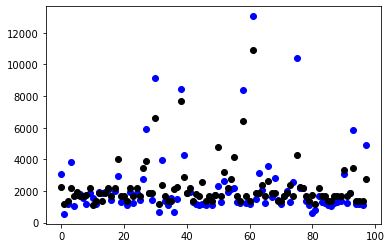

In [18]:
print(len(t_Y))
plt.figure()
plt.scatter(x=list(range(0, len(t_Y))),y= t_Y, color='blue')  #actual value
for i in range(0, len(t_X)):
    plt.scatter(x= i, y=np.sum(t_X.iloc[i]*weights), color='black')  #predicted value
plt.show()

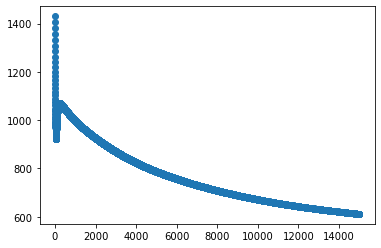

611.7273555868551


In [16]:
plt.figure()      #cost function decreament
plt.scatter(x=list(range(0, len(Costs))), y = Costs)
plt.show()
print(Costs[len(Costs)-1])

402    2250.197423
dtype: float64
403    1197.088317
dtype: float64
404    1373.081092
dtype: float64
405    2192.216227
dtype: float64
406    1707.378987
dtype: float64
407    1936.266212
dtype: float64
408    1707.378987
dtype: float64
409    1707.378987
dtype: float64
410    1718.534903
dtype: float64
411    2217.669658
dtype: float64
412    1084.244215
dtype: float64
413    1373.081092
dtype: float64
414    1883.371762
dtype: float64
415    1373.081092
dtype: float64
416    1883.371762
dtype: float64
417    2217.669658
dtype: float64
418    1707.378987
dtype: float64
419    2217.669658
dtype: float64
420    4049.829784
dtype: float64
421    1707.378987
dtype: float64
422    1707.378987
dtype: float64
423    1373.081092
dtype: float64
424    2217.669658
dtype: float64
425    1707.378987
dtype: float64
426    2217.669658
dtype: float64
427    1707.378987
dtype: float64
428    3474.210983
dtype: float64
429    3924.534444
dtype: float64
430    1883.371762
dtype: float64
431    1883.37

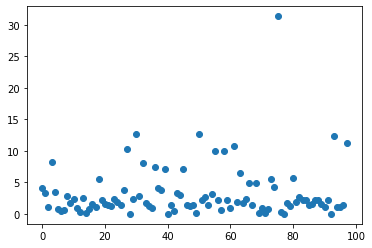

In [17]:
t_Costs = []   #costs for test data
for i in range(0, len(t_X)):
    c = computeCost(t_X.iloc[i:i+1],t_Y.iloc[i:i+1],weights, d = len(t_Y))
    t_Costs.append(c)

print(len(t_Costs))
plt.figure()
plt.scatter(x=list(range(0, len(t_Costs))), y = t_Costs)
plt.show()